# Capstone проект №1 
## Идентификация пользователей по посещенным веб-страницам


## Неделя 5. Соревнование Kaggle "Catch Me If You Can"

На этой неделе мы вспомним про концепцию стохастического градиентного спуска и опробуем классификатор Scikit-learn SGDClassifier, который работает намного быстрее на больших выборках, чем алгоритмы, которые мы тестировали на 4 неделе. Также мы познакомимся с данными соревнования Kaggle по идентификации пользователей и сделаем в нем первые посылки. По итогам этой недели дополнительные баллы получат те, кто попадет в топ-30 публичного лидерборда соревнования.

In [1]:
from __future__ import division, print_function
# отключим всякие предупреждения Anaconda
import warnings
warnings.filterwarnings('ignore')
import os
import pickle
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_auc_score

Считаем данные соревнования в DataFrame train_df и test_df (обучающая и тестовая выборки).

In [2]:
# Поменяйте на свой путь к данным
PATH_TO_DATA = 'capstone_user_identification'

In [3]:
train_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'train_sessions.csv'),
                       index_col='session_id')
test_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'test_sessions.csv'),
                      index_col='session_id')

In [4]:
train_df.head()

,site1,time1,site2,time2,site3,time3,site4,time4,site5,time5,...,time6,site7,time7,site8,time8,site9,time9,site10,time10,target
session_id,,,,,,,,,,,,,,,,,,,,,
1,718,2014-02-20 10:02:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,890,2014-02-22 11:19:50,941.0,2014-02-22 11:19:50,3847.0,2014-02-22 11:19:51,941.0,2014-02-22 11:19:51,942.0,2014-02-22 11:19:51,...,2014-02-22 11:19:51,3847.0,2014-02-22 11:19:52,3846.0,2014-02-22 11:19:52,1516.0,2014-02-22 11:20:15,1518.0,2014-02-22 11:20:16,0
3,14769,2013-12-16 16:40:17,39.0,2013-12-16 16:40:18,14768.0,2013-12-16 16:40:19,14769.0,2013-12-16 16:40:19,37.0,2013-12-16 16:40:19,...,2013-12-16 16:40:19,14768.0,2013-12-16 16:40:20,14768.0,2013-12-16 16:40:21,14768.0,2013-12-16 16:40:22,14768.0,2013-12-16 16:40:24,0
4,782,2014-03-28 10:52:12,782.0,2014-03-28 10:52:42,782.0,2014-03-28 10:53:12,782.0,2014-03-28 10:53:42,782.0,2014-03-28 10:54:12,...,2014-03-28 10:54:42,782.0,2014-03-28 10:55:12,782.0,2014-03-28 10:55:42,782.0,2014-03-28 10:56:12,782.0,2014-03-28 10:56:42,0
5,22,2014-02-28 10:53:05,177.0,2014-02-28 10:55:22,175.0,2014-02-28 10:55:22,178.0,2014-02-28 10:55:23,177.0,2014-02-28 10:55:23,...,2014-02-28 10:55:59,175.0,2014-02-28 10:55:59,177.0,2014-02-28 10:55:59,177.0,2014-02-28 10:57:06,178.0,2014-02-28 10:57:11,0


**Объединим обучающую и тестовую выборки – это понадобится, чтоб вместе потом привести их к разреженному формату.**

In [5]:
train_test_df = pd.concat([train_df, test_df])

Сессии пользователей выделены таким образом, что они не могут быть длинее получаса или 10 сайтов. То есть сессия считается оконченной либо когда пользователь посетил 10 сайтов подряд, либо когда сессия заняла по времени более 30 минут.

**Посмотрим на статистику признаков.**

Пропуски возникают там, где сессии короткие (менее 10 сайтов). Скажем, если человек 1 января 2015 года посетил vk.com в 20:01, потом yandex.ru в 20:29, затем google.com в 20:33, то первая его сессия будет состоять только из двух сайтов (site1 – ID сайта vk.com, time1 – 2015-01-01 20:01:00, site2 – ID сайта yandex.ru, time2 – 2015-01-01 20:29:00, остальные признаки – NaN), а начиная с google.com пойдет новая сессия, потому что уже прошло более 30 минут с момента посещения vk.com.

In [6]:
train_df.shape

(253561, 21)

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 253561 entries, 1 to 253561
Data columns (total 21 columns):
site1     253561 non-null int64
time1     253561 non-null object
site2     250098 non-null float64
time2     250098 non-null object
site3     246919 non-null float64
time3     246919 non-null object
site4     244321 non-null float64
time4     244321 non-null object
site5     241829 non-null float64
time5     241829 non-null object
site6     239495 non-null float64
time6     239495 non-null object
site7     237297 non-null float64
time7     237297 non-null object
site8     235224 non-null float64
time8     235224 non-null object
site9     233084 non-null float64
time9     233084 non-null object
site10    231052 non-null float64
time10    231052 non-null object
target    253561 non-null int64
dtypes: float64(9), int64(2), object(10)
memory usage: 42.6+ MB


In [8]:
test_df.head()

,site1,time1,site2,time2,site3,time3,site4,time4,site5,time5,site6,time6,site7,time7,site8,time8,site9,time9,site10,time10
session_id,,,,,,,,,,,,,,,,,,,,
1,29,2014-10-04 11:19:53,35.0,2014-10-04 11:19:53,22.0,2014-10-04 11:19:54,321.0,2014-10-04 11:19:54,23.0,2014-10-04 11:19:54,2211.0,2014-10-04 11:19:54,6730.0,2014-10-04 11:19:54,21.0,2014-10-04 11:19:54,44582.0,2014-10-04 11:20:00,15336.0,2014-10-04 11:20:00
2,782,2014-07-03 11:00:28,782.0,2014-07-03 11:00:53,782.0,2014-07-03 11:00:58,782.0,2014-07-03 11:01:06,782.0,2014-07-03 11:01:09,782.0,2014-07-03 11:01:10,782.0,2014-07-03 11:01:23,782.0,2014-07-03 11:01:29,782.0,2014-07-03 11:01:30,782.0,2014-07-03 11:01:53
3,55,2014-12-05 15:55:12,55.0,2014-12-05 15:55:13,55.0,2014-12-05 15:55:14,55.0,2014-12-05 15:56:15,55.0,2014-12-05 15:56:16,55.0,2014-12-05 15:56:17,55.0,2014-12-05 15:56:18,55.0,2014-12-05 15:56:19,1445.0,2014-12-05 15:56:33,1445.0,2014-12-05 15:56:36
4,1023,2014-11-04 10:03:19,1022.0,2014-11-04 10:03:19,50.0,2014-11-04 10:03:20,222.0,2014-11-04 10:03:21,202.0,2014-11-04 10:03:21,3374.0,2014-11-04 10:03:22,50.0,2014-11-04 10:03:22,48.0,2014-11-04 10:03:22,48.0,2014-11-04 10:03:23,3374.0,2014-11-04 10:03:23
5,301,2014-05-16 15:05:31,301.0,2014-05-16 15:05:32,301.0,2014-05-16 15:05:33,66.0,2014-05-16 15:05:39,67.0,2014-05-16 15:05:40,69.0,2014-05-16 15:05:40,70.0,2014-05-16 15:05:40,68.0,2014-05-16 15:05:40,71.0,2014-05-16 15:05:40,167.0,2014-05-16 15:05:44


In [9]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 82797 entries, 1 to 82797
Data columns (total 20 columns):
site1     82797 non-null int64
time1     82797 non-null object
site2     81308 non-null float64
time2     81308 non-null object
site3     80075 non-null float64
time3     80075 non-null object
site4     79182 non-null float64
time4     79182 non-null object
site5     78341 non-null float64
time5     78341 non-null object
site6     77566 non-null float64
time6     77566 non-null object
site7     76840 non-null float64
time7     76840 non-null object
site8     76151 non-null float64
time8     76151 non-null object
site9     75484 non-null float64
time9     75484 non-null object
site10    74806 non-null float64
time10    74806 non-null object
dtypes: float64(9), int64(1), object(10)
memory usage: 13.3+ MB


**В обучающей выборке – 2297 сессий одного пользователя (Alice) и 251264 сессий – других пользователей, не Элис. Дисбаланс классов очень сильный, и смотреть на долю верных ответов (accuracy) непоказательно.**

In [10]:
train_df['target'].value_counts()

0    251264
1      2297
Name: target, dtype: int64

**Пока для прогноза будем использовать только индексы посещенных сайтов. Индексы нумеровались с 1, так что заменим пропуски на нули.**

In [11]:
train_test_df_sites = train_test_df[['site%d' % i for i in range(1, 11)]].fillna(0).astype('int')

In [12]:
train_test_df_sites.head(10)

,site1,site2,site3,site4,site5,site6,site7,site8,site9,site10
session_id,,,,,,,,,,
1,718,0,0,0,0,0,0,0,0,0
2,890,941,3847,941,942,3846,3847,3846,1516,1518
3,14769,39,14768,14769,37,39,14768,14768,14768,14768
4,782,782,782,782,782,782,782,782,782,782
5,22,177,175,178,177,178,175,177,177,178
6,570,21,570,21,21,0,0,0,0,0
7,803,23,5956,17513,37,21,803,17514,17514,17514
8,22,21,29,5041,14422,23,21,5041,14421,14421
9,668,940,942,941,941,942,940,23,21,22


**Создайте разреженные матрицы X_train_sparse и X_test_sparse аналогично тому, как мы это делали ранее. Используйте объединенную матрицу train_test_df_sites, потом разделите обратно на обучающую и тестовую части.**

Обратите внимание на то, что в сессиях меньше 10 сайтов у нас остались нули, так что первый признак (сколько раз попался 0) по смыслу отличен от остальных (сколько раз попался сайт с индексом i). Поэтому первый столбец разреженной матрицы надо будет удалить.

**Выделите в отдельный вектор y ответы на обучающей выборке.**

In [13]:
import scipy.sparse as sps
from time import time

In [14]:
def create_sparse_matrix(dataframe):
    tmp_arr = np.array(dataframe)
    row = 0
    rows = []
    cols = []
    data = []

    for arr in tmp_arr:
        unique, counts = np.unique(arr, return_counts=True)
        print(dict(zip(unique, counts)))
        for key, value in dict(zip(unique, counts)).items():
            if key != 0:
                rows.append(row)
                cols.append(key-1)
                data.append(value)
        row = row + 1
        
    return(sps.coo_matrix((data, (rows, cols))))

In [15]:
t_start = time()

idx_split = train_df.shape[0]

train_test_sparse = csr_matrix(create_sparse_matrix(train_test_df_sites))

X_train_sparse = train_test_sparse[:idx_split, :]
X_test_sparse = train_test_sparse[idx_split:,:]

y = train_df.target

print('Train DF size: {0}\nTest DF size: {1}\nTarget size: {2}'.format(
    str(X_train_sparse.shape), str(X_test_sparse.shape), str(y.shape)))

print("Time elapse: ", time() - t_start)

{0: 9, 718: 1}
{890: 1, 941: 2, 942: 1, 1516: 1, 1518: 1, 3846: 2, 3847: 2}
{37: 1, 39: 2, 14768: 5, 14769: 2}
{782: 10}
{22: 1, 175: 2, 177: 4, 178: 3}
{0: 5, 21: 3, 570: 2}
{21: 1, 23: 1, 37: 1, 803: 2, 5956: 1, 17513: 1, 17514: 3}
{21: 2, 22: 1, 23: 1, 29: 1, 5041: 2, 14421: 2, 14422: 1}
{21: 1, 22: 1, 23: 1, 668: 1, 940: 2, 941: 2, 942: 2}
{21: 4, 229: 2, 570: 1, 2044: 1, 2336: 1, 3700: 1}
{23: 1, 29: 1, 33: 1, 35: 1, 229: 1, 391: 1, 1500: 2, 2276: 1, 40305: 1}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 39: 1, 890: 1, 3592: 2}
{21: 1, 23: 3, 55: 2, 56: 1, 747: 1, 749: 1, 752: 1}
{21: 1, 30: 1, 37: 1, 52: 1, 152: 1, 262: 1, 322: 1, 625: 1, 2164: 2}
{3: 1, 21: 2, 76: 1, 167: 3, 229: 1, 2883: 1, 2945: 1}
{30: 1, 102: 1, 248: 1, 727: 1, 728: 1, 1434: 1, 3362: 1, 3364: 1, 28395: 1, 28396: 1}
{63: 1, 167: 5, 359: 1, 360: 1, 362: 1, 363: 1}
{167: 2, 178: 1, 270: 1, 343: 1, 2724: 1, 2725: 1, 2726: 1, 2727: 1, 2732: 1}
{22736: 10}
{23: 2, 29: 2, 33: 1, 35: 1, 52: 1, 803: 1, 2439: 2}
{23: 1,

{21: 2, 22: 3, 23: 2, 39: 2, 1266: 1}
{21: 2, 22: 1, 39: 1, 661: 1, 666: 2, 16901: 1, 16902: 2}
{29: 1, 1162: 1, 1930: 2, 1931: 1, 1932: 1, 1933: 1, 1934: 1, 1935: 1, 1950: 1}
{782: 9, 784: 1}
{0: 5, 3: 1, 23: 1, 294: 3}
{3: 1, 12: 1, 14: 2, 15: 1, 18: 1, 23: 1, 4819: 2, 4894: 1}
{26: 2, 29: 2, 31: 2, 35: 1, 855: 1, 936: 1, 30623: 1}
{22: 1, 23: 1, 570: 1, 774: 1, 812: 3, 814: 1, 1039: 2}
{570: 1, 812: 1, 3876: 1, 27933: 1, 30963: 2, 37331: 1, 37332: 1, 37333: 1, 37334: 1}
{319: 1, 350: 1, 2742: 1, 17845: 6, 17846: 1}
{11: 1, 12: 2, 14: 1, 169: 3, 3871: 2, 3873: 1}
{20: 1, 21: 1, 29: 1, 35: 1, 117: 1, 141: 1, 390: 1, 462: 1, 2760: 2}
{23: 1, 39: 1, 50: 1, 616: 1, 617: 1, 676: 1, 679: 1, 814: 1, 1039: 1, 1441: 1}
{30: 1, 32: 1, 38: 1, 68: 1, 352: 1, 1946: 1, 2789: 1, 13482: 1, 22266: 1, 22267: 1}
{48: 2, 222: 1, 961: 1, 1023: 1, 1024: 1, 1980: 4}
{29: 1, 33: 5, 35: 4}
{948: 5, 959: 5}
{56: 1, 7867: 1, 10009: 2, 13548: 2, 13549: 2, 19615: 1, 19930: 1}
{21: 3, 22: 3, 23: 4}
{3: 4, 4: 1, 8

{3: 1, 29: 2, 30: 1, 32: 1, 33: 1, 268: 1, 1914: 1, 1915: 1, 5448: 1}
{3: 1, 30: 1, 37: 2, 167: 4, 4079: 2}
{21: 1, 49: 2, 52: 2, 53: 1, 304: 1, 820: 2, 980: 1}
{0: 6, 21: 1, 55: 2, 56: 1}
{22: 1, 39: 1, 63: 1, 66: 1, 676: 2, 679: 2, 812: 2}
{733: 10}
{22: 1, 23: 2, 29: 2, 35: 1, 37: 1, 156: 1, 319: 1, 678: 1}
{6003: 10}
{21: 2, 23: 3, 4804: 1, 11348: 4}
{7827: 1, 39023: 6, 39024: 3}
{49: 1, 52: 7, 53: 1, 784: 1}
{7973: 3, 11703: 1, 11704: 2, 11743: 2, 11744: 1, 11745: 1}
{21: 1, 229: 2, 13547: 7}
{778: 3, 780: 1, 782: 6}
{21: 1, 22: 1, 23: 1, 29: 1, 35: 1, 37: 1, 38: 1, 39: 1, 752: 2}
{896: 1, 5266: 1, 5644: 3, 7759: 2, 7762: 3}
{21: 1, 778: 5, 779: 2, 780: 2}
{167: 1, 359: 1, 780: 4, 782: 4}
{21: 1, 26: 1, 27: 1, 52: 4, 196: 1, 677: 1, 812: 1}
{23: 4, 52: 2, 53: 1, 196: 1, 197: 1, 625: 1}
{782: 10}
{1227: 10}
{21: 2, 22: 3, 23: 1, 39: 2, 676: 1, 812: 1}
{23: 2, 39: 1, 63: 1, 66: 1, 616: 2, 617: 1, 774: 1, 775: 1}
{55: 8, 56: 1, 197: 1}
{22: 1, 23: 1, 30: 1, 896: 1, 1919: 1, 5641: 2, 

{21: 1, 46: 1, 48: 1, 52: 1, 188: 1, 301: 1, 18623: 4}
{3290: 10}
{22: 1, 23: 2, 52: 4, 53: 1, 56: 1, 1125: 1}
{0: 6, 55: 2, 56: 1, 78: 1}
{400: 1, 473: 1, 478: 3, 2428: 2, 2742: 2, 33922: 1}
{1232: 1, 1236: 1, 1241: 1, 1251: 1, 1256: 1, 6277: 1, 7932: 1, 10976: 3}
{75: 1, 76: 5, 77: 1, 78: 1, 80: 1, 1307: 1}
{1401: 1, 2829: 4, 22316: 1, 22884: 4}
{23: 4, 513: 1, 747: 1, 748: 2, 749: 1, 752: 1}
{76: 2, 77: 3, 78: 1, 80: 2, 81: 1, 873: 1}
{23: 1, 325: 1, 2612: 3, 2738: 1, 2739: 1, 2740: 1, 2742: 1, 8492: 1}
{21: 3, 29: 3, 30: 1, 35: 1, 229: 1, 533: 1}
{23: 2, 29: 1, 50: 1, 236: 1, 323: 1, 747: 3, 749: 1}
{3: 1, 26: 1, 31: 1, 167: 2, 204: 1, 384: 1, 811: 1, 2054: 1, 2139: 1}
{7973: 1, 7979: 1, 7980: 1, 7983: 1, 7995: 1, 11090: 1, 11700: 1, 11703: 1, 11717: 1, 11835: 1}
{4: 1, 8: 1, 14: 1, 51: 1, 207: 1, 677: 1, 678: 1, 1998: 1, 9548: 1, 37306: 1}
{23: 3, 38: 1, 52: 3, 678: 1, 753: 1, 989: 1}
{21: 2, 38: 2, 183: 1, 185: 1, 1320: 1, 1883: 1, 1884: 1, 9258: 1}
{780: 6, 782: 4}
{22: 1, 23: 3

{63: 1, 66: 1, 134: 2, 170: 1, 1074: 3, 1174: 1, 1175: 1}
{14: 1, 51: 3, 2169: 1, 9396: 1, 9469: 4}
{670: 1, 2560: 4, 10053: 1, 18727: 3, 18986: 1}
{23: 1, 52: 2, 76: 2, 77: 1, 80: 1, 81: 2, 876: 1}
{22: 1, 23: 2, 39: 1, 52: 1, 678: 1, 679: 1, 1152: 1, 1155: 1, 3480: 1}
{21: 1, 23: 2, 29: 1, 322: 2, 533: 1, 749: 1, 4400: 1, 24101: 1}
{163: 1, 217: 1, 220: 2, 261: 2, 341: 1, 765: 1, 1050: 1, 1051: 1}
{21: 4, 22: 2, 23: 2, 63: 1, 3691: 1}
{1232: 2, 1234: 2, 1235: 2, 1236: 2, 1237: 2}
{22: 3, 29: 1, 33: 1, 37: 1, 3690: 4}
{29: 1, 30: 1, 33: 1, 35: 1, 99: 1, 167: 3, 18806: 2}
{0: 2, 21: 1, 23: 2, 39: 1, 63: 1, 676: 1, 679: 1, 812: 1}
{23: 3, 52: 3, 222: 1, 3354: 1, 3356: 1, 3357: 1}
{76: 3, 77: 2, 80: 2, 879: 1, 1307: 2}
{0: 8, 55: 1, 8193: 1}
{5: 2, 2008: 1, 2014: 1, 2018: 1, 3970: 2, 37617: 1, 37744: 1, 37745: 1}
{3: 1, 14: 1, 15: 2, 16: 1, 18: 2, 65: 1, 272: 1, 1985: 1}
{912: 3, 5820: 3, 23183: 4}
{78: 1, 80: 3, 879: 6}
{1098: 10}
{21: 1, 229: 9}
{22: 1, 48: 1, 50: 1, 222: 1, 570: 2, 77

{23: 1, 570: 1, 616: 2, 677: 2, 812: 1, 1452: 1, 3480: 1, 5538: 1}
{21: 3, 23: 1, 52: 1, 53: 1, 570: 1, 812: 2, 15679: 1}
{167: 2, 170: 1, 305: 1, 306: 3, 359: 1, 1101: 2}
{22: 2, 29: 1, 30: 1, 35: 1, 510: 2, 1310: 1, 1315: 1, 2646: 1}
{29: 1, 35: 1, 52: 2, 53: 1, 222: 1, 533: 1, 1286: 1, 1287: 1, 23964: 1}
{21: 2, 23: 1, 175: 1, 177: 1, 178: 1, 2589: 1, 2590: 1, 3938: 1, 10068: 1}
{0: 7, 300: 3}
{21: 2, 22: 3, 35: 1, 37: 1, 39: 1, 17101: 2}
{74: 2, 76: 1, 648: 2, 5721: 1, 31923: 1, 39236: 1, 39237: 1, 39238: 1}
{29: 1, 30: 2, 33: 1, 37: 1, 46: 1, 3131: 4}
{21: 3, 22: 1, 23: 2, 301: 3, 3557: 1}
{778: 4, 780: 5, 782: 1}
{782: 9, 783: 1}
{22: 2, 570: 1, 616: 4, 617: 1, 777: 2}
{80: 3, 82: 7}
{677: 1, 2155: 8, 2156: 1}
{21: 3, 134: 2, 170: 1, 982: 1, 1074: 3}
{21: 1, 23: 1, 57: 1, 229: 7}
{21: 1, 513: 1, 570: 1, 33767: 7}
{21: 1, 23: 4, 29: 1, 52: 2, 803: 1, 2439: 1}
{80: 4, 879: 6}
{167: 1, 360: 2, 362: 1, 363: 3, 364: 3}
{21: 1, 22: 1, 57: 1, 14381: 1, 14382: 6}
{0: 8, 55: 1, 56: 1}
{30

{0: 7, 21: 1, 175: 1, 177: 1}
{782: 10}
{55: 2, 56: 1, 782: 7}
{29: 1, 5041: 5, 14421: 4}
{49: 1, 52: 2, 53: 1, 170: 2, 196: 1, 197: 1, 222: 1, 1074: 1}
{616: 2, 821: 8}
{37: 1, 77: 1, 156: 1, 162: 1, 322: 1, 2589: 1, 2591: 1, 2595: 2, 19412: 1}
{46: 1, 48: 1, 220: 1, 559: 2, 563: 1, 2181: 1, 4619: 2, 5870: 1}
{1: 1, 29: 1, 143: 3, 159: 1, 394: 1, 396: 1, 397: 1, 2428: 1}
{78: 1, 80: 1, 881: 2, 1057: 1, 14614: 3, 14617: 2}
{37: 2, 39: 2, 322: 1, 325: 1, 1158: 1, 1919: 1, 3667: 1, 3668: 1}
{21: 3, 177: 1, 229: 1, 570: 1, 7148: 2, 15174: 1, 15175: 1}
{22: 1, 39: 1, 570: 1, 812: 2, 814: 2, 815: 1, 816: 2}
{55: 1, 7276: 1, 7277: 8}
{21: 4, 22: 2, 23: 1, 39: 1, 676: 1, 812: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 616: 1, 677: 1, 775: 2, 812: 1, 815: 1}
{940: 2, 941: 5, 942: 3}
{29: 2, 30: 2, 33: 1, 131: 1, 8745: 1, 8746: 1, 18866: 2}
{6725: 2, 41475: 7, 41476: 1}
{21: 1, 23: 1, 29: 2, 30: 1, 33: 1, 52: 1, 2870: 1, 3860: 1, 3861: 1}
{21: 1, 23: 2, 196: 1, 197: 1, 222: 1, 617: 1, 677: 2, 803: 1}
{6:

{21: 2, 175: 3, 177: 2, 178: 2, 677: 1}
{941: 3, 942: 1, 3559: 2, 3560: 1, 3848: 1, 3849: 2}
{63: 1, 3425: 2, 7603: 2, 7606: 2, 7608: 1, 7610: 1, 15164: 1}
{23695: 10}
{21: 2, 29: 1, 37: 1, 49: 1, 85: 1, 388: 2, 389: 1, 1359: 1}
{38: 1, 896: 1, 1116: 1, 2220: 1, 2441: 1, 2442: 1, 2443: 2, 2453: 2}
{63: 1, 941: 2, 942: 2, 3846: 2, 3847: 3}
{0: 8, 896: 2}
{940: 2, 941: 1, 942: 2, 3559: 3, 3560: 2}
{321: 1, 324: 1, 325: 1, 1829: 2, 2627: 1, 8745: 1, 8746: 1, 14849: 1, 14850: 1}
{6: 1, 8: 1, 14: 5, 16: 1, 249: 2}
{23: 1, 63: 1, 778: 1, 780: 7}
{0: 6, 805: 1, 808: 2, 809: 1}
{616: 1, 782: 2, 786: 5, 1162: 2}
{961: 4, 1023: 2, 1024: 1, 1025: 2, 13049: 1}
{22: 1, 23: 1, 75: 2, 76: 1, 77: 2, 80: 1, 617: 1, 1345: 1}
{3: 1, 167: 1, 384: 1, 943: 1, 10999: 1, 11000: 3, 11001: 2}
{21: 5, 22: 2, 23: 2, 63: 1}
{2962: 6, 2963: 1, 2964: 3}
{1623: 1, 1625: 1, 7102: 8}
{21: 1, 2428: 9}
{855: 3, 1514: 1, 1515: 1, 1518: 1, 1520: 1, 1521: 1, 2587: 2}
{129: 1, 236: 1, 391: 1, 396: 1, 397: 1, 2425: 1, 2428: 1

{21: 3, 229: 4, 305: 1, 306: 2}
{21: 1, 48: 1, 50: 1, 52: 1, 57: 1, 222: 1, 993: 2, 2026: 1, 10102: 1}
{21: 1, 23: 1, 29: 1, 30: 1, 319: 1, 559: 3, 707: 1, 1152: 1}
{1401: 4, 2829: 3, 22316: 3}
{1: 1, 38: 1, 125: 1, 305: 1, 306: 1, 386: 1, 387: 1, 389: 1, 391: 1, 417: 1}
{23: 1, 75: 3, 76: 1, 77: 1, 248: 2, 527: 1, 25014: 1}
{969: 1, 1401: 1, 2829: 2, 2837: 3, 22316: 3}
{48: 1, 50: 1, 52: 1, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 222: 1}
{21: 3, 175: 3, 177: 3, 178: 1}
{22: 1, 570: 1, 616: 1, 803: 7}
{3: 3, 4: 1, 8: 2, 21: 3, 41214: 1}
{0: 1, 77: 1, 80: 1, 167: 3, 39056: 2, 39057: 1, 39058: 1}
{29: 2, 37: 2, 152: 1, 167: 1, 270: 3, 319: 1}
{616: 4, 774: 1, 814: 1, 1452: 3, 1453: 1}
{778: 2, 780: 7, 782: 1}
{167: 4, 360: 2, 361: 1, 362: 1, 363: 1, 364: 1}
{23: 1, 38: 2, 500: 2, 501: 1, 502: 1, 503: 1, 506: 2}
{2425: 4, 2426: 2, 2427: 1, 2428: 1, 3993: 1, 21713: 1}
{3: 1, 7: 2, 10: 1, 11: 1, 12: 1, 14: 1, 16: 1, 6088: 2}
{21: 3, 22: 1, 23: 2, 29: 1, 25999: 2, 26000: 1}
{23: 1, 52: 2, 75: 4

{3: 2, 22: 1, 29: 1, 167: 5, 18650: 1}
{26: 1, 27: 1, 29: 2, 30: 1, 31: 2, 33: 1, 36: 1, 148: 1}
{30: 1, 32: 1, 35: 1, 37: 1, 2271: 1, 2997: 1, 2998: 1, 26353: 2, 26379: 1}
{1980: 9, 3379: 1}
{3: 1, 63: 1, 66: 1, 167: 4, 175: 1, 177: 1, 359: 1}
{0: 6, 11: 1, 55: 2, 56: 1}
{22: 1, 570: 3, 677: 1, 812: 4, 815: 1}
{22: 1, 33: 1, 35: 1, 258: 1, 327: 1, 395: 1, 396: 1, 397: 1, 3579: 1, 5527: 1}
{175: 4, 176: 2, 177: 3, 178: 1}
{21: 1, 23: 2, 45: 1, 52: 1, 175: 1, 176: 1, 177: 1, 178: 1, 5653: 1}
{29: 1, 305: 1, 306: 2, 1619: 1, 1980: 2, 3380: 1, 3393: 1, 6618: 1}
{3: 2, 4: 1, 8: 2, 10: 1, 14: 2, 1199: 1, 39948: 1}
{782: 1, 786: 9}
{21: 1, 23: 1, 48: 1, 49: 1, 134: 1, 170: 1, 753: 2, 1074: 2}
{1023: 4, 1024: 1, 1025: 2, 3361: 1, 3362: 1, 3363: 1}
{0: 3, 23: 1, 39: 1, 676: 1, 812: 4}
{21: 2, 229: 1, 256: 1, 1107: 1, 4540: 2, 4960: 3}
{22: 2, 29: 1, 323: 1, 350: 2, 1379: 1, 1979: 1, 4199: 1, 4201: 1}
{3: 2, 47: 2, 50: 1, 55: 1, 3349: 3, 9463: 1}
{49: 1, 4276: 9}
{677: 2, 774: 1, 812: 6, 1551: 

{21: 1, 55: 4, 56: 1, 570: 2, 774: 1, 1039: 1}
{23: 2, 29: 1, 33: 2, 35: 1, 38: 1, 196: 1, 197: 1, 2271: 1}
{778: 9, 782: 1}
{21: 2, 23: 1, 49: 1, 50: 1, 57: 1, 1058: 1, 2555: 1, 12719: 1, 36885: 1}
{55: 10}
{22: 1, 23: 1, 616: 2, 679: 1, 774: 1, 1274: 1, 1275: 1, 3480: 2}
{21: 1, 38: 1, 48: 1, 532: 1, 544: 1, 753: 1, 989: 2, 1020: 1, 1021: 1}
{21: 1, 22: 1, 23: 1, 38: 1, 17282: 6}
{23: 1, 76: 1, 229: 1, 830: 4, 837: 1, 2956: 1, 15195: 1}
{0: 8, 784: 2}
{0: 5, 167: 2, 305: 1, 306: 2}
{48: 2, 49: 2, 50: 1, 52: 2, 53: 1, 196: 1, 197: 1}
{0: 9, 39: 1}
{21: 8, 7498: 1, 7499: 1}
{167: 1, 360: 2, 361: 1, 362: 2, 363: 2, 364: 2}
{0: 8, 55: 1, 56: 1}
{0: 5, 170: 1, 1098: 4}
{3: 2, 167: 4, 175: 1, 176: 1, 177: 1, 178: 1}
{22: 1, 23: 1, 570: 3, 616: 2, 677: 1, 1039: 1, 2414: 1}
{77: 1, 80: 3, 879: 2, 27148: 4}
{570: 9, 1039: 1}
{18: 1, 225: 1, 2636: 1, 4534: 1, 31822: 1, 31827: 1, 31831: 1, 31832: 1, 31839: 1, 31851: 1}
{21: 1, 45: 1, 49: 1, 52: 4, 53: 1, 222: 1, 301: 1}
{5: 7, 17: 2, 18: 1}
{0:

{2612: 10}
{5: 4, 21: 2, 23: 1, 119: 1, 122: 1, 132: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 784: 1, 812: 1, 814: 1, 815: 1, 979: 1}
{570: 1, 677: 1, 782: 8}
{617: 2, 940: 2, 941: 2, 942: 2, 3560: 2}
{21: 1, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 704: 1, 23198: 1, 23199: 1, 23200: 1}
{2829: 4, 6844: 4, 22316: 2}
{30: 1, 33: 1, 35: 1, 533: 2, 3526: 1, 16100: 2, 35010: 1, 36690: 1}
{0: 6, 22: 1, 570: 1, 774: 1, 812: 1}
{21: 1, 22: 1, 30: 1, 37: 1, 39: 1, 52: 2, 162: 1, 28610: 1, 28611: 1}
{782: 10}
{3: 1, 4: 1, 6: 1, 8: 2, 14: 1, 6088: 2, 9394: 1, 27190: 1}
{22: 3, 23: 2, 812: 1, 814: 2, 8615: 2}
{12: 1, 63: 1, 66: 1, 1985: 7}
{21: 1, 23: 2, 219: 1, 220: 1, 347: 1, 751: 1, 896: 1, 36843: 1, 36844: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 220: 1, 747: 1, 748: 1, 3053: 1, 22982: 2}
{782: 10}
{1238: 2, 1239: 2, 1240: 2, 1248: 1, 6191: 1, 6192: 1, 10968: 1}
{20: 1, 21: 2, 22: 1, 23: 1, 270: 1, 7310: 4}
{5261: 3, 5263: 4, 5264: 1, 5265: 1, 22964: 1}
{29: 1, 399: 1, 570: 1, 1586: 1, 1587: 4, 19088: 1, 2045

{49: 1, 52: 1, 55: 2, 56: 1, 1202: 5}
{23: 1, 32: 1, 52: 4, 53: 1, 55: 1, 56: 1, 6848: 1}
{49: 1, 52: 1, 53: 1, 170: 2, 196: 1, 197: 1, 222: 1, 753: 1, 1074: 1}
{22: 1, 55: 1, 56: 1, 782: 6, 783: 1}
{21: 3, 22: 2, 23: 2, 38: 1, 481: 2}
{167: 2, 360: 1, 362: 2, 363: 2, 364: 2, 1652: 1}
{1204: 3, 1205: 4, 1206: 1, 1207: 1, 1209: 1}
{21: 6, 22: 1, 229: 1, 8119: 2}
{55: 1, 56: 1, 948: 1, 953: 3, 959: 1, 5608: 1, 5615: 1, 5616: 1}
{780: 8, 782: 2}
{0: 7, 63: 1, 66: 1, 384: 1}
{76: 1, 80: 4, 82: 5}
{23: 3, 52: 2, 513: 1, 747: 2, 752: 1, 1049: 1}
{21: 1, 102: 1, 812: 1, 6894: 6, 6895: 1}
{21: 2, 38: 2, 125: 1, 140: 1, 386: 3, 391: 1}
{80: 2, 881: 3, 14612: 3, 14613: 2}
{27959: 10}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 2}
{3: 1, 5: 3, 6: 1, 11: 1, 14: 1, 63: 1, 66: 1, 19113: 1}
{778: 2, 780: 8}
{21: 2, 23: 1, 38: 1, 1007: 1, 8781: 1, 8811: 1, 8814: 1, 8815: 1, 8816: 1}
{22: 2, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 39: 1, 896: 2}
{22: 1, 39: 1, 4398: 2, 4399: 1, 39887: 5}
{23: 2, 38: 1, 52: 1, 1

{167: 1, 175: 1, 177: 2, 178: 2, 363: 1, 364: 1, 11561: 1, 11562: 1}
{778: 1, 780: 3, 782: 4, 812: 1, 816: 1}
{29: 1, 559: 2, 1444: 1, 2954: 2, 10099: 1, 23291: 1, 26174: 2}
{32: 1, 75: 2, 77: 1, 182: 1, 516: 1, 609: 1, 681: 1, 695: 2}
{21: 1, 29: 2, 30: 2, 37: 1, 38: 1, 319: 1, 3837: 1, 22000: 1}
{29: 1, 33: 1, 35: 1, 37: 1, 500: 2, 503: 3, 511: 1}
{22: 2, 29: 1, 33: 2, 35: 2, 37: 1, 153: 2}
{0: 2, 22: 1, 570: 1, 774: 1, 812: 2, 816: 1, 973: 2}
{1: 1, 21: 1, 22: 1, 23: 1, 29: 1, 30: 1, 229: 2, 337: 2}
{3: 5, 4: 1, 8: 2, 14: 1, 3309: 1}
{39: 1, 679: 1, 812: 5, 986: 1, 987: 1, 988: 1}
{23: 1, 38: 1, 52: 1, 55: 2, 747: 2, 2528: 2, 2529: 1}
{66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 1, 848: 1}
{2155: 9, 2156: 1}
{0: 3, 782: 7}
{21: 1, 49: 1, 52: 2, 53: 1, 39340: 5}
{11898: 1, 18697: 3, 18700: 1, 18703: 1, 18707: 1, 28976: 1, 28977: 2}
{75: 1, 76: 1, 138: 1, 139: 1, 140: 1, 148: 1, 155: 1, 400: 1, 830: 1, 20854: 1}
{22: 2, 29: 1, 154: 1, 704: 1, 24539: 5}
{961: 5, 1980: 5}
{21: 1, 22: 1, 23: 

{29: 1, 33: 1, 35: 1, 37: 2, 38: 1, 145: 2, 1919: 1, 2984: 1}
{22: 1, 75: 2, 76: 1, 77: 1, 78: 1, 79: 1, 80: 1, 81: 1, 1307: 1}
{29: 1, 33: 1, 35: 2, 2030: 2, 13972: 4}
{6625: 10}
{23: 1, 55: 1, 222: 1, 319: 1, 543: 1, 747: 2, 749: 2, 752: 1}
{1980: 7, 1981: 1, 3346: 2}
{36828: 10}
{21: 3, 175: 1, 176: 1, 177: 1, 178: 1, 752: 1, 851: 1, 8778: 1}
{2425: 2, 2428: 8}
{0: 9, 973: 1}
{21: 2, 22: 1, 26: 1, 30: 1, 31: 1, 5113: 1, 5206: 1, 6881: 1, 10002: 1}
{21: 4, 63: 1, 1101: 5}
{6: 1, 14: 1, 272: 2, 812: 2, 1086: 2, 11539: 2}
{21: 1, 22: 2, 23: 1, 35: 1, 39: 1, 1152: 1, 1153: 1, 1154: 1, 1156: 1}
{396: 2, 397: 3, 2425: 1, 2427: 1, 2428: 1, 2646: 2}
{0: 6, 3: 2, 2169: 1, 5580: 1}
{58: 1, 63: 1, 1980: 3, 1981: 1, 3346: 2, 3380: 2}
{49: 1, 52: 1, 55: 2, 170: 1, 753: 2, 1074: 3}
{1241: 4, 6277: 3, 6279: 1, 10975: 1, 10976: 1}
{0: 9, 973: 1}
{182: 1, 1820: 2, 13352: 1, 13355: 1, 13356: 2, 13362: 1, 13374: 2}
{21: 1, 23: 2, 48: 1, 513: 1, 568: 1, 747: 3, 749: 1}
{3: 2, 8: 1, 71: 1, 167: 2, 207: 

{21: 1, 22: 1, 29: 1, 30: 1, 35: 1, 39: 1, 57: 1, 162: 2, 1919: 1}
{23: 1, 39: 3, 570: 1, 676: 2, 679: 1, 812: 1, 816: 1}
{35: 1, 39: 1, 3342: 1, 13932: 1, 23253: 3, 23356: 1, 25674: 1, 25675: 1}
{167: 4, 360: 1, 362: 2, 363: 1, 364: 2}
{0: 9, 22: 1}
{21: 1, 46: 1, 55: 2, 56: 1, 625: 1, 948: 1, 959: 1, 6876: 2}
{37: 2, 782: 5, 5356: 3}
{22: 1, 29: 2, 30: 1, 39: 2, 156: 1, 323: 1, 2488: 2}
{21: 3, 39: 3, 676: 2, 812: 2}
{49: 1, 52: 3, 53: 2, 56: 1, 196: 1, 197: 2}
{782: 10}
{21: 3, 23: 1, 20118: 6}
{29: 1, 1922: 1, 2077: 6, 2078: 2}
{10917: 1, 10958: 1, 11088: 1, 11102: 2, 11108: 1, 18124: 3, 18180: 1}
{21: 1, 570: 2, 774: 2, 812: 4, 1039: 1}
{21: 2, 5939: 8}
{782: 10}
{29: 1, 2612: 2, 3823: 1, 6832: 4, 33054: 1, 33055: 1}
{1: 1, 21: 3, 22: 1, 23: 2, 39: 1, 812: 2}
{22: 2, 37: 1, 1619: 2, 3393: 5}
{21: 1, 23: 1, 167: 1, 384: 1, 1645: 1, 1646: 1, 6225: 1, 7232: 1, 7233: 1, 7234: 1}
{21: 1, 23: 1, 7756: 1, 7758: 2, 15560: 2, 20884: 2, 28699: 1}
{0: 5, 784: 1, 820: 4}
{1: 1, 21: 2, 23: 1, 

{21: 1, 23: 1, 48: 1, 148: 1, 341: 1, 840: 1, 935: 1, 2555: 2, 21013: 1}
{21: 3, 22: 1, 23: 3, 20272: 2, 20273: 1}
{21: 1, 23: 3, 38: 1, 52: 2, 182: 1, 242: 2}
{778: 4, 780: 5, 782: 1}
{21: 1, 177: 1, 178: 1, 940: 2, 941: 2, 942: 2, 3876: 1}
{597: 1, 598: 2, 2612: 2, 2918: 1, 3941: 1, 3942: 1, 36594: 1, 36595: 1}
{29: 2, 33: 2, 35: 1, 33704: 5}
{22: 1, 52: 1, 53: 1, 570: 1, 616: 1, 677: 3, 678: 1, 774: 1}
{167: 1, 270: 1, 360: 2, 362: 1, 363: 2, 364: 2, 384: 1}
{21: 2, 23: 1, 38: 1, 48: 1, 315: 1, 318: 2, 320: 1, 1018: 1}
{140: 2, 141: 1, 197: 1, 217: 1, 261: 2, 625: 1, 14876: 1, 17179: 1}
{3969: 10}
{20: 1, 21: 2, 45: 1, 229: 5, 677: 1}
{6725: 2, 41475: 3, 41476: 5}
{23: 2, 747: 4, 6824: 3, 6825: 1}
{22: 1, 39: 1, 300: 1, 570: 2, 774: 2, 812: 1, 814: 1, 815: 1}
{21: 1, 29: 1, 32: 1, 33: 1, 35: 1, 140: 1, 455: 1, 504: 1, 505: 1, 507: 1}
{317: 1, 2042: 1, 2336: 1, 12977: 1, 22443: 1, 25343: 1, 32326: 2, 37484: 1, 37489: 1}
{778: 2, 780: 1, 782: 7}
{778: 1, 780: 6, 782: 3}
{0: 7, 305: 1,

{0: 7, 21: 3}
{3: 1, 167: 4, 175: 1, 177: 3, 178: 1}
{22: 1, 33: 1, 35: 1, 173: 1, 2877: 2, 2882: 4}
{33: 1, 35: 1, 140: 1, 148: 1, 161: 1, 262: 1, 321: 1, 392: 1, 539: 1, 2834: 1}
{21: 1, 30: 1, 38: 1, 46: 1, 48: 1, 49: 1, 778: 2, 782: 2}
{363: 2, 3278: 1, 3396: 1, 7165: 1, 12632: 1, 17620: 3, 37173: 1}
{23: 3, 812: 2, 13932: 3, 13933: 1, 13934: 1}
{21: 4, 22: 1, 23: 1, 63: 1, 784: 2, 4804: 1}
{48: 1, 52: 2, 53: 1, 278: 1, 1595: 2, 1619: 1, 21242: 1, 21243: 1}
{29: 1, 33: 1, 4901: 7, 4902: 1}
{21: 1, 23: 2, 52: 1, 53: 1, 55: 1, 56: 1, 196: 1, 197: 1, 21624: 1}
{30: 2, 36: 1, 46: 1, 48: 1, 116: 1, 144: 1, 1206: 1, 1207: 1, 1208: 1}
{2921: 10}
{21: 3, 76: 1, 80: 4, 570: 1, 4804: 1}
{29: 1, 80: 1, 81: 2, 140: 1, 4835: 3, 4836: 1, 4837: 1}
{30: 1, 32: 1, 33: 1, 2267: 1, 24814: 5, 24815: 1}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 2, 49: 1, 625: 1, 3358: 1, 12436: 1}
{1: 1, 338: 1, 961: 1, 1022: 1, 1023: 3, 1024: 1, 1025: 1, 8440: 1}
{5: 4, 8: 1, 10: 1, 14: 3, 26682: 1}
{75: 2, 76: 2, 77: 2, 79: 1

{0: 9, 52: 1}
{21: 1, 23: 1, 39: 2, 616: 2, 676: 1, 677: 1, 679: 1, 3480: 1}
{570: 2, 677: 1, 948: 4, 959: 3}
{29: 2, 156: 1, 319: 4, 324: 1, 9829: 2}
{21: 1, 22: 1, 23: 1, 38: 1, 63: 1, 66: 1, 145: 1, 2155: 2, 2156: 1}
{22: 2, 29: 1, 30: 1, 35: 1, 116: 1, 119: 1, 322: 1, 539: 1, 16007: 1}
{21: 1, 23: 1, 29: 1, 133: 1, 233: 1, 1015: 1, 14422: 4}
{23: 1, 39: 2, 570: 1, 616: 1, 617: 1, 677: 1, 812: 1, 815: 1, 2414: 1}
{3: 2, 8: 1, 47: 1, 48: 2, 50: 1, 1086: 2, 1185: 1}
{0: 7, 39: 1, 812: 1, 1039: 1}
{786: 10}
{3: 1, 21: 3, 22: 1, 23: 3, 229: 1, 820: 1}
{22: 1, 616: 3, 617: 1, 677: 1, 774: 1, 812: 2, 1274: 1}
{140: 1, 399: 2, 400: 1, 464: 1, 2426: 1, 2428: 1, 3062: 1, 3125: 1, 20148: 1}
{16: 1, 677: 1, 1468: 3, 1469: 4, 2630: 1}
{75: 1, 76: 2, 77: 5, 80: 1, 1980: 1}
{22: 2, 29: 1, 38: 1, 7340: 1, 9586: 3, 22802: 1, 22803: 1}
{21: 1, 23: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 1, 820: 1}
{0: 4, 21: 1, 55: 4, 56: 1}
{3290: 10}
{167: 1, 363: 1, 1756: 1, 7876: 1, 12867: 1, 22182: 1,

{21: 1, 22: 2, 35: 1, 39: 1, 747: 3, 14607: 2}
{29003: 9, 29004: 1}
{21: 1, 22: 1, 23: 1, 162: 2, 291: 1, 940: 2, 941: 1, 942: 1}
{0: 3, 21: 1, 22: 1, 23: 1, 48: 1, 50: 1, 57: 1, 222: 1}
{21: 1, 77: 1, 225: 1, 616: 2, 617: 1, 677: 1, 21673: 1, 21674: 1, 23270: 1}
{22: 3, 35: 1, 37: 4, 39: 2}
{778: 4, 780: 6}
{21: 1, 23: 1, 32: 1, 33: 1, 35: 1, 7290: 1, 7858: 3, 7859: 1}
{38: 1, 958: 1, 4398: 2, 4399: 2, 4400: 1, 4402: 1, 4489: 2}
{890: 1, 896: 4, 1994: 1, 6933: 1, 14768: 2, 14769: 1}
{778: 9, 779: 1}
{21: 2, 23: 1, 52: 1, 53: 1, 55: 2, 56: 1, 5801: 2}
{778: 7, 779: 2, 801: 1}
{22: 1, 152: 1, 3368: 1, 39542: 1, 39543: 5, 39544: 1}
{22: 2, 23: 3, 39: 1, 814: 2, 8615: 2}
{21: 1, 22: 3, 23: 1, 39: 1, 1153: 1, 1155: 1, 1158: 2}
{0: 8, 21: 2}
{63: 1, 66: 1, 1301: 8}
{21: 2, 22: 1, 23: 1, 39: 1, 175: 2, 176: 1, 177: 1, 21076: 1}
{20: 1, 21: 2, 23: 2, 63: 2, 66: 1, 784: 2}
{29: 1, 335: 1, 890: 1, 2815: 5, 2868: 2}
{29: 1, 961: 1, 1980: 1, 1981: 1, 1982: 1, 1984: 1, 3397: 2, 3398: 2}
{21: 1, 49

{21: 1, 22: 4, 23: 1, 570: 2, 774: 1, 812: 1}
{21: 3, 22: 3, 23: 2, 15924: 2}
{76: 1, 80: 4, 879: 5}
{29: 1, 35: 1, 77: 1, 890: 1, 941: 1, 942: 1, 3876: 1, 25456: 2, 39267: 1}
{48: 1, 49: 1, 76: 3, 77: 1, 134: 1, 570: 1, 753: 1, 1074: 1}
{0: 9, 812: 1}
{21: 2, 23: 1, 29: 1, 936: 2, 2213: 2, 24334: 1, 24335: 1}
{3: 4, 4: 1, 8: 2, 51: 2, 188: 1}
{66: 1, 67: 1, 68: 1, 69: 2, 70: 2, 71: 1, 167: 1, 270: 1}
{145: 2, 20317: 3, 30821: 5}
{29: 1, 148: 1, 392: 1, 607: 1, 681: 1, 697: 1, 700: 1, 704: 1, 6353: 1, 7854: 1}
{969: 1, 1401: 1, 2829: 6, 22316: 2}
{12: 1, 272: 7, 1919: 1, 9652: 1}
{0: 6, 63: 1, 305: 1, 306: 2}
{782: 10}
{197: 1, 217: 3, 2051: 1, 2215: 2, 3049: 1, 4309: 1, 4310: 1}
{21: 1, 22: 1, 23: 1, 570: 1, 812: 4, 816: 2}
{780: 9, 782: 1}
{1253: 1, 1255: 1, 6273: 1, 7971: 1, 7972: 1, 7973: 1, 7986: 1, 7994: 1, 7999: 1, 11067: 1}
{3: 3, 8: 1, 47: 1, 48: 2, 50: 1, 205: 1, 1304: 1}
{3290: 10}
{23: 1, 32: 1, 33: 1, 35: 1, 38: 1, 1015: 1, 1585: 1, 1586: 1, 1587: 1, 40210: 1}
{0: 9, 2161:

{21: 1, 2546: 1, 2547: 1, 5366: 2, 5367: 1, 5368: 2, 31120: 1, 33124: 1}
{21: 3, 570: 1, 797: 2, 13266: 4}
{23: 2, 148: 1, 152: 2, 262: 1, 513: 1, 747: 1, 749: 1, 2423: 1}
{22: 1, 23: 1, 323: 1, 324: 1, 325: 1, 896: 1, 3179: 1, 5641: 2, 9194: 1}
{23: 2, 52: 1, 53: 1, 196: 1, 197: 1, 625: 1, 986: 1, 987: 1, 988: 1}
{940: 1, 941: 2, 942: 1, 3559: 1, 3848: 3, 3849: 2}
{21: 1, 29: 1, 33: 1, 85: 1, 324: 1, 1280: 1, 5990: 3, 5991: 1}
{21: 2, 22: 1, 23: 1, 167: 3, 173: 2, 2360: 1}
{3: 1, 152: 1, 167: 4, 207: 2, 305: 1, 718: 1}
{0: 8, 784: 1, 5358: 1}
{22: 1, 23: 1, 570: 1, 616: 1, 676: 1, 677: 1, 679: 1, 775: 1, 2415: 2}
{202: 1, 220: 1, 563: 1, 765: 1, 1002: 1, 1003: 1, 1407: 1, 9512: 1, 10099: 1, 15950: 1}
{22: 1, 29: 1, 30: 1, 35: 1, 39: 1, 3690: 4, 3691: 1}
{22: 1, 148: 1, 173: 1, 2878: 2, 2879: 1, 2880: 3, 14354: 1}
{175: 1, 176: 1, 177: 1, 178: 1, 782: 6}
{29: 1, 30: 1, 33: 1, 35: 1, 2949: 1, 3655: 2, 23345: 1, 23346: 1, 23347: 1}
{222: 1, 784: 1, 973: 1, 4398: 2, 4399: 2, 4400: 1, 5775

{0: 4, 66: 1, 784: 1, 3346: 4}
{21: 1, 26: 2, 31: 1, 52: 1, 53: 1, 115: 1, 116: 1, 196: 1, 197: 1}
{37: 1, 704: 1, 1401: 5, 2856: 2, 22316: 1}
{570: 1, 677: 1, 733: 7, 777: 1}
{22: 1, 23: 3, 69: 2, 70: 1, 167: 1, 5828: 2}
{167: 3, 270: 3, 10828: 1, 10829: 2, 10830: 1}
{21: 3, 167: 2, 177: 1, 229: 2, 306: 1, 1998: 1}
{778: 2, 780: 7, 782: 1}
{22: 2, 23: 1, 39: 1, 616: 1, 775: 1, 814: 1, 1274: 2, 4940: 1}
{21: 1, 52: 1, 77: 1, 566: 6, 24737: 1}
{570: 4, 677: 3, 812: 2, 815: 1}
{1241: 1, 6276: 4, 6277: 3, 10975: 1, 10976: 1}
{22: 1, 23: 2, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1, 814: 2}
{386: 1, 387: 1, 824: 1, 825: 1, 827: 1, 3099: 1, 3102: 1, 3104: 1, 3126: 1, 7743: 1}
{797: 1, 940: 1, 941: 2, 942: 1, 3848: 2, 3849: 2, 5265: 1}
{22: 1, 29: 3, 32: 1, 33: 1, 35: 1, 37: 1, 119: 1, 1427: 1}
{21: 1, 23: 2, 39: 2, 336: 1, 679: 1, 812: 2, 816: 1}
{6475: 1, 6477: 1, 6478: 1, 6480: 1, 6485: 1, 6488: 1, 6489: 1, 6490: 1, 6493: 1, 6494: 1}
{778: 4, 780: 6}
{77: 2, 80: 1, 879: 6, 1440: 1}
{148: 1, 3

{0: 5, 55: 1, 56: 2, 10479: 2}
{29: 1, 317: 1, 321: 1, 322: 1, 324: 1, 559: 1, 1154: 1, 1159: 2, 1919: 1}
{945: 2, 946: 1, 947: 2, 948: 1, 953: 2, 954: 1, 957: 1}
{21: 1, 55: 1, 56: 1, 175: 1, 948: 3, 959: 3}
{21: 1, 38: 1, 52: 1, 182: 1, 262: 1, 656: 1, 3023: 2, 3024: 1, 3025: 1}
{73: 3, 1006: 4, 1068: 3}
{0: 8, 39: 1, 679: 1}
{21: 1, 22: 1, 23: 2, 39: 1, 570: 1, 12465: 1, 35791: 1, 35792: 1, 35794: 1}
{21: 1, 23: 1, 49: 1, 52: 4, 53: 1, 196: 1, 197: 1}
{6: 1, 8: 2, 11: 1, 12: 1, 14: 2, 15: 1, 16: 1, 2630: 1}
{23: 2, 38: 1, 144: 1, 145: 1, 338: 1, 747: 1, 7493: 2, 7494: 1}
{1244: 1, 10877: 1, 10879: 1, 10887: 2, 10895: 1, 10896: 1, 10898: 1, 10905: 1, 10994: 1}
{21: 2, 71: 2, 306: 2, 1998: 2, 3057: 2}
{22: 1, 148: 1, 220: 1, 322: 1, 2491: 1, 2559: 1, 5186: 1, 5188: 1, 5192: 1, 5195: 1}
{0: 9, 306: 1}
{167: 1, 782: 9}
{21: 2, 39: 1, 229: 7}
{161: 1, 262: 1, 321: 1, 392: 1, 539: 1, 9870: 1, 9871: 1, 11032: 3}
{778: 1, 780: 9}
{778: 5, 780: 5}
{22: 1, 29: 3, 35: 3, 37: 1, 39: 2}
{21: 2, 

{29: 1, 33: 1, 35: 1, 37: 1, 159: 1, 534: 3, 570: 1, 752: 1}
{23: 3, 52: 2, 53: 1, 812: 1, 986: 1, 987: 1, 988: 1}
{175: 2, 177: 5, 178: 3}
{30: 1, 167: 2, 268: 1, 269: 1, 270: 1, 271: 1, 790: 1, 791: 1, 792: 1}
{23: 2, 50: 1, 52: 1, 513: 1, 747: 3, 753: 1, 1379: 1}
{167: 2, 175: 3, 176: 1, 178: 2, 343: 1, 3342: 1}
{21: 1, 23: 1, 49: 1, 52: 4, 304: 1, 812: 2}
{37: 1, 222: 1, 852: 2, 860: 2, 865: 2, 2211: 1, 3322: 1}
{0: 9, 6003: 1}
{21: 2, 22: 1, 23: 2, 38: 1, 67: 1, 570: 2, 896: 1}
{22: 1, 29: 1, 37: 1, 39: 1, 1308: 1, 1309: 1, 1312: 1, 1314: 1, 1315: 1, 2644: 1}
{175: 2, 176: 1, 177: 4, 178: 3}
{76: 1, 291: 1, 917: 3, 918: 1, 920: 3, 922: 1}
{21: 1, 22: 1, 23: 1, 32: 1, 33: 1, 35: 1, 151: 2, 13795: 2}
{21: 2, 23: 1, 617: 1, 677: 1, 752: 1, 803: 1, 819: 1, 4330: 2}
{29: 1, 37: 1, 1152: 2, 1154: 5, 1155: 1}
{21: 1, 23: 2, 677: 1, 679: 1, 812: 2, 1266: 1, 14592: 1, 14596: 1}
{80: 2, 478: 2, 597: 1, 598: 2, 879: 3}
{0: 4, 11: 3, 1922: 1, 3303: 2}
{30: 1, 32: 1, 37: 1, 162: 1, 167: 1, 268

{896: 4, 1994: 3, 1995: 3}
{7973: 1, 7979: 1, 7980: 1, 7984: 2, 7988: 1, 7993: 1, 7998: 1, 11065: 1, 11695: 1}
{778: 10}
{23: 1, 74: 1, 75: 2, 76: 1, 77: 3, 752: 1, 812: 1}
{782: 1, 786: 9}
{37: 8, 162: 1, 10544: 1}
{782: 4, 786: 6}
{338: 1, 607: 1, 609: 1, 681: 2, 684: 2, 687: 1, 688: 1, 701: 1}
{0: 9, 6003: 1}
{6090: 8, 28709: 2}
{733: 9, 1266: 1}
{3: 2, 46: 1, 47: 1, 55: 2, 56: 1, 65: 1, 197: 1, 1086: 1}
{23: 1, 63: 1, 66: 1, 85: 1, 2277: 1, 12469: 5}
{22: 3, 37: 1, 39: 1, 501: 1, 503: 1, 8183: 1, 39005: 1, 39006: 1}
{0: 5, 21: 1, 23: 1, 55: 1, 56: 1, 242: 1}
{35: 1, 38: 1, 500: 1, 503: 1, 504: 1, 505: 1, 506: 1, 507: 1, 508: 1, 509: 1}
{26: 1, 31: 3, 32: 1, 33: 1, 34: 1, 35: 1, 48: 1, 855: 1}
{21: 1, 780: 1, 782: 8}
{76: 4, 77: 2, 80: 3, 81: 1}
{29: 1, 33: 1, 35: 1, 37: 1, 4368: 1, 4369: 1, 17743: 3, 17744: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 677: 3, 678: 1, 679: 1}
{21: 3, 23: 1, 63: 1, 76: 1, 77: 1, 229: 1, 305: 1, 306: 1}
{22: 1, 29: 1, 33: 1, 35: 2, 37: 1, 117: 1, 119: 1, 

{4805: 5, 4806: 1, 4807: 2, 4808: 2}
{21: 1, 23: 1, 676: 1, 679: 2, 812: 4, 816: 1}
{26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 34: 1, 46: 1, 52: 1, 131: 1, 202: 1}
{778: 9, 782: 1}
{1232: 1, 1234: 1, 1235: 1, 1236: 1, 1237: 1, 1241: 3, 6277: 2}
{29: 1, 33: 1, 99: 1, 106: 2, 1800: 1, 4616: 1, 28425: 1, 40054: 1, 40055: 1}
{778: 2, 779: 1, 782: 7}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 3}
{0: 7, 820: 3}
{3: 2, 167: 2, 175: 1, 4971: 1, 4972: 1, 4973: 1, 39059: 1, 39060: 1}
{29: 1, 217: 1, 229: 1, 261: 1, 341: 1, 765: 1, 7352: 2, 7355: 1, 8580: 1}
{782: 10}
{29: 2, 1152: 1, 1153: 1, 1154: 1, 1155: 2, 1158: 1, 1324: 2}
{21: 4, 22: 1, 38: 1, 39: 1, 8225: 3}
{2491: 1, 3517: 4, 4240: 4, 5335: 1}
{21: 2, 103: 1, 229: 1, 234: 2, 706: 2, 3363: 1, 11527: 1}
{570: 1, 616: 2, 677: 3, 678: 1, 2414: 1, 2415: 2}
{782: 10}
{940: 1, 941: 2, 942: 4, 3559: 1, 3560: 2}
{21: 4, 22: 1, 229: 2, 2128: 3}
{940: 2, 941: 1, 942: 3, 3559: 4}
{11: 1, 12: 1, 16: 1, 169: 1, 2630: 1, 9812: 5}
{7: 1, 10: 1, 11: 1, 14: 1, 18: 

{21: 1, 27: 2, 28: 1, 31: 1, 48: 1, 116: 1, 202: 1, 558: 1, 15861: 1}
{10488: 5, 39302: 4, 39306: 1}
{3: 1, 23: 1, 38: 1, 39: 1, 45: 1, 167: 2, 182: 1, 242: 1, 812: 1}
{609: 1, 689: 1, 690: 1, 691: 1, 693: 1, 695: 1, 698: 1, 699: 1, 700: 1, 701: 1}
{22: 1, 23: 1, 76: 1, 77: 2, 78: 2, 80: 1, 617: 1, 881: 1}
{48: 1, 55: 1, 56: 1, 2166: 1, 5981: 2, 5982: 2, 5983: 1, 22243: 1}
{778: 5, 780: 4, 782: 1}
{22: 3, 37: 2, 13656: 5}
{52: 1, 75: 1, 80: 3, 881: 5}
{32: 1, 33: 1, 35: 1, 143: 2, 145: 1, 656: 1, 17283: 3}
{597: 1, 598: 1, 2090: 1, 3108: 2, 5280: 2, 5281: 2, 20540: 1}
{23: 1, 291: 1, 1643: 1, 2893: 1, 2894: 1, 2896: 1, 2897: 2, 2898: 1, 21126: 1}
{23: 2, 39: 1, 570: 1, 616: 1, 676: 1, 677: 2, 678: 1, 679: 1}
{55: 1, 568: 1, 990: 1, 1228: 2, 1229: 1, 30156: 4}
{35243: 5, 35244: 5}
{167: 1, 360: 2, 362: 2, 363: 3, 364: 2}
{0: 2, 21: 1, 23: 1, 29: 2, 33: 1, 35: 1, 23679: 2}
{22: 1, 29: 1, 30: 1, 39: 1, 55: 1, 56: 1, 337: 2, 530: 2}
{21: 1, 52: 1, 55: 4, 56: 1, 57: 1, 197: 1, 625: 1}
{37: 

{21: 2, 22: 1, 23: 4, 817: 2, 2766: 1}
{167: 3, 363: 2, 1326: 1, 12699: 1, 14370: 1, 14378: 1, 14379: 1}
{953: 10}
{21: 2, 38: 1, 161: 1, 262: 1, 322: 1, 532: 1, 989: 2, 1020: 1}
{0: 3, 3: 1, 63: 1, 300: 5}
{0: 9, 6003: 1}
{21: 3, 22: 1, 23: 1, 76: 1, 77: 1, 80: 1, 81: 1, 10412: 1}
{0: 8, 23: 1, 11348: 1}
{14: 1, 269: 2, 272: 1, 302: 1, 940: 1, 1922: 2, 3871: 2}
{23: 1, 39: 1, 616: 1, 677: 1, 774: 1, 1528: 2, 1529: 2, 2414: 1}
{4883: 2, 4884: 1, 4885: 1, 5571: 2, 5574: 1, 5576: 2, 10276: 1}
{22: 1, 75: 1, 76: 2, 77: 2, 80: 1, 82: 1, 1345: 2}
{964: 3, 965: 3, 2365: 3, 15426: 1}
{52: 1, 7188: 9}
{21: 2, 175: 2, 176: 1, 177: 1, 178: 1, 5052: 1, 9848: 1, 9878: 1}
{0: 1, 21: 2, 55: 1, 56: 1, 175: 2, 177: 2, 178: 1}
{21: 4, 37: 1, 93: 2, 989: 2, 1021: 1}
{782: 10}
{961: 5, 1980: 2, 1981: 1, 3379: 2}
{175: 3, 177: 4, 178: 3}
{55: 1, 56: 1, 570: 3, 948: 1, 1007: 2, 1103: 2}
{21: 1, 22: 1, 23: 2, 676: 1, 677: 1, 679: 1, 812: 3}
{22: 1, 29: 3, 30: 2, 35: 1, 37: 2, 173: 1}
{145: 2, 782: 2, 786: 4

{23: 1, 30: 1, 32: 1, 156: 1, 327: 1, 390: 1, 510: 1, 812: 1, 2589: 2}
{175: 1, 177: 6, 178: 3}
{0: 5, 22: 1, 23: 1, 570: 1, 812: 1, 814: 1}
{76: 1, 80: 2, 881: 7}
{959: 1, 20317: 3, 30821: 6}
{23: 1, 202: 1, 341: 1, 392: 1, 1515: 2, 1517: 1, 1521: 2, 13572: 1}
{55: 1, 56: 1, 175: 1, 177: 1, 638: 2, 1065: 1, 1283: 3}
{22: 1, 35: 1, 1586: 2, 1587: 3, 3474: 2, 25678: 1}
{21: 1, 22: 1, 23: 1, 37: 2, 39: 1, 570: 1, 4669: 1, 7319: 2}
{21: 1, 941: 3, 942: 4, 3876: 2}
{23: 1, 75: 1, 76: 4, 77: 4}
{21: 1, 23: 1, 52: 3, 616: 1, 677: 2, 678: 1, 775: 1}
{148: 1, 704: 1, 1401: 1, 2050: 1, 2051: 1, 2829: 2, 3063: 1, 12204: 1, 22316: 1}
{29: 1, 35: 1, 274: 3, 455: 1, 456: 1, 834: 1, 1315: 1, 4965: 1}
{21: 3, 229: 2, 1919: 1, 21171: 1, 21172: 1, 21173: 1, 21174: 1}
{855: 1, 1514: 1, 1515: 1, 1517: 1, 1518: 1, 1519: 1, 1523: 2, 1524: 2}
{6260: 9, 6261: 1}
{852: 1, 853: 1, 854: 1, 2606: 1, 2607: 3, 2608: 1, 2609: 1, 2610: 1}
{940: 1, 941: 2, 942: 3, 3559: 3, 3560: 1}
{21: 1, 570: 1, 616: 1, 733: 7}
{76

{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 18598: 4}
{21: 1, 22: 2, 29: 2, 37: 2, 39: 1, 337: 2}
{3: 2, 4: 1, 6: 2, 11: 2, 16: 1, 207: 1, 6088: 1}
{29: 1, 38: 1, 2428: 1, 9805: 1, 21759: 1, 21761: 2, 21762: 1, 21763: 1, 21764: 1}
{0: 3, 55: 2, 56: 1, 570: 3, 812: 1}
{22: 1, 570: 2, 616: 3, 677: 1, 6432: 3}
{22: 2, 570: 1, 677: 1, 774: 1, 812: 4, 1039: 1}
{22: 1, 39: 1, 570: 1, 774: 3, 812: 3, 1039: 1}
{7: 1, 16: 1, 21: 1, 270: 1, 3000: 3, 5302: 2, 27359: 1}
{2340: 1, 2612: 3, 2736: 1, 2737: 1, 2740: 1, 2742: 1, 2918: 1, 29438: 1}
{21: 2, 23: 3, 747: 2, 2528: 2, 30374: 1}
{21: 3, 23: 2, 45: 3, 2163: 2}
{21: 1, 55: 2, 56: 1, 202: 1, 11200: 4, 11201: 1}
{76: 2, 80: 7, 879: 1}
{21: 3, 37: 2, 570: 2, 616: 1, 1310: 1, 6824: 1}
{21: 2, 23: 1, 52: 2, 53: 1, 196: 1, 306: 2, 1998: 1}
{0: 7, 784: 2, 979: 1}
{9847: 10}
{0: 4, 335: 5, 2815: 1}
{33: 1, 35: 1, 454: 1, 5077: 1, 5078: 1, 16055: 1, 23051: 4}
{22: 2, 570: 1, 616: 2, 677: 4, 36225: 1}
{335: 2, 704: 3, 9250: 4, 16494: 1}
{23: 2, 140: 1, 74

{23: 1, 1514: 1, 1517: 1, 1518: 2, 1519: 2, 1521: 1, 1523: 1, 1524: 1}
{3290: 10}
{21: 1, 821: 9}
{22: 2, 23: 1, 29: 1, 30: 2, 33: 1, 35: 1, 39: 1, 3726: 1}
{29: 1, 37: 1, 131: 1, 319: 1, 321: 2, 325: 1, 1308: 1, 1315: 1, 2858: 1}
{49: 1, 52: 4, 53: 1, 222: 1, 676: 1, 812: 1, 1037: 1}
{167: 3, 270: 6, 778: 1}
{21: 3, 270: 1, 6098: 3, 28555: 1, 28556: 1, 28557: 1}
{3: 1, 21: 3, 70: 1, 167: 4, 359: 1}
{23: 1, 597: 1, 598: 2, 2090: 2, 3496: 2, 11348: 1, 19993: 1}
{38: 1, 1919: 3, 4086: 1, 4141: 1, 5397: 1, 5401: 1, 27259: 1, 30258: 1}
{3: 1, 22: 2, 23: 1, 29: 1, 30: 2, 32: 1, 33: 1, 336: 1}
{175: 2, 803: 8}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 3}
{22: 1, 23: 1, 39: 1, 570: 2, 814: 2, 815: 2, 816: 1}
{0: 7, 8382: 3}
{3: 1, 167: 4, 170: 4, 359: 1}
{778: 3, 779: 3, 780: 4}
{1: 1, 29: 4, 248: 1, 527: 1, 3776: 3}
{30: 2, 32: 1, 37: 1, 616: 2, 1452: 1, 15801: 3}
{23: 1, 2518: 2, 2523: 1, 2729: 1, 2730: 2, 2731: 2, 10219: 1}
{23: 1, 4519: 1, 4523: 1, 4524: 2, 4525: 1, 4531: 2, 7453: 2}
{0: 4,

{953: 7, 5612: 1, 5613: 1, 5614: 1}
{21: 1, 23: 1, 38: 2, 161: 1, 182: 1, 262: 1, 33534: 3}
{29: 3, 33: 2, 35: 1, 1919: 1, 32330: 3}
{913: 2, 1429: 1, 5779: 2, 5780: 1, 5781: 1, 5782: 1, 5783: 1, 5784: 1}
{0: 5, 29: 1, 55: 1, 56: 1, 568: 1, 1021: 1}
{23: 1, 39: 1, 52: 2, 53: 1, 56: 1, 676: 1, 784: 1, 800: 1, 812: 1}
{941: 1, 942: 2, 3848: 2, 3849: 1, 40120: 1, 40121: 2, 40122: 1}
{6625: 9, 6627: 1}
{940: 1, 941: 1, 942: 1, 3559: 1, 3560: 1, 5261: 1, 5262: 1, 5263: 1, 5264: 2}
{30: 1, 35: 1, 39: 1, 55: 3, 56: 1, 570: 2, 2360: 1}
{0: 7, 570: 1, 774: 1, 812: 1}
{27: 1, 29: 2, 31: 2, 32: 1, 35: 1, 41: 1, 46: 1, 52: 1}
{5305: 4, 10032: 4, 10034: 1, 10035: 1}
{26: 2, 27: 1, 29: 1, 30: 1, 31: 1, 33: 1, 37: 1, 49: 1, 140: 1}
{3: 2, 8: 2, 47: 1, 48: 1, 50: 1, 782: 3}
{21: 3, 29: 1, 152: 1, 229: 2, 28332: 2, 28333: 1}
{21: 2, 22: 2, 23: 2, 961: 3, 3350: 1}
{782: 10}
{21: 1, 23: 1, 676: 1, 679: 1, 812: 1, 814: 1, 815: 1, 5878: 1, 5879: 2}
{21: 3, 49: 1, 670: 1, 987: 1, 1098: 1, 2426: 1, 3011: 1, 

{87: 3, 270: 3, 5701: 2, 28702: 2}
{29: 1, 30: 1, 140: 4, 391: 1, 478: 1, 2768: 1, 3766: 1}
{3: 1, 167: 2, 306: 3, 778: 2, 780: 2}
{75: 2, 77: 1, 148: 1, 182: 1, 460: 1, 834: 1, 1919: 2, 5289: 1}
{782: 10}
{21: 2, 52: 1, 196: 1, 197: 1, 222: 1, 852: 1, 2602: 1, 2610: 1, 6229: 1}
{0: 5, 21: 2, 22: 1, 23: 2}
{0: 8, 784: 2}
{23: 4, 38: 1, 52: 2, 959: 2, 3359: 1}
{0: 1, 3: 1, 63: 1, 300: 7}
{0: 5, 322: 1, 1049: 1, 2736: 1, 2738: 1, 2740: 1}
{0: 8, 21: 1, 38: 1}
{21: 2, 533: 2, 906: 2, 35604: 2, 35618: 2}
{22: 1, 29: 1, 35: 1, 37: 1, 219: 1, 261: 1, 563: 2, 564: 1, 1394: 1}
{0: 1, 1: 1, 3: 1, 45: 1, 167: 4, 359: 1, 2161: 1}
{21: 2, 23: 1, 29: 1, 48: 1, 181: 1, 570: 1, 707: 1, 1136: 1, 3346: 1}
{644: 3, 38267: 7}
{21: 2, 22: 1, 23: 1, 48: 1, 50: 1, 52: 2, 53: 1, 222: 1}
{22: 3, 570: 1, 812: 3, 814: 1, 815: 2}
{167: 4, 360: 1, 362: 1, 363: 3, 364: 1}
{21: 2, 22: 1, 23: 1, 29: 1, 155: 1, 2740: 1, 9030: 1, 9031: 2}
{29: 3, 33: 2, 35: 3, 34039: 2}
{21: 4, 293: 1, 9424: 2, 16359: 1, 18576: 1, 342

{3: 3, 4: 1, 8: 1, 167: 4, 384: 1}
{55: 1, 56: 1, 778: 3, 780: 5}
{782: 5, 783: 5}
{21: 2, 616: 1, 677: 1, 1241: 2, 1244: 1, 6277: 1, 6279: 2}
{1525: 3, 1527: 2, 15819: 5}
{335: 3, 2815: 6, 3239: 1}
{2014: 1, 2015: 1, 2016: 1, 2019: 1, 3971: 4, 3978: 1, 3979: 1}
{570: 1, 616: 1, 677: 1, 733: 6, 812: 1}
{22: 5, 39: 1, 570: 1, 812: 1, 814: 1, 815: 1}
{21: 1, 23: 1, 29: 1, 38: 1, 790: 1, 3423: 2, 5442: 1, 5668: 1, 27230: 1}
{6725: 4, 41475: 3, 41476: 3}
{21: 3, 30: 1, 32: 1, 803: 1, 3845: 1, 4504: 1, 6821: 1, 6822: 1}
{37: 2, 80: 1, 148: 1, 258: 1, 1919: 1, 3749: 3, 24629: 1}
{23: 2, 38: 1, 52: 1, 300: 1, 302: 1, 1202: 4}
{161: 1, 855: 2, 1514: 1, 1515: 2, 1517: 2, 1519: 2}
{0: 9, 39: 1}
{778: 7, 779: 1, 780: 2}
{23: 2, 29: 1, 30: 1, 33: 1, 1040: 1, 1041: 2, 1046: 1, 1047: 1}
{2: 1, 3: 3, 4: 1, 6: 1, 14: 2, 1919: 1, 3303: 1}
{29: 2, 30: 1, 37: 1, 157: 1, 220: 1, 1116: 1, 2220: 1, 7009: 1, 14137: 1}
{733: 10}
{617: 1, 940: 2, 5261: 2, 5262: 2, 5263: 1, 5264: 2}
{23: 1, 570: 1, 812: 3, 814:

{778: 1, 780: 3, 782: 6}
{29: 2, 52: 1, 75: 1, 549: 1, 625: 1, 18754: 1, 30151: 1, 30197: 1, 30198: 1}
{570: 1, 778: 1, 780: 1, 782: 7}
{21: 2, 23: 1, 32: 1, 33: 1, 35: 1, 19875: 2, 19876: 2}
{941: 3, 942: 3, 3559: 2, 3560: 2}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 2}
{1401: 1, 2829: 3, 2846: 4, 22316: 2}
{570: 1, 616: 4, 617: 1, 677: 1, 752: 1, 1275: 1, 3480: 1}
{21: 4, 38: 1, 229: 1, 569: 1, 31365: 1, 31366: 2}
{0: 3, 8: 1, 11: 1, 14: 1, 269: 1, 272: 1, 3871: 1, 28003: 1}
{52: 1, 77: 6, 1057: 3}
{890: 1, 941: 2, 942: 1, 3846: 3, 3847: 3}
{18136: 1, 18137: 1, 18144: 1, 18146: 1, 18148: 1, 18179: 1, 34636: 1, 36345: 1, 36350: 1, 36351: 1}
{1982: 6, 3314: 4}
{782: 10}
{29: 2, 1160: 1, 3804: 3, 28443: 4}
{21: 2, 76: 1, 3000: 1, 12619: 1, 19129: 3, 19131: 1, 19133: 1}
{30: 1, 33: 1, 35: 1, 173: 1, 220: 1, 273: 1, 13239: 2, 13241: 1, 13243: 1}
{186: 2, 1936: 2, 1937: 1, 1939: 1, 1940: 2, 1942: 1, 1950: 1}
{23: 1, 66: 1, 67: 2, 68: 1, 69: 2, 70: 1, 71: 2}
{77: 2, 80: 3, 82: 4, 1057: 1}
{78

{464: 2, 712: 2, 2612: 2, 2738: 1, 3754: 1, 36135: 1, 36136: 1}
{782: 8, 786: 2}
{3903: 3, 3904: 1, 3908: 6}
{23: 1, 52: 1, 75: 1, 76: 3, 15449: 4}
{5: 3, 14: 1, 17: 1, 21: 2, 65: 1, 3967: 1, 35957: 1}
{23: 3, 1446: 1, 1447: 3, 23547: 1, 23548: 1, 23549: 1}
{38: 1, 63: 1, 890: 1, 896: 1, 3903: 3, 3909: 1, 3913: 2}
{21: 1, 36: 2, 116: 1, 119: 1, 912: 1, 1427: 2, 1428: 1, 2139: 1}
{21: 3, 29: 3, 32: 1, 392: 1, 8018: 2}
{0: 8, 55: 1, 56: 1}
{29: 2, 30: 1, 33: 2, 35: 1, 37: 1, 1193: 2, 1196: 1}
{167: 2, 23762: 3, 23763: 2, 23765: 3}
{22: 2, 37: 1, 39: 1, 3655: 2, 12163: 1, 23345: 3}
{22: 1, 23: 1, 75: 1, 76: 2, 77: 3, 78: 1, 81: 1}
{23: 1, 616: 2, 677: 2, 1454: 1, 6433: 1, 8190: 2, 12852: 1}
{21: 2, 48: 1, 52: 1, 812: 1, 961: 1, 1023: 2, 1024: 1, 1980: 1}
{0: 9, 820: 1}
{29: 2, 33: 1, 35: 1, 45: 1, 48: 1, 255: 1, 537: 1, 2413: 1, 25680: 1}
{3: 1, 167: 2, 778: 1, 780: 1, 782: 5}
{23: 1, 400: 1, 597: 1, 598: 1, 2612: 3, 3125: 1, 29398: 1, 29399: 1}
{29: 1, 42: 1, 48: 1, 49: 1, 197: 1, 625: 1

{167: 3, 175: 2, 176: 1, 177: 1, 178: 2, 384: 1}
{23: 2, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1, 5932: 2}
{23: 4, 178: 1, 276: 1, 343: 1, 1980: 1, 3374: 1, 3394: 1}
{0: 3, 21: 5, 229: 2}
{21: 4, 22: 2, 23: 2, 570: 2}
{22: 2, 23: 1, 39: 2, 570: 2, 812: 2, 814: 1}
{782: 8, 786: 2}
{0: 4, 22: 1, 23: 1, 39: 1, 812: 1, 814: 1, 815: 1}
{21: 2, 23: 1, 29: 1, 30: 2, 37: 1, 50: 1, 52: 1, 5933: 1}
{22: 1, 23: 2, 570: 4, 617: 1, 677: 1, 812: 1}
{23: 1, 291: 2, 292: 1, 896: 1, 2893: 2, 2894: 1, 2896: 1, 2898: 1}
{778: 5, 779: 1, 780: 1, 782: 3}
{55: 2, 56: 1, 270: 4, 1919: 1, 5563: 2}
{3290: 10}
{21: 1, 22: 1, 23: 2, 39: 1, 167: 1, 270: 2, 676: 1, 677: 1}
{814: 10}
{0: 3, 21: 1, 23: 1, 568: 1, 570: 1, 812: 1, 1007: 1, 4611: 1}
{6124: 1, 6163: 1, 10875: 1, 10880: 2, 10883: 1, 10884: 1, 10899: 2, 10911: 1}
{26: 2, 27: 1, 30: 1, 31: 2, 32: 1, 34: 1, 35: 1, 36: 1}
{167: 1, 360: 2, 362: 2, 363: 3, 364: 2}
{22: 3, 570: 2, 774: 2, 812: 2, 1039: 1}
{464: 2, 473: 2, 616: 1, 756: 2, 1586: 1, 1587: 2}

{2100: 2, 2116: 2, 3545: 5, 3547: 1}
{21: 1, 22: 1, 23: 1, 57: 1, 782: 6}
{80: 4, 81: 6}
{21: 1, 23: 1, 778: 3, 780: 3, 782: 2}
{3: 1, 167: 6, 294: 2, 384: 1}
{29: 1, 37: 1, 39: 1, 75: 1, 76: 1, 77: 1, 162: 1, 323: 1, 1152: 1, 1154: 1}
{23: 1, 26: 1, 27: 1, 29: 2, 30: 2, 32: 1, 33: 1, 35: 1}
{48: 2, 50: 2, 52: 1, 53: 1, 1980: 2, 12790: 1, 12791: 1}
{20: 1, 21: 2, 22: 1, 52: 3, 53: 1, 57: 1, 197: 1}
{23: 2, 52: 1, 752: 2, 20057: 1, 35062: 4}
{7: 1, 12: 1, 2503: 7, 2504: 1}
{167: 4, 363: 3, 20572: 1, 20574: 1, 20575: 1}
{66: 1, 67: 2, 68: 1, 69: 1, 70: 2, 71: 2, 167: 1}
{0: 3, 55: 2, 56: 1, 570: 1, 677: 1, 678: 1, 775: 1}
{63: 1, 305: 1, 306: 2, 1980: 5, 3380: 1}
{21: 1, 23: 1, 1023: 2, 1024: 1, 1025: 1, 1981: 1, 3346: 2, 3395: 1}
{3: 1, 21: 3, 22: 2, 23: 2, 167: 1, 188: 1}
{21: 2, 22: 2, 23: 1, 175: 3, 177: 1, 667: 1}
{21: 4, 167: 2, 270: 1, 40923: 2, 40924: 1}
{21: 1, 23: 1, 37: 1, 513: 1, 568: 1, 747: 4, 749: 1}
{8: 1, 32: 1, 35: 1, 269: 1, 270: 1, 393: 1, 789: 1, 790: 2, 791: 1}
{0: 

{30: 1, 35: 2, 42: 1, 233: 1, 558: 1, 559: 1, 2956: 1, 5339: 1, 11497: 1}
{31003: 4, 31004: 4, 31005: 2}
{780: 4, 782: 6}
{22: 1, 75: 1, 76: 1, 77: 3, 78: 2, 80: 2}
{21: 1, 23: 2, 222: 1, 617: 1, 747: 2, 752: 1, 1018: 1, 7310: 1}
{21: 1, 22: 1, 38: 1, 2190: 1, 4398: 2, 4399: 2, 4402: 1, 4489: 1}
{0: 8, 22: 1, 570: 1}
{57: 1, 76: 1, 222: 1, 1386: 2, 1387: 1, 2555: 2, 7876: 1, 41498: 1}
{21: 1, 29: 1, 33: 1, 35: 1, 317: 3, 7445: 2, 11580: 1}
{21: 2, 23: 1, 80: 2, 270: 2, 881: 2, 38525: 1}
{0: 6, 21961: 4}
{22: 1, 388: 2, 570: 1, 774: 1, 812: 2, 1039: 1, 1359: 2}
{21: 5, 148: 1, 396: 1, 397: 3}
{23: 1, 30: 1, 77: 1, 80: 4, 335: 1, 869: 1, 870: 1}
{22: 3, 29: 1, 9886: 4, 9887: 2}
{3: 1, 21: 4, 23: 2, 167: 3}
{27: 2, 29: 1, 30: 1, 33: 1, 35: 1, 36: 1, 37: 1, 131: 1, 707: 1}
{23: 1, 570: 1, 616: 2, 677: 1, 678: 1, 775: 1, 812: 2, 1039: 1}
{21: 1, 29: 2, 173: 1, 186: 1, 1162: 4, 1927: 1}
{55: 6, 56: 1, 670: 1, 987: 1, 5250: 1}
{22: 1, 29: 1, 37: 1, 39: 1, 56: 1, 117: 2, 145: 1, 5982: 2}
{23: 

{0: 4, 21: 1, 570: 1, 812: 3, 816: 1}
{21: 3, 39: 1, 151: 1, 4822: 5}
{21: 3, 22: 2, 23: 2, 63: 2, 66: 1}
{21: 3, 22: 1, 23: 1, 39: 1, 676: 1, 679: 1, 812: 2}
{63: 1, 167: 4, 173: 2, 270: 2, 359: 1}
{0: 2, 21: 1, 23: 1, 55: 1, 56: 1, 181: 2, 182: 1, 5417: 1}
{145: 1, 20317: 3, 30821: 6}
{21: 2, 30: 1, 33: 1, 35: 1, 38: 1, 19061: 2, 19062: 1, 19063: 1}
{52: 2, 53: 1, 197: 1, 222: 1, 300: 2, 301: 1, 302: 2}
{22: 1, 23: 2, 39: 2, 48: 1, 52: 2, 812: 1, 940: 1}
{29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 5498: 2, 5499: 2}
{23: 4, 52: 1, 3433: 1, 16306: 1, 16421: 3}
{23: 1, 47: 1, 50: 1, 76: 1, 80: 4, 229: 1, 830: 1}
{961: 3, 1980: 4, 9946: 3}
{39819: 2, 39820: 2, 39821: 4, 39822: 2}
{23: 2, 29: 1, 157: 1, 513: 1, 747: 3, 749: 1, 751: 1}
{23: 2, 50: 2, 161: 1, 321: 2, 393: 1, 747: 1, 753: 1}
{21: 1, 48: 1, 50: 1, 52: 1, 5907: 1, 14447: 1, 18623: 1, 18624: 1, 18625: 1, 29213: 1}
{3000: 1, 7042: 1, 26204: 1, 26205: 1, 26211: 1, 26214: 2, 26383: 2, 26397: 1}
{3: 2, 30: 2, 145: 1, 167: 3, 1915: 1, 11490

{21: 1, 63: 1, 66: 1, 167: 6, 359: 1}
{22: 1, 29: 1, 30: 1, 37: 2, 352: 1, 354: 1, 457: 1, 462: 1, 2271: 1}
{21: 5, 229: 2, 513: 1, 707: 1, 2224: 1}
{570: 1, 677: 8, 2415: 1}
{29: 1, 117: 1, 177: 1, 831: 3, 836: 2, 16309: 1, 16310: 1}
{0: 1, 1: 1, 21: 6, 23: 2}
{394: 2, 397: 1, 2425: 2, 2426: 1, 2428: 3, 21783: 1}
{21: 1, 29: 1, 440: 5, 4068: 2, 28930: 1}
{21: 4, 175: 1, 177: 1, 178: 1, 616: 1, 733: 1, 15847: 1}
{21: 1, 23: 1, 890: 1, 940: 1, 941: 1, 942: 1, 12758: 1, 16997: 3}
{22: 1, 52: 2, 75: 4, 76: 1, 77: 1, 876: 1}
{21: 2, 23: 3, 29: 1, 959: 2, 1102: 2}
{217: 2, 261: 1, 510: 2, 515: 1, 2491: 1, 7603: 1, 7604: 1, 7611: 1}
{21: 1, 30: 1, 32: 1, 291: 1, 896: 1, 940: 1, 5266: 2, 5641: 1, 5644: 1}
{22: 3, 30: 1, 33: 1, 35: 1, 37: 2, 39: 2}
{21: 1, 20446: 9}
{29: 1, 37: 1, 38: 1, 39: 1, 324: 1, 325: 1, 2491: 1, 2847: 1, 3796: 1, 14665: 1}
{7: 1, 10: 1, 11: 1, 22: 1, 23: 1, 269: 1, 476: 2, 570: 1, 3496: 1}
{3: 3, 4: 1, 8: 3, 167: 2, 207: 1}
{21: 2, 38: 1, 53: 1, 155: 1, 11337: 3, 11338:

{21: 3, 23: 2, 676: 1, 679: 1, 1039: 1, 37513: 1, 37514: 1}
{3: 1, 21: 1, 22: 1, 39: 1, 167: 2, 570: 1, 774: 1, 812: 1, 1039: 1}
{948: 5, 959: 5}
{23: 2, 52: 1, 217: 2, 261: 1, 563: 1, 564: 1, 18079: 1, 18080: 1}
{29: 1, 30: 1, 99: 1, 117: 1, 516: 2, 4725: 1, 6860: 1, 6861: 1, 6862: 1}
{0: 2, 22: 1, 940: 1, 941: 3, 942: 1, 3559: 2}
{890: 2, 941: 2, 942: 1, 3846: 3, 3847: 2}
{21: 1, 45: 1, 49: 1, 52: 1, 53: 1, 222: 1, 2723: 2, 18768: 1, 18769: 1}
{77: 2, 80: 2, 81: 6}
{21: 1, 38: 1, 39: 1, 140: 2, 141: 1, 143: 1, 144: 1, 145: 1, 256: 1}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 2}
{23: 2, 29: 1, 30: 1, 46: 1, 52: 2, 559: 2, 16292: 1}
{21: 1, 22: 1, 23: 1, 55: 1, 56: 1, 707: 1, 7276: 3, 7326: 1}
{21: 5, 22: 1, 23: 2, 39: 1, 812: 1}
{167: 3, 384: 1, 13805: 5, 29949: 1}
{23695: 10}
{167: 1, 348: 3, 4109: 1, 4110: 1, 10660: 4}
{21: 1, 21576: 8, 21577: 1}
{21: 1, 23: 1, 167: 2, 270: 1, 359: 1, 3436: 2, 3437: 2}
{21: 1, 23: 1, 75: 1, 76: 2, 77: 1, 78: 1, 879: 1, 1307: 2}
{23: 1, 76: 1, 229: 1, 

{22: 1, 570: 2, 677: 2, 774: 2, 812: 2, 1039: 1}
{21: 2, 23: 1, 707: 1, 1227: 6}
{3: 1, 167: 1, 384: 1, 3342: 1, 6248: 1, 6251: 1, 6252: 2, 6253: 2}
{6: 1, 8: 2, 11: 1, 12: 1, 14: 3, 249: 2}
{1162: 2, 1927: 1, 1928: 1, 1929: 1, 1930: 2, 1933: 1, 1935: 2}
{291: 1, 438: 2, 439: 1, 440: 2, 441: 1, 444: 1, 1009: 1, 20767: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 812: 3, 814: 1, 1039: 1}
{22: 2, 23: 1, 570: 3, 812: 2, 814: 2}
{616: 1, 617: 1, 677: 7, 678: 1}
{782: 1, 786: 9}
{855: 2, 3125: 1, 7756: 2, 8822: 2, 32634: 1, 32640: 1, 32641: 1}
{21: 6, 229: 2, 8248: 2}
{21: 1, 23: 2, 6229: 1, 35839: 3, 35840: 1, 35841: 2}
{393: 1, 3324: 2, 3328: 1, 3413: 3, 3594: 1, 3599: 1, 3997: 1}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 2956: 2, 17522: 2}
{21: 4, 175: 2, 177: 2, 178: 1, 229: 1}
{76: 1, 99: 1, 106: 1, 558: 1, 559: 1, 2937: 1, 3414: 1, 3416: 2, 3420: 1}
{3: 1, 145: 1, 167: 3, 384: 1, 1097: 4}
{30: 1, 37: 1, 117: 1, 486: 1, 2912: 1, 2913: 1, 2914: 3, 2916: 1}
{21: 1, 23: 1, 533: 1, 7042: 1, 2

{80: 8, 82: 2}
{29: 1, 30: 1, 52: 3, 117: 1, 516: 1, 812: 1, 4642: 2}
{300: 1, 302: 3, 1202: 2, 1218: 1, 1219: 1, 1221: 1, 1222: 1}
{570: 1, 616: 3, 677: 2, 774: 1, 1274: 1, 4940: 2}
{21: 1, 782: 9}
{855: 1, 1514: 1, 1515: 1, 1516: 2, 1517: 1, 1520: 1, 1521: 2, 1524: 1}
{0: 1, 21: 4, 23: 3, 5828: 2}
{0: 9, 973: 1}
{29: 1, 30: 1, 141: 1, 143: 2, 319: 1, 400: 1, 455: 1, 456: 1, 461: 1}
{21: 1, 83: 4, 84: 3, 86: 1, 544: 1}
{3290: 10}
{55: 2, 56: 1, 13547: 7}
{29: 1, 33: 1, 35: 1, 117: 1, 707: 1, 7080: 2, 7081: 1, 7084: 1, 36613: 1}
{52: 1, 317: 2, 1017: 3, 1018: 1, 1401: 1, 2829: 1, 2973: 1}
{48: 1, 961: 1, 1980: 7, 1981: 1}
{0: 9, 784: 1}
{21: 1, 175: 4, 176: 2, 177: 2, 178: 1}
{21: 3, 22: 2, 23: 3, 830: 2}
{21: 4, 76: 1, 229: 2, 1026: 1, 37769: 2}
{21: 1, 23: 1, 3322: 1, 3324: 3, 12727: 4}
{37: 1, 131: 1, 145: 1, 873: 1, 3292: 2, 3449: 1, 28741: 1, 28743: 2}
{21: 1, 23: 1, 29: 1, 30: 2, 37: 1, 38: 1, 4668: 2, 4669: 1}
{29: 1, 1023: 4, 1024: 1, 2595: 2, 3393: 1, 4804: 1}
{0: 7, 55: 1, 56

{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 3}
{21: 1, 23: 1, 390: 1, 453: 1, 462: 1, 2759: 1, 2760: 1, 6467: 2, 9849: 1}
{21: 1, 22: 1, 23: 1, 57: 1, 222: 1, 786: 5}
{1455: 1, 1457: 3, 1459: 3, 1463: 1, 1465: 2}
{272: 3, 1998: 6, 19707: 1}
{167: 1, 362: 1, 363: 1, 364: 1, 684: 1, 3879: 1, 3880: 1, 3881: 1, 3882: 1, 3883: 1}
{22: 1, 76: 1, 77: 3, 80: 2, 81: 1, 23494: 2}
{23695: 10}
{152: 1, 335: 3, 1378: 1, 2814: 1, 2815: 4}
{21: 4, 570: 2, 776: 1, 25478: 2, 25479: 1}
{896: 3, 1994: 2, 1995: 3, 6933: 2}
{0: 9, 6003: 1}
{21: 2, 140: 1, 2213: 3, 2302: 3, 12356: 1}
{30: 1, 33: 1, 35: 1, 19351: 1, 19416: 1, 19417: 1, 19422: 1, 19423: 1, 19424: 1, 19429: 1}
{337: 4, 340: 6}
{0: 9, 979: 1}
{22: 1, 35: 1, 122: 2, 128: 1, 129: 1, 270: 3, 1107: 1}
{22: 1, 23: 1, 39: 1, 49: 2, 52: 2, 53: 1, 304: 1, 24020: 1}
{782: 5, 786: 5}
{0: 1, 21: 1, 23: 1, 39: 1, 676: 1, 679: 1, 784: 1, 812: 1, 15934: 1, 15938: 1}
{117: 10}
{3: 2, 38: 1, 167: 5, 359: 1, 28561: 1}
{270: 6, 12754: 3, 12755: 1}
{21:

{1917: 2, 29971: 8}
{23: 2, 26: 1, 29: 2, 33: 1, 35: 1, 37: 1, 707: 1, 752: 1}
{0: 9, 270: 1}
{0: 3, 1980: 1, 3346: 1, 3347: 5}
{167: 2, 360: 2, 362: 2, 363: 3, 364: 1}
{21: 2, 22: 1, 23: 1, 269: 1, 272: 1, 2641: 3, 2752: 1}
{0: 8, 784: 2}
{21: 2, 22: 2, 23: 2, 29: 1, 173: 3}
{22: 1, 39: 1, 478: 1, 782: 2, 2094: 2, 5498: 2, 5499: 1}
{30: 1, 1098: 9}
{12: 1, 32: 1, 33: 1, 35: 1, 167: 1, 268: 1, 269: 1, 270: 1, 271: 1, 790: 1}
{3: 1, 21: 1, 167: 1, 175: 2, 177: 2, 178: 2, 1919: 1}
{570: 2, 677: 7, 3480: 1}
{29: 1, 35: 1, 39: 1, 677: 1, 861: 1, 4722: 1, 11437: 1, 24212: 2, 24215: 1}
{0: 6, 812: 1, 986: 1, 987: 1, 988: 1}
{21: 1, 23: 1, 52: 1, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 707: 1}
{0: 2, 3: 1, 167: 3, 778: 1, 780: 3}
{3: 1, 22: 1, 167: 2, 384: 1, 1532: 1, 2347: 1, 6341: 1, 18361: 1, 18362: 1}
{6: 1, 8: 1, 11: 1, 12: 1, 21: 1, 23: 1, 39: 1, 676: 1, 679: 2}
{0: 5, 55: 3, 56: 2}
{23: 1, 67: 1, 69: 1, 70: 1, 71: 1, 167: 4, 784: 1}
{22: 2, 570: 1, 679: 1, 812: 2, 815: 2, 816: 2}
{4: 1, 2

{617: 1, 940: 2, 941: 3, 942: 1, 3559: 1, 3560: 2}
{21: 3, 23: 1, 570: 1, 616: 3, 1586: 1, 1587: 1}
{21: 1, 23: 3, 513: 1, 747: 4, 749: 1}
{75: 3, 76: 1, 77: 2, 175: 1, 177: 1, 178: 1, 1056: 1}
{55: 2, 56: 1, 324: 1, 325: 1, 500: 2, 502: 1, 514: 1, 518: 1}
{23: 3, 52: 1, 1006: 6}
{0: 7, 1266: 3}
{782: 10}
{0: 5, 21: 2, 9016: 3}
{49: 1, 55: 2, 56: 1, 57: 1, 1203: 1, 1445: 4}
{30: 4, 270: 1, 782: 5}
{21: 2, 22: 1, 23: 1, 189: 1, 270: 3, 3557: 2}
{23: 1, 616: 3, 774: 1, 777: 1, 812: 1, 1274: 2, 1529: 1}
{1232: 2, 1236: 1, 1244: 1, 16666: 2, 16667: 2, 16668: 2}
{21: 2, 119: 1, 140: 1, 148: 1, 390: 1, 4835: 2, 4837: 2}
{21: 5, 29: 3, 30: 1, 9234: 1}
{22: 1, 30: 1, 273: 1, 274: 1, 341: 1, 467: 1, 840: 1, 21429: 1, 21430: 1, 24539: 1}
{21: 3, 167: 1, 1919: 2, 2036: 1, 3720: 1, 5735: 1, 41232: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 197: 1, 261: 3, 625: 1, 15855: 1}
{80: 3, 82: 6, 302: 1}
{23: 2, 513: 1, 747: 3, 749: 2, 752: 1, 1379: 1}
{21: 2, 23: 1, 569: 2, 803: 3, 819: 2}
{1980: 7, 24388: 1, 24394:

{233: 1, 338: 1, 681: 2, 688: 1, 689: 1, 697: 1, 698: 1, 703: 1, 704: 1}
{21: 1, 30: 1, 99: 1, 102: 1, 103: 1, 105: 1, 352: 1, 556: 1, 19245: 1, 19246: 1}
{22: 1, 33: 1, 35: 1, 140: 1, 148: 1, 5927: 1, 8329: 2, 17860: 2}
{780: 1, 782: 8, 783: 1}
{76: 1, 80: 9}
{23: 1, 29: 1, 133: 1, 352: 1, 2443: 1, 2445: 1, 2449: 1, 2450: 1, 2452: 1, 5442: 1}
{22: 2, 23: 1, 29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 39: 1}
{0: 7, 55: 2, 56: 1}
{941: 2, 942: 1, 3848: 1, 3849: 2, 40120: 2, 40121: 1, 40122: 1}
{22: 2, 29: 1, 30: 1, 2443: 1, 2444: 1, 2446: 1, 2448: 1, 2453: 2}
{1: 1, 21: 3, 22: 2, 23: 3, 167: 1}
{616: 1, 733: 5, 10726: 4}
{940: 1, 941: 3, 942: 2, 3559: 3, 3560: 1}
{0: 3, 63: 1, 270: 6}
{29: 1, 2282: 2, 2283: 3, 2286: 1, 10796: 1, 14609: 1, 14611: 1}
{20: 1, 21: 3, 22: 2, 23: 2, 38: 1, 6620: 1}
{23: 1, 52: 2, 75: 2, 76: 1, 77: 1, 106: 1, 533: 1, 8082: 1}
{22: 1, 23: 3, 747: 2, 749: 3, 7364: 1}
{473: 2, 2612: 5, 2738: 1, 2740: 1, 6156: 1}
{21: 3, 22: 2, 23: 2, 270: 1, 31679: 1, 31680: 1}
{23: 1, 57

{23: 3, 52: 1, 53: 1, 513: 1, 747: 3, 749: 1}
{23: 1, 941: 2, 942: 2, 3846: 2, 3847: 2, 3848: 1}
{19350: 1, 19354: 2, 19375: 3, 19376: 2, 19377: 1, 19379: 1}
{570: 1, 948: 4, 959: 5}
{21: 2, 1922: 2, 4911: 6}
{8: 1, 10: 1, 38: 2, 833: 1, 2983: 1, 2984: 1, 8793: 2, 8794: 1}
{29: 1, 33: 1, 35: 1, 76: 1, 559: 1, 2269: 3, 22437: 1, 39441: 1}
{21: 1, 38: 1, 500: 2, 503: 1, 504: 1, 505: 1, 506: 1, 508: 1, 31356: 1}
{30: 1, 48: 1, 390: 1, 454: 3, 2919: 4}
{3444: 4, 8598: 6}
{21: 2, 38: 2, 1585: 1, 1586: 3, 1587: 2}
{812: 10}
{22: 1, 29: 1, 33: 1, 35: 1, 39: 1, 3336: 1, 5620: 3, 5621: 1}
{345: 1, 348: 1, 516: 1, 558: 1, 7823: 5, 7824: 1}
{23: 1, 144: 1, 145: 1, 315: 1, 318: 1, 320: 1, 670: 1, 2560: 1, 17738: 1, 18885: 1}
{22: 1, 29: 1, 39: 1, 102: 1, 105: 2, 109: 2, 113: 1, 896: 1}
{23: 3, 570: 4, 616: 2, 1453: 1}
{270: 2, 335: 4, 3305: 3, 3306: 1}
{22: 2, 76: 2, 77: 2, 80: 1, 570: 1, 879: 2}
{167: 2, 360: 2, 362: 2, 363: 2, 364: 2}
{21: 1, 22: 1, 39: 2, 176: 2, 229: 1, 343: 2, 707: 1}
{6: 2, 

{782: 10}
{21: 2, 22: 1, 23: 1, 39: 1, 676: 2, 679: 2, 812: 1}
{29: 2, 5197: 2, 6939: 1, 20800: 1, 38081: 2, 39137: 2}
{940: 2, 941: 3, 942: 1, 3559: 2, 3560: 2}
{33: 1, 35: 1, 790: 3, 791: 2, 792: 1, 1998: 2}
{778: 3, 780: 7}
{21: 1, 1643: 1, 4961: 1, 14551: 2, 25829: 1, 25831: 1, 25833: 1, 25835: 1, 25836: 1}
{21: 4, 148: 1, 248: 1, 34208: 4}
{335: 4, 542: 1, 2424: 3, 2618: 1, 2835: 1}
{0: 7, 55: 1, 56: 1, 979: 1}
{103: 1, 105: 1, 106: 1, 107: 2, 844: 1, 3640: 1, 41373: 1, 41374: 2}
{22: 1, 23: 1, 80: 2, 81: 1, 677: 2, 678: 1, 812: 1, 24573: 1}
{23: 1, 77: 1, 80: 1, 8583: 7}
{778: 10}
{23: 2, 52: 1, 568: 1, 989: 3, 1021: 3}
{29: 2, 319: 1, 350: 1, 546: 1, 5050: 1, 20649: 2, 22835: 1, 22838: 1}
{706: 1, 21673: 7, 21674: 2}
{21: 3, 22: 2, 23: 2, 3860: 1, 32541: 1, 32542: 1}
{3: 1, 63: 1, 66: 1, 167: 6, 359: 1}
{22: 1, 30: 2, 32: 1, 37: 2, 162: 1, 1919: 1, 17617: 2}
{1092: 2, 3607: 1, 3996: 7}
{774: 3, 812: 3, 1039: 4}
{8: 1, 30: 1, 167: 2, 268: 1, 269: 1, 270: 1, 271: 1, 1914: 1, 1915:

{21: 2, 23: 1, 252: 1, 570: 1, 8629: 2, 8630: 1, 8631: 1, 8632: 1}
{0: 9, 1980: 1}
{29: 1, 478: 2, 2612: 3, 2739: 1, 2740: 1, 2748: 1, 29549: 1}
{2: 1, 3: 2, 8: 2, 21: 2, 29: 1, 4240: 1, 7832: 1}
{3290: 10}
{1098: 5, 1952: 4, 19734: 1}
{26: 1, 27: 2, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 36: 1, 222: 1}
{29: 1, 30: 1, 167: 1, 236: 1, 268: 3, 269: 1, 270: 1, 271: 1}
{77: 7, 1057: 1, 1307: 2}
{29: 1, 31: 1, 32: 1, 38: 1, 41: 1, 42: 1, 145: 1, 2052: 1, 2053: 1, 2055: 1}
{22: 1, 655: 1, 658: 1, 661: 1, 666: 2, 1440: 1, 1441: 1, 6336: 1, 25943: 1}
{2: 1, 3: 4, 4: 1, 6: 1, 8: 2, 51: 1}
{3: 1, 29: 2, 33: 1, 35: 1, 167: 2, 1379: 1, 28720: 2}
{21: 2, 48: 1, 11455: 7}
{22: 1, 23: 1, 197: 1, 733: 7}
{148: 1, 222: 1, 2488: 5, 2489: 2, 3295: 1}
{26786: 1, 26787: 1, 26788: 2, 26790: 1, 26791: 1, 26795: 4}
{21: 1, 22: 1, 23: 1, 29: 1, 32: 1, 33: 1, 151: 1, 2240: 1, 2340: 1, 13795: 1}
{1: 1, 3: 1, 23: 1, 167: 4, 359: 1, 677: 2}
{26: 2, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 140: 2, 1979: 1}
{0: 6, 167: 3, 359

{52: 1, 75: 3, 76: 3, 77: 1, 80: 1, 873: 1}
{33: 1, 35: 1, 319: 1, 335: 4, 2815: 1, 2819: 2}
{0: 7, 6003: 2, 6004: 1}
{1: 1, 23: 1, 29: 4, 63: 2, 66: 1, 167: 1}
{0: 3, 22: 1, 29: 1, 35: 1, 37: 1, 75: 2, 76: 1}
{39: 1, 570: 2, 676: 1, 679: 1, 812: 3, 814: 1, 815: 1}
{23: 1, 38: 1, 454: 1, 1007: 2, 1104: 2, 1105: 1, 1106: 1, 4489: 1}
{29: 1, 37: 1, 1308: 1, 1309: 2, 1310: 3, 1312: 1, 2644: 1}
{21: 2, 22: 1, 52: 2, 53: 1, 56: 1, 196: 1, 197: 1, 784: 1}
{3: 1, 5: 1, 7: 1, 11: 1, 12: 1, 14: 1, 15: 1, 16: 1, 64: 1, 37617: 1}
{234: 3, 438: 2, 440: 3, 441: 1, 442: 1}
{29: 1, 33: 1, 35: 1, 31862: 3, 31863: 2, 31864: 2}
{21: 4, 229: 2, 820: 4}
{21: 1, 22: 1, 23: 2, 39: 1, 570: 2, 676: 1, 679: 1, 812: 1}
{1980: 2, 1981: 1, 3347: 2, 3395: 3, 13600: 2}
{21: 2, 22: 1, 23: 2, 39: 1, 52: 2, 229: 2}
{21: 1, 52: 1, 53: 1, 55: 2, 56: 1, 76: 2, 77: 2}
{29: 1, 30: 1, 32: 1, 268: 1, 788: 1, 789: 2, 791: 1, 792: 1, 793: 1}
{617: 1, 940: 2, 942: 1, 3559: 3, 3560: 3}
{21: 1, 23: 2, 29: 1, 222: 1, 240: 1, 803: 

{778: 6, 782: 4}
{22: 4, 37: 2, 39: 2, 681: 1, 2428: 1}
{23: 2, 52: 5, 175: 1, 2371: 2}
{0: 4, 23: 1, 52: 1, 53: 1, 747: 2, 752: 1}
{52: 1, 570: 2, 2974: 1, 2975: 4, 2976: 1, 3003: 1}
{22: 1, 29: 1, 30: 1, 87: 1, 117: 1, 502: 1, 503: 1, 514: 1, 518: 1, 1998: 1}
{22: 1, 75: 3, 76: 2, 77: 1, 78: 2, 80: 1}
{22: 1, 23: 1, 29: 1, 35: 1, 37: 1, 48: 2, 52: 1, 202: 1, 990: 1}
{21: 4, 22: 2, 23: 2, 229: 1, 820: 1}
{778: 9, 779: 1}
{1239: 1, 1255: 1, 1257: 2, 6124: 1, 6164: 1, 6274: 1, 11700: 1, 11835: 1, 11969: 1}
{3: 2, 167: 5, 177: 1, 178: 1, 384: 1}
{2428: 10}
{21: 1, 234: 2, 367: 1, 438: 1, 440: 1, 7055: 1, 8066: 1, 26943: 1, 31941: 1}
{21: 3, 29: 1, 35: 1, 229: 2, 248: 1, 707: 1, 2776: 1}
{0: 9, 1266: 1}
{21: 1, 27: 1, 31: 1, 34: 1, 52: 2, 53: 1, 55: 1, 56: 1, 677: 1}
{26: 1, 29: 2, 30: 1, 31: 2, 33: 1, 35: 1, 36: 2}
{22: 1, 33: 1, 35: 2, 270: 4, 8314: 2}
{21: 3, 23: 1, 229: 1, 291: 2, 13620: 3}
{637: 3, 638: 2, 1065: 2, 1066: 2, 1283: 1}
{570: 2, 812: 8}
{22: 1, 23: 1, 39: 1, 570: 1, 617:

{52: 1, 57: 1, 59: 1, 303: 2, 784: 1, 979: 1, 3429: 3}
{22: 1, 23: 1, 39: 1, 570: 2, 676: 1, 679: 1, 812: 2, 814: 1}
{30: 1, 37: 1, 500: 2, 512: 1, 516: 1, 712: 1, 1316: 1, 8507: 1, 19051: 1}
{22: 1, 23: 4, 39: 1, 774: 1, 812: 3}
{1072: 4, 4398: 1, 4399: 2, 4402: 1, 4688: 2}
{940: 1, 941: 2, 942: 1, 3559: 3, 3560: 3}
{1004: 10}
{3: 1, 4: 1, 5: 4, 6: 1, 8: 1, 269: 1, 36037: 1}
{1238: 1, 1239: 1, 1240: 2, 1241: 1, 1242: 1, 1243: 1, 1244: 2, 6192: 1}
{1023: 3, 4804: 1, 4805: 4, 4806: 1, 4810: 1}
{38: 1, 5294: 2, 19133: 4, 37524: 3}
{22: 2, 29: 1, 30: 1, 37: 1, 3324: 2, 3330: 1, 34788: 1, 34789: 1}
{29: 1, 30: 3, 33: 1, 35: 1, 107: 1, 18992: 1, 18993: 2}
{21: 4, 22: 2, 23: 2, 63: 1, 66: 1}
{26: 1, 27: 1, 29: 1, 31: 1, 33: 1, 35: 1, 41: 1, 42: 1, 2376: 2}
{778: 10}
{52: 5, 53: 1, 55: 1, 56: 1, 812: 1, 1037: 1}
{644: 1, 38267: 9}
{21: 2, 22: 1, 23: 2, 4804: 1, 9812: 3, 9813: 1}
{21: 2, 23: 1, 55: 1, 56: 1, 752: 1, 803: 3, 15902: 1}
{155: 1, 217: 1, 261: 2, 601: 1, 2612: 2, 2738: 1, 2740: 1, 

{21: 2, 23: 1, 568: 1, 612: 1, 812: 1, 6151: 1, 14381: 1, 14382: 2}
{782: 10}
{77: 1, 80: 9}
{10921: 2, 10927: 2, 16636: 1, 16637: 1, 16640: 1, 16641: 2, 16642: 1}
{896: 3, 1994: 1, 1995: 2, 2931: 2, 2932: 2}
{140: 1, 855: 2, 1514: 1, 1515: 1, 1516: 1, 1518: 1, 1519: 1, 1520: 1, 1523: 1}
{1619: 1, 1980: 2, 1981: 3, 3397: 2, 3398: 1, 23362: 1}
{14: 1, 17: 1, 29: 2, 33: 2, 35: 1, 6474: 2, 9652: 1}
{21: 3, 9847: 7}
{22: 1, 33: 1, 35: 1, 148: 1, 461: 1, 516: 1, 2488: 1, 4846: 2, 4978: 1}
{21: 4, 22: 1, 23: 1, 29: 2, 173: 2}
{29: 1, 33: 2, 35: 1, 38: 1, 7916: 1, 33704: 4}
{617: 4, 940: 2, 3559: 1, 3560: 3}
{0: 8, 973: 2}
{1235: 1, 1236: 1, 1237: 1, 7934: 4, 7935: 2, 7938: 1}
{23: 1, 29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 46: 2, 4385: 1}
{782: 10}
{0: 3, 22: 1, 23: 1, 39: 1, 677: 1, 678: 1, 812: 1, 814: 1}
{0: 2, 616: 1, 617: 2, 677: 3, 678: 1, 814: 1}
{3: 1, 21: 1, 22: 1, 23: 1, 63: 1, 167: 2, 359: 1, 717: 1, 718: 1}
{22: 2, 30: 2, 37: 1, 39: 1, 161: 1, 220: 1, 261: 1, 341: 1}
{36: 1, 119: 2, 1

{22: 1, 23: 1, 39: 1, 616: 2, 617: 1, 677: 1, 774: 1, 812: 1, 4940: 1}
{2: 1, 55: 1, 56: 1, 784: 2, 946: 5}
{0: 1, 21: 1, 22: 1, 23: 2, 57: 1, 303: 1, 304: 1, 707: 1, 19883: 1}
{0: 3, 23: 1, 52: 6}
{782: 10}
{29: 1, 33: 1, 35: 1, 1000: 1, 1001: 1, 1002: 3, 13438: 1, 35603: 1}
{21: 1, 23: 1, 29: 1, 156: 1, 220: 1, 270: 1, 2077: 1, 2078: 1, 2079: 1, 3939: 1}
{21: 1, 37: 1, 117: 1, 532: 1, 568: 2, 989: 1, 1021: 1, 12454: 2}
{73: 1, 302: 1, 1068: 1, 1202: 7}
{167: 4, 363: 3, 24337: 1, 31247: 1, 31295: 1}
{162: 1, 170: 8, 616: 1}
{570: 1, 812: 9}
{1919: 1, 2829: 3, 6844: 1, 22316: 2, 22321: 3}
{21: 2, 23: 1, 49: 1, 52: 2, 53: 1, 1035: 1, 2211: 1, 5442: 1}
{23: 1, 30: 1, 32: 1, 38: 1, 117: 1, 501: 1, 505: 1, 506: 1, 508: 1, 509: 1}
{1098: 10}
{21: 2, 229: 2, 234: 1, 235: 1, 13881: 2, 28331: 2}
{29: 1, 76: 2, 77: 1, 87: 2, 568: 1, 570: 2, 12597: 1}
{853: 2, 2603: 3, 2606: 1, 2607: 2, 2608: 1, 2609: 1}
{52: 7, 76: 1, 77: 2}
{23: 1, 49: 1, 2612: 8}
{167: 2, 270: 6, 307: 1, 362: 1}
{0: 6, 39: 1,

{27: 1, 29: 1, 31: 1, 167: 2, 270: 5}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 39: 1, 2146: 2, 2147: 1}
{29: 1, 32: 2, 125: 1, 140: 1, 2425: 1, 2426: 1, 2599: 1, 32304: 2}
{3: 1, 29: 1, 32: 1, 35: 1, 167: 1, 384: 1, 2302: 1, 3333: 1, 3334: 1, 3335: 1}
{319: 1, 500: 1, 501: 2, 502: 2, 503: 2, 507: 1, 508: 1}
{1919: 1, 4398: 3, 4399: 2, 4402: 1, 4688: 1, 5535: 1, 5711: 1}
{782: 10}
{778: 3, 780: 6, 782: 1}
{22: 1, 29: 1, 37: 1, 63: 1, 117: 1, 516: 1, 8995: 1, 8996: 1, 9027: 1, 9038: 1}
{0: 6, 570: 2, 774: 1, 812: 1}
{21: 7, 23: 1, 4519: 1, 7453: 1}
{0: 4, 22: 2, 39: 2, 161: 1, 3461: 1}
{28977: 2, 28981: 8}
{3: 1, 32: 1, 167: 5, 1592: 1, 1593: 2}
{10880: 10}
{21: 2, 148: 2, 1919: 1, 27892: 5}
{940: 2, 941: 2, 942: 2, 3559: 2, 3560: 2}
{953: 9, 3290: 1}
{21: 3, 23: 1, 167: 2, 270: 2, 367: 1, 4199: 1}
{21: 4, 22: 2, 23: 1, 229: 3}
{76: 1, 125: 1, 2338: 1, 21673: 2, 21674: 2, 21676: 2, 32566: 1}
{733: 10}
{393: 1, 2858: 1, 3322: 1, 3324: 1, 3328: 1, 3606: 1, 3607: 2, 5069: 1, 5223: 1}
{21:

{2413: 2, 2650: 2, 3517: 3, 4240: 3}
{3: 1, 63: 1, 167: 6, 270: 1, 359: 1}
{21: 1, 22: 2, 23: 2, 29: 2, 30: 1, 35: 1, 39: 1}
{48: 1, 49: 2, 50: 1, 55: 2, 56: 1, 222: 1, 784: 2}
{0: 6, 167: 3, 359: 1}
{6126: 1, 10917: 1, 10958: 1, 11088: 1, 11091: 1, 11093: 1, 11096: 1, 11102: 3}
{22: 2, 616: 1, 677: 5, 678: 2}
{21: 3, 22: 1, 23: 2, 217: 1, 261: 1, 563: 1, 1381: 1}
{7971: 2, 7972: 1, 7973: 1, 7974: 1, 7976: 1, 7978: 1, 7979: 1, 7980: 2}
{75: 2, 76: 1, 77: 1, 25352: 1, 25355: 1, 25356: 2, 25359: 2}
{0: 5, 52: 2, 53: 1, 196: 1, 197: 1}
{7963: 1, 27954: 3, 27956: 3, 27960: 1, 27964: 2}
{0: 3, 11: 1, 14: 1, 249: 1, 305: 1, 306: 2, 1922: 1}
{23: 2, 52: 1, 152: 1, 625: 1, 2612: 1, 2736: 2, 2740: 1, 17927: 1}
{21: 1, 22: 1, 23: 1, 30: 1, 39: 1, 78: 1, 1057: 1, 1919: 3}
{7098: 1, 26197: 2, 26199: 1, 26201: 1, 26207: 1, 26208: 1, 26209: 1, 26215: 1, 26382: 1}
{940: 1, 941: 1, 942: 1, 3559: 3, 3560: 4}
{0: 9, 6003: 1}
{3: 1, 167: 3, 305: 1, 306: 1, 450: 2, 37840: 2}
{14: 1, 23: 1, 37: 1, 48: 1, 5

{167: 3, 270: 5, 559: 2}
{23: 1, 30: 1, 5641: 6, 5642: 1, 5643: 1}
{21: 1, 23: 1, 229: 8}
{29: 3, 33: 1, 35: 1, 876: 2, 32572: 3}
{27: 1, 37: 1, 80: 2, 879: 3, 2376: 1, 3106: 1, 3634: 1}
{21: 2, 2155: 4, 2156: 3, 18598: 1}
{0: 8, 784: 2}
{80: 4, 82: 6}
{21: 1, 23: 2, 29: 1, 752: 1, 803: 3, 819: 1, 2439: 1}
{21: 1, 22: 1, 570: 1, 733: 6, 2415: 1}
{22: 2, 23: 1, 940: 1, 941: 2, 942: 4}
{14768: 6, 14769: 4}
{22: 1, 23: 1, 39: 1, 48: 1, 50: 1, 222: 1, 570: 1, 774: 1, 815: 1, 5358: 1}
{21: 1, 29: 1, 30: 2, 152: 1, 161: 1, 322: 1, 336: 1, 337: 1, 393: 1}
{21: 1, 23: 1, 29: 1, 52: 1, 106: 1, 234: 1, 337: 1, 533: 1, 752: 1, 8082: 1}
{778: 4, 782: 6}
{0: 1, 1: 1, 3: 1, 58: 2, 59: 1, 167: 4}
{1240: 1, 1241: 3, 1244: 2, 1246: 1, 10965: 1, 10968: 1, 10970: 1}
{21: 2, 38: 1, 229: 2, 21962: 1, 21963: 2, 21964: 1, 21965: 1}
{23: 3, 52: 2, 803: 1, 986: 1, 987: 1, 988: 1, 2439: 1}
{0: 5, 784: 1, 4804: 4}
{22: 2, 39: 1, 570: 1, 616: 2, 774: 2, 812: 1, 1039: 1}
{29: 1, 148: 1, 2294: 1, 3322: 1, 3324: 2, 

{454: 1, 10190: 2, 10191: 1, 10313: 1, 10314: 2, 10315: 1, 10445: 2}
{0: 9, 66: 1}
{29: 2, 117: 1, 119: 1, 124: 1, 133: 1, 140: 1, 148: 1, 404: 1, 1427: 1}
{21: 6, 22: 1, 23: 1, 34: 1, 63: 1}
{49: 1, 50: 1, 52: 2, 53: 1, 55: 1, 56: 1, 196: 2, 197: 1}
{786: 10}
{32: 1, 38: 1, 319: 1, 1586: 3, 3125: 1, 3780: 1, 10736: 1, 24719: 1}
{1: 1, 248: 1, 359: 1, 527: 1, 5807: 2, 5808: 4}
{3: 1, 23: 1, 39: 1, 167: 1, 677: 1, 704: 1, 3652: 1, 3653: 1, 5251: 1, 5252: 1}
{29: 2, 392: 2, 2738: 1, 2739: 1, 2740: 1, 6156: 1, 33301: 1, 33302: 1}
{782: 10}
{0: 2, 21: 1, 22: 1, 23: 1, 49: 1, 55: 3, 707: 1}
{21: 1, 23: 1, 52: 4, 53: 1, 570: 1, 812: 1, 815: 1}
{360: 2, 362: 4, 363: 1, 364: 2, 1652: 1}
{6126: 1, 7949: 1, 7980: 1, 7983: 1, 11097: 2, 11108: 1, 11116: 3}
{21: 2, 23: 2, 140: 1, 196: 1, 570: 1, 747: 2, 749: 1}
{49: 1, 270: 4, 6091: 1, 12457: 4}
{778: 1, 780: 9}
{780: 9, 782: 1}
{797: 1, 940: 1, 941: 2, 942: 2, 3559: 1, 3560: 1, 3848: 1, 3849: 1}
{21: 1, 22: 1, 23: 1, 50: 1, 55: 3, 56: 1, 222: 1, 7

{29: 3, 76: 1, 16683: 2, 38760: 4}
{52: 1, 75: 2, 76: 1, 77: 1, 80: 5}
{0: 9, 7341: 1}
{48: 1, 63: 1, 66: 1, 80: 7}
{940: 1, 5261: 2, 5262: 2, 5263: 3, 5264: 2}
{3: 1, 7: 2, 11: 1, 12: 1, 14: 2, 249: 2, 16527: 1}
{393: 1, 1980: 1, 2294: 1, 3328: 2, 3594: 1, 3599: 4}
{38738: 10}
{29: 1, 30: 1, 33: 1, 269: 1, 1915: 1, 1998: 5}
{26: 1, 28: 1, 29: 1, 30: 1, 31: 1, 34: 1, 147: 1, 3580: 1, 3583: 2}
{76: 3, 77: 5, 82: 1, 5294: 1}
{953: 5, 5608: 1, 5611: 1, 5612: 1, 5613: 1, 5614: 1}
{3: 5, 4: 1, 23: 2, 33591: 2}
{3: 2, 23: 1, 39: 1, 676: 1, 679: 1, 774: 1, 812: 1, 1039: 1, 1171: 1}
{21: 1, 23: 1, 782: 8}
{940: 2, 941: 2, 942: 1, 3848: 3, 3849: 2}
{21: 1, 29: 1, 33: 1, 35: 1, 76: 2, 77: 1, 570: 1, 617: 1, 797: 1}
{3: 1, 6: 1, 7: 1, 10: 1, 14: 2, 16: 1, 272: 1, 3303: 2}
{23: 4, 156: 1, 323: 1, 324: 1, 747: 2, 1049: 1}
{778: 1, 780: 9}
{21: 1, 22: 1, 23: 1, 49: 1, 50: 1, 566: 3, 959: 1, 6882: 1}
{21: 1, 57: 1, 778: 3, 780: 5}
{167: 1, 360: 2, 362: 2, 363: 3, 364: 2}
{29: 1, 36: 2, 38: 1, 119: 1,

{26: 2, 27: 1, 29: 2, 30: 1, 31: 2, 32: 1, 34: 1}
{21: 2, 22: 1, 23: 1, 55: 1, 56: 1, 175: 1, 176: 1, 177: 1, 178: 1}
{20: 1, 21: 2, 820: 4, 1547: 2, 14388: 1}
{932: 1, 933: 1, 935: 1, 2458: 1, 2762: 1, 6974: 1, 16633: 1, 23228: 1, 26175: 1, 26176: 1}
{782: 10}
{21: 1, 52: 1, 53: 1, 99: 2, 106: 2, 196: 1, 18386: 2}
{6: 1, 7: 2, 8: 2, 10: 1, 11: 1, 12: 1, 16: 1, 6088: 1}
{0: 8, 784: 2}
{570: 3, 677: 2, 733: 3, 777: 1, 812: 1}
{80: 3, 81: 7}
{23: 1, 29: 1, 52: 1, 681: 2, 704: 2, 745: 1, 4243: 1, 4326: 1}
{29: 1, 30: 1, 75: 1, 76: 1, 325: 1, 652: 1, 2388: 1, 3079: 1, 4326: 1, 16315: 1}
{131: 1, 812: 1, 855: 2, 1515: 1, 1518: 2, 1523: 2, 1524: 1}
{21: 1, 52: 1, 53: 1, 83: 4, 84: 1, 86: 1, 87: 1}
{0: 2, 22: 1, 23: 1, 39: 1, 676: 1, 679: 1, 812: 1, 1039: 1, 5932: 1}
{175: 2, 176: 1, 177: 1, 4804: 1, 4807: 1, 4812: 4}
{29: 3, 33: 3, 35: 3, 33704: 1}
{0: 7, 63: 2, 66: 1}
{21: 1, 22: 1, 23: 1, 55: 2, 56: 1, 222: 1, 570: 1, 948: 1, 959: 1}
{782: 8, 786: 2}
{23: 1, 855: 1, 1514: 1, 1516: 1, 1517:

{167: 2, 363: 5, 1800: 1, 5879: 1, 20737: 1}
{778: 4, 782: 6}
{29: 3, 35: 1, 301: 4, 13029: 2}
{782: 7, 786: 3}
{855: 1, 1515: 1, 1516: 1, 1517: 2, 1518: 1, 1520: 1, 1521: 2, 1524: 1}
{0: 9, 784: 1}
{5251: 3, 5252: 7}
{23: 2, 38: 1, 50: 1, 233: 1, 242: 4, 5813: 1}
{21: 1, 23: 1, 63: 1, 66: 1, 570: 4, 803: 1, 812: 1}
{21: 1, 22: 1, 23: 1, 75: 1, 76: 2, 77: 1, 80: 2, 1092: 1}
{778: 3, 780: 1, 782: 6}
{21: 2, 782: 7, 783: 1}
{23: 2, 2612: 3, 2738: 1, 2739: 2, 29689: 1, 29690: 1}
{80: 2, 81: 1, 1353: 2, 1354: 1, 23985: 4}
{76: 1, 77: 2, 80: 4, 879: 3}
{22: 1, 23: 3, 52: 2, 774: 1, 2397: 1, 30595: 2}
{733: 10}
{778: 3, 779: 7}
{782: 10}
{21: 1, 181: 1, 233: 1, 940: 1, 941: 1, 942: 1, 4276: 4}
{21: 3, 23: 1, 38: 1, 570: 1, 819: 1, 4411: 1, 6814: 2}
{6003: 10}
{76: 2, 77: 2, 80: 2, 617: 1, 881: 2, 1345: 1}
{52: 4, 75: 1, 80: 2, 81: 3}
{948: 3, 959: 2, 1103: 2, 5358: 3}
{49: 1, 52: 3, 53: 1, 55: 1, 56: 1, 57: 1, 196: 1, 197: 1}
{778: 1, 780: 9}
{948: 4, 959: 3, 5563: 3}
{1004: 10}
{22: 2, 570:

{21: 3, 23: 1, 167: 1, 570: 1, 1473: 1, 21308: 2, 32967: 1}
{21: 3, 23: 3, 229: 2, 677: 1, 678: 1}
{0: 7, 14: 1, 1303: 1, 1305: 1}
{335: 4, 467: 1, 1039: 1, 1378: 1, 2814: 1, 2815: 2}
{21: 1, 23: 2, 29: 1, 30: 1, 33: 1, 6467: 2, 9849: 1, 24087: 1}
{42: 1, 75: 1, 76: 1, 80: 1, 318: 1, 1019: 2, 2044: 2, 2345: 1}
{21: 2, 23: 1, 2287: 2, 2288: 1, 2289: 1, 2292: 1, 17698: 2}
{5: 2, 8: 1, 14: 1, 30: 1, 32: 1, 65: 1, 1996: 1, 1997: 1, 1998: 1}
{733: 10}
{961: 4, 1023: 3, 1024: 1, 1025: 1, 6255: 1}
{3: 1, 4: 1, 6: 1, 8: 2, 14: 1, 207: 1, 12689: 1, 12690: 2}
{21: 3, 167: 1, 941: 2, 3559: 2, 3560: 1, 36533: 1}
{76: 3, 77: 1, 80: 3, 81: 2, 33131: 1}
{778: 1, 780: 9}
{0: 3, 384: 1, 8382: 6}
{21: 1, 23: 1, 30: 2, 35: 1, 37: 1, 52: 1, 53: 1, 162: 1, 2271: 1}
{22: 1, 29: 1, 39: 1, 261: 1, 319: 1, 818: 1, 3640: 1, 4298: 1, 27466: 1, 38647: 1}
{38: 1, 55: 1, 56: 1, 58: 2, 59: 1, 784: 1, 980: 1, 3346: 1, 3433: 1}
{782: 3, 786: 7}
{0: 5, 21: 1, 83: 2, 86: 1, 784: 1}
{167: 2, 360: 2, 362: 1, 363: 3, 364: 

{0: 1, 48: 1, 49: 1, 50: 1, 52: 1, 55: 3, 56: 1, 784: 1}
{0: 8, 6003: 2}
{1: 1, 167: 4, 270: 2, 359: 1, 9043: 2}
{0: 3, 21: 5, 23: 2}
{384: 1, 752: 2, 33840: 7}
{21: 2, 39: 1, 402: 2, 1586: 2, 1587: 3}
{46: 1, 48: 2, 49: 2, 50: 1, 52: 1, 304: 2, 706: 1}
{3360: 9, 5578: 1}
{80: 2, 82: 2, 262: 1, 322: 1, 325: 1, 335: 1, 27322: 2}
{23: 1, 29: 1, 37: 1, 39: 1, 2742: 1, 5140: 2, 5143: 1, 5144: 1, 5145: 1}
{30: 1, 35: 1, 46: 1, 25241: 1, 25242: 5, 25243: 1}
{29: 1, 32: 1, 33: 1, 35: 1, 38: 1, 16683: 1, 17316: 1, 38760: 3}
{22: 1, 29: 1, 30: 1, 32: 1, 35: 1, 167: 1, 516: 1, 681: 2, 696: 1}
{4805: 2, 4806: 2, 4807: 1, 4810: 2, 4811: 3}
{22: 1, 855: 1, 1015: 1, 2214: 1, 5041: 1, 8315: 1, 8316: 1, 12332: 2, 14421: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 38: 1, 4368: 1, 17743: 1, 17744: 1, 31917: 1}
{76: 1, 80: 3, 81: 6}
{21: 2, 941: 1, 3846: 2, 3847: 2, 6385: 1, 6386: 2}
{3: 3, 47: 3, 48: 2, 50: 1, 205: 1}
{21: 1, 22: 1, 23: 1, 49: 1, 55: 1, 56: 1, 197: 1, 570: 1, 707: 1, 797: 1}
{1: 1, 167: 3, 2

{35: 1, 270: 1, 305: 1, 306: 1, 718: 1, 2504: 1, 25018: 2, 25019: 2}
{22: 1, 23: 1, 39: 1, 570: 2, 679: 1, 812: 3, 814: 1}
{29: 1, 37: 1, 162: 1, 812: 1, 1919: 1, 1981: 3, 3380: 1, 8708: 1}
{21: 3, 23: 3, 175: 1, 177: 1, 229: 2}
{617: 1, 940: 2, 941: 2, 942: 1, 3846: 1, 3847: 1, 3848: 1, 3849: 1}
{32: 1, 8885: 1, 8887: 1, 8888: 1, 8889: 1, 8890: 1, 8893: 1, 8894: 1, 8895: 2}
{778: 6, 780: 4}
{782: 7, 786: 3}
{21: 2, 22: 1, 23: 1, 63: 1, 66: 1, 9728: 1, 11675: 2, 11676: 1}
{21: 2, 22: 1, 23: 1, 39: 1, 167: 2, 359: 1, 676: 1, 677: 1}
{14768: 6, 14769: 4}
{23: 1, 616: 5, 677: 3, 678: 1}
{177: 1, 258: 1, 3613: 1, 23695: 6, 23697: 1}
{855: 1, 1514: 1, 1515: 2, 1518: 1, 1519: 1, 1520: 2, 1521: 1, 1524: 1}
{3: 1, 29: 1, 35: 1, 37: 1, 1919: 6}
{21: 3, 22: 1, 23: 1, 10999: 1, 11000: 2, 11001: 2}
{23: 2, 52: 1, 747: 6, 749: 1}
{805: 1, 808: 5, 809: 4}
{3: 2, 21: 1, 46: 1, 47: 1, 48: 1, 52: 2, 53: 1, 188: 1}
{22: 1, 570: 1, 679: 1, 812: 3, 814: 2, 815: 1, 5932: 1}
{0: 6, 29: 1, 33: 1, 35: 1, 5499

{63: 1, 319: 2, 324: 1, 970: 1, 2736: 1, 2742: 2, 2748: 1, 36579: 1}
{29: 1, 30: 1, 140: 1, 167: 1, 384: 1, 461: 1, 1643: 1, 5878: 1, 5879: 1, 5880: 1}
{0: 7, 73: 1, 1547: 2}
{76: 1, 77: 1, 80: 1, 81: 1, 879: 2, 1057: 4}
{23: 4, 52: 2, 681: 1, 896: 1, 18737: 1, 18738: 1}
{1361: 2, 23985: 7, 23986: 1}
{940: 2, 941: 3, 942: 4, 3560: 1}
{29: 1, 30: 1, 39: 2, 338: 1, 5391: 2, 5392: 1, 5402: 1, 5403: 1}
{46: 1, 52: 1, 4398: 1, 10515: 2, 10516: 1, 10517: 4}
{21: 2, 229: 2, 747: 1, 38094: 3, 38095: 2}
{21: 3, 23: 1, 52: 1, 77: 1, 533: 1, 752: 1, 12601: 1, 24449: 1}
{23: 3, 29: 2, 52: 1, 322: 1, 803: 2, 2439: 1}
{23: 1, 29: 1, 677: 2, 1379: 2, 4199: 2, 4201: 2}
{778: 4, 780: 4, 782: 2}
{77: 1, 78: 1, 79: 3, 80: 2, 879: 2, 1057: 1}
{21: 1, 4105: 1, 6260: 1, 16340: 7}
{941: 1, 942: 1, 3846: 2, 3847: 2, 3848: 3, 3849: 1}
{3: 1, 167: 7, 384: 1, 32898: 1}
{22: 2, 29: 1, 33: 1, 35: 1, 39: 2, 4660: 1, 6978: 1, 6979: 1}
{21: 1, 23: 1, 29: 1, 33: 1, 35: 1, 1015: 1, 5041: 2, 14421: 1, 14422: 1}
{29: 1, 

{782: 10}
{21: 1, 55: 3, 56: 1, 983: 3, 984: 1, 985: 1}
{29: 1, 37: 1, 39: 1, 161: 1, 262: 1, 322: 1, 350: 1, 2816: 1, 3461: 1, 3464: 1}
{22: 2, 23: 2, 39: 2, 616: 1, 617: 1, 774: 1, 775: 1}
{23: 1, 29: 1, 30: 1, 35: 1, 335: 1, 1794: 1, 3363: 1, 3364: 1, 4454: 1, 37067: 1}
{29: 2, 37: 1, 161: 1, 317: 1, 320: 1, 559: 3, 3660: 1}
{22: 2, 39: 1, 570: 2, 677: 1, 812: 2, 814: 1, 815: 1}
{3324: 3, 3328: 2, 3329: 2, 3413: 1, 3594: 1, 3595: 1}
{6: 2, 8: 1, 14: 2, 269: 3, 1086: 1, 4809: 1}
{21: 3, 175: 1, 177: 2, 178: 1, 41480: 3}
{48: 1, 55: 2, 56: 1, 1980: 5, 3379: 1}
{23: 1, 52: 6, 75: 1, 76: 1, 77: 1}
{23: 2, 38: 1, 48: 1, 52: 2, 242: 2, 319: 1, 988: 1}
{953: 10}
{167: 2, 360: 2, 362: 3, 363: 2, 364: 1}
{616: 4, 677: 1, 1451: 1, 6002: 4}
{30: 2, 1098: 8}
{3: 1, 15796: 6, 15797: 1, 15798: 2}
{733: 10}
{0: 6, 14479: 2, 14509: 2}
{22: 4, 23: 1, 570: 2, 812: 1, 814: 2}
{21: 1, 913: 1, 1595: 1, 1619: 1, 5779: 1, 5780: 1, 5781: 1, 5783: 1, 17765: 2}
{22: 1, 29: 1, 33: 1, 35: 1, 39: 1, 6718: 1, 67

{9209: 10}
{778: 1, 780: 6, 782: 3}
{21: 1, 7931: 1, 7932: 1, 7933: 5, 7934: 1, 7935: 1}
{21: 2, 52: 1, 55: 1, 56: 1, 1102: 1, 5794: 1, 12417: 2, 12418: 1}
{21: 1, 23: 1, 50: 2, 52: 1, 236: 1, 393: 1, 747: 3}
{21: 3, 338: 1, 609: 1, 681: 1, 697: 1, 33651: 2, 33652: 1}
{22: 2, 29: 1, 30: 2, 39: 1, 836: 3, 3749: 1}
{782: 2, 786: 8}
{2225: 4, 4366: 3, 4368: 1, 4369: 1, 38739: 1}
{1244: 1, 7931: 3, 7932: 3, 7934: 2, 10946: 1}
{782: 10}
{782: 10}
{778: 7, 782: 3}
{35: 1, 38: 1, 125: 1, 156: 1, 502: 2, 503: 1, 505: 1, 506: 1, 1418: 1}
{37: 2, 152: 1, 262: 5, 625: 1, 751: 1}
{21: 1, 32: 1, 33: 1, 35: 1, 145: 1, 890: 1, 896: 1, 7252: 1, 7253: 2}
{7: 1, 10: 1, 11: 1, 12: 1, 14: 2, 18: 1, 12690: 3}
{778: 5, 780: 5}
{38: 1, 1532: 2, 2350: 1, 6342: 1, 7905: 1, 8235: 2, 17497: 1, 33706: 1}
{23: 1, 1924: 1, 1925: 1, 8247: 7}
{29: 2, 30: 1, 143: 1, 558: 1, 559: 1, 2868: 1, 2871: 2, 2875: 1}
{76: 1, 80: 2, 81: 4, 20394: 3}
{26049: 10}
{21: 4, 22: 1, 23: 1, 39: 2, 676: 1, 812: 1}
{38: 4, 12318: 3, 2417

{35: 1, 38: 1, 501: 1, 502: 2, 503: 2, 504: 1, 508: 1, 509: 1}
{22: 2, 29: 1, 30: 1, 133: 1, 390: 2, 457: 1, 11419: 2}
{3: 1, 30: 1, 32: 1, 33: 1, 35: 1, 167: 2, 657: 1, 31653: 2}
{75: 1, 82: 9}
{76: 1, 77: 1, 80: 4, 879: 4}
{4121: 2, 7478: 1, 18353: 3, 23087: 1, 23088: 2, 23089: 1}
{22: 1, 23: 1, 30: 1, 162: 1, 896: 2, 1919: 1, 5642: 1, 23510: 2}
{23: 2, 52: 1, 220: 1, 262: 1, 322: 1, 513: 1, 539: 1, 625: 1, 749: 1}
{3: 1, 167: 5, 270: 3, 359: 1}
{21: 2, 22: 1, 23: 1, 570: 2, 616: 2, 617: 1, 677: 1}
{5: 2, 14: 1, 23: 1, 2983: 4, 5649: 1, 8799: 1}
{21: 1, 22: 1, 29: 2, 30: 1, 17001: 4, 17002: 1}
{3290: 10}
{570: 1, 961: 4, 1025: 1, 3361: 1, 3362: 2, 3363: 1}
{784: 2, 820: 4, 979: 1, 1007: 2, 1008: 1}
{568: 4, 612: 1, 727: 2, 728: 2, 1400: 1}
{21: 3, 23: 1, 175: 2, 176: 1, 177: 2, 178: 1}
{4903: 10}
{7: 2, 10: 1, 11: 1, 12: 1, 14: 1, 54: 1, 272: 1, 1200: 1, 1303: 1}
{786: 10}
{23: 1, 66: 1, 73: 1, 134: 2, 167: 1, 170: 1, 1074: 3}
{21: 3, 22: 2, 23: 3, 11348: 2}
{22: 1, 39: 1, 570: 2, 67

{21: 2, 22: 1, 23: 1, 570: 3, 774: 1, 812: 2}
{35: 3, 23695: 7}
{21: 1, 52: 3, 53: 1, 55: 1, 56: 1, 196: 1, 197: 1, 304: 1}
{29: 1, 143: 1, 145: 1, 890: 1, 1084: 1, 1378: 1, 2815: 1, 2867: 1, 2868: 1, 2875: 1}
{14: 1, 21: 1, 22: 1, 272: 1, 570: 3, 812: 3}
{0: 6, 39: 1, 676: 1, 812: 2}
{1982: 5, 3314: 5}
{0: 1, 23: 2, 570: 1, 812: 3, 815: 1, 816: 2}
{22: 1, 570: 3, 774: 1, 812: 3, 847: 1, 1039: 1}
{940: 2, 941: 3, 942: 2, 3559: 1, 3560: 2}
{777: 1, 31330: 5, 31331: 2, 31332: 2}
{167: 2, 270: 1, 1980: 3, 25838: 4}
{22: 1, 23: 1, 570: 2, 677: 2, 678: 2, 812: 2}
{167: 4, 363: 3, 31252: 1, 31260: 1, 31261: 1}
{2: 1, 3: 4, 8: 2, 21: 2, 31122: 1}
{0: 9, 6003: 1}
{803: 2, 819: 2, 22154: 1, 22155: 2, 22156: 2, 22157: 1}
{248: 1, 558: 1, 670: 1, 4238: 1, 5505: 1, 5612: 1, 6090: 1, 17761: 2, 30671: 1}
{0: 2, 2161: 8}
{125: 1, 140: 2, 256: 2, 707: 1, 834: 1, 1107: 1, 1312: 1, 1315: 1}
{1: 1, 22: 1, 29: 1, 39: 2, 324: 1, 2857: 1, 3206: 3}
{22: 1, 37: 1, 39: 1, 167: 1, 270: 4, 563: 1, 716: 1}
{3322:

{704: 1, 2867: 2, 3861: 3, 3863: 3, 10782: 1}
{786: 10}
{21: 2, 29: 1, 175: 1, 176: 1, 177: 2, 178: 1, 442: 1, 2351: 1}
{21: 1, 1979: 1, 2030: 1, 28084: 4, 28085: 3}
{21: 4, 22: 2, 23: 2, 63: 1, 170: 1}
{0: 3, 21: 1, 22: 2, 23: 2, 63: 1, 66: 1}
{1: 1, 167: 1, 270: 2, 1006: 6}
{75: 2, 454: 1, 1207: 1, 1208: 1, 1994: 1, 2937: 1, 3416: 1, 3649: 2}
{21: 1, 23: 2, 29: 1, 30: 1, 38: 1, 55: 1, 56: 1, 338: 1, 803: 1}
{23: 1, 29: 1, 33: 1, 35: 1, 390: 1, 457: 1, 460: 1, 462: 1, 516: 1, 2760: 1}
{21: 4, 23: 2, 45: 1, 959: 1, 2163: 2}
{36: 1, 38: 1, 116: 1, 119: 2, 121: 1, 122: 1, 812: 1, 7284: 2}
{570: 2, 812: 8}
{890: 2, 940: 1, 941: 1, 3559: 3, 3560: 3}
{780: 10}
{22: 2, 23: 3, 677: 2, 812: 3}
{0: 5, 1980: 2, 3395: 1, 9946: 2}
{23: 1, 76: 1, 77: 2, 78: 1, 80: 1, 879: 1, 1057: 2, 14470: 1}
{21: 3, 38: 1, 501: 1, 503: 1, 504: 1, 507: 1, 2428: 2}
{22: 2, 75: 2, 76: 1, 77: 1, 78: 3, 617: 1}
{21: 5, 22: 2, 23: 2, 167: 1}
{1: 1, 20: 1, 21: 2, 22: 1, 23: 1, 1022: 1, 1023: 2, 1025: 1}
{21: 1, 23: 2, 2

{778: 4, 780: 5, 782: 1}
{21: 1, 22: 1, 23: 2, 52: 1, 55: 2, 56: 1, 57: 1, 197: 1}
{30: 1, 37: 1, 997: 1, 3012: 2, 4368: 2, 4369: 1, 18878: 2}
{21: 1, 29: 1, 37: 1, 2589: 1, 2590: 1, 2591: 1, 2595: 3, 34337: 1}
{21: 1, 22: 1, 23: 1, 39: 2, 676: 3, 679: 1, 812: 1}
{23: 1, 37: 1, 293: 1, 1401: 2, 2829: 1, 15648: 1, 22316: 1, 22321: 1, 30799: 1}
{23: 2, 167: 1, 248: 1, 527: 1, 559: 2, 1278: 1, 4685: 1, 31393: 1}
{29: 2, 33: 1, 35: 1, 37: 2, 4368: 1, 17743: 2, 17744: 1}
{0: 3, 21: 7}
{953: 4, 5608: 2, 5611: 1, 5612: 1, 5613: 1, 5614: 1}
{0: 1, 21: 3, 66: 1, 229: 2, 801: 2, 973: 1}
{896: 4, 1994: 4, 1995: 2}
{21: 1, 22: 1, 23: 1, 29: 1, 35: 1, 37: 1, 39: 2, 570: 1, 679: 1}
{21: 1, 22: 1, 30: 1, 39: 1, 252: 1, 800: 1, 936: 1, 2211: 1, 5878: 1, 23372: 1}
{0: 2, 21: 1, 23: 1, 55: 2, 57: 1, 58: 2, 59: 1}
{778: 3, 782: 7}
{778: 8, 779: 2}
{0: 1, 21: 3, 23: 4, 63: 1, 66: 1}
{0: 8, 678: 1, 812: 1}
{11768: 1, 11769: 1, 11779: 1, 11780: 1, 11844: 1, 11851: 1, 11852: 1, 11854: 1, 11855: 1, 11899: 1}


{22: 1, 29: 1, 30: 1, 32: 1, 33: 1, 36: 1, 116: 1, 119: 1, 122: 1, 126: 1}
{21: 3, 22: 2, 23: 2, 8057: 3}
{26: 1, 31: 1, 38: 1, 115: 1, 167: 1, 270: 4, 25750: 1}
{29: 1, 30: 1, 33: 1, 148: 1, 272: 1, 788: 1, 789: 1, 791: 1, 792: 1, 794: 1}
{18: 2, 21: 1, 56: 1, 175: 2, 176: 1, 177: 2, 178: 1}
{940: 2, 941: 2, 942: 2, 3848: 2, 3849: 2}
{21: 1, 37: 1, 175: 2, 176: 1, 177: 1, 178: 1, 300: 1, 302: 2}
{782: 10}
{29: 1, 34: 1, 41: 1, 49: 1, 161: 1, 324: 1, 747: 3, 752: 1}
{68: 1, 28534: 9}
{234: 2, 438: 2, 440: 1, 441: 2, 442: 1, 443: 1, 445: 1}
{21: 1, 22: 1, 26: 2, 29: 1, 33: 1, 35: 1, 39: 2, 115: 1}
{3: 1, 21: 5, 23: 2, 167: 2}
{912: 7, 1645: 1, 5820: 2}
{0: 4, 22: 1, 23: 1, 63: 1, 66: 1, 175: 1, 177: 1}
{0: 7, 55: 2, 56: 1}
{0: 6, 21: 2, 3000: 2}
{80: 3, 82: 7}
{21: 1, 52: 1, 53: 1, 852: 1, 948: 2, 959: 1, 2602: 1, 2603: 2}
{733: 10}
{167: 3, 270: 3, 570: 1, 733: 3}
{890: 1, 941: 2, 942: 2, 3846: 3, 3847: 2}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 3, 359: 1}
{21: 1, 48: 2, 52: 2,

{21: 2, 23: 1, 26: 1, 27: 1, 31: 2, 34: 1, 1919: 2}
{21: 2, 22: 2, 23: 2, 39: 1, 63: 1, 676: 1, 812: 1}
{782: 10}
{28977: 2, 28981: 8}
{22: 1, 29: 1, 30: 2, 37: 1, 76: 1, 4954: 1, 5301: 1, 14906: 2}
{1: 1, 21: 1, 23: 1, 291: 1, 2896: 1, 2897: 1, 5442: 1, 21127: 1, 21128: 1, 21129: 1}
{0: 8, 55: 1, 56: 1}
{23: 1, 338: 1, 3653: 4, 3654: 1, 3655: 1, 12097: 1, 12103: 1}
{21: 3, 22: 1, 23: 2, 833: 1, 834: 1, 2287: 1, 2288: 1}
{21: 2, 22: 1, 37: 1, 533: 1, 570: 1, 3444: 1, 15090: 1, 15091: 2}
{23: 1, 26: 2, 27: 1, 31: 2, 34: 1, 41: 1, 52: 1, 656: 1}
{0: 9, 1039: 1}
{855: 2, 1514: 2, 1516: 1, 1517: 1, 1518: 1, 1519: 1, 1521: 1, 1524: 1}
{0: 9, 784: 1}
{22: 1, 277: 1, 570: 1, 616: 1, 774: 1, 1023: 1, 1451: 2, 1588: 1, 6411: 1}
{21: 1, 3290: 9}
{21: 2, 55: 5, 56: 1, 229: 2}
{29: 1, 474: 2, 896: 3, 1092: 1, 1994: 1, 1995: 1, 35032: 1}
{77: 2, 80: 3, 82: 5}
{940: 3, 941: 3, 942: 2, 3846: 1, 3847: 1}
{23: 1, 29: 1, 75: 3, 76: 2, 77: 1, 3751: 2}
{30: 1, 177: 1, 178: 1, 667: 1, 1098: 4, 1100: 2}
{63

{3: 1, 167: 1, 270: 1, 360: 2, 362: 1, 363: 2, 364: 2}
{1: 1, 21: 3, 22: 1, 23: 3, 207: 2}
{0: 6, 784: 2, 1007: 1, 1008: 1}
{29: 2, 541: 1, 1116: 2, 1928: 1, 2220: 1, 3579: 1, 7009: 1, 19197: 1}
{49: 1, 50: 1, 52: 1, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 304: 1}
{21: 1, 22: 1, 23: 2, 39: 1, 676: 1, 679: 1, 812: 1, 815: 2}
{23: 1, 29: 1, 834: 1, 1312: 1, 1315: 1, 2287: 3, 2294: 1, 15893: 1}
{30: 1, 76: 1, 117: 1, 293: 1, 3442: 3, 5477: 1, 5479: 1, 8598: 1}
{21: 1, 229: 9}
{0: 5, 21: 4, 797: 1}
{39: 1, 676: 2, 679: 1, 812: 3, 6800: 1, 6801: 2}
{22: 1, 23: 1, 39: 1, 676: 2, 679: 2, 812: 2, 814: 1}
{1241: 1, 6134: 1, 6136: 1, 6164: 1, 7271: 1, 36442: 1, 36450: 1, 36452: 1, 36453: 1, 36460: 1}
{21: 2, 55: 1, 56: 1, 4108: 2, 4109: 1, 4111: 1, 15844: 2}
{29: 1, 37: 1, 117: 1, 222: 1, 1976: 3, 5982: 1, 37913: 2}
{77: 1, 80: 3, 879: 6}
{22: 1, 23: 1, 570: 3, 677: 1, 812: 1, 814: 2, 815: 1}
{953: 9, 1919: 1}
{22: 1, 23: 2, 30: 1, 32: 1, 33: 1, 336: 1, 337: 1, 339: 1, 340: 1}
{16039: 10}
{21: 2, 2

{21: 3, 1098: 7}
{4520: 1, 4523: 2, 35007: 6, 35008: 1}
{23: 4, 747: 4, 749: 2}
{21: 1, 56: 1, 175: 2, 176: 1, 177: 2, 178: 1, 1547: 2}
{55: 8, 56: 2}
{22508: 1, 31039: 1, 31042: 1, 31045: 2, 31046: 2, 31047: 1, 31048: 1, 31049: 1}
{76: 1, 77: 3, 80: 3, 81: 1, 2504: 1, 3586: 1}
{733: 10}
{21: 2, 22: 1, 29: 3, 30: 1, 39: 1, 133: 1, 14855: 1}
{29: 2, 30: 2, 37: 1, 48: 1, 151: 1, 162: 1, 233: 1, 1919: 1}
{23: 1, 38: 1, 52: 1, 53: 1, 55: 1, 56: 1, 2528: 2, 2529: 2}
{29: 1, 4883: 2, 4884: 2, 4885: 1, 10276: 2, 16364: 2}
{319: 1, 393: 1, 852: 2, 853: 2, 860: 1, 861: 1, 2604: 1, 2608: 1}
{3: 1, 23: 1, 29: 1, 10713: 2, 12115: 2, 20870: 2, 20871: 1}
{570: 2, 812: 8}
{0: 3, 1242: 1, 10948: 2, 10968: 1, 10990: 1, 11892: 2}
{167: 4, 362: 1, 363: 4, 364: 1}
{22: 2, 30: 1, 37: 2, 39: 1, 338: 1, 1023: 2, 1024: 1}
{21: 1, 22: 2, 36: 1, 38: 1, 148: 1, 533: 1, 1109: 1, 3673: 1, 3674: 1}
{29: 1, 35: 1, 500: 1, 501: 1, 502: 2, 504: 1, 506: 1, 511: 1, 513: 1}
{2425: 5, 2427: 3, 2428: 1, 3993: 1}
{21: 1, 14

{3290: 10}
{570: 1, 812: 9}
{45: 1, 778: 2, 780: 2, 782: 4, 786: 1}
{0: 5, 23: 1, 63: 2, 66: 1, 70: 1}
{48: 1, 961: 1, 1980: 7, 4494: 1}
{29: 2, 33: 1, 117: 2, 157: 1, 461: 1, 500: 1, 503: 1, 516: 1}
{0: 4, 55: 5, 56: 1}
{21: 1, 23: 2, 229: 2, 570: 3, 677: 1, 1528: 1}
{941: 2, 942: 2, 3559: 2, 3560: 3, 3848: 1}
{21: 4, 22: 2, 23: 1, 63: 1, 66: 1, 9654: 1}
{11778: 1, 11844: 1, 11845: 1, 11898: 1, 18697: 2, 18712: 1, 18713: 1, 18714: 1, 28980: 1}
{45: 1, 1980: 1, 13600: 8}
{21: 2, 29: 1, 30: 1, 1162: 2, 1919: 2, 39367: 2}
{21: 1, 15893: 9}
{39: 2, 3772: 1, 24297: 2, 24298: 2, 24299: 1, 24300: 2}
{21: 1, 175: 2, 176: 2, 177: 2, 178: 2, 343: 1}
{896: 1, 1308: 2, 1310: 2, 1311: 1, 1313: 1, 1320: 2, 5266: 1}
{780: 10}
{21: 1, 23: 2, 55: 2, 56: 1, 182: 2, 242: 2}
{570: 2, 617: 1, 677: 4, 812: 1, 1528: 2}
{0: 4, 21: 1, 22: 1, 23: 1, 722: 3}
{29: 1, 35: 1, 48: 2, 50: 1, 52: 1, 319: 1, 7482: 1, 7483: 1, 7484: 1}
{21: 2, 23: 1, 48: 2, 50: 1, 11142: 2, 11145: 2}
{22: 1, 29: 1, 30: 1, 8315: 1, 8316

{29: 2, 33: 2, 35: 2, 4368: 1, 4369: 1, 17743: 1, 17744: 1}
{21: 1, 7975: 1, 7976: 1, 11100: 1, 11697: 1, 11708: 1, 12065: 3, 12069: 1}
{23: 4, 52: 5, 803: 1}
{21: 2, 23: 1, 29: 1, 270: 1, 3000: 3, 19136: 2}
{23: 1, 29: 1, 30: 1, 35: 1, 840: 1, 4043: 3, 4045: 1, 23722: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 40923: 3, 40925: 3}
{1: 1, 63: 1, 66: 1, 67: 2, 68: 1, 69: 2, 70: 1, 71: 1}
{29: 1, 33: 1, 37: 1, 38: 1, 335: 3, 2814: 2, 2815: 1}
{23: 1, 52: 1, 3192: 1, 3193: 1, 9916: 1, 17668: 2, 17669: 1, 17670: 1, 17671: 1}
{167: 2, 384: 1, 570: 1, 812: 2, 815: 1, 12650: 3}
{39: 2, 570: 2, 774: 2, 812: 3, 1039: 1}
{22: 1, 32: 1, 35: 1, 52: 1, 2870: 1, 3187: 1, 3861: 1, 3863: 1, 6094: 1, 6095: 1}
{0: 5, 38: 1, 48: 1, 55: 1, 56: 1, 11135: 1}
{21: 1, 22: 1, 23: 2, 616: 2, 677: 2, 678: 2}
{780: 1, 782: 9}
{21: 2, 162: 1, 175: 1, 176: 1, 178: 1, 343: 1, 6357: 1, 6358: 1, 6359: 1}
{21: 2, 23: 1, 99: 1, 102: 1, 927: 1, 1434: 1, 34041: 1, 34994: 2}
{21: 2, 23: 1, 167: 1, 616: 3, 677: 1, 678: 1, 812: 1}
{2829

{55: 1, 56: 1, 953: 4, 3290: 4}
{23: 3, 52: 2, 66: 1, 781: 4}
{29: 1, 37: 1, 5391: 1, 5392: 1, 5394: 1, 5396: 1, 5397: 1, 5401: 1, 5402: 1, 5403: 1}
{22: 1, 75: 2, 76: 1, 77: 1, 78: 1, 80: 1, 879: 2, 1307: 1}
{23: 2, 39: 1, 570: 1, 676: 3, 679: 2, 812: 1}
{21: 1, 22: 1, 23: 1, 29: 1, 33: 1, 35: 1, 2211: 1, 6730: 1, 15336: 1, 28292: 1}
{23: 2, 52: 1, 15673: 1, 15674: 1, 15675: 1, 15677: 4}
{21: 1, 22: 1, 338: 1, 609: 1, 681: 2, 688: 1, 696: 1, 699: 1, 20502: 1}
{21: 8, 22: 1, 23: 1}
{0: 3, 21: 1, 63: 1, 66: 1, 784: 2, 817: 1, 2766: 1}
{23: 1, 855: 2, 1514: 1, 1515: 2, 1518: 1, 1523: 1, 1524: 1, 13572: 1}
{22: 1, 75: 2, 76: 1, 77: 2, 1446: 2, 1470: 1, 2574: 1}
{940: 2, 941: 2, 942: 2, 3559: 2, 3560: 2}
{14: 1, 249: 1, 1450: 1, 16529: 5, 16530: 2}
{63: 1, 66: 1, 4804: 1, 4805: 3, 4806: 1, 4807: 2, 4808: 1}
{76: 4, 77: 2, 80: 1, 342: 1, 879: 2}
{99: 1, 102: 1, 103: 2, 104: 1, 105: 1, 551: 2, 552: 1, 37706: 1}
{21: 2, 23: 2, 29: 1, 896: 1, 5255: 1, 5256: 1, 36814: 2}
{21: 4, 23: 2, 7088: 1,

{275: 10}
{21: 1, 23: 1, 175: 3, 176: 1, 177: 2, 178: 1, 819: 1}
{21: 2, 23: 1, 782: 6, 31411: 1}
{0: 8, 63: 1, 170: 1}
{22: 2, 39: 1, 676: 1, 677: 3, 678: 2, 679: 1}
{29: 1, 42: 1, 155: 1, 262: 1, 350: 1, 2738: 1, 2740: 1, 8780: 1, 8788: 1, 8828: 1}
{3: 2, 63: 1, 8202: 7}
{22: 1, 23: 2, 52: 3, 1125: 4}
{22: 1, 23: 1, 29: 1, 33: 1, 35: 1, 37: 1, 39: 1, 52: 1, 752: 1, 36672: 1}
{55: 1, 56: 1, 148: 1, 386: 2, 397: 4, 464: 1}
{167: 2, 778: 6, 780: 2}
{21: 3, 26: 1, 27: 1, 30: 1, 31: 1, 38: 1, 116: 1, 250: 1}
{30: 1, 37: 1, 99: 1, 106: 2, 1919: 1, 5335: 1, 13563: 1, 27340: 2}
{3: 2, 8: 2, 23: 1, 30: 1, 37: 1, 272: 1, 274: 1, 796: 1}
{570: 1, 616: 7, 677: 2}
{21: 1, 23: 1, 178: 1, 196: 1, 677: 1, 855: 1, 1442: 1, 5608: 2, 5829: 1}
{148: 2, 321: 1, 2610: 7}
{778: 2, 780: 6, 782: 2}
{21: 2, 22: 1, 23: 1, 88: 1, 797: 1, 12758: 1, 13547: 3}
{48: 1, 1980: 9}
{570: 1, 782: 8, 786: 1}
{21: 2, 23: 2, 39: 2, 52: 1, 676: 1, 679: 1, 812: 1}
{29: 1, 301: 1, 352: 1, 3211: 1, 3212: 1, 3213: 1, 3278: 1, 3

{890: 1, 1980: 3, 1981: 2, 5657: 1, 6553: 1, 6984: 1, 13603: 1}
{0: 3, 21: 2, 23: 2, 2213: 1, 28329: 1, 28330: 1}
{945: 2, 946: 1, 947: 1, 948: 1, 951: 2, 955: 1, 956: 1, 958: 1}
{21: 4, 23: 3, 11206: 1, 11208: 2}
{0: 1, 21: 4, 22: 2, 23: 2, 63: 1}
{21: 2, 23: 1, 56: 1, 3970: 1, 15843: 5}
{38: 2, 707: 1, 1586: 2, 1587: 3, 1588: 2}
{21: 4, 85: 1, 2277: 1, 34256: 3, 34257: 1}
{29: 1, 33: 1, 35: 1, 834: 1, 10857: 2, 10858: 1, 10859: 1, 10862: 1, 10863: 1}
{733: 3, 1004: 7}
{21: 1, 338: 2, 812: 1, 1600: 1, 33987: 5}
{0: 3, 6003: 4, 6004: 3}
{21: 1, 22: 1, 23: 1, 39: 1, 229: 1, 570: 1, 676: 1, 679: 1, 812: 1, 1039: 1}
{23: 2, 39: 1, 196: 1, 197: 1, 225: 1, 616: 1, 618: 1, 677: 1, 23143: 1}
{21: 2, 229: 3, 570: 2, 778: 2, 780: 1}
{20: 1, 21: 2, 23: 1, 39: 1, 52: 2, 53: 1, 229: 1, 812: 1}
{33: 1, 35: 1, 37: 1, 2074: 1, 2077: 1, 2078: 3, 2079: 1, 2786: 1}
{21: 2, 22: 2, 23: 2, 1098: 4}
{322: 1, 350: 1, 15703: 6, 15704: 2}
{22: 1, 52: 1, 75: 4, 76: 1, 77: 1, 78: 1, 80: 1}
{3: 1, 6: 1, 7: 2, 11:

{23: 2, 38: 2, 4802: 1, 4803: 1, 4804: 1, 4805: 1, 4806: 1, 4807: 1}
{941: 2, 942: 2, 3559: 1, 3560: 1, 3846: 3, 3847: 1}
{3: 5, 22: 1, 384: 4}
{30: 1, 143: 1, 159: 1, 270: 1, 812: 1, 890: 1, 896: 1, 1274: 1, 2871: 2}
{80: 2, 81: 3, 170: 5}
{0: 9, 6003: 1}
{22: 2, 35: 1, 448: 1, 834: 1, 2913: 1, 2914: 2, 2915: 1, 2916: 1}
{941: 2, 942: 3, 3846: 2, 3847: 3}
{22: 1, 23: 2, 52: 1, 2396: 1, 2397: 1, 3653: 1, 3654: 2, 3655: 1}
{29: 1, 30: 1, 167: 4, 1107: 1, 4971: 1, 4972: 1, 4973: 1}
{22: 1, 23: 1, 39: 2, 570: 1, 679: 2, 812: 3}
{21: 2, 23: 1, 29: 1, 35: 1, 37: 2, 3019: 2, 21833: 1}
{782: 8, 786: 2}
{3290: 10}
{21: 2, 23: 1, 39: 2, 676: 1, 679: 2, 812: 2}
{23: 1, 52: 1, 76: 1, 77: 2, 80: 2, 82: 3}
{1: 1, 21: 3, 22: 2, 23: 3, 42: 1}
{217: 1, 261: 2, 262: 1, 341: 1, 397: 1, 563: 1, 2425: 1, 2428: 1, 2835: 1}
{52: 1, 80: 3, 82: 6}
{21: 1, 23: 1, 38: 1, 55: 1, 56: 1, 115: 1, 315: 1, 317: 1, 1074: 2}
{29: 1, 35: 1, 76: 1, 533: 1, 3442: 2, 3444: 1, 5477: 1, 8598: 1, 11412: 1}
{23: 3, 38: 1, 52: 

{66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 1, 167: 1}
{778: 5, 780: 5}
{117: 2, 270: 1, 306: 1, 717: 1, 719: 1, 720: 1, 721: 1, 21180: 1, 23892: 1}
{852: 2, 853: 3, 854: 1, 2602: 2, 2604: 1, 2610: 1}
{782: 1, 786: 9}
{21: 6, 23: 1, 959: 3}
{6821: 1, 6822: 6, 6823: 3}
{22: 1, 77: 1, 78: 2, 80: 2, 82: 4}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 3}
{29: 1, 30: 1, 2127: 3, 7161: 2, 20390: 2, 20392: 1}
{1241: 2, 36356: 3, 36361: 1, 36365: 2, 36367: 2}
{140: 1, 3442: 4, 5477: 2, 5479: 2, 8598: 1}
{21: 1, 23: 1, 38: 1, 52: 2, 984: 1, 1924: 1, 4268: 2, 4269: 1}
{1244: 2, 1255: 1, 6163: 1, 6164: 1, 7949: 1, 7954: 1, 7978: 1, 14740: 1, 14745: 1}
{23: 1, 29: 1, 37: 1, 52: 1, 317: 2, 1017: 1, 1018: 1, 1019: 2}
{21: 2, 22: 1, 23: 1, 57: 1, 175: 1, 177: 1, 178: 1, 1970: 2}
{20: 1, 21: 2, 22: 2, 23: 2, 979: 1, 4108: 1, 4111: 1}
{21: 1, 23: 1, 291: 2, 833: 1, 834: 1, 2051: 1, 2491: 1, 2898: 1, 9179: 1}
{21: 1, 22: 2, 23: 2, 384: 1, 979: 1, 1101: 3}
{22: 2, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 2, 814

{21: 1, 22: 1, 38: 2, 39: 1, 570: 1, 814: 1, 1585: 1, 1586: 1, 1587: 1}
{38: 1, 55: 7, 56: 2}
{38: 1, 140: 1, 141: 1, 142: 1, 144: 1, 591: 1, 4233: 1, 4234: 1, 33880: 1, 33944: 1}
{229: 1, 336: 2, 337: 2, 338: 1, 340: 2, 8677: 1, 9111: 1}
{76: 4, 77: 3, 879: 1, 881: 1, 1307: 1}
{570: 1, 775: 5, 39625: 4}
{722: 2, 1098: 8}
{21: 4, 38: 1, 454: 1, 4255: 2, 37722: 1, 37723: 1}
{786: 10}
{21: 1, 22: 1, 23: 1, 3402: 1, 21586: 6}
{23: 1, 52: 5, 75: 2, 76: 1, 77: 1}
{317: 1, 318: 1, 390: 1, 716: 1, 2589: 1, 2590: 1, 2595: 2, 2750: 1, 31209: 1}
{22: 4, 29: 1, 30: 2, 37: 1, 39: 2}
{21: 1, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 2179: 1, 13186: 1, 15683: 2}
{167: 1, 270: 1, 360: 2, 362: 1, 363: 2, 364: 3}
{570: 1, 616: 2, 677: 4, 678: 1, 1039: 2}
{33: 1, 35: 2, 39: 1, 4879: 1, 16359: 1, 16361: 1, 16362: 1, 18339: 2}
{21: 1, 23: 2, 39: 2, 676: 1, 679: 1, 812: 1, 815: 1, 816: 1}
{0: 9, 973: 1}
{21: 2, 23: 1, 38: 1, 55: 3, 56: 1, 8837: 2}
{76: 1, 80: 1, 82: 4, 8673: 4}
{341: 1, 855: 1, 1514: 3, 1515: 2, 

{29: 1, 400: 1, 451: 2, 756: 2, 2740: 1, 2748: 1, 8535: 1, 8536: 1}
{21: 1, 23: 1, 52: 5, 53: 1, 196: 1, 197: 1}
{21: 2, 22: 2, 23: 2, 855: 1, 1446: 2, 1515: 1}
{55: 3, 57: 1, 778: 3, 780: 3}
{21: 1, 22: 1, 23: 1, 570: 1, 676: 1, 679: 1, 707: 1, 812: 1, 814: 1, 815: 1}
{48: 3, 49: 1, 961: 1, 1023: 3, 1024: 1, 1025: 1}
{1235: 1, 1237: 1, 10921: 1, 10927: 1, 16637: 1, 16638: 1, 16640: 2, 16641: 1, 16643: 1}
{29: 1, 1955: 1, 1956: 4, 1957: 1, 1958: 1, 1959: 1, 1960: 1}
{22: 2, 23: 2, 39: 1, 677: 2, 774: 2, 1039: 1}
{29: 1, 48: 1, 52: 1, 87: 1, 3251: 1, 12622: 1, 12624: 2, 12625: 2}
{782: 10}
{21: 1, 22: 1, 23: 1, 52: 1, 55: 3, 56: 1, 784: 1, 800: 1}
{23: 2, 1439: 2, 1440: 2, 1441: 3, 1442: 1}
{48: 5, 53: 1, 961: 4}
{5939: 10}
{0: 9, 784: 1}
{75: 1, 76: 2, 78: 1, 261: 3, 881: 1, 1307: 1, 1440: 1}
{63: 1, 66: 1, 167: 4, 175: 1, 177: 1, 178: 1, 359: 1}
{22: 1, 39: 1, 76: 1, 80: 7}
{22: 1, 76: 1, 77: 1, 80: 3, 81: 1, 1057: 1, 6520: 2}
{21: 1, 33: 1, 52: 1, 756: 1, 3496: 1, 7812: 1, 12598: 1, 

{30: 1, 533: 1, 3442: 3, 5477: 2, 8598: 2, 8599: 1}
{23: 3, 29: 1, 49: 1, 325: 1, 747: 3, 752: 1}
{23: 2, 29: 1, 33: 1, 75: 2, 76: 1, 77: 1, 533: 1, 2382: 1}
{23: 1, 55: 1, 56: 1, 513: 2, 747: 2, 749: 2, 752: 1}
{21: 4, 23: 2, 815: 1, 7282: 1, 18643: 1, 41064: 1}
{0: 5, 55: 3, 56: 2}
{0: 8, 63: 1, 66: 1}
{570: 2, 616: 3, 677: 4, 678: 1}
{778: 3, 780: 6, 782: 1}
{38: 1, 167: 6, 363: 2, 37999: 1}
{3: 2, 4: 1, 6: 1, 8: 1, 269: 2, 272: 1, 1302: 1, 1303: 1}
{18: 1, 66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 1}
{167: 3, 360: 2, 362: 1, 363: 2, 364: 1, 1919: 1}
{21: 1, 22: 1, 23: 1, 570: 1, 7302: 6}
{778: 6, 780: 4}
{1241: 1, 7974: 1, 7978: 1, 7980: 1, 7983: 1, 7994: 1, 7996: 1, 8002: 1, 11090: 1, 11721: 1}
{0: 9, 784: 1}
{23: 3, 76: 1, 616: 1, 18355: 2, 41413: 3}
{0: 8, 63: 1, 3557: 1}
{16608: 2, 16611: 1, 16614: 1, 16615: 1, 16616: 1, 16617: 2, 16618: 1, 16619: 1}
{52: 3, 55: 2, 56: 1, 197: 1, 625: 1, 676: 1, 12665: 1}
{23: 3, 52: 3, 181: 1, 182: 1, 242: 1, 2526: 1}
{7: 2, 11: 1, 16: 1, 55: 2, 

{21: 2, 23: 2, 39: 1, 229: 1, 812: 1, 830: 2, 837: 1}
{3: 1, 167: 2, 360: 2, 362: 1, 363: 2, 364: 1, 7634: 1}
{20: 1, 21: 2, 961: 1, 1023: 2, 1024: 1, 1092: 1, 1980: 2}
{48: 2, 50: 1, 202: 1, 338: 1, 961: 1, 1023: 2, 1024: 1, 1025: 1}
{161: 1, 355: 1, 1095: 1, 2094: 1, 2596: 1, 2748: 3, 5497: 1, 27670: 1}
{29: 1, 32: 1, 33: 1, 35: 1, 117: 1, 500: 1, 501: 2, 503: 2}
{144: 1, 12164: 1, 16237: 2, 16238: 1, 16239: 2, 39410: 1, 39415: 1, 39416: 1}
{23: 1, 17286: 4, 17287: 2, 17288: 3}
{21: 3, 38: 1, 102: 1, 1434: 1, 1798: 1, 1946: 1, 24528: 2}
{29: 2, 30: 1, 37: 2, 3445: 5}
{21: 1, 22: 1, 23: 1, 48: 1, 50: 1, 52: 1, 55: 2, 56: 1, 222: 1}
{6125: 1, 7979: 1, 11699: 1, 11704: 1, 11706: 1, 11708: 1, 11724: 1, 11828: 1, 11829: 1, 11830: 1}
{167: 2, 270: 8}
{782: 10}
{3: 1, 83: 5, 84: 1, 167: 1, 384: 1, 5306: 1}
{0: 5, 55: 2, 56: 1, 570: 2}
{21: 1, 23: 1, 39: 1, 10161: 7}
{21: 1, 23: 1, 786: 8}
{1516: 2, 1517: 2, 1519: 1, 1520: 1, 1521: 2, 1523: 1, 1524: 1}
{668: 1, 940: 2, 941: 4, 942: 3}
{23: 2

{66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 2}
{55: 2, 56: 1, 1007: 1, 1008: 1, 38836: 5}
{39: 2, 676: 2, 679: 1, 812: 2, 814: 1, 6800: 2}
{21: 1, 52: 1, 196: 1, 197: 1, 616: 2, 679: 1, 775: 1, 777: 1, 812: 1}
{148: 1, 252: 1, 261: 1, 319: 1, 324: 1, 5186: 2, 5188: 1, 5197: 1, 5211: 1}
{29: 1, 33: 1, 35: 1, 124: 2, 143: 2, 15039: 2, 15059: 1}
{1098: 10}
{55: 1, 56: 1, 38836: 8}
{940: 1, 941: 1, 942: 2, 3559: 3, 3560: 3}
{167: 1, 270: 3, 782: 6}
{0: 2, 23: 1, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 625: 1}
{21: 1, 26: 2, 27: 1, 29: 1, 31: 2, 34: 1, 140: 1, 752: 1}
{0: 3, 21: 1, 22: 1, 23: 2, 57: 1, 303: 2}
{21: 1, 26: 1, 27: 1, 31: 3, 34: 1, 52: 2, 53: 1}
{23: 1, 855: 1, 1516: 1, 1517: 1, 1518: 1, 1520: 1, 1521: 1, 1523: 2, 1524: 1}
{0: 4, 1174: 5, 1175: 1}
{3: 1, 167: 3, 359: 1, 1098: 5}
{30: 1, 49: 1, 321: 1, 322: 1, 323: 1, 324: 1, 510: 1, 3795: 1, 3798: 2}
{140: 1, 327: 1, 390: 1, 394: 1, 395: 1, 397: 1, 2425: 1, 2426: 1, 2428: 1, 3062: 1}
{0: 4, 55: 3, 986: 1, 987: 1, 988: 1}
{780: 5, 377

{778: 4, 780: 4, 782: 2}
{202: 1, 291: 4, 2372: 4, 2376: 1}
{1238: 1, 1239: 1, 1240: 2, 1241: 2, 1244: 1, 1245: 1, 6279: 1, 10965: 1}
{29: 1, 33: 1, 35: 1, 37: 1, 117: 1, 124: 1, 140: 1, 2542: 1, 15081: 1, 15082: 1}
{21: 2, 22: 1, 23: 1, 52: 1, 544: 1, 803: 1, 1439: 1, 3302: 1, 34565: 1}
{161: 1, 261: 2, 322: 1, 341: 1, 457: 1, 458: 1, 539: 1, 563: 1, 831: 1}
{6625: 9, 6627: 1}
{21: 7, 23: 3}
{21: 1, 812: 1, 940: 1, 941: 3, 942: 2, 3559: 1, 3560: 1}
{75: 1, 76: 2, 77: 2, 80: 1, 82: 1, 341: 1, 1307: 1, 1345: 1}
{21: 3, 23: 1, 707: 1, 4108: 1, 4109: 1, 15845: 3}
{23: 1, 1514: 1, 1515: 1, 1522: 1, 2587: 1, 5217: 5}
{21: 2, 23: 2, 29: 1, 33: 1, 35: 1, 133: 1, 14417: 1, 14422: 1}
{778: 3, 780: 7}
{21: 1, 22: 1, 29: 1, 30: 1, 32: 1, 33: 1, 36: 1, 116: 1, 117: 1, 256: 1}
{23: 1, 39: 2, 63: 1, 66: 1, 676: 1, 812: 3, 982: 1}
{21: 1, 49: 1, 52: 1, 53: 1, 784: 2, 820: 2, 979: 1, 980: 1}
{3322: 1, 3324: 3, 3328: 1, 3413: 2, 3594: 1, 3599: 2}
{0: 2, 63: 1, 66: 1, 167: 1, 781: 4, 973: 1}
{66: 1, 67:

{855: 1, 10011: 4, 10012: 4, 36206: 1}
{167: 3, 270: 2, 360: 1, 362: 1, 363: 2, 364: 1}
{32: 1, 35: 1, 2898: 1, 4043: 1, 7763: 5, 13582: 1}
{21: 2, 22: 1, 23: 4, 666: 2, 37702: 1}
{26783: 1, 26785: 4, 26814: 5}
{21: 1, 52: 1, 53: 1, 55: 2, 56: 1, 570: 3, 33478: 1}
{21: 1, 23: 1, 148: 1, 233: 1, 834: 1, 3101: 1, 3102: 1, 3342: 1, 7746: 2}
{38: 2, 393: 1, 510: 1, 515: 1, 2492: 2, 2825: 1, 5032: 2}
{21: 2, 22: 2, 117: 1, 477: 1, 2646: 1, 3160: 1, 9278: 1, 16879: 1}
{782: 9, 812: 1}
{186: 2, 1162: 1, 1927: 1, 1938: 2, 1939: 1, 1941: 1, 1948: 1, 1950: 1}
{21: 4, 22: 3, 23: 2, 22983: 1}
{21: 1, 25763: 9}
{23: 1, 29: 1, 30: 1, 33: 1, 35: 1, 139: 1, 141: 1, 143: 1, 161: 1, 3778: 1}
{29: 1, 38: 2, 125: 1, 504: 1, 506: 1, 508: 1, 509: 1, 1434: 1, 12175: 1}
{0: 9, 784: 1}
{52: 1, 55: 9}
{22: 1, 23: 2, 39: 1, 570: 2, 616: 2, 812: 1, 816: 1}
{21: 3, 23: 1, 29: 1, 5197: 2, 18333: 1, 32888: 2}
{953: 10}
{782: 10}
{102: 1, 103: 2, 106: 1, 490: 1, 652: 1, 2277: 1, 2366: 1, 22486: 1, 22487: 1}
{21: 1, 5

{58: 2, 59: 1, 1980: 5, 3346: 1, 13598: 1}
{21: 1, 30: 1, 48: 1, 50: 1, 162: 1, 13064: 1, 13065: 1, 13066: 2, 13067: 1}
{23: 2, 29: 1, 270: 1, 616: 1, 678: 1, 855: 3, 1515: 1}
{21: 1, 23: 1, 29: 2, 33: 1, 834: 1, 2214: 1, 2810: 1, 4043: 1, 4045: 1}
{778: 1, 780: 9}
{29: 1, 262: 1, 1919: 1, 2213: 1, 22549: 1, 22550: 1, 22552: 4}
{0: 9, 3: 1}
{21: 2, 29: 1, 37: 1, 55: 2, 56: 1, 989: 1, 11141: 2}
{29: 2, 37: 1, 48: 1, 325: 1, 559: 2, 1155: 1, 1159: 1, 5353: 1}
{30: 1, 33: 1, 35: 1, 1262: 2, 4369: 1, 18978: 3, 18979: 1}
{21: 2, 22: 2, 23: 2, 780: 3, 20828: 1}
{1516: 1, 1517: 1, 1518: 4, 1520: 2, 1523: 2}
{20: 1, 21: 3, 23: 1, 38: 1, 45: 1, 2163: 3}
{77: 2, 80: 3, 82: 4, 1057: 1}
{21: 2, 229: 3, 1877: 4, 14942: 1}
{0: 7, 21: 1, 22: 1, 23: 1}
{6822: 4, 6823: 6}
{21: 1, 1098: 5, 1099: 2, 1100: 2}
{21: 1, 27: 1, 152: 1, 161: 1, 235: 1, 242: 1, 262: 1, 322: 1, 326: 1, 5255: 1}
{76: 1, 77: 1, 319: 1, 321: 1, 322: 1, 1345: 1, 2912: 1, 2913: 1, 2916: 1, 10124: 1}
{167: 2, 175: 1, 176: 1, 270: 2, 3

{21: 2, 22: 2, 23: 1, 812: 1, 814: 2, 815: 1, 816: 1}
{0: 6, 3: 1, 167: 2, 384: 1}
{3: 1, 1098: 9}
{22: 1, 23: 1, 29: 1, 30: 1, 3000: 1, 3860: 1, 19165: 1, 19171: 1, 19172: 1, 19173: 1}
{0: 6, 29: 1, 158: 1, 159: 1, 160: 1}
{22: 2, 23: 1, 616: 2, 617: 1, 677: 2, 812: 2}
{29: 2, 37: 1, 154: 1, 756: 1, 1381: 1, 9343: 2, 10474: 1, 22867: 1}
{29: 2, 1919: 2, 9741: 1, 9743: 5}
{23: 1, 29: 1, 30: 1, 37: 1, 46: 1, 52: 4, 1230: 1}
{175: 2, 176: 1, 177: 1, 178: 2, 314: 1, 833: 1, 834: 1, 3773: 1}
{7020: 2, 12893: 2, 23111: 3, 23112: 1, 23115: 2}
{23: 2, 167: 4, 384: 1, 385: 2, 386: 1}
{22: 1, 29: 1, 2338: 1, 2954: 1, 23898: 1, 23899: 2, 34757: 1, 34784: 2}
{0: 4, 8: 2, 11: 1, 65: 1, 12690: 2}
{21: 1, 23: 1, 52: 1, 222: 1, 4808: 1, 4812: 1, 18155: 2, 18156: 2}
{22: 1, 30: 2, 33: 1, 151: 1, 167: 1, 384: 1, 3632: 1, 10124: 1, 19681: 1}
{21: 1, 22: 1, 23: 1, 48: 1, 49: 1, 50: 1, 55: 2, 56: 1, 752: 1}
{22: 1, 23: 1, 39: 1, 55: 1, 570: 1, 676: 1, 679: 1, 774: 1, 814: 1, 815: 1}
{48: 1, 50: 1, 52: 1, 

{21: 1, 6822: 7, 6823: 2}
{22: 1, 39: 1, 63: 2, 570: 1, 774: 1, 812: 2, 814: 1, 815: 1}
{29: 2, 33: 1, 35: 1, 315: 1, 317: 1, 1278: 1, 13122: 2, 13125: 1}
{946: 2, 947: 3, 951: 1, 953: 2, 955: 1, 956: 1}
{21: 4, 22: 2, 23: 3, 3644: 1}
{29: 3, 33: 1, 35: 1, 117: 1, 321: 1, 516: 3}
{0: 7, 21: 2, 2661: 1}
{55: 1, 56: 1, 780: 6, 782: 2}
{30: 1, 167: 1, 269: 2, 272: 1, 793: 1, 1998: 2, 4184: 1, 4185: 1}
{22: 1, 29: 1, 30: 2, 35: 1, 39: 1, 4954: 1, 14906: 2, 19923: 1}
{76: 1, 80: 4, 82: 5}
{0: 7, 784: 2, 820: 1}
{21: 1, 23: 2, 52: 1, 53: 1, 55: 1, 56: 1, 782: 3}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 3}
{23: 6, 76: 1, 41413: 3}
{21: 2, 26: 2, 31: 1, 93: 1, 115: 1, 131: 1, 175: 1, 176: 1}
{780: 8, 782: 2}
{341: 1, 1401: 3, 2829: 2, 22316: 3, 30753: 1}
{37: 1, 707: 1, 954: 1, 958: 1, 1033: 1, 4398: 2, 4399: 2, 4400: 1}
{3: 1, 8: 2, 10: 1, 11: 1, 14: 3, 15: 1, 20488: 1}
{76: 1, 80: 4, 879: 5}
{29: 1, 30: 2, 37: 1, 325: 1, 335: 4, 2809: 1}
{0: 7, 12: 1, 14: 1, 7208: 1}
{940: 1, 941: 2, 942: 3, 

{49: 1, 52: 3, 53: 1, 55: 1, 56: 1, 57: 1, 196: 1, 197: 1}
{0: 8, 167: 2}
{80: 4, 879: 5, 38836: 1}
{21: 4, 22: 1, 23: 1, 63: 1, 173: 3}
{1477: 3, 5372: 3, 5373: 3, 5374: 1}
{782: 10}
{7: 1, 12: 1, 15: 1, 16: 1, 65: 1, 4819: 2, 20925: 1, 35062: 2}
{782: 5, 786: 5}
{52: 1, 55: 7, 513: 1, 617: 1}
{39: 1, 570: 4, 812: 4, 816: 1}
{55: 1, 56: 1, 782: 8}
{3290: 10}
{21: 2, 22: 2, 23: 2, 143: 1, 391: 1, 3442: 1, 8598: 1}
{7949: 1, 7971: 1, 7972: 1, 7973: 1, 7978: 1, 7981: 1, 7982: 1, 7985: 1, 7987: 1, 7994: 1}
{29: 1, 9740: 1, 9741: 3, 9742: 1, 9743: 4}
{0: 9, 973: 1}
{945: 1, 946: 2, 947: 2, 948: 1, 949: 2, 950: 2}
{23: 2, 39: 1, 570: 1, 676: 1, 679: 1, 774: 1, 814: 2, 1039: 1}
{21: 1, 23: 1, 38: 1, 53: 1, 55: 2, 56: 2, 196: 1, 197: 1}
{0: 4, 8: 1, 14: 1, 64: 1, 65: 1, 6088: 1, 35335: 1}
{778: 5, 780: 5}
{22: 1, 37: 1, 39: 1, 175: 2, 176: 1, 177: 2, 178: 1, 812: 1}
{0: 2, 21: 1, 22: 1, 23: 1, 48: 1, 50: 1, 55: 1, 57: 1, 222: 1}
{21: 4, 22: 1, 63: 1, 961: 2, 3350: 2}
{7: 1, 11: 1, 12: 1, 14: 

{0: 6, 3: 1, 167: 3}
{21: 2, 22: 1, 29: 1, 13461: 2, 13466: 3, 22424: 1}
{0: 4, 5618: 2, 8382: 4}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 1, 38: 1, 1919: 2, 17098: 1, 17099: 1}
{22: 1, 570: 2, 616: 1, 677: 3, 678: 3}
{21: 1, 22: 1, 23: 1, 803: 7}
{0: 9, 677: 1}
{896: 3, 1994: 3, 1995: 3, 23561: 1}
{454: 3, 888: 1, 977: 1, 978: 2, 4027: 2, 36293: 1}
{0: 1, 21: 1, 23: 1, 39: 2, 676: 2, 679: 1, 812: 1, 6800: 1}
{5: 8, 14: 1, 19: 1}
{0: 7, 570: 1, 812: 1, 4534: 1}
{22: 1, 23: 1, 29: 3, 33: 1, 35: 1, 39: 1, 119: 1, 26064: 1}
{6: 1, 7: 1, 10: 1, 14: 1, 249: 3, 272: 1, 4181: 1, 4183: 1}
{30: 1, 76: 2, 77: 1, 177: 1, 464: 2, 1410: 1, 3613: 2}
{21: 1, 75: 2, 77: 2, 1307: 2, 17533: 3}
{774: 1, 1295: 7, 1296: 1, 1297: 1}
{23: 1, 148: 1, 262: 1, 323: 1, 747: 3, 749: 1, 752: 1, 2835: 1}
{39: 1, 52: 5, 77: 1, 80: 3}
{940: 1, 941: 1, 942: 1, 3559: 1, 3560: 2, 3846: 1, 3847: 3}
{21: 1, 38267: 8, 38289: 1}
{22: 1, 80: 6, 881: 3}
{11: 1, 16: 1, 22: 1, 39: 1, 52: 1, 348: 1, 814: 1, 1359: 1, 2397: 1, 31857: 1}
{

{39: 2, 270: 2, 676: 3, 679: 2, 812: 1}
{167: 2, 450: 1, 473: 1, 913: 1, 2612: 3, 2748: 1, 3342: 1}
{23: 1, 38: 2, 48: 1, 350: 1, 4199: 1, 4201: 2, 5627: 2}
{21: 1, 2396: 1, 3846: 2, 5262: 1, 6385: 1, 6386: 4}
{3: 1, 23: 2, 39: 2, 63: 1, 570: 1, 676: 1, 677: 1, 679: 1}
{0: 2, 812: 7, 816: 1}
{21: 3, 22: 2, 23: 2, 63: 1, 71: 1, 167: 1}
{21: 2, 23: 2, 367: 1, 655: 1, 660: 1, 661: 1, 20067: 1, 20068: 1}
{23: 2, 35: 1, 384: 1, 890: 2, 896: 2, 5266: 1, 5644: 1}
{616: 7, 677: 1, 775: 1, 814: 1}
{167: 1, 270: 4, 782: 5}
{677: 8, 812: 1, 1039: 1}
{0: 1, 38: 1, 145: 1, 2155: 6, 2156: 1}
{29: 1, 156: 1, 217: 2, 2739: 1, 3049: 1, 3941: 1, 3942: 1, 7765: 1, 7800: 1}
{75: 2, 76: 2, 77: 2, 20924: 1, 20931: 3}
{3: 2, 167: 1, 912: 1, 913: 1, 3342: 3, 6750: 1, 11360: 1}
{570: 1, 774: 3, 812: 1, 1039: 5}
{782: 10}
{778: 4, 780: 5, 782: 1}
{55: 1, 56: 1, 145: 2, 454: 1, 1919: 3, 3174: 2}
{0: 8, 55: 1, 57: 1}
{21: 1, 29: 1, 37: 1, 156: 1, 319: 1, 1160: 2, 1310: 3}
{21: 3, 229: 1, 570: 2, 941: 2, 3170: 2}


{7: 1, 15: 1, 16: 1, 17: 2, 58: 1, 3871: 3, 8975: 1}
{0: 5, 810: 1, 811: 1, 5255: 2, 8675: 1}
{29: 1, 217: 1, 220: 1, 803: 1, 1349: 1, 2154: 1, 2426: 1, 2988: 1, 4338: 1, 4411: 1}
{21: 3, 23: 1, 63: 1, 66: 1, 73: 1, 270: 2, 797: 1}
{29: 1, 33: 1, 35: 1, 217: 1, 516: 1, 2956: 1, 3703: 1, 5003: 2, 5006: 1}
{778: 3, 780: 6, 782: 1}
{0: 8, 170: 1, 778: 1}
{1794: 2, 3362: 2, 4725: 1, 4935: 1, 5579: 2, 12826: 2}
{3: 1, 21: 3, 23: 1, 175: 2, 176: 1, 177: 1, 178: 1}
{33: 1, 35: 1, 38: 1, 399: 1, 1586: 3, 1587: 1, 1588: 2}
{21: 2, 23: 1, 52: 2, 196: 1, 197: 1, 304: 1, 800: 1, 985: 1}
{782: 10}
{0: 1, 21: 6, 22: 1, 23: 1, 63: 1}
{0: 8, 55: 1, 56: 1}
{22: 1, 23: 3, 29: 2, 37: 1, 39: 1, 352: 1, 533: 1}
{0: 3, 21: 2, 22: 2, 23: 1, 707: 1, 3937: 1}
{5077: 2, 5080: 1, 5622: 1, 5624: 2, 5625: 1, 23126: 3}
{6821: 1, 6822: 6, 6823: 3}
{21: 1, 29: 1, 234: 2, 439: 1, 440: 1, 441: 2, 444: 1, 445: 1}
{21: 2, 23: 1, 27: 1, 31: 1, 34: 1, 52: 3, 53: 1}
{3345: 1, 20489: 9}
{23: 1, 38: 1, 176: 1, 343: 2, 677: 1,

{21: 1, 29: 1, 30: 1, 32: 1, 52: 1, 117: 2, 516: 1, 7296: 1, 7297: 1}
{0: 4, 55: 4, 56: 2}
{3: 3, 8: 1, 18: 2, 48: 2, 175: 1, 205: 1}
{21: 4, 23: 1, 229: 3, 20099: 2}
{786: 10}
{63: 1, 66: 1, 1980: 7, 3380: 1}
{733: 10}
{393: 1, 778: 2, 782: 7}
{22: 1, 29: 2, 30: 1, 32: 1, 33: 1, 35: 1, 153: 2, 252: 1}
{76: 4, 106: 1, 570: 1, 3245: 4}
{56: 1, 145: 4, 570: 1, 20317: 4}
{22: 1, 52: 1, 53: 1, 55: 1, 56: 1, 570: 2, 677: 2, 774: 1}
{157: 1, 322: 1, 714: 1, 716: 3, 9868: 1, 11032: 2, 11033: 1}
{23: 1, 570: 1, 616: 2, 814: 2, 1451: 1, 4940: 1, 6411: 2}
{22: 2, 27: 1, 37: 3, 39: 1, 132: 1, 134: 2}
{21: 6, 22: 1, 23: 1, 173: 2}
{22: 1, 30: 2, 33: 1, 35: 2, 37: 1, 167: 1, 350: 1, 3464: 1}
{32: 1, 1982: 5, 3314: 4}
{21: 1, 23: 1, 292: 1, 4897: 3, 4899: 1, 4901: 2, 4902: 1}
{21: 1, 29: 1, 5041: 2, 8315: 1, 8316: 1, 12332: 2, 14421: 2}
{21: 2, 23: 2, 52: 2, 747: 2, 748: 2}
{21: 1, 52: 1, 55: 2, 56: 1, 196: 1, 197: 1, 4696: 1, 25309: 2}
{0: 5, 17: 1, 55: 2, 56: 1, 222: 1}
{55: 2, 56: 1, 707: 1, 778:

{786: 10}
{33: 1, 217: 1, 352: 1, 516: 1, 704: 1, 2954: 1, 5146: 2, 5148: 1, 5149: 1}
{39: 4, 676: 2, 812: 1, 6412: 1, 17163: 1, 37597: 1}
{22: 1, 75: 1, 76: 2, 77: 2, 78: 1, 80: 1, 881: 2}
{22: 1, 30: 1, 39: 1, 387: 1, 836: 1, 2083: 1, 2088: 2, 5136: 1, 39220: 1}
{21: 1, 23: 2, 49: 1, 52: 2, 53: 1, 2362: 3}
{21: 1, 52: 2, 53: 1, 55: 2, 56: 1, 639: 1, 19731: 2}
{0: 2, 63: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 1}
{786: 10}
{21: 1, 32: 1, 49: 1, 52: 4, 53: 1, 222: 1, 982: 1}
{4: 1, 6: 1, 8: 1, 12: 1, 13: 2, 3303: 3, 15784: 1}
{23: 1, 75: 2, 76: 2, 77: 2, 78: 1, 80: 1, 82: 1}
{461: 1, 1308: 2, 1309: 2, 1310: 1, 1311: 1, 1312: 1, 1314: 1, 2428: 1}
{22: 3, 27758: 7}
{21: 4, 29: 1, 532: 1, 989: 2, 1021: 1, 11142: 1}
{21: 2, 30: 1, 38: 1, 56: 1, 102: 2, 28426: 1, 28427: 2}
{940: 2, 941: 2, 942: 2, 3848: 2, 3849: 2}
{0: 4, 22: 1, 23: 1, 30: 1, 39: 1, 896: 1, 3590: 1}
{21: 1, 55: 2, 56: 1, 553: 1, 1026: 1, 1027: 1, 18824: 1, 38836: 2}
{0: 2, 63: 1, 784: 1, 940: 2, 941: 2, 942: 2}
{2

{33: 1, 35: 1, 38: 1, 27343: 3, 27344: 1, 27345: 3}
{0: 1, 37: 3, 164: 4, 170: 2}
{570: 2, 812: 5, 816: 3}
{22: 1, 23: 2, 812: 5, 814: 2}
{30: 2, 38: 1, 42: 1, 558: 1, 896: 1, 2875: 2, 12203: 1, 12204: 1}
{29: 1, 33: 1, 35: 1, 399: 1, 464: 2, 1586: 1, 1587: 1, 3820: 1, 40962: 1}
{21: 1, 23: 2, 52: 1, 747: 2, 749: 1, 5472: 1, 5474: 1, 7298: 1}
{1: 1, 21: 3, 23: 1, 29: 1, 236: 1, 569: 1, 2620: 1, 37828: 1}
{0: 8, 570: 1, 812: 1}
{0: 7, 55: 2, 56: 1}
{0: 6, 167: 1, 384: 1, 2638: 2}
{21: 5, 22: 2, 23: 2, 63: 1}
{568: 1, 727: 1, 12969: 1, 27763: 5, 27764: 1, 27765: 1}
{21: 5, 22: 2, 23: 2, 303: 1}
{3: 1, 145: 2, 167: 1, 1097: 6}
{568: 1, 570: 1, 17304: 2, 17305: 6}
{11730: 1, 11731: 1, 11739: 1, 11740: 1, 11741: 1, 11753: 1, 11778: 1, 12014: 3}
{26: 2, 29: 3, 33: 1, 37: 1, 38: 1, 148: 1, 3580: 1}
{0: 5, 22: 1, 676: 1, 679: 1, 774: 1, 6800: 1}
{782: 1, 786: 9}
{3: 2, 21: 2, 167: 5, 359: 1}
{5903: 10}
{1548: 10}
{3908: 3, 21989: 4, 21991: 2, 21992: 1}
{38: 1, 52: 1, 87: 1, 145: 1, 196: 1, 197

{29: 1, 478: 1, 597: 1, 598: 1, 2612: 2, 2738: 1, 2740: 1, 3496: 1, 29418: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 55: 2, 814: 1, 815: 1, 6626: 1, 14605: 1}
{21: 1, 52: 4, 53: 1, 196: 1, 197: 1, 304: 1, 707: 1}
{33: 1, 35: 1, 461: 1, 2488: 3, 3672: 4}
{21: 4, 66: 1, 229: 3, 939: 2}
{21: 5, 22: 4, 23: 1}
{33: 1, 35: 1, 1342: 1, 1623: 1, 37654: 4, 37657: 2}
{0: 2, 270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{5041: 3, 14417: 2, 14418: 1, 14419: 1, 14421: 2, 14422: 1}
{21: 1, 22: 4, 23: 1, 570: 1, 812: 3}
{786: 10}
{941: 1, 3846: 3, 3847: 2, 6385: 2, 6386: 2}
{21: 1, 782: 8, 786: 1}
{32: 1, 35: 1, 155: 1, 319: 1, 2738: 1, 2740: 1, 11338: 3, 23133: 1}
{7: 2, 8: 1, 10: 1, 14: 3, 16: 1, 3871: 2}
{22: 1, 23: 1, 52: 2, 722: 6}
{0: 5, 948: 2, 959: 3}
{1235: 1, 1244: 1, 1246: 3, 6124: 1, 6164: 1, 11100: 1, 34699: 1, 34702: 1}
{21: 3, 45: 1, 52: 3, 196: 1, 676: 1, 812: 1}
{99: 1, 102: 2, 106: 2, 109: 1, 111: 1, 3362: 1, 34540: 2}
{23: 1, 39: 2, 812: 2, 977: 2, 978: 1, 4033: 1, 5976: 1}

{778: 5, 780: 5}
{23: 1, 570: 1, 616: 1, 775: 1, 812: 1, 814: 1, 1039: 1, 1529: 1, 4940: 2}
{22: 1, 29: 1, 39: 1, 896: 1, 3356: 1, 3876: 2, 37335: 3}
{1980: 1, 4519: 3, 4521: 3, 4523: 3}
{21: 3, 23: 2, 39: 1, 676: 1, 679: 1, 812: 2}
{21: 2, 22: 1, 23: 2, 175: 1, 177: 1, 1057: 1, 5828: 2}
{782: 1, 786: 9}
{0: 5, 7: 1, 16: 1, 17: 1, 6088: 2}
{21: 1, 23: 2, 236: 1, 242: 1, 513: 1, 747: 3, 749: 1}
{0: 7, 55: 2, 56: 1}
{35: 1, 46: 1, 49: 1, 50: 1, 52: 3, 202: 1, 962: 2}
{30: 1, 559: 3, 896: 1, 1275: 1, 2871: 1, 2875: 2, 2956: 1}
{0: 5, 3: 1, 63: 1, 167: 3}
{21: 1, 22: 1, 23: 3, 37: 1, 566: 1, 1919: 1, 5665: 1, 5666: 1}
{167: 3, 362: 1, 363: 4, 364: 1, 384: 1}
{21: 2, 23: 2, 29: 1, 37: 1, 707: 1, 12558: 1, 39368: 2}
{38: 2, 500: 2, 503: 1, 504: 1, 505: 1, 508: 2, 34118: 1}
{1094: 1, 2022: 1, 3125: 1, 3496: 1, 3976: 2, 8418: 2, 8843: 1, 38458: 1}
{23: 3, 747: 3, 751: 1, 752: 2, 1036: 1}
{38: 1, 55: 2, 56: 1, 323: 1, 570: 2, 677: 2, 752: 1}
{29: 1, 315: 1, 317: 1, 318: 1, 319: 1, 324: 1, 2603:

{29: 2, 33: 1, 37: 1, 704: 1, 14961: 3, 14962: 2}
{26: 2, 29: 1, 31: 1, 32: 1, 33: 1, 34: 1, 35: 1, 46: 1, 255: 1}
{814: 10}
{21: 1, 23: 2, 29: 1, 38: 1, 52: 2, 53: 1, 222: 1, 242: 1}
{322: 1, 570: 1, 1637: 6, 3232: 2}
{148: 1, 20649: 9}
{782: 10}
{80: 2, 879: 4, 18611: 4}
{23: 1, 48: 1, 50: 1, 544: 1, 990: 1, 1020: 1, 1021: 2, 9002: 2}
{21: 2, 52: 1, 119: 2, 121: 1, 122: 2, 258: 1, 15034: 1}
{21: 1, 175: 2, 176: 1, 177: 2, 178: 1, 676: 1, 679: 1, 814: 1}
{76: 1, 77: 1, 80: 6, 879: 1, 881: 1}
{22: 1, 23: 1, 570: 2, 616: 2, 677: 1, 814: 1, 1452: 1, 8175: 1}
{3: 1, 167: 6, 363: 1, 384: 2}
{22: 1, 55: 2, 56: 1, 677: 4, 774: 1, 1007: 1}
{29: 2, 30: 1, 32: 1, 143: 1, 7164: 1, 7165: 3, 7166: 1}
{75: 1, 76: 2, 77: 1, 78: 1, 79: 1, 1177: 4}
{778: 10}
{23: 1, 117: 2, 197: 1, 625: 1, 812: 1, 32770: 2, 32774: 1, 32775: 1}
{75: 1, 76: 1, 77: 1, 80: 1, 81: 2, 82: 1, 1307: 1, 16671: 2}
{23: 1, 32: 1, 33: 1, 35: 1, 52: 2, 53: 1, 352: 1, 24905: 1, 24906: 1}
{22: 1, 52: 1, 55: 1, 56: 1, 196: 1, 197: 1,

{816: 1, 32380: 9}
{23: 1, 855: 1, 4897: 2, 4901: 1, 4902: 1, 5442: 1, 6967: 2, 6968: 1}
{39: 1, 570: 2, 616: 1, 677: 1, 1528: 2, 1529: 2, 2414: 1}
{21: 1, 22: 1, 39: 1, 52: 4, 53: 1, 56: 1, 222: 1}
{22: 1, 23: 1, 616: 1, 677: 1, 812: 2, 5538: 1, 18297: 3}
{23: 1, 170: 8, 1919: 1}
{896: 3, 1994: 1, 1995: 1, 14768: 3, 14769: 2}
{22: 3, 23: 2, 570: 1, 774: 1, 812: 2, 815: 1}
{32: 1, 33: 1, 117: 1, 349: 1, 516: 1, 2515: 1, 2520: 2, 4293: 1, 4294: 1}
{2428: 10}
{21: 1, 961: 2, 1025: 1, 1619: 1, 1980: 1, 1981: 1, 3346: 1, 3379: 1, 3409: 1}
{21: 3, 1281: 7}
{85: 3, 1122: 3, 1359: 3, 1373: 1}
{3: 1, 32: 1, 38: 1, 167: 4, 359: 1, 1677: 1, 18726: 1}
{21: 1, 23: 1, 29: 2, 117: 2, 516: 1, 23160: 1, 23161: 1, 23163: 1}
{6: 1, 7: 1, 14: 3, 18: 2, 272: 1, 9678: 1, 9679: 1}
{21: 1, 23: 1, 52: 5, 53: 1, 222: 1, 812: 1}
{48: 1, 782: 5, 786: 4}
{3: 1, 23: 1, 780: 8}
{23: 3, 513: 1, 747: 3, 749: 1, 752: 2}
{77: 1, 80: 4, 881: 5}
{167: 4, 360: 1, 361: 1, 363: 1, 364: 2, 1651: 1}
{29: 1, 167: 2, 268: 1, 26

{21: 3, 23: 1, 32: 1, 35: 1, 38: 1, 229: 1, 1324: 1, 2077: 1}
{71: 2, 167: 3, 306: 3, 384: 1, 1998: 1}
{167: 1, 270: 9}
{48: 1, 782: 9}
{21: 2, 22: 2, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 177: 1}
{782: 10}
{22: 1, 29: 1, 37: 2, 125: 1, 140: 1, 141: 1, 143: 1, 148: 1, 3775: 1}
{80: 6, 81: 4}
{23: 2, 570: 1, 616: 3, 677: 2, 678: 2}
{23: 1, 616: 4, 617: 1, 774: 1, 775: 1, 1274: 2}
{21: 1, 570: 1, 616: 1, 733: 7}
{21: 1, 22: 1, 32: 1, 258: 1, 319: 1, 681: 3, 704: 1, 745: 1}
{22: 1, 23: 2, 39: 2, 570: 2, 777: 1, 812: 2}
{21: 2, 22: 1, 30: 2, 37: 1, 38: 1, 39: 1, 50: 1, 784: 1}
{26: 1, 29: 1, 31: 1, 36: 2, 37: 2, 217: 3}
{0: 7, 22: 1, 23: 1, 812: 1}
{14: 4, 4819: 6}
{21: 1, 52: 3, 53: 1, 55: 2, 56: 1, 784: 2}
{145: 1, 896: 3, 936: 1, 1994: 1, 5448: 1, 5887: 1, 5889: 1, 14768: 1}
{30: 1, 32: 1, 37: 1, 152: 1, 533: 1, 1310: 1, 1919: 1, 35604: 2, 35622: 1}
{22: 1, 23: 1, 75: 1, 76: 1, 80: 2, 570: 1, 617: 1, 881: 1, 4940: 1}
{29: 2, 33: 1, 35: 1, 37: 1, 291: 4, 2986: 1}
{7: 1, 14: 1, 21: 3, 175: 1

{23: 2, 513: 1, 747: 1, 986: 1, 987: 1, 988: 1, 989: 2, 1021: 1}
{0: 4, 55: 1, 56: 1, 570: 3, 812: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 812: 4, 814: 1}
{3: 1, 29: 1, 30: 2, 157: 1, 1309: 1, 1310: 2, 1311: 1, 1314: 1}
{80: 3, 881: 7}
{890: 1, 941: 3, 942: 2, 3846: 3, 3847: 1}
{21: 1, 39: 1, 10684: 2, 15748: 3, 15749: 3}
{890: 1, 896: 4, 1994: 1, 1995: 1, 6933: 2, 14768: 1}
{23: 1, 48: 1, 50: 1, 175: 1, 176: 1, 177: 2, 178: 1, 222: 1, 812: 1}
{23: 1, 35: 1, 173: 1, 222: 1, 2213: 1, 2458: 1, 2459: 1, 2880: 2, 34432: 1}
{167: 1, 270: 9}
{21: 4, 22: 1, 23: 1, 25489: 4}
{4519: 4, 4521: 4, 4523: 2}
{0: 9, 23: 1}
{6284: 1, 6285: 1, 7973: 1, 7980: 1, 7983: 1, 8002: 1, 10958: 1, 11101: 1, 11640: 1, 11718: 1}
{21: 1, 52: 2, 53: 1, 63: 1, 196: 1, 301: 3, 39817: 1}
{1: 1, 29: 1, 35: 1, 48: 1, 85: 1, 388: 1, 389: 1, 533: 1, 1325: 1, 1359: 1}
{0: 1, 21: 1, 23: 2, 229: 2, 570: 2, 677: 1, 678: 1}
{119: 1, 167: 2, 363: 1, 1820: 1, 1826: 1, 3278: 1, 20026: 1, 20027: 1, 20028: 1}
{953: 10}
{0: 4, 7: 1

{29: 1, 350: 1, 400: 2, 2589: 1, 2590: 1, 2748: 2, 21742: 1, 21743: 1}
{1: 1, 22: 1, 23: 1, 63: 1, 225: 4, 616: 1, 23269: 1}
{21: 1, 23: 1, 48: 1, 56: 1, 57: 1, 676: 1, 677: 1, 679: 1, 814: 1, 815: 1}
{23: 1, 2504: 1, 4897: 2, 4899: 1, 8822: 1, 9041: 3, 9042: 1}
{941: 2, 942: 2, 3559: 2, 3560: 2, 3848: 1, 3849: 1}
{23: 2, 26: 1, 27: 1, 29: 1, 181: 2, 262: 1, 2060: 1, 4244: 1}
{782: 10}
{21: 1, 22: 1, 23: 1, 229: 1, 570: 4, 733: 2}
{22: 1, 167: 1, 676: 1, 679: 1, 812: 4, 814: 2}
{22: 1, 23: 1, 39: 1, 55: 1, 570: 1, 814: 1, 815: 1, 1976: 1, 2166: 1, 5982: 1}
{0: 9, 784: 1}
{0: 2, 7: 1, 11: 1, 14: 1, 17: 1, 1200: 1, 3303: 3}
{961: 1, 1023: 4, 1024: 1, 1980: 3, 3379: 1}
{22: 1, 29: 3, 30: 1, 39: 2, 153: 1, 155: 1, 252: 1}
{0: 6, 570: 1, 677: 2, 776: 1}
{21: 1, 23: 1, 52: 2, 53: 1, 222: 1, 301: 2, 782: 2}
{162: 1, 167: 1, 268: 1, 271: 1, 792: 1, 1919: 5}
{778: 6, 780: 2, 782: 2}
{21: 1, 26: 2, 27: 1, 29: 1, 31: 2, 32: 1, 37: 1, 2054: 1}
{21: 3, 11513: 7}
{0: 6, 778: 1, 780: 3}
{21: 2, 570: 

{21: 2, 37: 1, 217: 2, 222: 1, 341: 1, 803: 2, 6888: 1}
{21: 1, 22: 1, 23: 2, 570: 3, 707: 1, 812: 1, 815: 1}
{21: 1, 23: 1, 29: 4, 30587: 4}
{780: 6, 782: 4}
{1: 1, 21: 2, 29: 2, 220: 1, 321: 1, 861: 1, 5698: 2}
{21: 3, 99: 1, 102: 1, 103: 1, 105: 1, 106: 1, 17041: 1, 17042: 1}
{0: 1, 1980: 8, 3379: 1}
{570: 2, 774: 2, 812: 6}
{0: 4, 1: 1, 3: 1, 167: 3, 359: 1}
{80: 4, 879: 6}
{167: 1, 268: 1, 270: 1, 271: 1, 272: 2, 790: 1, 792: 1, 1919: 2}
{3: 3, 8: 2, 47: 1, 50: 1, 349: 1, 4534: 1, 9469: 1}
{52: 3, 53: 1, 55: 1, 56: 1, 196: 1, 197: 1, 625: 1, 812: 1}
{21: 1, 23: 2, 5674: 1, 7270: 5, 16249: 1}
{21: 1, 23: 1, 30: 1, 38: 1, 516: 1, 831: 2, 833: 1, 834: 1, 835: 1}
{21: 2, 23: 1, 17257: 7}
{29: 2, 38: 1, 182: 1, 236: 1, 350: 2, 534: 3}
{7974: 1, 7976: 1, 7980: 1, 7995: 1, 11640: 1, 11697: 2, 11700: 2, 11714: 1}
{3: 2, 21: 1, 22: 1, 23: 1, 57: 1, 303: 2, 384: 2}
{29: 1, 5041: 6, 14421: 2, 14422: 1}
{48: 1, 50: 1, 55: 1, 57: 1, 1202: 1, 1203: 1, 1445: 4}
{21: 3, 233: 1, 234: 1, 235: 1, 24

{291: 5, 1295: 2, 1297: 1, 34281: 1, 34282: 1}
{29: 1, 33: 1, 35: 1, 37: 1, 1074: 1, 15309: 2, 15310: 1, 15315: 1, 15316: 1}
{29: 1, 46: 2, 52: 1, 53: 1, 76: 1, 38740: 3, 38741: 1}
{21: 1, 175: 3, 176: 2, 178: 1, 343: 1, 570: 1, 812: 1}
{22846: 7, 22847: 3}
{167: 2, 270: 4, 360: 1, 362: 1, 363: 1, 364: 1}
{23: 1, 75: 1, 77: 2, 648: 3, 652: 1, 655: 1, 666: 1}
{21: 3, 76: 1, 229: 1, 570: 1, 1756: 1, 2555: 2, 28964: 1}
{32: 1, 961: 5, 1023: 2, 1024: 1, 1025: 1}
{570: 2, 677: 3, 678: 1, 774: 2, 812: 1, 816: 1}
{941: 3, 942: 1, 3559: 3, 3560: 3}
{29: 1, 99: 1, 102: 1, 103: 1, 105: 1, 106: 1, 157: 1, 220: 1, 4616: 1, 11188: 1}
{3: 1, 167: 2, 360: 2, 362: 2, 364: 2, 384: 1}
{3: 1, 167: 4, 912: 1, 913: 2, 914: 1, 2922: 1}
{7: 1, 8: 1, 12: 1, 14: 4, 1303: 2, 1305: 1}
{21: 1, 778: 2, 780: 7}
{786: 10}
{21: 2, 23: 1, 29: 1, 896: 2, 1600: 1, 1982: 2, 3314: 1}
{0: 6, 812: 4}
{3: 1, 167: 6, 359: 2, 6357: 1}
{7: 1, 11: 1, 12: 1, 248: 1, 272: 1, 1199: 1, 2633: 1, 5828: 3}
{3: 1, 7: 2, 10: 1, 11: 1, 14

{21: 1, 23: 2, 52: 2, 217: 1, 341: 1, 2168: 2, 6531: 1}
{37: 1, 52: 4, 117: 1, 291: 1, 568: 2, 5761: 1}
{21: 3, 175: 1, 176: 1, 177: 2, 178: 1, 26577: 2}
{80: 10}
{707: 1, 3736: 9}
{0: 8, 784: 2}
{3: 1, 167: 2, 360: 2, 362: 2, 363: 2, 364: 1}
{21: 1, 23: 1, 35: 1, 668: 1, 1014: 1, 3876: 1, 35869: 2, 35870: 2}
{21: 1, 22: 1, 39: 1, 616: 1, 676: 1, 677: 1, 678: 1, 707: 1, 774: 1, 775: 1}
{22: 1, 161: 1, 261: 1, 386: 2, 394: 1, 395: 1, 396: 1, 563: 1, 564: 1}
{782: 1, 786: 9}
{21: 1, 29: 1, 30: 1, 76: 2, 261: 1, 23925: 4}
{129: 2, 400: 1, 465: 2, 3833: 1, 7773: 1, 7781: 1, 7784: 1, 7803: 1}
{29: 2, 30: 2, 37: 2, 7832: 4}
{22: 1, 29: 1, 33: 2, 35: 1, 37: 1, 4368: 2, 17744: 2}
{616: 1, 777: 1, 803: 8}
{21: 3, 229: 1, 2428: 6}
{896: 4, 1994: 3, 1995: 3}
{23: 1, 52: 1, 855: 3, 1516: 1, 1519: 1, 1520: 1, 1524: 1, 13572: 1}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 3}
{3: 2, 21: 3, 22: 2, 23: 2, 188: 1}
{782: 10}
{0: 2, 31: 1, 270: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{130: 2, 132: 

{21: 3, 83: 1, 85: 1, 86: 1, 87: 1, 10691: 3}
{0: 5, 784: 2, 820: 2, 980: 1}
{21: 2, 39: 1, 661: 1, 666: 1, 10431: 2, 10432: 3}
{29: 1, 33: 1, 35: 1, 569: 1, 7098: 2, 31549: 3, 31563: 1}
{23: 2, 39: 3, 676: 1, 679: 1, 812: 2, 982: 1}
{2424: 1, 2764: 1, 2838: 1, 2839: 2, 2840: 1, 2841: 1, 2842: 1, 12099: 1, 23490: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 45: 1, 56: 1, 229: 1, 570: 2, 41324: 1}
{21: 1, 22: 1, 778: 4, 779: 4}
{23: 1, 50: 1, 324: 1, 747: 5, 749: 1, 753: 1}
{75: 1, 77: 2, 78: 4, 80: 1, 81: 1, 1057: 1}
{21: 5, 22: 1, 11310: 1, 17353: 2, 25657: 1}
{0: 1, 21: 1, 22: 1, 23: 1, 38: 1, 48: 1, 50: 1, 55: 2, 56: 1}
{75: 1, 76: 1, 77: 7, 1976: 1}
{29: 1, 167: 1, 268: 2, 270: 1, 271: 1, 788: 1, 790: 1, 792: 1, 1919: 1}
{37: 1, 39: 1, 117: 1, 236: 1, 258: 1, 516: 2, 681: 2, 745: 1}
{21: 1, 22: 2, 329: 1, 22750: 4, 22751: 2}
{76: 2, 77: 4, 80: 3, 1057: 1}
{76: 1, 2962: 8, 36280: 1}
{0: 8, 196: 1, 197: 1}
{7951: 1, 7978: 1, 7980: 1, 7992: 1, 7994: 1, 7996: 1, 11090: 1, 11114: 1, 11721: 1, 11751:

{21: 2, 23: 2, 87: 1, 269: 1, 271: 1, 324: 1, 5713: 2}
{23: 1, 855: 1, 1518: 2, 1519: 1, 1520: 1, 1521: 1, 1522: 1, 1523: 1, 1524: 1}
{2214: 1, 5392: 1, 5395: 1, 5396: 1, 5397: 2, 5398: 1, 5400: 1, 5402: 1, 5403: 1}
{0: 4, 63: 1, 66: 1, 167: 1, 781: 3}
{39: 1, 77: 2, 80: 7}
{248: 1, 527: 1, 1666: 2, 6402: 2, 9654: 1, 9718: 2, 9719: 1}
{0: 4, 21: 3, 23: 1, 3759: 2}
{21: 2, 76: 1, 77: 1, 170: 1, 14333: 1, 14334: 1, 14335: 3}
{220: 1, 261: 3, 317: 1, 318: 1, 515: 1, 519: 1, 1394: 1, 18541: 1}
{4: 1, 6: 1, 12: 1, 14: 1, 54: 1, 4181: 1, 11241: 3, 11242: 1}
{50: 1, 52: 5, 222: 1, 784: 1, 812: 1, 982: 1}
{21: 3, 23: 2, 66: 1, 781: 4}
{782: 10}
{125: 1, 2779: 1, 13092: 1, 13096: 2, 13097: 2, 13098: 1, 19047: 1, 19048: 1}
{22: 2, 63: 1, 570: 3, 812: 4}
{21: 1, 22: 1, 32: 1, 33: 1, 35: 1, 38: 1, 453: 1, 455: 1, 456: 1, 833: 1}
{3: 1, 167: 3, 270: 2, 384: 1, 2425: 1, 2426: 1, 2427: 1}
{570: 2, 616: 6, 677: 2}
{7: 1, 10: 1, 11: 1, 12: 1, 14: 2, 54: 2, 1304: 1, 11241: 1}
{22: 1, 940: 1, 941: 4, 942

{782: 10}
{23: 1, 39: 1, 782: 8}
{3: 1, 8: 1, 47: 1, 48: 2, 55: 3, 56: 1, 205: 1}
{21: 1, 23: 1, 56: 1, 778: 3, 780: 4}
{23: 1, 66: 1, 167: 2, 268: 1, 270: 1, 271: 1, 616: 1, 790: 1, 1915: 1}
{34863: 5, 34864: 5}
{3: 1, 21: 2, 145: 1, 167: 3, 1097: 2, 1098: 1}
{6: 1, 14: 2, 249: 2, 1200: 1, 4182: 4}
{32: 1, 35: 1, 2214: 1, 5391: 1, 5392: 2, 5395: 1, 5396: 1, 5398: 1, 5403: 1}
{21: 2, 23: 1, 29: 1, 1569: 2, 1571: 1, 1573: 2, 10780: 1}
{778: 1, 780: 1, 782: 8}
{570: 2, 812: 6, 1071: 2}
{3: 1, 167: 2, 913: 1, 3342: 1, 6932: 5}
{617: 1, 940: 1, 941: 1, 942: 2, 3559: 3, 3560: 2}
{21: 2, 22: 1, 29: 1, 37: 1, 39: 1, 716: 2, 2271: 1, 21919: 1}
{23: 4, 52: 1, 513: 1, 747: 3, 749: 1}
{22: 1, 23: 1, 50: 1, 300: 2, 302: 4, 797: 1}
{21: 4, 22: 2, 23: 2, 29: 1, 570: 1}
{21: 1, 23: 2, 29: 1, 52: 1, 217: 1, 670: 1, 803: 1, 2439: 1, 5250: 1}
{7949: 1, 7973: 1, 7983: 1, 7998: 1, 11693: 1, 11694: 1, 11698: 1, 11701: 1, 11705: 1, 11744: 1}
{23: 2, 39: 1, 167: 2, 617: 2, 652: 1, 1023: 1, 21231: 1}
{0: 3, 1

{21: 1, 23: 1, 29: 1, 52: 1, 55: 4, 803: 1, 2439: 1}
{21: 1, 48: 1, 50: 2, 52: 3, 570: 1, 814: 1, 22498: 1}
{55: 1, 56: 1, 570: 1, 774: 2, 812: 4, 1039: 1}
{55: 1, 56: 1, 782: 8}
{11778: 1, 11845: 1, 11898: 1, 18697: 2, 18700: 1, 18707: 1, 18708: 1, 18709: 1, 18710: 1}
{3322: 1, 3324: 3, 3328: 1, 3604: 4, 3606: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 774: 1, 812: 1, 814: 1, 815: 1}
{335: 4, 1378: 1, 2815: 5}
{22: 1, 570: 1, 8658: 4, 8659: 3, 8660: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 774: 1, 812: 1, 814: 1, 815: 1}
{0: 2, 21: 2, 22: 1, 23: 1, 55: 1, 56: 1, 57: 1, 797: 1}
{784: 2, 948: 4, 959: 4}
{896: 1, 5266: 2, 5644: 2, 7759: 1, 7762: 2, 14467: 1, 14468: 1}
{217: 1, 222: 1, 341: 1, 563: 1, 1349: 1, 1380: 1, 4230: 2, 17184: 1, 17185: 1}
{5939: 10}
{46: 1, 52: 2, 75: 2, 76: 2, 77: 1, 80: 1, 879: 1}
{29: 1, 144: 1, 4715: 4, 23861: 1, 26385: 2, 26386: 1}
{3: 1, 21: 1, 167: 7, 359: 1}
{22: 1, 29: 2, 33: 1, 35: 1, 37: 1, 896: 1, 13028: 3}
{29: 2, 273: 1, 274: 1, 1324: 2

{0: 1, 48: 1, 55: 4, 3349: 4}
{22: 1, 616: 2, 677: 1, 1039: 3, 1528: 1, 1529: 1, 2414: 1}
{0: 1, 39: 1, 63: 2, 66: 1, 676: 1, 679: 1, 812: 2, 6800: 1}
{23: 1, 29: 1, 39: 1, 143: 1, 676: 1, 679: 1, 5932: 1, 22234: 1, 22235: 2}
{21: 2, 22: 1, 23: 1, 29: 1, 30: 1, 33: 1, 35: 1, 929: 1, 5895: 1}
{733: 10}
{22: 1, 75: 1, 76: 1, 77: 3, 78: 1, 81: 1, 240: 1, 617: 1}
{3: 1, 67: 1, 68: 1, 70: 2, 71: 1, 167: 4}
{22: 1, 35: 1, 39: 2, 131: 1, 261: 1, 1310: 1, 1315: 1, 2858: 1, 5230: 1}
{2921: 7, 2922: 1, 9565: 1, 21627: 1}
{233: 1, 2971: 4, 2972: 3, 8824: 1, 13228: 1}
{21: 1, 23: 2, 29: 1, 52: 2, 53: 1, 803: 2, 2439: 1}
{21: 1, 23: 1, 55: 5, 229: 3}
{29: 1, 37: 1, 75: 1, 77: 1, 559: 3, 3757: 1, 24054: 2}
{37: 6, 162: 4}
{23: 1, 26: 2, 27: 1, 29: 1, 31: 2, 32: 1, 34: 1, 50: 1}
{3290: 10}
{0: 6, 820: 4}
{32: 1, 167: 6, 1762: 1, 8314: 2}
{21: 1, 23: 1, 45: 2, 2163: 4, 3349: 2}
{953: 10}
{733: 8, 1266: 2}
{22: 2, 774: 1, 812: 2, 1039: 1, 37561: 4}
{29: 2, 35: 1, 37: 2, 38: 2, 75: 1, 76: 2}
{22: 1, 23:

{780: 9, 782: 1}
{21: 1, 22: 2, 23: 1, 29: 1, 39: 1, 117: 1, 13688: 2, 13689: 1}
{0: 8, 21: 1, 23: 1}
{75: 3, 76: 2, 77: 3, 617: 2}
{21: 1, 27: 1, 28: 1, 29: 1, 30: 1, 31: 1, 41: 1, 140: 2, 749: 1}
{3: 5, 167: 1, 384: 1, 2169: 1, 5580: 1, 7207: 1}
{0: 9, 4804: 1}
{21: 1, 23: 1, 2220: 1, 2821: 1, 4897: 1, 4902: 1, 5442: 1, 16048: 2, 16050: 1}
{0: 9, 784: 1}
{32: 1, 156: 1, 217: 2, 40440: 2, 40441: 2, 40442: 1, 40444: 1}
{0: 4, 21: 1, 23: 1, 55: 2, 56: 1, 229: 1}
{170: 6, 677: 1, 733: 1, 775: 1, 1266: 1}
{961: 1, 1980: 1, 1981: 4, 3346: 1, 3347: 3}
{37: 2, 39: 1, 87: 1, 973: 2, 15732: 1, 24212: 2, 24213: 1}
{3: 1, 167: 2, 175: 1, 176: 1, 177: 1, 178: 1, 384: 1, 1203: 2}
{48: 1, 319: 1, 1049: 1, 2603: 6, 2607: 1}
{21: 1, 22: 1, 23: 2, 39: 1, 52: 1, 55: 1, 4384: 3}
{21: 1, 23: 1, 30: 1, 38: 1, 162: 2, 1373: 1, 1919: 2, 21617: 1}
{338: 1, 1023: 4, 1024: 1, 4806: 1, 4810: 1, 4811: 2}
{21: 3, 22: 1, 23: 2, 820: 2, 2401: 1, 31060: 1}
{0: 6, 167: 1, 384: 1, 812: 2}
{21: 1, 52: 3, 53: 1, 222: 1,

{0: 8, 48: 1, 784: 1}
{834: 1, 1600: 1, 4425: 2, 4427: 2, 4428: 1, 6833: 1, 6836: 1, 6839: 1}
{0: 6, 570: 1, 812: 1, 880: 1, 1039: 1}
{38: 1, 1532: 2, 2938: 3, 2939: 2, 2940: 1, 2942: 1}
{21: 1, 45: 1, 50: 1, 52: 1, 303: 1, 782: 5}
{10760: 2, 10761: 1, 10762: 3, 10763: 2, 10765: 1, 17071: 1}
{23: 1, 400: 2, 473: 1, 597: 1, 598: 1, 1094: 1, 2612: 2, 2738: 1}
{76: 3, 77: 3, 78: 1, 80: 3}
{3: 1, 167: 4, 360: 1, 363: 4}
{33: 1, 399: 2, 1982: 1, 3314: 1, 3993: 2, 11334: 1, 12672: 2}
{21: 1, 38: 1, 890: 1, 5644: 1, 21124: 2, 21125: 4}
{778: 4, 780: 4, 782: 2}
{75: 2, 76: 3, 77: 2, 78: 1, 876: 1, 879: 1}
{0: 5, 63: 1, 305: 1, 306: 3}
{23: 2, 52: 1, 175: 2, 177: 2, 178: 2, 678: 1}
{167: 2, 360: 1, 362: 3, 363: 2, 364: 2}
{80: 3, 81: 7}
{80: 5, 879: 5}
{21: 1, 55: 2, 2625: 3, 5896: 1, 7591: 1, 7592: 2}
{3: 1, 4: 1, 6: 1, 8: 2, 12: 1, 14: 1, 47: 1, 49: 1, 50: 1}
{29: 1, 33: 1, 39: 1, 1152: 1, 1154: 3, 1162: 3}
{77: 2, 80: 5, 81: 1, 1057: 2}
{953: 10}
{0: 8, 21: 1, 229: 1}
{21: 3, 37: 1, 39: 1, 3

{21: 3, 23: 1, 66: 1, 167: 1, 781: 4}
{22: 1, 896: 3, 1994: 2, 1995: 1, 6023: 3}
{778: 5, 779: 1, 780: 2, 782: 2}
{23: 1, 55: 2, 56: 1, 175: 1, 176: 1, 177: 2, 178: 1, 570: 1}
{617: 1, 941: 2, 942: 1, 3559: 1, 3560: 2, 3848: 2, 3849: 1}
{50: 1, 12914: 1, 12915: 8}
{23: 3, 29: 1, 30: 2, 32: 1, 33: 3}
{940: 1, 941: 3, 942: 4, 3559: 1, 3560: 1}
{80: 3, 81: 4, 170: 3}
{29: 1, 30: 2, 33: 1, 35: 1, 78: 1, 22228: 1, 22230: 1, 22272: 1, 22273: 1}
{29: 2, 32: 1, 33: 1, 157: 1, 217: 2, 8554: 1, 17179: 2}
{22: 2, 29: 1, 33: 1, 37: 1, 117: 1, 152: 1, 161: 1, 681: 1, 1600: 1}
{21: 5, 22: 1, 23: 1, 63: 1, 275: 1, 20270: 1}
{21: 1, 71: 2, 229: 2, 306: 1, 656: 2, 1998: 2}
{23: 1, 229: 1, 756: 3, 2748: 2, 13365: 2, 30032: 1}
{8: 1, 21: 1, 66: 1, 67: 2, 68: 1, 69: 1, 70: 1, 71: 1, 167: 1}
{23: 1, 52: 2, 53: 1, 176: 1, 178: 1, 222: 1, 301: 3}
{778: 5, 780: 5}
{13014: 10}
{782: 10}
{21: 5, 1879: 3, 35263: 2}
{3: 1, 63: 1, 167: 3, 359: 1, 1011: 2, 4758: 1, 7161: 1}
{29: 1, 32: 1, 33: 1, 35: 1, 2051: 1, 245

{167: 4, 360: 2, 362: 2, 363: 1, 364: 1}
{38: 1, 2443: 1, 2445: 1, 2446: 1, 2447: 1, 2448: 1, 2449: 1, 2452: 1, 2455: 1, 4307: 1}
{3: 4, 18: 2, 47: 1, 48: 2, 205: 1}
{570: 1, 812: 6, 816: 3}
{778: 3, 780: 3, 782: 4}
{21673: 5, 32570: 5}
{21: 2, 23: 2, 48: 1, 50: 1, 57: 1, 175: 1, 177: 2}
{22: 1, 39: 1, 52: 1, 75: 3, 77: 2, 78: 2}
{76: 1, 80: 8, 18611: 1}
{22: 1, 77: 1, 80: 3, 881: 5}
{23: 1, 23695: 9}
{21: 3, 22: 2, 23: 2, 500: 1, 837: 2}
{21: 4, 29: 1, 35: 1, 38: 2, 63: 1, 66: 1}
{22: 1, 570: 2, 676: 1, 679: 1, 812: 1, 814: 2, 815: 1, 14592: 1}
{23: 3, 140: 1, 747: 3, 749: 2, 752: 1}
{5: 1, 6: 1, 7: 2, 10: 1, 14: 2, 18: 2, 1285: 1}
{0: 6, 817: 1, 6003: 1, 6004: 2}
{22: 1, 23: 1, 38: 1, 52: 1, 76: 1, 837: 1, 15541: 1, 18895: 3}
{0: 1, 3: 1, 63: 1, 66: 1, 167: 5, 384: 1}
{0: 7, 63: 1, 66: 1, 1551: 1}
{7: 1, 18: 2, 21: 1, 22: 1, 23: 1, 50: 1, 55: 1, 784: 1, 3433: 1}
{3: 2, 8: 2, 47: 1, 50: 1, 52: 2, 55: 1, 56: 1}
{33: 1, 36: 2, 38: 1, 116: 2, 1109: 1, 22295: 1, 22296: 2}
{37: 2, 129: 1, 

{21: 2, 229: 1, 4682: 4, 5203: 2, 27050: 1}
{175: 3, 176: 2, 177: 3, 178: 2}
{440: 3, 7916: 3, 7960: 2, 7967: 1, 7968: 1}
{52: 3, 77: 4, 80: 3}
{21: 1, 23: 1, 778: 3, 780: 3, 782: 2}
{478: 2, 2612: 1, 2918: 2, 3125: 2, 3474: 1, 29745: 1, 29746: 1}
{3: 1, 167: 1, 782: 8}
{778: 2, 780: 5, 782: 3}
{29: 1, 140: 2, 157: 1, 393: 1, 2213: 5}
{29: 1, 217: 1, 222: 1, 558: 1, 559: 1, 1972: 1, 13180: 2, 13181: 1, 13184: 1}
{22: 1, 812: 3, 814: 1, 815: 1, 816: 1, 1447: 3}
{167: 5, 175: 1, 177: 1, 178: 1, 384: 2}
{22: 1, 23: 1, 39: 1, 570: 4, 812: 2, 814: 1}
{26: 1, 27: 1, 29: 3, 33: 1, 35: 1, 37: 2, 140: 1}
{778: 4, 780: 5, 782: 1}
{22: 1, 50: 1, 570: 3, 4808: 1, 13972: 2, 22230: 1, 22381: 1}
{778: 1, 780: 5, 782: 4}
{3: 1, 3362: 2, 4453: 5, 41414: 2}
{21: 1, 49: 1, 778: 2, 779: 1, 782: 4, 783: 1}
{21: 1, 23: 1, 39: 1, 52: 2, 679: 1, 812: 1, 5933: 3}
{21: 2, 26: 1, 27: 1, 28: 1, 31: 1, 34: 1, 21934: 1, 21935: 2}
{0: 4, 22: 1, 55: 1, 56: 1, 803: 1, 7718: 1, 40641: 1}
{55: 5, 56: 1, 570: 1, 774: 2, 

{167: 5, 363: 4, 364: 1}
{37: 1, 46: 1, 48: 1, 52: 2, 222: 1, 2571: 1, 5524: 3}
{0: 8, 21: 1, 229: 1}
{940: 1, 941: 2, 942: 1, 3559: 1, 3560: 1, 3848: 2, 3849: 2}
{0: 8, 6003: 2}
{39: 1, 616: 1, 617: 1, 677: 6, 678: 1}
{22: 1, 30: 1, 75: 1, 77: 2, 559: 2, 4256: 1, 4257: 1, 6452: 1}
{2214: 1, 5392: 1, 5396: 2, 5398: 1, 5401: 2, 5402: 2, 5403: 1}
{78: 1, 81: 6, 617: 1, 881: 2}
{0: 3, 55: 1, 56: 1, 570: 2, 812: 1, 948: 1, 959: 1}
{3: 1, 8: 1, 11: 1, 14: 1, 29: 1, 30: 1, 37: 1, 272: 1, 796: 1, 34726: 1}
{3: 1, 30: 1, 167: 4, 175: 1, 177: 1, 2012: 1, 2326: 1}
{29: 1, 35556: 1, 35557: 5, 35558: 1, 35559: 1, 35562: 1}
{21: 4, 30: 2, 33: 1, 117: 2, 516: 1}
{17: 1, 1455: 2, 1462: 2, 1465: 1, 1467: 1, 8123: 3}
{782: 8, 812: 2}
{22: 1, 29: 1, 39: 1, 117: 1, 570: 1, 616: 1, 774: 1, 812: 1, 814: 1, 18574: 1}
{21: 1, 338: 1, 570: 1, 681: 2, 961: 4, 18342: 1}
{778: 5, 780: 5}
{21: 5, 22: 2, 23: 2, 973: 1}
{21: 2, 23: 1, 37: 1, 559: 1, 31456: 2, 31457: 1, 31458: 1, 31459: 1}
{22: 1, 76: 3, 77: 2, 80: 

{21: 10}
{29: 1, 32: 1, 38: 1, 335: 1, 1116: 1, 2220: 2, 19207: 3}
{21: 2, 33: 1, 35: 5, 3644: 1, 3887: 1}
{22: 1, 570: 1, 616: 7, 677: 1}
{29: 1, 836: 4, 5518: 5}
{780: 9, 782: 1}
{3: 1, 21: 1, 167: 3, 4685: 1, 33611: 4}
{29: 1, 890: 1, 896: 2, 1994: 1, 1995: 1, 2886: 1, 30511: 1, 30512: 1, 30531: 1}
{778: 6, 782: 4}
{22: 1, 167: 2, 570: 1, 617: 1, 677: 1, 1023: 2, 10726: 2}
{33: 1, 35: 1, 400: 2, 506: 1, 507: 1, 508: 1, 516: 1, 2646: 1, 35536: 1}
{21: 1, 29: 1, 30: 1, 33: 1, 37: 1, 175: 1, 234: 1, 337: 2, 582: 1}
{778: 2, 780: 6, 782: 2}
{23: 2, 559: 1, 752: 1, 7789: 2, 23695: 4}
{21: 3, 22: 2, 23: 1, 270: 2, 570: 1, 812: 1}
{22: 1, 29: 1, 30: 1, 119: 1, 124: 1, 393: 1, 11576: 3, 15039: 1}
{0: 5, 58: 2, 59: 1, 63: 1, 973: 1}
{7973: 1, 7975: 1, 7983: 3, 7990: 1, 11694: 1, 11696: 1, 11703: 1, 11707: 1}
{21: 1, 270: 1, 305: 1, 306: 2, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{733: 10}
{12: 1, 14: 3, 18: 1, 267: 3, 6550: 1, 8971: 1}
{0: 9, 7: 1}
{23: 2, 29: 1, 38: 2, 233: 1, 242: 4}
{1162

{21: 1, 38: 2, 549: 1, 9773: 3, 9774: 2, 9775: 1}
{29: 2, 37: 1, 704: 2, 1152: 1, 1155: 1, 1919: 1, 3666: 1, 15160: 1}
{37: 1, 335: 2, 1378: 1, 2814: 1, 2815: 5}
{167: 2, 9812: 6, 9813: 2}
{23: 1, 39: 1, 52: 1, 53: 1, 812: 2, 948: 2, 959: 2}
{21: 2, 23: 1, 75: 1, 77: 1, 78: 4, 82: 1}
{21: 1, 22: 1, 23: 1, 29: 2, 37: 1, 39: 1, 155: 1, 1158: 1, 1919: 1}
{248: 1, 1098: 6, 1951: 1, 1952: 2}
{30: 1, 161: 1, 248: 2, 322: 2, 1278: 1, 2376: 3}
{55: 2, 56: 1, 196: 1, 197: 1, 812: 1, 948: 2, 959: 2}
{55: 7, 57: 1, 986: 1, 987: 1}
{29: 1, 37: 1, 196: 1, 220: 1, 261: 1, 559: 2, 4372: 1, 14442: 1, 14444: 1}
{23: 2, 26: 1, 27: 1, 30: 1, 31: 1, 34: 1, 52: 3}
{29: 2, 99: 1, 704: 1, 1312: 1, 3000: 4, 27255: 1}
{778: 4, 780: 6}
{29: 1, 37: 1, 229: 1, 2196: 2, 3446: 3, 4041: 2}
{197: 1, 220: 1, 625: 1, 1379: 1, 2628: 1, 2757: 1, 2813: 1, 2984: 1, 3023: 2}
{1401: 1, 2829: 3, 22316: 3, 22321: 3}
{21: 1, 23: 1, 336: 2, 337: 2, 338: 1, 339: 1, 340: 1, 752: 1}
{21: 1, 73: 1, 217: 2, 261: 1, 840: 1, 1068: 1, 2

{21: 1, 23: 1, 26: 1, 27: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{21: 2, 22: 1, 735: 1, 746: 1, 32245: 1, 38950: 1, 38951: 1, 38965: 1, 41486: 1}
{80: 2, 881: 8}
{0: 5, 77: 1, 81: 2, 4804: 2}
{0: 9, 6003: 1}
{21: 1, 22: 2, 23: 2, 39: 2, 676: 1, 677: 1, 679: 1}
{29: 1, 35: 1, 117: 1, 140: 1, 148: 1, 3442: 4, 3444: 1}
{26: 1, 27: 2, 29: 2, 30: 1, 32: 1, 36: 1, 49: 1, 217: 1}
{140: 2, 148: 2, 386: 2, 387: 2, 388: 1, 389: 1}
{21: 1, 22: 2, 23: 1, 570: 3, 812: 2, 15938: 1}
{21: 1, 22: 1, 32: 1, 37: 1, 77: 1, 335: 3, 559: 1, 7110: 1}
{23: 1, 29: 1, 52: 1, 53: 1, 99: 1, 352: 1, 516: 1, 3650: 1, 3894: 1, 16404: 1}
{3: 1, 29: 1, 32: 1, 35: 1, 167: 2, 513: 1, 676: 1, 749: 1, 41403: 1}
{22: 1, 32: 1, 752: 1, 4903: 4, 6107: 3}
{22: 1, 75: 2, 76: 1, 79: 1, 80: 1, 82: 1, 570: 2, 1307: 1}
{37: 1, 38: 1, 39: 1, 896: 1, 1617: 1, 30954: 3, 30955: 2}
{786: 10}
{33: 1, 35: 1, 5157: 1, 13092: 1, 13094: 1, 13096: 2, 13097: 1, 13098: 2}
{0: 5, 21: 2, 22: 1, 23: 1, 784: 1}
{21: 2, 26394: 8}
{22: 1

{21: 1, 23: 1, 197: 1, 220: 1, 563: 1, 625: 1, 752: 1, 819: 1, 6531: 1, 31460: 1}
{21: 1, 29: 1, 1116: 2, 2196: 1, 2555: 1, 3898: 1, 4787: 3}
{36487: 10}
{1401: 2, 2049: 1, 2829: 3, 22316: 1, 30767: 3}
{782: 10}
{0: 1, 1: 1, 21: 3, 22: 2, 23: 2, 979: 1}
{23: 1, 52: 2, 53: 1, 55: 2, 56: 1, 812: 2, 1037: 1}
{0: 8, 50: 1, 222: 1}
{21: 2, 30: 1, 242: 1, 570: 2, 2360: 1, 2876: 1, 4808: 1, 22300: 1}
{14: 3, 269: 2, 272: 1, 6088: 4}
{22: 3, 23: 2, 39: 1, 570: 1, 812: 3}
{37: 1, 17620: 9}
{0: 7, 784: 2, 979: 1}
{0: 1, 778: 1, 780: 1, 782: 6, 786: 1}
{140: 1, 255: 1, 256: 2, 1107: 1, 2213: 2, 2302: 3}
{0: 9, 59: 1}
{22: 1, 23: 1, 39: 1, 55: 1, 56: 1, 570: 1, 679: 1, 814: 1, 815: 1, 5932: 1}
{940: 1, 941: 2, 942: 4, 3559: 1, 3560: 2}
{22: 1, 23: 1, 616: 5, 677: 1, 814: 2}
{778: 4, 780: 6}
{3: 1, 29: 1, 32: 1, 33: 1, 46: 1, 47: 1, 49: 1, 268: 1, 792: 1, 1919: 1}
{3: 1, 167: 3, 1098: 1, 3346: 5}
{21: 1, 29: 1, 48: 1, 2166: 1, 4808: 1, 5981: 1, 5982: 1, 22243: 1, 22494: 1, 22495: 1}
{786: 10}
{22: 

{21: 3, 22: 1, 23: 1, 37: 1, 39: 1, 222: 1, 570: 2}
{22: 2, 37: 3, 39: 2, 1919: 2, 2815: 1}
{0: 6, 820: 4}
{29: 1, 33: 1, 35: 1, 37: 1, 117: 1, 119: 1, 124: 1, 140: 1, 15055: 2}
{21: 1, 167: 1, 270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{21: 3, 22: 2, 23: 2, 13547: 2, 38289: 1}
{21: 2, 22: 1, 1149: 1, 2425: 2, 2426: 2, 18382: 1, 18383: 1}
{0: 8, 820: 1, 1530: 1}
{21: 1, 23: 1, 29: 2, 30: 1, 31: 1, 37: 1, 115: 1, 4175: 1, 15791: 1}
{21: 1, 175: 1, 177: 1, 570: 1, 5394: 1, 5398: 1, 5401: 1, 5402: 2, 5403: 1}
{21: 2, 22: 2, 23: 2, 30: 1, 131: 1, 162: 2}
{21: 3, 23: 1, 29: 2, 39: 1, 2214: 1, 4662: 1, 23132: 1}
{22: 1, 23: 1, 616: 2, 617: 1, 676: 1, 677: 1, 812: 1, 816: 1, 1085: 1}
{22: 4, 29: 1, 30: 1, 37: 1, 39: 3}
{29: 1, 143: 1, 677: 1, 678: 1, 1274: 1, 1275: 1, 2868: 2, 2875: 2}
{170: 5, 733: 5}
{0: 9, 775: 1}
{22: 2, 33: 1, 35: 1, 37: 1, 38: 1, 322: 1, 1309: 1, 1315: 1, 2858: 1}
{778: 10}
{29: 1, 30: 1, 37: 2, 4368: 1, 5666: 1, 17743: 3, 17744: 1}
{21: 1, 336: 1, 

{4900: 4, 4902: 2, 6990: 2, 6991: 2}
{22: 1, 774: 2, 812: 1, 847: 2, 1038: 4}
{21: 10}
{23: 1, 52: 1, 53: 1, 55: 4, 56: 1, 5566: 2}
{37: 6, 162: 1, 164: 3}
{23: 1, 29: 1, 338: 1, 1379: 1, 4199: 6}
{37: 2, 167: 2, 270: 3, 465: 1, 2287: 1, 15100: 1}
{29: 1, 234: 1, 438: 1, 439: 1, 440: 1, 441: 1, 443: 1, 1009: 1, 1559: 2}
{22: 3, 29: 1, 30: 1, 35: 1, 37: 1, 39: 1, 570: 1, 677: 1}
{941: 3, 942: 1, 3559: 3, 3560: 3}
{3: 1, 21: 2, 23: 2, 175: 1, 229: 2, 384: 2}
{35: 1, 49: 1, 148: 2, 152: 1, 262: 1, 322: 1, 539: 1, 3444: 1, 8599: 1}
{778: 3, 780: 6, 782: 1}
{780: 10}
{77: 1, 80: 7, 81: 1, 1441: 1}
{23: 2, 52: 1, 53: 1, 747: 3, 1116: 2, 1295: 1}
{6: 1, 11: 1, 12: 1, 14: 2, 23: 2, 35: 1, 6088: 2}
{66: 1, 67: 1, 68: 1, 69: 2, 70: 1, 71: 1, 167: 3}
{1401: 1, 2829: 3, 15648: 4, 22316: 2}
{22: 1, 29: 1, 35: 1, 37: 1, 39: 1, 5632: 4, 5633: 1}
{21: 4, 23: 1, 181: 2, 182: 1, 35898: 2}
{0: 6, 733: 4}
{3: 1, 21: 1, 23: 1, 67: 1, 70: 2, 71: 1, 167: 3}
{30: 1, 32: 1, 33: 1, 35: 1, 1094: 2, 1241: 1, 3669

{21: 3, 30: 2, 32: 1, 37: 1, 229: 1, 236: 1, 6340: 1}
{22: 1, 23: 1, 32: 1, 33: 1, 35: 1, 8314: 3, 8315: 1, 12332: 1}
{0: 8, 570: 1, 774: 1}
{3: 1, 30: 1, 268: 1, 790: 2, 791: 1, 792: 1, 796: 1, 1914: 2}
{29: 1, 33: 1, 35: 1, 6782: 3, 6783: 2, 6784: 1, 6785: 1}
{29: 3, 35: 3, 57: 1, 570: 1, 847: 1, 9042: 1}
{22: 1, 648: 1, 652: 1, 655: 1, 658: 1, 660: 1, 661: 1, 666: 1, 2166: 1, 8215: 1}
{22: 1, 49: 1, 50: 2, 55: 1, 56: 1, 782: 1, 1929: 3}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 38: 1, 140: 1, 1312: 1, 2287: 1, 2297: 1}
{778: 6, 779: 2, 780: 2}
{148: 1, 461: 1, 2488: 5, 3672: 3}
{21: 2, 22: 1, 23: 1, 63: 1, 66: 1, 305: 1, 306: 3}
{21: 1, 22: 1, 23: 1, 35: 1, 37: 2, 45: 1, 63: 1, 1996: 2}
{21: 2, 229: 5, 2426: 1, 3010: 1, 3011: 1}
{23: 1, 75: 1, 76: 1, 170: 2, 39406: 1, 39407: 4}
{21: 3, 22: 2, 23: 1, 778: 1, 30453: 3}
{3019: 4, 3022: 2, 21833: 3, 28835: 1}
{21: 3, 22: 1, 38: 1, 39: 1, 666: 1, 752: 1, 812: 2}
{10921: 1, 10927: 2, 16636: 2, 16637: 2, 16639: 1, 16643: 2}
{22: 1, 367: 1, 648: 

{0: 8, 570: 1, 812: 1}
{21: 1, 22: 1, 23: 1, 49: 1, 52: 1, 53: 1, 196: 1, 197: 1, 784: 2}
{22: 1, 566: 1, 567: 1, 3003: 1, 4363: 1, 5113: 1, 5206: 1, 6879: 1, 6880: 1, 11586: 1}
{23: 3, 26: 1, 27: 1, 31: 2, 34: 1, 52: 2}
{55: 2, 56: 1, 656: 1, 22274: 3, 22275: 1, 22276: 2}
{21: 2, 22: 1, 23: 1, 167: 2, 4971: 1, 4973: 1, 12459: 2}
{21: 1, 22: 1, 2971: 2, 17331: 6}
{21: 1, 352: 1, 28989: 1, 28990: 1, 28991: 2, 28992: 1, 28993: 1, 28994: 2}
{117: 1, 217: 1, 570: 1, 677: 2, 1007: 2, 1103: 2, 30298: 1}
{76: 3, 80: 2, 81: 2, 167: 2, 384: 1}
{167: 1, 360: 2, 362: 3, 363: 2, 364: 2}
{21: 3, 23: 1, 39: 1, 676: 1, 679: 1, 812: 3}
{63: 1, 66: 1, 73: 1, 134: 2, 170: 1, 1074: 2, 1547: 2}
{399: 3, 476: 2, 2748: 1, 2750: 1, 3474: 2, 29559: 1}
{26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 34: 1, 35: 1, 256: 1}
{0: 4, 55: 4, 56: 2}
{21: 2, 48: 1, 181: 1, 544: 1, 568: 1, 677: 1, 989: 1, 1016: 1, 1020: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1, 815: 1, 5932: 1}
{23: 1, 338: 1, 5

{37: 1, 49: 1, 1355: 1, 1600: 1, 3272: 2, 14314: 1, 14316: 1, 14317: 1, 16058: 1}
{616: 1, 775: 7, 2610: 2}
{360: 2, 362: 2, 363: 3, 364: 3}
{28977: 2, 28981: 8}
{22: 1, 23: 1, 63: 1, 66: 1, 75: 3, 76: 1, 77: 2}
{568: 1, 3640: 1, 4297: 1, 4298: 4, 4299: 2, 12409: 1}
{11: 1, 21: 1, 23: 1, 39: 1, 229: 1, 570: 1, 676: 1, 679: 1, 814: 1, 815: 1}
{29: 1, 350: 1, 545: 1, 546: 1, 547: 2, 2905: 1, 20649: 2, 22835: 1}
{0: 9, 784: 1}
{21: 2, 23: 2, 29: 1, 133: 1, 262: 1, 2212: 2, 39368: 1}
{639: 2, 17505: 1, 32357: 1, 32360: 3, 32362: 3}
{22: 1, 39: 1, 570: 2, 774: 1, 812: 3, 814: 1, 1039: 1}
{29: 2, 896: 3, 1994: 1, 33341: 1, 33377: 3}
{49: 1, 52: 2, 53: 1, 167: 2, 270: 2, 890: 2}
{0: 5, 21: 1, 38: 2, 384: 2}
{22: 2, 29: 2, 33: 1, 35: 1, 37: 1, 337: 2, 342: 1}
{0: 9, 63: 1}
{167: 2, 270: 4, 300: 1, 301: 2, 359: 1}
{21: 1, 23: 1, 87: 1, 388: 1, 389: 1, 2458: 2, 6978: 2, 9710: 1}
{21: 1, 55: 1, 56: 1, 117: 6, 205: 1}
{0: 9, 973: 1}
{22: 1, 75: 1, 76: 2, 77: 1, 80: 1, 81: 1, 617: 1, 1057: 1, 1345:

{11: 1, 33: 1, 35: 1, 38: 1, 2074: 1, 2076: 1, 2077: 2, 2078: 2}
{21: 1, 345: 1, 346: 1, 348: 4, 349: 2, 2276: 1}
{6: 1, 8: 1, 10: 1, 14: 3, 249: 1, 6982: 3}
{3: 1, 4: 1, 29: 2, 30: 1, 32: 1, 35: 1, 37: 1, 272: 1, 794: 1}
{22: 1, 39: 1, 570: 2, 774: 2, 812: 1, 1039: 3}
{941: 3, 942: 2, 3559: 2, 3560: 3}
{23: 2, 52: 1, 2736: 3, 2737: 1, 2738: 1, 3823: 2}
{22: 2, 29: 1, 30: 1, 32: 1, 35: 1, 37: 1, 39: 1, 336: 1, 339: 1}
{21: 1, 52: 1, 53: 1, 175: 4, 176: 1, 177: 2}
{0: 8, 784: 2}
{0: 9, 222: 1}
{940: 1, 942: 2, 3559: 1, 3560: 2, 3848: 2, 3849: 2}
{21: 1, 37: 1, 117: 1, 175: 2, 177: 1, 713: 2, 3941: 1, 3942: 1}
{167: 3, 362: 1, 363: 5, 14424: 1}
{167: 2, 270: 1, 782: 7}
{23: 3, 48: 1, 513: 1, 747: 2, 748: 1, 749: 1, 2413: 1}
{37: 1, 20317: 4, 29162: 3, 30718: 1, 30719: 1}
{30: 1, 32: 1, 33: 1, 35: 1, 558: 1, 559: 1, 1312: 1, 2267: 1, 8288: 1, 8289: 1}
{29: 1, 30: 1, 143: 1, 335: 1, 558: 1, 704: 1, 2868: 1, 2871: 1, 5289: 2}
{0: 5, 23: 1, 63: 1, 66: 1, 784: 2}
{782: 9, 786: 1}
{21: 2, 778:

{23: 2, 69: 1, 71: 1, 1446: 1, 1447: 3, 1448: 1, 23546: 1}
{23: 1, 570: 1, 616: 1, 812: 2, 855: 1, 936: 1, 24334: 1, 24335: 2}
{778: 2, 780: 7, 782: 1}
{21: 2, 38: 1, 48: 3, 2528: 2, 2529: 1, 2530: 1}
{31: 2, 1980: 4, 3379: 1, 13941: 1, 34995: 1, 34999: 1}
{29: 2, 33: 2, 35: 1, 890: 1, 1982: 3, 3314: 1}
{23: 2, 52: 1, 1980: 5, 1981: 1, 3347: 1}
{38: 1, 48: 2, 52: 1, 532: 1, 989: 2, 1020: 2, 1021: 1}
{0: 1, 22: 1, 570: 1, 677: 2, 812: 5}
{23: 2, 513: 1, 747: 1, 749: 1, 752: 1, 986: 1, 987: 1, 988: 1, 2007: 1}
{21: 2, 37: 5, 570: 1, 812: 2}
{303: 5, 3007: 3, 3008: 1, 3009: 1}
{38: 1, 145: 1, 167: 3, 359: 1, 2054: 1, 15795: 1, 15796: 2}
{3: 1, 5: 1, 7: 1, 10: 1, 11: 1, 12: 1, 16: 1, 1200: 1, 2636: 1, 4393: 1}
{21: 2, 35: 1, 37: 1, 38: 1, 175: 2, 5898: 1, 9691: 2}
{155: 1, 217: 1, 219: 1, 321: 1, 322: 1, 1152: 3, 1159: 1, 1379: 1}
{76: 2, 77: 2, 79: 2, 81: 1, 82: 1, 1307: 1, 1439: 1}
{941: 1, 942: 3, 3559: 2, 3560: 1, 3848: 2, 3849: 1}
{23: 2, 29: 1, 52: 1, 217: 2, 319: 1, 803: 1, 2439: 1,

{570: 1, 616: 4, 677: 4, 4208: 1}
{48: 1, 50: 1, 55: 2, 56: 1, 616: 1, 677: 4}
{5: 1, 7: 1, 8: 2, 11: 1, 12: 1, 14: 3, 16: 1}
{21: 2, 52: 2, 53: 1, 55: 3, 56: 1, 196: 1}
{3: 1, 42: 1, 167: 3, 360: 1, 384: 1, 391: 1, 5335: 1, 17447: 1}
{21: 1, 22: 2, 570: 3, 774: 2, 812: 2}
{20910: 9, 20911: 1}
{29: 2, 33: 2, 35: 2, 37: 1, 11157: 3}
{1501: 1, 1508: 1, 3368: 1, 21528: 1, 21529: 1, 21530: 4, 21531: 1}
{0: 6, 23: 1, 2612: 1, 2739: 1, 2740: 1}
{23: 1, 808: 5, 809: 4}
{3: 1, 23: 1, 38: 1, 1312: 1, 1315: 1, 1979: 1, 2267: 1, 2290: 1, 39059: 1, 39060: 1}
{37: 1, 77: 1, 80: 5, 2504: 1, 3586: 2}
{21: 2, 23: 1, 29: 1, 33: 1, 35: 1, 833: 1, 834: 1, 1047: 1, 4043: 1}
{22: 1, 23: 1, 616: 6, 617: 1, 677: 1}
{0: 4, 23: 2, 616: 2, 617: 1, 819: 1}
{21: 1, 26: 2, 31: 2, 34: 1, 48: 1, 115: 1, 544: 1, 568: 1}
{22: 1, 23: 2, 39: 1, 570: 1, 676: 1, 679: 2, 812: 1, 814: 1}
{21: 2, 175: 1, 177: 1, 8633: 5, 36665: 1}
{22: 1, 35: 1, 37: 2, 39: 1, 1309: 3, 1310: 1, 1320: 1}
{0: 9, 32: 1}
{21: 1, 22: 1, 23: 3, 300

{29: 1, 30: 1, 152: 1, 1308: 1, 1309: 1, 1310: 2, 1312: 1, 1314: 1, 2644: 1}
{21: 2, 217: 1, 336: 3, 339: 1, 340: 3}
{21: 3, 22: 1, 23: 2, 29: 1, 35: 1, 37: 1, 819: 1}
{1232: 1, 1236: 1, 1238: 2, 1241: 1, 1244: 1, 6276: 4}
{896: 6, 1994: 1, 1995: 2, 14768: 1}
{301: 2, 1241: 1, 1244: 1, 18697: 3, 18699: 3}
{23: 2, 52: 3, 656: 2, 29868: 3}
{29: 1, 30: 1, 3000: 1, 4715: 4, 26385: 1, 26386: 2}
{21: 2, 14677: 4, 14678: 2, 33817: 2}
{21: 4, 22: 1, 23: 1, 67: 1, 70: 1, 71: 1, 188: 1}
{19352: 1, 19353: 1, 19354: 1, 19375: 1, 19376: 1, 19377: 3, 19379: 2}
{21: 3, 2377: 1, 6611: 1, 11666: 1, 11667: 1, 11668: 1, 11669: 1, 11670: 1}
{21: 1, 22: 1, 23: 1, 29: 1, 35: 2, 749: 1, 15925: 2, 15926: 1}
{22: 1, 23: 1, 222: 1, 812: 1, 814: 1, 815: 1, 948: 2, 959: 2}
{22: 1, 29: 1, 35: 1, 217: 1, 322: 1, 341: 1, 563: 1, 750: 1, 12097: 1, 41473: 1}
{3: 1, 11: 1, 14: 1, 15: 2, 16: 1, 3303: 3, 25914: 1}
{533: 1, 3000: 1, 7042: 1, 26197: 1, 26198: 2, 26199: 1, 26201: 1, 26212: 1, 26382: 1}
{21: 2, 23: 1, 29: 2,

{291: 2, 292: 1, 2372: 4, 3854: 3}
{23: 1, 29: 1, 35: 1, 46: 1, 52: 1, 131: 1, 156: 1, 2360: 2, 2361: 1}
{22: 1, 30: 1, 39: 1, 156: 1, 319: 1, 321: 1, 322: 1, 325: 1, 1159: 2}
{6725: 2, 41475: 3, 41476: 5}
{22: 1, 29: 1, 30: 2, 33: 1, 35: 1, 46: 1, 48: 2, 117: 1}
{52: 1, 140: 1, 161: 1, 262: 1, 322: 1, 539: 2, 625: 1, 750: 1, 38911: 1}
{21: 1, 23: 1, 39: 1, 52: 1, 196: 1, 197: 1, 676: 1, 679: 1, 814: 1, 815: 1}
{551: 3, 4983: 2, 4986: 1, 4987: 2, 4989: 1, 4990: 1}
{23: 10}
{80: 2, 82: 1, 167: 1, 384: 1, 778: 5}
{55: 1, 2361: 9}
{23: 2, 50: 3, 236: 1, 747: 2, 749: 1, 753: 1}
{3: 1, 29: 1, 167: 3, 305: 1, 306: 2, 359: 1, 38126: 1}
{22: 2, 29: 2, 30: 1, 35: 1, 37: 2, 559: 1, 28323: 1}
{21: 1, 23: 1, 29: 1, 33: 1, 35: 1, 5498: 2, 5499: 3}
{167: 1, 268: 1, 269: 1, 270: 1, 271: 2, 782: 1, 789: 1, 1914: 1, 1915: 1}
{37: 1, 167: 4, 362: 1, 363: 2, 364: 2}
{953: 10}
{63: 1, 18697: 2, 18700: 1, 18701: 1, 18702: 1, 18703: 2, 18704: 2}
{21: 1, 27: 1, 41: 1, 42: 1, 83: 3, 85: 1, 86: 1, 4510: 1}
{77

{21: 1, 5041: 2, 14417: 1, 14418: 1, 14419: 2, 14420: 2, 14421: 1}
{1600: 1, 2457: 1, 4903: 1, 4904: 1, 8315: 1, 8316: 1, 10819: 1, 10820: 1, 10823: 1, 13984: 1}
{21: 3, 23: 1, 707: 1, 13547: 5}
{23: 1, 29: 2, 317: 2, 319: 1, 342: 1, 836: 2, 1160: 1}
{16610: 1, 16611: 5, 16618: 2, 16620: 2}
{29: 3, 186: 3, 1162: 1, 1931: 1, 1933: 2}
{21: 2, 23: 1, 38: 1, 229: 5, 242: 1}
{52: 1, 167: 1, 202: 1, 268: 2, 269: 1, 270: 1, 271: 1, 273: 1, 274: 1}
{11: 1, 30: 1, 37: 2, 162: 1, 268: 1, 272: 1, 796: 1, 1988: 1, 9651: 1}
{29: 2, 35: 3, 37: 2, 75: 1, 76: 1, 77: 1}
{0: 4, 3: 1, 167: 4, 359: 1}
{21: 2, 22: 1, 29: 1, 39: 1, 63: 2, 66: 1, 236: 1, 41190: 1}
{22: 1, 23: 1, 29: 2, 33: 1, 35: 1, 37: 1, 3709: 1, 10001: 1, 10002: 1}
{782: 10}
{338: 2, 812: 4, 33987: 4}
{3: 1, 167: 4, 177: 1, 178: 1, 7310: 2, 20118: 1}
{76: 2, 77: 8}
{21: 1, 23: 1, 399: 2, 598: 3, 26314: 1, 26497: 2}
{21: 1, 22: 1, 29: 1, 33: 1, 35: 1, 39: 1, 41361: 3, 41362: 1}
{21: 1, 39: 1, 52: 1, 55: 2, 56: 1, 570: 2, 948: 1, 959: 1}
{4

{21: 2, 22: 2, 23: 2, 39: 1, 676: 1, 677: 1, 679: 1}
{0: 9, 784: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 1, 558: 1, 559: 3, 2625: 1}
{29: 2, 30: 1, 33: 1, 35: 1, 2625: 3, 5895: 2}
{21: 2, 23: 1, 71: 2, 348: 2, 10660: 1, 30611: 2}
{23: 1, 29: 1, 30: 1, 513: 1, 527: 1, 10150: 1, 10152: 1, 10155: 1, 10157: 1, 10158: 1}
{22: 1, 29: 1, 33: 1, 35: 2, 39: 1, 45: 1, 1116: 2, 2220: 1}
{22: 1, 29: 1, 55: 6, 3393: 2}
{29: 1, 32: 1, 37: 1, 38: 1, 335: 4, 2814: 1, 6619: 1}
{1980: 3, 4897: 1, 6984: 2, 9742: 2, 13603: 2}
{0: 5, 21: 1, 22: 1, 23: 1, 49: 1, 50: 1}
{21: 3, 22: 1, 38: 2, 570: 1, 774: 1, 3346: 2}
{21: 1, 23: 1, 570: 2, 812: 4, 815: 2}
{23: 1, 513: 1, 747: 4, 751: 1, 1116: 2, 1117: 1}
{76: 2, 77: 2, 78: 1, 80: 1, 82: 2, 1057: 1, 1345: 1}
{21: 1, 39: 1, 80: 4, 81: 2, 676: 1, 812: 1}
{21: 1, 49: 2, 52: 4, 53: 1, 196: 1, 304: 1}
{21: 4, 39: 1, 175: 1, 676: 1, 812: 2, 981: 1}
{30: 2, 38: 1, 2613: 1, 4093: 2, 4096: 1, 6353: 1, 9567: 1, 16087: 1}
{22: 1, 23: 2, 39: 1, 570: 1, 676: 1, 678: 1, 679: 1,

{782: 4, 786: 6}
{22: 1, 270: 1, 677: 2, 774: 1, 812: 4, 815: 1}
{3: 2, 1085: 1, 6625: 7}
{22: 1, 23: 1, 39: 1, 63: 1, 66: 1, 616: 1, 617: 1, 677: 1, 1174: 2}
{21: 4, 4256: 2, 4257: 2, 35896: 2}
{780: 8, 782: 2}
{1: 1, 38: 1, 570: 1, 812: 2, 815: 1, 961: 1, 1023: 1, 1025: 2}
{23: 2, 29: 1, 52: 1, 240: 1, 803: 3, 2439: 2}
{3: 1, 167: 4, 359: 1, 3899: 4}
{6725: 2, 41475: 3, 41476: 5}
{22: 2, 570: 1, 677: 2, 774: 2, 812: 2, 815: 1}
{23: 1, 75: 2, 76: 1, 77: 1, 3444: 1, 8598: 2, 19887: 1, 19889: 1}
{49: 1, 50: 1, 55: 4, 56: 1, 782: 3}
{12: 1, 14: 2, 18: 1, 272: 2, 9678: 3, 9679: 1}
{125: 1, 140: 2, 390: 1, 393: 1, 394: 2, 395: 1, 2425: 1, 2426: 1}
{0: 1, 26: 1, 27: 1, 29: 3, 37: 1, 41: 1, 140: 1, 229: 1}
{778: 5, 782: 5}
{21: 4, 22: 2, 23: 1, 39: 1, 676: 1, 679: 1}
{778: 5, 780: 5}
{778: 3, 779: 2, 780: 5}
{38: 1, 478: 1, 1586: 2, 1587: 3, 2646: 1, 3125: 1, 20460: 1}
{778: 4, 780: 5, 782: 1}
{21: 2, 29: 2, 30: 1, 1310: 1, 1312: 1, 2644: 1, 3640: 1, 4298: 1}
{0: 2, 48: 1, 55: 4, 56: 2, 784:

{22: 1, 23: 1, 616: 7, 775: 1}
{21: 3, 23: 1, 144: 1, 25880: 2, 25881: 1, 25882: 1, 25883: 1}
{570: 9, 1922: 1}
{21: 1, 38: 1, 145: 1, 2057: 1, 2129: 1, 7436: 1, 14552: 1, 20012: 2, 30173: 1}
{29: 1, 37: 1, 76: 1, 80: 1, 124: 2, 558: 1, 559: 2, 1919: 1}
{21: 2, 29: 1, 77: 1, 78: 3, 80: 1, 11605: 1, 11606: 1}
{782: 10}
{29: 2, 30: 2, 167: 1, 268: 2, 788: 1, 789: 1, 793: 1}
{21: 1, 22: 1, 23: 1, 177: 6, 570: 1}
{1: 1, 21: 2, 22: 2, 23: 3, 63: 1, 167: 1}
{38: 1, 76: 1, 335: 1, 652: 1, 658: 1, 666: 1, 4366: 1, 15698: 1, 16776: 1, 34729: 1}
{21: 1, 49: 1, 196: 1, 197: 1, 6316: 6}
{36: 1, 119: 2, 140: 1, 143: 1, 393: 1, 404: 1, 1427: 1, 1428: 1, 15032: 1}
{116: 1, 122: 1, 128: 1, 132: 2, 140: 2, 217: 2, 261: 1}
{5041: 4, 14417: 1, 14420: 1, 14421: 4}
{533: 2, 15743: 1, 15744: 7}
{0: 1, 21: 2, 22: 1, 23: 2, 29: 1, 57: 1, 152: 1, 350: 1}
{37: 3, 117: 1, 402: 2, 500: 3, 507: 1}
{21: 1, 22: 1, 23: 1, 52: 1, 55: 4, 56: 1, 196: 1}
{23: 1, 32: 1, 33: 1, 35: 1, 558: 1, 670: 1, 7045: 1, 31452: 1, 314

{638: 1, 752: 1, 1066: 1, 2529: 1, 3408: 3, 4669: 3}
{0: 1, 22: 1, 87: 1, 570: 2, 812: 1, 35903: 3, 35904: 1}
{22: 2, 23: 1, 39: 1, 812: 3, 814: 2, 815: 1}
{21: 1, 22: 1, 29: 1, 35: 1, 133: 1, 5041: 1, 8315: 1, 12332: 1, 14421: 1, 14422: 1}
{0: 2, 37: 2, 752: 1, 948: 3, 4456: 1, 38566: 1}
{1646: 2, 7232: 3, 7233: 2, 7235: 1, 7236: 2}
{940: 2, 941: 1, 942: 2, 3559: 2, 3560: 3}
{21: 2, 22: 2, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1}
{21: 2, 22: 2, 23: 1, 335: 1, 480: 3, 8308: 1}
{0: 5, 3: 1, 63: 1, 66: 1, 167: 1, 359: 1}
{48: 2, 55: 2, 56: 1, 222: 1, 1022: 1, 1023: 2, 1024: 1}
{21: 1, 38: 4, 15553: 1, 36669: 4}
{21: 1, 30: 1, 117: 2, 175: 1, 177: 2, 178: 1, 4642: 1, 4643: 1}
{756: 2, 1423: 1, 2612: 1, 2738: 1, 2739: 2, 2740: 1, 29324: 1, 29325: 1}
{22: 1, 23: 1, 570: 3, 774: 1, 812: 3, 1039: 1}
{21: 8, 229: 1, 41452: 1}
{21: 3, 229: 7}
{465: 1, 2612: 4, 2738: 2, 2739: 1, 2740: 2}
{29: 2, 33: 1, 35: 1, 37: 1, 896: 1, 23232: 3, 23233: 1}
{1: 1, 63: 2, 66: 1, 67: 1, 68: 1, 69: 2, 70: 1

{21: 6, 45: 1, 1980: 1, 5895: 1, 9955: 1}
{21: 2, 177: 5, 178: 3}
{21: 1, 912: 3, 1429: 1, 1645: 1, 1647: 2, 5820: 1, 5821: 1}
{29: 1, 438: 5, 440: 2, 441: 1, 445: 1}
{49: 1, 52: 1, 55: 1, 56: 1, 300: 2, 302: 4}
{75: 2, 76: 2, 77: 1, 102: 1, 533: 1, 890: 1, 1434: 2}
{29: 1, 32: 1, 4880: 2, 4882: 1, 4883: 1, 5568: 1, 5570: 1, 5572: 1, 5576: 1}
{20: 1, 21: 4, 22: 2, 23: 2, 84: 1}
{0: 2, 23: 1, 39: 1, 679: 1, 812: 2, 820: 3}
{896: 1, 1994: 1, 1995: 1, 6246: 6, 10371: 1}
{778: 8, 779: 2}
{52: 1, 76: 2, 77: 2, 78: 1, 80: 4}
{21: 2, 22: 1, 23: 1, 52: 1, 55: 1, 181: 2, 182: 1, 3300: 1}
{220: 1, 319: 1, 541: 1, 2407: 2, 4693: 1, 4780: 1, 25309: 3}
{1: 1, 29: 1, 125: 1, 140: 2, 386: 2, 387: 1, 824: 1, 826: 1}
{21: 1, 29: 1, 32: 1, 33: 2, 35: 1, 39670: 2, 39671: 2}
{7: 1, 15: 2, 16: 1, 18: 1, 55: 1, 56: 1, 784: 1, 5907: 2}
{21: 1, 38: 1, 55: 2, 56: 1, 152: 1, 161: 1, 262: 2, 570: 1}
{21: 3, 22: 2, 23: 3, 848: 1, 1023: 1}
{21: 1, 23: 1, 325: 1, 342: 1, 4540: 2, 22590: 1, 28282: 3}
{0: 9, 63: 1}
{

{22: 1, 29: 2, 37: 1, 55: 1, 56: 1, 570: 1, 1152: 2, 1154: 1}
{26: 1, 27: 1, 28: 1, 31: 1, 116: 1, 167: 2, 306: 2, 1998: 1}
{32: 1, 35: 1, 39: 1, 87: 2, 774: 1, 33629: 1, 33630: 1, 33631: 1, 33632: 1}
{782: 10}
{22: 2, 39: 3, 384: 1, 3739: 1, 3740: 1, 13674: 1, 13675: 1}
{21: 3, 63: 1, 175: 2, 177: 1, 305: 1, 306: 2}
{76: 3, 77: 1, 80: 4, 82: 1, 2575: 1}
{23: 1, 570: 1, 616: 2, 677: 1, 678: 1, 775: 1, 812: 1, 816: 1, 1039: 1}
{941: 1, 979: 1, 40120: 1, 40121: 4, 40122: 3}
{21: 1, 23: 1, 50: 1, 229: 1, 830: 3, 3772: 1, 3773: 1, 38887: 1}
{55: 8, 56: 1, 570: 1}
{0: 9, 784: 1}
{6126: 2, 6165: 1, 7980: 3, 10958: 1, 11088: 1, 11093: 1, 11106: 1}
{3: 1, 21: 2, 167: 3, 229: 2, 270: 2}
{19380: 1, 19382: 1, 19386: 2, 19390: 1, 19394: 2, 19400: 2, 19401: 1}
{21: 2, 23: 1, 52: 1, 229: 2, 804: 1, 5828: 3}
{21: 1, 45: 1, 48: 1, 175: 2, 176: 1, 177: 2, 222: 1, 774: 1}
{21: 1, 23: 1, 29: 1, 890: 1, 896: 1, 7241: 1, 20037: 4}
{3: 1, 63: 1, 66: 1, 167: 3, 270: 1, 913: 2, 914: 1}
{22: 1, 29: 3, 33: 1, 3

{29: 1, 117: 1, 325: 1, 500: 1, 501: 1, 513: 1, 516: 1, 1316: 1, 15346: 1, 15347: 1}
{21: 1, 33: 1, 35: 1, 38: 1, 516: 1, 2912: 1, 2913: 1, 2914: 1, 2915: 1, 2916: 1}
{22: 1, 23: 1, 52: 4, 76: 1, 77: 2, 78: 1}
{50: 1, 733: 9}
{0: 6, 820: 4}
{29: 1, 3380: 3, 3393: 4, 6619: 2}
{1: 1, 21: 4, 22: 2, 23: 2, 167: 1}
{99: 2, 964: 3, 965: 5}
{853: 1, 2603: 3, 2606: 1, 2607: 1, 2608: 1, 2610: 1, 2611: 1, 2613: 1}
{778: 7, 779: 3}
{0: 6, 55: 2, 56: 2}
{21: 2, 23: 2, 29: 1, 9650: 1, 15992: 3, 15993: 1}
{1: 1, 21: 1, 23: 1, 48: 1, 77: 1, 85: 1, 389: 1, 1325: 1, 1359: 2}
{23: 1, 170: 8, 1919: 1}
{782: 8, 786: 2}
{21: 1, 49: 1, 52: 4, 53: 1, 196: 1, 197: 1, 222: 1}
{778: 1, 780: 3, 782: 6}
{21: 2, 22: 2, 23: 2, 63: 1, 1286: 1, 1287: 2}
{29: 3, 33: 1, 175: 1, 178: 1, 15821: 2, 35805: 1, 35806: 1}
{11730: 1, 11738: 3, 11739: 3, 11740: 1, 11755: 2}
{0: 5, 21: 1, 22: 1, 23: 1, 63: 1, 66: 1}
{287: 1, 722: 3, 1589: 6}
{23: 1, 161: 1, 321: 1, 1514: 2, 1515: 1, 1517: 1, 1518: 1, 1521: 1, 1523: 1}
{801: 2, 3

{55: 1, 56: 1, 2161: 8}
{21: 2, 38: 1, 234: 1, 1919: 1, 9662: 4, 9770: 1}
{0: 5, 22: 1, 677: 1, 774: 1, 812: 1, 815: 1}
{22: 2, 23: 1, 39: 1, 570: 1, 812: 3, 814: 1, 815: 1}
{55: 3, 56: 1, 438: 2, 441: 1, 445: 1, 2610: 2}
{21: 1, 48: 1, 50: 1, 52: 3, 57: 1, 222: 1, 676: 1, 679: 1}
{0: 8, 5256: 1, 5260: 1}
{29: 1, 2077: 5, 2078: 2, 2079: 1, 2080: 1}
{782: 2, 786: 8}
{0: 8, 63: 1, 66: 1}
{22: 1, 29: 3, 37: 1, 39: 1, 752: 1, 23288: 3}
{21: 1, 23: 1, 570: 1, 676: 2, 679: 1, 812: 1, 816: 3}
{147: 1, 1980: 6, 24354: 1, 24484: 1, 24485: 1}
{3: 1, 167: 7, 270: 1, 363: 1}
{29: 2, 33: 1, 35: 2, 63: 1, 39874: 4}
{29: 2, 3442: 3, 3444: 4, 36258: 1}
{22: 2, 23: 2, 39: 1, 616: 1, 774: 1, 775: 2, 814: 1}
{6: 1, 7: 1, 10: 1, 14: 3, 54: 3, 1988: 1}
{22: 3, 570: 3, 812: 2, 815: 1, 816: 1}
{73: 1, 209: 1, 907: 3, 3899: 2, 4804: 1, 6692: 2}
{3: 2, 167: 8}
{167: 3, 360: 1, 362: 1, 363: 4, 364: 1}
{21: 1, 52: 2, 55: 1, 56: 1, 75: 2, 76: 1, 782: 1, 1307: 1}
{22: 1, 23: 1, 39: 1, 570: 3, 812: 2, 815: 1, 816: 

{21: 3, 23: 1, 113: 1, 229: 1, 270: 2, 1057: 2}
{780: 6, 782: 4}
{778: 3, 780: 2, 782: 5}
{21: 1, 23: 1, 616: 1, 39013: 1, 39017: 4, 39018: 2}
{855: 3, 1516: 3, 1517: 1, 1519: 1, 1523: 1, 1524: 1}
{85: 2, 388: 3, 389: 3, 1122: 1, 1359: 1}
{29: 1, 49: 1, 220: 2, 350: 2, 546: 1, 547: 1, 2905: 1, 25360: 1}
{969: 1, 1401: 4, 2829: 2, 15643: 1, 22316: 1, 22884: 1}
{21: 3, 23: 1, 29: 1, 38: 1, 233: 1, 242: 2, 13398: 1}
{22: 1, 76: 1, 77: 1, 78: 2, 80: 2, 879: 3}
{21: 5, 23: 1, 37: 2, 113: 1, 707: 1}
{21: 1, 23: 1, 27: 2, 29: 1, 31: 1, 35: 1, 37: 1, 131: 1, 752: 1}
{76: 3, 80: 4, 881: 3}
{782: 10}
{80: 3, 81: 7}
{80: 2, 82: 8}
{256: 3, 319: 1, 325: 1, 1107: 1, 2491: 1, 11208: 1, 11211: 2}
{21: 3, 143: 1, 831: 1, 833: 1, 37788: 2, 37789: 1, 37790: 1}
{3: 1, 38: 1, 167: 6, 2257: 1, 2259: 1}
{360: 2, 362: 2, 363: 2, 364: 2, 1650: 1, 1652: 1}
{3: 1, 167: 2, 360: 1, 363: 3, 384: 1, 12524: 1, 20633: 1}
{778: 5, 780: 5}
{23: 1, 733: 9}
{2504: 10}
{778: 10}
{52: 3, 53: 1, 55: 2, 56: 1, 812: 2, 1037: 

{23: 1, 819: 1, 16636: 1, 16639: 1, 16640: 2, 16647: 1, 16648: 1, 16653: 1, 16765: 1}
{3: 1, 167: 3, 341: 1, 359: 1, 384: 1, 6568: 1, 25080: 1, 25081: 1}
{29: 2, 33: 1, 35: 1, 2589: 3, 2590: 2, 34338: 1}
{0: 6, 63: 1, 66: 1, 71: 1, 570: 1}
{29: 1, 33: 1, 35: 1, 37: 1, 704: 1, 1919: 1, 23197: 1, 23198: 1, 23199: 1, 23200: 1}
{36: 2, 38: 1, 119: 1, 121: 1, 122: 1, 140: 1, 147: 1, 26064: 2}
{21: 1, 23: 1, 3834: 4, 9652: 1, 20934: 1, 20935: 2}
{21: 1, 22: 1, 23: 2, 676: 1, 677: 1, 812: 3, 815: 1}
{57: 1, 300: 2, 302: 4, 1202: 1, 1220: 2}
{21: 2, 812: 1, 1495: 1, 1496: 1, 1497: 1, 14919: 1, 14920: 2, 14921: 1}
{29: 2, 301: 2, 20649: 3, 22886: 1, 28880: 2}
{22: 1, 23: 2, 75: 3, 76: 1, 77: 1, 80: 1, 1307: 1}
{778: 4, 779: 6}
{616: 2, 617: 1, 677: 1, 775: 1, 812: 5}
{37: 8, 162: 2}
{21: 2, 22: 1, 38: 1, 222: 1, 516: 1, 940: 1, 941: 1, 15370: 2}
{49: 1, 782: 7, 783: 1, 786: 1}
{22: 1, 39: 1, 49: 1, 52: 1, 170: 2, 196: 1, 197: 1, 1074: 1, 2161: 1}
{21: 2, 22: 1, 13545: 2, 38277: 5}
{66: 1, 67: 2

{29: 1, 32: 1, 33: 1, 35: 1, 293: 1, 616: 2, 36261: 2, 36262: 1}
{1: 1, 30: 2, 268: 1, 269: 1, 270: 1, 271: 1, 272: 1, 788: 1, 789: 1}
{21: 1, 76: 3, 569: 2, 2329: 1, 11668: 3}
{0: 5, 21: 2, 22: 1, 23: 1, 63: 1}
{21: 1, 117: 1, 989: 2, 1021: 1, 3376: 1, 4646: 1, 4755: 1, 4756: 2}
{22: 2, 30: 3, 37: 2, 39: 2, 9898: 1}
{478: 1, 597: 1, 598: 1, 756: 1, 2428: 1, 3474: 1, 3625: 1, 6463: 1, 13365: 2}
{3: 1, 29: 1, 33: 2, 35: 2, 99: 1, 106: 1, 14519: 2}
{21: 2, 52: 1, 175: 1, 176: 1, 177: 2, 178: 3}
{3: 1, 167: 6, 384: 1, 782: 2}
{22: 1, 29: 1, 30: 2, 35: 2, 37: 1, 39: 1, 162: 1, 1919: 1}
{9696: 1, 9697: 9}
{1: 1, 3: 1, 39: 1, 167: 3, 359: 1, 676: 1, 812: 2}
{21: 1, 23: 1, 32: 1, 33: 1, 35: 1, 52: 2, 153: 1, 220: 1, 252: 1}
{22: 1, 23: 1, 38: 1, 39: 1, 30623: 6}
{30: 2, 32: 1, 335: 1, 24994: 3, 24996: 1, 24997: 1, 24998: 1}
{76: 2, 80: 2, 879: 6}
{778: 2, 780: 4, 782: 4}
{616: 3, 775: 1, 961: 3, 1980: 2, 1981: 1}
{21: 1, 22: 1, 23: 1, 52: 2, 75: 2, 77: 3}
{3: 1, 167: 1, 175: 4, 177: 1, 178: 2

{99: 1, 106: 2, 234: 1, 612: 1, 670: 1, 837: 1, 5444: 1, 5447: 1, 28337: 1}
{21: 2, 23: 3, 2736: 1, 2737: 1, 2738: 1, 2739: 1, 2740: 1}
{349: 2, 2516: 2, 2520: 1, 2724: 1, 2728: 1, 2732: 1, 10263: 1, 18775: 1}
{22: 1, 23: 4, 617: 2, 648: 2, 666: 1}
{1: 1, 21: 2, 1446: 3, 1447: 4}
{0: 1, 20: 2, 21: 5, 23: 2}
{248: 2, 527: 1, 3342: 1, 7753: 1, 27574: 1, 27575: 3, 27576: 1}
{29: 1, 30: 1, 37: 2, 162: 1, 167: 3, 1919: 2}
{22: 2, 23: 2, 616: 5, 816: 1}
{5041: 7, 14421: 3}
{29: 1, 30: 1, 32: 1, 48: 1, 102: 1, 1434: 2, 39805: 2, 39806: 1}
{782: 1, 786: 9}
{30: 1, 37: 1, 55: 1, 152: 1, 322: 1, 539: 1, 1092: 1, 2891: 1, 22934: 1, 28840: 1}
{786: 10}
{1: 1, 3: 1, 21: 1, 167: 6, 359: 1}
{0: 9, 679: 1}
{21: 1, 23: 2, 38: 1, 182: 1, 242: 4, 490: 1}
{45: 1, 778: 5, 779: 1, 780: 2, 782: 1}
{6725: 3, 41475: 3, 41476: 4}
{22: 1, 23: 1, 29: 1, 33: 1, 35: 1, 570: 1, 812: 1, 1990: 1, 1991: 1, 1992: 1}
{21: 1, 23: 1, 48: 1, 87: 1, 516: 1, 3813: 1, 3815: 1, 3816: 1, 16091: 2}
{22: 1, 23: 1, 570: 1, 676: 1, 

{45: 1, 63: 1, 2372: 2, 4804: 2, 6810: 4}
{21: 2, 22: 1, 39: 1, 676: 2, 679: 2, 812: 1, 814: 1}
{0: 1, 22: 1, 39: 1, 222: 1, 570: 2, 784: 1, 812: 1, 814: 1, 815: 1}
{3: 2, 167: 1, 175: 2, 176: 1, 177: 2, 178: 2}
{22: 1, 23: 2, 39: 1, 48: 1, 52: 1, 544: 1, 568: 1, 706: 1, 990: 1}
{14: 1, 20: 1, 21: 2, 52: 1, 53: 1, 169: 1, 2169: 1, 30130: 2}
{22: 2, 23: 1, 676: 1, 679: 1, 812: 2, 814: 1, 815: 1, 816: 1}
{0: 3, 21: 1, 22: 2, 39: 2, 2094: 2}
{29: 1, 1152: 1, 1154: 3, 1322: 2, 1323: 1, 1324: 2}
{21: 1, 29: 1, 30: 1, 33: 1, 38: 1, 117: 1, 133: 1, 1585: 1, 1586: 1, 1588: 1}
{55: 1, 56: 1, 782: 8}
{167: 2, 270: 2, 961: 3, 3350: 2, 3374: 1}
{63: 1, 66: 1, 3346: 6, 3359: 2}
{21: 1, 229: 1, 516: 1, 606: 1, 687: 1, 696: 1, 697: 1, 699: 1, 702: 1, 37532: 1}
{22: 1, 23: 1, 29: 2, 30: 2, 33: 1, 35: 1, 222: 1, 5641: 1}
{780: 10}
{55: 1, 56: 1, 570: 1, 677: 1, 774: 1, 778: 3, 782: 2}
{22: 1, 76: 2, 77: 1, 78: 1, 81: 1, 1057: 1, 1307: 1, 1442: 2}
{21: 5, 22: 2, 23: 3}
{21: 1, 26: 1, 27: 1, 31: 3, 34: 1

{0: 8, 21: 1, 23: 1}
{29: 1, 37: 3, 2011: 1, 2736: 1, 2740: 1, 9125: 2, 40519: 1}
{21: 3, 52: 1, 53: 1, 181: 1, 242: 2, 6853: 1, 6873: 1}
{21: 1, 1007: 4, 1104: 1, 1105: 1, 6946: 1, 6950: 2}
{21: 1, 22: 1, 23: 1, 33: 1, 35: 1, 38: 1, 39: 1, 391: 1, 2425: 1, 28619: 1}
{0: 9, 63: 1}
{21: 5, 23: 1, 38: 1, 2625: 1, 3899: 1, 24428: 1}
{29: 2, 30: 2, 33: 2, 35: 3, 456: 1}
{7983: 1, 11090: 3, 11700: 1, 11720: 1, 12015: 1, 12017: 1, 12018: 2}
{23: 1, 29: 1, 30: 1, 75: 1, 76: 1, 102: 1, 103: 1, 109: 1, 4588: 1, 27739: 1}
{85: 2, 350: 1, 5688: 2, 7697: 2, 7698: 2, 8168: 1}
{21: 2, 29: 2, 181: 2, 182: 1, 20266: 3}
{80: 3, 881: 7}
{940: 1, 941: 2, 942: 3, 3559: 2, 3560: 2}
{162: 3, 34610: 6, 34613: 1}
{30: 2, 32: 1, 140: 1, 217: 1, 261: 2, 341: 1, 2287: 1, 8736: 1}
{23: 1, 29: 1, 49: 1, 197: 1, 217: 1, 562: 1, 563: 1, 625: 1, 5700: 2}
{21: 1, 797: 1, 3559: 1, 19204: 7}
{39: 1, 676: 1, 679: 1, 812: 1, 2821: 1, 21673: 5}
{803: 2, 22154: 3, 22155: 3, 22156: 2}
{3290: 10}
{782: 8, 783: 1, 812: 1}
{21:

{21: 2, 63: 1, 84: 3, 86: 1, 87: 1, 243: 2}
{26: 2, 28: 1, 29: 2, 30: 1, 31: 1, 52: 1, 116: 1, 1410: 1}
{21: 1, 26: 1, 27: 2, 29: 1, 31: 1, 34: 1, 140: 1, 255: 1, 393: 1}
{21: 1, 23: 1, 37: 1, 896: 1, 1919: 5, 23510: 1}
{21: 1, 29: 1, 156: 1, 175: 1, 177: 2, 178: 2, 323: 1, 325: 1}
{1144: 4, 1167: 4, 3867: 2}
{22: 1, 23: 2, 29: 2, 37: 1, 23794: 4}
{30: 1, 85: 1, 513: 1, 1092: 1, 2277: 1, 35737: 5}
{170: 4, 733: 6}
{23: 1, 75: 1, 76: 1, 77: 4, 570: 1, 677: 1, 812: 1}
{29: 1, 35: 1, 133: 1, 352: 1, 354: 1, 14895: 3, 14896: 1, 14897: 1}
{22: 2, 30: 1, 32: 1, 37: 1, 39: 1, 117: 1, 119: 1, 133: 1, 404: 1}
{38: 1, 148: 1, 233: 1, 341: 1, 823: 1, 3099: 1, 7744: 1, 7745: 1, 7746: 2}
{21: 1, 22: 1, 32: 1, 37: 2, 39: 1, 117: 1, 133: 1, 354: 1, 31346: 1}
{782: 9, 783: 1}
{21: 4, 22: 2, 23: 1, 9829: 1, 9830: 1, 9831: 1}
{21: 1, 52: 2, 53: 2, 222: 2, 940: 1, 941: 1, 942: 1}
{733: 10}
{22: 2, 29: 1, 30: 2, 32: 1, 39: 1, 336: 1, 339: 2}
{23: 1, 33: 1, 35: 1, 752: 1, 890: 1, 896: 1, 25633: 1, 25634: 3

{30: 1, 262: 1, 625: 1, 2875: 2, 8629: 1, 8630: 1, 23367: 1, 25778: 1, 25779: 1}
{1: 1, 21: 2, 23: 1, 39: 2, 170: 1, 676: 2, 679: 1}
{6: 1, 11: 3, 18: 2, 169: 1, 4534: 3}
{22: 1, 677: 4, 678: 1, 812: 3, 816: 1}
{167: 4, 25853: 1, 25855: 1, 25858: 2, 25860: 1, 25862: 1}
{21: 2, 175: 2, 176: 1, 177: 2, 178: 2, 33884: 1}
{29: 1, 38: 1, 167: 2, 386: 1, 391: 1, 704: 2, 9250: 1, 17139: 1}
{38: 1, 814: 1, 815: 1, 1401: 2, 2829: 2, 22316: 2, 22321: 1}
{23: 2, 29: 1, 52: 1, 319: 1, 803: 1, 2439: 3, 2440: 1}
{75: 1, 76: 3, 77: 1, 80: 4, 879: 1}
{23: 1, 29: 1, 33: 2, 35: 1, 87: 1, 347: 2, 37904: 2}
{63: 1, 66: 1, 148: 2, 513: 1, 943: 3, 944: 2}
{21: 1, 22: 1, 29: 2, 37: 1, 229: 1, 400: 1, 19268: 1, 19269: 1, 19270: 1}
{0: 9, 173: 1}
{26: 1, 27: 1, 29: 2, 30: 1, 31: 1, 32: 1, 33: 1, 35: 1, 36: 1}
{287: 3, 306: 1, 722: 3, 1589: 3}
{21: 1, 948: 2, 959: 2, 979: 1, 1103: 2, 5388: 1, 5389: 1}
{616: 1, 26157: 9}
{21: 4, 1006: 4, 1281: 1, 5053: 1}
{23: 1, 1349: 2, 4897: 1, 4901: 2, 4902: 1, 6967: 1, 6968

{75: 3, 76: 3, 77: 3, 1307: 1}
{9250: 10}
{29: 1, 32: 1, 35: 1, 2625: 3, 5895: 3, 5896: 1}
{22: 1, 23: 3, 29: 1, 32: 1, 33: 1, 35: 1, 37: 1, 39: 1}
{21: 1, 23: 1, 49: 1, 570: 1, 676: 1, 677: 1, 679: 1, 812: 1, 814: 1, 815: 1}
{953: 10}
{2612: 1, 3993: 2, 3994: 2, 4804: 1, 22036: 3, 22037: 1}
{3: 1, 167: 4, 175: 1, 177: 2, 178: 1, 384: 1}
{3: 1, 7: 2, 11: 1, 12: 1, 14: 4, 15: 1}
{48: 1, 1457: 1, 1459: 1, 1462: 1, 1463: 2, 1465: 1, 1466: 1, 1467: 1, 19535: 1}
{21: 4, 167: 1, 229: 1, 1006: 4}
{22: 2, 29: 1, 30: 1, 39: 2, 117: 2, 555: 1, 34216: 1}
{55: 1, 56: 1, 782: 8}
{21: 2, 22: 1, 37: 1, 39: 1, 175: 2, 177: 1, 812: 2}
{940: 1, 941: 1, 942: 2, 3559: 2, 3560: 2, 3848: 1, 3849: 1}
{21: 5, 229: 2, 500: 1, 502: 1, 7451: 1}
{22: 1, 29: 1, 33: 1, 37: 1, 1309: 1, 1310: 2, 1312: 1, 1315: 1, 11340: 1}
{22: 2, 29: 1, 35: 1, 75: 1, 76: 1, 1980: 2, 3379: 1, 3380: 1}
{21: 1, 23: 1, 30: 1, 33: 1, 35: 1, 167: 1, 8314: 3, 8315: 1}
{21: 3, 175: 1, 176: 1, 177: 1, 283: 2, 14945: 2}
{161: 1, 855: 2, 1515:

{29: 1, 597: 1, 598: 1, 2612: 1, 2736: 2, 2738: 1, 2739: 1, 2740: 1, 2750: 1}
{167: 1, 293: 2, 1094: 1, 2011: 2, 2736: 1, 2738: 1, 2742: 1, 29704: 1}
{80: 4, 879: 6}
{21: 1, 23: 1, 55: 6, 56: 1, 4224: 1}
{26: 1, 27: 1, 29: 1, 30: 1, 31: 2, 32: 1, 33: 1, 35: 1, 52: 1}
{30: 1, 32: 1, 38: 1, 140: 1, 256: 1, 392: 1, 1312: 1, 1315: 1, 2287: 1, 5253: 1}
{76: 1, 77: 5, 80: 2, 82: 1, 1307: 1}
{0: 9, 52: 1}
{23: 2, 140: 1, 322: 1, 513: 1, 747: 3, 749: 1, 752: 1}
{29: 1, 37: 1, 38: 1, 140: 2, 1312: 1, 1315: 1, 2287: 2, 2991: 1}
{134: 2, 170: 1, 1074: 2, 1174: 3, 1175: 2}
{21: 1, 49: 1, 52: 3, 53: 1, 196: 1, 197: 1, 222: 1, 820: 1}
{1: 1, 23: 2, 38: 3, 4802: 1, 4803: 1, 4804: 1, 4805: 1}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 2, 71: 2, 3346: 1, 3359: 1}
{21: 1, 23: 1, 76: 3, 77: 2, 80: 1, 879: 1, 1307: 1}
{22: 1, 23: 1, 39: 1, 50: 1, 55: 1, 56: 1, 570: 1, 784: 1, 814: 1, 815: 1}
{0: 7, 55: 2, 56: 1}
{3: 2, 167: 6, 270: 1, 384: 1}
{22: 1, 23: 1, 55: 1, 814: 1, 815: 1, 855: 2, 1514: 1, 1515: 1, 1519: 1}


{6284: 1, 7974: 1, 7978: 1, 7980: 1, 7992: 1, 10958: 1, 11101: 1, 11723: 1, 11767: 2}
{29: 1, 30: 4, 33: 1, 35: 1, 37: 2, 10060: 1}
{35: 1, 167: 5, 359: 1, 912: 1, 913: 1, 914: 1}
{3: 2, 4: 1, 6: 1, 8: 3, 2641: 2, 2667: 1}
{6725: 2, 41475: 4, 41476: 4}
{9213: 10}
{940: 1, 941: 1, 942: 1, 3559: 1, 3560: 1, 3846: 2, 3847: 2, 5261: 1}
{21: 2, 29: 1, 32: 1, 33: 1, 35: 1, 657: 1, 890: 1, 1084: 1, 14929: 1}
{0: 9, 21: 1}
{940: 1, 941: 1, 942: 2, 3559: 1, 3560: 3, 3847: 2}
{167: 3, 270: 1, 9812: 4, 9813: 2}
{21: 2, 22: 1, 23: 1, 29: 1, 52: 1, 131: 1, 570: 2, 2396: 1}
{778: 4, 780: 4, 782: 2}
{22: 1, 29: 2, 22852: 1, 22853: 2, 22854: 1, 22855: 1, 22856: 1, 22862: 1}
{21: 1, 23: 1, 32: 1, 33: 1, 35: 1, 48: 1, 140: 1, 324: 1, 513: 1, 3855: 1}
{22: 1, 23: 1, 29: 1, 30: 1, 648: 1, 666: 1, 3860: 1, 19165: 2, 19166: 1}
{23: 1, 899: 4, 900: 2, 901: 3}
{896: 2, 5266: 2, 5644: 3, 7759: 2, 7762: 1}
{22: 5, 29: 1, 35: 1, 37: 3}
{177: 1, 733: 9}
{812: 1, 10032: 6, 10035: 3}
{48: 1, 782: 9}
{30: 1, 38: 1, 

{76: 1, 152: 1, 220: 1, 325: 1, 335: 2, 1116: 1, 28072: 1, 33715: 2}
{21: 1, 23: 1, 29: 1, 32: 1, 229: 5, 8382: 1}
{9213: 10}
{29: 2, 30: 2, 33: 1, 35: 1, 37: 1, 301: 1, 784: 1, 28840: 1}
{22: 1, 29: 1, 33: 2, 35: 2, 37: 1, 39: 1, 117: 2}
{21: 3, 22: 2, 23: 2, 14431: 3}
{52: 1, 56: 1, 57: 1, 196: 1, 197: 2, 625: 1, 973: 1, 987: 1, 3011: 1}
{39: 1, 270: 5, 676: 1, 812: 2, 982: 1}
{21: 1, 26: 1, 27: 2, 31: 1, 116: 1, 229: 1, 9123: 3}
{66: 1, 167: 2, 268: 1, 269: 1, 270: 1, 271: 1, 790: 1, 1914: 1, 1915: 1}
{22: 1, 23: 2, 570: 1, 616: 3, 812: 1, 1274: 1, 1275: 1}
{29: 1, 33: 1, 35: 1, 352: 1, 354: 1, 3038: 2, 3041: 1, 3042: 1, 3045: 1}
{3: 1, 23: 1, 63: 1, 167: 1, 270: 1, 13419: 1, 13420: 4}
{1326: 1, 2949: 4, 3668: 4, 5129: 1}
{30: 1, 37: 4, 162: 1, 533: 1, 4081: 1, 31968: 2}
{21: 1, 30: 1, 37: 2, 38: 1, 39: 1, 164: 1, 16776: 1, 16779: 1, 16797: 1}
{778: 3, 780: 7}
{0: 7, 22: 1, 559: 2}
{29: 3, 37: 1, 1116: 1, 2220: 1, 7009: 3, 19197: 1}
{21: 1, 50: 1, 55: 1, 964: 3, 965: 2, 2365: 1, 154

{3: 1, 46: 1, 47: 2, 49: 1, 55: 2, 56: 1, 222: 1, 784: 1}
{778: 2, 780: 7, 782: 1}
{23: 1, 52: 3, 75: 1, 76: 1, 77: 2, 291: 1, 292: 1}
{21: 1, 30: 1, 558: 1, 559: 3, 659: 1, 11594: 3}
{22: 1, 23: 1, 39: 1, 570: 1, 677: 1, 812: 3, 814: 1, 815: 1}
{896: 10}
{35: 1, 148: 1, 461: 1, 2488: 1, 3672: 1, 5657: 2, 5659: 1, 27124: 2}
{26: 1, 29: 1, 30: 1, 31: 2, 32: 1, 34: 1, 36: 1, 41: 1, 222: 1}
{782: 10}
{21: 1, 26: 1, 27: 1, 31: 2, 34: 1, 637: 1, 638: 1, 1065: 1, 3408: 1}
{22: 2, 75: 1, 76: 2, 77: 1, 80: 1, 879: 1, 1057: 1, 13031: 1}
{21: 1, 23: 1, 29: 1, 33: 2, 35: 1, 5041: 1, 14418: 1, 14421: 1, 14422: 1}
{21: 1, 22: 1, 23: 1, 38: 1, 39: 1, 170: 2, 196: 1, 197: 1, 2529: 1}
{167: 1, 360: 2, 362: 3, 363: 2, 364: 2}
{1516: 1, 1517: 1, 1524: 1, 18115: 7}
{45: 1, 50: 1, 52: 1, 438: 1, 440: 2, 441: 2, 960: 1, 1011: 1}
{0: 2, 21: 1, 23: 1, 300: 6}
{38: 1, 155: 1, 1308: 1, 1309: 1, 1310: 2, 1312: 1, 1315: 1, 3295: 1, 5596: 1}
{48: 2, 49: 1, 52: 3, 53: 1, 202: 1, 753: 1, 4190: 1}
{3: 1, 11: 1, 12: 

{22: 1, 29: 1, 35: 1, 37: 1, 39: 1, 390: 1, 457: 1, 460: 1, 843: 1, 3651: 1}
{1235: 1, 1254: 1, 1255: 1, 1258: 2, 1259: 1, 6124: 1, 18243: 1, 36340: 1, 36343: 1}
{782: 10}
{21: 1, 23: 2, 52: 1, 283: 3, 294: 2, 295: 1}
{784: 1, 1998: 2, 28030: 3, 32138: 1, 32168: 2, 32169: 1}
{0: 8, 784: 2}
{30: 1, 782: 9}
{52: 1, 270: 1, 1232: 3, 1233: 3, 1234: 1, 1248: 1}
{1401: 2, 2829: 3, 2846: 4, 22316: 1}
{21: 1, 1525: 1, 1527: 1, 9215: 1, 15819: 1, 24324: 1, 33065: 4}
{3: 1, 23: 2, 167: 2, 384: 1, 570: 1, 676: 1, 812: 1, 816: 1}
{23: 1, 217: 1, 2612: 4, 2628: 1, 9343: 1, 17804: 1, 17805: 1}
{37: 1, 131: 1, 148: 1, 558: 1, 559: 2, 3292: 2, 3296: 1, 3449: 1}
{234: 3, 438: 3, 439: 1, 440: 2, 441: 1}
{0: 2, 21: 1, 22: 1, 23: 1, 55: 2, 56: 1, 570: 2}
{29: 3, 186: 2, 1162: 1, 1927: 4}
{21: 1, 38: 1, 55: 2, 56: 1, 335: 1, 9878: 1, 14269: 2, 14271: 1}
{55: 1, 56: 1, 780: 1, 782: 7}
{77: 1, 80: 2, 879: 7}
{23: 2, 52: 1, 852: 1, 855: 2, 856: 1, 1515: 1, 1518: 1, 1524: 1}
{167: 2, 300: 1, 912: 2, 913: 2, 12

{21: 2, 229: 1, 4118: 3, 4390: 4}
{0: 9, 6003: 1}
{6: 1, 7: 1, 10: 1, 11: 1, 12: 1, 14: 3, 2641: 1, 2667: 1}
{30: 1, 75: 1, 77: 1, 125: 1, 5297: 1, 5298: 2, 5299: 3}
{23: 1, 29: 1, 30: 1, 33: 2, 2253: 1, 15444: 4}
{570: 2, 616: 1, 676: 1, 677: 2, 679: 1, 776: 2, 812: 1}
{1231: 10}
{29: 1, 117: 2, 500: 1, 26353: 5, 26354: 1}
{167: 1, 780: 6, 782: 3}
{21: 2, 23: 1, 29: 1, 229: 1, 341: 1, 23262: 2, 23263: 1, 23264: 1}
{125: 1, 140: 1, 394: 1, 395: 1, 396: 1, 2425: 3, 2426: 1, 3062: 1}
{22: 1, 52: 3, 75: 3, 76: 1, 77: 2}
{1980: 3, 11338: 2, 23133: 2, 24350: 1, 24351: 2}
{30: 2, 32: 1, 33: 1, 35: 1, 516: 2, 1279: 2, 1280: 1}
{22: 1, 23: 1, 39: 1, 774: 2, 812: 2, 814: 1, 815: 1, 816: 1}
{21: 2, 23: 1, 229: 4, 986: 1, 987: 1, 988: 1}
{392: 1, 855: 1, 1514: 1, 1518: 1, 1520: 2, 1523: 2, 1524: 2}
{21: 2, 23: 1, 52: 1, 53: 1, 948: 2, 959: 3}
{3: 1, 21: 1, 23: 1, 29: 1, 167: 1, 363: 1, 4199: 3, 4201: 1}
{22: 1, 261: 2, 563: 1, 564: 2, 11373: 2, 11375: 1, 11376: 1}
{32: 1, 35: 1, 52: 1, 516: 1, 68

{29: 2, 33: 2, 35: 1, 890: 1, 1982: 3, 3314: 1}
{167: 2, 363: 4, 831: 1, 4780: 1, 17165: 1, 17166: 1}
{30: 2, 32: 1, 50: 1, 52: 1, 53: 1, 338: 1, 5391: 1, 5392: 1, 5403: 1}
{80: 3, 82: 7}
{29: 2, 217: 1, 341: 1, 464: 1, 756: 2, 1095: 1, 1586: 1, 36038: 1}
{22: 1, 23: 2, 39: 1, 616: 3, 774: 2, 775: 1}
{21: 1, 569: 1, 733: 1, 803: 2, 819: 3, 25161: 2}
{23: 1, 134: 2, 170: 2, 753: 1, 819: 2, 1074: 2}
{782: 10}
{940: 2, 941: 4, 942: 4}
{10921: 1, 10927: 2, 16637: 1, 16639: 1, 16641: 2, 16643: 1, 16648: 1, 16765: 1}
{26: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 35: 1, 36: 1, 41: 1, 42: 1}
{21: 4, 167: 3, 229: 2, 270: 1}
{76: 4, 80: 2, 81: 3, 1057: 1}
{21: 2, 39: 1, 73: 1, 676: 2, 679: 1, 812: 2, 1068: 1}
{21: 1, 23: 1, 29: 2, 30: 1, 751: 1, 1152: 1, 1159: 1, 3658: 1, 3664: 1}
{265: 10}
{38: 1, 141: 1, 142: 1, 144: 1, 145: 1, 1095: 2, 2425: 1, 2428: 2}
{22: 3, 23: 1, 39: 2, 676: 2, 679: 1, 812: 1}
{21: 1, 23: 1, 616: 3, 677: 4, 678: 1}
{21: 2, 1098: 6, 6420: 2}
{21: 1, 29: 1, 30: 1, 32: 1, 152:

{6725: 2, 41475: 4, 41476: 4}
{21: 2, 22: 1, 23: 1, 48: 1, 52: 2, 55: 2, 56: 1}
{21: 1, 30: 1, 38: 1, 48: 1, 544: 1, 568: 1, 989: 2, 1020: 1, 18812: 1}
{0: 9, 3: 1}
{782: 10}
{1004: 8, 5900: 1, 5901: 1}
{23: 1, 341: 1, 765: 2, 4897: 2, 4899: 1, 4901: 1, 6967: 1, 6968: 1}
{782: 9, 783: 1}
{167: 1, 362: 1, 363: 3, 364: 1, 35192: 1, 35204: 1, 35207: 1, 35208: 1}
{21: 1, 23: 3, 49: 1, 52: 1, 53: 1, 782: 3}
{52: 1, 53: 1, 196: 1, 197: 1, 222: 1, 300: 1, 301: 2, 302: 2}
{23: 1, 774: 3, 812: 1, 37561: 5}
{1246: 3, 1257: 2, 1259: 1, 6143: 1, 6164: 1, 11049: 1, 40198: 1}
{21: 2, 39: 1, 940: 1, 941: 1, 942: 1, 3848: 1, 3849: 1, 4108: 1, 12381: 1}
{21: 1, 39: 1, 55: 2, 56: 1, 570: 1, 752: 1, 22304: 1, 22305: 2}
{21: 2, 23: 1, 29: 1, 34863: 3, 34864: 3}
{0: 3, 22: 1, 39: 1, 570: 1, 676: 1, 679: 1, 814: 1, 1039: 1}
{1919: 1, 2829: 3, 9462: 3, 22316: 3}
{66: 1, 981: 2, 1098: 7}
{778: 1, 780: 5, 1098: 4}
{20: 1, 21: 2, 22: 1, 23: 1, 177: 1, 178: 1, 10310: 2, 10478: 1}
{52: 4, 473: 1, 597: 1, 598: 1, 

{940: 1, 941: 2, 942: 3, 3559: 2, 3560: 2}
{75: 5, 76: 1, 77: 2, 1980: 1, 9468: 1}
{0: 6, 23: 1, 39: 1, 679: 1, 812: 1}
{21: 2, 52: 1, 53: 1, 175: 1, 178: 1, 304: 1, 343: 2, 11239: 1}
{23: 1, 29: 1, 76: 1, 80: 1, 752: 1, 879: 1, 20093: 1, 25926: 2, 25927: 1}
{11729: 2, 11730: 2, 11731: 1, 11739: 1, 11741: 1, 11781: 3}
{55: 1, 56: 1, 57: 1, 302: 4, 1202: 3}
{22: 2, 39: 1, 175: 1, 177: 1, 178: 1, 677: 1, 774: 2, 814: 1}
{170: 3, 733: 7}
{0: 4, 3: 4, 4: 1, 8: 1}
{3: 1, 145: 1, 167: 2, 890: 1, 20037: 1, 20047: 2, 20048: 2}
{9213: 10}
{4: 1, 6: 1, 8: 1, 11: 1, 12: 1, 14: 1, 30: 1, 37: 1, 162: 1, 267: 1}
{3: 1, 167: 1, 721: 1, 5600: 7}
{21: 2, 39: 1, 103: 1, 666: 1, 6665: 1, 6710: 1, 21272: 1, 40687: 1, 40688: 1}
{29: 1, 233: 1, 896: 1, 36275: 2, 36277: 2, 36278: 3}
{780: 7, 782: 3}
{782: 9, 786: 1}
{941: 2, 942: 4, 3559: 2, 3560: 2}
{22: 1, 55: 4, 56: 2, 752: 1, 812: 1, 8619: 1}
{22: 1, 23: 1, 29: 1, 181: 2, 182: 1, 752: 1, 803: 1, 2526: 2}
{335: 2, 338: 1, 961: 2, 1023: 3, 1024: 1, 3393: 1

{1: 1, 75: 2, 77: 1, 102: 2, 103: 2, 106: 2}
{0: 6, 774: 1, 775: 1, 812: 1, 1039: 1}
{29: 1, 32: 1, 33: 1, 35: 1, 125: 1, 148: 1, 834: 1, 2287: 1, 2289: 1, 2292: 1}
{21: 3, 30: 1, 37: 1, 521: 4, 667: 1}
{778: 2, 780: 8}
{3: 1, 167: 2, 175: 2, 177: 2, 178: 1, 270: 2}
{21: 1, 23: 1, 821: 1, 899: 1, 900: 5, 901: 1}
{19363: 6, 19366: 1, 19367: 2, 19368: 1}
{29: 1, 39: 1, 77: 1, 570: 1, 803: 4, 16100: 2}
{22: 1, 37: 1, 39: 1, 76: 1, 152: 1, 161: 1, 262: 1, 1128: 2, 2861: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 616: 3, 677: 1, 1274: 1, 2414: 1}
{21: 1, 23: 2, 197: 1, 544: 1, 568: 1, 759: 1, 4461: 1, 4993: 2}
{782: 10}
{23: 3, 392: 1, 747: 1, 749: 1, 25335: 4}
{855: 1, 1514: 3, 1515: 1, 1518: 1, 1520: 1, 1523: 2, 1524: 1}
{21: 1, 23: 1, 1065: 4, 1066: 2, 2528: 2}
{23: 1, 35: 1, 39: 1, 677: 1, 861: 1, 11437: 1, 24212: 2, 24213: 1, 24216: 1}
{74: 1, 75: 2, 76: 1, 77: 1, 222: 1, 7975: 1, 11710: 1, 11835: 1, 11837: 1}
{21: 2, 242: 1, 1102: 2, 1126: 4, 1127: 1}
{21: 7, 22: 1, 23: 2}
{22: 1, 30: 1, 35: 1,

{167: 2, 360: 2, 362: 2, 363: 2, 364: 2}
{21: 1, 29: 2, 35: 1, 37: 1, 387: 1, 1324: 1, 2221: 1, 5178: 1, 18326: 1}
{29: 2, 32: 1, 33: 1, 49: 1, 170: 1, 352: 1, 556: 1, 1074: 1, 30739: 1}
{0: 3, 21: 1, 570: 1, 812: 2, 815: 1, 28480: 1, 28525: 1}
{21: 1, 23: 1, 39: 1, 52: 1, 570: 1, 676: 1, 679: 1, 784: 2, 814: 1}
{1232: 1, 1234: 2, 1235: 1, 1236: 1, 1237: 2, 1248: 1, 6191: 1, 6192: 1}
{3: 1, 23: 1, 39: 1, 167: 4, 359: 1, 676: 1, 677: 1}
{3: 3, 8: 1, 46: 1, 47: 2, 48: 1, 50: 1, 205: 1}
{3: 1, 4: 1, 11: 1, 14: 1, 32: 1, 52: 4, 207: 1}
{22: 1, 29: 1, 49: 1, 549: 1, 570: 2, 677: 1, 2077: 1, 2078: 1, 2080: 1}
{21: 3, 22: 1, 39: 1, 812: 3, 814: 1, 815: 1}
{222: 1, 777: 1, 812: 1, 1532: 1, 2347: 2, 8680: 1, 12971: 1, 17779: 1, 17780: 1}
{99: 2, 106: 1, 133: 1, 2789: 1, 10053: 2, 11226: 1, 12110: 1, 18989: 1}
{23: 1, 26: 3, 27: 1, 31: 3, 115: 1, 116: 1}
{3342: 2, 6248: 2, 6251: 2, 6252: 1, 6253: 2, 12728: 1}
{21: 1, 23: 1, 52: 3, 55: 1, 56: 1, 570: 1, 676: 1, 679: 1}
{2225: 1, 4368: 1, 4369: 7,

{21: 1, 22: 1, 23: 1, 39: 1, 55: 2, 56: 1, 453: 1, 2759: 1, 2760: 1}
{117: 1, 704: 1, 1401: 4, 2829: 1, 15648: 2, 22316: 1}
{23: 3, 52: 2, 53: 1, 4399: 1, 6802: 3}
{30: 1, 352: 1, 834: 1, 8931: 1, 34986: 6}
{177: 1, 178: 1, 1036: 1, 16886: 3, 22717: 4}
{1238: 2, 1239: 1, 1240: 3, 1242: 1, 1243: 1, 1244: 1, 10967: 1}
{29: 1, 50: 1, 161: 1, 262: 1, 322: 1, 325: 1, 539: 1, 625: 1, 750: 1, 753: 1}
{55: 1, 948: 4, 959: 5}
{29: 1, 33: 1, 35: 1, 2757: 1, 2983: 1, 7708: 3, 23705: 2}
{21: 2, 38: 1, 56: 1, 106: 1, 568: 1, 1029: 1, 4588: 1, 4599: 2}
{3: 4, 4: 1, 8: 2, 14: 1, 63: 1, 66: 1}
{778: 6, 779: 2, 780: 2}
{29: 1, 30: 1, 42: 1, 143: 1, 549: 1, 896: 1, 1444: 1, 2868: 1, 2875: 2}
{21: 1, 22: 1, 39: 1, 570: 2, 774: 1, 812: 3, 815: 1}
{38: 2, 76: 1, 85: 1, 570: 1, 2281: 1, 3842: 1, 34611: 1, 34617: 2}
{21: 2, 38: 1, 229: 1, 1279: 2, 1280: 1, 7130: 1, 7208: 1, 7264: 1}
{87: 3, 570: 1, 677: 1, 37905: 2, 37906: 3}
{0: 7, 21: 1, 784: 1, 959: 1}
{48: 1, 50: 1, 55: 2, 56: 1, 544: 1, 568: 1, 989: 1, 

{29: 2, 33: 1, 35: 1, 37: 1, 145: 1, 453: 1, 455: 1, 459: 1, 461: 1}
{49: 1, 50: 1, 55: 2, 56: 1, 134: 1, 170: 1, 753: 2, 1074: 1}
{26: 1, 27: 2, 28: 1, 29: 1, 30: 1, 31: 1, 33: 1, 35: 1, 36: 1}
{20: 1, 21: 5, 23: 1, 45: 1, 2163: 2}
{63: 1, 782: 8, 783: 1}
{0: 7, 8382: 3}
{21: 3, 229: 1, 3440: 1, 3441: 1, 3442: 1, 5166: 3}
{940: 1, 941: 1, 942: 2, 3846: 1, 3847: 1, 3848: 2, 3849: 2}
{29: 2, 33: 2, 35: 1, 39299: 5}
{23: 1, 39: 1, 52: 2, 222: 1, 570: 1, 774: 1, 814: 1, 815: 1, 1038: 1}
{22: 1, 63: 1, 774: 3, 812: 3, 847: 2}
{38: 2, 3256: 1, 3257: 2, 3259: 1, 3263: 2, 3265: 2}
{22: 1, 29: 1, 30: 1, 32: 1, 35: 1, 2997: 1, 2998: 1, 26353: 3}
{21: 1, 22: 1, 23: 2, 324: 1, 896: 1, 5641: 4}
{21: 1, 23: 1, 367: 1, 648: 1, 655: 1, 661: 1, 666: 1, 25434: 1, 37443: 1, 37444: 1}
{80: 2, 81: 3, 8719: 2, 12123: 3}
{616: 1, 15804: 9}
{21: 2, 37: 2, 39: 2, 138: 1, 141: 3}
{75: 1, 76: 1, 77: 1, 78: 4, 80: 1, 82: 2}
{37: 1, 39: 1, 75: 1, 76: 1, 77: 1, 258: 1, 2554: 1, 2590: 1, 30927: 1, 35234: 1}
{4878: 

{2428: 10}
{20: 1, 21: 1, 23: 3, 883: 1, 884: 1, 4429: 1, 6548: 1, 9846: 1}
{321: 1, 625: 1, 4766: 1, 4768: 3, 4769: 2, 8110: 1, 14686: 1}
{21: 1, 23: 1, 75: 1, 76: 1, 570: 1, 3359: 1, 4395: 2, 4396: 2}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 2, 812: 1, 30527: 3}
{7951: 1, 7980: 1, 7983: 1, 8002: 1, 8004: 1, 8006: 1, 11697: 1, 11720: 1, 11721: 1, 11723: 1}
{21: 1, 23: 1, 48: 2, 197: 1, 637: 1, 1194: 1, 3407: 2, 3408: 1}
{7: 2, 11: 1, 12: 1, 14: 1, 63: 1, 249: 1, 2632: 1, 4182: 1, 9321: 1}
{23: 1, 29: 1, 37: 1, 617: 1, 752: 1, 1451: 2, 1980: 2, 7832: 1}
{940: 2, 941: 2, 942: 3, 3559: 1, 3560: 1, 3876: 1}
{30: 1, 155: 1, 161: 1, 217: 2, 261: 2, 716: 2, 5312: 1}
{855: 1, 1515: 1, 1516: 1, 1517: 1, 1518: 1, 1519: 1, 1520: 1, 1521: 1, 1523: 1, 1524: 1}
{27: 1, 29: 3, 33: 1, 36: 1, 37: 1, 229: 1, 891: 1, 5253: 1}
{22: 2, 56: 1, 57: 1, 306: 1, 987: 1, 1074: 1, 2426: 1, 3011: 1, 5250: 1}
{3: 1, 8: 1, 10: 1, 65: 1, 167: 2, 268: 1, 269: 1, 271: 1, 1917: 1}
{0: 1, 21: 1, 22: 1, 23: 1, 52: 1, 53: 1, 196:

{780: 6, 782: 4}
{568: 1, 17298: 4, 31888: 3, 31891: 2}
{29: 1, 33: 1, 35: 1, 162: 2, 2768: 2, 2828: 1, 2896: 1, 3766: 1}
{0: 2, 38: 1, 55: 2, 56: 1, 315: 1, 320: 1, 716: 1, 2213: 1}
{22: 1, 5391: 1, 5393: 1, 5397: 1, 5398: 3, 5399: 1, 5400: 1, 5401: 1}
{25633: 4, 25634: 6}
{66: 1, 1619: 2, 1980: 1, 1981: 2, 3346: 2, 3347: 2}
{23: 1, 32: 1, 33: 1, 35: 1, 616: 1, 777: 1, 812: 1, 814: 1, 5895: 1, 5896: 1}
{953: 10}
{29: 1, 534: 1, 545: 6, 563: 2}
{22: 1, 29: 2, 33: 1, 35: 1, 37: 2, 38: 1, 155: 1, 167: 1}
{946: 3, 947: 1, 953: 4, 958: 1, 1033: 1}
{305: 1, 306: 3, 1232: 2, 1234: 1, 1241: 2, 6277: 1}
{76: 2, 77: 2, 80: 5, 879: 1}
{21: 7, 151: 1, 229: 1, 2287: 1}
{1: 1, 21: 1, 23: 1, 820: 4, 980: 1, 1446: 2}
{941: 2, 3846: 2, 3847: 2, 3848: 1, 3849: 3}
{0: 9, 56: 1}
{3: 1, 167: 2, 360: 2, 362: 2, 363: 1, 364: 1, 384: 1}
{45: 1, 49: 1, 52: 1, 53: 1, 778: 4, 798: 1, 987: 1}
{138: 3, 139: 3, 836: 1, 2425: 2, 8084: 1}
{21: 1, 22: 1, 23: 1, 29: 1, 35: 1, 39: 1, 49: 1, 55: 1, 56: 1, 716: 1}
{29: 2

{29: 1, 37: 1, 46: 2, 75: 1, 76: 3, 80: 1, 82: 1}
{76: 2, 77: 2, 80: 2, 81: 2, 876: 1, 1057: 1}
{21: 2, 30: 1, 336: 3, 337: 1, 339: 1, 340: 2}
{36: 2, 119: 1, 151: 1, 1109: 2, 1980: 1, 4196: 1, 28482: 1, 28483: 1}
{780: 1, 782: 9}
{21: 1, 5261: 3, 5262: 1, 5263: 3, 5264: 2}
{56: 1, 202: 1, 341: 1, 2829: 4, 18544: 1, 22316: 2}
{22: 2, 23: 1, 33: 1, 37: 1, 39: 1, 752: 1, 28708: 3}
{3: 1, 29: 2, 30: 1, 35: 1, 789: 1, 790: 1, 791: 2, 792: 1}
{21: 1, 22: 1, 29: 2, 30: 1, 39: 1, 217: 1, 17001: 2, 17002: 1}
{63: 1, 76: 1, 77: 1, 80: 3, 81: 4}
{941: 2, 942: 4, 40121: 2, 40122: 2}
{3: 1, 7: 1, 10: 1, 11: 2, 14: 2, 1988: 2, 11127: 1}
{167: 1, 363: 1, 2402: 1, 2407: 1, 4777: 1, 4780: 1, 26752: 1, 26753: 2, 26754: 1}
{21: 4, 23: 2, 229: 4}
{20: 1, 21: 2, 22: 1, 23: 1, 66: 1, 67: 1, 69: 1, 70: 1, 71: 1}
{3: 2, 167: 4, 270: 2, 778: 1, 779: 1}
{76: 1, 473: 2, 756: 2, 5499: 1, 8377: 1, 16100: 1, 36693: 2}
{29: 1, 30: 1, 32: 1, 102: 1, 202: 1, 352: 1, 656: 1, 17283: 2, 17738: 1}
{454: 1, 10190: 1, 1019

{22: 1, 570: 2, 677: 4, 749: 1, 20107: 1, 20108: 1}
{167: 3, 360: 2, 363: 3, 364: 2}
{167: 1, 175: 4, 177: 2, 178: 1, 364: 1, 384: 1}
{21: 2, 23: 1, 155: 1, 558: 1, 559: 2, 1159: 1, 2951: 1, 5353: 1}
{0: 9, 21: 1}
{21: 1, 29: 2, 30: 1, 32: 1, 35: 1, 912: 1, 1645: 1, 1647: 1, 2866: 1}
{21: 2, 22: 1, 23: 1, 39: 1, 2214: 1, 5392: 1, 5395: 1, 5399: 1, 5402: 1}
{0: 6, 21: 2, 14542: 2}
{21: 4, 23: 1, 39: 1, 676: 1, 679: 1, 37513: 2}
{0: 4, 63: 1, 1174: 3, 1175: 2}
{167: 3, 360: 2, 362: 1, 363: 2, 364: 2}
{56: 1, 778: 2, 782: 4, 12360: 2, 12361: 1}
{55: 9, 56: 1}
{29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 37: 1, 117: 1, 516: 1, 681: 1, 745: 1}
{23: 2, 167: 2, 3904: 1, 3908: 1, 5840: 1, 40450: 3}
{21: 2, 23: 1, 29: 1, 35: 1, 248: 1, 322: 1, 37519: 1, 37520: 2}
{21: 5, 22: 2, 23: 2, 34086: 1}
{29: 2, 30: 2, 35: 2, 37: 1, 48: 1, 301: 1, 28840: 1}
{0: 2, 3: 1, 167: 3, 170: 1, 173: 1, 177: 1, 178: 1}
{76: 1, 78: 1, 80: 1, 81: 3, 2296: 4}
{1098: 10}
{22: 2, 23: 1, 39: 1, 570: 2, 812: 2, 815: 2}
{0: 9, 155

{21: 1, 23: 3, 513: 1, 570: 1, 677: 1, 747: 2, 749: 1}
{782: 10}
{941: 3, 942: 2, 3559: 2, 3560: 3}
{21: 1, 37: 1, 48: 1, 63: 1, 66: 1, 67: 1, 68: 1, 70: 1, 71: 1, 164: 1}
{23: 1, 30: 1, 48: 1, 1975: 1, 1976: 2, 2166: 1, 5981: 1, 5983: 2}
{66: 2, 67: 2, 68: 1, 69: 2, 70: 2, 71: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 52: 1, 196: 1, 197: 1, 1086: 1, 1919: 1, 11539: 1}
{782: 2, 786: 8}
{513: 1, 6623: 1, 6625: 8}
{22: 1, 29: 2, 30: 1, 32: 1, 33: 1, 35: 1, 55: 1, 56: 1, 393: 1}
{26: 2, 27: 1, 30: 2, 31: 3, 52: 1, 116: 1}
{6: 1, 22: 1, 23: 1, 39: 1, 272: 1, 570: 1, 774: 1, 812: 1, 815: 1, 6088: 1}
{21: 2, 22: 1, 23: 2, 167: 1, 175: 1, 176: 1, 178: 1, 343: 1}
{21: 1, 23: 2, 55: 1, 56: 1, 747: 4, 749: 1}
{21988: 4, 21994: 1, 21995: 5}
{341: 1, 840: 1, 1349: 1, 2195: 1, 2196: 2, 2555: 1, 3186: 1, 7204: 2}
{3: 1, 21: 1, 209: 8}
{21: 1, 23: 2, 181: 1, 1065: 1, 1066: 1, 6853: 2, 24746: 2}
{22: 1, 23: 1, 39: 1, 570: 1, 616: 1, 676: 1, 679: 1, 775: 1, 812: 2}
{29: 1, 30: 2, 33: 1, 35: 1, 2625: 2, 5896: 1, 

{167: 1, 363: 1, 521: 2, 6701: 1, 12504: 1, 12511: 1, 12512: 1, 12513: 1, 12514: 1}
{0: 1, 21: 1, 48: 2, 50: 1, 55: 2, 56: 1, 948: 1, 959: 1}
{21: 1, 3846: 2, 3847: 3, 6385: 2, 6386: 2}
{22: 1, 63: 1, 570: 1, 677: 3, 774: 2, 812: 2}
{99: 7, 812: 3}
{778: 9, 782: 1}
{124: 5, 270: 5}
{3: 1, 167: 3, 39023: 3, 39024: 3}
{52: 1, 53: 1, 55: 4, 56: 1, 196: 1, 197: 1, 625: 1}
{780: 10}
{0: 4, 52: 1, 8382: 5}
{29: 2, 30: 1, 37: 1, 4398: 3, 4399: 3}
{2738: 1, 6479: 1, 6483: 1, 6484: 1, 6485: 2, 6488: 1, 6489: 1, 6490: 2}
{3: 1, 38: 2, 167: 3, 359: 1, 3346: 2, 3359: 1}
{23: 2, 7298: 8}
{21: 1, 29: 1, 35: 1, 50: 1, 52: 1, 220: 1, 229: 1, 322: 1, 325: 1, 4766: 1}
{29: 2, 33: 1, 35: 2, 48: 1, 33704: 4}
{782: 2, 786: 8}
{7: 1, 22: 2, 29: 1, 35: 1, 37: 1, 39: 1, 18598: 3}
{21: 4, 22: 2, 23: 1, 39: 1, 676: 1, 812: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 38: 1, 335: 2, 704: 1, 5251: 1, 5252: 1}
{23: 1, 37: 1, 52: 7, 76: 1}
{22: 1, 39: 1, 63: 1, 66: 1, 570: 2, 812: 2, 815: 2}
{26: 1, 29: 1, 30: 1, 31: 2, 32: 1, 

{21: 1, 52: 2, 53: 1, 55: 1, 56: 1, 196: 1, 197: 2, 222: 1}
{782: 10}
{22: 2, 23: 1, 30: 1, 32: 1, 36: 1, 116: 1, 390: 2, 457: 1}
{0: 4, 22: 1, 570: 4, 774: 1}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 55: 1, 56: 1, 530: 2}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 3}
{22: 1, 167: 2, 319: 1, 2425: 2, 2426: 1, 7210: 1, 40492: 2}
{30: 1, 32: 1, 35: 1, 37: 1, 39: 1, 3757: 1, 3758: 2, 8636: 2}
{38: 1, 52: 1, 53: 1, 549: 1, 677: 1, 1029: 1, 2179: 1, 4619: 1, 4620: 1, 5870: 1}
{21: 1, 23: 2, 52: 1, 53: 1, 55: 1, 56: 1, 747: 3}
{778: 1, 780: 9}
{141: 1, 142: 1, 144: 1, 145: 1, 457: 1, 458: 1, 459: 1, 750: 1, 843: 1, 2589: 1}
{30: 1, 35: 1, 335: 1, 516: 1, 3211: 1, 3212: 1, 3213: 1, 3283: 1, 3284: 1, 37271: 1}
{9213: 10}
{11106: 4, 11108: 1, 27812: 4, 34632: 1}
{167: 2, 175: 3, 176: 1, 178: 1, 343: 3}
{21: 1, 22: 1, 23: 1, 48: 1, 50: 1, 55: 1, 56: 1, 178: 1, 707: 1, 2190: 1}
{21: 8, 229: 2}
{21: 1, 217: 2, 324: 1, 617: 1, 747: 2, 751: 1, 15423: 2}
{21: 1, 38: 1, 55: 1, 56: 1, 700:

{1: 1, 22: 3, 29: 1, 37: 3, 161: 1, 24303: 1}
{29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 37: 1, 2164: 3}
{22: 1, 58: 1, 59: 1, 63: 1, 270: 5, 830: 1}
{55: 4, 56: 1, 786: 5}
{38: 1, 141: 1, 142: 1, 144: 1, 830: 1, 2428: 5}
{23: 1, 29: 1, 5646: 1, 5647: 2, 5648: 1, 5649: 1, 5651: 1, 27337: 2}
{22: 4, 29: 3, 37: 1, 337: 2}
{616: 2, 617: 1, 733: 1, 752: 2, 1275: 1, 1451: 3}
{22: 1, 23: 2, 39: 2, 167: 1, 812: 4}
{21: 3, 22: 1, 32: 1, 38: 1, 39: 1, 229: 3}
{29: 3, 33: 1, 35: 1, 1278: 1, 13122: 3, 13125: 1}
{29: 1, 30: 1, 37: 1, 55: 1, 56: 1, 140: 2, 1919: 1, 2768: 1, 2896: 1}
{29: 1, 33: 1, 35: 2, 501: 1, 503: 2, 511: 3}
{14: 1, 23: 1, 65: 1, 145: 1, 319: 1, 2294: 1, 4897: 1, 4899: 1, 4901: 1, 4902: 1}
{30: 1, 32: 2, 33: 1, 35: 1, 117: 1, 478: 1, 500: 1, 503: 1, 508: 1}
{778: 10}
{1232: 1, 1234: 1, 1236: 1, 1240: 1, 1251: 1, 1254: 1, 1255: 1, 10987: 1, 12586: 1, 18151: 1}
{0: 2, 21: 2, 23: 2, 55: 1, 56: 1, 196: 1, 197: 1}
{0: 7, 784: 1, 979: 1, 1039: 1}
{4: 1, 6: 1, 14: 1, 1917: 5, 5580: 1, 8965: 1

{21: 3, 22: 1, 23: 2, 32: 1, 38: 1, 55: 1, 222: 1}
{0: 3, 55: 2, 56: 1, 570: 3, 812: 1}
{167: 2, 360: 1, 362: 2, 363: 2, 364: 2, 1652: 1}
{29: 1, 33: 1, 35: 2, 37: 1, 143: 1, 656: 1, 2271: 1, 17283: 2}
{0: 7, 784: 3}
{778: 1, 782: 1, 786: 8}
{49: 1, 52: 1, 222: 1, 784: 1, 1007: 4, 1008: 2}
{23: 1, 819: 1, 37228: 8}
{29: 1, 161: 1, 321: 1, 704: 1, 750: 1, 1278: 1, 2211: 1, 13123: 2, 28888: 1}
{3: 2, 29: 1, 32: 1, 33: 1, 167: 1, 322: 1, 4882: 1, 5569: 1, 5572: 1}
{0: 9, 1: 1}
{4897: 9, 4899: 1}
{3: 1, 7: 3, 10: 1, 14: 1, 15: 1, 16: 1, 272: 1, 3303: 1}
{21: 2, 229: 2, 778: 2, 780: 2, 782: 2}
{778: 5, 782: 5}
{21: 1, 26: 1, 27: 1, 29: 1, 33: 1, 35: 1, 116: 1, 747: 2, 2185: 1}
{99: 1, 352: 1, 616: 1, 2560: 3, 10051: 1, 10052: 1, 10054: 1, 18861: 1}
{85: 1, 513: 1, 749: 2, 1262: 2, 2277: 1, 2278: 3}
{21: 1, 23: 1, 39: 1, 570: 2, 812: 2, 814: 2, 815: 1}
{161: 1, 321: 1, 18079: 4, 18080: 1, 18097: 3}
{780: 4, 782: 6}
{21: 1, 23: 1, 55: 2, 56: 1, 175: 1, 177: 1, 178: 1, 348: 2}
{21: 1, 22: 1, 4

{29: 3, 30: 1, 37: 1, 3012: 1, 4368: 1, 4369: 1, 17742: 1, 17743: 1}
{780: 10}
{23: 1, 52: 2, 117: 1, 140: 2, 386: 1, 392: 1, 394: 1, 3757: 1}
{360: 2, 362: 2, 363: 2, 364: 3, 384: 1}
{778: 2, 780: 8}
{22: 1, 29: 1, 37: 1, 39: 1, 896: 2, 5266: 1, 5644: 2, 28511: 1}
{22: 1, 117: 3, 148: 1, 152: 1, 161: 1, 2997: 1, 26353: 2}
{23: 1, 31: 1, 37: 1, 115: 1, 152: 1, 242: 2, 625: 1, 4391: 2}
{170: 9, 1310: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 2, 117: 1, 317: 1, 1029: 1, 40536: 1}
{0: 5, 55: 1, 56: 1, 733: 3}
{21: 1, 48: 1, 49: 1, 52: 1, 117: 4, 202: 1, 222: 1}
{21: 1, 23: 1, 148: 2, 558: 1, 559: 2, 22530: 3}
{29: 2, 35: 1, 323: 1, 1324: 2, 1326: 1, 2950: 1, 4351: 2}
{21: 1, 23: 1, 29: 2, 33: 1, 35: 1, 1092: 1, 12125: 1, 12126: 1, 12128: 1}
{21: 1, 22: 1, 23: 3, 29: 1, 161: 1, 236: 1, 747: 1, 752: 1}
{34863: 3, 34864: 7}
{3: 2, 4: 1, 6: 1, 7: 1, 10: 1, 14: 2, 1985: 1, 25191: 1}
{0: 8, 820: 2}
{46: 1, 48: 1, 117: 7, 164: 1}
{855: 3, 1514: 1, 1515: 2, 1516: 1, 1518: 1, 1520: 1, 1521: 1}
{786: 10}

{23: 3, 52: 1, 656: 1, 986: 1, 987: 1, 988: 1, 15515: 2}
{23: 1, 315: 1, 317: 1, 318: 1, 320: 1, 500: 2, 501: 1, 506: 1, 511: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 4564: 1, 4565: 1, 33999: 1, 34001: 1, 34004: 2}
{21: 2, 22: 1, 23: 1, 39: 1, 676: 1, 677: 1, 678: 1, 679: 2}
{23: 3, 52: 3, 53: 1, 986: 1, 987: 1, 988: 1}
{22: 2, 80: 1, 82: 3, 570: 1, 812: 3}
{677: 1, 890: 1, 942: 1, 13455: 3, 13456: 2, 13457: 2}
{3: 1, 20: 1, 21: 2, 22: 1, 167: 1, 268: 1, 271: 1, 273: 1, 792: 1}
{48: 1, 50: 1, 52: 1, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 222: 1}
{21: 4, 22: 2, 23: 2, 20975: 2}
{0: 6, 39: 1, 679: 1, 812: 1, 5932: 1}
{23: 1, 807: 1, 6548: 1, 6795: 1, 8675: 1, 9846: 5}
{23: 2, 52: 3, 217: 2, 350: 1, 625: 1, 5312: 1}
{533: 1, 3000: 1, 7042: 1, 26197: 1, 26200: 1, 26206: 1, 26212: 1, 26214: 1, 26215: 1, 26426: 1}
{778: 4, 780: 5, 782: 1}
{8: 1, 21: 1, 29: 1, 733: 1, 791: 1, 792: 1, 793: 1, 1919: 3}
{29: 1, 30: 1, 607: 1, 686: 1, 689: 1, 692: 1, 693: 1, 696: 1, 698: 1, 701: 1}
{782: 10}
{778: 5, 780: 5

{23: 1, 570: 1, 5261: 1, 5263: 1, 5264: 1, 36062: 5}
{21: 2, 52: 4, 53: 1, 196: 1, 197: 1, 10296: 1}
{1401: 1, 2829: 3, 2846: 4, 22316: 2}
{0: 9, 973: 1}
{167: 2, 362: 1, 363: 2, 364: 1, 1659: 1, 1694: 1, 1784: 1, 1785: 1}
{940: 1, 941: 2, 942: 3, 3848: 1, 3849: 3}
{37: 1, 1401: 6, 2829: 1, 22316: 2}
{22: 1, 39: 1, 55: 1, 106: 1, 107: 1, 117: 1, 964: 1, 1434: 1, 35404: 2}
{22: 2, 29: 1, 35: 1, 37: 1, 39: 1, 570: 4}
{21: 4, 1101: 3, 16012: 1, 22817: 1, 22818: 1}
{23: 1, 29: 1, 39: 2, 75: 1, 77: 2, 26728: 3}
{23: 1, 29: 1, 49: 1, 52: 1, 157: 1, 158: 1, 159: 1, 160: 1, 220: 1, 751: 1}
{23: 2, 384: 1, 660: 1, 661: 1, 666: 2, 1162: 1, 8583: 2}
{570: 2, 774: 4, 812: 3, 1039: 1}
{33: 2, 35: 1, 38: 1, 341: 1, 1586: 1, 1587: 3, 2221: 1}
{617: 1, 941: 1, 942: 1, 3559: 1, 3560: 2, 3846: 4}
{38: 1, 4804: 1, 12365: 8}
{780: 3, 782: 7}
{21: 5, 22: 3, 23: 2}
{292: 2, 2821: 2, 4897: 1, 4900: 1, 4901: 1, 13985: 1, 16048: 2}
{0: 7, 73: 1, 1174: 2}
{784: 2, 2504: 8}
{782: 10}
{0: 5, 3006: 5}
{1004: 10}
{

{77: 4, 80: 3, 82: 1, 570: 1, 774: 1}
{617: 1, 677: 7, 678: 1, 979: 1}
{80: 4, 879: 6}
{30: 1, 66: 1, 70: 1, 167: 1, 269: 1, 270: 1, 271: 1, 789: 1, 1915: 2}
{3: 3, 4: 1, 6: 1, 8: 2, 51: 2, 188: 1}
{21: 2, 48: 1, 989: 2, 1020: 1, 1021: 1, 23262: 3}
{20: 1, 21: 3, 23: 2, 45: 1, 52: 1, 817: 1, 821: 1}
{21: 2, 23: 1, 37: 2, 38: 1, 258: 1, 14018: 3}
{29: 1, 38: 2, 322: 1, 1586: 3, 1588: 2, 13154: 1}
{570: 1, 4883: 4, 4884: 2, 4885: 1, 5575: 1, 5576: 1}
{50: 1, 52: 2, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 222: 1}
{22: 1, 23: 1, 39: 1, 679: 1, 812: 3, 814: 2, 815: 1}
{39: 1, 52: 1, 616: 1, 617: 1, 678: 1, 774: 1, 775: 1, 814: 1, 2396: 1, 2397: 1}
{21: 2, 22: 3, 23: 2, 39: 1, 812: 1, 1035: 1}
{22: 1, 38: 2, 335: 1, 648: 1, 652: 1, 655: 1, 666: 2, 997: 1}
{21: 2, 319: 1, 341: 1, 752: 1, 803: 2, 819: 1, 5074: 1, 7563: 1}
{9213: 10}
{76: 3, 77: 2, 80: 3, 82: 2}
{167: 3, 360: 1, 363: 1, 384: 1, 616: 1, 648: 1, 1274: 1, 12527: 1}
{21: 2, 175: 1, 176: 1, 8091: 3, 22789: 1, 22790: 1, 22791: 1}
{167: 

{1: 1, 21: 1, 23: 1, 75: 3, 76: 1, 77: 1, 1539: 1, 2659: 1}
{0: 9, 23: 1}
{167: 1, 270: 1, 503: 1, 504: 1, 505: 1, 506: 1, 509: 1, 836: 1, 2146: 1, 2147: 1}
{0: 3, 1401: 3, 2829: 1, 11171: 1, 22316: 2}
{21: 2, 4108: 2, 4109: 2, 4110: 1, 4111: 1, 4759: 2}
{890: 1, 941: 2, 942: 2, 3846: 3, 3847: 2}
{21: 1, 23: 2, 39: 1, 570: 1, 676: 1, 679: 2, 812: 1, 814: 1}
{23: 2, 29: 1, 52: 1, 152: 1, 156: 1, 319: 1, 323: 1, 625: 1, 752: 1}
{21: 1, 175: 2, 177: 2, 178: 2, 1310: 1, 1320: 2}
{21: 5, 76: 1, 2329: 1, 6340: 1, 8340: 2}
{0: 5, 63: 1, 66: 1, 167: 1, 170: 1, 384: 1}
{21: 1, 52: 5, 53: 1, 55: 1, 56: 1, 812: 1}
{23: 2, 27: 1, 29: 1, 30: 1, 31: 1, 36: 1, 747: 3}
{9916: 3, 17671: 4, 17676: 3}
{778: 3, 780: 6, 782: 1}
{6126: 2, 6284: 1, 7980: 1, 10958: 1, 11088: 1, 11097: 1, 11101: 2, 11108: 1}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 2, 71: 2, 167: 1, 301: 1}
{29: 1, 32: 1, 35: 1, 4881: 1, 4882: 1, 5568: 1, 5569: 2, 5570: 1, 5572: 1}
{0: 7, 820: 2, 1530: 1}
{55: 1, 56: 1, 122: 4, 132: 4}
{21: 1, 23: 2, 

{782: 4, 786: 6}
{21: 2, 22: 1, 23: 2, 220: 2, 513: 1, 747: 1, 752: 1}
{30: 1, 33: 1, 35: 1, 220: 1, 261: 1, 352: 2, 1394: 1, 4043: 2}
{30: 1, 38: 1, 52: 1, 162: 1, 661: 1, 666: 1, 6865: 1, 6885: 2, 6886: 1}
{3: 1, 29: 1, 38: 1, 167: 3, 270: 1, 3457: 1, 21985: 2}
{1473: 4, 5372: 3, 5373: 2, 21312: 1}
{335: 2, 2815: 8}
{0: 9, 973: 1}
{63: 1, 270: 7, 1919: 2}
{21: 1, 23: 1, 478: 2, 1502: 2, 1503: 2, 1508: 1, 32446: 1}
{3: 1, 33: 1, 167: 6, 384: 1, 23670: 1}
{75: 3, 76: 1, 77: 4, 81: 1, 1307: 1}
{29: 2, 616: 2, 617: 1, 2647: 2, 2918: 1, 11334: 1, 33799: 1}
{77: 2, 80: 8}
{21: 2, 23: 1, 29: 1, 32: 1, 33: 1, 236: 1, 10130: 1, 13932: 1, 13934: 1}
{52: 10}
{32: 1, 3012: 2, 19196: 1, 19197: 1, 27258: 2, 27259: 2, 30189: 1}
{38: 1, 125: 1, 386: 3, 390: 2, 391: 1, 394: 1, 395: 1}
{29: 1, 3211: 1, 3213: 1, 3275: 1, 3279: 1, 3280: 1, 3282: 1, 3283: 1, 3284: 1, 3285: 1}
{21: 2, 29: 1, 30: 1, 37: 1, 7832: 4, 11363: 1}
{22: 1, 23: 1, 217: 2, 2220: 1, 2743: 1, 2830: 1, 9291: 3}
{21: 1, 3290: 7, 5839: 

{3: 1, 21: 3, 23: 1, 167: 2, 384: 1, 912: 1, 1035: 1}
{22: 1, 29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 5895: 3}
{21: 3, 23: 1, 39: 2, 676: 1, 679: 1, 812: 1, 814: 1}
{21: 2, 23: 1, 367: 1, 570: 1, 666: 1, 28952: 2, 28953: 1, 28954: 1}
{21: 1, 22: 1, 38: 1, 39: 1, 52: 3, 679: 1, 752: 1, 5932: 1}
{220: 1, 322: 1, 1295: 1, 2446: 1, 2980: 1, 5448: 2, 7243: 2, 9068: 1}
{1980: 7, 1981: 1, 3345: 2}
{39: 1, 55: 4, 679: 1, 812: 3, 5932: 1}
{23: 1, 782: 5, 4199: 2, 4201: 2}
{21: 1, 778: 9}
{29: 1, 438: 1, 439: 1, 440: 1, 441: 1, 444: 1, 445: 2, 1011: 2}
{0: 6, 21: 2, 23: 1, 30: 1}
{29: 1, 30: 2, 33: 1, 38: 1, 76: 1, 516: 1, 6451: 2, 6452: 1}
{55: 2, 56: 1, 616: 2, 677: 3, 776: 1, 1007: 1}
{22: 2, 23: 2, 570: 1, 617: 2, 774: 1, 812: 2}
{49: 1, 52: 2, 53: 2, 55: 2, 56: 1, 57: 1, 222: 1}
{21: 1, 225: 1, 616: 1, 617: 1, 775: 3, 39625: 3}
{1244: 1, 10886: 1, 10995: 1, 18683: 1, 36384: 1, 36385: 1, 36386: 1, 36389: 1, 36391: 1, 36409: 1}
{22846: 2, 22847: 1, 22848: 1, 22850: 6}
{782: 10}
{21: 3, 30: 2, 33: 

{570: 3, 774: 2, 812: 3, 816: 2}
{0: 6, 23: 1, 63: 1, 66: 1, 71: 1}
{0: 3, 3: 1, 167: 3, 717: 1, 720: 1, 721: 1}
{0: 7, 6: 1, 55: 1, 56: 1}
{22: 1, 570: 1, 677: 2, 774: 3, 812: 3}
{167: 1, 360: 3, 362: 1, 363: 3, 364: 2}
{52: 6, 76: 1, 77: 3}
{21: 4, 22: 1, 23: 1, 39: 1, 676: 2, 812: 1}
{22: 1, 30: 1, 39: 1, 2491: 1, 3442: 1, 5477: 1, 8598: 2, 8599: 1, 13120: 1}
{22: 1, 23: 3, 39: 1, 513: 1, 747: 2, 749: 1, 752: 1}
{56: 1, 1007: 4, 1104: 3, 1105: 1, 1106: 1}
{23: 1, 29: 1, 48: 1, 205: 1, 476: 1, 2413: 1, 2612: 1, 2736: 1, 2737: 1, 30840: 1}
{0: 6, 21: 3, 173: 1}
{2: 2, 3: 6, 8: 2}
{360: 2, 362: 2, 363: 3, 364: 2, 1652: 1}
{29: 1, 37: 1, 335: 2, 2814: 2, 2815: 2, 9250: 1, 9874: 1}
{21: 1, 23: 1, 30: 1, 46: 2, 10870: 2, 10871: 2, 28635: 1}
{29: 1, 52: 1, 220: 1, 341: 1, 2269: 2, 15852: 1, 15854: 1, 15855: 2}
{22: 1, 30: 1, 35: 1, 52: 1, 80: 2, 167: 2, 1057: 1, 14358: 1}
{17: 1, 778: 7, 779: 2}
{21: 1, 22: 1, 23: 1, 175: 1, 176: 1, 177: 2, 178: 1, 570: 2}
{780: 3, 782: 7}
{167: 2, 270: 6,

{30: 2, 37: 1, 157: 1, 162: 1, 540: 1, 1919: 2, 5828: 2}
{0: 6, 23: 1, 63: 1, 66: 1, 73: 1}
{778: 6, 780: 1, 782: 3}
{29: 1, 30: 1, 52: 1, 2446: 3, 5448: 2, 5889: 1, 7244: 1}
{23: 2, 35: 1, 52: 5, 752: 1, 32316: 1}
{21: 2, 32: 1, 33: 1, 35: 1, 5120: 3, 5121: 2}
{21: 3, 142: 1, 2762: 1, 3324: 2, 3329: 1, 3596: 1, 23451: 1}
{6285: 1, 10958: 2, 11101: 2, 11105: 2, 11106: 1, 11110: 1, 11112: 1}
{63: 1, 570: 2, 677: 1, 774: 1, 812: 5}
{23: 1, 616: 6, 617: 1, 775: 2}
{3: 1, 29: 2, 30: 1, 268: 1, 788: 2, 793: 1, 796: 1, 1916: 1}
{32: 1, 35: 1, 177: 1, 178: 1, 5869: 4, 22027: 2}
{52: 2, 53: 1, 56: 1, 225: 1, 616: 3, 617: 1, 5488: 1}
{30: 1, 33: 1, 37: 4, 140: 1, 162: 1, 393: 1, 2768: 1}
{3: 2, 5: 2, 11: 1, 12: 1, 21: 1, 58: 1, 63: 1, 27101: 1}
{21: 1, 30: 1, 75: 1, 76: 1, 77: 1, 152: 1, 324: 1, 559: 1, 677: 1, 22971: 1}
{55: 2, 56: 1, 778: 4, 780: 3}
{76: 2, 80: 5, 82: 2, 879: 1}
{29: 1, 161: 1, 322: 2, 539: 1, 19362: 1, 19363: 3, 19371: 1}
{76: 3, 77: 1, 80: 4, 81: 2}
{21: 1, 22: 1, 23: 1, 52

{0: 3, 21: 1, 22: 1, 29: 1, 55: 2, 56: 1, 752: 1}
{76: 3, 80: 3, 82: 3, 1345: 1}
{30: 1, 616: 1, 733: 6, 1919: 2}
{896: 2, 5266: 3, 5644: 3, 21125: 2}
{32: 1, 49: 1, 167: 2, 268: 1, 269: 1, 270: 1, 271: 1, 1914: 1, 1915: 1}
{23: 1, 29: 3, 33: 1, 35: 1, 233: 1, 1015: 1, 8315: 1, 14417: 1}
{22: 1, 29: 1, 37: 1, 220: 1, 1116: 1, 2220: 1, 7009: 1, 8629: 2, 8630: 1}
{37: 1, 2650: 1, 21673: 8}
{29: 1, 33: 2, 4368: 2, 17743: 3, 17744: 2}
{21: 1, 30: 1, 32: 1, 103: 1, 106: 2, 1028: 1, 4878: 1, 4879: 1, 4881: 1}
{21: 1, 102: 1, 105: 2, 229: 2, 8693: 3, 8694: 1}
{29: 1, 41: 1, 48: 1, 87: 1, 217: 2, 533: 1, 534: 2, 536: 1}
{0: 3, 22: 1, 39: 1, 300: 1, 570: 1, 774: 1, 812: 1, 815: 1}
{0: 5, 782: 5}
{21: 4, 22: 1, 23: 2, 39: 1, 676: 1, 812: 1}
{162: 3, 8706: 2, 8708: 5}
{896: 2, 1994: 1, 1995: 1, 14768: 4, 14769: 2}
{21: 1, 23: 2, 196: 1, 197: 1, 638: 2, 1065: 1, 1283: 2}
{780: 8, 782: 2}
{21: 2, 22: 2, 23: 2, 38: 1, 145: 1, 2155: 2}
{52: 1, 75: 1, 76: 1, 77: 2, 80: 5}
{782: 2, 786: 8}
{733: 10}
{8

{677: 1, 1528: 3, 1529: 4, 2414: 2}
{21: 1, 29: 1, 32: 1, 33: 1, 35: 1, 2870: 1, 3861: 1, 6095: 2, 20874: 1}
{22: 1, 23: 1, 39: 1, 570: 2, 812: 3, 814: 1, 815: 1}
{896: 4, 1994: 2, 1995: 1, 18116: 3}
{21: 1, 23: 1, 38: 1, 52: 1, 222: 1, 570: 1, 1126: 2, 1127: 1, 4077: 1}
{23: 1, 29: 1, 33: 2, 35: 2, 38: 1, 1586: 2, 1587: 1}
{22: 1, 30: 1, 37: 2, 39: 1, 4669: 2, 7319: 3}
{21: 3, 4398: 2, 4399: 1, 4489: 1, 4688: 1, 35960: 2}
{21: 1, 175: 3, 176: 2, 177: 3, 178: 1}
{30: 1, 75: 2, 76: 1, 81: 2, 1919: 4}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 455: 1, 4342: 1, 7451: 2, 7453: 1}
{291: 1, 1980: 2, 4969: 1, 5126: 1, 38283: 1, 38284: 1, 38285: 1, 38286: 1, 38287: 1}
{3: 2, 8: 2, 21: 1, 66: 1, 229: 2, 939: 1, 4819: 1}
{66: 1, 67: 2, 68: 1, 69: 1, 70: 2, 71: 2, 167: 1}
{40900: 6, 40916: 4}
{22: 1, 33: 1, 35: 1, 2214: 1, 5392: 1, 5396: 1, 5398: 1, 5399: 1, 5401: 1, 5403: 1}
{6285: 2, 10917: 1, 11089: 2, 11093: 1, 11097: 1, 11098: 1, 11101: 1, 18125: 1}
{11: 1, 14: 1, 51: 7, 63: 1}
{0: 4, 30: 1, 1098: 

{21: 1, 23: 1, 202: 1, 961: 1, 1023: 2, 1024: 1, 1980: 1, 1984: 1, 3379: 1}
{30: 1, 36: 1, 140: 1, 255: 1, 1109: 3, 1113: 1, 30280: 2}
{76: 3, 77: 1, 80: 3, 81: 1, 82: 2}
{22: 1, 76: 1, 77: 2, 80: 2, 81: 2, 881: 2}
{21: 2, 38: 2, 778: 1, 782: 1, 1585: 1, 1586: 2, 1587: 1}
{3: 2, 8: 1, 21: 3, 22: 2, 23: 2}
{197: 1, 261: 2, 324: 1, 625: 1, 2612: 4, 33328: 1}
{2406: 1, 12926: 3, 12927: 4, 31087: 2}
{29: 1, 1308: 3, 1309: 3, 1310: 1, 1311: 1, 1314: 1}
{21: 2, 23: 1, 38: 1, 50: 1, 52: 1, 11310: 1, 15892: 2, 15893: 1}
{270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 721: 1, 780: 4}
{0: 9, 6003: 1}
{21: 1, 29: 1, 39: 1, 77: 2, 80: 1, 570: 1, 17701: 3}
{29: 1, 30: 2, 37: 1, 117: 1, 125: 1, 516: 2, 3736: 2}
{782: 10}
{5: 2, 14: 1, 87: 1, 96: 2, 97: 1, 98: 3}
{3: 1, 167: 3, 270: 1, 360: 1, 363: 3, 364: 1}
{80: 4, 81: 3, 16671: 3}
{21: 1, 23: 3, 55: 1, 56: 1, 156: 1, 747: 2, 752: 1}
{21: 1, 23: 1, 50: 2, 55: 1, 152: 1, 322: 1, 625: 1, 752: 1, 753: 1}
{29: 1, 33: 1, 35: 1, 961: 1, 1023: 2, 1024: 1, 1980: 

{780: 1, 782: 8, 783: 1}
{37: 1, 315: 1, 320: 1, 1154: 5, 1161: 2}
{782: 10}
{23: 3, 45: 1, 52: 4, 8241: 2}
{23: 2, 55: 1, 56: 1, 85: 1, 677: 1, 12469: 4}
{80: 4, 881: 6}
{21: 2, 140: 1, 143: 1, 229: 1, 17534: 3, 17536: 1, 20523: 1}
{22: 1, 29: 1, 30: 1, 35: 1, 2214: 1, 5392: 1, 5397: 1, 5401: 1, 5402: 1, 5403: 1}
{167: 1, 360: 2, 362: 2, 363: 2, 364: 3}
{265: 10}
{21: 2, 22: 1, 23: 1, 39: 1, 617: 1, 677: 1, 774: 1, 775: 1, 2414: 1}
{21: 1, 23: 5, 52: 1, 53: 1, 55: 1, 56: 1}
{778: 5, 780: 5}
{22: 2, 23: 1, 570: 1, 617: 2, 812: 3, 815: 1}
{23: 1, 39: 2, 676: 2, 679: 1, 812: 3, 814: 1}
{21: 2, 229: 1, 3125: 1, 4864: 1, 7088: 1, 26666: 1, 26667: 3}
{570: 1, 782: 9}
{21: 1, 29: 1, 30: 1, 37: 1, 2867: 1, 3629: 1, 3630: 1, 28147: 1, 33582: 2}
{29: 1, 30: 1, 32: 1, 85: 1, 182: 1, 2277: 2, 2410: 1, 2971: 1, 17300: 1}
{29: 1, 33: 1, 35: 1, 500: 1, 501: 1, 502: 1, 503: 1, 506: 1, 507: 1, 511: 1}
{21: 1, 23: 2, 29: 1, 38: 1, 716: 1, 2211: 1, 5442: 1, 13932: 1, 13933: 1}
{733: 10}
{21: 3, 175: 1, 

{566: 8, 1919: 1, 35604: 1}
{3: 2, 22: 1, 23: 1, 39: 1, 75: 1, 77: 1, 812: 1, 3936: 1, 3937: 1}
{953: 10}
{21: 1, 32: 1, 395: 1, 570: 1, 707: 1, 812: 1, 5527: 2, 5528: 1, 40345: 1}
{0: 9, 63: 1}
{21: 2, 22: 1, 23: 2, 29: 1, 39: 1, 1999: 1, 2000: 1, 5661: 1}
{21: 4, 22: 1, 23: 1, 301: 1, 302: 2, 1202: 1}
{21: 1, 23: 1, 52: 2, 55: 1, 56: 1, 940: 1, 1444: 2, 18727: 1}
{21: 2, 29: 1, 30: 1, 1308: 2, 1309: 1, 1310: 2, 1314: 1}
{167: 3, 360: 2, 362: 1, 363: 2, 364: 2}
{21: 1, 49: 1, 52: 2, 53: 1, 55: 2, 56: 1, 222: 1, 803: 1}
{782: 8, 786: 2}
{21: 1, 22: 1, 23: 1, 39: 1, 3274: 2, 14310: 3, 36631: 1}
{22: 1, 29: 1, 890: 1, 896: 3, 1994: 1, 6023: 3}
{1: 1, 21: 4, 22: 2, 23: 1, 3350: 2}
{23: 1, 75: 1, 76: 2, 77: 3, 80: 1, 617: 1, 879: 1}
{21: 2, 29: 1, 30: 1, 32: 1, 99: 1, 106: 1, 20760: 1, 20762: 2}
{1098: 10}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 2, 162: 1, 513: 1, 19416: 2}
{23: 1, 570: 1, 616: 5, 677: 1, 814: 2}
{63: 1, 4819: 1, 20928: 7, 35063: 1}
{29: 1, 393: 2, 2294: 1, 10759: 4, 10760: 2}
{2

{21: 1, 52: 3, 196: 1, 197: 1, 2612: 1, 2736: 2, 2742: 1}
{782: 2, 786: 8}
{140: 1, 386: 3, 478: 2, 2918: 2, 16098: 1, 33950: 1}
{76: 3, 80: 4, 82: 1, 879: 2}
{3: 5, 4: 1, 8: 2, 21: 1, 6088: 1}
{21: 2, 1797: 1, 1800: 2, 22893: 1, 22894: 1, 22895: 1, 22896: 1, 22897: 1}
{3: 1, 167: 5, 203: 1, 204: 1, 811: 1, 2012: 1}
{1980: 4, 2547: 1, 5365: 1, 5366: 1, 18858: 3}
{855: 2, 1515: 2, 1518: 2, 1521: 1, 9650: 3}
{21: 3, 23: 1, 229: 1, 987: 1, 2426: 1, 2768: 1, 3011: 1, 9159: 1}
{21: 2, 1098: 8}
{29: 2, 30: 1, 33: 1, 35: 1, 1154: 2, 1155: 1, 1156: 1, 1158: 1}
{782: 10}
{780: 10}
{29: 1, 33: 1, 35: 1, 37: 1, 46: 2, 1677: 1, 3012: 1, 4368: 1, 18726: 1}
{48: 1, 782: 9}
{953: 10}
{21: 1, 39: 1, 616: 2, 676: 1, 677: 1, 1528: 2, 1529: 1, 2415: 1}
{1235: 1, 1244: 1, 1246: 1, 6124: 2, 40202: 5}
{22: 2, 29: 2, 30: 1, 39: 1, 159: 1, 2878: 1, 2879: 1, 14354: 1}
{63: 1, 6625: 8, 6627: 1}
{21: 2, 23: 2, 175: 2, 177: 2, 178: 1, 5828: 1}
{21: 3, 1098: 7}
{29: 1, 2817: 1, 21673: 7, 21676: 1}
{22: 1, 23: 1, 3

{29: 1, 30: 1, 461: 1, 1308: 2, 1309: 1, 1310: 1, 1312: 2, 1314: 1}
{733: 10}
{30: 1, 205: 1, 516: 1, 3442: 3, 3444: 2, 8598: 1, 8599: 1}
{21: 2, 23: 1, 29: 1, 33: 1, 39: 1, 570: 1, 677: 1, 5652: 1, 6094: 1}
{21: 3, 39: 1, 106: 1, 107: 1, 113: 2, 229: 1, 4855: 1}
{4369: 10}
{782: 10}
{29: 1, 33: 1, 35: 1, 500: 1, 501: 1, 502: 1, 503: 2, 511: 1, 516: 1}
{3: 2, 4: 1, 6: 1, 8: 1, 14: 4, 30967: 1}
{1092: 2, 1980: 8}
{21: 1, 23: 1, 29: 1, 5041: 5, 14421: 2}
{3: 2, 167: 4, 384: 1, 22961: 3}
{75: 1, 133: 1, 354: 1, 879: 1, 1930: 2, 3746: 2, 3747: 1, 3748: 1}
{29: 1, 30: 1, 35: 1, 37: 1, 558: 1, 559: 1, 5391: 1, 5392: 1, 5403: 2}
{1232: 2, 1233: 1, 1234: 1, 1236: 1, 1237: 1, 1238: 1, 1240: 1, 6190: 1, 6193: 1}
{3: 2, 4: 1, 6: 1, 7: 1, 10: 1, 1988: 3, 20011: 1}
{21: 5, 23: 2, 2168: 3}
{0: 4, 21: 1, 22: 1, 30: 1, 39: 1, 229: 1, 1029: 1}
{23: 2, 747: 1, 752: 1, 2166: 1, 5981: 2, 5982: 2, 22243: 1}
{1401: 1, 1919: 1, 2829: 3, 22316: 2, 22884: 3}
{29: 2, 30: 1, 558: 1, 559: 1, 2214: 1, 5392: 2, 540

{37: 5, 1202: 5}
{76: 3, 77: 1, 80: 2, 881: 2, 1057: 1, 1440: 1}
{23: 2, 325: 1, 747: 3, 749: 2, 752: 2}
{21: 2, 23: 2, 29: 2, 37: 1, 2456: 1, 5448: 2}
{3: 4, 4: 1, 8: 2, 21: 1, 270: 1, 1171: 1}
{0: 5, 55: 2, 56: 1, 570: 2}
{21: 1, 23: 1, 55: 1, 56: 1, 217: 1, 490: 1, 568: 1, 570: 1, 9398: 2}
{780: 9, 979: 1}
{21: 3, 39254: 5, 39255: 2}
{77: 1, 80: 4, 82: 5}
{29: 1, 33: 1, 35: 1, 461: 1, 500: 1, 501: 1, 502: 1, 503: 1, 506: 1, 511: 1}
{23: 1, 38: 1, 52: 1, 217: 2, 261: 2, 562: 1, 1587: 1, 1588: 1}
{23: 2, 80: 1, 81: 3, 6538: 4}
{22: 2, 29: 3, 37: 3, 38313: 2}
{14768: 6, 14769: 4}
{21: 2, 39: 1, 676: 1, 679: 1, 812: 1, 940: 3, 3876: 1}
{733: 10}
{393: 1, 3324: 1, 3328: 1, 3329: 1, 3413: 1, 3594: 1, 3595: 1, 3597: 1, 3598: 1, 13377: 1}
{0: 4, 21: 3, 812: 2, 13655: 1}
{21: 7, 229: 1, 22028: 2}
{23: 1, 35: 1, 140: 1, 4844: 1, 4846: 1, 8747: 2, 8748: 1, 11680: 1, 12711: 1}
{22: 1, 63: 1, 75: 1, 76: 1, 117: 1, 391: 1, 8745: 2, 8746: 2}
{21: 4, 4108: 3, 4109: 2, 4111: 1}
{0: 8, 6003: 2}
{49: 

{21: 1, 22: 1, 23: 2, 50: 1, 222: 1, 325: 1, 342: 1, 747: 1, 753: 1}
{29: 1, 144: 1, 145: 1, 1312: 1, 2213: 1, 5878: 1, 5879: 3, 17709: 1}
{1: 2, 21: 6, 23: 2}
{21: 1, 23: 1, 39: 1, 229: 1, 616: 1, 617: 1, 677: 1, 774: 1, 814: 1, 1922: 1}
{20: 1, 21: 1, 49: 1, 52: 5, 53: 1, 56: 1}
{347: 1, 9846: 1, 10167: 6, 10320: 2}
{76: 1, 77: 1, 80: 4, 879: 4}
{49: 1, 52: 2, 53: 1, 55: 1, 56: 1, 301: 3, 14447: 1}
{3: 2, 63: 1, 66: 1, 167: 2, 170: 1, 173: 1, 305: 1, 384: 1}
{782: 3, 786: 7}
{2028: 1, 4121: 1, 6564: 1, 9491: 1, 12148: 1, 30919: 2, 30921: 1, 30930: 1, 30931: 1}
{21: 3, 229: 7}
{1401: 1, 2829: 3, 2837: 3, 22316: 3}
{29: 1, 1397: 2, 1946: 2, 2079: 1, 2110: 1, 2654: 2, 7452: 1}
{0: 4, 22: 1, 63: 1, 66: 1, 570: 1, 812: 2}
{76: 1, 77: 2, 80: 2, 81: 5}
{22: 1, 29: 1, 30: 1, 32: 1, 35: 1, 39: 1, 12598: 2, 12600: 1, 12601: 1}
{778: 9, 782: 1}
{21: 2, 23: 1, 52: 1, 53: 1, 55: 1, 56: 1, 173: 2, 851: 1}
{1235: 1, 1236: 2, 1238: 1, 1239: 2, 1240: 2, 18171: 1, 18172: 1}
{37: 2, 39: 2, 152: 1, 454:

{3: 1, 21: 1, 29: 1, 37: 1, 167: 4, 274: 1, 359: 1}
{782: 10}
{22: 1, 29: 1, 39: 1, 85: 1, 87: 2, 1677: 1, 4368: 1, 4631: 1, 18879: 1}
{21: 1, 52: 2, 812: 1, 6552: 1, 6554: 2, 30622: 2, 30623: 1}
{21: 1, 52: 3, 53: 1, 76: 1, 879: 1, 6363: 1, 6387: 1, 6388: 1}
{21: 1, 338: 1, 733: 6, 812: 1, 4199: 1}
{23: 1, 10217: 4, 10218: 2, 10243: 1, 10245: 2}
{22: 3, 29: 1, 327: 1, 833: 1, 834: 1, 8781: 1, 8787: 1, 8788: 1}
{22: 1, 81: 3, 616: 3, 677: 1, 814: 1, 1919: 1}
{23: 1, 38: 1, 502: 1, 503: 1, 4715: 3, 26385: 1, 26386: 1, 26389: 1}
{814: 10}
{49: 1, 52: 2, 53: 1, 63: 1, 66: 1, 167: 1, 222: 1, 812: 1, 982: 1}
{22: 1, 75: 3, 76: 1, 78: 4, 873: 1}
{22: 1, 33: 1, 167: 3, 1989: 2, 1991: 1, 1992: 1, 1993: 1}
{3: 3, 8: 1, 14: 1, 30: 1, 37: 1, 162: 1, 796: 1, 6088: 1}
{75: 1, 76: 2, 77: 1, 80: 5, 879: 1}
{21: 1, 22: 2, 29: 2, 32: 1, 33: 1, 35: 1, 37: 1, 337: 1}
{0: 8, 784: 2}
{80: 5, 82: 5}
{782: 10}
{23: 1, 30: 1, 32: 1, 5641: 7}
{52: 1, 55: 6, 56: 1, 57: 1, 197: 1}
{3: 1, 21: 3, 23: 1, 167: 5}
{4

{29: 1, 33: 1, 35: 1, 125: 1, 4766: 1, 4767: 2, 4768: 1, 4769: 2}
{77: 1, 80: 3, 81: 6}
{21: 1, 23: 1, 1501: 2, 1502: 2, 1503: 2, 1504: 1, 9882: 1}
{21: 1, 186: 1, 229: 1, 1162: 2, 1927: 1, 1935: 1, 1937: 1, 1942: 1, 19602: 1}
{3290: 10}
{37: 1, 39: 1, 117: 1, 500: 1, 501: 1, 503: 1, 513: 1, 514: 1, 516: 1, 518: 1}
{7: 2, 10: 1, 11: 1, 12: 1, 14: 1, 18: 1, 6088: 3}
{22: 1, 75: 2, 76: 1, 77: 1, 78: 1, 80: 1, 82: 1, 570: 1, 1307: 1}
{23: 1, 940: 1, 941: 2, 942: 1, 3559: 3, 3560: 2}
{21: 2, 23: 1, 29: 1, 14238: 1, 14239: 1, 14240: 3, 14241: 1}
{76: 1, 80: 3, 881: 6}
{3: 1, 7: 2, 10: 1, 12: 1, 173: 2, 269: 1, 6088: 2}
{1: 1, 29: 1, 67: 2, 69: 1, 70: 4, 71: 1}
{21: 1, 52: 2, 55: 2, 56: 1, 58: 1, 196: 1, 197: 1, 676: 1}
{778: 4, 782: 6}
{197: 1, 637: 1, 638: 2, 1065: 1, 1066: 4, 1194: 1}
{29: 3, 37: 2, 18266: 2, 18267: 3}
{570: 1, 6360: 9}
{1232: 1, 1233: 1, 1236: 1, 1250: 2, 1251: 1, 6143: 1, 11057: 3}
{21: 4, 22: 1, 566: 4, 4202: 1}
{29: 2, 1162: 1, 1927: 1, 1932: 1, 1933: 1, 1934: 1, 1939

{778: 4, 779: 2, 780: 2, 782: 2}
{617: 1, 677: 1, 34623: 8}
{778: 8, 779: 2}
{21: 2, 733: 8}
{778: 4, 779: 2, 780: 1, 786: 3}
{0: 5, 48: 2, 50: 1, 55: 1, 56: 1}
{22: 1, 29: 2, 35: 1, 37: 3, 8556: 2, 8557: 1}
{80: 6, 81: 4}
{21: 1, 22: 2, 23: 1, 39: 1, 661: 3, 666: 2}
{21: 1, 30: 1, 1324: 1, 2949: 3, 2951: 1, 3667: 1, 5129: 1, 5130: 1}
{23: 1, 76: 2, 77: 2, 80: 1, 81: 4}
{29: 3, 445: 1, 4758: 1, 7161: 2, 20390: 1, 20392: 2}
{778: 3, 780: 6, 782: 1}
{22: 3, 570: 1, 617: 1, 774: 1, 812: 1, 815: 1, 879: 1, 1345: 1}
{21: 3, 36: 2, 116: 1, 119: 2, 140: 1, 9768: 1}
{63: 1, 66: 1, 70: 1, 71: 1, 167: 1, 570: 1, 774: 2, 812: 2}
{23: 2, 145: 1, 4804: 1, 13399: 1, 13400: 1, 13403: 1, 13404: 2, 13405: 1}
{48: 1, 50: 1, 778: 2, 780: 6}
{0: 6, 3: 1, 63: 1, 66: 1, 167: 1}
{21: 3, 26: 1, 29: 1, 32: 1, 33: 1, 35: 1, 177: 1, 178: 1}
{27954: 1, 27956: 4, 27957: 1, 27959: 2, 27969: 2}
{21: 2, 23: 1, 26: 1, 27: 1, 31: 1, 45: 1, 48: 1, 570: 2}
{2428: 10}
{4: 1, 21: 5, 23: 1, 39: 1, 676: 1, 812: 1}
{23: 1, 52

{22: 2, 23: 1, 75: 1, 76: 2, 77: 3, 570: 1}
{152: 1, 3322: 2, 3324: 2, 3328: 1, 3606: 1, 3607: 1, 3996: 2}
{21: 2, 52: 3, 55: 1, 56: 1, 196: 1, 197: 1, 812: 1}
{780: 10}
{76: 2, 77: 1, 80: 7}
{1241: 5, 6277: 2, 7932: 1, 10976: 2}
{76: 8, 570: 1, 812: 1}
{3: 1, 22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 153: 1, 167: 2}
{0: 2, 7: 1, 14: 1, 269: 1, 272: 1, 1922: 1, 7208: 3}
{0: 7, 678: 1, 775: 1, 1274: 1}
{782: 9, 783: 1}
{23: 1, 106: 2, 616: 3, 812: 1, 14869: 1, 14870: 2}
{3: 2, 29: 1, 167: 4, 359: 1, 3292: 1, 3293: 1}
{76: 1, 80: 3, 81: 6}
{29: 2, 33: 1, 35: 2, 143: 1, 656: 1, 2271: 1, 3467: 1, 17283: 1}
{855: 1, 1514: 1, 1515: 2, 1516: 1, 1517: 1, 1520: 2, 1521: 1, 1523: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 50: 1, 52: 1, 196: 1, 197: 1, 676: 1, 677: 1}
{0: 3, 8382: 7}
{3: 1, 23: 2, 167: 1, 513: 1, 747: 2, 748: 2, 749: 1}
{23: 1, 4805: 4, 4806: 2, 4807: 1, 4810: 1, 4811: 1}
{22: 1, 23: 1, 75: 2, 77: 2, 78: 1, 79: 2, 80: 1}
{21: 3, 23: 1, 175: 1, 178: 1, 229: 2, 707: 2}
{167: 3, 360: 2, 362: 2

{22: 1, 29: 1, 321: 1, 1919: 4, 2896: 1, 21618: 2}
{30: 1, 33: 1, 38: 1, 317: 1, 390: 1, 457: 2, 2589: 3}
{1232: 1, 1235: 1, 1236: 2, 1237: 1, 1238: 1, 1239: 1, 1240: 1, 1241: 1, 6191: 1}
{29: 3, 2077: 2, 2078: 2, 2081: 1, 2786: 2}
{782: 10}
{782: 9, 783: 1}
{778: 3, 780: 3, 782: 4}
{0: 8, 305: 1, 306: 1}
{0: 1, 23: 1, 1007: 4, 1008: 2, 3346: 2}
{265: 10}
{5: 1, 14: 1, 55: 4, 56: 1, 269: 1, 786: 2}
{22: 1, 23: 1, 29: 1, 37: 1, 102: 1, 105: 1, 113: 1, 229: 1, 304: 1, 707: 1}
{40900: 6, 40916: 4}
{270: 10}
{21: 1, 52: 1, 99: 1, 102: 1, 103: 1, 106: 1, 4616: 1, 13491: 3}
{0: 5, 21: 1, 23: 1, 55: 2, 1547: 1}
{29: 2, 32: 1, 33: 1, 35: 1, 39852: 5}
{21: 2, 76: 1, 234: 1, 235: 1, 335: 1, 2908: 4}
{49: 1, 50: 1, 52: 1, 55: 1, 56: 1, 222: 1, 1023: 1, 13972: 1, 33704: 2}
{21: 2, 22: 2, 23: 1, 39: 2, 102: 1, 303: 2}
{1: 1, 119: 1, 121: 1, 122: 2, 123: 1, 124: 1, 127: 1, 128: 1, 129: 1}
{22: 2, 39: 1, 570: 1, 676: 1, 679: 1, 812: 2, 814: 1, 1039: 1}
{940: 1, 941: 1, 942: 1, 3559: 2, 3560: 2, 3848:

{21: 1, 1007: 2, 1104: 2, 4489: 2, 6803: 3}
{21: 2, 23: 1, 37: 1, 42: 1, 666: 1, 2338: 2, 12638: 2}
{2612: 10}
{5: 5, 11: 1, 14: 2, 16: 1, 17: 1}
{30: 2, 32: 1, 33: 1, 140: 2, 782: 1, 2768: 1, 2896: 1, 3766: 1}
{1023: 3, 1024: 1, 3393: 3, 3394: 1, 6618: 1, 13656: 1}
{3: 3, 8: 1, 167: 4, 207: 1, 359: 1}
{22: 2, 3292: 5, 3293: 3}
{22: 2, 23: 2, 39: 1, 676: 2, 679: 1, 812: 2}
{941: 1, 942: 1, 3559: 4, 3560: 4}
{167: 1, 393: 1, 10760: 2, 10762: 2, 10763: 2, 10765: 2}
{167: 1, 360: 1, 361: 1, 362: 1, 363: 1, 364: 1, 1650: 1, 1651: 1, 1855: 1, 1866: 1}
{21: 1, 22: 1, 774: 1, 778: 2, 780: 4, 782: 1}
{21: 3, 23: 1, 39: 2, 676: 1, 679: 1, 812: 1, 814: 1}
{0: 1, 3: 3, 22: 1, 30: 1, 39: 2, 384: 2}
{29: 1, 33: 1, 35: 1, 156: 1, 323: 1, 533: 2, 7414: 1, 7416: 1, 8320: 1}
{21: 2, 23: 3, 52: 1, 338: 2, 803: 1, 2439: 1}
{0: 9, 23: 1}
{30: 1, 35: 1, 2302: 1, 3336: 2, 5619: 2, 5620: 3}
{29: 1, 33: 1, 35: 1, 37: 1, 454: 2, 5266: 1, 5641: 3}
{3: 3, 8: 1, 207: 2, 272: 3, 34724: 1}
{21: 1, 23: 1, 291: 1, 29

{21: 2, 22: 2, 29: 1, 30: 1, 35: 1, 37: 1, 322: 1, 22982: 1}
{21: 2, 23: 2, 48: 1, 2051: 1, 5665: 1, 5666: 1, 5667: 2}
{21: 2, 23: 1, 52: 2, 229: 2, 1004: 1, 32467: 1, 32468: 1}
{23: 1, 76: 2, 80: 1, 570: 1, 812: 2, 815: 1, 881: 1, 1307: 1}
{21: 1, 22: 1, 23: 1, 29: 1, 35: 1, 37: 1, 39: 1, 131: 1, 202: 1, 2571: 1}
{21: 1, 23: 2, 52: 1, 55: 2, 56: 1, 747: 2, 752: 1}
{21: 4, 23: 1, 63: 1, 170: 1, 270: 1, 305: 1, 718: 1}
{0: 2, 29: 1, 38: 1, 317: 2, 2983: 1, 23412: 2, 23413: 1}
{1098: 10}
{22: 1, 29: 1, 35: 1, 5041: 3, 14417: 1, 14421: 2, 14422: 1}
{22: 1, 39: 2, 570: 1, 812: 1, 814: 1, 815: 1, 2256: 3}
{39: 2, 157: 1, 1308: 2, 1309: 2, 1310: 3}
{76: 2, 80: 7, 879: 1}
{21: 1, 30: 1, 38: 1, 335: 1, 341: 1, 386: 1, 837: 1, 872: 1, 2428: 1, 5312: 1}
{0: 6, 3: 1, 8: 1, 11: 1, 26021: 1}
{0: 8, 55: 2}
{21: 3, 22: 2, 23: 2, 961: 2, 3350: 1}
{29: 2, 33: 2, 4368: 3, 17743: 2, 17744: 1}
{21: 1, 23: 2, 29: 1, 38: 1, 181: 1, 233: 1, 236: 1, 242: 2}
{0: 2, 167: 2, 363: 3, 31245: 1, 31254: 1, 31285: 1}

{76: 3, 77: 1, 80: 2, 879: 3, 881: 1}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 2, 70: 2, 71: 2}
{0: 9, 784: 1}
{21: 2, 23: 1, 570: 1, 616: 2, 707: 1, 775: 1, 1039: 1, 1274: 1}
{52: 1, 782: 9}
{29: 1, 1980: 1, 1981: 1, 25537: 1, 25542: 1, 25546: 2, 25550: 1, 25551: 1, 25558: 1}
{21: 2, 2396: 1, 3846: 2, 3847: 2, 5262: 1, 6385: 1, 6386: 1}
{778: 4, 780: 6}
{782: 5, 786: 5}
{388: 1, 389: 1, 4936: 8}
{3: 1, 167: 8, 359: 1}
{52: 3, 77: 3, 80: 3, 1057: 1}
{29: 2, 30: 1, 33: 2, 558: 1, 559: 3, 21313: 1}
{21: 1, 22: 1, 23: 1, 48: 1, 50: 1, 55: 2, 56: 2, 222: 1}
{21: 6, 22: 2, 23: 1, 173: 1}
{99: 1, 341: 1, 558: 1, 559: 1, 568: 2, 4360: 3, 4361: 1}
{22: 2, 39: 1, 76: 1, 616: 1, 676: 1, 677: 1, 679: 1, 776: 1, 812: 1}
{23: 1, 2041: 2, 2042: 2, 2044: 1, 2048: 1, 2336: 1, 2338: 1, 28430: 1}
{21: 1, 29: 1, 106: 1, 704: 4, 814: 1, 23198: 1, 23201: 1}
{21: 8, 173: 1, 5680: 1}
{29: 1, 35556: 1, 35557: 3, 35558: 1, 35559: 1, 35560: 1, 35561: 1, 35562: 1}
{37: 6, 162: 2, 164: 2}
{570: 2, 616: 3, 677: 1, 774: 1, 

{29: 1, 30: 1, 35: 1, 140: 2, 1315: 1, 2287: 2, 2288: 1, 13583: 1}
{77: 2, 125: 2, 3773: 1, 21673: 2, 21674: 1, 21676: 1, 32566: 1}
{0: 9, 6003: 1}
{0: 7, 22: 1, 752: 1, 1044: 1}
{323: 1, 325: 1, 500: 1, 502: 2, 507: 1, 512: 1, 513: 1, 514: 1, 518: 1}
{778: 8, 779: 1, 782: 1}
{1401: 4, 2829: 3, 22316: 2, 22321: 1}
{3: 1, 21: 2, 22: 2, 23: 1, 167: 3, 384: 1}
{22: 1, 23: 1, 39: 1, 616: 4, 774: 2, 775: 1}
{23: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 2, 71: 2, 167: 1}
{1232: 1, 1236: 1, 1237: 1, 1248: 2, 1300: 1, 6191: 1, 6192: 2, 11038: 1}
{29: 1, 152: 1, 156: 1, 319: 2, 1308: 2, 1315: 1, 1979: 1, 2644: 1}
{48: 1, 49: 1, 50: 1, 52: 1, 53: 1, 55: 2, 56: 1, 57: 1, 222: 1}
{21: 1, 23: 1, 29: 1, 39: 1, 63: 1, 676: 1, 812: 1, 19634: 3}
{23: 3, 52: 4, 53: 1, 812: 2}
{21: 1, 22: 1, 23: 1, 30: 1, 52: 2, 53: 1, 76: 1, 77: 1, 17716: 1}
{782: 10}
{22: 4, 23: 2, 616: 3, 677: 1}
{6: 1, 175: 1, 177: 2, 178: 1, 269: 1, 302: 2, 2630: 1, 11460: 1}
{23: 1, 29: 2, 33: 1, 46: 2, 322: 1, 457: 1, 2428: 1, 2589: 1}


{167: 1, 2012: 1, 12714: 8}
{782: 2, 786: 8}
{37: 2, 39: 2, 117: 1, 500: 2, 503: 1, 3976: 2}
{3: 2, 167: 5, 384: 1, 31652: 2}
{169: 1, 961: 1, 1980: 3, 1981: 4, 3380: 1}
{852: 1, 2676: 1, 2684: 1, 2686: 1, 2694: 1, 2709: 1, 2712: 1, 2714: 1, 2717: 1, 2720: 1}
{55: 7, 1065: 1, 3349: 2}
{29: 2, 186: 2, 1162: 1, 1927: 1, 1932: 1, 1937: 1, 1941: 1, 1948: 1}
{29: 1, 50: 2, 157: 1, 220: 1, 236: 1, 747: 2, 748: 2}
{22: 1, 39: 1, 63: 1, 66: 1, 570: 2, 677: 1, 812: 1, 815: 2}
{21: 1, 23: 1, 291: 1, 2893: 2, 2894: 1, 2895: 3, 2896: 1}
{229: 1, 390: 1, 394: 1, 395: 1, 830: 1, 2425: 2, 2426: 2, 2428: 1}
{63: 1, 66: 1, 134: 2, 170: 1, 270: 2, 1074: 3}
{21: 1, 23: 2, 148: 1, 559: 2, 1434: 1, 3845: 1, 39793: 2}
{0: 6, 58: 2, 59: 1, 973: 1}
{21: 1, 23: 1, 29: 1, 50: 1, 1379: 2, 4199: 3, 4201: 1}
{0: 4, 21: 1, 23: 1, 39: 1, 676: 1, 679: 1, 812: 1}
{23: 1, 170: 1, 941: 2, 2396: 1, 3846: 1, 3847: 1, 5262: 1, 6385: 1, 6386: 1}
{23: 3, 52: 6, 8945: 1}
{21: 3, 32: 1, 335: 1, 10042: 1, 10043: 2, 10044: 1, 10

{3000: 6, 5302: 3, 26523: 1}
{30: 2, 167: 1, 270: 3, 790: 1, 1914: 2, 1915: 1}
{780: 9, 782: 1}
{778: 4, 780: 5, 782: 1}
{21: 2, 140: 1, 833: 1, 834: 1, 1312: 1, 2287: 2, 2288: 1, 2991: 1}
{0: 2, 22: 1, 23: 1, 57: 1, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1}
{261: 2, 1308: 3, 1309: 2, 1313: 1, 1315: 1, 2491: 1}
{22: 2, 29: 1, 30: 1, 35: 1, 39: 1, 337: 4}
{2214: 1, 5392: 1, 5394: 1, 5396: 1, 5397: 1, 5398: 1, 5400: 1, 5401: 1, 5402: 1, 5403: 1}
{80: 4, 879: 6}
{66: 1, 67: 1, 68: 1, 70: 1, 167: 1, 270: 4, 37326: 1}
{22: 1, 23: 1, 55: 2, 56: 1, 175: 1, 176: 1, 177: 2, 178: 1}
{21: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 2, 814: 1, 815: 1, 14592: 1}
{0: 2, 948: 4, 959: 4}
{23: 1, 29: 1, 52: 1, 217: 1, 261: 1, 321: 1, 625: 1, 803: 1, 1381: 1, 2439: 1}
{0: 4, 55: 2, 56: 1, 570: 3}
{6: 1, 7: 1, 8: 1, 10: 1, 14: 4, 267: 1, 24027: 1}
{26: 3, 29: 1, 30: 1, 31: 1, 33: 1, 35: 1, 36: 1, 116: 1}
{21: 1, 29: 3, 35: 2, 37: 1, 291: 1, 355: 1, 2504: 1}
{21: 1, 3969: 9}
{21: 1, 23: 1, 50: 1, 52: 1, 55: 1, 5

{21: 1, 23: 1, 32: 1, 33: 1, 35: 2, 601: 1, 30132: 1, 30133: 1, 30136: 1}
{37: 2, 183: 2, 1643: 1, 3693: 1, 13063: 1, 13064: 1, 13066: 2}
{21: 2, 22: 1, 23: 1, 616: 1, 677: 1, 6696: 4}
{0: 1, 201: 5, 1980: 3, 1981: 1}
{2011: 2, 6463: 1, 8395: 2, 9350: 1, 9999: 2, 38408: 1, 38409: 1}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 2, 117: 2, 516: 1}
{22: 1, 39: 1, 350: 2, 545: 1, 570: 2, 2181: 2, 5871: 1}
{175: 2, 177: 7, 178: 1}
{170: 3, 733: 6, 1919: 1}
{1244: 1, 1255: 2, 6124: 1, 7947: 1, 7948: 1, 7954: 1, 14735: 1, 34690: 1, 34691: 1}
{21: 1, 23: 1, 48: 1, 544: 1, 568: 1, 570: 1, 774: 1, 990: 1, 4274: 1, 4466: 1}
{21: 2, 55: 1, 959: 2, 1007: 3, 1008: 1, 4248: 1}
{3: 1, 167: 3, 175: 1, 177: 1, 178: 1, 704: 1, 9250: 2}
{0: 4, 63: 1, 167: 1, 305: 1, 306: 2, 359: 1}
{76: 1, 77: 1, 80: 7, 1919: 1}
{8: 1, 21: 2, 22: 1, 23: 2, 65: 1, 1922: 1, 8123: 2}
{21: 1, 22: 1, 23: 1, 21673: 5, 21674: 2}
{29: 1, 46: 2, 52: 1, 152: 1, 203: 1, 625: 1, 2591: 1, 11290: 1, 11291: 1}
{23: 1, 148: 2, 152: 1, 3048: 1

{26: 1, 31: 2, 32: 1, 33: 1, 37: 2, 116: 1, 5306: 1, 9119: 1}
{784: 1, 1220: 9}
{3: 2, 167: 5, 359: 1, 913: 1, 2922: 1}
{24257: 1, 24262: 6, 24263: 3}
{21: 1, 35: 1, 75: 1, 103: 1, 6467: 2, 12266: 1, 15732: 1, 24089: 1, 24213: 1}
{558: 1, 5503: 2, 5612: 4, 6091: 1, 17761: 1, 30671: 1}
{19344: 2, 19345: 2, 19346: 1, 19347: 1, 19350: 2, 19354: 2}
{300: 1, 302: 4, 1202: 2, 1445: 3}
{782: 8, 786: 2}
{782: 2, 786: 8}
{33: 1, 167: 2, 363: 1, 384: 1, 1915: 3, 1998: 1, 38203: 1}
{3: 1, 4: 1, 6: 1, 7: 1, 8: 2, 10: 1, 8123: 2, 8124: 1}
{21: 2, 23: 2, 9846: 4, 10168: 1, 40817: 1}
{855: 1, 1514: 1, 1515: 2, 1516: 2, 1517: 2, 1519: 1, 13572: 1}
{29: 2, 33: 1, 35: 1, 37: 1, 4369: 1, 17743: 3, 17744: 1}
{29: 1, 37: 1, 125: 1, 21673: 4, 21676: 2, 32566: 1}
{23: 1, 293: 1, 464: 1, 2612: 5, 2918: 1, 33110: 1}
{21: 1, 22: 1, 39: 1, 270: 1, 570: 2, 616: 1, 677: 2, 774: 1}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 1, 38: 1, 453: 1, 455: 2, 456: 1}
{3: 1, 167: 3, 384: 1, 912: 1, 913: 1, 2612: 1, 29656: 2}
{21: 1, 75

{167: 2, 782: 8}
{76: 3, 77: 2, 80: 1, 81: 2, 1307: 1, 27198: 1}
{30: 1, 39: 1, 167: 2, 270: 3, 490: 1, 7319: 1, 7320: 1}
{1098: 10}
{21: 3, 23: 2, 11348: 2, 11349: 3}
{21: 1, 23: 1, 782: 8}
{21: 4, 23: 1, 38: 1, 275: 1, 1149: 1, 6257: 1, 11226: 1}
{14: 2, 272: 2, 1162: 3, 3303: 3}
{464: 2, 597: 1, 598: 1, 2612: 2, 2739: 1, 2740: 1, 3965: 1, 26087: 1}
{81: 9, 3586: 1}
{21: 3, 22: 1, 23: 2, 167: 1, 270: 1, 6816: 2}
{7974: 1, 7980: 1, 7984: 1, 7990: 1, 7991: 1, 7998: 1, 11697: 1, 11700: 1, 11714: 2}
{21: 2, 2546: 2, 2547: 1, 5365: 5}
{21: 3, 22: 2, 23: 2, 175: 2, 177: 1}
{33: 1, 35: 1, 119: 1, 1410: 1, 3342: 3, 6251: 1, 6752: 1, 15070: 1}
{20: 1, 21: 2, 23: 1, 48: 1, 50: 1, 52: 2, 2439: 2}
{77: 1, 80: 3, 82: 6}
{3: 1, 30: 1, 49: 1, 167: 2, 268: 1, 269: 1, 270: 1, 271: 1, 272: 1}
{6: 1, 14: 1, 269: 2, 272: 2, 11241: 2, 11248: 2}
{3: 1, 8: 1, 11: 1, 14: 1, 18: 1, 63: 1, 65: 1, 1917: 2, 29949: 1}
{29: 1, 140: 2, 391: 1, 528: 1, 2425: 1, 4835: 3, 4837: 1}
{0: 4, 55: 1, 56: 1, 570: 2, 5358: 1

{22: 2, 30: 1, 37: 2, 39: 1, 319: 1, 2271: 1, 5684: 1, 5687: 1}
{21: 2, 55: 2, 4935: 1, 7564: 4, 7565: 1}
{75: 1, 76: 1, 77: 2, 80: 6}
{2504: 10}
{0: 5, 21: 1, 22: 1, 23: 1, 57: 1, 786: 1}
{778: 4, 782: 6}
{0: 6, 570: 3, 812: 1}
{22: 1, 35: 2, 37: 2, 39: 1, 352: 1, 396: 1, 4362: 2}
{23: 2, 52: 5, 182: 1, 490: 1, 3253: 1}
{23: 2, 152: 1, 161: 1, 350: 1, 568: 1, 625: 1, 747: 3}
{140: 1, 833: 1, 834: 1, 1315: 1, 2287: 3, 2288: 1, 2294: 1, 2991: 1}
{321: 1, 5839: 3, 5840: 5, 7364: 1}
{49: 1, 55: 8, 56: 1}
{0: 3, 22: 1, 197: 1, 261: 1, 625: 1, 706: 1, 2812: 1, 21673: 1}
{3: 1, 167: 3, 359: 1, 782: 5}
{1980: 8, 3347: 2}
{7949: 1, 11720: 1, 18189: 1, 18198: 2, 40880: 2, 40894: 1, 40908: 1, 40909: 1}
{782: 3, 786: 7}
{21: 1, 23: 1, 55: 1, 56: 1, 782: 6}
{21: 1, 22: 1, 23: 1, 570: 1, 782: 6}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 1, 558: 1, 559: 4}
{14: 1, 812: 1, 1086: 1, 4520: 1, 4521: 1, 4523: 2, 4524: 1, 4532: 1, 35012: 1}
{3: 1, 63: 1, 167: 6, 170: 1, 359: 1}
{570: 1, 3031: 3, 3034: 3, 3036: 3}


{3: 1, 30: 2, 37: 2, 167: 1, 268: 1, 272: 2, 796: 1}
{21: 2, 38: 1, 500: 1, 502: 2, 503: 1, 504: 1, 505: 1, 507: 1}
{782: 3, 786: 7}
{32: 1, 38: 2, 501: 1, 502: 1, 503: 2, 506: 1, 508: 1, 509: 1}
{21: 2, 940: 1, 941: 1, 942: 1, 4804: 1, 26058: 4}
{22: 2, 75: 2, 76: 1, 77: 3, 78: 2}
{3: 1, 21: 1, 22: 1, 35: 1, 37: 1, 167: 3, 657: 1, 31661: 1}
{21: 2, 29: 1, 37: 1, 52: 1, 117: 1, 148: 1, 34115: 2, 34846: 1}
{6126: 1, 6284: 1, 6285: 1, 10958: 1, 11101: 1, 11106: 1, 18123: 4}
{30: 1, 38: 1, 167: 2, 453: 1, 454: 1, 455: 2, 1595: 1, 17578: 1}
{22: 1, 30: 1, 438: 1, 2127: 3, 7161: 1, 20390: 1, 20391: 1, 20393: 1}
{117: 1, 852: 1, 853: 2, 854: 1, 865: 1, 2220: 1, 2555: 1, 2663: 1, 41521: 1}
{570: 5, 774: 2, 1039: 1, 3876: 2}
{1092: 1, 1980: 1, 1981: 4, 8208: 1, 8315: 1, 24362: 1, 24363: 1}
{778: 10}
{0: 6, 21: 1, 23: 1, 570: 1, 814: 1}
{23: 1, 75: 3, 76: 2, 77: 1, 78: 1, 879: 1, 1439: 1}
{780: 6, 782: 4}
{782: 10}
{953: 10}
{3846: 2, 3847: 3, 6385: 2, 6386: 3}
{80: 1, 855: 1, 881: 1, 1516: 1, 

{778: 1, 780: 9}
{778: 3, 782: 7}
{3: 1, 148: 1, 167: 2, 2296: 3, 3466: 2, 34237: 1}
{29: 1, 30: 2, 37: 1, 48: 1, 202: 1, 229: 1, 12161: 1, 12162: 1, 12165: 1}
{22: 1, 570: 1, 1619: 2, 1980: 2, 1981: 2, 3397: 1, 17951: 1}
{3290: 8, 4081: 2}
{21: 1, 23: 1, 29: 1, 33: 1, 133: 1, 5041: 3, 14417: 1, 14421: 1}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 2, 359: 1}
{0: 1, 6: 3, 14: 2, 1917: 4}
{780: 2, 782: 8}
{14563: 10}
{23: 1, 29: 1, 157: 1, 158: 1, 159: 1, 160: 1, 747: 3, 749: 1}
{21: 4, 23: 1, 348: 1, 349: 1, 812: 3}
{21: 1, 570: 1, 616: 2, 733: 2, 2282: 1, 2283: 1, 15804: 2}
{21: 1, 23: 2, 52: 2, 53: 1, 225: 1, 570: 1, 617: 1, 677: 1}
{570: 2, 812: 6, 816: 2}
{29: 1, 30: 2, 37: 1, 22272: 1, 22273: 4, 22293: 1}
{0: 9, 1: 1}
{167: 4, 363: 3, 11381: 1, 26764: 1, 31251: 1}
{23: 1, 52: 1, 802: 1, 803: 1, 805: 1, 806: 1, 808: 2, 809: 2}
{23: 1, 39: 1, 855: 1, 1514: 1, 1515: 1, 1516: 2, 1523: 1, 1524: 2}
{23: 1, 367: 1, 648: 1, 652: 1, 655: 1, 666: 1, 819: 2, 25107: 2}
{32: 1, 52: 1

{570: 3, 677: 2, 774: 2, 1039: 2, 1528: 1}
{21: 1, 23: 1, 780: 7, 782: 1}
{29: 1, 32: 1, 52: 1, 117: 1, 140: 2, 148: 1, 4844: 1, 4846: 1, 11680: 1}
{778: 3, 780: 7}
{21: 1, 22: 1, 33: 1, 35: 2, 38: 1, 248: 1, 803: 1, 34232: 2}
{21: 1, 2396: 1, 3846: 1, 3847: 2, 5262: 2, 6385: 2, 6386: 1}
{1241: 1, 7973: 2, 7978: 1, 7983: 1, 8002: 1, 11090: 1, 11101: 1, 11700: 1, 11721: 1}
{1232: 1, 1236: 1, 1237: 1, 1238: 2, 1241: 1, 1250: 1, 1251: 2, 6273: 1}
{0: 3, 21: 1, 22: 1, 23: 1, 55: 1, 568: 2, 707: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 616: 1, 617: 1, 678: 1, 774: 1, 775: 1, 814: 1}
{49: 1, 52: 2, 53: 1, 170: 1, 196: 1, 197: 1, 222: 1, 1074: 2}
{21: 3, 22: 1, 30: 1, 33: 1, 35: 1, 6634: 2, 6637: 1}
{48: 1, 175: 5, 177: 2, 178: 2}
{21: 1, 7102: 9}
{3904: 10}
{6: 2, 14: 1, 24631: 6, 24632: 1}
{23: 1, 129: 1, 400: 1, 464: 2, 2413: 1, 2612: 2, 22111: 1, 22112: 1}
{855: 2, 1514: 2, 1515: 1, 1517: 1, 1518: 1, 1521: 1, 1523: 1, 1524: 1}
{0: 5, 11: 1, 14: 1, 63: 1, 2629: 1, 2630: 1}
{21: 1, 22: 1, 23: 1, 39

{0: 9, 269: 1}
{396: 1, 397: 3, 2428: 6}
{3: 1, 63: 1, 167: 2, 2012: 1, 5256: 1, 5260: 1, 12714: 3}
{778: 1, 780: 7, 782: 2}
{21: 1, 23: 2, 181: 2, 182: 1, 229: 1, 656: 1, 17274: 2}
{0: 8, 21: 1, 23: 1}
{941: 1, 942: 1, 3559: 4, 3560: 4}
{0: 5, 21: 1, 29: 1, 236: 1, 242: 2}
{861: 1, 2610: 1, 2676: 1, 2678: 1, 2681: 1, 2682: 1, 2685: 1, 2687: 1, 2688: 1, 2716: 1}
{22: 2, 23: 2, 39: 1, 570: 1, 812: 2, 814: 2}
{29: 1, 30: 1, 220: 1, 261: 1, 28514: 1, 28516: 1, 28517: 3, 28521: 1}
{21: 1, 229: 1, 780: 7, 782: 1}
{22: 1, 30: 1, 37: 1, 39: 1, 52: 1, 55: 1, 56: 1, 75: 2, 812: 1}
{21: 6, 23: 2, 63: 1, 173: 1}
{473: 2, 2612: 5, 8183: 1, 32785: 1, 32786: 1}
{29: 1, 37: 1, 1162: 3, 5273: 1, 5274: 1, 5275: 2, 5277: 1}
{941: 1, 942: 1, 3846: 1, 3847: 2, 3848: 2, 3849: 3}
{570: 2, 774: 2, 812: 1, 817: 1, 879: 1, 1039: 3}
{21: 1, 23: 1, 29: 1, 37: 1, 41: 1, 140: 2, 148: 2, 229: 1}
{29: 1, 33: 3, 35: 2, 33704: 4}
{29: 1, 157: 1, 220: 1, 321: 1, 323: 1, 324: 1, 513: 1, 747: 2, 26721: 1}
{22: 1, 29: 1, 

{778: 2, 782: 8}
{782: 10}
{21: 4, 23: 1, 294: 5}
{29: 1, 33: 2, 35: 2, 76: 1, 82: 1, 704: 1, 3000: 1, 27304: 1}
{21: 1, 23: 1, 45: 1, 49: 2, 52: 1, 304: 1, 782: 2, 800: 1}
{1241: 2, 6277: 3, 7932: 1, 10976: 4}
{23: 2, 39: 1, 570: 1, 616: 1, 676: 1, 677: 1, 678: 1, 679: 2}
{167: 8, 270: 1, 782: 1}
{3: 1, 167: 5, 359: 1, 812: 3}
{21: 2, 63: 1, 66: 1, 229: 3, 16683: 1, 37998: 2}
{617: 1, 940: 1, 941: 3, 942: 2, 3559: 2, 3560: 1}
{15503: 3, 38850: 3, 38851: 4}
{38: 1, 3064: 1, 3322: 1, 3324: 2, 3328: 1, 12726: 1, 12727: 1, 12728: 2}
{0: 9, 6003: 1}
{778: 5, 780: 5}
{21: 1, 22: 1, 23: 1, 55: 1, 56: 1, 570: 3, 733: 1, 812: 1}
{6285: 1, 7949: 2, 7973: 1, 7981: 1, 7995: 2, 8002: 1, 11088: 1, 11695: 1}
{21: 5, 22: 2, 23: 2, 8463: 1}
{0: 5, 175: 3, 177: 1, 178: 1}
{21: 2, 22: 1, 23: 1, 812: 1, 4109: 2, 4110: 2, 4759: 1}
{21: 1, 23: 3, 52: 1, 4215: 3, 4246: 1, 4247: 1}
{63: 1, 961: 1, 1023: 1, 1024: 1, 1980: 2, 3380: 4}
{0: 8, 820: 2}
{2214: 1, 5391: 1, 5392: 1, 5394: 1, 5396: 1, 5398: 1, 5401: 

{0: 4, 21: 1, 23: 1, 3019: 2, 3020: 1, 3022: 1}
{22: 2, 52: 1, 678: 4, 812: 3}
{22: 1, 52: 1, 182: 2, 335: 1, 2972: 3, 4428: 1, 6840: 1}
{21: 1, 22: 2, 23: 2, 812: 4, 815: 1}
{782: 10}
{778: 2, 780: 7, 782: 1}
{782: 5, 786: 5}
{21: 1, 48: 1, 53: 1, 222: 2, 852: 1, 1194: 1, 2602: 1, 2603: 1, 6229: 1}
{5: 3, 7: 2, 10: 1, 14: 3, 16: 1}
{22: 1, 23: 1, 570: 2, 616: 4, 677: 2}
{940: 2, 941: 2, 942: 4, 3559: 2}
{23: 2, 52: 8}
{29: 1, 186: 2, 1927: 2, 1929: 1, 1940: 1, 1942: 1, 1949: 1, 1950: 1}
{21: 1, 23: 1, 35: 1, 229: 1, 869: 1, 870: 1, 877: 2, 25438: 1, 25439: 1}
{617: 1, 940: 1, 941: 1, 5261: 2, 5262: 2, 5263: 1, 5264: 2}
{21: 4, 570: 2, 812: 1, 816: 1, 10006: 2}
{21: 1, 29: 1, 30: 1, 76: 1, 77: 1, 113: 1, 233: 1, 327: 1, 3757: 1, 16201: 1}
{778: 2, 780: 2, 782: 6}
{23: 1, 855: 2, 1514: 1, 1515: 1, 1518: 2, 1523: 1, 1524: 2}
{21: 1, 23: 1, 29: 1, 37: 2, 348: 1, 349: 1, 4309: 1, 4564: 1, 21930: 1}
{21: 1, 30: 1, 35: 1, 99: 1, 102: 1, 133: 1, 36039: 2, 40052: 1, 40053: 1}
{3: 1, 21: 3, 23:

{167: 5, 359: 1, 2949: 1, 5129: 1, 40138: 1, 40139: 1}
{0: 4, 3: 1, 7: 1, 14: 1, 267: 2, 272: 1}
{21: 1, 23: 1, 303: 5, 570: 1, 707: 1, 5025: 1}
{39: 1, 155: 1, 317: 1, 318: 2, 321: 1, 322: 1, 325: 1, 559: 2}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 19635: 3, 19636: 1}
{29: 1, 33: 1, 35: 1, 40028: 7}
{896: 5, 1994: 1, 1995: 2, 36915: 2}
{23: 1, 29: 1, 157: 1, 158: 1, 160: 1, 513: 1, 747: 3, 749: 1}
{0: 7, 305: 1, 306: 2}
{3: 2, 778: 1, 780: 7}
{1235: 1, 1237: 1, 1240: 4, 1241: 1, 1244: 2, 1245: 1}
{778: 5, 780: 4, 782: 1}
{1980: 10}
{853: 2, 948: 1, 959: 2, 2604: 4, 2607: 1}
{55: 2, 56: 1, 570: 3, 774: 2, 812: 1, 979: 1}
{29: 1, 75: 2, 76: 1, 77: 1, 1444: 3, 1893: 1, 19970: 1}
{22: 1, 30: 1, 37: 1, 896: 2, 5266: 2, 5644: 1, 9194: 1, 9195: 1}
{39: 2, 676: 2, 679: 1, 812: 3, 2154: 1, 5932: 1}
{21: 1, 22: 1, 23: 1, 196: 1, 570: 1, 707: 1, 1023: 1, 3362: 1, 3363: 1, 11162: 1}
{29: 1, 30: 1, 568: 2, 612: 1, 11130: 1, 15517: 4}
{29: 1, 33: 1, 35: 1, 87: 1, 145: 1, 513: 1, 896: 1, 5172: 1, 

{1246: 1, 1254: 1, 1255: 1, 6274: 1, 7932: 1, 7933: 1, 7935: 1, 7937: 2, 7940: 1}
{4: 1, 6: 1, 14: 1, 49: 1, 54: 1, 55: 2, 56: 1, 15928: 2}
{0: 7, 21: 1, 22: 1, 23: 1}
{2829: 4, 15487: 4, 22316: 1, 22321: 1}
{21: 1, 23: 1, 4519: 1, 4520: 1, 4521: 1, 4523: 2, 4524: 1, 4525: 1, 14551: 1}
{400: 2, 597: 1, 598: 1, 896: 3, 3830: 2, 11334: 1}
{3: 1, 167: 5, 270: 2, 384: 1, 7869: 1}
{21: 3, 52: 1, 1065: 1, 11142: 2, 11310: 1, 35291: 2}
{22: 2, 30: 1, 32: 1, 33: 1, 35: 1, 503: 1, 1914: 1, 34127: 1, 34128: 1}
{21: 1, 23: 2, 48: 1, 50: 1, 52: 2, 222: 2, 812: 1}
{23: 1, 77: 1, 80: 1, 570: 1, 812: 4, 814: 1, 815: 1}
{117: 1, 467: 1, 836: 5, 1919: 1, 2428: 2}
{3: 1, 167: 4, 780: 2, 782: 3}
{22: 2, 23: 3, 39: 2, 812: 3}
{99: 6, 570: 1, 812: 1, 1919: 2}
{22: 1, 37: 1, 500: 2, 508: 1, 1506: 2, 2646: 2, 39863: 1}
{0: 8, 806: 2}
{21: 1, 22: 1, 23: 2, 52: 1, 76: 1, 516: 2, 40674: 1, 40675: 1}
{3: 1, 4: 1, 6: 2, 8: 1, 14: 2, 2641: 3}
{11845: 1, 18697: 3, 18700: 1, 18706: 1, 18708: 1, 18713: 1, 27850: 1, 2

{20: 1, 21: 2, 23: 2, 1446: 1, 1447: 2, 1448: 1, 1450: 1}
{22: 1, 39: 1, 570: 1, 774: 4, 812: 1, 1039: 2}
{21: 2, 23: 1, 48: 1, 55: 1, 56: 1, 570: 1, 990: 1, 2371: 2}
{167: 2, 778: 1, 780: 6, 1168: 1}
{0: 4, 2155: 5, 2156: 1}
{21: 7, 229: 1, 1475: 1, 37181: 1}
{21: 1, 22: 1, 52: 1, 53: 1, 56: 1, 175: 2, 177: 1, 178: 1, 812: 1}
{0: 3, 45: 1, 2163: 3, 4669: 3}
{76: 3, 77: 2, 80: 1, 881: 3, 1307: 1}
{1232: 1, 7949: 1, 7971: 1, 7972: 2, 7973: 1, 7977: 1, 7978: 1, 7979: 1, 7982: 1}
{32: 1, 33: 1, 461: 1, 830: 3, 2425: 1, 2428: 2, 2488: 1}
{3: 1, 23: 1, 29: 1, 167: 1, 350: 2, 4199: 2, 4201: 1, 4922: 1}
{21: 2, 55: 2, 56: 1, 10712: 1, 30490: 4}
{48: 1, 50: 1, 532: 1, 544: 1, 568: 1, 989: 1, 990: 1, 1020: 2, 1021: 1}
{778: 2, 780: 8}
{774: 10}
{30: 1, 76: 3, 102: 2, 109: 1, 19282: 3}
{29: 3, 30: 1, 33: 1, 35: 1, 37: 1, 8705: 2, 9890: 1}
{29: 1, 30: 1, 35: 1, 196: 2, 197: 2, 222: 1, 17283: 2}
{0: 6, 21: 1, 22: 1, 23: 1, 57: 1}
{940: 2, 941: 2, 942: 2, 3559: 2, 3560: 2}
{23: 2, 52: 4, 1514: 1, 1

{0: 2, 3: 1, 175: 3, 176: 1, 177: 2, 178: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 76: 1, 890: 1, 896: 1, 2883: 3}
{80: 3, 881: 7}
{21: 2, 52: 1, 73: 2, 1068: 2, 35394: 1, 35395: 1, 35396: 1}
{21: 2, 23: 1, 570: 1, 1023: 4, 1024: 1, 1025: 1}
{125: 1, 386: 5, 388: 1, 389: 1, 390: 1, 391: 1}
{4: 1, 7: 1, 10: 1, 12: 1, 13: 1, 14: 1, 207: 1, 1922: 1, 3871: 1, 3873: 1}
{21: 2, 145: 1, 896: 1, 5266: 3, 5644: 3}
{940: 1, 941: 1, 942: 1, 3559: 1, 3848: 3, 3849: 3}
{21: 1, 29: 2, 33: 1, 35: 1, 1092: 2, 12125: 1, 12126: 1, 12128: 1}
{29: 1, 33: 1, 35: 1, 133: 2, 533: 1, 12353: 2, 12354: 2}
{0: 6, 63: 1, 270: 2, 1551: 1}
{803: 7, 1004: 3}
{181: 3, 242: 1, 1134: 2, 4034: 3, 16386: 1}
{148: 1, 397: 3, 2428: 6}
{3: 1, 167: 4, 384: 1, 733: 4}
{2839: 1, 2840: 4, 2841: 3, 2845: 1, 20413: 1}
{162: 2, 8706: 2, 8708: 4, 8709: 2}
{1401: 2, 2829: 6, 5813: 1, 22316: 1}
{21: 2, 23: 2, 38: 1, 55: 1, 56: 1, 182: 1, 242: 2}
{21: 4, 177: 1, 178: 1, 229: 1, 4766: 1, 4767: 1, 4769: 1}
{270: 2, 961: 4, 1980: 2, 1981: 1, 3350

{29: 1, 33: 1, 35: 1, 116: 1, 119: 1, 222: 1, 1429: 2, 4918: 1, 4927: 1}
{23: 1, 39: 1, 196: 1, 197: 1, 570: 1, 10536: 2, 10537: 1, 17246: 2}
{80: 4, 82: 6}
{778: 5, 780: 1, 782: 4}
{29: 1, 30: 2, 32: 1, 39: 1, 388: 1, 389: 1, 33629: 1, 33630: 1, 33631: 1}
{20: 1, 21: 4, 22: 2, 23: 2, 270: 1}
{1241: 1, 1246: 1, 28968: 2, 28969: 2, 28972: 3, 28973: 1}
{21: 2, 22: 2, 37: 1, 39: 1, 570: 1, 616: 1, 707: 1, 1039: 1}
{22: 1, 23: 2, 39: 1, 616: 3, 775: 1, 814: 2}
{617: 1, 940: 1, 5261: 2, 5262: 2, 5263: 3, 5264: 1}
{21: 2, 22: 1, 23: 1, 570: 2, 774: 1, 812: 3}
{29030: 1, 29035: 1, 29036: 1, 29037: 1, 29039: 1, 29040: 2, 29043: 2, 29044: 1}
{22: 1, 39: 1, 45: 1, 50: 1, 817: 1, 2590: 1, 2766: 1, 8142: 2, 15475: 1}
{21: 4, 22: 2, 23: 3, 170: 1}
{20: 1, 21: 4, 22: 2, 23: 2, 20103: 1}
{23: 1, 48: 1, 317: 1, 318: 1, 990: 1, 1017: 2, 1018: 1, 1019: 1, 1020: 1}
{21: 1, 533: 3, 1943: 1, 1945: 1, 3324: 1, 3329: 1, 3995: 2}
{27: 2, 29: 2, 31: 1, 32: 1, 33: 1, 35: 1, 37: 1, 52: 1}
{23: 1, 167: 4, 616: 1,

{780: 2, 782: 8}
{3: 1, 23: 1, 167: 2, 176: 1, 177: 1, 270: 1, 2826: 1, 40450: 2}
{782: 3, 786: 7}
{0: 8, 21: 1, 10690: 1}
{852: 4, 853: 3, 854: 1, 856: 1, 18527: 1}
{21: 1, 29: 1, 30: 1, 570: 2, 1308: 1, 1309: 1, 1310: 2, 1312: 1}
{162: 1, 796: 1, 1919: 8}
{0: 8, 23: 1, 812: 1}
{23: 1, 29: 1, 33: 1, 35: 1, 5041: 3, 14417: 1, 14421: 2}
{780: 8, 782: 2}
{37: 1, 116: 1, 119: 1, 404: 1, 1109: 1, 3673: 2, 3674: 1, 3676: 1, 14825: 1}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 820: 2, 980: 1}
{0: 8, 973: 1, 979: 1}
{29: 1, 450: 2, 597: 1, 598: 2, 1934: 1, 2738: 1, 2740: 1, 29688: 1}
{23: 1, 76: 3, 80: 4, 82: 2}
{29: 1, 30: 2, 33: 1, 35: 1, 37: 1, 269: 1, 15928: 2, 23106: 1}
{52: 1, 53: 1, 303: 3, 2426: 1, 3007: 1, 3008: 1, 3009: 1, 3010: 1}
{52: 2, 75: 2, 76: 1, 80: 5}
{1: 1, 52: 1, 75: 3, 76: 1, 77: 1, 78: 3}
{80: 9, 1057: 1}
{22: 2, 145: 1, 21818: 1, 21819: 5, 21820: 1}
{0: 1, 63: 1, 18706: 2, 27856: 6}
{1: 1, 35: 1, 125: 1, 217: 1, 621: 1, 622: 2, 623: 1, 624: 1, 4767: 1}
{22: 1, 23

{29: 1, 37: 1, 1091: 1, 1980: 3, 1981: 2, 3374: 1, 20972: 1}
{21: 1, 940: 3, 941: 2, 942: 2, 3876: 2}
{11: 1, 32: 1, 55: 1, 56: 1, 1922: 1, 4181: 1, 9468: 2, 9469: 1, 18783: 1}
{778: 6, 782: 4}
{167: 6, 363: 1, 364: 1, 384: 1, 2561: 1}
{3: 1, 14: 1, 50: 1, 65: 1, 167: 2, 268: 1, 269: 1, 270: 1, 2641: 1}
{140: 3, 2425: 1, 2428: 5, 3062: 1}
{37: 1, 1308: 4, 1309: 1, 1310: 1, 1311: 1, 1313: 1, 2644: 1}
{22: 1, 570: 2, 677: 1, 774: 1, 812: 4, 815: 1}
{21: 3, 6147: 2, 10874: 5}
{22: 1, 29: 1, 33: 1, 35: 1, 558: 1, 1153: 2, 1154: 1, 1155: 1, 1156: 1}
{21: 1, 23: 1, 39: 1, 570: 1, 679: 1, 812: 3, 5932: 1, 5933: 1}
{0: 3, 55: 1, 814: 4, 817: 1, 2891: 1}
{29: 2, 33: 1, 35: 1, 5271: 1, 5274: 1, 5276: 1, 5277: 1, 17863: 1, 36721: 1}
{0: 9, 812: 1}
{30: 1, 37: 1, 162: 1, 335: 3, 1378: 1, 1919: 2, 17283: 1}
{21: 1, 22: 1, 23: 1, 301: 7}
{21: 2, 23: 1, 29: 1, 182: 1, 242: 2, 5383: 1, 5384: 1, 5385: 1}
{87: 9, 37906: 1}
{0: 1, 21: 3, 1980: 6}
{22: 1, 23: 1, 677: 5, 678: 1, 812: 1, 815: 1}
{21: 1, 23:

{3: 1, 4: 1, 14: 1, 16: 1, 18: 1, 51: 3, 188: 1, 266: 1}
{37: 1, 143: 1, 598: 1, 2090: 2, 3442: 2, 3493: 2, 8598: 1}
{21: 1, 22: 1, 570: 1, 616: 1, 677: 1, 814: 1, 1274: 1, 1451: 2, 6002: 1}
{145: 1, 769: 2, 778: 6, 779: 1}
{0: 8, 175: 1, 178: 1}
{22: 1, 78: 1, 79: 1, 8380: 7}
{23: 2, 26: 2, 27: 1, 52: 1, 989: 3, 1021: 1}
{145: 3, 786: 3, 1346: 2, 1347: 2}
{21: 1, 29: 3, 33: 3, 35: 3}
{616: 1, 1241: 3, 6277: 2, 7932: 2, 10976: 2}
{778: 3, 780: 7}
{782: 10}
{0: 4, 22: 1, 570: 1, 812: 2, 816: 2}
{30: 1, 32: 1, 37: 1, 38: 1, 140: 1, 450: 1, 473: 2, 2297: 1, 28075: 1}
{961: 3, 1025: 5, 2542: 2}
{782: 4, 786: 6}
{3: 1, 55: 1, 56: 1, 167: 2, 363: 2, 384: 1, 1519: 1, 12222: 1}
{21: 1, 23: 1, 29: 1, 9001: 1, 16680: 2, 16682: 1, 16684: 3}
{616: 7, 677: 2, 775: 1}
{23: 1, 29: 1, 49: 1, 181: 2, 182: 1, 242: 1, 1016: 2, 1134: 1}
{38: 1, 321: 1, 325: 1, 549: 1, 558: 1, 2179: 1, 2739: 1, 4619: 1, 4620: 1, 6475: 1}
{21: 2, 117: 6, 570: 1, 837: 1}
{21: 3, 22: 1, 39: 1, 270: 1, 322: 1, 342: 1, 959: 1, 

{22: 2, 29: 1, 35: 1, 261: 1, 27758: 5}
{26: 2, 31: 2, 32: 1, 35: 1, 36: 1, 197: 1, 222: 1, 2571: 1}
{21: 1, 1282: 9}
{0: 7, 76: 1, 77: 1, 80: 1}
{0: 9, 57: 1}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 3}
{22: 1, 29: 1, 233: 1, 1015: 1, 2458: 1, 5041: 1, 8315: 1, 8316: 1, 14417: 1, 14422: 1}
{33: 1, 35: 1, 162: 1, 167: 1, 269: 1, 272: 1, 790: 1, 1998: 1, 4185: 2}
{733: 7, 1004: 3}
{21: 1, 22: 1, 23: 1, 39: 2, 570: 1, 676: 2, 812: 2}
{1257: 1, 11700: 1, 11923: 8}
{29: 1, 31: 2, 161: 1, 229: 2, 256: 3, 2542: 1}
{3: 3, 8: 2, 23: 1, 38: 2, 1085: 1, 4804: 1}
{23: 3, 52: 1, 233: 1, 2971: 3, 2972: 2}
{37: 1, 39: 1, 156: 1, 317: 2, 322: 1, 324: 1, 325: 1, 559: 1, 2848: 1}
{22: 1, 570: 2, 616: 6, 677: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 233: 1, 656: 2, 2271: 1, 17283: 1}
{782: 10}
{55: 6, 56: 1, 774: 1, 812: 2}
{37: 1, 3290: 1, 8374: 1, 25214: 4, 28279: 1, 28347: 2}
{29: 2, 35: 1, 157: 1, 158: 1, 160: 1, 28297: 4}
{3342: 1, 16529: 9}
{29: 2, 606: 1, 607: 1, 609: 3, 693: 1, 1800: 

{22: 1, 29: 1, 38: 1, 99: 1, 162: 1, 490: 1, 568: 1, 4559: 1, 6885: 2}
{21: 2, 22: 1, 23: 1, 336: 2, 337: 1, 338: 1, 340: 2}
{21: 2, 23: 1, 48: 1, 229: 1, 303: 1, 987: 1, 2426: 1, 3011: 1, 22517: 1}
{896: 4, 1994: 1, 1995: 1, 8711: 1, 30955: 1, 30956: 2}
{14: 2, 17: 1, 18: 1, 56: 1, 9652: 4, 20908: 1}
{21: 2, 32: 1, 33: 1, 35: 1, 38: 1, 143: 1, 836: 1, 5518: 2}
{76: 1, 80: 4, 81: 5}
{29: 1, 156: 1, 157: 1, 159: 1, 261: 2, 322: 1, 1378: 1, 1385: 1, 2615: 1}
{23: 1, 6340: 1, 16324: 4, 16325: 3, 16326: 1}
{217: 1, 261: 2, 319: 1, 322: 1, 2612: 4, 2739: 1}
{29: 1, 33: 2, 35: 2, 37: 1, 18376: 4}
{21: 1, 23: 1, 55: 2, 76: 1, 80: 4, 229: 1}
{21: 1, 22: 1, 23: 1, 55: 1, 56: 1, 222: 1, 784: 2, 979: 1, 1007: 1}
{21: 1, 3846: 1, 3847: 1, 5262: 5, 6385: 1, 6386: 1}
{21: 1, 49: 1, 202: 1, 1029: 1, 24454: 1, 24455: 1, 24456: 4}
{22: 1, 616: 6, 677: 3}
{21: 1, 75: 2, 76: 1, 77: 1, 1345: 1, 20253: 2, 20254: 2}
{21: 1, 23: 1, 52: 3, 222: 1, 676: 1, 677: 1, 679: 1, 814: 1}
{21: 3, 22: 1, 23: 1, 38: 1, 7

{570: 3, 677: 7}
{21: 2, 23: 2, 29: 1, 45: 1, 55: 1, 56: 1, 75: 1, 76: 1}
{782: 10}
{30: 1, 66: 1, 167: 1, 268: 2, 269: 1, 270: 1, 271: 1, 273: 1, 790: 1}
{21: 5, 23: 3, 41062: 2}
{21: 1, 52: 1, 753: 1, 4880: 1, 4881: 1, 5572: 2, 10275: 3}
{0: 2, 21: 1, 22: 1, 23: 1, 52: 2, 53: 1, 707: 1, 1547: 1}
{55: 2, 56: 1, 6933: 7}
{21: 5, 23: 1, 32: 1, 157: 1, 335: 2}
{48: 1, 50: 2, 52: 1, 222: 1, 961: 1, 1185: 1, 14608: 1, 35060: 2}
{21: 4, 23: 1, 177: 2, 178: 1, 229: 2}
{0: 5, 21: 1, 29: 1, 9879: 3}
{0: 8, 21: 1, 890: 1}
{5598: 10}
{23: 1, 29: 1, 52: 1, 301: 1, 558: 1, 559: 1, 747: 2, 749: 1, 20341: 1}
{75: 5, 76: 2, 77: 1, 80: 1, 879: 1}
{0: 9, 1088: 1}
{67: 3, 68: 1, 69: 2, 70: 2, 71: 2}
{23: 2, 52: 7, 6798: 1}
{677: 1, 1982: 8, 3314: 1}
{80: 1, 249: 1, 890: 1, 896: 3, 7188: 4}
{1098: 10}
{21: 2, 175: 1, 177: 1, 178: 1, 10289: 1, 10295: 3, 10298: 1}
{26: 1, 29: 2, 31: 1, 33: 1, 35: 1, 37: 1, 38: 1, 140: 1, 804: 1}
{152: 1, 156: 1, 325: 1, 616: 1, 2832: 1, 2849: 1, 2906: 1, 6939: 2, 16669: 1}

{22: 3, 29: 1, 5391: 1, 5392: 2, 5396: 1, 5403: 1, 7822: 1}
{1098: 10}
{21: 1, 45: 1, 49: 1, 52: 2, 53: 1, 55: 2, 56: 1, 786: 1}
{37: 1, 80: 5, 81: 3, 2650: 1}
{0: 2, 22: 1, 39: 1, 940: 1, 941: 1, 942: 1, 3848: 1, 3849: 1, 3876: 1}
{22: 2, 23: 1, 29: 1, 33: 1, 2213: 2, 2214: 1, 2810: 1, 37120: 1}
{22: 1, 29: 1, 32: 1, 35: 1, 38: 1, 558: 1, 559: 2, 1159: 1, 1919: 1}
{29: 3, 35: 2, 37: 1, 4368: 1, 17743: 2, 17744: 1}
{272: 8, 1919: 1, 4242: 1}
{0: 4, 55: 6}
{3: 1, 37: 2, 167: 3, 384: 1, 2428: 3}
{21: 1, 23: 2, 37: 1, 513: 1, 747: 2, 1066: 1, 16137: 2}
{782: 10}
{940: 2, 941: 3, 942: 1, 3559: 1, 3848: 1, 3849: 2}
{21: 2, 22: 1, 76: 2, 81: 4, 570: 1}
{22: 1, 23: 1, 75: 1, 76: 1, 77: 2, 80: 2, 82: 2}
{22: 1, 75: 3, 76: 1, 77: 1, 78: 3, 879: 1}
{26: 1, 27: 1, 29: 2, 31: 1, 45: 1, 63: 1, 140: 1, 157: 1, 9661: 1}
{941: 3, 942: 3, 3559: 2, 3560: 2}
{22: 1, 76: 2, 77: 1, 80: 2, 881: 2, 1057: 2}
{87: 1, 157: 1, 322: 2, 393: 1, 2050: 1, 2051: 1, 2424: 1, 2821: 1, 2829: 1}
{946: 4, 947: 2, 951: 1, 

{23: 5, 38: 1, 896: 1, 5266: 1, 36078: 2}
{558: 1, 559: 2, 648: 1, 22314: 3, 22320: 1, 22321: 1, 22322: 1}
{76: 2, 80: 3, 82: 5}
{21: 2, 23: 2, 1177: 3, 1440: 1, 1441: 1, 1442: 1}
{21: 1, 315: 1, 318: 1, 568: 1, 707: 1, 1018: 1, 2168: 4}
{1: 1, 22: 1, 335: 3, 1378: 1, 2814: 1, 2815: 1, 8224: 2}
{76: 3, 77: 1, 80: 3, 82: 2, 222: 1}
{852: 1, 853: 4, 2606: 2, 2610: 2, 2613: 1}
{29: 2, 30: 2, 32: 1, 33: 1, 35: 1, 268: 1, 792: 1, 793: 1}
{75: 1, 77: 2, 80: 6, 81: 1}
{21: 1, 23: 1, 48: 1, 50: 1, 76: 1, 77: 1, 229: 1, 302: 3}
{23: 1, 75: 1, 76: 2, 3244: 1, 3245: 5}
{21: 3, 29: 1, 32: 1, 33: 1, 35: 1, 38: 1, 6474: 2}
{167: 1, 170: 1, 3362: 2, 4453: 4, 41414: 2}
{3: 1, 29: 2, 30: 1, 35: 1, 167: 2, 328: 2, 335: 1}
{570: 1, 803: 9}
{22: 2, 29: 1, 30: 1, 35: 1, 2214: 1, 5397: 1, 5402: 1, 5403: 2}
{0: 5, 784: 2, 820: 2, 980: 1}
{773: 10}
{167: 3, 175: 1, 176: 1, 177: 1, 270: 4}
{0: 8, 170: 1, 270: 1}
{22: 2, 23: 2, 39: 1, 513: 1, 747: 2, 752: 2}
{21: 1, 23: 1, 896: 1, 16230: 7}
{167: 3, 270: 7}
{22

{21: 2, 22: 2, 23: 2, 22582: 3, 22583: 1}
{0: 8, 820: 1, 1530: 1}
{23: 4, 29: 1, 30: 1, 46: 1, 4685: 1, 4687: 1, 30709: 1}
{3425: 2, 3426: 2, 7608: 2, 7611: 1, 15164: 1, 26627: 2}
{3899: 1, 3903: 1, 3904: 6, 3909: 1, 9330: 1}
{23: 2, 29: 1, 37: 1, 52: 1, 752: 1, 2613: 1, 6189: 2, 29864: 1}
{782: 10}
{1092: 2, 2294: 1, 3322: 1, 3328: 1, 3604: 3, 3606: 1, 5072: 1}
{21: 1, 3358: 1, 5794: 8}
{21: 1, 23: 1, 26: 1, 29: 1, 31: 1, 55: 2, 56: 1, 116: 1, 752: 1}
{22: 1, 39: 1, 570: 2, 774: 2, 812: 1, 1039: 3}
{1980: 6, 1981: 2, 3346: 2}
{4: 1, 6: 1, 7: 2, 10: 1, 21: 1, 267: 3, 35256: 1}
{896: 3, 1994: 4, 1995: 3}
{0: 7, 63: 1, 784: 2}
{0: 5, 8: 1, 14: 1, 54: 1, 65: 1, 1988: 1}
{940: 3, 941: 4, 942: 3}
{38: 2, 170: 1, 774: 2, 812: 2, 1039: 2, 1083: 1}
{39: 1, 48: 1, 50: 1, 55: 1, 56: 1, 676: 2, 679: 1, 814: 1, 815: 1}
{80: 2, 270: 3, 570: 1, 881: 1, 15998: 3}
{23: 1, 30: 1, 37: 1, 117: 1, 367: 1, 617: 1, 648: 1, 652: 1, 655: 1, 666: 1}
{21: 1, 1514: 1, 1515: 1, 1516: 1, 1517: 1, 1518: 1, 1519: 1,

{21: 1, 49: 2, 52: 4, 53: 1, 196: 1, 197: 1}
{0: 4, 21: 3, 175: 1, 178: 1, 229: 1}
{778: 3, 782: 7}
{29: 1, 896: 2, 1982: 2, 2022: 1, 11334: 2, 13452: 1, 33804: 1}
{12: 1, 21: 1, 23: 1, 39: 1, 676: 1, 1922: 1, 2169: 1, 2397: 1, 5599: 1, 19046: 1}
{63: 1, 1980: 2, 1981: 3, 1984: 1, 3397: 2, 3398: 1}
{21: 2, 38: 2, 229: 1, 570: 1, 616: 1, 769: 1, 797: 1, 13154: 1}
{33: 1, 37: 1, 2913: 1, 2914: 1, 4097: 2, 10122: 1, 10123: 1, 10126: 2}
{0: 7, 49: 1, 222: 1, 3346: 1}
{23: 1, 37: 1, 42: 1, 113: 1, 229: 1, 830: 1, 17668: 1, 17669: 1, 17670: 1, 17755: 1}
{66: 1, 67: 2, 68: 1, 69: 2, 70: 3, 71: 1}
{23: 1, 39: 1, 570: 2, 676: 1, 812: 2, 814: 2, 815: 1}
{782: 10}
{76: 3, 77: 1, 78: 1, 80: 1, 81: 2, 1057: 1, 1345: 1}
{21: 2, 23: 1, 39: 1, 52: 1, 803: 3, 989: 1, 1021: 1}
{23: 1, 39: 1, 48: 1, 50: 1, 52: 1, 677: 1, 784: 1, 814: 1, 3433: 1, 17352: 1}
{23: 1, 1098: 6, 1177: 3}
{0: 9, 6003: 1}
{778: 7, 780: 2, 782: 1}
{570: 1, 803: 9}
{0: 1, 55: 2, 56: 1, 778: 6}
{7978: 1, 7983: 1, 7988: 1, 10958: 1, 

{315: 1, 317: 2, 318: 1, 320: 1, 1017: 1, 1018: 1, 1019: 1, 2973: 1, 7326: 1}
{29: 1, 33: 1, 161: 1, 695: 1, 7664: 1, 12604: 1, 12988: 1, 21350: 1, 21359: 1, 21360: 1}
{3: 1, 6: 1, 7: 1, 8: 1, 10: 1, 11: 1, 14: 1, 16: 1, 2636: 1, 20829: 1}
{3: 1, 4: 1, 6: 1, 7: 1, 8: 1, 14: 1, 22: 1, 65: 1, 7667: 1, 7668: 1}
{21: 1, 80: 3, 81: 6}
{37: 1, 49: 1, 107: 1, 222: 1, 4551: 2, 4552: 1, 4553: 1, 4554: 1, 4555: 1}
{941: 3, 942: 3, 3559: 1, 3846: 1, 3847: 2}
{21: 2, 26: 1, 27: 1, 31: 1, 229: 1, 2139: 1, 8682: 3}
{76: 1, 78: 1, 80: 7, 1439: 1}
{3: 2, 37: 1, 167: 5, 11462: 2}
{21: 1, 22: 1, 23: 1, 38: 1, 197: 1, 637: 1, 638: 1, 1065: 1, 1066: 1, 2528: 1}
{21: 5, 13911: 5}
{23: 1, 52: 9}
{607: 1, 685: 1, 686: 1, 687: 1, 689: 1, 692: 1, 697: 1, 699: 1, 701: 1, 702: 1}
{3290: 10}
{14: 1, 1199: 1, 12238: 8}
{570: 1, 812: 6, 815: 3}
{75: 2, 76: 2, 77: 2, 78: 1, 80: 1, 81: 1, 1307: 1}
{175: 2, 178: 2, 343: 5, 570: 1}
{0: 5, 63: 1, 66: 1, 784: 2, 979: 1}
{39: 1, 16432: 3, 27758: 6}
{5: 4, 14: 2, 18: 1, 19

{3: 1, 21: 3, 22: 2, 23: 1, 167: 1, 339: 1, 384: 1}
{21: 2, 22: 1, 940: 2, 941: 2, 942: 2, 3876: 1}
{30: 1, 38: 1, 338: 1, 648: 1, 1677: 3, 2225: 1, 3012: 1, 18878: 1}
{29: 1, 35: 1, 473: 2, 756: 2, 5392: 1, 5403: 2, 11219: 1}
{21: 1, 23: 1, 50: 1, 55: 1, 222: 1, 513: 1, 747: 3, 2185: 1}
{21: 4, 306: 3, 1998: 3}
{22: 1, 29: 1, 37: 1, 319: 1, 321: 1, 2360: 1, 12333: 4}
{941: 2, 942: 1, 3559: 3, 3560: 4}
{21: 1, 37: 1, 49: 2, 202: 1, 205: 1, 2209: 1, 2216: 1, 7203: 2}
{80: 2, 881: 4, 4070: 4}
{21: 4, 27833: 2, 41195: 3, 41196: 1}
{21: 3, 175: 1, 229: 1, 343: 1, 16969: 1, 19123: 3}
{533: 1, 1919: 1, 2412: 2, 2937: 1, 5003: 3, 35604: 2}
{568: 1, 570: 1, 752: 1, 4669: 6, 7319: 1}
{52: 1, 53: 1, 617: 1, 668: 1, 890: 1, 940: 1, 942: 1, 3848: 1, 3849: 1, 3876: 1}
{145: 1, 234: 4, 722: 3, 9465: 1, 34247: 1}
{20: 1, 21: 2, 22: 1, 23: 1, 52: 1, 53: 1, 1007: 2, 1008: 1}
{53: 1, 133: 1, 144: 1, 354: 1, 533: 1, 3840: 1, 12951: 1, 12959: 2, 12960: 1}
{49: 2, 52: 2, 53: 1, 196: 1, 197: 1, 820: 2, 980:

{76: 1, 77: 1, 80: 3, 881: 5}
{23: 2, 29: 1, 33: 1, 35: 1, 117: 1, 516: 1, 733: 3}
{23: 2, 52: 1, 812: 1, 3324: 2, 3329: 1, 3413: 1, 3594: 1, 3596: 1}
{778: 5, 780: 3, 782: 2}
{80: 3, 879: 7}
{0: 3, 167: 2, 170: 1, 359: 1, 979: 1, 17124: 1, 35073: 1}
{21: 2, 22: 2, 229: 1, 570: 2, 4951: 1, 6263: 1, 16723: 1}
{20: 1, 21: 2, 229: 7}
{570: 1, 733: 9}
{774: 4, 812: 1, 1039: 5}
{23: 2, 38: 1, 896: 2, 34192: 1, 34196: 3, 34197: 1}
{6725: 3, 41475: 4, 41476: 3}
{76: 2, 77: 2, 80: 5, 1919: 1}
{7949: 1, 11744: 1, 11769: 1, 11778: 1, 11842: 1, 11844: 2, 11902: 1, 21536: 1, 34649: 1}
{29: 1, 99: 3, 106: 3, 22826: 3}
{1924: 1, 1925: 1, 8247: 8}
{896: 3, 1994: 1, 1995: 3, 7188: 3}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 1, 117: 1, 558: 1, 559: 1, 3839: 1, 11589: 1}
{21: 5, 22: 2, 23: 2, 10874: 1}
{597: 1, 598: 1, 1502: 3, 1503: 5}
{23: 1, 75: 1, 76: 1, 77: 2, 78: 2, 80: 1, 1307: 1, 1345: 1}
{21: 1, 22: 2, 23: 1, 30: 1, 35: 1, 39: 1, 558: 1, 1154: 1, 1158: 1}
{21: 2, 22: 1, 23: 1, 229: 1, 616: 1, 617: 1, 7

{167: 2, 362: 2, 363: 1, 14369: 1, 14370: 2, 14374: 1, 14375: 1}
{21: 3, 75: 1, 80: 1, 7789: 5}
{21: 1, 23: 1, 29: 1, 33: 1, 35: 1, 5041: 2, 14417: 1, 14421: 1, 14422: 1}
{1: 1, 21: 2, 22: 2, 23: 3, 167: 1, 3346: 1}
{0: 8, 6003: 1, 6004: 1}
{29: 1, 77: 1, 125: 1, 1979: 1, 21673: 3, 21674: 2, 21676: 1}
{23: 2, 319: 1, 323: 1, 342: 1, 393: 1, 747: 2, 752: 2}
{0: 6, 175: 1, 177: 2, 178: 1}
{21: 3, 22: 3, 23: 2, 29: 1, 35: 1}
{3: 2, 21: 2, 22: 2, 23: 3, 1171: 1}
{896: 2, 14768: 6, 14769: 2}
{21: 1, 22: 1, 31: 1, 37: 1, 55: 1, 56: 1, 393: 1, 1410: 2, 3427: 1}
{0: 6, 39: 1, 812: 1, 814: 1, 815: 1}
{570: 1, 616: 1, 774: 1, 812: 1, 1039: 1, 35454: 1, 35457: 3, 35458: 1}
{22: 1, 570: 2, 812: 1, 816: 2, 1039: 3, 1452: 1}
{21: 2, 23: 2, 229: 1, 317: 1, 2042: 1, 2048: 1, 20552: 1, 37533: 1}
{21: 1, 1098: 9}
{76: 3, 77: 4, 80: 3}
{117: 2, 500: 1, 26196: 1, 26197: 1, 26198: 2, 26199: 2, 26200: 1}
{3: 2, 21: 2, 167: 5, 384: 1}
{0: 7, 570: 2, 812: 1}
{0: 5, 38: 1, 39: 1, 55: 2, 56: 1}
{21: 2, 229: 7, 

{39: 1, 167: 1, 234: 1, 337: 1, 340: 1, 459: 1, 1419: 1, 3343: 2, 3344: 1}
{270: 4, 782: 6}
{32: 1, 145: 1, 222: 1, 314: 1, 570: 1, 830: 1, 833: 1, 16495: 1, 16496: 1, 18896: 1}
{21: 1, 22: 1, 162: 1, 175: 2, 176: 1, 178: 1, 851: 2, 1919: 1}
{21: 3, 23: 1, 175: 1, 176: 1, 178: 1, 747: 1, 851: 2}
{21: 1, 22: 1, 23: 2, 32: 1, 39: 1, 1641: 1, 1646: 1, 16183: 2}
{21: 1, 22: 1, 23: 2, 63: 1, 66: 1, 935: 1, 4650: 1, 11226: 1, 23325: 1}
{30: 1, 37: 1, 896: 1, 14768: 4, 14769: 3}
{29: 2, 30: 2, 33: 1, 35: 1, 37: 1, 533: 1, 3000: 1, 8583: 1}
{22: 1, 29: 2, 33: 1, 35: 1, 37: 1, 167: 1, 359: 1, 384: 1, 6056: 1}
{34086: 10}
{22: 2, 23: 2, 52: 1, 76: 1, 77: 1, 570: 1, 2397: 2}
{21: 1, 22: 2, 33: 1, 35: 1, 39: 2, 3211: 1, 3213: 1, 7844: 1}
{23: 1, 30: 1, 32: 1, 33: 1, 35: 1, 140: 1, 144: 1, 145: 1, 4846: 1, 8748: 1}
{37: 1, 117: 1, 155: 1, 461: 1, 500: 2, 501: 1, 510: 1, 1506: 2}
{778: 6, 780: 3, 782: 1}
{20: 1, 21: 6, 22: 1, 23: 2}
{55: 1, 782: 8, 2891: 1}
{786: 10}
{0: 3, 616: 2, 677: 1, 678: 1, 1

{23: 1, 80: 1, 392: 1, 855: 1, 1514: 1, 1515: 1, 1516: 1, 1518: 2, 1520: 1}
{23: 3, 812: 2, 814: 1, 815: 1, 941: 2, 942: 1}
{35: 1, 38: 2, 141: 1, 144: 1, 145: 1, 392: 1, 453: 1, 2760: 1, 3775: 1}
{29: 1, 220: 1, 2829: 3, 2856: 1, 9462: 2, 22316: 2}
{52: 1, 76: 1, 77: 1, 80: 5, 879: 1, 15497: 1}
{778: 7, 779: 2, 782: 1}
{38: 1, 148: 1, 156: 1, 157: 1, 326: 1, 540: 1, 2829: 2, 11171: 2}
{38: 1, 122: 3, 127: 1, 128: 1, 129: 2, 130: 1, 132: 1}
{21: 1, 29: 1, 30: 1, 1152: 1, 1153: 1, 1154: 1, 1155: 2, 1324: 1, 2950: 1}
{29: 2, 35: 1, 37: 1, 4368: 2, 17743: 3, 17744: 1}
{38: 1, 2224: 1, 2226: 6, 2227: 1, 2228: 1}
{21: 2, 22: 1, 23: 2, 37: 3, 1919: 2}
{22: 1, 570: 1, 616: 1, 677: 2, 812: 1, 9966: 1, 9967: 1, 9968: 2}
{14768: 8, 14769: 2}
{22: 1, 30: 1, 75: 2, 3442: 2, 8598: 2, 19886: 1, 19889: 1}
{22: 2, 38: 1, 12138: 1, 12139: 5, 12140: 1}
{3322: 1, 3324: 1, 3328: 1, 3599: 2, 3605: 1, 3606: 1, 3607: 1, 3997: 2}
{167: 3, 270: 4, 360: 1, 362: 1, 364: 1}
{0: 8, 39: 1, 812: 1}
{22: 2, 29: 1, 30

{33: 1, 35: 1, 145: 1, 516: 2, 37714: 4, 37715: 1}
{175: 2, 177: 4, 178: 4}
{21: 3, 229: 7}
{3: 2, 4: 1, 14: 1, 167: 3, 207: 1, 384: 1, 1199: 1}
{167: 2, 362: 1, 363: 2, 364: 1, 997: 1, 26759: 1, 35183: 1, 35216: 1}
{76: 1, 77: 1, 80: 5, 82: 3}
{82: 1, 85: 1, 388: 3, 389: 1, 1122: 2, 1359: 2}
{21: 1, 23: 1, 39: 1, 616: 2, 676: 2, 677: 1, 679: 2}
{80: 3, 837: 1, 879: 4, 1439: 1, 6594: 1}
{22: 1, 367: 2, 648: 1, 652: 1, 655: 1, 666: 1, 803: 1, 819: 2}
{55: 1, 56: 1, 196: 1, 197: 1, 953: 3, 1919: 1, 5615: 1, 5616: 1}
{21: 1, 22: 1, 39: 1, 570: 1, 812: 1, 38836: 5}
{21: 3, 37: 1, 48: 1, 959: 1, 2181: 2, 4193: 1, 5847: 1}
{0: 4, 778: 3, 780: 3}
{22: 1, 23: 1, 26: 1, 29: 1, 30: 1, 37: 1, 75: 1, 77: 1, 140: 1, 392: 1}
{80: 3, 82: 6, 570: 1}
{300: 3, 302: 4, 1203: 3}
{52: 4, 53: 1, 513: 1, 747: 2, 1116: 1, 6342: 1}
{616: 6, 678: 1, 1528: 2, 2414: 1}
{3: 1, 167: 4, 1600: 2, 11536: 3}
{106: 10}
{21: 1, 778: 3, 779: 1, 780: 2, 782: 3}
{175: 5, 176: 1, 177: 1, 178: 3}
{0: 1, 570: 2, 812: 7}
{21: 3

{22: 1, 23: 1, 39: 1, 676: 1, 679: 2, 812: 3, 814: 1}
{0: 2, 21: 3, 23: 1, 152: 1, 300: 3}
{0: 1, 21: 1, 23: 1, 38: 1, 49: 1, 55: 1, 56: 1, 158: 1, 159: 1, 752: 1}
{855: 2, 1514: 1, 1515: 2, 1517: 1, 1518: 1, 1519: 1, 1521: 2}
{66: 1, 67: 1, 68: 1, 69: 3, 70: 2, 71: 2}
{864: 4, 3322: 1, 3324: 2, 12727: 2, 15771: 1}
{33: 2, 35: 4, 10130: 4}
{0: 8, 63: 2}
{0: 2, 22: 2, 570: 4, 677: 1, 774: 1}
{30696: 10}
{22: 2, 23: 1, 30: 1, 37: 1, 39: 2, 28851: 1, 28853: 1, 28854: 1}
{1517: 2, 1518: 3, 1520: 2, 1521: 1, 1523: 2}
{778: 4, 780: 5, 782: 1}
{21: 1, 5261: 2, 5262: 2, 5263: 3, 5264: 2}
{458: 1, 464: 2, 473: 2, 477: 2, 3965: 1, 10099: 1, 23305: 1}
{6: 1, 8: 2, 10: 1, 14: 2, 1200: 1, 1985: 2, 19334: 1}
{21: 3, 55: 1, 56: 1, 242: 1, 5358: 1, 5383: 1, 5388: 1, 5389: 1}
{22: 1, 39: 1, 570: 1, 616: 3, 617: 1, 774: 1, 775: 2}
{29: 1, 37: 1, 39: 1, 559: 2, 1154: 1, 1158: 1, 1162: 1, 1324: 2}
{0: 7, 63: 2, 66: 1}
{951: 3, 5562: 7}
{22: 2, 23: 1, 32: 1, 33: 1, 35: 1, 24552: 4}
{21: 2, 52: 2, 53: 1, 57

{0: 6, 6003: 3, 6004: 1}
{30: 1, 140: 2, 261: 1, 335: 1, 513: 1, 1790: 4}
{21: 3, 30: 1, 162: 1, 229: 1, 1919: 1, 17618: 2, 17619: 1}
{291: 4, 2372: 4, 3854: 2}
{6626: 1, 14605: 8, 14606: 1}
{217: 1, 533: 1, 6081: 3, 9191: 1, 31337: 3, 31338: 1}
{21: 1, 23: 1, 49: 1, 52: 3, 53: 1, 222: 1, 3866: 2}
{2612: 4, 2739: 1, 2740: 2, 22727: 1, 22728: 1, 22729: 1}
{48: 1, 175: 2, 177: 5, 178: 2}
{0: 2, 52: 2, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1}
{1: 1, 23: 1, 52: 2, 75: 4, 76: 1, 240: 1}
{38: 2, 3468: 1, 7061: 1, 7098: 1, 26314: 1, 26387: 1, 26388: 1, 26391: 1, 26392: 1}
{11106: 6, 34632: 4}
{940: 1, 941: 2, 942: 2, 3559: 1, 3560: 1, 3848: 1, 3849: 1, 5265: 1}
{29: 1, 30: 2, 50: 1, 156: 1, 559: 2, 1159: 1, 1979: 1, 2951: 1}
{961: 1, 1023: 1, 1980: 3, 1984: 1, 4961: 1, 25829: 1, 25835: 1, 25837: 1}
{953: 10}
{616: 3, 617: 1, 1452: 6}
{0: 6, 570: 1, 676: 1, 774: 1, 814: 1}
{1: 1, 3: 1, 21: 3, 167: 4, 359: 1}
{617: 1, 940: 1, 941: 1, 942: 2, 3559: 2, 3560: 3}
{22: 1, 33: 1, 461: 1, 500: 1, 502: 1, 

{1097: 1, 1098: 9}
{5041: 5, 12332: 1, 14421: 4}
{29: 1, 38: 1, 840: 1, 2196: 1, 2428: 1, 7861: 2, 23969: 3}
{21: 1, 23: 4, 45: 1, 52: 1, 152: 1, 322: 1, 539: 1}
{85: 1, 388: 3, 389: 1, 1359: 3, 23418: 2}
{0: 9, 848: 1}
{21: 1, 175: 1, 177: 1, 707: 1, 1058: 4, 10651: 1, 20690: 1}
{23: 1, 616: 7, 678: 1, 775: 1}
{50: 1, 155: 1, 252: 1, 855: 1, 1643: 1, 2543: 1, 4529: 2, 6096: 1, 8788: 1}
{0: 4, 948: 3, 959: 3}
{940: 2, 941: 2, 942: 2, 3559: 2, 3560: 2}
{21: 1, 37: 1, 175: 3, 177: 1, 178: 1, 2528: 2, 2530: 1}
{21: 1, 29: 1, 52: 3, 53: 1, 2214: 1, 5392: 1, 5402: 2}
{3: 1, 8: 1, 29: 1, 47: 1, 48: 1, 50: 1, 205: 1, 2630: 1, 16425: 2}
{23: 1, 175: 3, 176: 1, 177: 3, 178: 1, 4194: 1}
{0: 2, 21: 2, 22: 2, 23: 2, 63: 1, 66: 1}
{21: 1, 22: 1, 23: 1, 48: 1, 50: 1, 222: 1, 570: 1, 616: 1, 677: 1, 707: 1}
{5: 2, 6316: 7, 37617: 1}
{37: 1, 953: 9}
{896: 1, 941: 1, 942: 2, 1994: 1, 1995: 1, 3559: 2, 3560: 2}
{22: 2, 23: 2, 37: 1, 225: 2, 652: 1, 655: 1, 40406: 1}
{3290: 10}
{7: 2, 10: 1, 12: 1, 13: 1

{3: 1, 167: 5, 360: 1, 363: 1, 364: 1, 384: 1}
{21: 1, 29: 1, 48: 2, 117: 1, 205: 1, 707: 1, 774: 1, 5428: 2}
{29: 1, 890: 2, 896: 3, 6023: 3, 6025: 1}
{0: 9, 820: 1}
{6284: 1, 7951: 1, 7978: 1, 7980: 1, 7983: 1, 7996: 1, 8002: 1, 11090: 1, 11721: 1, 11751: 1}
{21: 1, 38: 1, 87: 2, 3346: 2, 27857: 1, 27858: 1, 27859: 2}
{22: 1, 23: 1, 570: 2, 815: 1, 10760: 1, 10761: 1, 17004: 3}
{23: 1, 33: 1, 49: 1, 52: 1, 156: 1, 324: 1, 1310: 2, 1312: 1, 1315: 1}
{21: 4, 23: 1, 39: 2, 676: 1, 812: 2}
{782: 10}
{23: 1, 29: 2, 1569: 1, 1575: 2, 1576: 1, 1577: 1, 1578: 2}
{21: 1, 23: 1, 707: 1, 778: 1, 782: 6}
{49: 1, 52: 2, 53: 1, 196: 1, 197: 1, 222: 1, 302: 3}
{0: 7, 167: 3}
{2914: 1, 5236: 2, 10124: 1, 13244: 2, 13245: 2, 13246: 1, 13249: 1}
{23: 4, 747: 2, 749: 3, 752: 1}
{145: 1, 1643: 1, 27803: 2, 33213: 1, 33216: 1, 33217: 2, 33218: 2}
{0: 6, 58: 1, 59: 1, 63: 1, 167: 1}
{21: 1, 23: 1, 4519: 1, 4520: 2, 4523: 3, 4528: 1, 4530: 1}
{49: 1, 52: 1, 53: 1, 57: 1, 66: 2, 784: 1, 801: 3}
{21: 2, 22: 

{21: 1, 29: 1, 30: 1, 37: 1, 46: 1, 52: 1, 1162: 3, 22800: 1}
{22: 1, 616: 5, 617: 1, 677: 2, 775: 1}
{812: 1, 14563: 9}
{1241: 6, 1245: 1, 1246: 1, 1251: 1, 6273: 1}
{1924: 1, 1926: 1, 8247: 8}
{940: 1, 941: 1, 942: 3, 3559: 3, 3560: 2}
{37: 1, 170: 2, 500: 1, 501: 1, 503: 1, 504: 1, 505: 1, 506: 1, 3000: 1}
{21: 1, 778: 4, 782: 5}
{778: 4, 780: 6}
{29: 2, 33: 2, 35: 1, 46: 1, 559: 1, 5764: 2, 5765: 1}
{1: 2, 21: 2, 22: 2, 23: 3, 167: 1}
{23: 1, 37: 1, 39: 1, 4804: 1, 4805: 1, 4807: 1, 14918: 1, 15779: 3}
{52: 7, 75: 1, 77: 1, 80: 1}
{0: 6, 22: 1, 570: 1, 812: 1, 816: 1}
{321: 1, 852: 1, 853: 1, 2606: 1, 2607: 2, 2609: 1, 2610: 2, 2640: 1}
{3: 2, 4: 1, 6: 1, 8: 2, 207: 1, 1988: 2, 37076: 1}
{29: 2, 38: 1, 5396: 1, 5397: 2, 5399: 1, 5400: 1, 12609: 2}
{21: 2, 23: 1, 32: 1, 33: 1, 35: 1, 3000: 2, 5302: 2}
{21: 2, 23: 1, 39: 2, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1}
{782: 6, 786: 4}
{49: 1, 852: 2, 862: 1, 863: 1, 864: 1, 865: 2, 36475: 1, 36476: 1}
{29: 2, 30: 1, 46: 1, 197: 1, 546: 1,

{670: 2, 987: 2, 2426: 2, 3011: 2, 5250: 2}
{300: 6, 302: 4}
{21: 4, 229: 4, 8247: 2}
{0: 7, 22: 1, 23: 1, 63: 1}
{0: 5, 1065: 1, 6112: 2, 6113: 1, 6114: 1}
{22: 2, 23: 2, 39: 2, 812: 4}
{399: 1, 597: 1, 598: 1, 756: 1, 2739: 1, 3474: 1, 7104: 2, 29603: 1, 29604: 1}
{29: 1, 33: 1, 35: 1, 75: 1, 77: 1, 27985: 5}
{953: 10}
{52: 2, 53: 1, 55: 1, 56: 1, 76: 1, 222: 1, 570: 2, 881: 1}
{125: 1, 706: 1, 21673: 4, 21674: 3, 21676: 1}
{167: 2, 360: 2, 362: 3, 363: 2, 364: 1}
{29: 1, 30: 1, 52: 1, 234: 1, 8311: 1, 14689: 2, 14690: 1, 18574: 2}
{28579: 1, 28580: 2, 28581: 1, 28940: 6}
{22: 2, 23: 2, 570: 2, 812: 2, 814: 2}
{23: 2, 1091: 1, 4897: 4, 4899: 1, 4902: 1, 6991: 1}
{170: 1, 270: 2, 778: 3, 780: 4}
{270: 10}
{39: 2, 676: 2, 679: 1, 812: 2, 982: 1, 6800: 2}
{99: 1, 102: 1, 103: 2, 105: 1, 238: 1, 3640: 1, 13103: 1, 21897: 1, 21898: 1}
{786: 10}
{941: 3, 942: 1, 3559: 2, 3560: 2, 3848: 1, 3849: 1}
{29: 1, 33: 1, 35: 1, 36: 2, 116: 2, 124: 2, 1429: 1}
{0: 9, 820: 1}
{305: 1, 306: 1, 778: 4,

{21: 1, 48: 1, 948: 2, 959: 2, 964: 1, 12457: 3}
{3: 1, 270: 1, 360: 2, 362: 2, 363: 2, 364: 2}
{360: 2, 362: 2, 363: 2, 364: 3, 384: 1}
{21: 1, 22: 1, 23: 1, 55: 1, 782: 6}
{22: 2, 23: 2, 63: 1, 570: 2, 812: 2, 815: 1}
{21: 1, 22: 1, 23: 1, 38: 1, 39: 1, 676: 1, 679: 1, 814: 1, 815: 1, 4109: 1}
{3: 1, 5: 2, 8: 1, 11: 1, 12: 1, 14: 4}
{1098: 10}
{29: 3, 173: 1, 1162: 4, 1929: 1, 1930: 1}
{29: 2, 57: 1, 300: 4, 1980: 2, 3380: 1}
{21: 1, 23: 1, 30: 1, 36: 1, 116: 1, 148: 1, 2195: 1, 2196: 2, 16082: 1}
{167: 2, 270: 5, 305: 1, 306: 2}
{29: 1, 913: 1, 1646: 1, 7232: 1, 7233: 2, 7236: 1, 7239: 1, 12770: 1, 28831: 1}
{22: 2, 75: 1, 76: 1, 77: 1, 80: 4, 874: 1}
{0: 1, 570: 3, 677: 5, 678: 1}
{21: 2, 23: 2, 148: 1, 513: 1, 747: 2, 2168: 1, 38235: 1}
{22: 2, 23: 1, 39: 1, 570: 2, 676: 1, 814: 1, 815: 1, 816: 1}
{945: 2, 946: 6, 947: 1, 954: 1}
{953: 10}
{953: 10}
{812: 4, 3202: 1, 29950: 5}
{778: 3, 780: 1, 782: 6}
{21: 2, 177: 1, 178: 1, 667: 3, 18225: 3}
{48: 1, 961: 1, 1023: 5, 1024: 1, 3393

{161: 1, 855: 1, 1514: 1, 1515: 1, 1517: 1, 1520: 1, 1521: 2, 1523: 1, 1524: 1}
{778: 1, 780: 9}
{167: 2, 360: 2, 362: 2, 363: 2, 364: 2}
{23: 1, 29: 1, 39: 1, 49: 1, 350: 1, 747: 2, 752: 1, 2007: 2}
{21: 3, 22: 2, 23: 2, 71: 1, 167: 1, 229: 1}
{22: 1, 23: 2, 52: 6, 656: 1}
{22: 1, 23: 1, 39: 1, 570: 2, 677: 1, 812: 3, 815: 1}
{38: 2, 270: 1, 1007: 2, 1008: 1, 3346: 4}
{76: 1, 77: 2, 80: 4, 879: 1, 1057: 2}
{175: 3, 176: 1, 177: 4, 178: 2}
{4: 1, 6: 1, 14: 3, 21: 1, 38: 1, 7208: 1, 14408: 2}
{21: 1, 167: 1, 360: 1, 362: 2, 363: 2, 364: 1, 1650: 2}
{30: 1, 2214: 1, 3517: 1, 5395: 1, 5396: 1, 5397: 1, 5399: 1, 5401: 1, 5402: 1, 5403: 1}
{778: 6, 779: 4}
{21: 2, 22: 2, 23: 2, 39: 1, 676: 1, 812: 1, 41054: 1}
{3: 1, 7: 2, 11: 1, 12: 1, 14: 1, 15: 1, 16: 1, 7208: 2}
{21: 4, 26: 1, 27: 1, 31: 1, 5202: 1, 14943: 1, 35252: 1}
{80: 2, 167: 1, 879: 5, 1057: 2}
{22: 2, 570: 2, 774: 2, 812: 2, 816: 1, 6801: 1}
{617: 2, 940: 1, 941: 2, 942: 2, 3559: 1, 3560: 2}
{22: 1, 39: 2, 570: 1, 679: 1, 812: 3

{852: 3, 853: 1, 854: 2, 860: 1, 861: 1, 2677: 2}
{76: 4, 3245: 6}
{140: 2, 473: 1, 597: 1, 598: 2, 4846: 1, 8747: 1, 8748: 1, 20160: 1}
{37: 1, 119: 1, 152: 1, 161: 1, 167: 3, 270: 2, 404: 1}
{55: 10}
{23: 2, 570: 2, 677: 2, 774: 1, 812: 3}
{22: 1, 23: 1, 75: 3, 76: 2, 77: 2, 1092: 1}
{1: 1, 21: 1, 22: 1, 23: 2, 38: 2, 4802: 1, 4803: 1, 4804: 1}
{6: 1, 8: 1, 29: 1, 46: 1, 48: 1, 50: 1, 272: 1, 793: 1, 3359: 2}
{22: 1, 29: 1, 156: 1, 1308: 1, 1309: 1, 1310: 2, 1312: 1, 1314: 1, 1315: 1}
{21: 2, 23: 1, 175: 2, 176: 1, 177: 2, 178: 1, 570: 1}
{23: 2, 52: 2, 56: 1, 175: 3, 177: 1, 178: 1}
{21: 2, 22: 2, 23: 2, 2589: 1, 2590: 1, 12598: 1, 12602: 1}
{21: 1, 23: 2, 4897: 4, 4899: 1, 4902: 1, 5442: 1}
{29: 1, 156: 1, 261: 1, 322: 1, 510: 1, 1394: 1, 2559: 1, 5186: 1, 5195: 1, 5230: 1}
{21: 1, 570: 1, 812: 1, 39015: 4, 39016: 2, 39017: 1}
{167: 10}
{80: 1, 392: 2, 855: 2, 1514: 1, 1515: 1, 1520: 1, 1521: 1, 1524: 1}
{66: 2, 67: 1, 68: 1, 71: 1, 801: 4, 1176: 1}
{22: 2, 39: 2, 570: 2, 774: 2, 1

{23: 1, 37: 1, 181: 3, 182: 2, 242: 1, 3354: 1, 17349: 1}
{21: 5, 229: 2, 820: 3}
{0: 8, 222: 1, 784: 1}
{18: 1, 21: 2, 22: 1, 23: 1, 38: 1, 568: 1, 612: 1, 15420: 2}
{23: 1, 35: 1, 52: 1, 71: 1, 2518: 1, 2729: 1, 2730: 1, 2731: 2, 2732: 1}
{0: 6, 6003: 4}
{21: 2, 570: 1, 7384: 3, 13563: 1, 14557: 1, 14558: 1, 14559: 1}
{21: 1, 23: 2, 87: 1, 182: 1, 242: 1, 1049: 1, 5713: 2, 11636: 1}
{29: 1, 217: 1, 321: 1, 323: 1, 2612: 1, 2736: 2, 8904: 1, 29362: 1, 29363: 1}
{6725: 4, 41475: 3, 41476: 3}
{21: 1, 570: 1, 948: 2, 959: 3, 989: 2, 1021: 1}
{338: 1, 5394: 1, 5396: 1, 5397: 1, 5398: 1, 5399: 1, 5400: 1, 5401: 1, 5402: 2}
{0: 9, 784: 1}
{29: 1, 37: 1, 76: 1, 5498: 1, 5499: 3, 16100: 3}
{38267: 10}
{22: 3, 29: 2, 35: 2, 37: 2, 39: 1}
{23: 1, 52: 5, 747: 3, 3286: 1}
{80: 2, 82: 7, 570: 1}
{21: 3, 85: 1, 1278: 1, 2277: 1, 7271: 4}
{616: 2, 733: 7, 1275: 1}
{22: 1, 29: 2, 37: 1, 2856: 1, 3648: 2, 6939: 1, 18446: 1, 18449: 1}
{21: 1, 23: 1, 37: 1, 76: 1, 140: 1, 182: 1, 262: 2, 321: 1, 750: 1}

{26: 1, 27: 1, 28: 1, 29: 2, 30: 2, 31: 2, 894: 1}
{21: 1, 23: 1, 570: 1, 812: 2, 814: 1, 815: 1, 1162: 3}
{3: 1, 167: 1, 384: 1, 394: 1, 395: 1, 2425: 4, 2426: 1}
{23: 1, 39: 1, 52: 4, 53: 1, 570: 1, 812: 1, 814: 1}
{778: 2, 779: 8}
{778: 3, 782: 7}
{778: 4, 780: 5, 782: 1}
{782: 9, 783: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 1310: 1, 1313: 1, 17023: 4}
{26: 1, 29: 1, 31: 1, 32: 1, 33: 1, 38: 1, 42: 1, 147: 1, 148: 1, 3063: 1}
{21: 1, 23: 1, 778: 4, 782: 4}
{76: 1, 80: 2, 879: 7}
{392: 1, 855: 1, 1514: 1, 1515: 2, 1517: 1, 1520: 1, 1523: 2, 1524: 1}
{21: 2, 22: 1, 23: 1, 75: 1, 76: 1, 77: 1, 229: 1, 747: 1, 830: 1}
{29: 1, 49: 1, 77: 1, 625: 2, 2589: 2, 2591: 1, 15484: 2}
{23: 1, 32: 1, 33: 1, 75: 1, 76: 1, 639: 1, 22650: 4}
{3: 1, 30: 1, 167: 3, 384: 1, 2879: 2, 2880: 2}
{21: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 3, 37: 1, 148: 1}
{22: 3, 32: 1, 33: 1, 35: 1, 301: 1, 3861: 1, 6095: 2}
{782: 2, 786: 8}
{22: 2, 29: 2, 35: 2, 37: 3, 39: 1}
{29: 2, 30: 1, 33: 1, 35: 1, 167: 2, 384: 2, 2625: 1}
{22

{778: 8, 779: 1, 780: 1}
{23: 5, 52: 2, 56: 1, 812: 2}
{30: 2, 32: 1, 321: 2, 350: 1, 4239: 1, 7697: 2, 10723: 1}
{26: 1, 29: 3, 30: 2, 31: 1, 33: 1, 46: 2}
{23: 2, 56: 1, 402: 1, 2612: 3, 30833: 1, 30834: 1, 30835: 1}
{49: 3, 50: 1, 52: 4, 53: 1, 304: 1}
{21: 1, 23: 1, 29: 1, 32: 1, 35: 1, 834: 1, 1047: 1, 4043: 2, 18162: 1}
{29: 2, 33: 1, 35: 1, 46: 1, 52: 1, 35362: 2, 37385: 2}
{21: 1, 23: 1, 393: 1, 510: 2, 7603: 1, 7605: 2, 7606: 1, 7611: 1}
{670: 1, 677: 1, 678: 3, 775: 3, 3011: 1, 5250: 1}
{3: 3, 4: 2, 14: 1, 54: 1, 207: 1, 3303: 1, 20488: 1}
{21: 1, 49: 1, 52: 4, 53: 1, 196: 2, 197: 1}
{167: 6, 173: 2, 270: 1, 359: 1}
{22: 1, 30: 1, 117: 1, 501: 1, 502: 1, 503: 2, 1191: 1, 3749: 1, 3752: 1}
{21: 2, 22: 1, 30: 1, 37: 1, 38: 1, 140: 1, 390: 1, 1312: 1, 1315: 1}
{7: 2, 18: 2, 349: 1, 1306: 2, 2169: 1, 9468: 1, 9469: 1}
{0: 6, 48: 1, 55: 1, 56: 1, 222: 1}
{75: 1, 77: 2, 80: 2, 81: 2, 2428: 1, 2580: 1, 5532: 1}
{21: 4, 22: 1, 23: 2, 45: 1, 2163: 2}
{21: 1, 29: 1, 63: 1, 162: 1, 272:

{3: 1, 6: 1, 8: 1, 11: 1, 12: 1, 14: 2, 15: 1, 65: 1, 1917: 1}
{21: 2, 229: 6, 747: 1, 1036: 1}
{21: 1, 23: 1, 532: 2, 568: 1, 989: 2, 1021: 2, 5598: 1}
{167: 3, 175: 3, 176: 1, 177: 1, 178: 2}
{782: 10}
{52: 1, 347: 1, 802: 1, 804: 1, 805: 1, 806: 1, 883: 1, 884: 1, 9845: 1, 9846: 1}
{940: 1, 941: 2, 942: 3, 3559: 2, 3560: 2}
{21: 3, 63: 1, 66: 1, 167: 1, 781: 4}
{21: 2, 570: 1, 896: 2, 23974: 5}
{0: 4, 6: 1, 21: 1, 22: 1, 23: 2, 229: 1}
{262: 2, 397: 1, 563: 1, 750: 1, 2428: 4, 2834: 1}
{21: 1, 23: 1, 49: 1, 52: 2, 53: 1, 55: 1, 56: 1, 222: 1, 5855: 1}
{0: 4, 570: 6}
{21: 1, 22: 2, 33: 1, 35: 1, 5143: 1, 5144: 1, 26377: 1, 28995: 2}
{287: 1, 4283: 3, 4567: 4, 4568: 2}
{21: 1, 23: 2, 52: 1, 53: 1, 222: 1, 386: 2, 394: 1, 570: 1}
{21: 1, 23: 1, 896: 1, 6225: 5, 10398: 1, 10399: 1}
{0: 7, 48: 2, 50: 1}
{23: 1, 52: 2, 53: 2, 350: 1, 513: 1, 2007: 3}
{29: 1, 117: 1, 321: 1, 516: 1, 1401: 2, 2829: 1, 5982: 1, 22243: 1, 22316: 1}
{29: 2, 39: 1, 220: 1, 1116: 2, 2220: 1, 7009: 2, 19197: 1}
{

{3: 1, 14: 1, 267: 2, 269: 2, 272: 2, 6549: 1, 6550: 1}
{234: 1, 441: 1, 787: 1, 1063: 1, 2910: 1, 2911: 1, 22655: 1, 23545: 1, 33689: 2}
{778: 8, 780: 1, 782: 1}
{80: 4, 82: 6}
{21: 7, 229: 3}
{63: 1, 70: 1, 167: 7, 359: 1}
{29: 2, 32: 1, 37: 2, 1677: 1, 3012: 1, 4368: 1, 4369: 1, 17743: 1}
{890: 1, 941: 2, 942: 2, 3846: 3, 3847: 2}
{533: 1, 3000: 2, 7042: 2, 26197: 2, 26198: 1, 26208: 1, 26212: 1}
{75: 1, 76: 3, 77: 1, 78: 1, 881: 2, 1057: 1, 1307: 1}
{625: 1, 948: 4, 959: 4, 5870: 1}
{21: 4, 342: 1, 5205: 2, 13422: 1, 13423: 2}
{22: 1, 23: 1, 39: 1, 50: 1, 56: 1, 570: 1, 616: 1, 774: 1, 815: 2}
{21: 3, 29: 1, 35: 1, 37: 3, 229: 1, 568: 1}
{1246: 1, 1257: 3, 6124: 3, 6274: 1, 11835: 1, 11885: 1}
{140: 1, 393: 1, 2427: 1, 2428: 7}
{617: 3, 797: 1, 940: 1, 942: 1, 3560: 1, 3848: 1, 3849: 2}
{21: 1, 22: 1, 23: 1, 30: 1, 37: 1, 38: 1, 39: 1, 75: 1, 570: 1, 2256: 1}
{23: 1, 39: 1, 75: 1, 76: 1, 77: 1, 367: 1, 617: 1, 661: 1, 3003: 1, 30619: 1}
{77: 1, 315: 1, 316: 1, 317: 1, 318: 1, 320: 

{21: 3, 23: 3, 29: 1, 35: 1, 568: 2}
{21: 2, 23: 3, 39: 1, 63: 1, 270: 1, 570: 2}
{21: 2, 30: 1, 35: 1, 38: 1, 229: 1, 352: 1, 3211: 1, 3278: 1, 9791: 1}
{23: 1, 797: 1, 940: 1, 941: 1, 5262: 1, 5263: 1, 5264: 3, 5265: 1}
{3000: 1, 7042: 1, 26201: 1, 26205: 1, 26207: 2, 26211: 1, 26212: 1, 26214: 1, 26397: 1}
{29: 1, 30: 1, 37: 1, 233: 1, 291: 1, 656: 1, 2271: 1, 5813: 1, 14476: 1, 17283: 1}
{803: 9, 1266: 1}
{21: 2, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 37: 1, 2164: 2}
{23: 1, 570: 1, 616: 6, 677: 1, 775: 1}
{14768: 8, 14769: 2}
{23: 1, 570: 1, 616: 2, 677: 3, 776: 2, 1274: 1}
{76: 1, 77: 3, 812: 4, 37245: 2}
{23: 1, 616: 1, 677: 1, 678: 1, 1528: 2, 1529: 1, 2414: 2, 2415: 1}
{6126: 1, 6284: 1, 6285: 1, 7980: 1, 10958: 2, 11088: 1, 11101: 2, 11106: 1}
{22: 1, 39: 1, 896: 1, 8196: 7}
{21: 1, 23: 1, 46: 1, 50: 1, 3427: 1, 7610: 1, 7611: 1, 15163: 1, 15164: 1, 23153: 1}
{3: 1, 22: 1, 23: 1, 30: 1, 32: 1, 167: 3, 384: 1, 21610: 1}
{29: 2, 37: 1, 133: 1, 352: 1, 2443: 1, 2444: 1, 2448: 1, 244

{22: 1, 23: 1, 48: 2, 52: 1, 55: 1, 56: 1, 570: 1, 4084: 1, 5608: 1}
{0: 7, 986: 1, 987: 1, 988: 1}
{5: 5, 11: 1, 14: 3, 17: 1}
{21: 6, 45: 1, 706: 1, 14578: 1, 14579: 1}
{22: 1, 6937: 3, 6940: 1, 6941: 2, 6942: 2, 6943: 1}
{29: 1, 30: 1, 35: 1, 37: 1, 46: 1, 52: 1, 116: 1, 117: 1, 119: 1, 133: 1}
{21: 1, 23: 3, 39: 1, 616: 2, 676: 1, 812: 1, 8191: 1}
{21: 1, 38: 1, 39: 1, 307: 1, 308: 1, 570: 1, 676: 1, 677: 1, 678: 1, 679: 1}
{21: 1, 23: 2, 570: 2, 676: 1, 812: 1, 814: 2, 815: 1}
{0: 9, 6003: 1}
{21: 1, 48: 1, 50: 1, 58: 1, 59: 1, 69: 1, 162: 2, 3359: 1, 11460: 1}
{37: 1, 42: 1, 1439: 2, 1440: 1, 1441: 2, 2338: 2, 39001: 1}
{29: 1, 392: 1, 3468: 2, 20649: 3, 22835: 1, 22838: 1, 22887: 1}
{23: 1, 37: 1, 39: 1, 162: 1, 616: 1, 814: 1, 1274: 2, 1919: 2}
{0: 8, 784: 2}
{0: 4, 22: 1, 23: 1, 39: 1, 812: 1, 814: 1, 815: 1}
{0: 8, 63: 1, 66: 1}
{0: 2, 21: 3, 23: 1, 63: 1, 2661: 1, 7337: 2}
{21: 1, 22: 1, 23: 1, 29: 2, 32: 1, 33: 1, 35: 1, 38: 1, 12460: 1}
{21: 1, 22: 1, 23: 1, 48: 1, 2921: 1

{21: 4, 22: 2, 23: 2, 25028: 1, 41210: 1}
{6725: 2, 41475: 4, 41476: 4}
{21: 2, 23: 1, 55: 2, 56: 1, 175: 1, 177: 1, 178: 2}
{22: 1, 23: 1, 29: 2, 30: 1, 35: 2, 37: 1, 355: 1, 707: 1}
{37: 1, 39: 1, 473: 3, 500: 2, 4864: 2, 41489: 1}
{11: 1, 14: 1, 18: 1, 820: 2, 5217: 1, 6088: 1, 9394: 1, 18642: 2}
{30: 1, 37: 1, 48: 1, 156: 1, 319: 1, 324: 1, 325: 1, 559: 1, 1152: 1, 1155: 1}
{21: 2, 83: 4, 84: 1, 85: 1, 87: 1, 26860: 1}
{21: 2, 22: 1, 23: 1, 1980: 2, 1981: 2, 3346: 2}
{803: 10}
{21: 3, 22: 2, 63: 1, 270: 1, 6932: 3}
{167: 3, 263: 2, 265: 2, 293: 1, 359: 1, 3342: 1}
{0: 4, 961: 1, 1023: 2, 1980: 1, 3379: 1, 3395: 1}
{167: 1, 981: 1, 1098: 8}
{38: 1, 616: 1, 677: 1, 36267: 6, 36268: 1}
{22: 1, 30: 1, 39: 1, 539: 1, 2425: 1, 4879: 1, 4881: 1, 4884: 1, 5571: 1, 5574: 1}
{0: 5, 8382: 5}
{29: 2, 49: 1, 156: 1, 219: 1, 291: 1, 341: 1, 2985: 1, 2986: 1, 34283: 1}
{778: 5, 780: 5}
{0: 6, 55: 1, 56: 1, 812: 2}
{400: 1, 2612: 2, 2738: 1, 2739: 1, 2740: 1, 8183: 1, 12672: 1, 29780: 1, 29781: 1}

{21: 1, 202: 1, 291: 1, 292: 1, 747: 1, 2051: 1, 2456: 1, 2457: 1, 4903: 1, 4904: 1}
{21: 1, 176: 1, 178: 1, 570: 1, 775: 6}
{21: 4, 175: 1, 177: 1, 229: 1, 24959: 3}
{38: 1, 125: 1, 501: 1, 502: 1, 503: 1, 504: 1, 506: 2, 508: 1, 509: 1}
{22: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 4, 814: 1}
{22: 1, 29: 2, 33: 1, 35: 1, 1980: 1, 4897: 3, 4899: 1}
{733: 10}
{76: 1, 82: 3, 2428: 6}
{23: 2, 45: 1, 616: 1, 617: 1, 812: 1, 1275: 2, 1452: 2}
{22: 1, 23: 1, 39: 1, 570: 1, 679: 1, 812: 2, 814: 2, 1039: 1}
{782: 3, 786: 7}
{778: 3, 780: 7}
{77: 1, 80: 1, 317: 1, 318: 1, 320: 1, 335: 1, 617: 1, 879: 3}
{21: 3, 30: 1, 63: 1, 270: 4, 959: 1}
{30: 1, 117: 1, 167: 3, 352: 1, 516: 1, 24863: 2, 24864: 1}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 1, 812: 1, 1037: 1}
{75: 2, 76: 2, 77: 2, 80: 3, 82: 1}
{948: 2, 959: 2, 2829: 3, 2846: 2, 22316: 1}
{22: 1, 76: 2, 80: 1, 570: 1, 879: 5}
{21: 4, 175: 1, 989: 1, 1021: 2, 9691: 2}
{21: 1, 22: 2, 48: 1, 616: 2, 775: 3, 777: 1}
{894: 2, 961: 2, 102

{29: 1, 30: 1, 37: 1, 38: 1, 559: 3, 12175: 2, 28470: 1}
{570: 1, 616: 2, 617: 1, 814: 1, 1039: 1, 1274: 1, 1529: 1, 4940: 2}
{38: 4, 270: 1, 3557: 1, 14941: 4}
{0: 3, 21: 1, 570: 1, 616: 1, 677: 1, 678: 1, 1452: 1, 1468: 1}
{22: 1, 39: 1, 317: 1, 318: 1, 320: 1, 321: 1, 3804: 1, 16495: 1, 18896: 1, 18897: 1}
{77: 1, 591: 2, 830: 1, 3933: 1, 4228: 1, 4352: 3, 4353: 1}
{617: 2, 940: 1, 941: 3, 942: 1, 3559: 2, 3560: 1}
{21: 4, 229: 2, 252: 1, 20552: 3}
{22: 1, 37: 2, 322: 1, 325: 1, 1049: 1, 3804: 2, 35622: 1, 35623: 1}
{21: 7, 22: 1, 23: 1, 33331: 1}
{75: 1, 76: 3, 77: 2, 80: 2, 873: 1, 879: 1}
{22: 1, 39: 1, 102: 2, 109: 3, 113: 1, 2369: 1, 3250: 1}
{23: 1, 229: 1, 953: 3, 5608: 1, 5615: 1, 5616: 3}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 1, 305: 1, 306: 2}
{21: 1, 22: 1, 52: 1, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 570: 1}
{21: 1, 22: 1, 29: 2, 39: 1, 229: 1, 2080: 1, 7436: 3}
{291: 2, 2372: 7, 16525: 1}
{3290: 10}
{29: 1, 33: 1, 35: 1, 76: 2, 77: 1, 1919: 1, 2504: 3}
{0: 8, 3

{23: 1, 733: 9}
{23: 1, 49: 1, 50: 2, 156: 1, 158: 1, 159: 1, 160: 1, 751: 1, 753: 1}
{11700: 1, 11730: 2, 11731: 1, 11739: 1, 11741: 1, 11781: 4}
{52: 1, 76: 1, 77: 2, 80: 4, 82: 1, 881: 1}
{23: 1, 617: 1, 940: 1, 1442: 1, 5261: 1, 5262: 1, 5263: 2, 5264: 2}
{953: 10}
{21: 1, 22: 1, 23: 1, 52: 1, 570: 3, 616: 1, 617: 1, 814: 1}
{175: 1, 177: 6, 178: 3}
{22: 1, 23: 2, 570: 2, 676: 1, 679: 1, 812: 1, 814: 2}
{3: 1, 145: 1, 167: 2, 1097: 6}
{21: 3, 778: 2, 780: 5}
{3: 1, 167: 2, 177: 2, 178: 2, 270: 2, 384: 1}
{29: 1, 30: 1, 32: 1, 167: 2, 271: 1, 273: 1, 790: 1, 791: 1, 4272: 1}
{616: 3, 617: 1, 677: 1, 774: 1, 803: 3, 1274: 1}
{22: 2, 30: 1, 37: 2, 39: 2, 350: 3}
{778: 2, 780: 7, 782: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 58: 2, 59: 2, 814: 1, 815: 1}
{167: 5, 384: 1, 940: 4}
{29: 2, 33: 1, 35: 1, 36: 1, 140: 1, 151: 1, 390: 1, 1427: 1, 1429: 1}
{6003: 10}
{21: 5, 22: 3, 23: 1, 373: 1}
{21: 1, 23: 2, 513: 1, 707: 1, 747: 2, 748: 1, 749: 1, 7315: 1}
{3: 2, 21: 1, 167: 6, 359: 1}
{3: 2, 30: 1,

{0: 3, 616: 2, 812: 3, 1275: 1, 1451: 1}
{782: 10}
{3: 1, 167: 6, 173: 1, 270: 2}
{27: 2, 29: 2, 31: 1, 33: 1, 35: 1, 36: 1, 37: 1, 4688: 1}
{58: 1, 59: 1, 63: 2, 66: 1, 145: 1, 270: 1, 5563: 1, 5598: 2}
{780: 8, 782: 2}
{21: 1, 29: 1, 30: 1, 76: 1, 328: 3, 335: 2, 469: 1}
{778: 1, 780: 9}
{782: 10}
{23: 1, 52: 1, 55: 2, 56: 1, 222: 1, 676: 1, 677: 1, 679: 1, 17053: 1}
{1: 1, 145: 1, 341: 1, 935: 1, 936: 1, 3187: 1, 3359: 4}
{21: 1, 852: 5, 853: 1, 854: 1, 2677: 2}
{21: 1, 23: 1, 37: 1, 38: 1, 39: 1, 1919: 1, 2287: 1, 2288: 2, 2289: 1}
{0: 2, 21: 1, 23: 1, 265: 6}
{23: 1, 855: 5, 1514: 1, 1515: 1, 1519: 1, 1520: 1}
{29: 1, 33: 1, 35: 1, 38: 1, 400: 1, 1586: 1, 1587: 2, 2918: 1, 3820: 1}
{22: 3, 39: 1, 570: 2, 812: 3, 815: 1}
{21: 1, 23: 1, 7603: 1, 7611: 1, 15172: 1, 15763: 1, 15767: 2, 15768: 2}
{347: 2, 9846: 2, 10167: 4, 10319: 1, 10320: 1}
{21: 1, 23: 2, 37: 1, 38: 1, 152: 1, 161: 1, 262: 1, 570: 1, 625: 1}
{778: 5, 780: 5}
{76: 1, 77: 2, 78: 1, 80: 3, 81: 3}
{3: 1, 7: 1, 12: 1, 14

{782: 10}
{533: 1, 3000: 1, 8584: 1, 26197: 2, 26199: 1, 26200: 1, 26201: 1, 26212: 1, 26214: 1}
{40900: 5, 40916: 5}
{21: 1, 23: 1, 176: 1, 178: 3, 229: 1, 343: 1, 803: 1, 5828: 1}
{22: 2, 23: 2, 39: 1, 616: 2, 774: 1, 775: 1, 780: 1}
{782: 10}
{21: 1, 22: 1, 23: 1, 50: 1, 55: 2, 56: 1, 57: 1, 222: 1, 2161: 1}
{3: 1, 6: 1, 7: 1, 11: 1, 15: 1, 16: 1, 65: 1, 11241: 2, 20011: 1}
{0: 8, 820: 2}
{29: 1, 37: 1, 48: 1, 52: 1, 162: 3, 4081: 1, 4368: 1, 4369: 1}
{23: 2, 29: 1, 30: 1, 33: 1, 319: 1, 352: 1, 2360: 1, 2361: 2}
{1: 1, 21: 1, 22: 1, 23: 1, 75: 2, 77: 1, 388: 1, 389: 1, 11568: 1}
{22: 1, 75: 1, 76: 1, 77: 1, 78: 1, 80: 1, 82: 1, 1057: 1, 1345: 2}
{76: 1, 77: 1, 220: 1, 261: 1, 563: 1, 873: 1, 876: 1, 2603: 3}
{80: 3, 81: 3, 2428: 4}
{80: 4, 879: 6}
{37: 3, 896: 3, 39649: 4}
{940: 1, 941: 1, 5261: 3, 5262: 2, 5263: 1, 5264: 2}
{0: 9, 18: 1}
{29: 1, 30: 2, 33: 1, 35: 1, 37: 1, 812: 1, 2560: 1, 21389: 2}
{0: 1, 4058: 2, 41176: 4, 41183: 1, 41184: 1, 41185: 1}
{21: 1, 23: 1, 29: 1, 35: 

{66: 1, 167: 3, 270: 1, 359: 1, 781: 4}
{55: 1, 56: 1, 855: 1, 936: 1, 2213: 1, 2504: 1, 27394: 3, 30696: 1}
{812: 7, 815: 3}
{30: 2, 37: 1, 46: 1, 964: 1, 965: 1, 24196: 3, 28615: 1}
{48: 2, 52: 1, 196: 1, 197: 1, 964: 2, 965: 2, 2365: 1}
{3: 1, 167: 6, 359: 1, 384: 2}
{3: 1, 6: 1, 11: 1, 12: 1, 14: 2, 29: 1, 64: 1, 249: 1, 1985: 1}
{778: 4, 780: 1, 782: 5}
{37122: 2, 37124: 3, 37125: 3, 37126: 2}
{3: 2, 167: 5, 4971: 1, 4972: 1, 4973: 1}
{21: 2, 23: 2, 39: 1, 812: 2, 1023: 1, 1024: 1, 1980: 1}
{0: 8, 782: 2}
{21: 1, 22: 1, 23: 1, 39: 2, 63: 1, 733: 4}
{3: 1, 21: 4, 23: 1, 167: 1, 4972: 1, 9848: 2}
{1439: 3, 1440: 1, 1441: 3, 1442: 3}
{0: 7, 14: 1, 17: 1, 267: 1}
{21: 1, 940: 1, 941: 2, 942: 2, 3559: 2, 3560: 2}
{23: 1, 38: 1, 145: 1, 896: 2, 13028: 1, 21958: 1, 21959: 1, 21960: 1, 32980: 1}
{2646: 2, 2739: 1, 3941: 1, 3942: 1, 8157: 2, 13795: 1, 33406: 1, 33407: 1}
{393: 1, 2616: 1, 3322: 1, 3328: 1, 3606: 1, 3607: 2, 3609: 3}
{23: 1, 48: 1, 52: 1, 222: 1, 304: 1, 670: 1, 753: 1, 301

{3: 1, 90: 1, 167: 3, 270: 5}
{270: 1, 291: 9}
{32: 1, 46: 1, 50: 1, 205: 1, 222: 1, 2907: 1, 3442: 2, 3444: 1, 5477: 1}
{140: 2, 2427: 1, 2428: 7}
{782: 10}
{0: 6, 510: 1, 515: 1, 519: 1, 1349: 1}
{3: 2, 384: 1, 752: 2, 8202: 5}
{3: 2, 167: 7, 359: 1}
{76: 1, 80: 4, 881: 5}
{21: 1, 22: 1, 29: 1, 156: 1, 321: 1, 393: 1, 8592: 2, 13825: 2}
{0: 3, 21: 2, 22: 1, 23: 1, 39: 1, 679: 1, 812: 1}
{3: 1, 167: 1, 676: 1, 679: 2, 812: 1, 814: 1, 961: 3}
{22: 1, 29: 1, 104: 1, 1624: 1, 16776: 1, 23102: 1, 23103: 1, 23104: 1, 23105: 1, 23106: 1}
{778: 3, 780: 4, 782: 3}
{21: 2, 23: 2, 175: 1, 176: 1, 177: 2, 178: 1, 804: 1}
{21: 2, 23: 1, 39: 1, 49: 1, 4398: 2, 25751: 3}
{23: 2, 37: 1, 76: 1, 229: 1, 830: 1, 2952: 1, 4351: 1, 4354: 1, 4358: 1}
{0: 7, 21: 2, 6796: 1}
{50: 1, 52: 1, 57: 1, 347: 1, 9845: 1, 9846: 4, 10167: 1}
{8: 1, 32: 1, 202: 1, 291: 2, 292: 1, 2372: 3, 2373: 1}
{778: 3, 780: 5, 782: 2}
{0: 4, 21: 1, 22: 1, 29: 1, 37: 2, 217: 1}
{21: 1, 23: 2, 29: 2, 42: 1, 2215: 1, 4310: 2, 40512: 

{11: 1, 18: 3, 21: 1, 4534: 1, 8973: 1, 31826: 1, 31838: 1, 31841: 1}
{21: 2, 22: 1, 52: 4, 53: 1, 222: 1, 814: 1}
{197: 1, 637: 2, 638: 3, 1066: 3, 1194: 1}
{3: 1, 21: 2, 23: 1, 66: 1, 167: 1, 781: 3, 7271: 1}
{50: 2, 784: 1, 1980: 5, 3379: 1, 3395: 1}
{167: 2, 360: 2, 362: 3, 363: 1, 364: 2}
{22: 1, 29: 2, 30: 3, 33: 1, 217: 2, 337: 1}
{29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 3000: 1, 8583: 3}
{852: 1, 853: 3, 2606: 2, 2607: 1, 2609: 1, 2610: 2}
{11: 1, 12: 1, 14: 1, 21: 1, 272: 2, 570: 1, 6088: 3}
{29: 2, 32: 1, 37: 1, 533: 2, 1943: 1, 1944: 1, 1945: 1, 1947: 1}
{21: 1, 22: 1, 52: 1, 76: 2, 77: 1, 80: 4}
{21: 1, 778: 5, 779: 1, 780: 1, 782: 2}
{21: 4, 23: 3, 175: 1, 177: 1, 13655: 1}
{21: 3, 570: 2, 3903: 2, 3904: 1, 4804: 1, 9330: 1}
{983: 1, 1004: 9}
{21: 1, 48: 1, 50: 1, 57: 1, 222: 1, 570: 1, 617: 1, 677: 2, 678: 1}
{66: 1, 67: 1, 68: 1, 69: 3, 70: 3, 71: 1}
{21: 1, 32: 1, 38: 1, 55: 4, 1109: 1, 3673: 1, 3674: 1}
{21: 1, 570: 2, 10000: 7}
{0: 1, 22: 1, 39: 1, 63: 1, 66: 1, 570: 1, 81

{22: 1, 570: 2, 616: 2, 775: 1, 812: 1, 814: 1, 1274: 1, 1275: 1}
{29: 1, 33: 1, 35: 1, 140: 1, 390: 1, 393: 1, 454: 1, 457: 1, 2768: 2}
{609: 1, 698: 1, 1981: 3, 2425: 1, 3352: 1, 3354: 3}
{29: 2, 33: 1, 35: 1, 143: 2, 533: 1, 1275: 1, 17283: 2}
{21: 5, 23: 1, 678: 1, 774: 1, 10838: 2}
{3290: 10}
{394: 1, 395: 1, 397: 1, 2425: 3, 2428: 2, 3062: 2}
{23: 2, 350: 4, 747: 2, 751: 1, 752: 1}
{21: 7, 1326: 1, 2951: 1, 5130: 1}
{48: 1, 49: 1, 50: 1, 52: 2, 53: 1, 55: 2, 56: 1, 222: 1}
{22: 1, 29: 2, 30: 1, 33: 1, 35: 1, 1919: 1, 2997: 1, 2998: 1, 26353: 1}
{22: 3, 29: 1, 33: 1, 35: 1, 37: 2, 2146: 1, 2147: 1}
{21: 2, 23: 1, 637: 2, 638: 2, 1283: 1, 2528: 1, 2529: 1}
{21: 1, 300: 4, 302: 5}
{0: 7, 784: 2, 820: 1}
{21: 4, 22: 2, 23: 1, 29: 1, 39: 1, 63: 1}
{29: 1, 38: 1, 140: 1, 2425: 1, 2426: 2, 2427: 2, 2428: 1, 3062: 1}
{21: 2, 23: 3, 29: 2, 35: 1, 37: 1, 38: 1}
{23: 1, 32: 1, 33: 1, 35: 1, 1989: 2, 1990: 1, 1991: 1, 1992: 1, 1993: 1}
{0: 8, 55: 1, 56: 1}
{66: 1, 67: 2, 68: 1, 69: 2, 70: 1,

{75: 2, 76: 1, 77: 2, 80: 3, 81: 1, 1307: 1}
{5255: 1, 8382: 8, 8675: 1}
{778: 4, 780: 4, 782: 2}
{21: 2, 175: 2, 176: 1, 177: 2, 178: 1, 32072: 2}
{23: 1, 29: 1, 140: 1, 513: 1, 747: 3, 749: 2, 752: 1}
{23: 1, 940: 2, 941: 1, 942: 2, 3848: 2, 3849: 2}
{37: 1, 129: 2, 399: 1, 401: 1, 474: 1, 500: 1, 503: 1, 508: 1, 15981: 1}
{0: 9, 19962: 1}
{80: 5, 81: 5}
{616: 3, 677: 1, 814: 2, 1451: 2, 3480: 1, 6002: 1}
{29: 2, 33: 1, 76: 1, 16683: 1, 17316: 1, 38760: 4}
{896: 1, 1262: 2, 1600: 5, 13667: 2}
{3: 2, 167: 4, 270: 3, 384: 1}
{23695: 10}
{38: 1, 67: 1, 8779: 1, 8780: 1, 8781: 3, 8782: 2, 8785: 1}
{360: 2, 362: 2, 363: 2, 364: 2, 1650: 1, 1652: 1}
{0: 2, 196: 1, 197: 1, 625: 1, 1098: 5}
{167: 3, 360: 2, 362: 2, 363: 2, 364: 1}
{3290: 10}
{1455: 1, 1456: 1, 1457: 1, 1458: 1, 1459: 1, 1460: 1, 1462: 1, 1463: 1, 1465: 2}
{2014: 1, 2015: 1, 2016: 1, 2017: 2, 2018: 1, 2019: 2, 2020: 1, 26618: 1}
{21: 2, 22: 2, 23: 1, 39: 2, 676: 1, 679: 1, 812: 1}
{0: 6, 820: 4}
{3: 1, 167: 5, 301: 2, 364: 1,

{782: 2, 786: 8}
{21: 1, 23: 1, 76: 1, 80: 1, 182: 1, 242: 2, 879: 3}
{0: 4, 21: 1, 23: 1, 55: 2, 56: 1, 570: 1}
{52: 1, 75: 1, 76: 1, 77: 2, 80: 3, 81: 1, 1307: 1}
{29: 2, 33: 1, 1444: 1, 3192: 1, 3193: 1, 36188: 1, 36189: 2, 36190: 1}
{21: 3, 22: 2, 39: 1, 248: 1, 37025: 2, 37026: 1}
{29: 2, 33: 2, 37: 1, 3012: 2, 4368: 2, 17744: 1}
{21: 2, 52: 1, 55: 1, 56: 1, 819: 1, 959: 1, 1102: 3}
{4: 1, 6: 1, 11: 1, 12: 1, 14: 1, 37: 1, 1917: 2, 1919: 1, 29949: 1}
{782: 10}
{63: 1, 782: 9}
{22: 2, 23: 2, 39: 1, 616: 1, 678: 2, 679: 2}
{23: 1, 49: 1, 52: 3, 55: 2, 56: 1, 57: 1, 222: 1}
{21: 1, 29: 1, 32: 1, 33: 1, 35: 1, 48: 1, 50: 1, 570: 1, 10074: 2}
{0: 5, 55: 2, 56: 1, 570: 1, 959: 1}
{21: 3, 23: 1, 229: 1, 707: 1, 812: 2, 14904: 2}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 2}
{38: 1, 55: 4, 56: 1, 197: 1, 625: 1, 3346: 1, 3359: 1}
{21: 5, 175: 2, 177: 2, 178: 1}
{21: 4, 229: 2, 820: 4}
{21: 4, 22: 1, 229: 1, 6650: 1, 34916: 3}
{30: 1, 220: 1, 559: 1, 890: 1, 896: 1, 1444: 1, 2871: 1, 2875: 2,

{0: 7, 784: 1, 820: 2}
{21: 1, 22: 2, 39: 2, 52: 1, 63: 1, 676: 1, 679: 1, 812: 1}
{21: 1, 48: 2, 544: 1, 568: 1, 989: 1, 990: 1, 1020: 2, 1021: 1}
{4: 1, 6: 1, 7: 1, 8: 1, 10: 1, 13: 1, 267: 3, 21943: 1}
{21: 1, 677: 1, 36213: 8}
{55: 1, 780: 2, 782: 5, 783: 1, 2891: 1}
{21: 1, 22: 3, 39: 2, 812: 1, 1037: 1, 1980: 1, 4902: 1}
{167: 2, 360: 2, 362: 2, 363: 1, 364: 2, 1652: 1}
{29: 1, 33: 1, 140: 1, 1044: 1, 1308: 1, 1309: 2, 1313: 1, 1314: 1, 2428: 1}
{4523: 5, 4524: 1, 4525: 1, 4528: 1, 4530: 1, 35007: 1}
{80: 5, 82: 5}
{21: 5, 71: 1, 117: 1, 306: 2, 1998: 1}
{0: 1, 3: 1, 58: 1, 59: 1, 63: 1, 167: 3, 170: 1, 359: 1}
{29: 1, 30: 1, 37: 1, 558: 1, 559: 1, 2868: 2, 2871: 2, 2875: 1}
{23: 1, 291: 1, 896: 1, 1643: 2, 2893: 2, 2896: 1, 2898: 1, 21126: 1}
{1980: 9, 13598: 1}
{23: 1, 75: 1, 76: 2, 77: 6}
{896: 8, 1994: 1, 1995: 1}
{23: 1, 367: 2, 648: 1, 652: 1, 655: 1, 1439: 1, 1440: 1, 1441: 1, 1442: 1}
{217: 1, 220: 1, 261: 2, 728: 1, 2628: 1, 4235: 2, 11036: 1, 19380: 1}
{29: 1, 30: 1, 33

{0: 3, 3: 1, 167: 2, 363: 2, 364: 1, 384: 1}
{29: 2, 125: 1, 222: 1, 21673: 3, 21674: 1, 21676: 1, 32566: 1}
{778: 6, 780: 4}
{48: 1, 50: 2, 197: 1, 222: 1, 961: 2, 1185: 1, 1194: 1, 3251: 1}
{29: 1, 33: 1, 35: 1, 473: 2, 6478: 1, 11346: 3, 26885: 1}
{82: 1, 167: 3, 261: 1, 270: 3, 4434: 1, 27758: 1}
{48: 4, 76: 1, 276: 2, 568: 2, 4646: 1}
{0: 5, 21: 1, 22: 2, 23: 2}
{0: 6, 55: 3, 56: 1}
{23: 1, 30: 2, 38: 1, 46: 1, 50: 1, 52: 1, 4398: 2, 4489: 1}
{21: 1, 23: 1, 291: 3, 292: 1, 855: 1, 1643: 1, 2893: 1, 2895: 1}
{0: 9, 23: 1}
{85: 1, 102: 1, 105: 1, 109: 1, 2277: 1, 20353: 2, 20354: 2, 20355: 1}
{29: 1, 30: 1, 33: 1, 301: 1, 20760: 1, 20762: 5}
{167: 3, 175: 1, 176: 1, 177: 1, 270: 4}
{3: 1, 38: 1, 167: 2, 270: 3, 12676: 3}
{30: 1, 102: 1, 352: 1, 2560: 2, 4368: 2, 10053: 1, 17283: 1, 17743: 1}
{3: 1, 8: 1, 21: 1, 23: 1, 48: 1, 830: 2, 2488: 2, 3672: 1}
{29: 3, 37: 1, 7832: 6}
{22: 1, 23: 1, 39: 1, 703: 1, 704: 2, 1600: 1, 2049: 1, 2051: 1, 4342: 1}
{23: 1, 29: 1, 32: 1, 33: 1, 52: 1, 

{30: 2, 32: 1, 35: 1, 140: 2, 4844: 1, 8747: 1, 8748: 1, 11680: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 1, 151: 1, 2554: 1, 30927: 2, 31234: 1}
{0: 4, 1509: 6}
{3: 2, 167: 5, 359: 1, 26569: 2}
{21: 1, 23: 1, 4805: 3, 4806: 1, 4807: 1, 4810: 1, 4811: 2}
{21: 2, 23: 1, 39: 1, 50: 1, 815: 1, 867: 1, 868: 1, 869: 1, 870: 1}
{0: 6, 6: 1, 10: 1, 2630: 2}
{21: 3, 29: 1, 1919: 1, 5003: 1, 5211: 1, 25160: 1, 35604: 2}
{0: 8, 21: 1, 23: 1}
{21: 1, 23: 1, 778: 1, 779: 1, 780: 2, 782: 4}
{21: 2, 722: 1, 6621: 2, 6622: 4, 32071: 1}
{0: 8, 820: 2}
{23: 1, 75: 2, 76: 2, 77: 2, 570: 2, 1442: 1}
{175: 5, 176: 2, 675: 3}
{272: 2, 273: 2, 274: 2, 1915: 1, 1998: 3}
{117: 1, 1919: 9}
{39: 2, 9369: 1, 27995: 7}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 3012: 1, 4368: 1, 17743: 1, 17744: 2}
{21: 1, 22: 2, 23: 1, 39: 1, 812: 1, 815: 2, 816: 2}
{21: 1, 23: 1, 570: 3, 676: 1, 677: 1, 679: 1, 806: 1, 816: 1}
{22: 2, 29: 2, 37: 2, 39: 2, 322: 1, 4496: 1}
{21: 1, 23: 1, 38: 1, 75: 1, 76: 1, 77: 1, 570: 1, 774: 1, 890: 1, 34

{21: 1, 23: 3, 778: 2, 779: 1, 780: 2, 782: 1}
{21: 1, 22: 1, 37: 1, 681: 1, 685: 1, 1191: 2, 7001: 2, 7043: 1}
{21: 3, 175: 2, 177: 1, 570: 1, 4091: 1, 37152: 2}
{29: 1, 76: 1, 155: 1, 170: 1, 321: 1, 1074: 1, 3012: 1, 17179: 2, 27983: 1}
{21: 1, 22: 1, 23: 1, 217: 1, 2612: 4, 2738: 1, 2740: 1}
{29: 2, 33: 1, 35: 1, 704: 3, 3000: 3}
{342: 2, 2410: 1, 4693: 1, 31060: 5, 31073: 1}
{80: 4, 81: 6}
{617: 1, 940: 1, 941: 1, 942: 4, 3559: 2, 3560: 1}
{77: 1, 896: 3, 1994: 2, 1995: 2, 2886: 1, 23559: 1}
{14: 1, 66: 1, 348: 3, 10870: 1, 10871: 1, 28635: 2, 28636: 1}
{21: 1, 23: 1, 50: 1, 5990: 1, 13547: 6}
{23: 1, 52: 2, 75: 1, 76: 1, 77: 2, 78: 1, 774: 1, 873: 1}
{1232: 1, 1235: 1, 1237: 1, 1240: 1, 1241: 2, 1244: 2, 1245: 1, 1246: 1}
{22: 2, 29: 2, 30: 1, 33: 1, 35: 1, 37: 1, 321: 1, 538: 1}
{16262: 10}
{167: 2, 360: 2, 362: 2, 363: 1, 364: 2, 1651: 1}
{29: 1, 30: 1, 37: 1, 76: 1, 8583: 6}
{21: 2, 287: 2, 722: 2, 1589: 3, 25584: 1}
{66: 1, 167: 3, 781: 5, 912: 1}
{940: 1, 941: 2, 942: 2, 355

{248: 1, 558: 1, 559: 1, 1278: 1, 2213: 1, 5442: 1, 27312: 3, 27313: 1}
{167: 2, 778: 1, 782: 7}
{46: 1, 52: 2, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 222: 1}
{3: 1, 29: 1, 32: 1, 33: 1, 35: 1, 167: 2, 384: 1, 40445: 2}
{338: 1, 1023: 1, 1024: 1, 1092: 1, 3885: 4, 3886: 1, 3887: 1}
{0: 2, 45: 1, 49: 1, 55: 2, 56: 1, 222: 1, 784: 2}
{21: 1, 4109: 1, 4110: 2, 4111: 1, 7203: 5}
{22: 1, 23: 1, 570: 1, 676: 1, 679: 1, 774: 1, 812: 1, 814: 1, 1039: 2}
{23: 2, 85: 2, 616: 1, 677: 1, 1587: 1, 12469: 3}
{7926: 1, 7927: 3, 7930: 4, 16708: 1, 16710: 1}
{940: 1, 941: 1, 942: 1, 3559: 3, 3560: 1, 3848: 1, 3849: 2}
{22: 1, 75: 1, 76: 2, 77: 1, 78: 1, 80: 2, 879: 2}
{733: 10}
{29: 1, 38: 1, 140: 1, 395: 1, 2425: 3, 2426: 2, 2428: 1}
{21: 2, 175: 3, 177: 1, 178: 1, 3616: 1, 26197: 1, 26198: 1}
{56: 1, 2829: 3, 2846: 3, 22316: 3}
{22: 2, 39: 2, 570: 1, 677: 1, 775: 1, 777: 2, 1274: 1}
{21: 3, 22: 2, 23: 2, 175: 1, 4802: 1, 4803: 1}
{0: 9, 784: 1}
{21: 1, 23: 1, 31: 1, 37: 1, 38: 1, 55: 1, 56: 1, 261: 1, 

{23: 1, 570: 1, 4897: 3, 4899: 1, 5442: 1, 6965: 2, 6966: 1}
{782: 8, 783: 2}
{99: 1, 106: 1, 167: 5, 359: 1, 27519: 1, 27548: 1}
{21: 1, 23: 2, 55: 1, 948: 3, 959: 3}
{21: 1, 22: 1, 23: 1, 29: 1, 38: 1, 39: 1, 350: 1, 570: 1, 707: 1, 784: 1}
{2428: 10}
{23: 2, 38: 1, 45: 1, 52: 3, 53: 1, 175: 1, 890: 1}
{129: 1, 400: 1, 473: 2, 596: 1, 598: 1, 1095: 1, 2612: 1, 2647: 1, 3474: 1}
{21: 1, 23: 2, 85: 1, 388: 1, 1122: 3, 1359: 2}
{733: 10}
{0: 9, 784: 1}
{22: 1, 896: 5, 1995: 1, 34813: 3}
{21: 2, 23: 1, 29: 1, 32: 1, 35: 1, 37: 1, 38: 1, 152: 1, 17282: 1}
{21: 1, 23: 2, 55: 2, 56: 1, 490: 1, 24763: 3}
{0: 5, 786: 5}
{21: 3, 229: 2, 570: 2, 3361: 1, 3362: 1, 22680: 1}
{1023: 1, 1092: 1, 1149: 2, 3885: 3, 3886: 2, 3887: 1}
{929: 1, 32583: 6, 32584: 3}
{0: 1, 21: 1, 55: 1, 56: 1, 1277: 1, 11361: 5}
{0: 9, 784: 1}
{3: 3, 8: 2, 21: 1, 23: 1, 47: 1, 50: 2}
{363: 2, 684: 1, 687: 1, 14346: 1, 14347: 1, 14348: 1, 14349: 1, 14350: 1, 14351: 1}
{23: 2, 52: 2, 652: 1, 666: 1, 1439: 2, 1441: 1, 1442: 

{21: 1, 38: 1, 52: 1, 53: 1, 55: 2, 56: 1, 989: 2, 5422: 1}
{49: 1, 52: 3, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1}
{617: 1, 940: 1, 941: 2, 942: 1, 3559: 1, 3560: 1, 3848: 1, 3849: 2}
{0: 2, 270: 1, 305: 1, 717: 1, 718: 2, 719: 1, 720: 1, 721: 1}
{21: 2, 22: 1, 23: 1, 222: 1, 10684: 2, 15750: 3}
{50: 1, 855: 1, 1517: 2, 1519: 1, 1520: 1, 1523: 1, 5300: 2, 12206: 1}
{570: 1, 803: 9}
{23: 1, 29: 1, 30: 1, 32: 1, 35: 1, 45: 1, 46: 2, 52: 1, 1018: 1}
{32: 1, 355: 1, 1295: 5, 1296: 3}
{76: 2, 77: 1, 80: 3, 881: 3, 1057: 1}
{3: 1, 1098: 9}
{7608: 1, 7611: 1, 15164: 1, 23153: 1, 23154: 2, 23155: 1, 23156: 1, 26625: 1, 40237: 1}
{0: 7, 305: 1, 306: 2}
{29: 1, 33: 1, 35: 1, 38: 2, 1586: 1, 1587: 4}
{21: 1, 23: 1, 38: 1, 3534: 1, 3535: 1, 3536: 1, 3537: 1, 3538: 1, 3539: 1, 3540: 1}
{30: 1, 490: 1, 558: 1, 896: 1, 2868: 3, 2870: 1, 2871: 1, 2875: 1}
{21: 2, 23: 1, 570: 1, 812: 1, 5828: 3, 24583: 2}
{3744: 1, 25852: 2, 25853: 4, 25855: 2, 25856: 1}
{37: 1, 133: 1, 896: 1, 5266: 1, 5644: 2, 29881: 4}

{778: 1, 780: 5, 782: 1, 786: 3}
{66: 1, 167: 2, 1007: 2, 1008: 1, 23861: 4}
{3: 1, 6: 1, 7: 1, 8: 1, 11: 2, 12: 1, 14: 1, 15: 1, 249: 1}
{29: 2, 35: 1, 384: 1, 2613: 1, 3206: 2, 3207: 1, 3289: 1, 36178: 1}
{26: 1, 29: 1, 30: 2, 31: 1, 52: 2, 116: 1, 255: 1, 2542: 1}
{733: 10}
{778: 8, 779: 1, 782: 1}
{21: 4, 23: 3, 167: 2, 1585: 1}
{782: 10}
{35: 1, 473: 2, 500: 2, 516: 1, 597: 1, 598: 1, 1316: 1, 26535: 1}
{3: 1, 167: 2, 384: 1, 912: 1, 913: 1, 914: 1, 39025: 2, 39026: 1}
{30: 1, 516: 1, 7080: 2, 7084: 3, 15926: 1, 36613: 2}
{37: 1, 46: 1, 52: 1, 55: 1, 151: 1, 262: 2, 322: 1, 7670: 2}
{0: 2, 570: 3, 812: 4, 815: 1}
{21: 3, 22: 1, 23: 1, 39: 3, 676: 1, 679: 1}
{7: 2, 10: 1, 14: 1, 63: 1, 66: 1, 1200: 1, 2635: 1, 6088: 2}
{22: 2, 23: 1, 39: 1, 570: 2, 812: 1, 814: 2, 815: 1}
{33: 1, 35: 1, 33704: 6, 33705: 2}
{22: 2, 616: 4, 617: 1, 1274: 2, 4940: 1}
{23: 1, 56: 1, 1445: 8}
{21: 3, 39718: 7}
{21: 2, 22: 1, 23: 1, 29: 1, 39: 1, 233: 1, 242: 1, 897: 1, 12384: 1}
{0: 4, 22: 1, 570: 4, 81

{22: 2, 30: 2, 37: 1, 39: 1, 117: 1, 151: 1, 503: 1, 516: 1}
{167: 3, 270: 6, 359: 1}
{29: 2, 301: 1, 20649: 7}
{778: 5, 780: 4, 782: 1}
{0: 8, 21: 1, 23: 1}
{961: 7, 1023: 1, 1025: 1, 1980: 1}
{22: 1, 834: 1, 4871: 3, 4872: 1, 4873: 2, 28474: 1, 28475: 1}
{23: 2, 319: 1, 747: 4, 749: 2, 752: 1}
{890: 1, 896: 3, 17322: 4, 17323: 1, 23078: 1}
{23: 2, 855: 2, 1515: 1, 1517: 1, 1518: 1, 1521: 1, 1523: 1, 1524: 1}
{22: 1, 23: 1, 39: 1, 48: 1, 50: 1, 616: 1, 617: 1, 677: 2, 774: 1}
{175: 6, 176: 1, 177: 1, 178: 2}
{0: 9, 1092: 1}
{0: 7, 21: 2, 23: 1}
{21: 2, 570: 2, 616: 3, 677: 2, 812: 1}
{3: 1, 4: 1, 18: 2, 6088: 5, 23537: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 352: 1, 1328: 1, 28990: 1, 28991: 1, 28993: 1, 28996: 1}
{778: 4, 780: 6}
{46: 1, 55: 2, 56: 1, 7608: 1, 7610: 1, 7611: 3, 7614: 1}
{3: 1, 21: 4, 22: 1, 23: 2, 167: 1, 8551: 1}
{48: 1, 49: 1, 52: 3, 53: 1, 196: 1, 197: 1, 222: 1, 11135: 1}
{23: 1, 52: 1, 217: 2, 261: 2, 350: 1, 1125: 2, 11816: 1}
{30242: 10}
{3290: 10}
{21: 1, 55: 1, 56: 

{22: 1, 63: 1, 66: 1, 570: 3, 812: 2, 815: 2}
{23: 3, 52: 1, 217: 2, 220: 1, 322: 1, 2439: 2}
{117: 2, 774: 1, 812: 6, 22226: 1}
{21: 1, 22: 1, 23: 1, 175: 2, 176: 1, 178: 3, 667: 1}
{21: 4, 22: 2, 23: 3, 39: 1}
{22: 1, 39: 1, 55: 2, 56: 1, 812: 1, 1976: 2, 5982: 1, 22243: 1}
{37: 2, 55: 1, 56: 1, 2271: 3, 17283: 3}
{55: 1, 56: 1, 782: 8}
{941: 2, 942: 1, 3559: 1, 3560: 2, 3848: 2, 3849: 2}
{0: 9, 302: 1}
{75: 1, 76: 1, 77: 2, 78: 3, 81: 2, 1307: 1}
{217: 1, 220: 2, 261: 1, 335: 1, 563: 1, 1379: 1, 2152: 1, 4505: 1, 20335: 1}
{21: 3, 29: 1, 148: 2, 454: 1, 5187: 1, 5188: 2}
{23: 1, 169: 3, 2169: 1, 3331: 1, 9469: 1, 11276: 1, 18754: 1, 31911: 1}
{964: 2, 965: 1, 1004: 4, 4064: 2, 38680: 1}
{315: 1, 320: 1, 335: 8}
{21: 5, 23: 1, 39: 1, 229: 2, 812: 1}
{570: 4, 774: 1, 812: 3, 1039: 2}
{782: 10}
{21: 1, 23: 1, 29: 1, 33: 1, 35: 1, 38: 1, 350: 1, 17620: 3}
{21: 1, 29: 1, 32: 1, 33: 1, 35: 1, 52: 2, 53: 1, 335: 2}
{26: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 35: 1, 36: 1, 52: 1, 131: 1}
{21

{2404: 1, 2408: 2, 4693: 1, 4694: 1, 25309: 5}
{733: 10}
{29: 1, 30: 2, 117: 1, 248: 1, 516: 1, 527: 1, 555: 1, 35875: 2}
{161: 1, 262: 1, 322: 1, 2834: 1, 3322: 1, 3328: 1, 3427: 1, 3606: 1, 3607: 1, 5160: 1}
{29: 1, 30: 2, 37: 1, 39: 2, 117: 1, 119: 1, 782: 1, 4977: 1}
{778: 1, 780: 9}
{3: 1, 6: 1, 7: 2, 8: 1, 10: 1, 14: 1, 2641: 2, 19113: 1}
{29: 1, 30: 1, 37: 1, 38: 1, 354: 1, 1315: 1, 17534: 1, 17537: 1, 17539: 1, 17540: 1}
{21: 3, 22: 1, 23: 2, 175: 1, 177: 2, 21999: 1}
{21: 2, 229: 1, 13419: 7}
{21: 2, 32: 1, 33: 1, 50: 1, 52: 1, 12171: 4}
{778: 3, 780: 7}
{175: 4, 177: 3, 178: 3}
{0: 9, 23: 1}
{22: 1, 29: 2, 39: 1, 99: 2, 106: 1, 558: 1, 559: 1, 9643: 1}
{30: 1, 2425: 1, 2427: 1, 4805: 3, 4806: 1, 4807: 2, 11412: 1}
{23: 7, 32: 1, 1262: 1, 35876: 1}
{263: 8, 265: 1, 27276: 1}
{76: 3, 77: 1, 80: 2, 881: 4}
{32: 1, 2826: 1, 7480: 1, 7481: 1, 7482: 4, 7483: 2}
{21: 1, 29: 1, 35: 1, 45: 1, 52: 1, 753: 2, 7159: 3}
{33: 1, 2214: 1, 5394: 1, 5396: 1, 5397: 1, 5398: 1, 5400: 1, 5401: 1

{122: 4, 127: 1, 128: 1, 129: 2, 140: 1, 255: 1}
{21: 1, 22: 1, 23: 2, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1}
{167: 1, 360: 2, 361: 1, 364: 1, 1650: 1, 1651: 2, 1652: 2}
{21: 1, 22: 1, 23: 1, 167: 3, 384: 1, 9534: 2, 21695: 1}
{21: 3, 23: 1, 1637: 2, 1917: 1, 3232: 3}
{21: 2, 23: 2, 229: 1, 986: 1, 987: 1, 988: 1, 18729: 2}
{21: 3, 22: 1, 23: 1, 39: 1, 32699: 2, 32700: 1, 32701: 1}
{778: 7, 779: 1, 782: 2}
{733: 10}
{29: 1, 50: 1, 157: 1, 158: 1, 159: 1, 160: 1, 220: 1, 747: 2, 751: 1}
{21: 2, 52: 2, 53: 1, 222: 1, 989: 1, 1125: 3}
{167: 4, 270: 4, 9016: 1, 23954: 1}
{22: 1, 616: 3, 677: 3, 678: 2, 679: 1}
{21: 2, 23: 1, 4108: 3, 4109: 3, 4111: 1}
{0: 6, 55: 2, 56: 2}
{21: 1, 117: 1, 202: 1, 533: 1, 553: 2, 560: 1, 2197: 1, 23168: 2}
{0: 3, 22: 1, 55: 2, 56: 1, 117: 2, 156: 1}
{21: 3, 63: 1, 1165: 1, 1166: 5}
{5: 1, 19: 2, 20058: 5, 33609: 2}
{22: 1, 38: 1, 39: 1, 2479: 5, 2481: 1, 2482: 1}
{167: 2, 270: 2, 782: 5, 783: 1}
{3: 1, 167: 4, 270: 5}
{162: 1, 8706: 1, 8708: 8}
{38: 2, 52

{23: 1, 30: 1, 39: 2, 272: 1, 812: 4, 814: 1}
{3: 1, 167: 2, 359: 1, 7827: 2, 39023: 3, 39024: 1}
{29: 2, 30: 1, 2127: 3, 7161: 1, 20391: 1, 20392: 2}
{6: 1, 14: 1, 51: 4, 269: 1, 272: 2, 1172: 1}
{22: 1, 30: 2, 37: 1, 39: 1, 75: 1, 76: 1, 77: 1, 117: 1, 258: 1}
{29: 2, 30: 1, 37: 3, 6785: 1, 8705: 1, 8706: 1, 8707: 1}
{941: 3, 942: 3, 3559: 1, 3560: 1, 3846: 1, 3847: 1}
{3: 1, 167: 4, 270: 5}
{49: 1, 52: 2, 53: 1, 55: 2, 56: 1, 57: 1, 196: 1, 197: 1}
{29: 1, 30: 1, 143: 1, 678: 1, 896: 1, 2868: 2, 2874: 1, 2875: 2}
{29: 1, 148: 2, 392: 2, 5253: 1, 8058: 1, 12595: 1, 12596: 1, 22742: 1}
{0: 1, 21: 3, 22: 2, 23: 2, 63: 1, 66: 1}
{23: 2, 39: 1, 52: 4, 55: 3}
{21: 1, 29: 2, 29130: 1, 29131: 1, 29132: 1, 30716: 1, 40932: 3}
{29: 2, 30: 2, 33: 1, 35: 1, 455: 2, 456: 2}
{1: 1, 3: 2, 8: 1, 14: 1, 65: 1, 167: 1, 268: 1, 271: 1, 2641: 1}
{236: 1, 402: 1, 2612: 3, 2740: 1, 2918: 1, 3941: 1, 3942: 1, 13365: 1}
{21: 1, 29: 1, 335: 2, 513: 1, 753: 1, 36568: 2, 36569: 2}
{22: 1, 23: 1, 570: 1, 616: 

{52: 1, 573: 1, 574: 1, 3487: 1, 10126: 1, 18405: 1, 38088: 1, 38089: 1, 38090: 1, 38091: 1}
{49: 2, 52: 3, 53: 1, 55: 2, 56: 1, 304: 1}
{22: 1, 75: 3, 76: 1, 77: 2, 80: 1, 81: 1, 1307: 1}
{6: 1, 7: 2, 10: 1, 11: 1, 12: 1, 54: 1, 249: 2, 1200: 1}
{896: 4, 1994: 4, 1995: 2}
{23: 2, 29: 1, 49: 1, 55: 2, 56: 1, 140: 1, 323: 1, 749: 1}
{29: 2, 46: 2, 2166: 2, 32558: 2, 32559: 1, 32562: 1}
{0: 1, 570: 1, 812: 8}
{30: 2, 33: 1, 37: 1, 57: 1, 11233: 2, 15831: 3}
{76: 1, 80: 9}
{152: 2, 218: 1, 261: 2, 1349: 1, 2612: 2, 22719: 1, 22720: 1}
{21: 1, 22: 1, 570: 2, 616: 3, 677: 2, 678: 1}
{21: 1, 229: 1, 804: 1, 894: 1, 1595: 1, 1627: 2, 9103: 2, 9861: 1}
{21: 1, 23: 2, 29: 2, 33: 1, 76: 1, 6467: 1, 9849: 2}
{167: 4, 173: 2, 270: 3, 359: 1}
{940: 1, 941: 2, 942: 2, 3559: 3, 3560: 2}
{21: 2, 23: 1, 1115: 2, 5828: 5}
{3324: 4, 3427: 1, 3594: 2, 3595: 1, 3596: 2}
{8: 1, 14: 1, 29: 1, 30: 1, 32: 1, 46: 1, 49: 1, 167: 1, 197: 1, 1194: 1}
{0: 3, 37: 1, 39: 1, 570: 1, 812: 2, 816: 1, 1497: 1}
{5041: 6, 

{29: 1, 30: 1, 38: 1, 390: 1, 454: 1, 455: 1, 833: 1, 834: 1, 1312: 1, 1315: 1}
{21: 1, 821: 9}
{941: 2, 942: 3, 3559: 2, 3560: 2, 3876: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 679: 1, 812: 1, 815: 1, 2161: 3}
{32: 1, 7526: 9}
{6554: 3, 13975: 7}
{38: 1, 217: 1, 219: 1, 220: 1, 712: 1, 1586: 2, 1587: 2, 1588: 1}
{22: 2, 37: 3, 2271: 1, 2814: 1, 2815: 1, 5251: 1, 28163: 1}
{49: 2, 52: 2, 53: 1, 170: 1, 196: 1, 197: 1, 222: 1, 1074: 1}
{29: 3, 33: 2, 35: 1, 1278: 1, 13122: 2, 13125: 1}
{21: 1, 29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 3436: 1, 3437: 1, 3438: 1}
{23: 3, 276: 1, 278: 1, 338: 2, 1981: 1, 3346: 2}
{21: 1, 22: 2, 23: 2, 39: 1, 676: 1, 812: 3}
{80: 2, 175: 1, 178: 1, 343: 3, 667: 1, 879: 2}
{29: 1, 30: 1, 21673: 4, 21674: 2, 21676: 2}
{1: 1, 29: 1, 30: 1, 48: 2, 558: 1, 559: 2, 625: 1, 1323: 1}
{0: 9, 7: 1}
{167: 2, 360: 2, 362: 1, 363: 2, 364: 2, 7193: 1}
{21: 3, 22: 1, 23: 1, 70: 1, 71: 1, 167: 1, 270: 2}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 48: 1, 924: 1, 5527: 1, 11208: 1, 11212: 1}
{3: 1

{63: 1, 152: 2, 473: 1, 570: 1, 812: 1, 2612: 3, 3108: 1}
{3: 3, 4: 1, 8: 2, 167: 1, 6088: 3}
{782: 9, 783: 1}
{782: 10}
{21: 2, 119: 1, 4890: 1, 5680: 1, 5681: 2, 19214: 1, 24423: 2}
{21: 1, 145: 1, 3012: 1, 38104: 5, 38105: 2}
{32: 1, 12622: 1, 12623: 2, 12624: 2, 12625: 3, 12626: 1}
{21: 1, 38: 1, 52: 1, 93: 1, 173: 1, 222: 1, 566: 2, 570: 1, 784: 1}
{23: 1, 48: 1, 1980: 3, 1981: 2, 1984: 1, 3345: 1, 25576: 1}
{6003: 10}
{778: 2, 780: 3, 782: 5}
{76: 1, 77: 1, 78: 1, 80: 1, 837: 1, 1307: 1, 31099: 2, 31100: 2}
{22: 1, 23: 1, 52: 1, 76: 1, 77: 4, 78: 1, 876: 1}
{76: 2, 77: 1, 80: 5, 568: 1, 881: 1}
{21: 1, 300: 9}
{55: 1, 778: 3, 780: 3, 782: 2, 2891: 1}
{300: 3, 302: 4, 1445: 3}
{21: 2, 23: 1, 52: 3, 53: 1, 196: 1, 197: 1, 222: 1}
{778: 1, 779: 1, 782: 6, 786: 2}
{23: 1, 52: 2, 367: 1, 658: 1, 660: 1, 661: 1, 666: 1, 18587: 1, 18588: 1}
{6: 1, 7: 1, 14: 2, 3303: 5, 40668: 1}
{21: 1, 23: 1, 55: 2, 57: 1, 987: 1, 1101: 4}
{30: 1, 325: 1, 510: 1, 517: 1, 519: 1, 1407: 1, 5396: 1, 5397:

{782: 10}
{5041: 7, 14421: 3}
{0: 2, 3: 1, 21: 2, 22: 2, 23: 1, 676: 1, 812: 1}
{21: 2, 29: 1, 52: 1, 1007: 1, 4456: 1, 12444: 4}
{21: 1, 32: 1, 352: 1, 890: 1, 4904: 1, 8802: 2, 35353: 1, 35354: 1, 35356: 1}
{155: 1, 2738: 1, 2739: 1, 2740: 1, 6476: 1, 6486: 1, 6489: 1, 6490: 1, 6493: 1, 6494: 1}
{5: 2, 7: 1, 14: 4, 19: 1, 58: 1, 272: 1}
{21: 1, 23: 1, 38: 1, 161: 1, 181: 1, 570: 1, 948: 2, 959: 1, 2530: 1}
{0: 8, 48: 1, 222: 1}
{21: 1, 23: 1, 39: 1, 50: 1, 570: 1, 676: 1, 677: 1, 679: 1, 814: 1, 815: 1}
{29: 3, 33: 1, 76: 1, 16683: 1, 38760: 4}
{22: 1, 32: 1, 37870: 3, 37871: 2, 37872: 3}
{21: 7, 23: 2, 774: 1}
{167: 3, 270: 3, 1590: 4}
{63: 1, 852: 2, 853: 2, 860: 1, 861: 1, 2604: 1, 2608: 1, 2611: 1}
{21: 2, 22: 1, 23: 1, 752: 1, 819: 1, 2528: 2, 2529: 1, 17514: 1}
{29: 1, 157: 1, 158: 1, 159: 1, 160: 1, 341: 1, 747: 1, 749: 1, 751: 1, 752: 1}
{37: 1, 961: 4, 1022: 1, 1023: 2, 1024: 1, 1025: 1}
{29: 1, 157: 1, 220: 1, 8057: 7}
{21: 1, 27: 1, 29: 1, 32: 1, 33: 1, 35: 1, 37: 1, 55: 2

{29: 1, 30: 1, 37: 2, 38: 1, 639: 1, 8302: 1, 14855: 1, 14860: 2}
{0: 7, 363: 2, 7463: 1}
{38: 1, 151: 1, 500: 1, 503: 2, 9188: 1, 9189: 2, 9190: 2}
{73: 4, 1068: 5, 23437: 1}
{782: 10}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 1, 3848: 1, 3849: 1}
{21: 4, 32: 1, 229: 3, 18268: 2}
{0: 6, 55: 1, 56: 1, 570: 2}
{1401: 5, 2829: 3, 22316: 2}
{855: 1, 1515: 1, 1516: 1, 1518: 1, 1519: 1, 1521: 1, 1523: 1, 1524: 3}
{22: 1, 30: 1, 37: 1, 39: 1, 217: 1, 677: 1, 812: 1, 1039: 1, 24539: 2}
{22: 1, 29: 1, 35: 1, 39: 1, 355: 2, 533: 1, 560: 1, 2983: 2}
{3: 3, 8: 1, 10: 1, 15: 1, 47: 2, 50: 2}
{23: 1, 812: 2, 855: 3, 1514: 1, 1515: 3}
{22: 1, 504: 1, 570: 2, 677: 1, 750: 1, 774: 1, 812: 1, 814: 1, 815: 1}
{23: 1, 29: 2, 5041: 3, 14417: 1, 14421: 3}
{29: 1, 33: 1, 35: 1, 55: 1, 56: 1, 391: 1, 570: 1, 1497: 1, 1500: 1, 40306: 1}
{21: 2, 22: 1, 30: 1, 656: 1, 3445: 2, 16886: 2, 16887: 1}
{3: 3, 4: 1, 14: 1, 21: 1, 22: 1, 23: 1, 267: 1, 19113: 1}
{14: 2, 18: 2, 812: 1, 1917: 4, 36022: 1}
{29: 1, 134: 1, 7

{3: 1, 21: 2, 167: 2, 384: 2, 3582: 2, 3583: 1}
{30: 3, 49: 1, 321: 1, 559: 2, 1159: 1, 2949: 1, 5353: 1}
{21: 2, 782: 8}
{3: 2, 167: 6, 12341: 1, 12342: 1}
{33: 1, 35: 1, 202: 1, 1643: 2, 2215: 1, 2276: 1, 2501: 1, 2503: 1, 2504: 1}
{37: 1, 2829: 6, 30491: 3}
{33: 1, 3652: 1, 3653: 1, 19416: 1, 19422: 2, 19423: 1, 19426: 1, 19427: 1, 19428: 1}
{29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 46: 1, 558: 1, 1157: 1, 1158: 1, 1159: 1}
{22: 1, 29: 1, 30: 2, 32: 1, 33: 1, 39: 1, 890: 1, 896: 1, 18636: 1}
{21: 1, 38: 1, 348: 1, 349: 1, 5599: 1, 23407: 1, 23408: 1, 23409: 2, 23410: 1}
{1236: 1, 1257: 1, 1258: 3, 1259: 1, 6125: 1, 6126: 1, 6128: 1, 6192: 1}
{23: 1, 570: 1, 616: 2, 677: 2, 678: 1, 4940: 3}
{37: 1, 48: 1, 183: 1, 559: 2, 1882: 1, 14872: 1, 23387: 2, 23388: 1}
{21: 1, 26: 1, 27: 1, 34: 1, 52: 3, 53: 1, 55: 1, 56: 1}
{22: 1, 23: 1, 39: 1, 570: 2, 812: 3, 814: 2}
{157: 1, 17845: 7, 17846: 2}
{782: 1, 786: 9}
{6: 1, 65: 1, 2641: 4, 5551: 1, 12227: 3}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 

{0: 3, 167: 6, 363: 1}
{782: 10}
{0: 6, 39: 1, 676: 1, 679: 1, 812: 1}
{778: 1, 780: 8, 782: 1}
{22: 2, 29: 1, 3187: 1, 11165: 1, 11166: 1, 13081: 1, 20247: 2, 28379: 1}
{22: 1, 39: 1, 570: 2, 774: 2, 812: 2, 1039: 2}
{23695: 10}
{0: 9, 784: 1}
{38267: 10}
{22: 1, 30: 1, 33: 1, 35: 1, 37: 1, 350: 1, 5687: 1, 5688: 1, 7698: 1, 7701: 1}
{23: 1, 29: 1, 32: 1, 33: 1, 35: 1, 513: 1, 533: 1, 552: 1, 747: 1, 749: 1}
{175: 3, 176: 1, 177: 4, 178: 1, 707: 1}
{23: 1, 32: 1, 35: 1, 37: 1, 1643: 1, 2215: 1, 2502: 2, 2503: 1, 2504: 1}
{52: 1, 53: 1, 55: 1, 56: 1, 222: 1, 753: 1, 3346: 4}
{32: 1, 953: 1, 5608: 3, 5611: 1, 5612: 1, 5613: 1, 5614: 1, 17744: 1}
{890: 1, 941: 2, 942: 2, 3846: 1, 3847: 1, 3848: 1, 3849: 2}
{22: 1, 570: 2, 676: 1, 679: 1, 812: 2, 814: 2, 5932: 1}
{23: 1, 30: 1, 33: 1, 35: 1, 52: 1, 153: 2, 154: 1, 252: 1, 2052: 1}
{570: 1, 12650: 9}
{20: 1, 21: 6, 23: 1, 2168: 2}
{75: 1, 76: 2, 77: 2, 80: 2, 82: 3}
{21: 1, 23: 1, 52: 1, 2974: 3, 2975: 4}
{940: 2, 941: 2, 942: 1, 3559: 2, 

{4: 1, 6: 1, 12: 1, 50: 1, 54: 1, 272: 1, 25815: 1, 25816: 3}
{23: 2, 29: 2, 30: 2, 32: 1, 33: 1, 217: 2}
{22: 1, 30: 1, 32: 1, 33: 1, 116: 1, 127: 2, 129: 1, 130: 1, 132: 1}
{22: 1, 26: 1, 27: 1, 28: 1, 29: 2, 30: 1, 31: 2, 32: 1}
{23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 2, 814: 2, 1039: 1}
{23: 3, 29: 1, 513: 1, 747: 2, 748: 1, 749: 1, 3381: 1}
{22: 1, 29: 1, 37: 1, 510: 2, 559: 1, 5392: 1, 5396: 1, 5398: 1, 5402: 1}
{21: 1, 22: 1, 23: 1, 175: 1, 176: 1, 177: 1, 733: 4}
{37: 1, 39: 1, 473: 2, 500: 2, 11333: 3, 26439: 1}
{29: 2, 33: 2, 4368: 3, 17743: 2, 17744: 1}
{29: 1, 30: 1, 182: 1, 292: 1, 367: 1, 4520: 1, 4523: 1, 4525: 1, 5197: 1, 34757: 1}
{3: 1, 21: 2, 22: 1, 23: 1, 167: 3, 272: 1, 6763: 1}
{778: 9, 782: 1}
{668: 1, 940: 1, 941: 1, 942: 2, 3559: 2, 3560: 2, 3848: 1}
{21: 3, 37: 1, 196: 1, 202: 1, 11262: 3, 16409: 1}
{6: 1, 11: 1, 14: 1, 18: 1, 2169: 1, 2635: 1, 3309: 1, 4394: 1, 4534: 1, 27093: 1}
{29: 1, 167: 3, 181: 1, 233: 1, 236: 1, 721: 1, 10692: 2}
{324: 1, 474: 2, 5

{21: 2, 23: 2, 29: 1, 855: 1, 4320: 1, 33386: 3}
{48: 2, 1619: 1, 1980: 6, 3345: 1}
{234: 2, 438: 1, 439: 4, 441: 1, 444: 1, 1011: 1}
{21: 1, 49: 1, 134: 1, 170: 1, 753: 1, 1074: 4, 1980: 1}
{3290: 10}
{29: 2, 67: 2, 69: 3, 70: 2, 71: 1}
{0: 5, 63: 1, 28977: 1, 28981: 3}
{0: 6, 23: 1, 940: 1, 941: 1, 4804: 1}
{315: 1, 318: 1, 320: 1, 912: 2, 1429: 3, 8775: 2}
{29: 1, 30: 1, 35: 1, 37: 1, 261: 2, 301: 1, 2152: 1, 13125: 1, 28840: 1}
{778: 5, 780: 5}
{3: 1, 29: 1, 31: 1, 33: 1, 35: 1, 37: 1, 167: 1, 262: 1, 322: 1, 1193: 1}
{80: 4, 879: 6}
{0: 5, 22: 1, 55: 1, 56: 1, 570: 2}
{55: 1, 56: 1, 302: 8}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 2, 76: 1, 3729: 1, 3736: 1}
{1220: 10}
{11: 1, 17: 2, 20: 1, 21: 2, 6088: 2, 9394: 1, 25889: 1}
{21: 1, 22: 3, 23: 2, 39: 1, 676: 1, 677: 1, 6379: 1}
{8: 1, 11: 1, 12: 1, 14: 2, 15: 2, 16: 1, 1919: 1, 9652: 1}
{23: 2, 30: 1, 32: 1, 33: 1, 352: 1, 2360: 4}
{33: 1, 35: 1, 317: 1, 7445: 5, 7446: 2}
{0: 2, 21: 1, 23: 1, 229: 1, 300: 1, 11752: 2, 12013: 2}
{32

{21: 2, 23: 1, 181: 3, 182: 1, 4244: 2, 6854: 1}
{22: 1, 30: 1, 38: 1, 52: 1, 135: 1, 136: 1, 140: 1, 141: 1, 142: 1, 145: 1}
{182: 2, 834: 1, 4425: 1, 6838: 1, 6840: 1, 9044: 1, 11175: 1, 11177: 2}
{29: 1, 35: 1, 148: 1, 157: 1, 1308: 1, 1309: 2, 1310: 2, 1320: 1}
{961: 3, 1025: 1, 1980: 4, 3345: 2}
{175: 2, 177: 7, 178: 1}
{7973: 1, 7975: 1, 7983: 1, 7988: 1, 7990: 1, 7991: 1, 11704: 1, 11708: 1, 11729: 1, 11781: 1}
{23: 5, 17346: 3, 38230: 2}
{26: 1, 29: 3, 30: 1, 31: 2, 32: 1, 33: 1, 36: 1}
{23: 1, 52: 3, 76: 1, 77: 3, 80: 2}
{778: 1, 780: 9}
{22: 1, 28: 1, 29: 2, 30: 1, 31: 1, 33: 1, 35: 1, 37: 1, 1980: 1}
{21: 4, 22: 1, 175: 1, 176: 1, 177: 2, 229: 1}
{21: 2, 156: 1, 319: 1, 1444: 2, 18727: 1, 18728: 3}
{21: 6, 23: 2, 7033: 1, 38648: 1}
{677: 1, 774: 1, 806: 7, 17310: 1}
{0: 8, 784: 2}
{1091: 1, 1980: 4, 3398: 2, 13598: 3}
{22: 1, 261: 1, 315: 1, 2559: 1, 5186: 1, 5188: 2, 5197: 1, 5236: 2}
{778: 4, 780: 3, 782: 3}
{29: 1, 35: 1, 11700: 3, 11710: 2, 11835: 3}
{175: 3, 176: 1, 177

{23: 2, 52: 2, 513: 1, 747: 3, 748: 2}
{21: 1, 23: 2, 29: 1, 32: 1, 33: 1, 35: 2, 13340: 1, 13341: 1}
{21: 9, 229: 1}
{778: 6, 779: 2, 780: 2}
{21: 2, 23: 1, 37: 1, 38: 1, 52: 1, 733: 1, 803: 2, 819: 1}
{3: 1, 14: 1, 63: 1, 167: 2, 269: 3, 272: 2}
{55: 2, 56: 1, 300: 3, 1917: 4}
{29: 1, 117: 1, 162: 1, 558: 1, 559: 1, 3361: 1, 3363: 1, 3364: 1, 4454: 1, 13247: 1}
{782: 10}
{22: 1, 37: 1, 39: 1, 400: 1, 500: 1, 501: 1, 503: 1, 3993: 2, 26252: 1}
{167: 2, 855: 1, 1514: 2, 1515: 2, 1516: 1, 1519: 1, 1521: 1}
{786: 10}
{21: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 2, 812: 1, 814: 1, 815: 1}
{0: 6, 6: 1, 268: 1, 812: 2}
{0: 4, 820: 4, 980: 2}
{22: 2, 29: 2, 30: 1, 37: 1, 131: 2, 2879: 1, 6322: 1}
{896: 1, 4519: 1, 14551: 1, 28288: 4, 35007: 3}
{3: 2, 8: 2, 10: 1, 14: 1, 15: 1, 47: 1, 50: 2}
{951: 1, 953: 2, 984: 2, 4398: 1, 34549: 2, 34550: 1, 34551: 1}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 2}
{30: 1, 256: 1, 1107: 1, 2214: 1, 5391: 1, 5392: 1, 5401: 1, 5402: 2, 5403: 1}
{2501: 1, 20649: 7, 

{0: 4, 56: 1, 570: 1, 812: 4}
{21: 3, 22: 1, 23: 2, 39: 1, 676: 1, 812: 1, 1035: 1}
{1241: 3, 6277: 3, 10975: 3, 10976: 1}
{438: 1, 440: 4, 442: 1, 1009: 1, 4758: 1, 7161: 1, 39296: 1}
{29: 1, 33: 2, 35: 1, 912: 1, 5779: 1, 5820: 1, 8775: 3}
{21: 1, 23: 1, 38: 1, 52: 1, 143: 1, 1092: 1, 1107: 1, 2425: 1, 38914: 1, 38915: 1}
{21: 1, 23: 1, 896: 5, 1995: 1, 8316: 2}
{617: 1, 940: 2, 941: 3, 942: 2, 3559: 1, 3560: 1}
{167: 1, 268: 2, 270: 1, 272: 1, 790: 1, 792: 1, 1919: 3}
{22: 2, 29: 2, 30: 1, 38: 2, 1162: 2, 4329: 1}
{21: 3, 175: 2, 177: 1, 1919: 1, 6725: 1, 16210: 2}
{23: 4, 52: 2, 568: 1, 11163: 3}
{21: 4, 38: 1, 45: 1, 52: 1, 53: 1, 12914: 1, 12915: 1}
{26: 2, 31: 1, 32: 1, 33: 1, 35: 1, 48: 1, 140: 1, 202: 1, 255: 1}
{80: 3, 81: 7}
{30: 1, 37: 1, 233: 1, 681: 1, 2410: 1, 26158: 4, 26159: 1}
{29: 1, 156: 1, 323: 1, 324: 1, 325: 1, 905: 1, 1049: 1, 20999: 3}
{896: 2, 4918: 6, 4920: 1, 4925: 1}
{167: 2, 363: 3, 655: 1, 684: 1, 1581: 1, 8540: 1, 8541: 1}
{0: 4, 21: 1, 22: 1, 23: 1, 55:

{21: 2, 23: 1, 50: 1, 229: 4, 18464: 2}
{33: 1, 37: 1, 48: 1, 87: 1, 18978: 4, 18979: 1, 18980: 1}
{4878: 1, 4879: 1, 4881: 3, 5568: 1, 5569: 2, 5570: 1, 5572: 1}
{29: 2, 35: 1, 38: 1, 39: 2, 5141: 2, 5142: 1, 28995: 1}
{13: 1, 14: 1, 1200: 4, 1306: 1, 2633: 1, 2634: 1, 6088: 1}
{21: 1, 23: 1, 38: 1, 177: 1, 178: 1, 1585: 1, 1586: 2, 1588: 2}
{21: 4, 22: 2, 23: 3, 167: 1}
{33: 1, 35: 1, 2214: 1, 5391: 1, 5392: 2, 5396: 1, 5402: 2, 5403: 1}
{38: 2, 8706: 2, 8712: 2, 24133: 1, 24134: 1, 24135: 1, 24136: 1}
{782: 10}
{940: 3, 941: 2, 942: 3, 3559: 1, 3560: 1}
{0: 9, 66: 1}
{21: 1, 38: 1, 222: 1, 570: 1, 2179: 1, 2181: 1, 2491: 1, 2847: 1, 5871: 2}
{22: 1, 52: 1, 75: 1, 76: 1, 80: 1, 570: 1, 677: 1, 879: 1, 25076: 2}
{23: 1, 896: 4, 1995: 1, 14768: 3, 14769: 1}
{222: 1, 2220: 1, 34757: 7, 34784: 1}
{23: 4, 52: 3, 75: 2, 76: 1}
{29: 1, 234: 1, 438: 1, 439: 1, 440: 2, 441: 1, 443: 1, 444: 1, 445: 1}
{66: 1, 778: 2, 780: 7}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 1, 175: 1, 177: 1, 252: 1, 325: 1, 1

{21: 2, 22: 1, 23: 2, 570: 3, 1924: 1, 1925: 1}
{3: 2, 23: 2, 46: 1, 47: 2, 48: 1, 52: 1, 1171: 1}
{167: 1, 363: 2, 367: 1, 648: 1, 2126: 1, 3547: 1, 15417: 1, 15418: 1, 15419: 1}
{606: 1, 609: 1, 684: 1, 686: 1, 689: 1, 692: 1, 696: 1, 697: 1, 698: 1, 1191: 1}
{704: 1, 2817: 1, 2818: 1, 2829: 2, 6844: 2, 22316: 1, 22321: 2}
{0: 3, 21: 3, 22: 2, 23: 2}
{52: 1, 99: 1, 117: 1, 133: 1, 352: 1, 354: 1, 516: 1, 555: 1, 16404: 1, 16405: 1}
{22: 2, 570: 1, 616: 2, 677: 2, 678: 3}
{11727: 1, 11729: 2, 11730: 1, 11738: 1, 11739: 2, 11740: 2, 11755: 1}
{22: 2, 29: 1, 30: 1, 35: 1, 39: 1, 148: 1, 335: 2, 2814: 1}
{22: 2, 29: 2, 30: 1, 36: 1, 116: 1, 124: 1, 133: 1, 404: 1}
{570: 1, 812: 9}
{1401: 2, 2829: 2, 2846: 3, 22316: 3}
{0: 2, 39: 1, 570: 2, 812: 3, 815: 1, 816: 1}
{951: 10}
{3: 1, 29: 1, 30: 1, 1308: 1, 1309: 1, 1310: 1, 1311: 1, 1312: 1, 1314: 1, 3804: 1}
{778: 1, 780: 9}
{23: 1, 29: 1, 30: 1, 31: 2, 35: 1, 36: 1, 46: 1, 1125: 2}
{0: 5, 1203: 1, 1445: 4}
{73: 1, 167: 2, 175: 1, 39561: 4,

{56: 1, 7971: 1, 7974: 1, 7980: 1, 8000: 1, 10958: 1, 11090: 1, 11101: 1, 11700: 1, 11724: 1}
{778: 5, 780: 2, 782: 3}
{23: 1, 39: 1, 55: 3, 66: 1, 70: 1, 71: 1, 616: 1, 677: 1}
{0: 6, 23: 1, 117: 1, 616: 1, 775: 1}
{0: 4, 148: 3, 242: 1, 322: 1, 2410: 1}
{23: 1, 29: 1, 38: 1, 157: 1, 229: 1, 2443: 1, 2444: 1, 2446: 1, 2450: 1, 2453: 1}
{21: 2, 229: 1, 319: 1, 323: 1, 325: 1, 750: 1, 13588: 2, 13593: 1}
{22: 1, 75: 4, 77: 3, 78: 2}
{22: 1, 29: 2, 33: 1, 35: 1, 4901: 5}
{7974: 1, 7978: 1, 7980: 2, 7996: 1, 8002: 1, 8006: 1, 11090: 2, 11724: 1}
{29: 1, 33: 1, 1394: 1, 2214: 1, 2628: 1, 5392: 2, 5403: 3}
{0: 6, 784: 2, 1007: 1, 1008: 1}
{1401: 1, 2829: 4, 9462: 3, 22316: 2}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 1, 3847: 1}
{22: 1, 23: 2, 30: 2, 32: 1, 33: 1, 336: 1, 339: 1, 340: 1}
{21: 1, 23: 2, 29: 3, 175: 1, 675: 1, 2154: 1, 7378: 1}
{0: 6, 6003: 4}
{76: 1, 77: 1, 80: 8}
{778: 2, 779: 3, 780: 1, 782: 4}
{961: 5, 1025: 1, 1980: 1, 3399: 3}
{782: 10}
{399: 1, 1095: 2, 2612: 3, 3754: 2,

{76: 1, 77: 1, 80: 4, 81: 3, 33131: 1}
{21: 3, 570: 3, 4108: 2, 4109: 1, 4111: 1}
{21: 1, 22: 1, 23: 2, 39: 1, 229: 1, 676: 1, 679: 1, 812: 1, 814: 1}
{0: 6, 55: 1, 56: 1, 222: 1, 1103: 1}
{22: 1, 33: 1, 37: 2, 117: 1, 133: 1, 354: 1, 558: 1, 638: 1, 2797: 1}
{12: 1, 14: 2, 18: 1, 1922: 1, 5654: 1, 30129: 1, 30130: 3}
{3290: 10}
{6: 1, 7: 1, 8: 1, 10: 1, 14: 4, 6088: 2}
{23: 1, 55: 2, 56: 1, 99: 1, 106: 1, 964: 1, 965: 1, 2365: 1, 2366: 1}
{80: 1, 570: 3, 616: 1, 677: 1, 803: 1, 879: 2, 5538: 1}
{52: 3, 75: 1, 80: 6}
{21: 2, 80: 3, 879: 4, 3180: 1}
{22: 1, 23: 1, 29: 1, 39: 1, 301: 2, 2879: 1, 5077: 1, 6323: 1, 37252: 1}
{0: 4, 58: 1, 59: 1, 305: 1, 306: 3}
{21: 3, 174: 1, 229: 6}
{23: 1, 500: 1, 501: 1, 502: 1, 503: 1, 504: 1, 505: 1, 506: 1, 7061: 1, 26386: 1}
{782: 10}
{23: 1, 49: 1, 52: 2, 53: 1, 820: 4, 980: 1}
{0: 6, 37: 1, 261: 1, 516: 1, 2813: 1}
{21: 1, 23: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 41: 1, 116: 1, 1020: 1}
{29: 1, 76: 2, 77: 3, 80: 3, 202: 1}
{570: 3, 774: 1, 812: 

{37: 3, 335: 3, 1378: 1, 2814: 1, 2815: 1, 5251: 1}
{21: 1, 23: 2, 29: 1, 37: 1, 133: 2, 2212: 1, 12558: 1, 39368: 1}
{21: 2, 83: 4, 84: 1, 85: 1, 9688: 2}
{21: 3, 22: 2, 30: 1, 37: 1, 13471: 3}
{0: 1, 1: 1, 23: 1, 63: 1, 66: 1, 73: 1, 784: 2, 4802: 1, 4803: 1}
{22: 3, 23: 3, 39: 1, 666: 1, 2271: 1, 8957: 1}
{21: 2, 23: 2, 4804: 1, 11348: 5}
{229: 5, 7713: 1, 7714: 3, 7715: 1}
{23: 2, 48: 1, 175: 2, 177: 2, 178: 1, 182: 1, 242: 1}
{0: 7, 170: 1, 784: 2}
{29: 2, 186: 1, 1162: 2, 1927: 2, 1931: 1, 1948: 2}
{167: 3, 176: 1, 177: 1, 178: 1, 270: 2, 774: 1, 1039: 1}
{0: 4, 21: 1, 23: 1, 50: 1, 544: 1, 568: 1, 990: 1}
{0: 6, 152: 1, 170: 1, 765: 1, 2152: 1}
{21: 3, 22: 2, 23: 3, 173: 2}
{3: 1, 22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1, 815: 1}
{167: 6, 270: 3, 359: 1}
{38: 1, 559: 1, 803: 1, 22154: 3, 22155: 3, 22156: 1}
{21: 4, 23: 1, 29: 2, 337: 2, 707: 1}
{75: 1, 76: 2, 77: 2, 78: 1, 80: 1, 82: 1, 617: 1, 774: 1}
{22: 1, 570: 1, 774: 5, 812: 1, 1039: 2}
{0: 2, 3: 1, 167:

{570: 1, 616: 1, 677: 1, 774: 1, 803: 3, 812: 2, 1039: 1}
{855: 3, 1515: 2, 1516: 2, 1519: 3}
{175: 5, 176: 1, 177: 2, 178: 2}
{22: 1, 75: 2, 76: 3, 77: 1, 78: 1, 80: 1, 881: 1}
{23: 2, 50: 1, 236: 1, 513: 1, 747: 4, 749: 1}
{21: 3, 23: 3, 752: 1, 819: 1, 1065: 2}
{29: 1, 30: 1, 33: 1, 35: 1, 52: 1, 164: 1, 19061: 2, 38120: 2}
{22: 1, 23: 1, 39: 1, 677: 1, 812: 3, 814: 1, 815: 2}
{75: 2, 76: 1, 77: 1, 78: 4, 261: 1, 341: 1}
{22: 1, 23: 2, 39: 1, 570: 1, 676: 1, 679: 2, 812: 1, 814: 1}
{38: 1, 217: 2, 261: 1, 341: 1, 533: 1, 765: 1, 4143: 1, 4400: 1, 24101: 1}
{23: 1, 29: 2, 152: 1, 202: 1, 625: 2, 2504: 1, 2505: 1, 4310: 1}
{7: 1, 10: 1, 11: 1, 14: 2, 16: 1, 249: 2, 272: 1, 1200: 1}
{0: 9, 2641: 1}
{1514: 1, 1515: 1, 1516: 1, 1517: 1, 1518: 1, 1519: 1, 1520: 1, 1521: 1, 1523: 1, 1524: 1}
{0: 9, 3006: 1}
{87: 9, 677: 1}
{22: 1, 23: 1, 29: 2, 35: 1, 133: 1, 8315: 1, 12332: 1, 14417: 1, 14422: 1}
{29: 1, 30: 1, 32: 1, 33: 1, 167: 1, 268: 1, 790: 3, 792: 1}
{853: 3, 861: 1, 2606: 2, 2609: 

{3324: 1, 3328: 1, 3603: 1, 5070: 1, 7333: 1, 7334: 1, 7335: 1, 23759: 3}
{38: 2, 270: 1, 812: 1, 3346: 4, 3359: 2}
{3: 2, 167: 5, 270: 3}
{786: 10}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 2, 359: 1}
{21: 3, 22: 2, 23: 2, 5498: 1, 5499: 2}
{940: 3, 941: 5, 942: 1, 5264: 1}
{0: 5, 23: 1, 63: 1, 66: 1, 69: 1, 167: 1}
{570: 1, 616: 4, 617: 1, 677: 1, 678: 1, 775: 2}
{0: 8, 820: 2}
{29: 1, 1162: 1, 2950: 1, 3794: 1, 3795: 1, 14661: 1, 14663: 1, 14664: 2, 25034: 1}
{780: 5, 782: 5}
{21: 2, 23: 1, 45: 1, 52: 1, 778: 1, 780: 1, 786: 3}
{23: 3, 220: 1, 513: 1, 747: 3, 749: 2}
{0: 5, 55: 1, 56: 1, 570: 1, 812: 1, 5383: 1}
{0: 3, 55: 1, 56: 1, 616: 2, 677: 3}
{3846: 3, 3847: 1, 5262: 1, 6385: 2, 6386: 1, 9654: 2}
{21: 3, 23: 1, 75: 2, 76: 1, 80: 1, 82: 1, 1441: 1}
{23: 2, 29: 1, 33: 1, 35: 1, 38: 1, 658: 1, 660: 1, 661: 1, 666: 1}
{591: 1, 3933: 5, 4236: 1, 4832: 2, 8566: 1}
{18: 1, 852: 5, 853: 1, 2676: 1, 4534: 1, 25210: 1}
{55: 9, 56: 1}
{21: 1, 23: 2, 39: 1, 676: 2, 679: 2, 812

{22: 1, 616: 3, 617: 2, 677: 1, 678: 1, 774: 1, 812: 1}
{22: 1, 49: 1, 52: 1, 161: 1, 2971: 4, 2972: 2}
{22: 2, 23: 1, 323: 1, 1309: 1, 1311: 1, 1313: 1, 2644: 1, 3804: 1, 3859: 1}
{55: 1, 853: 1, 2604: 7, 2607: 1}
{29: 1, 30: 2, 39: 1, 559: 1, 1327: 5}
{22: 2, 23: 1, 29: 1, 32: 1, 35: 1, 558: 1, 559: 1, 9274: 1, 9276: 1}
{22: 1, 30: 1, 32: 1, 33: 1, 35: 1, 19386: 1, 19396: 2, 19402: 1, 19407: 1}
{29: 2, 33: 1, 35: 1, 143: 2, 533: 1, 1274: 1, 1275: 1, 2271: 1}
{0: 8, 55: 1, 56: 1}
{29: 2, 30: 2, 32: 1, 33: 1, 35: 1, 37: 1, 1919: 1, 5641: 1}
{782: 7, 786: 3}
{29: 1, 35: 2, 37: 1, 162: 1, 176: 1, 177: 1, 1919: 3}
{55: 1, 56: 1, 80: 3, 879: 5}
{52: 2, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 222: 1, 784: 1}
{21: 2, 22: 1, 23: 1, 39: 1, 70: 1, 167: 1, 270: 1, 676: 1, 812: 1}
{22: 2, 29: 2, 37: 2, 3445: 4}
{9213: 10}
{21: 1, 23: 1, 9062: 2, 9074: 3, 9076: 1, 9077: 1, 9078: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 122: 1, 124: 1, 131: 1, 132: 1, 134: 1, 11569: 1}
{80: 3, 879: 7}
{2: 1, 21: 1, 22: 1, 23: 

{3: 1, 8: 1, 11: 1, 21: 3, 22: 2, 23: 1, 51: 1}
{23: 1, 48: 1, 52: 1, 222: 2, 753: 1, 6848: 4}
{21: 1, 23: 2, 29: 1, 133: 2, 2212: 1, 12558: 1, 39368: 2}
{3: 4, 8: 2, 300: 4}
{0: 6, 21: 3, 229: 1}
{83: 5, 85: 2, 86: 2, 570: 1}
{22: 1, 63: 1, 66: 1, 616: 2, 677: 2, 774: 1, 812: 2}
{23: 1, 29: 1, 38: 1, 39: 2, 167: 2, 677: 1, 678: 1, 1532: 1}
{22: 1, 23: 1, 29: 1, 30: 1, 38: 1, 39: 1, 15992: 2, 15993: 2}
{167: 2, 305: 1, 306: 2, 973: 1, 8630: 1, 14273: 1, 32204: 1, 32205: 1}
{21: 1, 49: 1, 50: 1, 52: 3, 53: 1, 196: 2, 197: 1}
{20: 1, 21: 1, 52: 1, 53: 1, 55: 5, 56: 1}
{22: 1, 39: 1, 75: 4, 76: 1, 77: 2, 78: 1}
{23: 1, 39: 2, 34017: 2, 34018: 3, 34019: 1, 34020: 1}
{21: 2, 29: 1, 896: 3, 14768: 3, 14769: 1}
{21: 1, 75: 1, 76: 2, 77: 1, 182: 1, 681: 2, 22963: 2}
{0: 6, 774: 1, 812: 2, 1039: 1}
{780: 3, 782: 7}
{23: 1, 29: 1, 38: 1, 87: 1, 769: 1, 4403: 1, 35886: 1, 38342: 3}
{29: 1, 76: 1, 347: 1, 2856: 1, 18446: 1, 18447: 1, 18453: 3, 18454: 1}
{21: 1, 23: 1, 52: 4, 53: 1, 196: 1, 197: 1,

{570: 2, 616: 1, 13455: 4, 13456: 3}
{21: 1, 29: 1, 49: 1, 52: 2, 616: 1, 677: 1, 678: 1, 2077: 1, 2078: 1}
{77: 5, 80: 2, 881: 3}
{1619: 1, 2211: 2, 6619: 3, 13653: 4}
{14: 1, 23: 1, 154: 4, 2211: 1, 2641: 1, 18659: 1, 28129: 1}
{21: 1, 52: 1, 5358: 1, 5383: 1, 5384: 1, 5388: 1, 5389: 1, 5421: 1, 17190: 2}
{3290: 10}
{22: 1, 39: 1, 570: 2, 774: 1, 812: 3, 1039: 2}
{21: 1, 29: 1, 570: 1, 617: 1, 940: 1, 941: 1, 942: 1, 3846: 1, 16229: 2}
{1241: 2, 1244: 3, 1246: 1, 6277: 2, 6279: 2}
{1004: 10}
{21: 3, 22: 2, 23: 1, 38: 1, 39: 1, 812: 1, 1470: 1}
{76: 2, 77: 2, 80: 1, 876: 2, 879: 1, 1345: 2}
{778: 6, 779: 1, 780: 2, 782: 1}
{782: 10}
{3: 1, 20: 1, 21: 4, 167: 3, 359: 1}
{21: 4, 22: 2, 23: 2, 39: 1, 679: 1}
{21: 2, 22: 1, 23: 2, 29: 1, 33: 1, 35: 1, 39: 2}
{4086: 5, 5381: 5}
{0: 3, 784: 2, 5358: 5}
{21: 1, 23: 2, 39: 1, 513: 1, 747: 2, 748: 1, 814: 1, 815: 1}
{21: 1, 29: 1, 30: 1, 37: 1, 38: 1, 22274: 1, 22276: 1, 37895: 3}
{9213: 10}
{63: 1, 66: 1, 947: 1, 952: 1, 953: 1, 959: 3, 1007:

{30: 1, 38: 1, 148: 1, 1308: 3, 1309: 1, 1310: 2, 1312: 1}
{616: 1, 733: 8, 8175: 1}
{778: 5, 780: 5}
{778: 8, 779: 2}
{21: 1, 55: 1, 56: 1, 778: 2, 780: 2, 782: 3}
{23: 1, 75: 3, 76: 1, 80: 1, 881: 1, 1307: 1, 4804: 1, 9676: 1}
{52: 1, 76: 2, 77: 4, 80: 1, 82: 2}
{0: 2, 21: 4, 22: 2, 23: 2}
{570: 2, 616: 3, 677: 1, 774: 1, 812: 2, 1039: 1}
{21: 2, 22: 2, 29: 1, 30: 1, 37: 1, 17000: 1, 17001: 1, 17002: 1}
{23: 1, 37: 3, 39: 1, 152: 1, 229: 1, 261: 1, 2863: 1, 3772: 1}
{48: 1, 49: 1, 52: 1, 134: 1, 170: 1, 753: 1, 812: 3, 1074: 1}
{399: 1, 400: 3, 2014: 1, 2018: 1, 2748: 1, 3971: 1, 32790: 1, 32791: 1}
{21: 1, 5261: 2, 5262: 2, 5263: 2, 5264: 3}
{335: 2, 2815: 5, 9041: 3}
{0: 4, 780: 2, 782: 2, 786: 2}
{22: 1, 38: 1, 4398: 2, 4399: 3, 4402: 1, 4489: 1, 5711: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 76: 1, 890: 1, 896: 1, 1995: 1, 2883: 2}
{0: 8, 63: 2}
{21: 1, 32: 1, 33: 1, 35: 1, 234: 1, 9664: 1, 9665: 1, 9666: 1, 9667: 1, 9702: 1}
{21: 1, 38: 1, 33104: 8}
{117: 7, 570: 1, 812: 1, 32772: 1}
{0:

{26198: 2, 26199: 2, 26200: 1, 26204: 1, 26207: 1, 26313: 1, 26314: 1, 26315: 1}
{21: 1, 23: 1, 29: 2, 35: 2, 37: 2, 568: 1, 707: 1}
{76: 1, 77: 1, 79: 1, 80: 3, 879: 3, 881: 1}
{21: 1, 23: 1, 39: 1, 676: 2, 679: 2, 812: 1, 5932: 2}
{21: 2, 50: 1, 544: 1, 990: 1, 5420: 1, 12457: 4}
{167: 5, 363: 4, 364: 1}
{30: 1, 782: 8, 5355: 1}
{347: 1, 348: 3, 349: 2, 5599: 4}
{217: 2, 220: 1, 1401: 2, 2825: 1, 2829: 1, 11171: 2, 22316: 1}
{0: 1, 8996: 6, 8997: 1, 9003: 2}
{23: 3, 77: 1, 78: 1, 80: 2, 570: 2, 879: 1}
{23: 2, 29: 1, 39: 1, 48: 1, 52: 3, 532: 1, 989: 1}
{896: 4, 1994: 3, 1995: 2, 17351: 1}
{21: 1, 48: 1, 55: 1, 56: 1, 175: 2, 176: 1, 177: 1, 178: 1, 222: 1}
{22: 1, 75: 1, 76: 1, 80: 2, 879: 5}
{21: 1, 23: 1, 855: 3, 1514: 2, 1515: 1, 1517: 1, 9648: 1}
{29: 4, 33: 2, 35: 3, 45: 1}
{29: 2, 33: 1, 35: 1, 37: 1, 39: 2, 2950: 1, 3794: 1, 3795: 1}
{21: 4, 23: 2, 39: 1, 812: 3}
{940: 1, 941: 2, 942: 2, 3559: 1, 3560: 1, 3848: 2, 3849: 1}
{778: 9, 779: 1}
{21: 1, 23: 1, 1586: 1, 1587: 5, 158

{1: 1, 21: 3, 335: 1, 812: 1, 855: 1, 3305: 2, 3306: 1}
{998: 1, 10648: 1, 15395: 1, 24846: 1, 33155: 1, 33157: 1, 33159: 1, 33160: 1, 33161: 1, 33162: 1}
{29: 1, 30: 1, 49: 1, 52: 1, 117: 2, 352: 1, 728: 1, 22799: 2}
{29: 1, 66: 1, 67: 2, 69: 2, 70: 1, 71: 2, 8307: 1}
{21: 2, 23: 2, 52: 1, 53: 1, 229: 1, 570: 1, 707: 1, 1571: 1}
{222: 1, 15935: 1, 19029: 1, 38670: 3, 38671: 4}
{0: 7, 48: 1, 52: 1, 53: 1}
{55: 2, 56: 1, 18727: 7}
{29: 1, 35: 1, 38: 1, 598: 1, 712: 1, 756: 1, 1586: 1, 1587: 2, 3820: 1}
{0: 2, 270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{4: 1, 8: 1, 11: 1, 12: 1, 14: 1, 50: 1, 55: 1, 56: 1, 272: 1, 1985: 1}
{29: 1, 30: 1, 140: 3, 2768: 5}
{1241: 4, 6277: 3, 6279: 2, 10976: 1}
{21: 2, 29: 1, 30: 1, 812: 2, 1308: 1, 1309: 1, 1310: 1, 1312: 1}
{26: 1, 27: 2, 29: 1, 31: 1, 33: 1, 37: 1, 45: 1, 140: 1, 2054: 1}
{55: 2, 56: 1, 1007: 4, 1065: 1, 1103: 2}
{782: 10}
{23: 1, 270: 8, 38602: 1}
{21: 1, 23: 1, 55: 2, 56: 1, 145: 2, 948: 1, 959: 1, 19008: 1}
{29: 1

{0: 8, 23: 1, 12688: 1}
{23: 2, 39: 1, 570: 1, 676: 1, 677: 1, 678: 1, 679: 1, 774: 1, 812: 1}
{21: 2, 22: 1, 29: 2, 33: 1, 35: 1, 558: 1, 890: 1, 1666: 1}
{300: 2, 302: 8}
{3: 1, 167: 5, 384: 1, 6071: 2, 6072: 1}
{76: 1, 80: 2, 81: 3, 2296: 4}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 2, 117: 2, 516: 1, 13679: 1}
{21: 1, 23: 1, 29: 2, 6730: 1, 15336: 3, 15337: 2}
{0: 9, 820: 1}
{37: 1, 48: 1, 397: 2, 713: 3, 4832: 3}
{21: 1, 23: 1, 56: 1, 181: 2, 373: 1, 19753: 3, 27011: 1}
{22: 1, 23: 3, 39: 1, 52: 1, 959: 4}
{21: 2, 22: 1, 23: 1, 85: 1, 2277: 1, 30495: 2, 30736: 2}
{637: 1, 638: 3, 1065: 2, 1283: 2, 3408: 2}
{37: 2, 162: 1, 812: 4, 814: 2, 816: 1}
{21: 2, 22: 1, 23: 2, 63: 1, 5828: 4}
{300: 4, 302: 6}
{75: 2, 76: 1, 77: 2, 317: 1, 390: 1, 457: 1, 2589: 2}
{23: 2, 52: 4, 197: 1, 625: 1, 7278: 1, 11253: 1}
{1640: 2, 1641: 4, 1644: 1, 1645: 3}
{22: 1, 23: 1, 570: 1, 616: 1, 617: 1, 677: 2, 775: 1, 812: 1, 1274: 1}
{1: 1, 22: 2, 37: 2, 38: 1, 39: 1, 1315: 1, 1316: 1, 3804: 1}
{52: 1, 76: 3, 77: 

{21: 3, 1149: 1, 2094: 1, 5499: 1, 33526: 1, 33527: 2, 33528: 1}
{22: 2, 30: 1, 33: 1, 125: 1, 325: 1, 510: 1, 1074: 1, 14452: 2}
{21: 2, 22: 1, 23: 1, 6932: 6}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 3, 359: 1}
{220: 1, 261: 1, 454: 1, 5186: 1, 5188: 1, 5192: 1, 5193: 1, 5194: 1, 5195: 1, 5196: 1}
{30: 1, 56: 1, 99: 1, 106: 2, 637: 1, 638: 1, 18817: 3}
{29: 3, 33: 1, 35: 1, 156: 1, 2774: 1, 2776: 1, 2777: 1, 2779: 1}
{953: 10}
{30: 1, 48: 1, 106: 1, 175: 1, 248: 1, 578: 1, 12808: 2, 18587: 2}
{1: 1, 3: 1, 167: 3, 270: 2, 1006: 3}
{22: 1, 23: 1, 677: 1, 774: 1, 812: 5, 815: 1}
{217: 2, 261: 2, 563: 1, 5220: 1, 5839: 2, 5840: 2}
{29: 1, 33: 1, 35: 1, 317: 2, 318: 1, 320: 1, 457: 1, 2589: 1, 2591: 1}
{21: 1, 148: 1, 217: 1, 261: 2, 18079: 3, 18080: 1, 18097: 1}
{21: 1, 940: 1, 941: 5, 942: 3}
{0: 8, 55: 1, 56: 1}
{33: 1, 35: 1, 327: 1, 454: 2, 5076: 2, 5078: 2, 16055: 1}
{21: 1, 451: 1, 756: 1, 2761: 1, 3049: 2, 7765: 4}
{21: 2, 23: 1, 52: 1, 513: 2, 747: 4}
{23: 1, 39: 3, 676: 2

{21: 1, 229: 1, 20677: 3, 20683: 4, 20684: 1}
{940: 1, 941: 1, 942: 1, 3559: 2, 3560: 2, 3848: 1, 3849: 2}
{782: 9, 786: 1}
{0: 6, 23: 1, 63: 1, 66: 1, 848: 1}
{0: 4, 55: 2, 56: 1, 196: 1, 197: 1, 784: 1}
{21: 1, 50: 1, 55: 2, 56: 1, 990: 1, 30392: 4}
{21: 1, 29: 1, 30: 1, 38: 1, 144: 1, 539: 1, 590: 3, 591: 1}
{23: 1, 29: 1, 568: 1, 1057: 1, 1595: 1, 1619: 2, 38294: 1, 38296: 1, 38297: 1}
{21: 3, 23: 1, 1637: 1, 3232: 1, 32522: 3, 32523: 1}
{1232: 3, 7971: 1, 7980: 2, 7996: 1, 8009: 1, 10958: 1, 11723: 1}
{29: 1, 37: 1, 225: 1, 400: 3, 617: 1, 2595: 2, 34334: 1}
{21: 3, 22: 1, 23: 1, 48: 1, 55: 3, 56: 1}
{30: 1, 1155: 1, 1158: 1, 1159: 2, 1161: 2, 3665: 2, 15160: 1}
{940: 1, 941: 1, 942: 2, 3559: 2, 3560: 4}
{0: 5, 48: 1, 50: 1, 55: 2, 56: 1}
{170: 7, 616: 1, 1310: 1, 1320: 1}
{890: 1, 896: 2, 1994: 1, 1995: 1, 5218: 5}
{49: 1, 52: 5, 53: 1, 207: 1, 812: 1, 982: 1}
{21: 1, 22: 1, 570: 2, 812: 4, 814: 1, 815: 1}
{778: 5, 779: 1, 780: 4}
{29: 2, 33: 1, 35: 2, 161: 1, 262: 1, 13596: 1, 3

{29: 3, 33: 1, 35: 1, 391: 1, 396: 1, 397: 1, 2425: 1, 20508: 1}
{21: 1, 14779: 9}
{21: 1, 38: 1, 4109: 2, 4110: 1, 7203: 2, 10659: 2, 13814: 1}
{21: 1, 23: 4, 39: 1, 52: 3, 229: 1}
{80: 6, 81: 4}
{0: 8, 55: 1, 56: 1}
{29: 2, 323: 1, 625: 1, 2077: 3, 2078: 1, 2079: 1, 2080: 1}
{21: 1, 22: 1, 23: 1, 52: 1, 544: 1, 568: 1, 658: 1, 1020: 1, 1021: 1, 34568: 1}
{29: 1, 217: 1, 261: 2, 598: 1, 4372: 1, 6156: 1, 8418: 1, 18057: 1, 18058: 1}
{11: 1, 21: 2, 23: 1, 175: 2, 177: 1, 178: 2, 229: 1}
{46: 1, 559: 2, 1007: 2, 1104: 2, 1105: 1, 2181: 1, 4489: 1}
{347: 1, 9846: 2, 10167: 1, 10319: 1, 10320: 1, 40815: 4}
{4: 1, 6: 1, 13: 1, 14: 3, 249: 2, 272: 1, 4183: 1}
{29: 1, 35: 1, 37: 1, 38: 1, 55: 1, 820: 2, 3012: 1, 4368: 1, 17744: 1}
{76: 1, 80: 5, 82: 4}
{677: 1, 733: 5, 774: 2, 8163: 2}
{21: 1, 26641: 9}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 2, 10751: 2, 10752: 2}
{315: 1, 316: 1, 317: 1, 318: 2, 319: 1, 320: 1, 322: 1, 324: 1, 2621: 1}
{2014: 1, 2017: 1, 2019: 1, 3971: 1, 3972: 3, 32917: 1, 35385

{21: 1, 890: 1, 896: 1, 1924: 1, 1994: 1, 18116: 5}
{0: 2, 21: 2, 175: 2, 176: 2, 1012: 2}
{29: 2, 38: 1, 141: 1, 533: 1, 855: 1, 936: 1, 2762: 2, 5879: 1}
{23: 1, 29: 1, 32: 1, 1643: 1, 2502: 1, 2503: 2, 2504: 1, 3898: 1, 34757: 1}
{21: 1, 29: 1, 33: 1, 35: 1, 39: 1, 143: 1, 5486: 2, 5487: 2}
{270: 10}
{21: 4, 229: 2, 941: 1, 24316: 1, 24317: 1, 34968: 1}
{797: 1, 941: 1, 3848: 2, 3849: 3, 5262: 1, 5263: 1, 5264: 1}
{0: 7, 8382: 3}
{0: 7, 175: 1, 177: 1, 178: 1}
{780: 5, 782: 5}
{21: 1, 75: 1, 76: 1, 77: 3, 17627: 3, 17629: 1}
{3: 1, 29: 1, 30: 1, 37: 1, 268: 1, 270: 1, 788: 1, 796: 1, 1916: 1, 1919: 1}
{50: 1, 1401: 1, 2829: 7, 22316: 1}
{22: 1, 570: 2, 616: 2, 677: 1, 1528: 1, 1529: 1, 2414: 1, 2415: 1}
{6126: 2, 7980: 4, 11093: 1, 11096: 1, 18123: 2}
{22: 1, 75: 2, 76: 2, 77: 1, 80: 1, 1057: 2, 1345: 1}
{23: 1, 29: 1, 32: 1, 35: 1, 834: 1, 1047: 1, 4043: 2, 4045: 1, 18256: 1}
{5: 3, 14: 2, 17: 1, 20: 1, 21: 2, 22: 1}
{778: 4, 780: 6}
{29: 1, 30: 1, 37: 1, 152: 1, 319: 1, 323: 1, 13

{21: 2, 49: 1, 52: 4, 57: 1, 196: 1, 197: 1}
{0: 6, 48: 1, 50: 1, 55: 1, 56: 1}
{21: 1, 23: 1, 55: 1, 56: 1, 196: 1, 717: 1, 719: 1, 720: 1, 721: 1, 1098: 1}
{22: 1, 23: 1, 39: 1, 52: 5, 676: 1, 679: 1}
{21: 1, 23: 1, 29: 1, 33: 1, 38: 1, 182: 1, 222: 1, 242: 3}
{167: 3, 961: 3, 1980: 2, 3350: 2}
{23: 2, 568: 1, 747: 7}
{778: 4, 780: 5, 782: 1}
{22: 1, 39: 1, 217: 1, 261: 1, 616: 1, 2317: 2, 2318: 3}
{3: 1, 21: 1, 46: 1, 52: 2, 53: 1, 67: 1, 68: 1, 69: 1, 70: 1}
{677: 1, 1241: 2, 6277: 4, 7932: 1, 10976: 2}
{21: 1, 27: 1, 29: 1, 35: 1, 36: 1, 37: 1, 46: 1, 50: 2, 747: 1}
{167: 2, 360: 2, 362: 3, 363: 2, 364: 1}
{29: 2, 30: 1, 32: 1, 33: 1, 35: 1, 456: 1, 5297: 2, 5299: 1}
{21: 3, 22: 1, 55: 1, 56: 1, 676: 1, 679: 1, 814: 1, 815: 1}
{23: 1, 29: 2, 35: 5, 37: 1, 131: 1}
{21: 3, 178: 1, 343: 1, 617: 1, 677: 1, 36213: 3}
{778: 4, 780: 4, 782: 2}
{80: 3, 82: 5, 774: 1, 812: 1}
{21: 3, 22: 1, 23: 3, 52: 2, 53: 1}
{3: 3, 4: 1, 8: 1, 47: 1, 48: 1, 50: 1, 55: 1, 56: 1}
{14768: 7, 14769: 3}
{76:

{21: 3, 30: 1, 45: 1, 124: 1, 1643: 1, 2428: 1, 2654: 1, 3926: 1}
{21: 1, 29: 1, 386: 3, 2425: 2, 2428: 3}
{820: 1, 961: 3, 1023: 3, 1024: 1, 1025: 1, 13049: 1}
{23: 1, 4897: 5, 4899: 1, 4902: 2, 12845: 1}
{22: 3, 570: 1, 677: 3, 774: 1, 812: 2}
{21: 1, 812: 1, 961: 1, 1023: 3, 1024: 1, 1025: 1, 6255: 2}
{0: 5, 50: 1, 55: 1, 56: 1, 302: 2}
{2829: 4, 12892: 5, 22316: 1}
{21: 1, 55: 2, 56: 1, 532: 1, 568: 1, 989: 1, 1020: 2, 1021: 1}
{21: 3, 29: 1, 32: 1, 33: 1, 35: 1, 12517: 2, 27066: 1}
{1401: 3, 2829: 1, 15643: 1, 18544: 1, 22316: 1, 30767: 3}
{11: 1, 55: 2, 56: 1, 948: 2, 959: 2, 18754: 2}
{167: 10}
{52: 6, 2876: 1, 22228: 1, 22229: 1, 22230: 1}
{7949: 1, 7975: 1, 7983: 1, 7990: 1, 7991: 1, 8000: 1, 8002: 1, 10904: 1, 11693: 1, 11716: 1}
{21: 2, 29: 1, 32: 1, 48: 2, 7756: 1, 14269: 3}
{3: 2, 4: 1, 6: 1, 8: 2, 14: 2, 267: 1, 23675: 1}
{167: 2, 270: 8}
{23: 1, 39: 2, 570: 2, 676: 2, 679: 2, 14764: 1}
{76: 9, 570: 1}
{25633: 3, 25634: 7}
{21: 1, 23: 1, 48: 2, 175: 2, 176: 1, 177: 2, 178

{778: 2, 780: 4, 782: 4}
{570: 1, 616: 3, 774: 1, 1452: 1, 8175: 4}
{167: 4, 360: 1, 362: 1, 363: 4}
{23: 1, 175: 1, 176: 1, 178: 1, 229: 1, 343: 1, 940: 1, 942: 1, 3560: 1, 13383: 1}
{29: 1, 2821: 1, 16048: 3, 16049: 2, 16050: 2, 21673: 1}
{22: 1, 23: 1, 39: 1, 49: 1, 52: 3, 55: 2, 56: 1}
{26: 3, 27: 1, 29: 1, 33: 2, 35: 1, 116: 1, 131: 1}
{1: 1, 21: 2, 22: 1, 23: 3, 63: 1, 66: 1, 2736: 1}
{167: 7, 170: 1, 359: 1, 362: 1}
{63: 1, 270: 1, 780: 2, 782: 4, 3845: 2}
{23695: 10}
{167: 5, 173: 5}
{1: 1, 66: 1, 167: 1, 270: 2, 781: 5}
{55: 1, 56: 2, 2504: 7}
{21: 1, 29: 1, 37: 1, 513: 1, 1426: 1, 34622: 3, 34623: 2}
{23: 1, 797: 1, 940: 1, 941: 1, 3559: 2, 3560: 1, 3848: 1, 3849: 1, 5262: 1}
{102: 2, 103: 1, 106: 1, 109: 2, 753: 1, 2369: 1, 4340: 1, 4341: 1}
{23: 1, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 49: 1, 117: 1, 516: 1, 555: 1}
{21: 1, 29: 2, 30: 1, 76: 1, 77: 1, 558: 1, 26035: 1, 26039: 1, 40331: 1}
{6: 1, 12: 1, 14: 2, 54: 2, 249: 2, 4182: 1, 20725: 1}
{167: 7, 363: 2, 31190: 1}
{6: 1, 

{21: 2, 23: 3, 513: 1, 747: 2, 749: 1, 752: 1}
{48: 1, 49: 1, 50: 1, 222: 1, 1980: 4, 3379: 1, 3380: 1}
{29: 2, 322: 1, 323: 1, 2612: 2, 2738: 1, 2740: 1, 29336: 1, 29337: 1}
{22: 2, 23: 1, 39: 1, 812: 3, 814: 1, 815: 1, 816: 1}
{7: 1, 11: 1, 16: 1, 30: 1, 39: 1, 55: 1, 56: 1, 249: 1, 269: 1, 784: 1}
{22: 2, 616: 2, 775: 2, 777: 4}
{22: 2, 39: 1, 75: 1, 76: 2, 77: 1, 879: 1, 1441: 1, 3369: 1}
{6285: 1, 10958: 1, 11101: 1, 11106: 2, 18123: 5}
{2402: 2, 2403: 2, 2404: 2, 2408: 1, 12923: 3}
{22: 3, 35: 2, 39: 2, 335: 2, 704: 1}
{75: 1, 80: 1, 81: 2, 12422: 3, 14614: 1, 14616: 2}
{156: 1, 157: 1, 217: 1, 322: 2, 559: 1, 1401: 1, 2829: 2, 30401: 1}
{780: 9, 782: 1}
{3: 1, 8: 2, 50: 1, 51: 1, 65: 1, 167: 1, 268: 1, 271: 1, 272: 1}
{23: 1, 39: 1, 570: 1, 616: 1, 677: 2, 774: 1, 775: 1, 814: 1, 5932: 1}
{1098: 10}
{6284: 1, 6285: 1, 10917: 2, 10958: 1, 11091: 1, 11096: 1, 11097: 2, 11099: 1}
{0: 1, 170: 1, 1098: 8}
{21: 3, 22: 2, 23: 3, 63: 1, 797: 1}
{778: 4, 782: 6}
{26788: 1, 26789: 1, 2679

{23: 1, 52: 4, 53: 1, 55: 2, 56: 1, 222: 1}
{23: 2, 220: 1, 236: 1, 322: 1, 325: 1, 747: 3, 749: 1}
{21: 2, 23: 3, 39: 1, 677: 1, 678: 3}
{23: 1, 30: 1, 37: 2, 55: 1, 56: 1, 570: 2, 812: 1, 30547: 1}
{778: 1, 780: 6, 782: 3}
{778: 2, 780: 3, 782: 5}
{23: 2, 616: 3, 617: 1, 677: 1, 814: 2, 1275: 1}
{23: 1, 4897: 4, 4901: 3, 4902: 1, 6991: 1}
{778: 8, 779: 2}
{21: 1, 23: 1, 63: 1, 75: 2, 76: 2, 78: 1, 82: 1, 1307: 1}
{29: 1, 48: 2, 50: 2, 52: 1, 1185: 2, 29218: 1, 29219: 1}
{0: 1, 21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1}
{7973: 1, 7975: 1, 7976: 1, 7981: 1, 7990: 1, 7998: 1, 11063: 1, 11694: 1, 11695: 1, 11697: 1}
{52: 1, 53: 1, 55: 2, 56: 1, 570: 1, 774: 2, 948: 1, 959: 1}
{22: 2, 23: 1, 29: 1, 30: 1, 35: 1, 39: 1, 2360: 2, 2361: 1}
{76: 2, 77: 2, 80: 5, 1057: 1}
{3468: 1, 4715: 1, 7061: 1, 26387: 1, 26389: 2, 26390: 1, 26391: 1, 26414: 1, 26415: 1}
{782: 10}
{0: 1, 23: 1, 29: 2, 33: 1, 35: 1, 37: 1, 21066: 2, 21075: 1}
{55: 1, 56: 1, 778: 1, 780: 5, 782: 2}
{

{21: 1, 23: 1, 29: 1, 30: 1, 35: 4, 37: 2}
{22: 1, 23: 2, 570: 1, 616: 1, 677: 3, 775: 1, 1529: 1}
{2283: 5, 2286: 2, 10796: 1, 14593: 1, 14594: 1}
{21: 5, 64: 1, 229: 1, 1985: 1, 25191: 1, 25208: 1}
{778: 5, 780: 4, 782: 1}
{1236: 1, 1300: 1, 6191: 2, 10966: 1, 11645: 4, 16720: 1}
{0: 7, 23: 1, 63: 1, 66: 1}
{22: 1, 30: 1, 319: 1, 322: 1, 323: 1, 324: 1, 325: 1, 1314: 1, 1315: 2}
{782: 10}
{175: 4, 176: 1, 177: 1, 178: 2, 667: 2}
{21: 1, 23: 2, 52: 2, 53: 1, 782: 4}
{80: 3, 879: 7}
{3: 1, 167: 1, 270: 7, 384: 1}
{21: 2, 175: 4, 177: 3, 178: 1}
{80: 1, 81: 2, 41308: 7}
{29: 1, 30: 1, 350: 1, 393: 1, 516: 1, 1324: 1, 3926: 1, 25360: 1, 25361: 1, 25363: 1}
{76: 3, 80: 1, 876: 1, 879: 1, 881: 1, 1057: 1, 1345: 1, 4804: 1}
{21: 1, 23: 2, 4084: 2, 4280: 3, 12456: 2}
{52: 1, 77: 1, 80: 4, 270: 4}
{29: 1, 39: 1, 315: 1, 316: 1, 317: 1, 318: 1, 782: 3, 836: 1}
{953: 10}
{21: 1, 22: 1, 23: 1, 39: 1, 989: 2, 4208: 1, 4414: 3}
{0: 8, 946: 2}
{8583: 10}
{50: 2, 55: 1, 56: 1, 196: 1, 197: 1, 753: 1

{37: 1, 173: 1, 790: 1, 1998: 2, 3635: 2, 15434: 2, 19707: 1}
{21: 2, 22: 1, 23: 1, 52: 2, 57: 1, 196: 1, 197: 1, 1007: 1}
{21: 3, 22: 1, 37: 2, 229: 3, 4420: 1}
{3: 1, 167: 3, 317: 2, 384: 1, 1017: 1, 1018: 1, 1019: 1}
{780: 8, 782: 2}
{782: 10}
{30: 1, 32: 1, 790: 2, 791: 1, 792: 1, 793: 1, 1914: 1, 1915: 1, 27519: 1}
{22: 1, 570: 3, 812: 3, 814: 1, 815: 2}
{3: 2, 37: 1, 65: 1, 1919: 6}
{22: 3, 39: 2, 287: 1, 3915: 1, 29869: 3}
{778: 7, 779: 2, 782: 1}
{0: 1, 3: 1, 21: 2, 22: 2, 23: 1, 63: 1, 66: 1, 384: 1}
{0: 2, 23: 1, 63: 1, 66: 1, 3430: 2, 3432: 2, 33752: 1}
{37122: 3, 37124: 3, 37125: 2, 37126: 2}
{21: 2, 55: 2, 56: 1, 182: 1, 234: 1, 235: 1, 6798: 2}
{1: 1, 3324: 1, 3328: 2, 3329: 1, 3413: 1, 3594: 2, 3599: 2}
{29: 5, 37: 1, 961: 1, 1162: 2, 20972: 1}
{75: 1, 76: 3, 77: 1, 80: 3, 81: 1, 1919: 1}
{5041: 8, 14421: 2}
{677: 2, 814: 8}
{0: 6, 1007: 3, 1008: 1}
{30: 1, 852: 1, 853: 1, 854: 1, 858: 2, 859: 1, 860: 1, 862: 1, 36475: 1}
{21: 2, 29: 2, 33: 1, 35: 1, 1982: 1, 3314: 1, 10

{48: 1, 400: 2, 543: 1, 617: 1, 747: 1, 2090: 2, 9024: 1, 22621: 1}
{29: 1, 33: 1, 35: 1, 2077: 2, 2078: 3, 2079: 1, 2081: 1}
{29: 2, 37: 1, 4368: 1, 5666: 1, 17743: 3, 17744: 2}
{29: 1, 125: 1, 500: 1, 501: 2, 502: 1, 503: 1, 506: 1, 508: 1, 511: 1}
{3290: 10}
{1232: 3, 1234: 2, 1235: 1, 1236: 3, 1237: 1}
{782: 10}
{26: 1, 29: 1, 30: 1, 31: 2, 32: 1, 33: 1, 41: 2, 42: 1}
{0: 8, 55: 1, 56: 1}
{941: 1, 5261: 3, 5262: 2, 5263: 2, 5264: 2}
{29: 1, 30: 2, 32: 1, 33: 1, 558: 1, 3794: 2, 3795: 1, 3798: 1}
{29: 1, 33: 2, 35: 1, 657: 1, 1643: 1, 2057: 1, 7534: 1, 17046: 2}
{0: 9, 21: 1}
{23: 4, 63: 1, 1446: 1, 1447: 3, 1448: 1}
{617: 2, 940: 1, 3559: 2, 3846: 1, 3847: 4}
{29: 1, 5041: 6, 8315: 1, 8316: 1, 12332: 1}
{0: 8, 22: 1, 39: 1}
{49: 1, 52: 2, 53: 1, 170: 2, 196: 1, 197: 1, 1074: 2}
{80: 4, 81: 6}
{786: 10}
{63: 1, 941: 3, 942: 1, 3846: 2, 3847: 3}
{22: 1, 29: 1, 30: 1, 33: 1, 37: 1, 48: 1, 55: 1, 56: 1, 3393: 1, 6619: 1}
{616: 4, 617: 2, 677: 1, 752: 2, 775: 1}
{0: 4, 784: 2, 820: 4}
{

{22: 1, 52: 3, 75: 1, 77: 1, 78: 1, 80: 1, 1057: 2}
{21: 4, 22: 1, 23: 2, 167: 1, 175: 1, 177: 1}
{782: 10}
{23: 1, 55: 8, 56: 1}
{21: 2, 23: 2, 33: 1, 1015: 1, 5041: 1, 8315: 1, 8316: 1, 12332: 1}
{21: 1, 22: 2, 29: 1, 30: 1, 33: 1, 35: 1, 76: 1, 156: 1, 41493: 1}
{21: 2, 48: 1, 50: 1, 55: 2, 56: 1, 959: 2, 1007: 1}
{21: 5, 71: 1, 306: 1, 331: 2, 1998: 1}
{617: 3, 941: 3, 942: 1, 3559: 1, 3560: 1, 3848: 1}
{3: 1, 29: 1, 37: 1, 63: 1, 132: 1, 167: 2, 270: 2, 722: 1}
{22: 2, 23: 1, 570: 2, 812: 3, 814: 1, 815: 1}
{22: 1, 75: 1, 76: 2, 77: 3, 78: 1, 79: 1, 80: 1}
{21: 1, 23: 2, 322: 1, 513: 1, 637: 1, 638: 1, 747: 2, 749: 1}
{617: 1, 940: 1, 942: 1, 3559: 3, 3560: 4}
{21: 1, 176: 1, 177: 1, 778: 1, 782: 6}
{22: 1, 26: 2, 27: 1, 30: 1, 31: 2, 32: 1, 34: 1, 41: 1}
{23: 3, 52: 3, 55: 3, 15832: 1}
{35: 1, 49: 1, 197: 1, 625: 1, 3036: 1, 6246: 1, 10371: 3, 10373: 1}
{23: 2, 52: 1, 181: 3, 182: 1, 752: 1, 19753: 2}
{3: 3, 167: 3, 175: 2, 177: 1, 178: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 616

{21: 3, 22: 1, 23: 1, 26: 1, 27: 1, 31: 1, 41: 1, 2359: 1}
{22: 1, 677: 3, 1528: 1, 1529: 2, 2414: 2, 2415: 1}
{167: 3, 362: 1, 363: 3, 16545: 1, 16546: 1, 16547: 1}
{570: 1, 616: 2, 677: 2, 733: 2, 776: 2, 777: 1}
{9213: 10}
{167: 3, 359: 1, 781: 3, 811: 1, 2012: 1, 6548: 1}
{778: 7, 779: 2, 780: 1}
{0: 2, 55: 4, 56: 2, 948: 1, 959: 1}
{5: 2, 11: 2, 12: 1, 15: 1, 16: 1, 19: 1, 1200: 1, 36037: 1}
{0: 8, 305: 1, 718: 1}
{782: 7, 786: 3}
{29: 3, 33: 1, 35: 1, 167: 2, 268: 1, 274: 1, 788: 1}
{23: 3, 570: 1, 616: 1, 678: 1, 775: 1, 812: 3}
{22: 1, 181: 1, 513: 1, 820: 2, 32179: 1, 32180: 3, 32181: 1}
{21: 3, 22: 1, 30: 1, 37: 1, 117: 1, 607: 1, 10844: 1, 24063: 1}
{21: 1, 22: 1, 39: 1, 570: 1, 812: 3, 815: 2, 816: 1}
{778: 5, 780: 5}
{38: 1, 145: 6, 948: 2, 959: 1}
{0: 6, 66: 1, 167: 3}
{3: 1, 21: 3, 1921: 6}
{29: 2, 30: 1, 37: 2, 7832: 5}
{0: 7, 677: 1, 778: 2}
{21: 2, 22: 2, 23: 3, 175: 1, 177: 1, 667: 1}
{3: 1, 7: 1, 14: 1, 15: 2, 16: 1, 18: 1, 65: 1, 3309: 1, 26922: 1}
{22: 1, 27: 1, 2

{21: 1, 37: 1, 145: 1, 338: 1, 609: 1, 681: 2, 17777: 1, 18766: 2}
{75: 1, 77: 1, 80: 2, 21023: 6}
{22: 1, 570: 2, 812: 1, 816: 1, 1923: 5}
{11: 1, 18: 1, 21: 2, 22: 2, 23: 2, 733: 2}
{29: 1, 30: 1, 119: 1, 148: 2, 157: 1, 260: 2, 1427: 1, 3063: 1}
{52: 3, 53: 1, 175: 1, 196: 1, 197: 1, 959: 1, 5871: 2}
{3: 1, 21: 3, 76: 1, 167: 5}
{1: 1, 22: 1, 23: 3, 803: 4, 812: 1}
{0: 3, 21: 1, 39: 2, 676: 1, 679: 2, 812: 1}
{29: 1, 35: 1, 13606: 8}
{37: 2, 167: 2, 363: 4, 1851: 2}
{21: 2, 32: 1, 50: 1, 87: 1, 24174: 5}
{21: 1, 30: 1, 37: 1, 75: 1, 77: 1, 390: 1, 707: 1, 1307: 1, 1919: 1, 2919: 1}
{23: 2, 52: 3, 175: 2, 177: 1, 178: 1, 752: 1}
{22: 2, 39: 1, 75: 3, 77: 2, 78: 2}
{29: 4, 2077: 2, 2078: 3, 2081: 1}
{163: 1, 478: 1, 2612: 1, 3993: 2, 8843: 2, 14137: 1, 17823: 1, 17824: 1}
{22: 1, 23: 3, 39: 2, 812: 4}
{21: 2, 38: 1, 55: 1, 56: 1, 1762: 4, 28417: 1}
{22: 3, 23: 1, 29: 1, 75: 1, 76: 1, 229: 1, 830: 1, 1160: 1}
{76: 1, 80: 3, 82: 6}
{22: 1, 39: 1, 248: 2, 527: 1, 9789: 4, 9790: 1}
{29: 1

{29: 1, 32: 1, 33: 1, 35: 1, 621: 2, 622: 2, 624: 1, 2582: 1}
{23: 1, 39: 1, 570: 2, 676: 1, 679: 2, 812: 1, 814: 2}
{23: 3, 30: 1, 32: 1, 52: 4, 1128: 1}
{23: 2, 48: 1, 52: 1, 2499: 3, 30156: 3}
{167: 2, 270: 1, 360: 2, 362: 2, 363: 1, 364: 2}
{6: 2, 10: 1, 11: 1, 12: 1, 14: 1, 1200: 1, 1917: 2, 27506: 1}
{0: 1, 48: 1, 55: 5, 56: 1, 57: 1, 812: 1}
{0: 4, 48: 1, 55: 1, 56: 1, 1922: 1, 11241: 1, 11242: 1}
{21: 2, 38: 1, 229: 4, 14948: 1, 14949: 1, 14950: 1}
{29: 1, 30: 1, 32: 1, 338: 1, 1619: 1, 13951: 4, 14899: 1}
{570: 1, 803: 7, 39022: 2}
{37: 3, 46: 1, 48: 2, 52: 1, 53: 1, 164: 1, 19509: 1}
{167: 5, 360: 1, 362: 1, 363: 1, 364: 1, 1650: 1}
{21: 1, 22: 1, 23: 1, 27: 1, 31: 1, 52: 2, 53: 1, 55: 1, 222: 1}
{167: 1, 270: 5, 570: 1, 677: 1, 774: 1, 1275: 1}
{0: 8, 1982: 2}
{21: 3, 305: 1, 306: 2, 1547: 1, 2195: 1, 2196: 1, 39854: 1}
{1401: 3, 2829: 3, 11171: 2, 22316: 2}
{21: 3, 22: 2, 23: 2, 39: 1, 676: 1, 677: 1}
{52: 1, 890: 1, 941: 2, 942: 2, 3846: 1, 3847: 2, 3848: 1}
{23: 2, 52: 1,

{22: 1, 76: 1, 77: 1, 80: 2, 82: 2, 1057: 2, 1441: 1}
{21: 3, 22: 2, 23: 2, 570: 2, 10039: 1}
{22: 2, 63: 1, 570: 1, 677: 1, 774: 1, 812: 3, 815: 1}
{63: 1, 3324: 2, 3328: 2, 3606: 1, 3607: 2, 3610: 2}
{6725: 2, 41475: 5, 41476: 3}
{820: 1, 3359: 9}
{80: 3, 81: 7}
{8583: 10}
{21: 2, 23: 1, 30: 1, 38: 1, 17845: 2, 17847: 3}
{21: 1, 23: 1, 175: 1, 177: 1, 178: 1, 940: 1, 941: 1, 942: 2, 3560: 1}
{30: 1, 50: 1, 234: 1, 350: 1, 7604: 1, 7605: 1, 7606: 1, 7609: 1, 20374: 1, 20375: 1}
{22: 1, 566: 3, 570: 3, 812: 2, 965: 1}
{21: 2, 23: 2, 3363: 1, 3423: 2, 4454: 1, 5664: 1, 5665: 1}
{39: 1, 45: 1, 676: 2, 679: 2, 812: 3, 1037: 1}
{6144: 2, 6151: 3, 14712: 5}
{940: 1, 941: 3, 942: 2, 3559: 2, 3560: 2}
{0: 1, 21: 2, 23: 2, 55: 1, 56: 1, 71: 1, 306: 2}
{22: 1, 29: 1, 32: 1, 35: 2, 26728: 5}
{570: 3, 774: 3, 812: 1, 1039: 3}
{1: 1, 22: 3, 23: 1, 37: 1, 39: 2, 1316: 1, 2490: 1}
{400: 1, 464: 1, 712: 1, 2612: 1, 2918: 1, 3167: 1, 3941: 1, 3942: 1, 33418: 1, 33419: 1}
{21: 1, 7086: 8, 38840: 1}
{21

{7973: 1, 7975: 1, 7980: 1, 7983: 1, 7991: 1, 11693: 1, 11695: 1, 11700: 1, 11717: 1, 11766: 1}
{953: 10}
{22: 2, 29: 1, 33: 1, 35: 1, 37: 1, 77: 1, 167: 1, 335: 1, 33561: 1}
{22: 1, 23: 1, 39: 1, 55: 1, 56: 1, 570: 1, 814: 1, 815: 1, 1007: 1, 1008: 1}
{21: 2, 29: 1, 35: 1, 229: 1, 640: 1, 2271: 1, 38189: 2, 38191: 1}
{533: 1, 15744: 9}
{778: 3, 780: 7}
{23: 1, 52: 3, 76: 2, 77: 3, 342: 1}
{48: 1, 52: 1, 57: 1, 222: 1, 3346: 5, 3359: 1}
{21: 1, 23: 1, 29: 1, 32: 1, 33: 1, 35: 1, 50: 2, 2030: 1, 13972: 1}
{1980: 3, 2002: 1, 3397: 1, 3398: 1, 8208: 3, 24487: 1}
{23: 1, 38: 1, 48: 1, 55: 1, 56: 1, 544: 1, 568: 1, 989: 2, 1020: 1}
{29: 4, 37: 2, 1919: 1, 23288: 3}
{30: 1, 38: 1, 549: 1, 676: 1, 679: 1, 812: 1, 17163: 3, 37611: 1}
{23: 1, 941: 1, 942: 1, 2428: 4, 3496: 1, 3846: 1, 3847: 1}
{1241: 1, 1245: 1, 1247: 5, 1250: 1, 1251: 1, 6273: 1}
{50: 1, 323: 1, 324: 1, 345: 1, 347: 1, 348: 3, 752: 1, 753: 1}
{0: 9, 222: 1}
{3: 1, 39: 2, 167: 3, 384: 1, 812: 3}
{23: 1, 29: 1, 35: 1, 76: 1, 321

{35: 1, 39: 2, 500: 2, 503: 1, 18105: 4}
{570: 3, 812: 4, 4436: 3}
{1241: 1, 1244: 1, 1246: 1, 6276: 1, 6277: 2, 6279: 3, 11038: 1}
{782: 7, 786: 3}
{29: 3, 37: 1, 2271: 2, 17283: 2, 18876: 2}
{23: 1, 29: 1, 30: 1, 32: 1, 33: 1, 558: 1, 1158: 1, 1159: 2, 2491: 1}
{1239: 4, 1240: 3, 1241: 1, 1243: 1, 6192: 1}
{29: 1, 32: 1, 35: 1, 352: 1, 2560: 2, 10051: 1, 10052: 1, 10054: 1, 18861: 1}
{0: 4, 55: 2, 56: 1, 677: 2, 678: 1}
{21: 4, 22: 2, 23: 3, 66: 1}
{23: 2, 29: 1, 4519: 1, 4520: 1, 4523: 1, 4524: 1, 4525: 1, 4527: 2}
{0: 9, 717: 1}
{23: 2, 75: 2, 76: 2, 77: 2, 81: 1, 9632: 1}
{76: 1, 77: 1, 80: 5, 81: 3}
{3: 2, 167: 7, 359: 1}
{0: 2, 1: 1, 63: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1}
{76: 2, 77: 1, 80: 5, 82: 2}
{21: 1, 23: 1, 1637: 5, 4199: 3}
{32: 1, 66: 1, 167: 1, 268: 1, 269: 1, 270: 1, 271: 1, 273: 1, 790: 1, 791: 1}
{22: 2, 162: 2, 167: 3, 18357: 3}
{29: 2, 33: 2, 35: 2, 14906: 1, 14907: 2, 16829: 1}
{22: 1, 75: 1, 77: 1, 80: 2, 881: 3, 1057: 2}
{3: 2, 23: 1, 32: 1, 167: 2, 

{80: 3, 879: 7}
{23: 1, 52: 5, 75: 1, 76: 1, 77: 1, 80: 1}
{80: 4, 879: 6}
{782: 10}
{3: 5, 4: 1, 8: 2, 23: 1, 188: 1}
{21: 1, 23: 1, 52: 1, 55: 1, 56: 1, 570: 1, 677: 1, 12632: 3}
{29: 2, 33: 1, 35: 1, 117: 1, 1109: 3, 3673: 1, 3675: 1}
{161: 1, 2425: 4, 2427: 4, 2428: 1}
{52: 2, 76: 1, 77: 3, 80: 3, 782: 1}
{23: 1, 50: 2, 52: 1, 513: 1, 747: 5}
{21: 3, 22: 1, 23: 1, 29: 1, 3019: 2, 9273: 1, 9274: 1}
{855: 1, 1514: 1, 1515: 2, 1517: 1, 1518: 2, 1519: 1, 1521: 1, 1523: 1}
{855: 3, 1514: 2, 1516: 3, 1520: 1, 1521: 1}
{3: 2, 167: 5, 384: 1, 782: 1, 15908: 1}
{1234: 1, 1238: 3, 1244: 1, 6276: 2, 6277: 2, 6280: 1}
{21: 2, 23: 2, 29: 1, 33497: 3, 33498: 2}
{784: 2, 820: 4, 979: 1, 1007: 2, 1008: 1}
{270: 10}
{0: 6, 1646: 1, 7233: 1, 7234: 1, 28832: 1}
{3: 2, 29: 1, 30: 1, 37: 2, 384: 1, 769: 1, 32094: 2}
{3: 1, 167: 2, 270: 1, 778: 3, 780: 3}
{29: 2, 30: 1, 37: 1, 3012: 3, 4368: 2, 17744: 1}
{29: 1, 38: 1, 500: 1, 502: 2, 503: 1, 506: 1, 507: 2, 509: 1}
{29: 1, 35: 1, 500: 1, 501: 2, 503: 2

{234: 2, 439: 2, 441: 4, 1559: 2}
{0: 4, 22: 1, 55: 2, 222: 1, 570: 1, 812: 1}
{6284: 1, 6285: 1, 7973: 1, 7975: 1, 7980: 1, 7983: 1, 10958: 1, 11090: 1, 11712: 1, 11751: 1}
{21: 2, 37: 1, 74: 1, 75: 1, 76: 1, 77: 1, 236: 1, 396: 1, 3751: 1}
{782: 6, 786: 4}
{778: 4, 780: 6}
{75: 1, 76: 3, 77: 2, 80: 3, 82: 1}
{23: 2, 50: 1, 140: 2, 747: 3, 749: 2}
{782: 1, 786: 9}
{3: 1, 167: 1, 270: 1, 360: 2, 362: 2, 363: 1, 364: 2}
{37: 1, 102: 2, 106: 1, 107: 1, 109: 1, 4368: 1, 4369: 1, 15922: 1, 32013: 1}
{22: 1, 29: 2, 33: 1, 35: 1, 37: 1, 117: 2, 1109: 1, 3673: 1}
{52: 1, 53: 1, 896: 3, 1994: 2, 1995: 1, 7188: 2}
{21: 2, 22: 1, 23: 1, 67: 1, 69: 2, 70: 1, 71: 1, 167: 1}
{2612: 10}
{21: 1, 22: 1, 23: 1, 39: 1, 812: 1, 814: 1, 815: 1, 11727: 1, 11728: 1, 11732: 1}
{0: 9, 63: 1}
{29: 1, 33: 2, 35: 1, 38: 1, 335: 1, 1398: 4}
{29: 1, 321: 1, 540: 1, 1394: 1, 3177: 5, 3178: 1}
{782: 10}
{21: 1, 22: 2, 23: 2, 29: 1, 152: 2, 262: 1, 2849: 1}
{23: 1, 29: 1, 152: 2, 322: 1, 323: 1, 747: 2, 752: 2}
{52: 

{400: 2, 402: 2, 464: 1, 473: 2, 598: 2, 2596: 1}
{14: 1, 17: 1, 21: 1, 2160: 7}
{21: 1, 23: 1, 55: 1, 806: 1, 814: 1, 817: 1, 819: 1, 1509: 2, 2891: 1}
{4807: 1, 4812: 6, 11346: 2, 15774: 1}
{33: 1, 35: 1, 18815: 8}
{0: 6, 21: 3, 4804: 1}
{0: 5, 52: 1, 53: 1, 196: 1, 197: 1, 625: 1}
{21: 1, 23: 1, 1586: 1, 1587: 1, 9916: 1, 17668: 2, 17669: 1, 17670: 1, 17671: 1}
{21: 2, 23: 1, 52: 1, 53: 1, 233: 1, 959: 1, 1016: 1, 1134: 1, 2410: 1}
{0: 1, 38: 1, 48: 1, 50: 1, 52: 1, 55: 1, 56: 1, 222: 1, 11135: 1, 12721: 1}
{617: 1, 940: 1, 941: 2, 942: 2, 3559: 1, 3847: 1, 3848: 1, 3849: 1}
{22: 1, 39: 1, 148: 1, 1308: 5, 1309: 2}
{22: 2, 29: 2, 30: 1, 37: 1, 39: 1, 319: 1, 1979: 2}
{21: 3, 248: 1, 3445: 4, 16888: 2}
{4: 1, 6: 1, 7: 1, 10: 1, 11: 1, 12: 1, 14: 1, 4181: 1, 11241: 1, 11242: 1}
{21: 3, 52: 1, 53: 1, 5839: 2, 5840: 1, 34561: 2}
{23: 1, 217: 1, 4897: 3, 4899: 1, 4902: 2, 8135: 1, 12845: 1}
{29: 2, 33: 1, 35: 1, 14876: 1, 17179: 3, 38894: 2}
{39: 1, 167: 3, 268: 1, 269: 1, 270: 1, 271: 1

{3: 1, 21: 1, 23: 1, 167: 2, 270: 2, 305: 1, 306: 2}
{21: 3, 22: 1, 23: 2, 63: 1, 66: 1, 784: 1, 979: 1}
{21: 1, 22: 1, 23: 1, 782: 7}
{21: 4, 22: 2, 23: 2, 797: 2}
{14: 1, 21: 1, 38: 1, 242: 2, 656: 1, 2983: 1, 3023: 2, 3024: 1}
{3: 1, 21: 2, 167: 4, 204: 1, 229: 1, 807: 1}
{38: 1, 448: 1, 644: 1, 704: 1, 12619: 3, 12625: 1, 27381: 2}
{29: 1, 35: 1, 37: 1, 327: 1, 559: 2, 2950: 1, 3660: 1, 18546: 2}
{570: 1, 774: 1, 812: 4, 1039: 2, 20095: 2}
{22: 2, 30: 1, 37: 1, 1919: 4, 3837: 1, 3840: 1}
{22: 1, 29: 3, 33: 2, 35: 1, 3901: 1, 3902: 2}
{63: 1, 300: 2, 302: 3, 1219: 4}
{616: 1, 948: 4, 959: 3, 1029: 1, 5870: 1}
{167: 2, 782: 7, 783: 1}
{22: 1, 39: 1, 52: 4, 53: 1, 55: 1, 812: 1, 814: 1}
{21: 1, 22: 1, 23: 1, 52: 1, 55: 1, 56: 1, 570: 1, 4384: 3}
{21: 1, 167: 2, 175: 2, 177: 2, 178: 2, 16777: 1}
{22: 1, 570: 2, 676: 1, 812: 4, 814: 1, 815: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 5392: 2, 5399: 1, 5402: 2, 5403: 1}
{22: 1, 23: 1, 39: 2, 570: 1, 812: 2, 814: 2, 1039: 1}
{75: 3, 76: 2, 77: 1, 80:

{3: 1, 21: 3, 22: 2, 23: 1, 167: 1, 782: 2}
{222: 1, 782: 4, 786: 5}
{23: 1, 855: 2, 1514: 1, 1515: 1, 1516: 2, 1517: 1, 1520: 1, 1521: 1}
{778: 5, 780: 5}
{29: 1, 322: 1, 2589: 1, 2590: 1, 2736: 2, 2738: 1, 2740: 1, 2742: 1, 21740: 1}
{11730: 3, 11731: 1, 11739: 1, 11741: 1, 11781: 4}
{0: 6, 820: 4}
{11769: 1, 18697: 1, 18700: 1, 28977: 4, 28978: 1, 28981: 1, 28997: 1}
{617: 1, 940: 1, 941: 2, 942: 2, 3846: 2, 3847: 2}
{0: 7, 63: 1, 222: 1, 784: 1}
{22: 2, 39: 2, 570: 2, 679: 1, 812: 1, 814: 1, 815: 1}
{22: 1, 39: 1, 202: 1, 570: 1, 677: 1, 837: 1, 5608: 4}
{2: 1, 3: 2, 21: 3, 22: 2, 23: 2}
{21: 2, 22: 1, 23: 1, 30: 1, 133: 1, 2063: 4}
{21: 3, 38: 1, 4804: 1, 10050: 1, 36746: 2, 36747: 2}
{22: 1, 39: 1, 38743: 3, 38760: 5}
{23: 1, 29: 1, 30: 1, 35: 1, 75: 1, 76: 1, 1815: 3, 11616: 1}
{38738: 10}
{145: 1, 167: 2, 359: 1, 363: 2, 549: 1, 890: 1, 1084: 1, 2868: 1}
{782: 10}
{778: 3, 780: 1, 782: 6}
{23: 1, 29: 1, 56: 1, 350: 2, 1379: 2, 4199: 2, 4201: 1}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 

{29: 1, 33: 1, 77: 2, 182: 1, 836: 4, 5301: 1}
{270: 6, 305: 1, 306: 3}
{167: 2, 268: 2, 269: 1, 270: 1, 271: 2, 273: 1, 789: 1}
{3016: 2, 9868: 1, 9870: 1, 9871: 1, 11032: 5}
{26: 1, 27: 2, 29: 2, 31: 1, 140: 1, 143: 1, 4330: 2}
{29: 3, 790: 3, 793: 1, 1998: 1, 4184: 2}
{0: 5, 23: 1, 39: 1, 676: 1, 679: 1, 6800: 1}
{22: 1, 1439: 2, 1440: 2, 1441: 3, 1442: 2}
{1: 1, 3: 1, 21: 1, 22: 2, 29: 1, 30: 2, 1215: 2}
{21: 1, 23: 1, 35: 1, 733: 2, 10217: 2, 10218: 1, 10244: 1, 10245: 1}
{853: 1, 2604: 4, 2606: 1, 2607: 1, 2608: 1, 2609: 1, 2611: 1}
{22: 1, 23: 1, 63: 1, 225: 3, 616: 1, 1980: 1, 17720: 1, 21948: 1}
{23: 1, 30: 1, 33: 1, 35: 1, 52: 2, 117: 1, 2181: 1, 4293: 1, 4294: 1}
{473: 1, 756: 3, 1919: 1, 2077: 1, 2078: 1, 2080: 2, 3625: 1}
{75: 2, 76: 3, 77: 1, 80: 1, 82: 1, 1057: 1, 1439: 1}
{570: 1, 774: 3, 812: 2, 1039: 4}
{21: 3, 22: 2, 23: 2, 39: 2, 812: 1}
{11455: 10}
{21: 2, 23: 1, 52: 2, 181: 2, 182: 1, 8876: 2}
{167: 3, 270: 7}
{21: 2, 30: 1, 32: 1, 38: 1, 52: 2, 53: 1, 222: 1, 234

{167: 4, 360: 1, 362: 1, 363: 2, 364: 2}
{0: 4, 175: 2, 176: 1, 178: 1, 343: 1, 384: 1}
{2401: 1, 2403: 1, 2408: 2, 4692: 2, 4693: 1, 4694: 2, 4696: 1}
{23: 2, 29: 1, 30: 1, 75: 1, 1444: 1, 2239: 1, 2241: 1, 2246: 1, 24028: 1}
{10032: 10}
{21: 1, 49: 1, 52: 2, 55: 1, 56: 1, 229: 1, 570: 1, 676: 1, 679: 1}
{29: 1, 37: 1, 161: 1, 262: 1, 350: 2, 3461: 1, 3464: 1, 3465: 1, 13566: 1}
{23: 1, 784: 2, 946: 3, 948: 3, 951: 1}
{940: 1, 941: 2, 942: 2, 3559: 2, 3560: 3}
{22: 1, 39: 2, 75: 1, 77: 1, 117: 1, 666: 1, 3079: 1, 3091: 1, 4326: 1}
{29: 1, 30: 1, 143: 1, 896: 1, 1275: 1, 2868: 2, 2874: 1, 2875: 2}
{29: 4, 63: 1, 66: 1, 4885: 1, 5576: 1, 10276: 1, 20389: 1}
{30: 1, 52: 1, 167: 2, 268: 1, 269: 1, 270: 1, 271: 1, 273: 1, 790: 1}
{76: 2, 138: 2, 139: 2, 836: 2, 3775: 2}
{21: 2, 22: 1, 23: 2, 570: 3, 948: 1, 959: 1}
{21: 1, 22: 2, 55: 1, 56: 1, 222: 1, 570: 2, 784: 1, 815: 1}
{342: 1, 1092: 2, 3322: 1, 3324: 2, 3606: 1, 3607: 1, 5125: 2}
{23: 1, 1586: 1, 1587: 5, 1588: 2, 3820: 1}
{21: 1, 2

{217: 1, 261: 1, 477: 1, 478: 2, 1384: 1, 2612: 1, 8525: 1, 8526: 1, 8527: 1}
{29: 1, 87: 7, 1468: 1, 8615: 1}
{21: 1, 782: 1, 3402: 2, 3403: 2, 21585: 4}
{22: 1, 56: 1, 570: 3, 774: 2, 812: 2, 847: 1}
{21: 2, 23: 1, 989: 2, 1020: 1, 1021: 1, 20317: 1, 30821: 2}
{4900: 10}
{21: 2, 23: 1, 29: 1, 30: 1, 33: 1, 35: 1, 48: 1, 570: 1, 30548: 1}
{21: 1, 22: 1, 23: 1, 67: 1, 70: 1, 71: 1, 167: 4}
{21: 1, 52: 1, 53: 1, 175: 3, 177: 1, 178: 1, 222: 1, 800: 1}
{14563: 10}
{21: 2, 778: 5, 779: 2, 780: 1}
{21: 2, 175: 1, 177: 1, 178: 1, 317: 1, 912: 1, 1645: 1, 1647: 1, 1648: 1}
{21: 3, 22: 2, 23: 1, 39: 1, 676: 1, 679: 2}
{21: 1, 22: 1, 23: 1, 2542: 1, 4871: 2, 4872: 2, 4873: 2}
{29: 1, 32: 2, 35: 1, 155: 1, 715: 1, 4900: 2, 6990: 2}
{22: 1, 30: 1, 37: 4, 144: 1, 8706: 1, 8707: 2}
{21: 1, 29: 1, 30: 1, 32: 1, 35: 1, 37: 1, 162: 3, 1162: 1}
{21: 1, 23: 1, 52: 1, 1065: 7}
{23: 1, 29: 1, 75: 2, 76: 2, 77: 3, 202: 1}
{814: 10}
{778: 1, 779: 2, 780: 7}
{14768: 6, 14769: 4}
{29: 1, 32: 1, 33: 1, 35: 1,

{23: 3, 52: 1, 175: 2, 177: 2, 178: 2}
{9565: 1, 21626: 9}
{782: 4, 786: 6}
{22: 1, 23: 2, 29: 1, 37: 1, 156: 1, 318: 1, 321: 1, 325: 1, 2488: 1}
{0: 6, 22234: 4}
{23: 3, 50: 2, 513: 1, 747: 3, 749: 1}
{21: 1, 38: 2, 258: 1, 2039: 2, 2041: 1, 2042: 1, 2045: 1, 2046: 1}
{0: 9, 306: 1}
{23: 1, 570: 1, 616: 3, 617: 1, 775: 2, 812: 1, 815: 1}
{49: 1, 50: 1, 52: 2, 53: 1, 196: 1, 197: 1, 3324: 1, 3594: 1, 7330: 1}
{778: 2, 780: 8}
{22: 1, 29: 1, 37: 2, 39: 1, 116: 1, 117: 1, 132: 1, 133: 1, 148: 1}
{778: 3, 780: 7}
{21: 2, 23: 5, 38: 1, 52: 1, 2397: 1}
{3: 1, 22: 2, 38: 1, 167: 4, 359: 1, 384: 1}
{7: 1, 14: 2, 18: 3, 3871: 3, 6897: 1}
{0: 4, 39: 2, 676: 1, 679: 1, 812: 1, 6800: 1}
{12: 1, 14: 1, 15: 1, 16: 1, 269: 2, 272: 2, 1199: 2}
{22: 1, 23: 1, 39: 2, 9064: 1, 10111: 5}
{782: 7, 786: 3}
{3: 2, 167: 6, 359: 1, 1509: 1}
{77: 1, 125: 1, 3773: 1, 21673: 4, 21674: 1, 21676: 2}
{29016: 2, 29017: 4, 29018: 1, 29019: 1, 29020: 2}
{22: 1, 30: 1, 32: 1, 48: 1, 162: 1, 397: 2, 3393: 2, 6619: 1}
{9

{0: 5, 21: 1, 23: 1, 733: 3}
{29: 2, 30: 2, 161: 1, 269: 2, 1998: 3}
{617: 1, 940: 2, 941: 2, 942: 2, 3559: 2, 3560: 1}
{21: 2, 23: 2, 29: 1, 39: 1, 616: 2, 677: 2}
{76: 1, 77: 1, 80: 3, 82: 1, 879: 4}
{0: 5, 3: 1, 167: 2, 5909: 2}
{23: 1, 49: 1, 140: 1, 319: 1, 323: 1, 324: 1, 747: 2, 749: 2}
{1: 1, 23: 1, 38: 2, 784: 1, 4802: 1, 4804: 1, 4805: 3}
{6821: 2, 6822: 6, 6823: 2}
{22: 3, 37: 2, 39: 1, 4875: 3, 4876: 1}
{606: 1, 609: 1, 685: 1, 687: 1, 688: 1, 691: 1, 693: 1, 696: 1, 698: 1, 701: 1}
{0: 9, 784: 1}
{33: 1, 35: 1, 155: 1, 500: 1, 506: 1, 508: 1, 510: 2, 511: 1, 4529: 1}
{30: 1, 37: 2, 162: 4, 229: 1, 390: 1, 457: 1}
{20: 1, 21: 1, 49: 1, 52: 4, 53: 1, 196: 1, 197: 1}
{23: 1, 570: 2, 806: 3, 812: 2, 814: 1, 815: 1}
{38: 1, 890: 1, 896: 1, 33208: 5, 33209: 1, 33210: 1}
{1246: 1, 1257: 1, 1259: 1, 7947: 1, 7949: 1, 7950: 1, 7951: 1, 7952: 1, 7992: 1, 10977: 1}
{22: 1, 63: 1, 66: 1, 616: 3, 617: 1, 677: 1, 814: 2}
{21: 3, 22: 1, 23: 2, 38: 1, 1098: 2, 9747: 1}
{77: 1, 167: 2, 363

{63: 1, 570: 3, 677: 3, 774: 1, 812: 2}
{3: 1, 6: 1, 11: 1, 12: 1, 14: 4, 16: 1, 51: 1}
{29: 1, 30: 1, 32: 1, 33: 1, 85: 1, 350: 1, 555: 1, 5688: 1, 7697: 1, 7698: 1}
{21: 1, 3846: 2, 3847: 2, 5262: 2, 6385: 1, 6386: 2}
{855: 1, 1515: 1, 1517: 1, 1518: 1, 1519: 1, 1520: 1, 1521: 1, 1523: 1, 1524: 1, 2221: 1}
{22: 1, 23: 2, 570: 1, 616: 1, 677: 4, 678: 1}
{782: 4, 786: 6}
{320: 1, 3290: 4, 5839: 1, 5840: 3, 5847: 1}
{21: 1, 197: 1, 300: 4, 302: 4}
{21: 1, 23: 1, 29: 1, 30: 1, 32: 1, 9580: 1, 12124: 1, 12125: 2, 12129: 1}
{21: 1, 23: 2, 52: 2, 53: 1, 222: 1, 301: 1, 812: 1, 1445: 1}
{167: 2, 363: 4, 14588: 1, 31404: 1, 31405: 1, 31406: 1}
{778: 6, 780: 4}
{23: 1, 50: 1, 55: 2, 56: 1, 513: 1, 752: 1, 753: 1, 3251: 1, 11267: 1}
{21: 1, 22: 1, 29: 2, 37: 3, 7832: 3}
{1: 1, 21: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 34: 1, 140: 1, 393: 1}
{29: 1, 30: 1, 37: 1, 335: 2, 1160: 1, 2271: 1, 2814: 2, 2815: 1}
{778: 8, 779: 2}
{26: 1, 29: 2, 30: 2, 31: 2, 32: 1, 33: 1, 52: 1}
{99: 1, 106: 1, 31068: 

{0: 4, 48: 1, 50: 1, 55: 2, 56: 1, 1008: 1}
{4306: 1, 4307: 5, 20966: 1, 33556: 3}
{37: 2, 39: 2, 122: 1, 129: 1, 132: 1, 134: 2, 167: 1}
{21: 3, 22: 1, 39: 1, 570: 2, 616: 1, 812: 1, 814: 1}
{270: 1, 1980: 7, 2542: 2}
{21: 2, 49: 2, 52: 2, 53: 1, 196: 1, 197: 1, 304: 1}
{21: 1, 27: 1, 29: 3, 37: 1, 256: 4}
{169: 1, 175: 3, 177: 4, 178: 1, 222: 1}
{21: 6, 733: 2, 30004: 2}
{21: 4, 22: 2, 23: 2, 175: 1, 177: 1}
{270: 2, 782: 7, 783: 1}
{22: 1, 23: 1, 29: 2, 35: 1, 133: 1, 2458: 1, 14417: 1, 14422: 2}
{0: 6, 66: 1, 801: 3}
{167: 2, 2736: 1, 2738: 1, 2739: 1, 2740: 1, 2742: 1, 7685: 1, 29434: 1, 29435: 1}
{175: 4, 177: 3, 178: 3}
{21: 2, 22: 1, 23: 1, 29: 1, 39: 1, 55: 1, 56: 1, 236: 1, 851: 1}
{3: 1, 38: 1, 167: 3, 305: 1, 306: 2, 384: 2}
{21: 1, 782: 7, 786: 2}
{21: 1, 23: 1, 222: 1, 568: 1, 752: 1, 819: 1, 1021: 1, 22304: 3}
{393: 3, 3328: 1, 3996: 6}
{3: 1, 6: 1, 7: 1, 8: 1, 10: 1, 14: 2, 3303: 2, 20488: 1}
{393: 2, 3328: 1, 3605: 1, 3996: 6}
{570: 2, 774: 4, 812: 1, 1039: 3}
{6125: 1

{30: 1, 33: 1, 37: 1, 133: 1, 707: 1, 917: 1, 918: 2, 920: 2}
{152: 1, 1154: 7, 1161: 1, 2950: 1}
{0: 2, 23: 1, 225: 1, 570: 1, 617: 1, 679: 1, 812: 1, 3003: 1, 5932: 1}
{30: 1, 37: 1, 50: 1, 56: 1, 141: 2, 836: 3, 2294: 1}
{261: 1, 570: 1, 704: 1, 1050: 1, 2829: 2, 11171: 2, 22316: 2}
{29: 1, 167: 1, 400: 1, 473: 1, 474: 1, 478: 1, 3474: 1, 3941: 1, 3942: 1, 6156: 1}
{786: 10}
{782: 8, 786: 2}
{0: 2, 21: 1, 22: 1, 23: 1, 48: 2, 49: 1, 55: 2}
{48: 1, 186: 3, 1162: 2, 1928: 1, 1937: 1, 1940: 1, 1950: 1}
{49: 1, 52: 2, 53: 1, 170: 1, 196: 1, 197: 1, 222: 1, 1074: 2}
{22: 2, 570: 2, 3442: 3, 5477: 1, 5479: 1, 8599: 1}
{76: 1, 85: 1, 454: 1, 2296: 3, 6776: 2, 6777: 1, 6778: 1}
{913: 2, 5779: 1, 5780: 2, 5783: 1, 5784: 2, 17765: 1, 17766: 1}
{21: 1, 733: 1, 812: 1, 912: 1, 1647: 1, 16996: 5}
{6: 1, 7: 1, 8: 1, 10: 1, 14: 3, 7208: 2, 28614: 1}
{852: 2, 853: 2, 854: 1, 861: 1, 2603: 2, 2606: 1, 2607: 1}
{3: 1, 167: 4, 362: 1, 363: 4}
{21: 1, 197: 1, 637: 2, 638: 2, 1065: 1, 1194: 1, 1283: 1, 

{2: 1, 3: 1, 21: 4, 23: 1, 229: 2, 1035: 1}
{32: 1, 38: 1, 500: 1, 501: 1, 502: 1, 503: 1, 504: 1, 505: 1, 506: 1, 19080: 1}
{23: 1, 29: 1, 749: 1, 752: 1, 1065: 6}
{23: 1, 29: 1, 35: 1, 52: 1, 75: 2, 76: 1, 77: 1, 644: 1, 17701: 1}
{812: 5, 816: 5}
{21: 1, 23: 1, 33: 1, 35: 1, 52: 1, 140: 1, 141: 1, 936: 1, 2213: 1, 2762: 1}
{21: 1, 23: 1, 52: 1, 53: 1, 513: 1, 747: 4, 751: 1}
{22: 2, 33: 1, 35: 1, 352: 1, 1001: 2, 3863: 1, 3894: 2}
{148: 1, 1401: 4, 2829: 3, 14634: 2}
{76: 3, 77: 4, 80: 1, 879: 1, 1307: 1}
{21: 2, 22: 1, 39: 1, 570: 1, 676: 2, 679: 2, 814: 1}
{29: 3, 33: 1, 35: 1, 52: 1, 53: 1, 148: 1, 7480: 1, 7481: 1}
{21: 1, 23: 2, 29: 1, 32: 1, 37: 1, 12558: 2, 39368: 2}
{167: 1, 360: 2, 361: 1, 362: 2, 363: 2, 364: 2}
{56: 1, 677: 1, 35748: 4, 35749: 2, 35750: 1, 35751: 1}
{778: 5, 780: 5}
{22: 1, 23: 1, 270: 2, 570: 1, 616: 2, 617: 2, 677: 1}
{940: 3, 941: 3, 942: 4}
{21: 3, 23: 1, 39: 1, 676: 2, 677: 1, 679: 2}
{782: 5, 786: 5}
{812: 6, 816: 1, 6523: 1, 22521: 1, 22522: 1}
{75

{167: 2, 896: 5, 34792: 3}
{23: 2, 29: 1, 55: 1, 156: 1, 157: 1, 350: 2, 747: 2}
{21: 1, 570: 1, 616: 2, 733: 1, 797: 1, 15804: 4}
{21: 4, 145: 1, 1097: 4, 1098: 1}
{21: 1, 22: 1, 39: 1, 67: 1, 69: 1, 70: 1, 71: 1, 167: 1, 676: 1, 677: 1}
{22: 2, 23: 1, 570: 1, 616: 2, 812: 3, 1452: 1}
{21: 1, 30: 1, 35: 1, 38: 1, 338: 1, 3860: 1, 11548: 2, 11549: 1, 39276: 1}
{29: 1, 76: 1, 80: 2, 81: 4, 3000: 2}
{21: 1, 23: 2, 30: 1, 39: 1, 75: 1, 76: 1, 77: 1, 12469: 1, 36005: 1}
{52: 1, 76: 1, 77: 1, 806: 1, 819: 1, 2974: 2, 2975: 2, 2976: 1}
{21: 2, 29: 1, 30: 1, 399: 1, 597: 1, 598: 1, 2646: 1, 3625: 1, 24474: 1}
{21: 3, 22: 2, 23: 2, 75: 1, 76: 1, 1057: 1}
{23: 1, 29: 1, 49: 1, 152: 1, 617: 1, 747: 4, 749: 1}
{13981: 1, 13985: 1, 16039: 2, 16048: 3, 16049: 2, 16050: 1}
{2428: 10}
{778: 4, 782: 6}
{22: 2, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 812: 2, 814: 1}
{23: 1, 52: 9}
{0: 8, 55: 1, 56: 1}
{21: 3, 22: 2, 23: 2, 778: 2, 780: 1}
{778: 4, 780: 5, 782: 1}
{38: 1, 48: 1, 50: 1, 532: 1, 989: 2, 990

{3: 1, 167: 5, 384: 1, 2638: 3}
{0: 5, 300: 1, 302: 4}
{32: 1, 33: 1, 35: 1, 38: 1, 716: 1, 2211: 1, 3805: 1, 3806: 1, 3807: 2}
{0: 5, 55: 2, 56: 2, 718: 1}
{21: 2, 229: 1, 24992: 1, 24993: 1, 24994: 2, 24995: 2, 24996: 1}
{812: 4, 815: 2, 961: 1, 3351: 2, 21241: 1}
{76: 3, 77: 3, 81: 3, 82: 1}
{23: 3, 75: 2, 76: 1, 78: 1, 80: 1, 81: 1, 1307: 1}
{22: 2, 39: 2, 162: 1, 676: 1, 812: 2, 1919: 2}
{0: 6, 55: 2, 56: 2}
{23: 2, 38: 1, 52: 1, 55: 5, 242: 1}
{0: 9, 8675: 1}
{21: 2, 66: 1, 781: 4, 820: 3}
{22: 1, 23: 1, 39: 1, 75: 1, 76: 1, 77: 1, 661: 1, 666: 3}
{778: 1, 780: 9}
{222: 1, 778: 4, 780: 5}
{29: 2, 32: 1, 33: 2, 35: 2, 270: 1, 533: 1, 3290: 1}
{29: 2, 2127: 3, 7161: 2, 20390: 3}
{11: 4, 15: 3, 1922: 1, 1988: 1, 20013: 1}
{29: 2, 33: 1, 35: 1, 52: 1, 53: 1, 217: 1, 23316: 3}
{0: 5, 55: 3, 56: 2}
{942: 2, 1266: 1, 3848: 2, 3849: 1, 40120: 1, 40121: 2, 40122: 1}
{3: 4, 8: 1, 18: 3, 48: 1, 205: 1}
{1794: 1, 1981: 3, 3351: 3, 3380: 3}
{30: 2, 33: 1, 50: 1, 52: 1, 338: 1, 5392: 1, 5394: 

{21: 6, 229: 2, 27208: 2}
{21: 2, 23: 2, 39: 2, 570: 1, 616: 1, 677: 1, 812: 1}
{21: 2, 23: 1, 29: 1, 30: 1, 38: 1, 3003: 1, 3837: 3}
{7949: 1, 9783: 1, 10922: 1, 10923: 2, 10925: 1, 10926: 1, 11745: 1, 16652: 1, 16664: 1}
{852: 1, 853: 2, 2603: 2, 2606: 3, 2607: 1, 2654: 1}
{21: 2, 22: 1, 23: 1, 71: 1, 306: 3, 1998: 2}
{21: 4, 38: 1, 145: 1, 19056: 1, 26140: 1, 26141: 1, 26142: 1}
{23: 1, 131: 1, 855: 1, 879: 2, 1514: 1, 1517: 1, 1520: 1, 1521: 1, 1523: 1}
{782: 10}
{30: 1, 154: 1, 157: 1, 159: 1, 160: 1, 644: 1, 2554: 1, 3579: 1, 5527: 1, 5528: 1}
{23: 3, 49: 1, 158: 1, 159: 1, 747: 3, 749: 1}
{0: 7, 167: 2, 270: 1}
{778: 4, 780: 5, 782: 1}
{21: 2, 23: 1, 53: 1, 306: 1, 532: 1, 568: 1, 989: 2, 1021: 1}
{30: 1, 35: 1, 117: 1, 516: 1, 607: 1, 689: 1, 690: 1, 692: 1, 693: 1, 704: 1}
{20: 1, 21: 2, 229: 6, 656: 1}
{2428: 10}
{21: 1, 23: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 34: 1, 242: 1, 753: 1}
{21: 1, 22: 1, 29: 1, 30: 1, 32: 1, 33: 1, 153: 3, 252: 1}
{18697: 5, 18699: 1, 18701: 2, 28

{6: 1, 16: 1, 29966: 7, 29967: 1}
{21: 1, 23: 1, 852: 1, 853: 2, 854: 1, 856: 1, 2606: 2, 2607: 1}
{20: 1, 21: 1, 29: 1, 33: 1, 35: 1, 229: 2, 1400: 1, 2370: 1, 11256: 1}
{21: 1, 23: 1, 31: 1, 37: 1, 38: 1, 46: 1, 55: 2, 56: 1, 570: 1}
{16262: 10}
{29: 1, 32: 1, 33: 1, 35: 2, 117: 1, 5984: 1, 5985: 1, 5986: 1, 5987: 1}
{778: 6, 780: 3, 782: 1}
{617: 1, 677: 3, 814: 6}
{21: 1, 29: 1, 33: 1, 35: 1, 37: 1, 143: 1, 145: 1, 2868: 2, 17701: 1}
{0: 5, 324: 1, 2412: 4}
{29: 1, 35: 1, 37: 1, 46: 1, 220: 1, 323: 1, 338: 1, 2589: 2, 2590: 1}
{21: 1, 23: 1, 29: 1, 707: 1, 961: 2, 1023: 1, 3374: 1, 3395: 1, 3422: 1}
{5608: 9, 5611: 1}
{23: 1, 52: 9}
{21: 1, 22: 1, 23: 2, 570: 2, 812: 2, 815: 1, 816: 1}
{21: 2, 22: 1, 23: 2, 317: 1, 320: 1, 747: 3}
{21: 1, 23: 1, 63: 1, 178: 1, 570: 2, 616: 3, 617: 1}
{7974: 1, 7976: 1, 7980: 1, 7991: 1, 7995: 1, 11640: 1, 11697: 1, 11700: 1, 11714: 1, 11721: 1}
{29: 3, 30: 1, 32: 1, 33: 1, 35: 1, 2287: 1, 15103: 1, 36324: 1}
{4109: 2, 4110: 4, 4111: 1, 7203: 2, 112

{616: 2, 1980: 2, 1981: 1, 3346: 2, 3347: 3}
{145: 1, 2921: 4, 2922: 1, 9565: 3, 32733: 1}
{21: 1, 23: 1, 175: 3, 176: 1, 177: 1, 178: 2, 229: 1}
{0: 4, 6003: 4, 6004: 2}
{1: 1, 3: 4, 4: 1, 6: 1, 1085: 1, 3309: 2}
{3: 1, 167: 3, 360: 1, 362: 1, 363: 2, 364: 1, 384: 1}
{0: 2, 21: 1, 55: 1, 56: 1, 544: 1, 570: 3, 990: 1}
{23: 2, 38: 1, 48: 1, 52: 1, 753: 1, 989: 2, 1020: 1, 1021: 1}
{3: 1, 21: 3, 23: 1, 39: 1, 229: 1, 676: 1, 679: 1, 1068: 1}
{21: 4, 23: 1, 182: 1, 569: 1, 1077: 1, 1078: 1, 13809: 1}
{26: 3, 29: 1, 31: 3, 35: 1, 202: 1, 255: 1}
{32: 1, 33: 1, 133: 1, 354: 1, 2560: 4, 10052: 1, 10053: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 677: 1, 679: 1, 812: 1, 814: 2}
{23: 1, 570: 2, 812: 5, 814: 1, 815: 1}
{21: 1, 52: 5, 53: 1, 812: 1, 1037: 1, 15938: 1}
{22: 3, 570: 1, 616: 1, 617: 1, 677: 1, 774: 1, 2415: 2}
{0: 2, 812: 1, 821: 7}
{23: 2, 32: 1, 48: 1, 52: 1, 3433: 1, 3442: 2, 15460: 2}
{9213: 10}
{23: 1, 1516: 1, 1517: 1, 1518: 1, 1519: 2, 1520: 1, 1522: 1, 1523: 1, 1524: 1}
{3: 

{29: 1, 30: 2, 33: 1, 107: 1, 18992: 3, 18993: 2}
{855: 1, 1515: 1, 1517: 2, 1518: 1, 1519: 1, 1520: 1, 1521: 1, 1523: 1, 1524: 1}
{21: 1, 23: 1, 30: 1, 37: 2, 162: 1, 1919: 1, 5003: 1, 5011: 1, 10390: 1}
{37: 1, 99: 1, 106: 1, 133: 1, 543: 1, 2560: 1, 10053: 2, 18986: 1, 18990: 1}
{22: 1, 23: 1, 225: 1, 570: 1, 616: 1, 677: 1, 814: 2, 1528: 1, 5540: 1}
{80: 4, 81: 6}
{21: 1, 23: 1, 29: 1, 5041: 2, 8315: 1, 8316: 1, 12332: 2, 14421: 1}
{22: 2, 570: 2, 774: 2, 812: 4}
{22: 2, 29: 1, 32: 1, 37: 1, 76: 1, 352: 2, 26020: 2}
{21: 1, 75: 1, 76: 1, 77: 1, 177: 1, 234: 1, 235: 1, 558: 1, 2908: 2}
{29: 1, 2612: 6, 2739: 1, 2740: 1, 17995: 1}
{21: 4, 22: 2, 23: 3, 41559: 1}
{3: 1, 167: 6, 359: 1, 384: 1, 914: 1}
{30: 1, 37: 2, 335: 4, 2814: 1, 2815: 1, 2868: 1}
{23: 2, 76: 2, 77: 2, 80: 1, 82: 1, 1307: 1, 1442: 1}
{77: 1, 80: 6, 881: 2, 15999: 1}
{4523: 1, 35007: 9}
{21: 2, 23: 1, 55: 1, 56: 1, 229: 2, 986: 1, 987: 1, 988: 1}
{778: 5, 779: 4, 780: 1}
{38: 1, 4642: 2, 10612: 5, 10614: 2}
{6434: 1

{80: 3, 81: 7}
{473: 5, 477: 2, 2612: 1, 3496: 1, 42891: 1}
{145: 2, 196: 1, 543: 1, 782: 2, 1346: 1, 1347: 3}
{21: 9, 229: 1}
{37: 1, 335: 1, 1378: 1, 2814: 1, 2815: 2, 5251: 1, 5301: 3}
{21: 1, 22: 1, 23: 1, 570: 3, 678: 1, 812: 2, 979: 1}
{270: 7, 301: 3}
{21: 1, 52: 1, 87: 1, 756: 2, 47347: 1, 47348: 2, 47349: 1, 47350: 1}
{0: 5, 23: 2, 37: 1, 39: 2}
{22: 2, 29: 1, 30: 2, 33: 1, 139: 1, 391: 1, 3777: 1, 3778: 1}
{21: 2, 23: 1, 45: 1, 52: 1, 53: 1, 63: 1, 66: 1, 167: 1, 35497: 1}
{80: 3, 881: 7}
{22: 2, 803: 2, 819: 2, 22846: 1, 41629: 3}
{22846: 7, 22847: 3}
{29: 1, 28433: 5, 28434: 2, 28435: 2}
{48: 2, 50: 1, 22846: 4, 22847: 2, 22848: 1}
{22: 1, 39: 1, 570: 3, 812: 5}
{778: 7, 779: 3}
{21: 1, 23: 1, 570: 1, 616: 1, 677: 1, 678: 2, 775: 2, 814: 1}
{0: 3, 3: 1, 58: 1, 59: 1, 167: 3, 359: 1}
{0: 2, 820: 4, 980: 1, 1007: 2, 1008: 1}
{37: 2, 39: 1, 287: 2, 722: 2, 1589: 3}
{0: 4, 63: 2, 66: 1, 301: 3}
{0: 8, 21: 1, 63: 1}
{29: 1, 30: 1, 454: 1, 4230: 1, 19369: 2, 19381: 1, 19383: 1, 1

{38: 1, 167: 1, 248: 1, 527: 2, 1149: 1, 10798: 4}
{21: 3, 22: 1, 23: 1, 27: 1, 38: 1, 39: 1, 707: 1, 7326: 1}
{3: 1, 167: 3, 305: 1, 306: 2, 384: 1, 778: 1, 973: 1}
{1446: 1, 41654: 2, 41656: 7}
{782: 5, 786: 5}
{570: 1, 774: 1, 812: 4, 24918: 4}
{21: 1, 29: 1, 1162: 1, 1937: 1, 1941: 1, 1942: 1, 2030: 1, 6800: 1, 13972: 2}
{167: 4, 360: 1, 361: 1, 362: 1, 363: 2, 364: 1}
{0: 8, 6003: 1, 6004: 1}
{167: 3, 360: 1, 362: 1, 363: 1, 3773: 1, 48284: 1, 48285: 1, 48286: 1}
{29: 1, 30: 1, 33: 1, 217: 1, 219: 1, 561: 1, 836: 1, 1444: 1, 3060: 2}
{21: 4, 39: 1, 677: 1, 33593: 4}
{22: 1, 570: 4, 774: 1, 812: 4}
{167: 2, 360: 1, 361: 1, 362: 3, 363: 1, 364: 2}
{23: 1, 55: 2, 56: 1, 733: 1, 782: 5}
{22: 2, 35: 1, 3517: 3, 4240: 3, 5335: 1}
{300: 1, 302: 2, 1202: 2, 1218: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{21: 1, 23: 2, 39: 1, 570: 1, 676: 1, 679: 1, 812: 3}
{23: 1, 29: 1, 30: 1, 117: 1, 986: 1, 987: 1, 988: 1, 2390: 1, 19416: 2}
{29: 2, 1278: 2, 13123: 6}
{23: 1, 38: 1, 52: 1, 384: 1, 752: 2

{52: 4, 53: 1, 196: 1, 197: 1, 222: 1, 812: 1, 1037: 1}
{1144: 2, 22846: 6, 22847: 2}
{5909: 1, 31410: 9}
{0: 9, 3380: 1}
{23: 1, 56: 1, 782: 8}
{21: 1, 22: 1, 570: 1, 753: 1, 890: 1, 941: 1, 942: 1, 1981: 1, 3379: 1, 3876: 1}
{782: 10}
{21: 3, 22: 2, 23: 2, 63: 1, 784: 2}
{55: 2, 56: 1, 300: 3, 302: 4}
{23: 1, 55: 2, 56: 1, 319: 1, 513: 1, 747: 2, 749: 1, 752: 1}
{6725: 3, 41475: 3, 41476: 4}
{22846: 7, 22847: 2, 41629: 1}
{23: 1, 30: 1, 197: 1, 625: 1, 1194: 1, 14549: 5}
{21: 1, 29: 1, 818: 1, 1379: 2, 3640: 1, 4238: 2, 4298: 1, 27466: 1}
{167: 2, 360: 2, 362: 2, 363: 2, 364: 2}
{21: 1, 22: 1, 23: 1, 4890: 1, 4891: 1, 42314: 5}
{782: 10}
{23: 1, 30: 1, 32: 1, 33: 1, 516: 2, 1177: 1, 16475: 2, 16476: 1}
{76: 3, 78: 1, 80: 2, 881: 2, 1345: 2}
{21: 1, 30: 1, 46: 2, 52: 1, 10705: 4, 12663: 1}
{21: 1, 23: 1, 782: 7, 786: 1}
{21: 2, 23: 2, 55: 1, 56: 1, 76: 1, 959: 2, 1307: 1}
{21: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 34: 1, 41: 2, 42: 1}
{29: 1, 39: 1, 119: 1, 121: 1, 122: 1, 140: 2, 282

{3: 3, 21: 1, 22: 2, 23: 2, 167: 1, 188: 1}
{3: 1, 167: 1, 360: 2, 362: 2, 363: 2, 364: 2}
{1202: 10}
{167: 2, 270: 5, 1286: 1, 1287: 2}
{300: 3, 302: 4, 1202: 3}
{352: 1, 670: 1, 2560: 4, 17738: 3, 17739: 1}
{21: 1, 22: 1, 23: 1, 52: 4, 53: 1, 175: 1, 222: 1}
{29: 1, 33: 1, 35: 1, 2077: 3, 2078: 2, 2079: 1, 2080: 1}
{37: 1, 301: 3, 411: 3, 896: 1, 13064: 1, 42729: 1}
{167: 1, 2211: 3, 2213: 1, 5442: 1, 47670: 4}
{1903: 1, 5828: 8, 45260: 1}
{22: 1, 29: 2, 157: 1, 158: 1, 159: 1, 160: 1, 716: 1, 751: 1, 20622: 1}
{0: 5, 1: 1, 63: 1, 167: 3}
{80: 4, 82: 6}
{21: 1, 570: 2, 5358: 1, 5383: 4, 5386: 1, 5388: 1}
{21: 2, 22: 2, 29: 1, 37: 1, 39: 1, 42053: 2, 42062: 1}
{19354: 2, 19373: 1, 19375: 2, 19376: 2, 19377: 1, 19379: 2}
{782: 1, 786: 9}
{342: 1, 1637: 5, 30363: 3, 30364: 1}
{21: 2, 22: 1, 23: 1, 49: 1, 55: 1, 1203: 1, 1445: 2, 2891: 1}
{778: 6, 780: 1, 782: 3}
{21: 5, 42535: 2, 42536: 1, 42537: 1, 42538: 1}
{782: 10}
{22: 1, 29: 1, 35: 1, 117: 1, 152: 1, 156: 1, 7675: 3, 14582: 1}
{22

{778: 10}
{3: 1, 167: 4, 177: 1, 178: 1, 270: 3}
{21: 2, 23: 1, 4398: 3, 4399: 1, 5828: 2, 20878: 1}
{3: 1, 21: 4, 167: 3, 359: 1, 384: 1}
{23: 2, 52: 2, 56: 1, 181: 2, 234: 1, 3433: 1, 47807: 1}
{0: 7, 55: 1, 56: 1, 570: 1}
{22: 1, 29: 1, 37: 1, 233: 2, 261: 2, 3640: 1, 4298: 2}
{3: 1, 76: 1, 167: 1, 43257: 7}
{3322: 1, 3324: 1, 3413: 1, 3597: 1, 3602: 1, 3603: 1, 3605: 1, 3609: 2, 13377: 1}
{778: 10}
{782: 9, 786: 1}
{0: 8, 6003: 1, 6004: 1}
{30: 1, 778: 2, 1098: 7}
{36582: 10}
{21: 1, 181: 2, 233: 1, 234: 2, 2410: 1, 15557: 1, 15558: 1, 20327: 1}
{10684: 4, 15748: 5, 15749: 1}
{21: 2, 23: 2, 87: 1, 855: 1, 2213: 2, 47887: 2}
{30: 1, 33: 1, 35: 1, 52: 2, 301: 1, 12663: 1, 19675: 1, 19676: 2}
{49: 1, 55: 4, 56: 1, 304: 1, 670: 1, 3011: 1, 5250: 1}
{39: 1, 80: 3, 812: 1, 881: 5}
{782: 1, 786: 9}
{300: 4, 302: 5, 6796: 1}
{55: 2, 56: 1, 1202: 7}
{21: 1, 6328: 2, 9112: 3, 24154: 4}
{49: 1, 52: 3, 55: 1, 56: 1, 196: 1, 197: 1, 812: 1, 1037: 1}
{80: 3, 81: 7}
{21: 1, 23: 1, 75: 1, 76: 1, 7

{167: 1, 778: 8, 1098: 1}
{80: 4, 81: 3, 16001: 3}
{778: 6, 782: 4}
{30: 1, 1098: 9}
{570: 2, 6635: 1, 44697: 5, 44698: 1, 44702: 1}
{29: 2, 261: 1, 625: 1, 784: 1, 1278: 1, 13123: 3, 15556: 1}
{0: 6, 820: 4}
{0: 9, 6003: 1}
{32: 1, 33: 1, 35: 1, 155: 1, 261: 2, 301: 1, 321: 1, 750: 1, 22970: 1}
{167: 3, 360: 1, 361: 1, 362: 1, 363: 2, 364: 1, 1650: 1}
{3: 3, 4: 1, 8: 1, 14: 1, 51: 1, 65: 1, 188: 1, 266: 1}
{66: 1, 67: 1, 68: 1, 69: 2, 70: 2, 71: 2, 784: 1}
{21: 1, 85: 1, 388: 3, 389: 1, 1122: 1, 1359: 2, 18407: 1}
{22: 2, 29: 1, 30: 1, 39: 1, 75: 1, 76: 2, 3000: 1, 3787: 1}
{38: 1, 76: 2, 1332: 1, 4368: 1, 4369: 1, 5960: 2, 45778: 1, 45783: 1}
{1202: 10}
{76: 1, 77: 3, 80: 5, 81: 1}
{21: 2, 229: 2, 41372: 4, 42286: 2}
{30: 1, 145: 1, 314: 1, 3322: 1, 3324: 1, 3329: 1, 3595: 1, 23451: 1, 23452: 1, 24107: 1}
{29: 1, 262: 1, 397: 1, 528: 1, 543: 1, 597: 1, 598: 1, 2425: 1, 2615: 1, 44360: 1}
{29: 1, 37: 1, 77: 1, 1074: 1, 19639: 2, 45044: 1, 45045: 3}
{80: 2, 81: 5, 335: 2, 2815: 1}
{109

{48: 3, 49: 2, 52: 1, 753: 2, 964: 1, 965: 1}
{0: 2, 23: 1, 39: 1, 302: 1, 570: 1, 676: 1, 677: 1, 1202: 1, 1220: 1}
{21: 1, 55: 8, 229: 1}
{300: 5, 302: 5}
{80: 7, 82: 3}
{22: 1, 26: 2, 29: 1, 33: 1, 35: 1, 38: 1, 39: 1, 48: 1, 140: 1}
{22: 1, 29: 1, 33: 1, 167: 1, 621: 1, 622: 2, 623: 1, 624: 1, 2582: 1}
{23: 1, 52: 1, 75: 1, 76: 1, 80: 1, 82: 1, 617: 1, 881: 1, 1307: 1, 1922: 1}
{9565: 1, 44695: 9}
{3: 1, 167: 1, 778: 1, 1098: 7}
{0: 4, 784: 2, 820: 4}
{778: 7, 779: 1, 780: 2}
{0: 9, 66: 1}
{23: 2, 52: 2, 75: 2, 76: 2, 77: 1, 80: 1}
{21: 1, 29: 1, 35: 1, 37: 1, 162: 1, 625: 1, 812: 1, 1919: 1, 42742: 2}
{1445: 10}
{0: 1, 3: 1, 21: 4, 66: 1, 67: 1, 69: 1, 71: 1}
{941: 2, 942: 2, 3559: 3, 3560: 3}
{21: 4, 360: 1, 363: 1, 733: 3, 25903: 1}
{22: 3, 23: 2, 39: 1, 676: 1, 679: 1, 812: 1, 982: 1}
{7949: 1, 7951: 1, 10917: 1, 11097: 1, 11106: 1, 11113: 1, 11722: 1, 43360: 3}
{3: 1, 8: 1, 29: 1, 30: 1, 167: 1, 268: 2, 271: 1, 796: 1, 1915: 1}
{22: 1, 33: 1, 35: 1, 52: 1, 301: 1, 813: 1, 5392

{0: 1, 49: 1, 55: 1, 196: 1, 300: 1, 302: 3, 304: 1, 2891: 1}
{63: 1, 302: 1, 1202: 8}
{327: 1, 394: 2, 397: 1, 2428: 5, 2580: 1}
{3: 5, 8: 3, 188: 2}
{22: 1, 75: 2, 76: 1, 78: 2, 80: 1, 81: 1, 617: 1, 879: 1}
{23: 3, 48: 1, 513: 1, 747: 3, 749: 2}
{83: 4, 84: 1, 85: 1, 86: 1, 87: 1, 167: 2}
{76: 1, 559: 1, 5391: 1, 5399: 1, 5402: 1, 5403: 5}
{6003: 9, 6004: 1}
{23: 1, 52: 1, 182: 1, 233: 1, 236: 1, 2971: 3, 2972: 2}
{782: 10}
{3361: 1, 3362: 3, 3363: 2, 3364: 3, 4935: 1}
{23: 1, 52: 1, 76: 3, 77: 2, 78: 1, 80: 1, 881: 1}
{29: 2, 80: 1, 81: 5, 1927: 1, 1942: 1}
{21: 1, 22: 1, 29: 2, 35: 1, 37: 1, 39: 1, 2591: 1, 2595: 1, 41830: 1}
{677: 1, 774: 1, 24918: 8}
{0: 1, 21: 1, 23: 1, 38: 1, 5499: 2, 14901: 1, 14903: 1, 27539: 2}
{22: 1, 23: 1, 29: 2, 263: 2, 570: 1, 812: 2, 815: 1}
{1: 1, 21: 1, 23: 1, 29: 2, 30: 1, 38: 1, 9917: 3}
{21: 1, 23: 1, 48: 1, 49: 1, 55: 1, 56: 1, 277: 1, 278: 1, 1595: 1, 1619: 1}
{50: 1, 52: 1, 53: 1, 55: 1, 56: 1, 196: 1, 197: 1, 222: 1, 6802: 2}
{21: 1, 23: 1, 3

{140: 2, 141: 1, 142: 1, 144: 1, 145: 1, 455: 3, 459: 1}
{52: 2, 53: 1, 75: 1, 76: 2, 77: 1, 881: 2, 1307: 1}
{782: 10}
{0: 7, 7188: 3}
{23: 1, 291: 1, 2893: 2, 2894: 1, 2897: 2, 2898: 1, 21126: 1, 21127: 1}
{300: 1, 1202: 1, 1216: 2, 1217: 1, 1218: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{782: 2, 786: 8}
{803: 10}
{3: 3, 4: 1, 63: 1, 66: 1, 1171: 1, 1917: 2, 27506: 1}
{3: 1, 167: 4, 177: 2, 178: 2, 384: 1}
{6: 1, 8: 1, 14: 2, 269: 2, 272: 1, 2641: 3}
{782: 1, 786: 9}
{21: 2, 22: 1, 23: 2, 39: 1, 676: 2, 679: 1, 812: 1}
{2214: 1, 5391: 2, 5394: 1, 5396: 1, 5397: 1, 5399: 1, 5400: 1, 5402: 1, 5403: 1}
{782: 7, 786: 3}
{896: 3, 1994: 3, 1995: 2, 18254: 1, 46076: 1}
{29: 2, 76: 1, 80: 1, 186: 1, 881: 2, 1162: 1, 1940: 1, 1950: 1}
{940: 2, 941: 2, 942: 2, 3846: 2, 3847: 2}
{2042: 1, 2048: 1, 3192: 1, 3702: 2, 13505: 1, 44963: 1, 44965: 2, 44974: 1}
{0: 1, 167: 2, 363: 3, 2102: 1, 3542: 1, 40579: 1, 46525: 1}
{29: 2, 186: 3, 1162: 3, 1927: 1, 1937: 1}
{22: 1, 39: 1, 55: 1, 56: 1, 637: 2, 638

{167: 2, 175: 1, 178: 1, 778: 6}
{21: 3, 38: 1, 47844: 3, 47845: 2, 47846: 1}
{23: 3, 747: 4, 749: 2, 752: 1}
{22: 1, 23: 2, 570: 1, 676: 1, 812: 3, 814: 2}
{29: 1, 30: 1, 37: 2, 117: 1, 836: 1, 2239: 2, 2241: 1, 2246: 1}
{23: 3, 52: 2, 261: 1, 513: 1, 747: 2, 749: 1}
{75: 1, 76: 1, 78: 2, 82: 3, 45834: 3}
{23: 1, 1310: 1, 4306: 1, 4307: 4, 23695: 3}
{167: 2, 175: 2, 177: 3, 178: 3}
{778: 7, 782: 3}
{21: 3, 23: 2, 29: 1, 38: 1, 1522: 3}
{6541: 10}
{29: 2, 1278: 3, 13123: 5}
{22: 1, 23: 2, 570: 2, 676: 1, 679: 1, 812: 1, 814: 2}
{21: 3, 22: 1, 23: 1, 52: 3, 196: 1, 197: 1}
{21: 2, 961: 2, 1023: 2, 1980: 2, 1981: 2}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 148: 1, 153: 1, 155: 1, 162: 1, 319: 1}
{175: 3, 177: 3, 178: 2, 343: 1, 677: 1}
{782: 1, 786: 9}
{22: 2, 29: 4, 35: 2, 37: 2}
{21: 2, 23: 2, 161: 1, 6231: 2, 15003: 3}
{0: 1, 21: 2, 106: 5, 173: 2}
{559: 3, 1152: 1, 9764: 4, 9765: 2}
{52: 3, 53: 1, 55: 1, 56: 1, 57: 1, 196: 1, 197: 1, 222: 1}
{30: 1, 162: 1, 261: 1, 393: 1, 1310: 1, 1919: 

{29: 1, 157: 1, 222: 2, 625: 1, 2906: 1, 3648: 1, 43907: 1, 47857: 2}
{29: 1, 38: 1, 157: 1, 6225: 1, 6227: 1, 10398: 2, 10399: 1, 14971: 2}
{167: 4, 360: 1, 362: 1, 363: 2, 364: 2}
{29: 2, 30: 2, 32: 1, 33: 1, 35: 1, 43776: 3}
{22: 1, 30: 3, 37: 2, 39: 1, 34823: 3}
{940: 2, 941: 4, 942: 4}
{319: 1, 756: 2, 1506: 2, 2738: 1, 2740: 1, 6475: 2, 42120: 1}
{1446: 1, 41654: 1, 41656: 8}
{0: 6, 167: 2, 270: 2}
{3: 1, 167: 5, 359: 1, 384: 1, 1509: 1, 2766: 1}
{21: 1, 157: 1, 202: 1, 341: 1, 2829: 1, 7488: 1, 7491: 1, 18557: 2, 18558: 1}
{21: 1, 23: 2, 38: 2, 233: 1, 242: 4}
{76: 1, 80: 6, 881: 3}
{21: 1, 23: 1, 39: 1, 570: 1, 676: 2, 679: 1, 812: 1, 815: 1, 816: 1}
{21: 1, 29: 1, 30: 1, 35: 1, 812: 1, 42406: 5}
{0: 4, 21: 2, 22: 1, 23: 1, 229: 1, 707: 1}
{782: 10}
{23: 1, 29: 1, 33: 1, 35: 1, 558: 1, 1153: 1, 1158: 1, 1159: 1, 1161: 1, 15010: 1}
{21: 3, 22: 1, 23: 3, 63: 2, 66: 1}
{21: 7, 23: 1, 655: 1, 8967: 1}
{37: 4, 162: 1, 164: 1, 717: 1, 719: 1, 720: 1, 721: 1}
{22: 1, 29: 1, 30: 1, 35:

{21: 5, 22: 1, 63: 1, 42370: 3}
{21: 2, 23: 3, 39: 2, 175: 1, 177: 1, 178: 1}
{21: 2, 76: 3, 77: 1, 80: 2, 879: 1, 1307: 1}
{778: 6, 779: 4}
{35: 1, 37: 1, 2214: 1, 5391: 1, 5392: 1, 5399: 1, 5402: 1, 5403: 1, 13037: 1, 13038: 1}
{22: 2, 23: 1, 39: 2, 570: 2, 678: 1, 812: 1, 814: 1}
{0: 8, 820: 2}
{22: 2, 23: 2, 39: 2, 676: 1, 679: 1, 812: 2}
{782: 10}
{21: 1, 23: 1, 46: 1, 48: 1, 50: 1, 338: 1, 681: 2, 704: 1, 706: 1}
{29: 3, 37: 2, 7832: 5}
{22: 2, 77: 1, 78: 1, 617: 1, 879: 1, 1440: 2, 45836: 2}
{21: 2, 22: 1, 23: 2, 570: 1, 676: 1, 679: 2, 812: 1}
{41634: 10}
{38: 1, 335: 3, 2891: 1, 20852: 4, 43743: 1}
{55: 1, 56: 1, 948: 3, 959: 3, 1102: 1, 18727: 1}
{22: 2, 23: 1, 570: 2, 812: 2, 814: 1, 815: 2}
{48: 1, 76: 1, 45192: 5, 45193: 3}
{22: 1, 29: 1, 33: 2, 35: 2, 76: 1, 3000: 1, 8583: 2}
{8583: 10}
{29: 2, 1278: 3, 13123: 5}
{76: 2, 80: 8}
{14: 2, 54: 3, 272: 1, 1303: 4}
{29: 1, 37: 1, 222: 1, 625: 1, 704: 1, 1278: 1, 13123: 2, 20405: 1, 43907: 1}
{778: 8, 780: 1, 782: 1}
{782: 2, 10

{23: 1, 152: 1, 181: 3, 182: 1, 5418: 4}
{0: 3, 784: 2, 820: 4, 979: 1}
{21: 1, 23: 1, 49: 1, 75: 1, 76: 1, 77: 1, 80: 1, 879: 1, 5713: 1, 42680: 1}
{21: 2, 229: 1, 570: 2, 677: 1, 1039: 2, 43266: 2}
{0: 1, 21: 1, 39: 1, 676: 1, 679: 1, 812: 2, 1039: 1, 37513: 1, 37514: 1}
{29: 2, 30: 3, 32: 1, 33: 2, 19386: 1, 19407: 1}
{1202: 10}
{49: 1, 4108: 2, 4109: 3, 4110: 2, 4111: 1, 4759: 1}
{22: 1, 75: 1, 76: 2, 77: 3, 78: 1, 82: 1, 617: 1}
{21: 2, 45: 1, 52: 1, 55: 2, 56: 1, 303: 1, 782: 1, 800: 1}
{35: 1, 803: 1, 21934: 2, 21935: 1, 45263: 2, 45264: 3}
{1202: 10}
{167: 2, 360: 1, 361: 1, 362: 2, 363: 2, 364: 1, 1651: 1}
{22846: 8, 22847: 2}
{0: 2, 21: 1, 23: 2, 39: 1, 616: 1, 676: 1, 677: 1, 679: 1}
{25584: 10}
{21: 8, 23: 2}
{21: 1, 22: 3, 23: 1, 39: 1, 570: 1, 677: 2, 679: 1}
{4: 1, 6: 1, 14: 3, 269: 1, 782: 2, 1988: 2}
{21: 1, 37: 1, 38: 2, 712: 2, 756: 1, 44810: 3}
{21: 4, 23: 1, 300: 3, 302: 2}
{67: 1, 167: 2, 270: 4, 301: 1, 302: 1, 359: 1}
{782: 10}
{22: 1, 209: 1, 616: 2, 774: 1, 81

{63: 1, 616: 5, 617: 1, 677: 3}
{22: 2, 39: 1, 570: 1, 774: 3, 812: 1, 1039: 2}
{782: 1, 786: 9}
{21: 1, 22: 1, 39: 1, 50: 1, 803: 1, 1439: 1, 1440: 1, 1441: 1, 1442: 1, 21473: 1}
{21: 1, 23: 1, 99: 1, 145: 1, 41949: 6}
{23: 2, 39: 1, 52: 2, 812: 1, 1919: 4}
{778: 3, 780: 5, 782: 2}
{21: 6, 22: 2, 23: 2}
{778: 8, 779: 2}
{606: 1, 686: 1, 687: 1, 692: 1, 693: 1, 698: 1, 699: 1, 704: 1, 2882: 1, 10119: 1}
{52: 2, 196: 1, 300: 4, 301: 2, 302: 1}
{782: 5, 786: 5}
{21: 1, 29: 1, 30: 1, 37: 1, 570: 1, 44208: 3, 44209: 2}
{21: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 34: 1, 41: 1, 46: 1, 49: 1}
{21: 2, 23: 1, 1643: 1, 2547: 1, 6992: 4, 6993: 1}
{1241: 1, 7978: 1, 7980: 1, 7983: 2, 11640: 1, 11697: 1, 11700: 1, 11701: 1, 41638: 1}
{2428: 10}
{3: 2, 7: 2, 8: 2, 10: 1, 18: 1, 272: 1, 11460: 1}
{66: 1, 67: 2, 68: 1, 69: 1, 70: 2, 71: 2, 167: 1}
{21: 1, 22: 1, 29: 2, 30: 1, 33: 1, 35: 1, 37: 2, 9647: 1}
{301: 5, 1203: 2, 1445: 3}
{21: 3, 23: 2, 38: 1, 233: 1, 242: 3}
{21: 2, 23: 2, 29: 1, 35: 1, 39: 

{300: 2, 302: 5, 1202: 3}
{0: 2, 21: 2, 23: 1, 63: 2, 66: 1, 733: 2}
{782: 10}
{22: 1, 29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 1155: 2, 1158: 1}
{7: 1, 11: 1, 12: 1, 14: 3, 51: 1, 54: 1, 269: 1, 9653: 1}
{29: 1, 32: 1, 33: 1, 35: 2, 38: 1, 1586: 2, 1587: 2}
{29: 1, 30: 1, 56: 1, 99: 1, 558: 1, 559: 2, 3346: 1, 20340: 1, 43094: 1}
{145: 1, 167: 2, 173: 1, 2054: 1, 13403: 1, 13902: 3, 13903: 1}
{0: 2, 63: 1, 167: 1, 1203: 2, 1445: 4}
{22: 1, 570: 1, 616: 6, 814: 2}
{782: 3, 786: 7}
{0: 2, 55: 1, 56: 1, 570: 2, 5358: 4}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 1, 814: 1, 815: 1, 816: 1}
{2428: 10}
{3: 1, 167: 2, 363: 2, 384: 1, 1815: 1, 3183: 1, 36853: 1, 46575: 1}
{782: 1, 786: 9}
{782: 10}
{55: 1, 56: 1, 782: 8}
{80: 10}
{76: 1, 77: 1, 80: 2, 879: 6}
{38: 1, 8255: 1, 33383: 1, 33384: 1, 33386: 2, 47507: 4}
{21: 1, 26: 2, 28: 1, 29: 2, 30: 1, 31: 1, 34: 1, 46: 1}
{778: 2, 1098: 8}
{21: 2, 23: 1, 45: 1, 300: 2, 302: 3, 939: 1}
{21: 1, 45: 1, 48: 1, 50: 1, 52: 2, 300: 1, 302: 2, 2276: 

{48: 2, 50: 1, 55: 1, 56: 1, 222: 1, 1203: 1, 1445: 3}
{29: 2, 30: 1, 33: 1, 35: 1, 335: 2, 1378: 2, 2819: 1}
{300: 1, 1202: 7, 1216: 1, 1217: 1}
{778: 1, 782: 9}
{3: 1, 167: 4, 270: 4, 359: 1}
{0: 3, 41656: 7}
{21: 2, 32: 1, 33: 1, 35: 1, 145: 1, 234: 1, 42626: 1, 46865: 2}
{63: 1, 301: 4, 1203: 1, 1445: 4}
{6: 1, 7: 1, 14: 4, 1985: 3, 47302: 1}
{0: 7, 21: 3}
{23: 1, 52: 1, 53: 1, 222: 1, 300: 1, 301: 3, 302: 2}
{1058: 2, 3067: 2, 3068: 2, 20688: 1, 20689: 2, 31106: 1}
{22: 2, 23: 1, 39: 1, 652: 1, 660: 1, 661: 1, 666: 1, 6336: 1, 43412: 1}
{41638: 10}
{37: 2, 46: 1, 48: 2, 50: 1, 52: 1, 164: 3}
{29: 1, 38: 1, 792: 1, 793: 1, 1914: 2, 12817: 1, 19577: 1, 38203: 2}
{167: 1, 780: 6, 782: 2, 812: 1}
{167: 2, 270: 1, 360: 1, 362: 1, 363: 4, 384: 1}
{23: 3, 747: 4, 749: 3}
{0: 5, 23: 1, 350: 2, 749: 1, 752: 1}
{21: 1, 609: 1, 681: 1, 688: 1, 704: 1, 745: 1, 6353: 1, 7001: 2, 42200: 1}
{44696: 10}
{29: 1, 76: 1, 80: 3, 81: 5}
{782: 10}
{21: 1, 22: 1, 23: 1, 1980: 3, 2616: 1, 3380: 1, 13712:

{21: 3, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 34: 1, 63: 1}
{47: 2, 55: 1, 205: 2, 812: 1, 814: 1, 815: 1, 4009: 1, 4010: 1}
{21: 1, 29: 1, 33: 1, 35: 1, 1980: 1, 2030: 1, 13972: 4}
{22: 1, 570: 2, 679: 1, 812: 5, 1039: 1}
{78: 1, 80: 2, 847: 3, 879: 4}
{21: 1, 229: 1, 300: 4, 302: 4}
{22: 2, 23: 1, 39: 1, 75: 1, 76: 1, 81: 1, 752: 1, 4617: 2}
{80: 4, 82: 6}
{1: 1, 21: 3, 22: 2, 23: 3, 63: 1}
{0: 5, 300: 5}
{36: 1, 116: 1, 119: 2, 122: 1, 124: 1, 125: 1, 129: 1, 130: 1, 140: 1}
{21: 2, 22: 2, 23: 2, 820: 4}
{21: 2, 23: 1, 29: 1, 37: 1, 272: 1, 782: 3, 12230: 1}
{167: 2, 270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{21: 1, 22: 1, 23: 2, 29: 1, 39: 1, 52: 1, 803: 1, 2439: 2}
{778: 6, 779: 4}
{6284: 1, 7949: 1, 11088: 1, 11089: 1, 11093: 1, 11097: 2, 11101: 1, 11108: 1, 11111: 1}
{21: 2, 23: 3, 196: 1, 302: 3, 707: 1}
{6003: 10}
{21: 1, 23: 1, 32: 1, 38: 1, 52: 1, 53: 1, 55: 1, 56: 1, 1600: 1, 19661: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 335: 4, 2819: 2}
{3: 1, 7: 1, 14: 1, 15: 

{21: 5, 22: 2, 23: 2, 229: 1}
{940: 1, 941: 2, 942: 3, 3559: 2, 3560: 2}
{80: 4, 881: 6}
{22: 2, 39: 1, 570: 1, 677: 2, 812: 2, 815: 2}
{29: 1, 335: 1, 814: 1, 2425: 3, 2427: 2, 2428: 2}
{3: 1, 4: 1, 6: 1, 14: 2, 54: 2, 269: 1, 2641: 2}
{1: 1, 21: 1, 75: 1, 76: 2, 82: 1, 157: 1, 159: 1, 229: 1, 1307: 1}
{0: 7, 464: 1, 2612: 2}
{0: 7, 39: 1, 774: 1, 812: 1}
{21: 1, 782: 8, 786: 1}
{23: 1, 26: 2, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 35: 1, 36: 1}
{23695: 10}
{56: 1, 778: 3, 780: 1, 782: 5}
{21: 1, 22: 1, 23: 2, 570: 1, 790: 1, 812: 1, 37072: 3}
{21: 2, 50: 1, 222: 1, 782: 2, 803: 4}
{21: 5, 47007: 5}
{21: 1, 23: 1, 55: 1, 56: 1, 66: 1, 801: 2, 43270: 3}
{21: 1, 26: 2, 27: 1, 28: 1, 31: 1, 34: 1, 37: 1, 116: 1, 666: 1}
{23: 2, 2612: 2, 2738: 1, 2739: 1, 2740: 1, 47391: 1, 47392: 1, 47393: 1}
{21: 3, 63: 1, 145: 1, 305: 1, 2921: 2, 2922: 2}
{52: 1, 57: 1, 196: 1, 197: 1, 222: 1, 568: 2, 14382: 3}
{21: 1, 22: 2, 39: 1, 1102: 6}
{29: 2, 1278: 3, 13123: 5}
{3: 2, 4: 1, 6: 1, 11: 1, 12: 1, 14: 1

{21: 2, 23: 1, 37: 1, 50: 1, 55: 1, 56: 1, 752: 1, 753: 1, 24245: 1}
{21: 1, 30: 1, 102: 1, 352: 1, 2560: 1, 3012: 1, 3857: 1, 15520: 2, 15521: 1}
{778: 3, 779: 2, 780: 4, 782: 1}
{23: 1, 167: 2, 616: 1, 677: 1, 4199: 3, 44329: 2}
{23: 1, 52: 1, 55: 4, 56: 1, 196: 1, 197: 1, 625: 1}
{300: 1, 302: 2, 1202: 1, 1217: 1, 1218: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{0: 2, 175: 2, 176: 1, 177: 1, 178: 1, 986: 1, 987: 1, 988: 1}
{22: 3, 363: 1, 570: 1, 774: 1, 812: 2, 847: 2}
{21: 5, 22: 2, 23: 1, 173: 2}
{22: 1, 23: 1, 707: 1, 1445: 7}
{30: 1, 35: 1, 37: 1, 39: 1, 162: 2, 1023: 1, 5380: 1, 6992: 1, 33704: 1}
{323: 1, 2606: 2, 2610: 6, 23157: 1}
{22: 2, 23: 1, 39: 1, 570: 2, 812: 2, 814: 1, 815: 1}
{29: 2, 52: 1, 77: 2, 80: 4, 81: 1}
{11435: 5, 37858: 1, 37879: 1, 44630: 1, 44631: 1, 44632: 1}
{167: 3, 177: 1, 270: 6}
{21: 1, 23: 1, 38: 1, 39: 1, 52: 1, 55: 1, 56: 1, 315: 1, 318: 1, 320: 1}
{23: 1, 75: 2, 76: 1, 77: 1, 80: 2, 879: 3}
{167: 2, 778: 8}
{8: 1, 30: 1, 65: 1, 167: 2, 268: 1, 269:

{21: 2, 29: 1, 175: 1, 177: 1, 532: 1, 959: 1, 989: 2, 1020: 1}
{300: 3, 302: 7}
{0: 9, 6003: 1}
{21: 3, 22: 2, 23: 2, 47265: 2, 47267: 1}
{76: 2, 77: 1, 78: 1, 80: 3, 881: 2, 1345: 1}
{21: 1, 52: 2, 677: 1, 814: 1, 815: 1, 16009: 4}
{23: 1, 29: 2, 33: 1, 48: 1, 49: 1, 52: 1, 753: 1, 4621: 1, 4624: 1}
{77: 1, 80: 6, 82: 2, 18355: 1}
{30: 2, 19402: 1, 19416: 2, 19419: 1, 19420: 2, 19421: 1, 19445: 1}
{21: 3, 23: 2, 63: 1, 305: 1, 306: 2, 784: 1}
{22: 1, 29: 1, 33: 1, 35: 1, 39: 2, 39508: 4}
{22: 1, 23: 1, 76: 2, 80: 6}
{21: 1, 29: 1, 30: 2, 31: 1, 35: 1, 37: 1, 46: 1, 49: 1, 1064: 1}
{1202: 10}
{803: 10}
{29: 1, 33: 1, 35: 1, 125: 1, 503: 2, 508: 1, 511: 2, 3106: 1}
{39: 1, 167: 1, 182: 3, 233: 2, 5034: 1, 5813: 2}
{0: 6, 6003: 3, 6004: 1}
{1177: 6, 1204: 1, 1205: 2, 39738: 1}
{302: 2, 1202: 8}
{3: 1, 167: 3, 270: 2, 1098: 4}
{0: 5, 784: 2, 1007: 2, 1008: 1}
{29: 1, 855: 1, 10094: 2, 28329: 3, 28330: 3}
{52: 1, 53: 1, 1445: 1, 2426: 1, 3007: 3, 3008: 1, 3010: 1, 3011: 1}
{21: 1, 175: 1,

{23: 1, 570: 2, 616: 2, 774: 1, 812: 1, 1039: 1, 6411: 2}
{778: 4, 779: 2, 780: 2, 782: 2}
{22: 2, 23: 1, 570: 1, 679: 1, 812: 3, 814: 2}
{29: 1, 30: 1, 35: 1, 38: 1, 162: 1, 261: 2, 2412: 1, 2768: 1, 12253: 1}
{22846: 6, 22847: 4}
{778: 1, 780: 7, 782: 2}
{49: 1, 52: 4, 53: 1, 222: 1, 800: 1, 812: 1, 982: 1}
{21: 2, 181: 2, 233: 1, 678: 1, 2570: 2, 7307: 2}
{29: 1, 256: 1, 558: 1, 559: 1, 3517: 1, 5391: 1, 5392: 2, 5399: 1, 5403: 1}
{782: 9, 783: 1}
{23: 1, 148: 2, 4897: 2, 4899: 1, 4902: 1, 6223: 1, 6987: 1, 12845: 1}
{616: 1, 4890: 2, 10747: 6, 41700: 1}
{778: 8, 782: 2}
{23: 1, 52: 1, 53: 1, 11184: 2, 45217: 5}
{941: 2, 942: 4, 3847: 1, 3848: 1, 3849: 2}
{167: 2, 360: 1, 362: 2, 363: 2, 364: 1, 45483: 1, 46546: 1}
{0: 4, 305: 1, 306: 2, 1203: 3}
{22: 1, 77: 3, 80: 1, 81: 1, 879: 1, 1307: 2, 1440: 1}
{14: 1, 29: 5, 6088: 4}
{262: 1, 322: 1, 1328: 1, 1516: 1, 1518: 1, 1519: 2, 1520: 1, 1521: 1, 1524: 1}
{30: 1, 162: 2, 175: 2, 177: 1, 178: 2, 343: 1, 13383: 1}
{80: 3, 81: 7}
{21: 1, 

{21: 3, 29: 1, 570: 1, 616: 1, 617: 1, 677: 2, 7261: 1}
{940: 3, 941: 4, 942: 3}
{953: 10}
{22: 1, 23: 1, 29: 1, 30: 1, 37: 1, 39: 1, 30496: 2, 30499: 1, 30500: 1}
{23: 1, 617: 1, 797: 1, 940: 2, 5262: 2, 5263: 2, 5264: 1}
{27: 1, 29: 3, 31: 1, 36: 1, 49: 1, 217: 3}
{29: 1, 33: 1, 35: 1, 106: 1, 2560: 2, 10053: 1, 11224: 1, 12104: 1, 14276: 1}
{80: 3, 879: 7}
{21: 1, 22: 1, 23: 3, 39: 1, 676: 1, 679: 1, 812: 1, 1039: 1}
{1202: 10}
{0: 9, 21: 1}
{21: 1, 23: 1, 778: 1, 782: 7}
{21: 3, 22: 2, 23: 3, 63: 1, 167: 1}
{1: 1, 33: 1, 35: 1, 38: 1, 46: 1, 140: 1, 141: 2, 145: 1, 3939: 1}
{1177: 7, 3555: 1, 7789: 1, 47288: 1}
{3: 2, 8: 1, 11: 2, 169: 1, 2642: 1, 9468: 2, 9619: 1}
{782: 6, 786: 4}
{0: 9, 6003: 1}
{302: 1, 1202: 9}
{30: 1, 37: 3, 38: 1, 131: 1, 167: 2, 384: 1, 2984: 1}
{167: 1, 1098: 9}
{21: 2, 22: 2, 23: 2, 175: 3, 177: 1}
{76: 1, 77: 1, 78: 1, 80: 2, 81: 4, 1057: 1}
{196: 1, 300: 4, 302: 5}
{21: 1, 23: 1, 50: 1, 52: 1, 55: 1, 544: 1, 568: 1, 752: 1, 990: 1, 2891: 1}
{26: 2, 29: 1

{76: 2, 77: 3, 80: 2, 81: 2, 1057: 1}
{1202: 10}
{782: 1, 786: 9}
{23: 1, 778: 4, 779: 2, 780: 1, 782: 2}
{21: 5, 6227: 1, 11480: 2, 14223: 1, 14224: 1}
{32: 1, 338: 1, 5391: 2, 5392: 1, 5396: 1, 5399: 1, 5400: 1, 5402: 2}
{21: 1, 23: 1, 37: 1, 38: 1, 133: 1, 352: 1, 354: 1, 818: 1, 10558: 2}
{0: 8, 22: 1, 78: 1}
{33: 1, 35: 1, 2491: 1, 2503: 2, 5322: 3, 9103: 1, 9861: 1}
{167: 2, 360: 2, 362: 3, 363: 2, 364: 1}
{21: 1, 23: 1, 291: 1, 341: 1, 4897: 2, 4899: 1, 6982: 1, 6991: 1, 12845: 1}
{21: 1, 50: 1, 175: 3, 177: 3, 178: 1, 752: 1}
{76: 2, 77: 2, 80: 4, 81: 2}
{21: 1, 49: 1, 52: 2, 53: 1, 196: 1, 197: 1, 222: 1, 820: 2}
{29: 1, 37: 1, 46: 1, 48: 1, 140: 1, 955: 1, 2539: 1, 2768: 1, 2896: 1, 34450: 1}
{3: 1, 23: 2, 75: 1, 76: 1, 46200: 3, 46201: 2}
{21: 1, 23: 1, 27: 1, 29: 2, 31: 1, 36: 1, 131: 1, 202: 1, 749: 1}
{0: 8, 55: 1, 56: 1}
{30: 2, 19369: 1, 19380: 1, 19383: 2, 19384: 1, 19386: 2, 19402: 1}
{38: 1, 300: 2, 302: 3, 1216: 1, 2735: 1, 2736: 1, 2737: 1}
{29: 3, 291: 1, 1931: 1,

{15: 1, 21: 2, 63: 1, 263: 4, 3303: 2}
{21: 2, 1756: 1, 2195: 1, 16474: 6}
{36582: 10}
{6003: 10}
{0: 3, 21: 3, 23: 2, 55: 1, 56: 1}
{890: 1, 940: 2, 941: 1, 942: 1, 3559: 3, 3560: 2}
{37: 1, 76: 1, 77: 4, 80: 4}
{22: 3, 803: 1, 819: 2, 41629: 4}
{300: 1, 302: 5, 1217: 1, 1218: 1, 1219: 1, 1220: 1}
{29: 2, 80: 2, 879: 6}
{167: 3, 360: 2, 362: 1, 363: 2, 364: 2}
{3: 1, 30: 1, 38: 1, 46: 1, 3142: 1, 3149: 2, 3150: 1, 9587: 2}
{21: 2, 23: 3, 153: 1, 163: 1, 253: 1, 323: 1, 44993: 1}
{63: 1, 778: 8, 779: 1}
{0: 8, 300: 2}
{76: 2, 80: 4, 82: 2, 9862: 2}
{21: 7, 63: 1, 66: 1, 229: 1}
{21: 1, 22: 1, 39: 1, 261: 1, 7352: 1, 9217: 1, 31278: 1, 42919: 1, 42920: 1, 42921: 1}
{21: 1, 38: 1, 46: 1, 558: 1, 559: 1, 44206: 4, 44207: 1}
{80: 10}
{29: 1, 30: 3, 33: 1, 162: 2, 2768: 1, 2896: 1, 3766: 1}
{21: 2, 23: 1, 52: 1, 196: 1, 197: 1, 625: 1, 670: 1, 2360: 1, 5250: 1}
{0: 1, 6003: 7, 6004: 2}
{21: 2, 22: 1, 23: 1, 39: 1, 76: 2, 21287: 1, 44915: 2}
{80: 4, 881: 6}
{22: 1, 23: 2, 52: 1, 774: 1, 812:

{22: 1, 29: 1, 30: 2, 32: 1, 19386: 2, 19396: 2, 19402: 1}
{300: 4, 302: 4, 1202: 2}
{782: 10}
{3: 1, 167: 2, 1098: 6, 22846: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 37: 1, 76: 1, 533: 1, 3000: 1, 7033: 1, 8583: 1}
{21: 2, 23: 1, 145: 1, 570: 1, 774: 1, 812: 1, 2625: 1, 5657: 1, 5895: 1}
{8: 1, 63: 1, 7949: 1, 7975: 1, 8009: 1, 11700: 4, 11710: 1}
{0: 9, 6003: 1}
{14: 3, 54: 2, 169: 1, 3871: 2, 44328: 2}
{76: 1, 77: 1, 80: 5, 82: 3}
{29: 2, 217: 1, 261: 1, 784: 1, 1278: 2, 13123: 3}
{291: 9, 2372: 1}
{38: 1, 55: 1, 56: 1, 315: 1, 317: 3, 320: 1, 1019: 1, 2973: 1}
{21: 1, 778: 2, 779: 1, 782: 6}
{22: 1, 23: 4, 52: 2, 53: 1, 55: 1, 56: 1}
{21: 8, 229: 1, 1885: 1}
{29: 1, 38: 1, 167: 2, 16054: 1, 20967: 1, 47701: 2, 47702: 1, 47703: 1}
{48: 1, 1194: 1, 2646: 2, 2736: 2, 2737: 2, 2740: 1, 46975: 1}
{23: 1, 140: 1, 255: 1, 256: 1, 833: 1, 1107: 1, 2287: 1, 2288: 1, 2299: 1, 2300: 1}
{29: 1, 233: 1, 338: 1, 681: 4, 3169: 2, 23139: 1}
{167: 1, 360: 2, 361: 1, 362: 2, 363: 2, 364: 2}
{21: 1, 22: 1, 39

{896: 5, 1994: 2, 1995: 2, 34813: 1}
{38: 1, 55: 1, 5273: 1, 5275: 2, 20852: 3, 42754: 1, 43743: 1}
{30: 1, 335: 1, 390: 1, 1790: 1, 2589: 1, 19383: 2, 19386: 2, 19396: 1}
{896: 1, 20953: 3, 20954: 2, 43477: 4}
{4454: 6, 4935: 4}
{21: 3, 22: 2, 23: 2, 39: 1, 676: 1, 812: 1}
{75: 1, 76: 2, 77: 3, 78: 1, 617: 1, 879: 2}
{22: 1, 23: 2, 29: 1, 37: 1, 39: 1, 896: 1, 1348: 1, 1351: 1, 1352: 1}
{23: 2, 152: 2, 48185: 3, 48186: 3}
{782: 2, 786: 8}
{22: 1, 67: 1, 167: 5, 359: 1, 1039: 2}
{23: 1, 75: 2, 76: 1, 77: 5, 80: 1}
{222: 1, 778: 7, 782: 2}
{12: 1, 13: 1, 14: 1, 55: 1, 56: 1, 3309: 4, 19755: 1}
{29: 1, 30: 2, 32: 1, 35: 1, 269: 1, 273: 1, 790: 2, 792: 1}
{21: 3, 30: 2, 2910: 1, 2971: 2, 2972: 2}
{21: 1, 23: 1, 48: 1, 50: 1, 57: 1, 222: 1, 782: 4}
{167: 1, 363: 6, 504: 1, 505: 1, 2147: 1}
{80: 3, 82: 7}
{21: 1, 29: 1, 35: 1, 131: 1, 229: 5, 242: 1}
{175: 3, 176: 1, 177: 3, 178: 3}
{0: 8, 80: 1, 1057: 1}
{0: 9, 820: 1}
{23: 1, 75: 3, 76: 2, 77: 4}
{941: 1, 942: 2, 1310: 1, 3559: 2, 3560: 1

{454: 1, 4230: 1, 19381: 1, 19383: 1, 19386: 2, 19402: 2, 19407: 1, 43549: 1}
{3: 1, 65: 1, 167: 1, 268: 2, 269: 1, 270: 1, 271: 1, 782: 1, 1985: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 774: 1, 941: 1, 1039: 1, 11337: 1, 11338: 1, 11339: 1}
{29: 2, 30: 1, 2958: 4, 47333: 3}
{778: 7, 779: 3}
{1: 1, 21: 3, 7384: 6}
{23: 2, 52: 1, 55: 7}
{20: 1, 21: 7, 229: 2}
{23: 2, 141: 1, 142: 1, 2221: 1, 2425: 2, 2428: 2, 44088: 1}
{22: 1, 23: 1, 29: 1, 39: 3, 317: 1, 318: 1, 3796: 2}
{1: 1, 21: 1, 75: 1, 76: 2, 77: 2, 80: 2, 879: 1}
{26: 2, 30: 1, 31: 2, 46: 1, 140: 1, 157: 1, 301: 1, 392: 1}
{300: 1, 302: 2, 1202: 1, 1216: 1, 1217: 1, 1218: 1, 1219: 1, 1220: 1, 1221: 1}
{0: 9, 6003: 1}
{302: 1, 1202: 9}
{0: 2, 21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 812: 1, 814: 1, 815: 1}
{80: 3, 82: 4, 9758: 3}
{45: 1, 270: 5, 3346: 1, 3557: 1, 4207: 2}
{50: 1, 302: 1, 27112: 5, 27113: 3}
{52: 1, 196: 1, 300: 4, 301: 1, 302: 3}
{23: 1, 39: 1, 570: 1, 676: 1, 677: 1, 814: 1, 815: 1, 1007: 2, 1008: 1}
{3: 1, 21: 1, 167: 4, 35

{4: 1, 167: 6, 301: 1, 359: 1, 42210: 1}
{0: 5, 778: 5}
{29: 1, 30: 1, 36: 1, 116: 2, 119: 2, 124: 2, 126: 1}
{21: 1, 778: 4, 1098: 5}
{803: 3, 23439: 1, 23444: 3, 36487: 3}
{22846: 9, 22847: 1}
{23: 1, 140: 1, 350: 2, 747: 3, 749: 1, 1379: 2}
{1: 1, 21: 4, 22: 2, 23: 3}
{21: 4, 44787: 2, 44788: 4}
{21: 1, 77: 1, 80: 5, 879: 3}
{21: 1, 23: 1, 29: 1, 350: 2, 4199: 2, 4201: 2, 8867: 1}
{0: 3, 21: 2, 23: 1, 175: 1, 177: 1, 178: 2}
{301: 2, 3517: 1, 5394: 1, 5397: 1, 5398: 2, 5399: 1, 5401: 1, 5403: 1}
{26: 1, 27: 1, 29: 3, 33: 2, 35: 1, 131: 1, 202: 1}
{167: 1, 360: 1, 362: 1, 363: 1, 364: 1, 7463: 1, 12684: 1, 47276: 1, 47277: 1, 47278: 1}
{23: 1, 38: 2, 52: 1, 317: 2, 1017: 2, 1018: 1, 2973: 1}
{23: 2, 75: 2, 76: 1, 77: 1, 78: 1, 80: 1, 240: 1, 1057: 1}
{1516: 2, 1517: 2, 1520: 2, 1521: 1, 1523: 2, 1524: 1}
{953: 10}
{21: 1, 23: 1, 570: 1, 616: 2, 678: 1, 733: 2, 775: 1, 812: 1}
{49: 1, 52: 1, 56: 4, 85: 1, 304: 1, 388: 1, 1359: 1}
{21: 1, 23: 1, 570: 1, 616: 1, 617: 1, 677: 1, 803: 1, 

{29: 1, 76: 1, 80: 2, 81: 6}
{7979: 1, 37408: 2, 41638: 7}
{26: 1, 27: 1, 29: 3, 33: 1, 37: 1, 41: 1, 131: 1, 140: 1}
{17840: 10}
{0: 9, 6003: 1}
{402: 2, 2612: 3, 2738: 1, 2739: 1, 2740: 1, 44163: 1, 44164: 1}
{30: 1, 32: 1, 35: 1, 140: 1, 2768: 1, 3764: 2, 9244: 1, 9245: 1, 9248: 1}
{38: 1, 138: 1, 140: 1, 141: 3, 142: 1, 144: 1, 145: 1, 2491: 1}
{76: 2, 77: 1, 80: 3, 82: 4}
{778: 3, 779: 1, 780: 5, 782: 1}
{21: 4, 229: 3, 570: 1, 775: 1, 777: 1}
{30: 2, 37: 1, 49: 1, 85: 1, 707: 1, 2281: 1, 4621: 1, 4622: 1, 4627: 1}
{21: 5, 22: 1, 23: 2, 63: 1, 784: 1}
{3: 5, 4: 1, 51: 3, 266: 1}
{21: 5, 23: 4, 1441: 1}
{29: 1, 319: 1, 1379: 1, 3640: 1, 4238: 1, 4298: 2, 4299: 2, 27466: 1}
{0: 8, 820: 2}
{21: 1, 38: 1, 99: 1, 322: 1, 542: 1, 558: 1, 2260: 2, 17269: 1, 17270: 1}
{1924: 1, 1925: 1, 8247: 8}
{37: 1, 707: 1, 896: 1, 2428: 7}
{21: 2, 22: 2, 23: 2, 229: 2, 820: 2}
{22: 1, 30: 2, 32: 1, 5895: 6}
{21: 2, 23: 1, 148: 1, 570: 2, 2425: 3, 2426: 1}
{21: 1, 38: 1, 52: 1, 196: 1, 300: 2, 302: 1,

{21: 1, 52: 1, 229: 1, 350: 2, 707: 1, 4282: 3, 5884: 1}
{0: 9, 6003: 1}
{52: 1, 75: 1, 77: 1, 80: 1, 81: 5, 167: 1}
{29: 3, 1278: 2, 13123: 5}
{22: 1, 39: 1, 616: 4, 617: 2, 677: 1, 774: 1}
{29: 1, 76: 1, 80: 3, 82: 5}
{44568: 2, 44569: 1, 44571: 6, 44573: 1}
{21: 3, 22: 2, 23: 1, 37: 1, 39: 1, 8707: 1, 8708: 1}
{23: 1, 29: 1, 6227: 5, 6230: 2, 6231: 1}
{21: 2, 29: 1, 33: 1, 35: 1, 301: 1, 438: 2, 33740: 2}
{852: 3, 853: 2, 854: 1, 855: 2, 856: 2}
{0: 2, 302: 4, 1202: 4}
{39: 1, 55: 1, 56: 1, 616: 1, 676: 1, 679: 1, 774: 1, 775: 1, 1529: 1, 2415: 1}
{48: 3, 52: 1, 964: 1, 965: 3, 2365: 1, 5701: 1}
{21: 2, 22: 1, 33: 1, 35: 1, 39: 1, 229: 1, 28320: 1, 43173: 2}
{855: 1, 1514: 1, 1515: 1, 1516: 1, 1518: 1, 1520: 2, 1521: 2, 1524: 1}
{21: 3, 22: 2, 23: 3, 5828: 1, 39508: 1}
{780: 8, 782: 2}
{3: 2, 18: 1, 21: 1, 22: 1, 35: 1, 38: 1, 39: 1, 229: 1, 716: 1}
{5392: 1, 5394: 2, 5396: 1, 5397: 1, 5399: 1, 5400: 1, 5401: 1, 5402: 1, 5403: 1}
{778: 10}
{21: 4, 38: 1, 4804: 2, 31454: 1, 43836: 1,

{23: 1, 55: 2, 513: 1, 747: 2, 748: 2, 749: 1, 7315: 1}
{21: 1, 23: 2, 570: 2, 707: 1, 815: 1, 5563: 3}
{37: 1, 76: 1, 77: 2, 78: 1, 80: 2, 81: 2, 1345: 1}
{21: 1, 23: 1, 80: 1, 2283: 6, 2286: 1}
{21: 2, 23: 1, 30: 1, 32: 1, 1597: 3, 1600: 1, 7601: 1}
{21: 2, 22: 1, 23: 1, 29: 1, 35: 1, 2211: 1, 6730: 1, 15336: 2}
{23: 1, 167: 3, 229: 1, 305: 1, 359: 1, 363: 1, 718: 1, 25417: 1}
{21: 4, 23: 2, 9196: 2, 43527: 2}
{30: 1, 37: 6, 162: 2, 164: 1}
{1202: 10}
{21: 1, 49: 1, 300: 3, 302: 3, 2546: 1, 5366: 1}
{80: 4, 881: 6}
{30: 1, 37: 2, 162: 1, 236: 1, 1919: 2, 5632: 3}
{300: 2, 302: 3, 1202: 5}
{23: 2, 29: 1, 52: 2, 319: 1, 803: 2, 2439: 2}
{55: 2, 56: 1, 812: 1, 830: 1, 5608: 4, 42073: 1}
{26: 1, 29: 1, 30: 1, 31: 1, 33: 1, 35: 1, 37: 1, 140: 1, 148: 1, 255: 1}
{780: 9, 782: 1}
{350: 1, 637: 1, 638: 2, 752: 1, 1065: 1, 1283: 2, 3408: 2}
{21: 3, 99: 1, 106: 1, 229: 1, 14688: 2, 45359: 2}
{1202: 10}
{778: 5, 782: 5}
{3: 2, 4: 1, 6: 1, 10: 1, 249: 3, 272: 1, 25158: 1}
{6003: 10}
{22: 1, 76: 

{55: 1, 56: 1, 782: 3, 786: 5}
{3: 1, 5: 1, 7: 1, 10: 1, 12: 1, 14: 4, 27101: 1}
{167: 1, 360: 2, 362: 2, 363: 1, 364: 3, 1650: 1}
{21: 1, 1501: 1, 1502: 3, 1503: 4, 1508: 1}
{302: 3, 1202: 7}
{300: 3, 302: 7}
{21: 1, 23: 1, 52: 1, 202: 1, 6227: 4, 6231: 1, 15003: 1}
{32: 1, 38: 1, 3211: 2, 3212: 1, 3284: 1, 34171: 1, 42792: 1, 42793: 1, 42794: 1}
{12: 1, 14: 1, 15: 2, 16: 1, 18: 1, 21: 1, 267: 2, 2632: 1}
{23: 1, 152: 2, 262: 1, 391: 1, 393: 1, 3048: 1, 5211: 1, 11334: 2}
{52: 1, 53: 1, 196: 1, 197: 1, 222: 1, 300: 1, 301: 2, 302: 2}
{778: 4, 779: 2, 780: 3, 782: 1}
{22: 1, 570: 1, 677: 2, 774: 1, 37285: 4, 46063: 1}
{8: 1, 11: 1, 20: 1, 21: 2, 22: 1, 65: 2, 301: 1, 6088: 1}
{21: 2, 23: 2, 93: 1, 4082: 3, 5795: 2}
{21: 2, 23: 1, 32: 1, 35: 1, 8935: 2, 48006: 2, 48007: 1}
{3: 2, 167: 5, 359: 1, 384: 1, 6082: 1}
{22: 1, 29: 1, 37: 1, 140: 1, 141: 1, 390: 1, 455: 2, 749: 1, 3651: 1}
{22: 2, 37: 1, 145: 1, 461: 1, 935: 1, 936: 1, 1310: 2, 1316: 1}
{32: 1, 248: 2, 527: 1, 1278: 1, 5807: 1,

{677: 2, 733: 8}
{21: 1, 29: 1, 30: 1, 37: 1, 162: 1, 1919: 2, 2971: 1, 2972: 2}
{335: 7, 5307: 1, 5311: 1, 28733: 1}
{20: 1, 21: 2, 52: 2, 53: 1, 36045: 4}
{21: 1, 22: 1, 175: 2, 176: 1, 177: 2, 178: 1, 306: 2}
{1516: 3, 1518: 2, 1519: 1, 1521: 1, 1524: 3}
{6: 1, 7: 1, 11: 1, 12: 1, 14: 2, 63: 1, 66: 1, 21815: 2}
{21: 1, 23: 1, 778: 5, 782: 3}
{803: 10}
{21: 2, 39: 1, 570: 1, 676: 2, 679: 2, 812: 1, 814: 1}
{21: 3, 39: 1, 1152: 1, 1153: 1, 1154: 1, 1155: 2, 1310: 1}
{22: 1, 23: 1, 616: 4, 774: 1, 814: 2, 1275: 1}
{80: 4, 881: 6}
{782: 10}
{782: 1, 786: 9}
{302: 1, 1202: 9}
{21: 1, 23: 1, 242: 4, 4880: 1, 4881: 2, 18963: 1}
{778: 1, 780: 7, 782: 2}
{29: 1, 30: 2, 33: 1, 35: 1, 39: 1, 676: 1, 679: 1, 43313: 2}
{21: 2, 196: 1, 197: 1, 625: 1, 727: 1, 1919: 2, 42582: 2}
{29: 4, 1278: 1, 13123: 5}
{23: 1, 52: 1, 77: 6, 80: 1, 881: 1}
{29: 1, 50: 1, 148: 2, 350: 2, 747: 2, 753: 1, 2007: 1}
{0: 5, 784: 1, 820: 4}
{803: 10}
{22: 1, 29: 1, 30: 2, 33: 1, 35: 1, 37: 1, 39: 1, 15993: 2}
{3: 1, 29

{3: 1, 167: 8, 44097: 1}
{300: 1, 1202: 9}
{22: 1, 23: 1, 39: 1, 196: 1, 197: 1, 774: 1, 812: 2, 814: 1, 815: 1}
{23: 3, 941: 1, 3846: 1, 3847: 1, 5262: 1, 6385: 2, 6386: 1}
{222: 2, 852: 3, 853: 1, 854: 1, 2607: 1, 2610: 2}
{37: 1, 132: 1, 134: 1, 138: 3, 139: 1, 625: 1, 750: 1, 3433: 1}
{21: 3, 52: 1, 820: 2, 1035: 1, 41930: 2, 41931: 1}
{29: 1, 33: 1, 52: 1, 256: 2, 516: 1, 1107: 1, 7675: 1, 13228: 1, 14582: 1}
{778: 7, 779: 3}
{23695: 10}
{22: 1, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 37: 1, 39: 1, 454: 1, 5641: 1}
{30: 1, 52: 2, 5391: 1, 5392: 1, 5396: 2, 5402: 1, 5403: 1, 7822: 1}
{22: 1, 39: 1, 570: 1, 677: 2, 812: 3, 814: 1, 815: 1}
{778: 2, 780: 6, 782: 2}
{782: 10}
{63: 1, 66: 1, 167: 3, 393: 1, 3322: 1, 3324: 1, 3328: 1, 3606: 1}
{948: 1, 5598: 9}
{76: 1, 77: 1, 80: 4, 81: 4}
{778: 8, 779: 2}
{22: 1, 39: 1, 570: 1, 677: 1, 774: 3, 1039: 3}
{22: 4, 29: 1, 35: 2, 677: 1, 1528: 1, 2414: 1}
{0: 4, 63: 1, 3346: 3, 3359: 2}
{0: 9, 784: 1}
{76: 1, 80: 5, 881: 4}
{21: 2, 22: 1, 30: 1, 3

{23: 1, 29: 1, 38: 1, 52: 1, 202: 1, 324: 1, 350: 1, 747: 1, 2491: 1, 2847: 1}
{3: 1, 270: 7, 778: 2}
{52: 2, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 812: 1, 39625: 1}
{2: 1, 3: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 1, 301: 1}
{21: 1, 22: 1, 52: 2, 803: 5, 2168: 1}
{782: 10}
{803: 10}
{21: 1, 48: 1, 753: 2, 3346: 4, 3359: 1, 46018: 1}
{778: 10}
{21: 1, 38: 2, 39: 1, 55: 2, 56: 1, 570: 1, 752: 1, 812: 1}
{26: 2, 29: 2, 33: 1, 35: 1, 37: 1, 140: 1, 148: 2}
{76: 2, 77: 2, 80: 3, 81: 2, 1057: 1}
{0: 2, 570: 2, 677: 2, 812: 3, 3480: 1}
{0: 8, 300: 1, 302: 1}
{21: 1, 52: 2, 53: 1, 56: 1, 570: 3, 812: 1, 5933: 1}
{778: 8, 782: 2}
{30: 1, 75: 1, 76: 1, 80: 1, 82: 1, 236: 1, 2271: 1, 3776: 2, 4697: 1}
{29: 1, 30: 2, 33: 1, 35: 1, 2007: 2, 3709: 1, 9534: 2}
{782: 3, 786: 7}
{0: 8, 29: 1, 37: 1}
{0: 8, 167: 1, 384: 1}
{21: 4, 959: 2, 4262: 1, 43444: 1, 43445: 1, 43446: 1}
{0: 8, 63: 1, 66: 1}
{23: 2, 39: 1, 52: 1, 53: 1, 570: 1, 616: 1, 677: 1, 814: 1, 815: 1}
{76: 3, 77: 1, 80: 4, 82: 2

{0: 9, 63: 1}
{782: 9, 786: 1}
{21: 1, 23: 1, 39: 2, 570: 3, 812: 1, 6800: 1, 6801: 1}
{1: 1, 30: 1, 220: 1, 321: 1, 563: 1, 5194: 1, 5196: 1, 14589: 1, 14590: 2}
{76: 3, 1397: 1, 45780: 1, 45783: 3, 45784: 2}
{22: 2, 29: 1, 38: 1, 182: 1, 236: 1, 2971: 2, 2972: 1, 13228: 1}
{778: 7, 782: 3}
{22: 1, 570: 1, 677: 2, 774: 1, 812: 3, 1039: 2}
{7: 1, 14: 4, 16: 1, 272: 1, 1200: 1, 6088: 2}
{78: 1, 80: 6, 879: 3}
{3: 1, 50: 2, 167: 6, 778: 1}
{167: 2, 1109: 1, 1428: 1, 20302: 2, 23727: 1, 47530: 3}
{167: 1, 360: 1, 362: 1, 363: 4, 364: 1, 1652: 1, 7148: 1}
{3: 1, 8: 1, 14: 1, 21: 2, 65: 1, 229: 1, 1922: 1, 7667: 2}
{30: 1, 559: 1, 1152: 1, 1156: 1, 3662: 1, 3663: 1, 3664: 2, 3665: 2}
{29: 1, 33: 1, 134: 2, 170: 1, 1074: 3, 6474: 2}
{21: 1, 29: 1, 704: 1, 1444: 1, 2338: 1, 2868: 2, 2875: 2, 3012: 1}
{229: 10}
{63: 1, 19918: 1, 42623: 6, 42624: 2}
{52: 2, 300: 4, 302: 4}
{6: 1, 11: 1, 14: 3, 54: 2, 4911: 3}
{29: 2, 510: 3, 515: 1, 559: 3, 5037: 1}
{778: 9, 779: 1}
{3324: 1, 3328: 1, 3413: 2, 

{21: 3, 39: 1, 167: 1, 676: 1, 812: 1, 44993: 3}
{55: 1, 56: 1, 780: 6, 782: 2}
{1202: 9, 2891: 1}
{22: 1, 23: 1, 39: 1, 52: 3, 53: 1, 676: 1, 812: 1, 815: 1}
{21: 4, 22: 2, 23: 2, 10000: 2}
{21: 2, 22: 1, 29: 1, 39: 1, 125: 1, 570: 1, 4766: 1, 4767: 1, 8109: 1}
{778: 4, 780: 5, 782: 1}
{291: 9, 3000: 1}
{76: 3, 77: 1, 78: 1, 80: 2, 82: 1, 876: 1, 1307: 1}
{23: 1, 63: 1, 70: 1, 71: 1, 167: 4, 359: 1, 3342: 1}
{22: 2, 30: 1, 35: 1, 37: 1, 39: 1, 2912: 1, 2914: 1, 2916: 2}
{300: 2, 302: 3, 1216: 1, 1217: 1, 1218: 1, 1220: 1, 1222: 1}
{0: 8, 820: 1, 1530: 1}
{782: 10}
{6: 1, 10: 1, 11: 1, 14: 1, 21: 1, 22: 1, 23: 1, 272: 1, 707: 1, 1199: 1}
{22: 1, 76: 3, 77: 1, 80: 2, 81: 1, 881: 2}
{22: 1, 23: 1, 32: 1, 33: 2, 35: 1, 39508: 4}
{178: 5, 667: 5}
{0: 5, 3: 1, 167: 3, 359: 1}
{21: 1, 175: 2, 176: 1, 177: 3, 178: 2, 782: 1}
{80: 3, 81: 7}
{0: 1, 23: 1, 39: 1, 52: 2, 676: 1, 677: 1, 679: 1, 776: 1, 812: 1}
{21: 6, 301: 4}
{22: 1, 23: 2, 39: 2, 676: 1, 812: 4}
{21: 2, 778: 7, 782: 1}
{29: 2, 1

{21: 1, 22: 1, 23: 2, 39: 1, 570: 1, 617: 1, 774: 1, 814: 1, 982: 1}
{300: 4, 302: 6}
{52: 1, 75: 1, 77: 2, 78: 2, 80: 2, 879: 1, 1307: 1}
{21: 2, 23: 1, 52: 3, 53: 1, 196: 1, 197: 1, 222: 1}
{0: 8, 300: 2}
{0: 9, 63: 1}
{48174: 9, 48175: 1}
{167: 3, 360: 1, 362: 2, 363: 2, 364: 1, 1651: 1}
{1202: 10}
{5245: 1, 5246: 2, 33533: 3, 45392: 4}
{4890: 3, 10747: 7}
{55: 1, 196: 1, 197: 1, 300: 2, 302: 5}
{21: 3, 22: 1, 30: 1, 32: 1, 229: 1, 516: 1, 5670: 1, 46591: 1}
{50: 1, 1202: 9}
{21: 1, 80: 3, 81: 6}
{1202: 10}
{21: 2, 22: 1, 23: 1, 39: 1, 48: 1, 52: 3, 817: 1}
{0: 7, 6003: 3}
{22: 2, 23: 2, 570: 2, 616: 1, 774: 1, 4940: 2}
{32: 1, 33: 1, 35: 1, 52: 1, 153: 1, 21786: 1, 24212: 1, 24214: 1, 24216: 1, 24217: 1}
{570: 2, 616: 3, 677: 1, 678: 1, 775: 1, 812: 1, 816: 1}
{55: 5, 56: 1, 670: 1, 987: 1, 2426: 1, 5250: 1}
{66: 1, 778: 8, 981: 1}
{22: 1, 23: 1, 39: 1, 812: 4, 814: 1, 815: 2}
{234: 2, 439: 4, 441: 1, 1559: 3}
{3: 2, 21: 3, 23: 1, 173: 1, 188: 1, 43502: 2}
{23: 1, 52: 2, 53: 1, 317

{29: 3, 140: 1, 350: 1, 465: 1, 539: 1, 598: 1, 4430: 1, 46963: 1}
{29: 1, 33: 1, 35: 1, 4230: 1, 4238: 2, 4239: 2, 47330: 2}
{0: 6, 55: 2, 56: 2}
{48: 2, 49: 1, 52: 1, 63: 1, 301: 4, 982: 1}
{0: 8, 6003: 1, 6004: 1}
{3: 3, 167: 5, 359: 1, 6083: 1}
{21695: 10}
{22: 1, 52: 1, 75: 3, 76: 2, 77: 2, 78: 1}
{23: 2, 55: 1, 56: 1, 513: 1, 747: 4, 749: 1}
{23: 1, 41654: 5, 41655: 4}
{3: 1, 46: 1, 49: 1, 52: 1, 53: 1, 543: 1, 625: 1, 716: 1, 753: 2}
{21: 3, 42392: 1, 42393: 6}
{29: 1, 30: 2, 33: 1, 35: 1, 37: 1, 1308: 1, 1309: 1, 1312: 1, 1315: 1}
{0: 8, 57: 1, 2742: 1}
{22: 2, 39: 2, 570: 1, 676: 1, 812: 3, 6800: 1}
{22846: 5, 22847: 5}
{300: 1, 302: 1, 1202: 2, 1216: 1, 1217: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{20: 1, 21: 4, 22: 2, 23: 2, 797: 1}
{0: 5, 55: 1, 570: 2, 677: 1, 2891: 1}
{778: 8, 782: 2}
{52: 2, 75: 1, 76: 1, 77: 3, 341: 1, 876: 1, 41606: 1}
{29: 1, 32: 1, 33: 1, 322: 1, 753: 1, 4881: 1, 4884: 1, 5571: 1, 5572: 1, 10276: 1}
{23: 1, 66: 1, 67: 1, 69: 1, 70: 1, 76: 1, 229: 1, 

{29: 1, 76: 1, 80: 4, 82: 2, 1937: 1, 1948: 1}
{782: 4, 786: 6}
{33: 1, 35: 1, 342: 1, 3804: 1, 12604: 1, 12605: 3, 33561: 2}
{167: 5, 270: 2, 43016: 3}
{29: 1, 30: 1, 1619: 1, 3393: 4, 3394: 1, 6618: 2}
{21: 1, 99: 1, 102: 1, 103: 1, 104: 1, 105: 1, 106: 1, 2366: 1, 41926: 1, 41927: 1}
{52: 1, 75: 2, 76: 4, 77: 3}
{300: 2, 302: 1, 1202: 7}
{21: 1, 23: 1, 782: 8}
{29: 1, 186: 1, 1162: 6, 1927: 1, 1948: 1}
{21: 3, 23: 1, 55: 1, 56: 1, 44737: 3, 44738: 1}
{778: 4, 779: 1, 780: 3, 782: 2}
{30: 1, 33: 1, 35: 1, 37: 2, 76: 1, 533: 1, 3000: 1, 7033: 1, 8583: 1}
{186: 1, 1162: 1, 1477: 5, 1928: 1, 1935: 1, 1939: 1}
{0: 2, 39: 1, 616: 4, 676: 1, 679: 1, 812: 1}
{71: 2, 167: 3, 306: 2, 348: 1, 1998: 1, 5599: 1}
{21: 2, 22: 2, 23: 2, 300: 4}
{756: 1, 2014: 1, 2015: 1, 2016: 1, 2018: 1, 2019: 2, 3971: 2, 47071: 1}
{80: 3, 82: 7}
{302: 1, 1202: 9}
{778: 1, 780: 9}
{335: 3, 1378: 3, 2814: 1, 2815: 3}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 2, 676: 1, 774: 1, 812: 1, 814: 1}
{322: 1, 4897: 4, 4899: 1, 490

{302: 1, 1202: 9}
{23: 1, 797: 2, 5261: 2, 5262: 1, 5263: 1, 5264: 1, 5265: 2}
{22: 1, 23: 1, 75: 1, 76: 1, 167: 1, 533: 1, 559: 2, 1056: 1, 3681: 1}
{21: 1, 52: 2, 196: 1, 300: 2, 302: 4}
{5598: 10}
{26: 1, 27: 1, 31: 2, 32: 1, 37: 1, 116: 1, 122: 2, 128: 1}
{21: 1, 49: 1, 52: 4, 53: 1, 812: 1, 32406: 1, 43234: 1}
{21: 3, 22: 2, 23: 3, 66: 1, 167: 1}
{23: 1, 52: 2, 55: 1, 56: 1, 676: 1, 679: 1, 814: 1, 18996: 2}
{2736: 1, 2739: 1, 2740: 1, 2742: 1, 3125: 2, 3768: 1, 9125: 2, 46860: 1}
{36582: 10}
{22: 1, 39: 2, 676: 1, 679: 1, 812: 5}
{148: 1, 392: 1, 558: 1, 559: 2, 2871: 1, 2875: 1, 2956: 1, 12203: 1, 41043: 1}
{22: 2, 616: 4, 775: 2, 812: 2}
{30: 2, 19383: 1, 19384: 1, 19386: 3, 19394: 1, 19396: 2}
{76: 2, 80: 5, 881: 3}
{23: 1, 140: 1, 321: 1, 324: 1, 350: 2, 747: 3, 749: 1}
{22: 1, 23: 1, 30: 2, 19386: 3, 19394: 1, 19396: 2}
{23: 1, 34628: 9}
{0: 7, 1203: 1, 1445: 2}
{0: 8, 820: 2}
{80: 2, 81: 6, 186: 1, 1057: 1}
{167: 4, 360: 1, 362: 1, 363: 3, 364: 1}
{3: 1, 167: 6, 360: 1, 363

{21: 1, 2014: 2, 2018: 1, 2019: 2, 2020: 1, 3496: 1, 45267: 1, 45268: 1}
{58: 1, 59: 1, 66: 1, 249: 1, 801: 3, 1176: 1, 4182: 1, 21685: 1}
{0: 7, 6: 1, 11: 1, 272: 1}
{21: 1, 23: 1, 782: 8}
{22: 1, 26: 1, 32: 1, 33: 1, 115: 1, 116: 2, 117: 1, 131: 1, 202: 1}
{22: 2, 23: 2, 570: 1, 616: 2, 677: 1, 1275: 1, 4940: 1}
{21: 4, 23: 2, 570: 4}
{0: 9, 784: 1}
{0: 2, 21: 1, 22: 1, 23: 1, 48: 1, 52: 3, 303: 1}
{22: 1, 29: 1, 37: 1, 39: 1, 52: 1, 301: 1, 813: 1, 5346: 1, 5351: 1, 28727: 1}
{778: 9, 782: 1}
{21: 1, 778: 6, 780: 1, 782: 2}
{0: 7, 784: 1, 948: 1, 959: 1}
{29: 3, 30: 1, 32: 1, 33: 1, 35: 1, 37: 1, 131: 1, 256: 1}
{77: 2, 80: 2, 881: 6}
{3: 1, 6: 1, 14: 1, 65: 1, 169: 2, 1173: 3, 8976: 1}
{778: 3, 780: 6, 782: 1}
{29: 1, 52: 1, 301: 1, 335: 1, 804: 1, 806: 1, 813: 1, 2815: 1, 5251: 1, 5301: 1}
{0: 3, 21: 1, 23: 1, 156: 1, 570: 1, 707: 1, 747: 1, 752: 1}
{896: 1, 16612: 5, 16613: 3, 16617: 1}
{17840: 10}
{21: 1, 49: 1, 52: 2, 53: 1, 202: 1, 222: 1, 291: 1, 2372: 2}
{167: 1, 360: 2, 362

{11: 1, 14: 2, 269: 2, 272: 1, 1302: 1, 1303: 2, 1305: 1}
{21: 1, 22: 1, 77: 1, 80: 3, 82: 3, 188: 1}
{23: 4, 39: 1, 941: 4, 2396: 1}
{37: 1, 39: 1, 141: 1, 162: 1, 2425: 2, 2426: 1, 2427: 2, 2428: 1}
{23: 1, 52: 3, 75: 2, 76: 2, 77: 1, 80: 1}
{570: 2, 616: 3, 677: 2, 812: 3}
{6: 2, 14: 3, 1086: 4, 14668: 1}
{80: 3, 881: 7}
{22: 1, 167: 3, 778: 6}
{21: 4, 23: 2, 39: 2, 812: 1, 17840: 1}
{300: 4, 302: 3, 1202: 3}
{22: 1, 23: 1, 39: 1, 570: 1, 616: 1, 617: 2, 677: 2, 775: 1}
{1981: 1, 3380: 3, 20096: 4, 20489: 2}
{782: 10}
{26: 1, 27: 1, 29: 3, 30: 1, 31: 1, 52: 2, 140: 1}
{29: 3, 1278: 2, 13123: 5}
{21: 4, 22: 2, 23: 3, 812: 1}
{75: 1, 76: 2, 77: 2, 896: 1, 16612: 2, 16613: 2}
{23: 1, 39: 1, 676: 2, 679: 2, 812: 4}
{23: 2, 321: 1, 322: 1, 747: 2, 749: 2, 24245: 2}
{21: 2, 23: 1, 48: 1, 570: 1, 1981: 1, 3423: 2, 47171: 2}
{1202: 10}
{18: 1, 52: 2, 300: 3, 302: 3, 7208: 1}
{21: 1, 23: 1, 749: 2, 46066: 1, 46067: 5}
{21: 2, 38: 1, 733: 4, 1585: 1, 1586: 1, 1587: 1}
{21: 1, 22: 1, 23: 1, 39

{21: 1, 23: 1, 50: 1, 55: 1, 56: 1, 222: 1, 782: 4}
{778: 6, 782: 4}
{8706: 1, 8708: 2, 8712: 1, 9890: 1, 24139: 5}
{48: 1, 49: 1, 157: 1, 158: 1, 159: 1, 160: 1, 7340: 1, 11270: 1, 43285: 2}
{52: 1, 53: 1, 55: 2, 56: 1, 41623: 5}
{30: 2, 35: 1, 37: 1, 143: 1, 145: 1, 1919: 1, 17283: 1, 43313: 2}
{778: 9, 782: 1}
{29: 2, 39: 1, 533: 3, 812: 1, 1037: 1, 1162: 1, 1943: 1}
{23: 1, 3846: 2, 3847: 2, 6385: 2, 6386: 3}
{21: 3, 22: 2, 23: 2, 39: 1, 676: 1, 812: 1}
{22: 1, 29: 2, 33: 1, 35: 1, 40923: 2, 40925: 3}
{23: 2, 45: 1, 46: 1, 52: 2, 301: 2, 625: 1, 1185: 1}
{2425: 3, 2426: 1, 2427: 2, 2428: 1, 2612: 1, 7867: 1, 19452: 1}
{80: 4, 881: 6}
{21: 2, 22: 1, 52: 1, 217: 1, 1125: 2, 2168: 3}
{3: 1, 167: 8, 363: 1}
{23: 1, 29: 1, 30: 1, 33: 1, 35: 1, 52: 1, 140: 1, 327: 1, 15275: 1, 34027: 1}
{29: 3, 35: 1, 217: 1, 335: 3, 4217: 1, 5924: 1}
{1: 1, 22: 2, 35: 2, 37: 1, 39: 1, 1158: 1, 1159: 1, 1160: 1}
{29: 2, 148: 1, 1278: 1, 2856: 1, 13123: 4, 43908: 1}
{21: 2, 93: 2, 233: 1, 242: 3, 18507: 1

{22: 1, 39: 1, 570: 1, 616: 2, 774: 1, 775: 1, 777: 3}
{29: 1, 32: 1, 33: 1, 39: 1, 2425: 1, 2427: 1, 19678: 3, 44250: 1}
{778: 4, 780: 4, 782: 2}
{22: 1, 29: 1, 35: 2, 43595: 6}
{23: 3, 29: 2, 31: 1, 34: 1, 41: 1, 140: 1, 393: 1}
{3: 2, 85: 2, 167: 2, 6082: 2, 6083: 2}
{3: 1, 167: 5, 2012: 1, 5255: 1, 40705: 1, 40706: 1}
{167: 1, 360: 3, 362: 2, 363: 2, 364: 2}
{48: 3, 49: 2, 52: 1, 303: 1, 304: 1, 800: 1, 1980: 1}
{0: 5, 41475: 5}
{21: 1, 175: 3, 176: 1, 177: 1, 178: 1, 22916: 3}
{29: 1, 30: 1, 335: 2, 890: 1, 1794: 1, 3362: 1, 3364: 1, 37067: 2}
{0: 7, 784: 1, 820: 2}
{21: 1, 22: 1, 23: 1, 48: 1, 52: 1, 55: 2, 56: 1, 57: 1, 196: 1}
{300: 1, 302: 2, 1202: 7}
{17: 1, 21: 1, 890: 1, 896: 1, 2057: 1, 3854: 1, 6245: 1, 45662: 2, 45663: 1}
{1446: 1, 2962: 8, 2964: 1}
{18697: 2, 18700: 2, 28977: 4, 28981: 2}
{18702: 1, 18703: 2, 18704: 4, 18706: 3}
{21: 4, 22: 2, 23: 3, 2359: 1}
{782: 10}
{22: 1, 23: 1, 30: 1, 33: 1, 35: 1, 143: 1, 395: 1, 396: 1, 397: 1, 3751: 1}
{29: 2, 1278: 2, 2856: 2,

{780: 6, 782: 4}
{21: 1, 75: 2, 76: 1, 77: 1, 175: 1, 220: 1, 301: 1, 350: 1, 7480: 1}
{782: 2, 786: 8}
{85: 5, 145: 1, 2277: 1, 10114: 3}
{22: 1, 76: 3, 77: 3, 80: 1, 1345: 2}
{3: 3, 7: 1, 8: 2, 48: 1, 50: 1, 1197: 1, 1985: 1}
{1202: 10}
{302: 1, 1202: 9}
{23: 1, 11435: 1, 11442: 1, 11443: 1, 11445: 1, 37860: 1, 37869: 1, 37875: 1, 44631: 1, 44637: 1}
{21: 1, 774: 1, 41654: 3, 41655: 5}
{0: 9, 229: 1}
{5685: 1, 5686: 3, 5687: 1, 5688: 1, 5689: 2, 5690: 2}
{22: 2, 29: 1, 35: 1, 37: 1, 87: 1, 233: 1, 4954: 1, 5301: 1, 5343: 1}
{23: 1, 513: 1, 570: 1, 747: 4, 749: 1, 814: 1, 815: 1}
{29: 1, 38: 1, 52: 1, 236: 1, 1092: 1, 2971: 1, 2972: 1, 8825: 1, 13228: 1, 13229: 1}
{778: 10}
{21: 1, 23: 1, 29: 1, 35: 1, 37: 1, 5641: 3, 33593: 1, 46895: 1}
{167: 1, 360: 2, 362: 2, 363: 3, 364: 2}
{786: 10}
{29: 1, 35: 1, 558: 1, 559: 1, 5392: 1, 5403: 2, 9870: 1, 9871: 1, 11220: 1}
{778: 7, 782: 3}
{0: 8, 6003: 1, 6004: 1}
{22: 2, 29: 3, 35: 3, 37: 2}
{21: 2, 22: 1, 23: 1, 812: 2, 41654: 4}
{23: 1, 303:

{21: 3, 22: 3, 300: 2, 302: 1, 1445: 1}
{21: 2, 778: 6, 1098: 2}
{3: 3, 22: 1, 167: 3, 2768: 1, 10222: 1, 48022: 1}
{21: 1, 52: 5, 53: 1, 222: 1, 812: 1, 815: 1}
{76: 1, 80: 4, 81: 5}
{1: 1, 21: 2, 22: 1, 23: 1, 75: 2, 76: 2, 80: 1}
{21: 2, 229: 8}
{167: 1, 363: 1, 648: 1, 655: 1, 21171: 1, 44402: 1, 45522: 1, 45523: 1, 45524: 1, 45525: 1}
{76: 1, 80: 5, 81: 4}
{29: 2, 1278: 2, 2539: 1, 13123: 5}
{21: 1, 52: 2, 196: 1, 300: 4, 302: 2}
{77: 4, 80: 2, 81: 2, 1307: 1, 1439: 1}
{21: 1, 23: 1, 29: 1, 38: 1, 182: 1, 202: 1, 242: 2, 532: 1, 989: 1}
{23: 1, 49: 1, 76: 2, 80: 5, 2296: 1}
{1202: 10}
{30: 1, 32: 1, 33: 1, 35: 1, 141: 1, 143: 1, 836: 1, 17541: 1, 35010: 2}
{21: 5, 229: 2, 30356: 3}
{21: 1, 26: 1, 27: 1, 29: 1, 31: 1, 36: 1, 37: 1, 38: 1, 236: 1, 47612: 1}
{29: 1, 80: 1, 186: 2, 881: 2, 1162: 2, 1928: 1, 1942: 1}
{35: 1, 48: 2, 161: 1, 321: 1, 1586: 1, 1587: 1, 7812: 2, 42443: 1}
{21: 1, 22: 2, 29: 1, 30: 1, 35: 1, 37: 2, 152: 2}
{29: 1, 30: 2, 519: 1, 1308: 1, 1309: 1, 1310: 2, 13

{48: 1, 49: 1, 304: 1, 778: 1, 780: 1, 782: 3, 2034: 2}
{778: 8, 779: 2}
{21: 2, 43296: 2, 43297: 6}
{30: 1, 143: 3, 335: 1, 2868: 1, 2875: 1, 8629: 1, 8630: 1, 12203: 1}
{8583: 10}
{80: 8, 803: 2}
{22: 2, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 47524: 3}
{217: 1, 616: 3, 1506: 1, 1586: 2, 1587: 2, 1588: 1}
{21: 3, 22: 1, 29: 1, 37: 2, 39: 1, 229: 1, 840: 1}
{80: 3, 881: 7}
{22: 2, 39: 1, 570: 1, 774: 3, 1039: 3}
{0: 6, 55: 1, 56: 1, 570: 1, 812: 1}
{0: 8, 8382: 2}
{778: 8, 782: 2}
{782: 9, 786: 1}
{38: 1, 52: 1, 625: 1, 1092: 1, 2410: 1, 2971: 1, 2972: 1, 8825: 1, 13228: 1, 13229: 1}
{22846: 7, 22847: 3}
{300: 2, 302: 3, 1202: 5}
{22: 1, 29: 1, 33: 1, 35: 1, 37: 1, 929: 1, 2625: 2, 5895: 2}
{29: 1, 76: 1, 80: 4, 881: 4}
{0: 2, 21: 3, 22: 2, 23: 3}
{29: 2, 39: 1, 1278: 2, 5847: 1, 13123: 4}
{6: 1, 39: 2, 570: 1, 676: 1, 679: 1, 812: 2, 3871: 2}
{29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 335: 4, 1378: 1}
{782: 1, 786: 9}
{29: 2, 2296: 3, 13125: 1, 20649: 4}
{30: 2, 570: 1, 733: 5, 1310: 2}
{23: 1, 

{22: 2, 29: 3, 30: 1, 35: 1, 37: 1, 39: 2}
{167: 4, 362: 1, 363: 1, 364: 2, 698: 1, 2099: 1}
{896: 4, 1994: 2, 1995: 2, 6933: 2}
{0: 2, 21: 1, 229: 1, 707: 1, 31965: 5}
{782: 7, 786: 3}
{21: 2, 570: 2, 778: 2, 782: 4}
{14: 4, 51: 4, 269: 1, 272: 1}
{0: 3, 3: 1, 7: 1, 8: 1, 14: 1, 65: 1, 7667: 2}
{22: 2, 23: 1, 39: 1, 570: 3, 774: 1, 1039: 2}
{1445: 10}
{953: 10}
{55: 1, 56: 1, 782: 4, 786: 4}
{22: 1, 23: 2, 39: 1, 55: 1, 677: 1, 774: 1, 814: 1, 815: 1, 2891: 1}
{644: 1, 38267: 9}
{22: 2, 29: 1, 30: 1, 32: 1, 38: 1, 75: 1, 76: 1, 3729: 1, 3736: 1}
{17840: 10}
{782: 2, 786: 8}
{0: 1, 300: 1, 302: 1, 1202: 2, 1216: 2, 1220: 1, 1221: 1, 1222: 1}
{2428: 10}
{10: 1, 14: 1, 21: 1, 23: 1, 30: 1, 302: 1, 1202: 1, 7208: 2, 42963: 1}
{0: 8, 300: 1, 302: 1}
{21: 1, 23: 1, 48: 3, 52: 3, 53: 1, 47783: 1}
{22: 1, 29: 2, 35: 3, 37: 2, 76: 1, 5895: 1}
{3: 1, 6: 1, 8: 1, 21: 1, 52: 1, 570: 1, 9468: 1, 20177: 1, 20178: 1, 20179: 1}
{29: 1, 116: 1, 119: 1, 123: 1, 124: 1, 129: 1, 140: 1, 148: 1, 392: 1, 4

{782: 1, 786: 9}
{30: 1, 19380: 1, 19383: 1, 19384: 1, 19386: 4, 19396: 1, 19402: 1}
{23: 2, 29: 1, 350: 2, 4199: 3, 4201: 2}
{0: 5, 48: 1, 50: 1, 55: 1, 56: 1, 57: 1}
{21: 4, 22: 1, 23: 2, 229: 2, 707: 1}
{21: 2, 22: 2, 23: 2, 300: 4}
{782: 7, 786: 3}
{0: 5, 55: 3, 56: 2}
{39: 1, 570: 1, 616: 1, 677: 1, 774: 1, 775: 1, 1275: 2, 1529: 1, 2415: 1}
{67: 1, 69: 1, 70: 1, 71: 1, 301: 6}
{63: 1, 1308: 2, 1309: 1, 1310: 3, 1320: 3}
{4: 1, 6: 1, 12: 1, 168: 1, 268: 1, 269: 2, 270: 1, 273: 1, 43256: 1}
{21: 4, 22: 1, 23: 1, 301: 4}
{23: 5, 752: 1, 34628: 1, 41973: 1, 46028: 2}
{23: 1, 5420: 1, 6316: 8}
{37: 1, 85: 2, 350: 1, 388: 1, 1122: 1, 1359: 3, 4329: 1}
{1: 1, 21: 4, 63: 2, 66: 2, 167: 1}
{1: 1, 20: 1, 21: 4, 22: 2, 23: 2}
{780: 4, 782: 6}
{167: 3, 360: 2, 362: 1, 363: 3, 364: 1}
{80: 2, 803: 8}
{1241: 1, 7980: 2, 7981: 1, 7995: 1, 7996: 1, 11107: 1, 11697: 1, 11719: 1, 11720: 1}
{21: 1, 222: 1, 1477: 1, 2410: 1, 2663: 1, 5328: 1, 5329: 2, 6236: 1, 6237: 1}
{144: 1, 461: 1, 1308: 1, 1310

{21: 3, 22: 2, 23: 2, 63: 1, 66: 1, 1921: 1}
{21: 1, 22: 1, 23: 1, 38: 1, 39: 1, 75: 1, 76: 1, 77: 1, 80: 1, 113: 1}
{30: 1, 33: 1, 19369: 1, 19416: 1, 19419: 1, 19420: 2, 19421: 1, 19444: 1, 19445: 1}
{23: 3, 513: 2, 747: 2, 748: 2, 749: 1}
{0: 5, 55: 2, 1445: 3}
{22846: 8, 22847: 2}
{21: 1, 300: 3, 302: 4, 1202: 2}
{0: 9, 6003: 1}
{29: 3, 32: 1, 35: 2, 9905: 4}
{22846: 7, 22847: 3}
{29: 2, 1278: 3, 2832: 1, 13123: 4}
{21: 1, 49: 2, 52: 3, 53: 1, 196: 1, 222: 1, 304: 1}
{21: 1, 23: 1, 616: 2, 617: 2, 18501: 4}
{0: 2, 21: 1, 23: 2, 39: 1, 570: 1, 676: 1, 679: 1, 812: 1}
{29: 1, 33: 1, 500: 1, 503: 2, 506: 1, 508: 1, 509: 1, 43757: 1, 43758: 1}
{0: 5, 14: 3, 1086: 2}
{300: 3, 302: 6, 1202: 1}
{66: 1, 67: 3, 69: 3, 70: 2, 71: 1}
{300: 1, 302: 4, 1202: 5}
{1202: 10}
{21: 1, 23: 1, 778: 2, 782: 6}
{29: 1, 30: 2, 33: 1, 35: 1, 37: 1, 117: 1, 565: 1, 570: 1, 1027: 1}
{48: 1, 302: 2, 1202: 7}
{22: 1, 570: 2, 774: 1, 812: 4, 1039: 2}
{0: 7, 6003: 2, 6004: 1}
{21: 1, 22: 1, 23: 2, 39: 1, 747: 4

{21: 4, 23: 1, 73: 1, 177: 1, 25019: 3}
{0: 5, 570: 4, 815: 1}
{22: 2, 23: 1, 570: 1, 616: 1, 676: 1, 677: 2, 678: 2}
{44450: 1, 44451: 1, 44452: 1, 44453: 1, 44454: 1, 44455: 1, 44456: 1, 44457: 1, 44458: 1, 44459: 1}
{21: 1, 29: 1, 30: 1, 143: 1, 559: 1, 1084: 1, 2867: 1, 2868: 1, 2871: 1, 2874: 1}
{55: 4, 56: 1, 57: 1, 670: 1, 5828: 3}
{107: 3, 559: 1, 5392: 5, 5399: 1}
{6: 1, 12: 1, 58: 1, 59: 1, 272: 4, 9652: 1, 9727: 1}
{80: 3, 81: 7}
{23: 1, 75: 2, 76: 1, 77: 1, 78: 2, 80: 1, 879: 2}
{23: 1, 75: 2, 76: 1, 77: 1, 78: 1, 80: 1, 81: 2, 1307: 1}
{0: 5, 23: 1, 236: 1, 510: 1, 2543: 1, 47655: 1}
{0: 3, 21: 1, 23: 2, 55: 2, 56: 1, 752: 1}
{0: 9, 6003: 1}
{22: 1, 29: 4, 35: 4, 37: 1}
{570: 2, 774: 3, 812: 3, 1039: 2}
{21: 2, 30: 1, 30448: 1, 30449: 1, 43814: 3, 43815: 2}
{29: 1, 33: 1, 35: 1, 37: 1, 183: 2, 1884: 1, 1887: 2, 3693: 1}
{1924: 1, 1925: 1, 8246: 8}
{29: 2, 2296: 3, 20649: 3, 28877: 2}
{22: 1, 29: 3, 1278: 2, 13123: 4}
{23695: 10}
{148: 1, 5633: 9}
{0: 7, 63: 1, 64: 1, 4819:

{50: 1, 196: 1, 197: 1, 217: 1, 220: 1, 341: 1, 513: 1, 625: 1, 4195: 1, 11816: 1}
{0: 4, 21: 1, 23: 1, 38: 1, 707: 1, 3346: 1, 46019: 1}
{29: 1, 30: 1, 32: 1, 167: 1, 202: 1, 268: 2, 273: 1, 790: 1, 792: 1}
{0: 8, 63: 1, 66: 1}
{940: 2, 941: 2, 942: 2, 3848: 3, 3849: 1}
{107: 2, 558: 2, 559: 2, 5392: 2, 5399: 2}
{76: 2, 80: 5, 81: 1, 82: 2}
{45: 1, 48: 2, 52: 2, 53: 1, 55: 2, 56: 1, 964: 1}
{21: 3, 22: 1, 23: 1, 52: 2, 53: 2, 795: 1}
{23: 1, 52: 1, 747: 2, 749: 1, 1379: 2, 1980: 1, 2991: 1, 20858: 1}
{778: 4, 782: 6}
{21: 1, 22: 1, 23: 1, 29: 1, 33: 1, 2858: 1, 4897: 1, 4901: 3}
{167: 2, 360: 1, 361: 1, 362: 1, 363: 2, 364: 1, 1650: 1, 1651: 1}
{3: 3, 21: 1, 52: 1, 196: 1, 300: 2, 302: 2}
{570: 1, 678: 1, 812: 3, 47731: 5}
{3: 1, 11: 1, 12: 1, 14: 4, 15: 1, 249: 1, 269: 1}
{18154: 2, 18155: 8}
{29: 1, 186: 1, 1927: 1, 1928: 1, 1929: 1, 1930: 1, 1931: 1, 1933: 1, 1935: 1, 1942: 1}
{30: 1, 37: 1, 162: 4, 830: 1, 1919: 3}
{21: 1, 22: 1, 217: 2, 261: 1, 321: 1, 324: 1, 2610: 3}
{63: 1, 41

{1: 1, 300: 2, 302: 1, 1202: 6}
{21: 1, 22: 1, 23: 1, 1607: 1, 1609: 2, 1610: 1, 1611: 1, 1612: 2}
{29: 1, 80: 2, 82: 7}
{0: 4, 21: 1, 48: 1, 50: 1, 55: 1, 56: 1, 236: 1}
{782: 10}
{23: 1, 39: 1, 270: 2, 570: 1, 812: 2, 814: 1, 815: 1, 1037: 1}
{3: 1, 21: 1, 167: 1, 175: 1, 177: 2, 178: 1, 270: 3}
{21: 2, 23: 1, 26: 1, 27: 1, 29: 1, 31: 1, 34: 1, 48: 1, 50: 1}
{32: 1, 35: 1, 39: 1, 76: 2, 77: 1, 43595: 4}
{20: 1, 21: 4, 23: 1, 8382: 4}
{22846: 8, 22847: 2}
{22: 1, 29: 2, 37: 2, 335: 2, 337: 2, 1378: 1}
{22: 1, 23: 1, 39: 1, 57: 1, 570: 1, 774: 1, 784: 2, 812: 1, 814: 1}
{63: 1, 270: 9}
{21: 7, 229: 1, 2866: 2}
{21: 1, 22: 1, 23: 1, 37: 2, 46: 1, 558: 1, 559: 2, 959: 1}
{778: 8, 782: 2}
{29: 3, 1278: 2, 13123: 5}
{29: 3, 1278: 2, 13123: 5}
{21: 2, 103: 2, 106: 1, 42465: 1, 43026: 1, 44951: 3}
{167: 1, 360: 1, 362: 2, 363: 2, 364: 1, 1651: 1, 1652: 2}
{397: 1, 2428: 8, 44250: 1}
{21: 1, 27: 1, 38: 1, 349: 2, 2519: 2, 2520: 1, 10263: 2}
{21: 1, 23: 1, 27: 1, 37: 1, 948: 2, 959: 3, 1103: 1

{1202: 10}
{37: 1, 13806: 8, 15734: 1}
{21: 1, 23: 1, 39: 2, 570: 1, 676: 3, 679: 2}
{26: 1, 29: 1, 30: 1, 31: 1, 32: 1, 36: 1, 46: 1, 52: 1, 140: 1, 255: 1}
{167: 3, 360: 2, 362: 1, 363: 2, 364: 2}
{3: 1, 167: 3, 360: 1, 362: 1, 363: 3, 364: 1}
{56: 1, 58: 1, 270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{21: 2, 52: 1, 53: 1, 175: 3, 176: 1, 177: 1, 222: 1}
{300: 1, 302: 2, 1202: 2, 1216: 1, 1217: 1, 1218: 1, 1219: 1, 1221: 1}
{22: 1, 75: 1, 76: 2, 77: 1, 78: 1, 80: 2, 1057: 2}
{22: 1, 39: 1, 570: 1, 679: 1, 812: 3, 814: 2, 1039: 1}
{167: 3, 270: 3, 781: 4}
{782: 1, 786: 9}
{167: 3, 234: 1, 440: 1, 2561: 1, 2972: 1, 45452: 1, 45576: 1, 45656: 1}
{32: 1, 3690: 9}
{0: 9, 14240: 1}
{782: 10}
{29: 3, 35: 3, 753: 1, 24454: 2, 42265: 1}
{63: 1, 66: 1, 300: 2, 302: 1, 1202: 5}
{22: 1, 30: 1, 38: 2, 117: 1, 500: 1, 504: 1, 505: 1, 3633: 2}
{300: 3, 301: 3, 302: 4}
{0: 5, 73: 1, 4804: 4}
{23: 2, 45: 1, 52: 1, 55: 4, 56: 1, 196: 1}
{36582: 10}
{786: 10}
{0: 9, 6003: 1}
{778: 1

{21: 3, 23: 2, 2425: 2, 2426: 1, 2427: 1, 7867: 1}
{23: 1, 29: 1, 157: 1, 158: 1, 159: 1, 160: 1, 747: 1, 749: 1, 1379: 2}
{21: 6, 40: 2, 15836: 2}
{21: 2, 71: 1, 566: 2, 2523: 1, 2724: 1, 2725: 1, 2726: 1, 2727: 1}
{8583: 10}
{0: 7, 66: 1, 784: 2}
{27: 1, 37: 1, 236: 1, 270: 5, 302: 1, 570: 1}
{1202: 10}
{0: 7, 896: 2, 6933: 1}
{29: 1, 37: 1, 707: 1, 2896: 1, 2913: 1, 2916: 3, 9554: 1, 16214: 1}
{31: 1, 33: 1, 35: 1, 36: 1, 37: 1, 131: 1, 148: 2, 392: 1, 16407: 1}
{22: 1, 35: 1, 87: 2, 1600: 2, 41217: 4}
{21: 1, 23: 2, 52: 3, 53: 1, 222: 1, 300: 1, 301: 1}
{30: 1, 76: 2, 890: 2, 2883: 3, 3125: 1, 47536: 1}
{1: 1, 85: 1, 1373: 3, 1446: 3, 3006: 2}
{782: 1, 786: 9}
{23: 1, 39: 1, 676: 1, 677: 1, 678: 1, 679: 1, 812: 1, 21203: 3}
{23: 1, 76: 1, 80: 3, 881: 5}
{21: 4, 22: 1, 23: 2, 173: 3}
{0: 7, 616: 2, 8191: 1}
{570: 1, 616: 2, 677: 2, 775: 1, 812: 3, 816: 1}
{21: 1, 29: 1, 33: 1, 35: 1, 21259: 5, 21260: 1}
{4: 1, 6: 1, 8: 1, 14: 2, 54: 2, 3303: 2, 28677: 1}
{18: 1, 9470: 3, 19726: 3, 4

{0: 2, 21: 1, 22: 1, 39: 1, 52: 1, 53: 1, 55: 2, 56: 1}
{29: 2, 1278: 3, 13123: 5}
{6126: 1, 7975: 2, 7976: 1, 7990: 1, 7991: 1, 7998: 1, 11090: 1, 11700: 1, 12061: 1}
{99: 2, 812: 2, 940: 1, 942: 4, 3560: 1}
{21: 1, 780: 1, 782: 8}
{21: 2, 22: 1, 23: 1, 39: 1, 570: 1, 15342: 1, 26001: 3}
{55: 10}
{302: 1, 1202: 9}
{55: 1, 196: 1, 197: 1, 570: 1, 4812: 1, 22228: 1, 22229: 2, 22231: 1, 22232: 1}
{778: 6, 779: 4}
{0: 4, 21: 1, 22: 1, 23: 1, 57: 1, 14382: 2}
{22: 1, 29: 2, 30: 1, 33: 1, 35: 1, 36: 1, 116: 1, 132: 1, 1429: 1}
{29: 1, 31: 1, 32: 1, 35: 1, 37: 1, 38: 1, 167: 1, 203: 1, 2054: 1, 5306: 1}
{29: 1, 80: 4, 879: 5}
{0: 6, 820: 4}
{782: 6, 1098: 2, 1177: 2}
{293: 1, 319: 1, 2090: 1, 2612: 2, 2739: 1, 2740: 1, 3768: 1, 46949: 1, 46950: 1}
{782: 1, 786: 9}
{21: 1, 52: 1, 53: 1, 55: 2, 56: 1, 302: 2, 1202: 1, 27004: 1}
{10684: 5, 10685: 2, 15748: 3}
{21: 5, 23: 3, 347: 1, 5599: 1}
{1923: 6, 41616: 4}
{29: 1, 30: 1, 46: 1, 301: 2, 516: 1, 3110: 1, 4313: 1, 4314: 2}
{782: 2, 786: 8}
{17

{0: 6, 6003: 4}
{76: 2, 77: 1, 80: 3, 879: 3, 1057: 1}
{29: 2, 38: 1, 145: 1, 5145: 2, 14030: 1, 14031: 1, 34025: 1, 34027: 1}
{21: 1, 23: 1, 29: 1, 157: 1, 158: 1, 159: 1, 160: 1, 751: 1, 753: 1, 3251: 1}
{45: 1, 48: 1, 782: 6, 786: 2}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 616: 1, 676: 1, 677: 1, 679: 1, 2891: 1}
{22: 1, 23: 1, 39: 1, 55: 3, 56: 1, 676: 1, 814: 1, 815: 1}
{29: 2, 30: 1, 35: 1, 37: 1, 533: 2, 3000: 1, 7033: 1, 8583: 1}
{66: 1, 167: 6, 270: 1, 359: 1, 3238: 1}
{22: 3, 23: 1, 39: 1, 570: 2, 812: 2, 814: 1}
{29: 1, 322: 1, 324: 1, 3794: 1, 3795: 1, 14664: 2, 25033: 1, 25034: 2}
{300: 1, 302: 1, 1202: 1, 1216: 1, 1217: 1, 1218: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{21: 1, 29: 1, 152: 2, 236: 1, 323: 1, 325: 1, 1328: 1, 2424: 1, 2832: 1}
{23: 1, 29: 3, 30: 1, 152: 2, 229: 1, 830: 1, 5403: 1}
{1202: 10}
{21: 3, 145: 2, 3491: 2, 27049: 3}
{22: 3, 23: 1, 676: 1, 812: 3, 815: 1, 816: 1}
{35: 1, 143: 1, 4298: 1, 9039: 1, 15959: 3, 23448: 1, 33212: 1, 41422: 1}
{4: 1, 6: 1, 8: 1

{782: 6, 786: 4}
{1098: 10}
{21: 1, 83: 2, 84: 1, 167: 2, 236: 1, 721: 1, 10692: 2}
{29: 1, 30: 2, 32: 1, 33: 1, 35: 2, 558: 1, 17361: 1, 42167: 1}
{22: 1, 39: 1, 570: 2, 677: 1, 774: 1, 812: 2, 1039: 2}
{49: 1, 52: 1, 53: 1, 987: 1, 2426: 1, 31826: 1, 31841: 1, 35843: 3}
{287: 2, 722: 4, 1589: 4}
{73: 1, 302: 7, 1068: 2}
{23: 1, 570: 2, 733: 7}
{0: 5, 49: 1, 55: 1, 1202: 2, 2891: 1}
{21: 3, 32: 1, 33: 1, 35: 1, 106: 1, 5638: 2, 5639: 1}
{35: 1, 57: 1, 8554: 8}
{21: 1, 22: 1, 23: 1, 30: 1, 37: 1, 39: 1, 48: 1, 302: 1, 1218: 2}
{22846: 8, 22847: 2}
{21: 1, 26: 2, 27: 1, 28: 1, 29: 1, 31: 1, 34: 1, 55: 1, 815: 1}
{23: 2, 48: 1, 558: 1, 655: 1, 4164: 1, 11135: 1, 44675: 1, 44676: 2}
{55: 1, 302: 1, 1202: 7, 2891: 1}
{167: 4, 363: 2, 26763: 1, 26764: 2, 27497: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 812: 2, 814: 2, 1039: 2}
{21: 1, 38: 1, 48: 1, 948: 1, 959: 1, 989: 2, 1020: 2, 9468: 1}
{45: 1, 41634: 9}
{756: 1, 1094: 1, 2014: 1, 2015: 1, 2016: 1, 2018: 1, 3971: 2, 4350: 1, 47081: 1}
{948: 1, 55

{167: 1, 360: 2, 362: 2, 363: 2, 364: 1, 1651: 2}
{15748: 4, 45393: 2, 45395: 4}
{21: 3, 23: 1, 55: 1, 56: 1, 44744: 1, 44745: 3}
{1: 1, 22: 1, 23: 1, 300: 3, 302: 3, 797: 1}
{45: 1, 778: 9}
{0: 5, 63: 1, 305: 1, 306: 2, 718: 1}
{49: 1, 170: 1, 217: 2, 261: 2, 341: 1, 562: 1, 1074: 2}
{21: 2, 677: 1, 2247: 1, 16211: 1, 44922: 2, 44925: 1, 44926: 1, 44927: 1}
{167: 1, 175: 1, 177: 6, 178: 1, 45436: 1}
{80: 5, 300: 1, 302: 3, 1218: 1}
{22: 1, 23: 1, 39: 1, 676: 2, 679: 2, 812: 2, 814: 1}
{20: 1, 21: 2, 48: 1, 49: 2, 52: 2, 53: 1, 304: 1}
{21: 1, 23: 1, 733: 4, 43595: 4}
{22: 1, 39: 1, 3517: 3, 4240: 5}
{890: 1, 896: 5, 1994: 1, 1995: 1, 34813: 2}
{21: 2, 22: 1, 639: 2, 2015: 1, 46828: 3, 46829: 1}
{21: 1, 29: 1, 202: 1, 2428: 5, 26240: 1, 47118: 1}
{30: 2, 19383: 1, 19384: 1, 19386: 3, 19394: 1, 19396: 2}
{778: 10}
{0: 2, 302: 2, 1202: 2, 1218: 1, 1220: 1, 1221: 1, 1222: 1}
{197: 1, 217: 2, 473: 1, 478: 1, 2612: 2, 2739: 1, 2740: 1, 42857: 1}
{222: 1, 5358: 2, 5383: 2, 5386: 1, 5387: 1, 

{21: 4, 22: 2, 23: 1, 39: 1, 676: 1, 812: 1}
{17: 1, 21: 2, 75: 2, 76: 1, 77: 2, 4523: 2}
{23: 1, 75: 1, 76: 2, 77: 2, 80: 1, 240: 1, 1057: 1, 1345: 1}
{0: 6, 1203: 1, 1445: 3}
{0: 3, 22: 1, 30: 1, 55: 1, 76: 1, 229: 1, 716: 1, 830: 1}
{23: 1, 148: 2, 335: 1, 747: 1, 749: 1, 752: 1, 42995: 3}
{1202: 10}
{22: 1, 23: 1, 39: 2, 570: 1, 616: 2, 677: 1, 774: 2}
{3405: 10}
{29: 1, 33: 1, 35: 1, 301: 3, 704: 2, 5251: 2}
{29: 3, 148: 1, 13123: 6}
{21: 3, 22: 2, 23: 3, 63: 1, 797: 1}
{22: 1, 39: 1, 48: 1, 50: 1, 570: 1, 616: 1, 617: 1, 677: 1, 814: 1, 815: 1}
{0: 5, 21: 2, 1446: 3}
{0: 9, 979: 1}
{21: 3, 22: 2, 23: 2, 305: 1, 306: 2}
{3: 1, 29: 2, 37: 1, 63: 1, 66: 1, 162: 1, 167: 1, 268: 1, 788: 1}
{21: 1, 22: 1, 19984: 8}
{21: 3, 22: 1, 23: 1, 747: 1, 752: 1, 11243: 3}
{1202: 10}
{167: 2, 360: 2, 362: 2, 363: 1, 364: 3}
{21: 2, 22: 1, 23: 1, 300: 2, 301: 1, 302: 3}
{21: 1, 22: 2, 23: 1, 29: 1, 32: 1, 38: 1, 15924: 3}
{22: 1, 23: 1, 63: 1, 75: 1, 1057: 4, 1441: 2}
{23: 2, 52: 1, 76: 4, 77: 1, 

{29: 2, 2296: 4, 20649: 4}
{6126: 1, 6284: 2, 6285: 1, 7980: 1, 10917: 1, 10958: 1, 11088: 1, 11101: 2}
{21: 4, 23: 2, 32: 1, 38: 2, 39: 1}
{302: 3, 1202: 7}
{22: 1, 23: 1, 75: 1, 76: 1, 77: 1, 229: 1, 570: 2, 830: 2}
{0: 5, 3: 1, 11: 1, 65: 1, 4911: 1, 47816: 1}
{29: 1, 30: 1, 33: 1, 513: 1, 3342: 1, 9389: 1, 9392: 1, 48178: 1, 48180: 1, 48182: 1}
{30: 1, 38: 1, 46: 1, 52: 1, 367: 1, 558: 1, 559: 1, 648: 1, 44220: 1, 44221: 1}
{21: 2, 22: 1, 23: 1, 55: 1, 707: 1, 2359: 3, 2891: 1}
{21: 3, 22: 2, 23: 2, 305: 1, 306: 2}
{80: 5, 879: 5}
{3: 1, 167: 2, 360: 1, 362: 1, 363: 2, 364: 2, 384: 1}
{300: 1, 302: 9}
{21: 1, 48: 2, 49: 1, 52: 3, 300: 1, 302: 1, 303: 1}
{76: 2, 80: 3, 881: 4, 1927: 1}
{48: 1, 55: 5, 57: 1, 229: 3}
{21: 2, 23: 2, 52: 1, 229: 4, 656: 1}
{29: 1, 76: 2, 77: 1, 80: 2, 881: 1, 1307: 1, 1927: 1, 1937: 1}
{0: 1, 6003: 9}
{0: 5, 305: 1, 306: 3, 979: 1}
{76: 2, 77: 1, 80: 3, 879: 4}
{21: 2, 23: 2, 29: 1, 321: 1, 325: 1, 747: 1, 749: 1, 752: 1}
{23695: 10}
{616: 7, 617: 1, 67

{6625: 8, 6626: 2}
{1202: 10}
{80: 4, 881: 6}
{0: 4, 63: 1, 66: 1, 784: 2, 820: 2}
{21: 2, 78: 1, 80: 5, 879: 1, 1057: 1}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 305: 1, 306: 2, 1025: 1}
{1202: 10}
{0: 7, 29: 1, 881: 1, 1162: 1}
{21: 3, 22: 3, 23: 2, 39: 1, 57: 1}
{32: 1, 1154: 5, 22228: 1, 22232: 1, 22272: 1, 22273: 1}
{21: 3, 22: 1, 23: 2, 32: 1, 39: 1, 812: 1, 7494: 1}
{0: 1, 48: 1, 49: 2, 50: 1, 55: 2, 56: 1, 222: 1, 784: 1}
{29: 1, 167: 3, 890: 1, 18081: 1, 18109: 2, 32713: 1, 40141: 1}
{22: 1, 30: 2, 233: 1, 2971: 3, 2972: 1, 5301: 2}
{22: 1, 52: 2, 527: 1, 707: 1, 1168: 1, 41831: 3, 46128: 1}
{778: 9, 13115: 1}
{30: 1, 35: 1, 2214: 1, 5394: 1, 5396: 1, 5402: 1, 5403: 2, 7819: 2}
{63: 1, 66: 1, 391: 1, 393: 1, 3329: 1, 3594: 1, 3599: 3, 5068: 1}
{29: 1, 33: 1, 35: 1, 48: 2, 222: 1, 677: 1, 4897: 1, 4902: 1, 6982: 1}
{80: 5, 881: 5}
{22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 677: 1, 774: 1, 812: 1, 814: 1, 815: 1}
{29: 2, 1278: 3, 13123: 5}
{66: 1, 167: 4, 781: 3, 820: 2}
{0: 7, 782

{29: 3, 1927: 1, 1928: 1, 1930: 1, 1933: 1, 1937: 1, 1940: 1, 1942: 1}
{22: 1, 29: 1, 39: 1, 233: 1, 852: 1, 854: 1, 856: 1, 858: 1, 859: 1, 862: 1}
{778: 4, 780: 5, 782: 1}
{7: 1, 10: 1, 14: 2, 269: 2, 272: 1, 1200: 1, 21815: 2}
{782: 1, 786: 9}
{782: 6, 786: 4}
{22: 1, 23: 2, 39: 1, 676: 1, 677: 1, 679: 1, 812: 2, 814: 1}
{3: 1, 11: 1, 14: 2, 65: 1, 249: 3, 272: 1, 2633: 1}
{782: 3, 786: 7}
{782: 9, 786: 1}
{14779: 3, 45406: 7}
{22: 2, 29: 2, 30: 1, 33: 1, 37: 1, 15290: 3}
{23: 1, 155: 1, 162: 1, 164: 1, 3632: 1, 4001: 3, 4002: 1, 4003: 1}
{29: 2, 2296: 4, 20649: 4}
{33: 1, 35: 1, 66: 1, 167: 1, 268: 2, 788: 1, 792: 1, 1915: 2}
{0: 8, 22: 1, 1057: 1}
{22: 2, 570: 1, 616: 3, 775: 2, 777: 2}
{778: 7, 779: 3}
{76: 4, 77: 3, 80: 1, 881: 1, 17340: 1}
{23: 1, 15758: 4, 15760: 2, 15761: 1, 15762: 2}
{76: 1, 77: 2, 78: 1, 80: 1, 81: 1, 617: 1, 876: 1, 1307: 1, 1345: 1}
{217: 2, 261: 1, 563: 1, 601: 1, 2152: 1, 2738: 1, 2739: 1, 2740: 1, 3167: 1}
{778: 5, 780: 5}
{778: 7, 779: 3}
{300: 1, 302

{3: 3, 8: 1, 21: 2, 167: 3, 384: 1}
{37: 1, 50: 1, 55: 1, 56: 1, 335: 2, 1023: 3, 1378: 1}
{21: 1, 22: 1, 57: 1, 222: 1, 782: 6}
{21: 4, 22: 3, 37: 1, 39: 1, 229: 1}
{80: 2, 570: 1, 847: 2, 879: 5}
{300: 9, 303: 1}
{21: 1, 22: 1, 23: 1, 35: 2, 37: 1, 38: 1, 39: 2, 752: 1}
{76: 1, 80: 5, 879: 4}
{167: 6, 363: 4}
{6003: 10}
{21: 3, 23: 1, 197: 1, 638: 1, 1065: 1, 1066: 2, 1194: 1}
{782: 10}
{23: 1, 896: 4, 1994: 2, 1995: 2, 43652: 1}
{38: 1, 48: 1, 234: 1, 558: 1, 559: 2, 2757: 1, 5433: 1, 5434: 1, 5436: 1}
{21: 3, 39: 1, 676: 1, 812: 2, 6623: 1, 6624: 1, 6625: 1}
{23: 1, 29: 1, 33: 1, 35: 1, 77: 1, 240: 1, 876: 1, 37127: 1, 47451: 1, 47452: 1}
{0: 7, 302: 1, 1202: 2}
{75: 1, 76: 1, 77: 1, 78: 1, 617: 2, 879: 2, 881: 2}
{782: 7, 1980: 3}
{1: 1, 23: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 2, 71: 2}
{23: 2, 75: 3, 76: 1, 77: 1, 80: 1, 879: 1, 1307: 1}
{1: 1, 21: 1, 22: 1, 23: 1, 29: 1, 32: 1, 33: 1, 35: 1, 41634: 2}
{940: 1, 5261: 2, 5262: 2, 5263: 1, 5264: 4}
{0: 7, 63: 1, 301: 2}
{167: 1, 333

{21: 4, 23: 2, 167: 3, 359: 1}
{21: 2, 23: 1, 29: 1, 30: 1, 33: 1, 35: 1, 105: 1, 106: 1, 1434: 1}
{0: 8, 6003: 1, 6004: 1}
{217: 2, 324: 1, 1349: 1, 2612: 3, 2738: 1, 2739: 1, 2740: 1}
{29: 1, 30: 1, 38: 1, 49: 1, 301: 2, 13123: 3, 13124: 1}
{23: 1, 29: 2, 52: 2, 55: 2, 56: 1, 7479: 1, 7483: 1}
{0: 2, 22846: 4, 22847: 4}
{1: 1, 21: 3, 22: 1, 23: 1, 29: 1, 4199: 1, 4201: 2}
{3: 2, 29: 4, 38: 1, 335: 2, 46279: 1}
{0: 9, 6003: 1}
{32: 1, 503: 1, 504: 2, 506: 1, 508: 1, 509: 1, 9189: 2, 9190: 1}
{21: 1, 23: 1, 782: 6, 786: 2}
{22: 1, 55: 1, 570: 3, 784: 1, 43117: 4}
{22: 1, 39: 1, 75: 2, 77: 5, 617: 1}
{21: 1, 23: 2, 570: 1, 616: 2, 677: 2, 4940: 2}
{30: 1, 42: 1, 143: 1, 558: 1, 896: 1, 1444: 1, 2871: 1, 2875: 2, 12203: 1}
{300: 3, 302: 5, 1202: 2}
{22: 1, 1202: 9}
{38: 1, 42: 1, 52: 1, 53: 1, 4839: 2, 6643: 1, 20298: 1, 42129: 2}
{44651: 7, 44652: 2, 44653: 1}
{0: 1, 23: 1, 39: 1, 616: 1, 676: 1, 678: 1, 679: 1, 774: 1, 812: 1, 1039: 1}
{3: 1, 167: 2, 360: 1, 363: 2, 6701: 1, 44553: 1, 

{778: 1, 780: 5, 782: 4}
{29: 2, 1278: 3, 13123: 5}
{782: 10}
{196: 1, 300: 4, 302: 4, 1202: 1}
{21: 1, 22: 1, 23: 1, 63: 1, 66: 1, 707: 1, 4108: 2, 4109: 1, 4111: 1}
{21: 1, 22: 1, 37: 1, 39: 1, 52: 2, 77: 1, 229: 1, 830: 1, 837: 1}
{782: 3, 786: 7}
{55: 2, 56: 1, 205: 1, 568: 1, 1021: 1, 11197: 1, 11198: 1, 11199: 2}
{18704: 10}
{197: 1, 1098: 9}
{0: 7, 22: 1, 570: 1, 812: 1}
{30: 1, 32: 1, 33: 1, 35: 1, 139: 1, 141: 1, 142: 1, 143: 1, 256: 1, 3775: 1}
{782: 4, 786: 6}
{63: 1, 1980: 1, 2616: 3, 3303: 2, 41844: 1, 41845: 1, 41846: 1}
{80: 4, 881: 6}
{29: 1, 30: 1, 33: 1, 156: 1, 448: 1, 750: 1, 2913: 3, 2914: 1}
{21: 2, 22: 1, 23: 4, 10512: 3}
{48174: 10}
{167: 1, 360: 1, 362: 1, 363: 2, 364: 1, 1650: 1, 1651: 1, 1652: 2}
{0: 6, 23: 1, 39: 1, 677: 1, 679: 1}
{0: 7, 23: 1, 749: 1, 752: 1}
{778: 6, 779: 4}
{29: 1, 35: 1, 157: 1, 510: 1, 5391: 1, 5392: 3, 5402: 1, 5403: 1}
{29: 2, 30: 2, 35: 2, 37: 1, 533: 1, 3000: 1, 7033: 1}
{22: 1, 52: 2, 75: 1, 77: 2, 80: 1, 82: 1, 617: 1, 43159: 1}


{55: 1, 1202: 8, 2891: 1}
{2: 1, 3: 2, 8: 1, 46: 1, 48: 2, 222: 1, 301: 1, 12826: 1}
{21: 1, 26: 2, 27: 1, 29: 1, 30: 1, 31: 2, 34: 1, 148: 1}
{21: 1, 31: 1, 38: 1, 48: 2, 276: 1, 4473: 4}
{3: 1, 70: 1, 71: 1, 167: 5, 270: 1, 359: 1}
{33: 1, 35: 1, 486: 1, 2094: 1, 5498: 2, 5499: 1, 45878: 3}
{305: 1, 306: 2, 2315: 3, 26583: 1, 41143: 1, 41144: 2}
{21: 1, 29: 1, 45: 1, 49: 2, 52: 2, 304: 1, 44265: 2}
{833: 1, 1980: 1, 47092: 1, 47093: 1, 47094: 3, 47095: 1, 47096: 1, 47097: 1}
{29: 2, 467: 2, 2296: 1, 20649: 3, 21430: 2}
{22: 1, 29: 1, 30: 1, 804: 1, 806: 1, 808: 1, 813: 1, 1349: 1, 2892: 1, 28726: 1}
{29: 1, 30: 2, 32: 1, 33: 2, 2390: 1, 19386: 1, 19396: 1, 19402: 1}
{80: 3, 879: 7}
{300: 3, 302: 4, 1202: 3}
{22846: 9, 22847: 1}
{23: 2, 37: 1, 38: 1, 140: 1, 233: 1, 242: 4}
{302: 1, 1202: 9}
{167: 1, 360: 1, 361: 1, 362: 2, 363: 1, 364: 1, 1650: 1, 1651: 1, 1652: 1}
{21: 1, 778: 2, 780: 4, 782: 3}
{3: 1, 78: 1, 79: 1, 144: 1, 167: 2, 384: 1, 3135: 1, 43111: 2}
{778: 7, 782: 3}
{22: 2,

{22: 2, 39: 2, 55: 1, 56: 1, 570: 1, 18569: 1, 46126: 2}
{21: 3, 35: 1, 48: 1, 50: 1, 569: 1, 44743: 2, 44744: 1}
{23: 1, 52: 1, 148: 1, 747: 5, 1379: 2}
{175: 1, 178: 2, 851: 7}
{3517: 4, 4240: 6}
{780: 1, 782: 1, 786: 8}
{21: 1, 22: 1, 23: 1, 33: 1, 35: 1, 961: 4, 1982: 1}
{778: 2, 780: 6, 782: 2}
{55: 2, 56: 1, 175: 1, 178: 1, 343: 1, 41671: 1, 41672: 3}
{50: 1, 52: 2, 53: 1, 55: 2, 56: 1, 196: 1, 197: 1, 222: 1}
{0: 2, 63: 1, 66: 1, 979: 1, 1203: 1, 1445: 4}
{21: 2, 22: 2, 23: 3, 570: 2, 2891: 1}
{55: 1, 56: 1, 558: 1, 559: 3, 44206: 4}
{22: 1, 23: 1, 39: 1, 52: 1, 55: 2, 56: 1, 676: 1, 679: 1, 814: 1}
{21: 1, 23: 1, 778: 3, 782: 5}
{21: 3, 22: 1, 23: 1, 39: 1, 48: 2, 175: 1, 177: 1}
{20: 1, 21: 2, 175: 2, 177: 2, 229: 2, 10691: 1}
{21: 1, 49: 2, 52: 3, 53: 1, 196: 1, 222: 1, 304: 1}
{22: 1, 39: 1, 50: 1, 196: 1, 197: 1, 570: 1, 679: 1, 774: 1, 814: 1, 815: 1}
{21: 2, 22: 1, 39: 1, 113: 1, 229: 1, 3206: 1, 43936: 1, 43939: 2}
{300: 1, 302: 1, 1202: 8}
{29: 1, 49: 1, 52: 1, 261: 1, 

{22: 1, 52: 2, 75: 3, 76: 1, 77: 2, 873: 1}
{0: 1, 21: 1, 22: 1, 23: 1, 29: 1, 35: 1, 37: 1, 38: 1, 39: 1, 752: 1}
{0: 3, 1237: 2, 1241: 1, 1243: 1, 1245: 1, 1246: 1, 7932: 1}
{16340: 10}
{22846: 8, 22847: 2}
{0: 9, 6003: 1}
{29: 1, 32: 1, 35: 1, 38: 1, 352: 2, 2768: 1, 2896: 1, 2919: 1, 28995: 1}
{21: 2, 167: 8}
{22: 2, 23: 1, 39: 1, 570: 2, 812: 2, 814: 1, 815: 1}
{21: 2, 22: 2, 23: 2, 300: 3, 302: 1}
{21: 3, 22: 1, 229: 1, 570: 2, 677: 1, 907: 1, 27079: 1}
{23: 1, 63: 1, 66: 1, 301: 5, 1445: 1, 3557: 1}
{22: 1, 890: 1, 940: 3, 941: 1, 942: 3, 3876: 1}
{167: 4, 360: 1, 361: 1, 362: 1, 363: 2, 364: 1}
{22: 1, 23: 1, 616: 3, 677: 1, 1274: 2, 3480: 2}
{21: 1, 803: 9}
{1202: 10}
{778: 8, 779: 2}
{21: 1, 22: 1, 29: 1, 30: 1, 35: 1, 37: 1, 39: 1, 795: 2, 3871: 1}
{3362: 3, 3364: 5, 4935: 2}
{896: 4, 1994: 3, 1995: 3}
{80: 3, 81: 7}
{6: 1, 11: 1, 12: 1, 14: 3, 249: 4}
{23: 1, 855: 2, 1514: 2, 1516: 2, 1519: 1, 1520: 2}
{22: 1, 30: 1, 33: 2, 35: 1, 5392: 2, 5396: 1, 5400: 1, 5402: 1}
{22: 2,

{21: 1, 23: 1, 852: 1, 853: 2, 2606: 2, 2607: 2, 2610: 1}
{29: 1, 80: 2, 82: 2, 1162: 1, 1932: 1, 1937: 1, 1938: 1, 1939: 1}
{21: 3, 22: 1, 23: 1, 119: 2, 570: 2, 46690: 1}
{316: 2, 317: 3, 335: 4, 393: 1}
{22: 1, 23: 1, 570: 2, 616: 1, 677: 4, 678: 1}
{29: 1, 35: 1, 321: 1, 322: 1, 750: 1, 1355: 1, 9868: 1, 9870: 1, 9871: 1, 47305: 1}
{21: 1, 778: 3, 779: 2, 782: 4}
{175: 3, 176: 1, 178: 2, 667: 4}
{21: 3, 22: 2, 23: 1, 175: 1, 176: 1, 177: 1, 178: 1}
{29: 1, 32: 1, 38: 1, 142: 1, 391: 1, 518: 1, 14820: 1, 14869: 1, 17179: 1, 27983: 1}
{3: 1, 167: 6, 300: 2, 359: 1}
{318: 2, 320: 1, 3726: 7}
{21: 2, 29: 1, 33: 1, 37: 1, 133: 1, 222: 1, 350: 2, 352: 1}
{3: 2, 63: 1, 66: 1, 167: 5, 359: 1}
{22: 1, 39: 1, 570: 1, 616: 2, 677: 4, 774: 1}
{23: 1, 52: 2, 167: 1, 300: 1, 802: 1, 803: 1, 805: 2, 806: 1}
{77: 2, 655: 1, 3362: 1, 7522: 1, 9905: 1, 13418: 1, 33629: 1, 44886: 1, 44887: 1}
{29: 3, 1278: 2, 13123: 5}
{0: 5, 63: 1, 1445: 4}
{21: 1, 23: 1, 668: 1, 797: 1, 8629: 2, 8630: 1, 38920: 1, 

{29: 1, 38: 1, 76: 1, 143: 1, 335: 1, 558: 1, 2868: 1, 2871: 1, 2874: 1, 12203: 1}
{10: 1, 11: 1, 55: 1, 152: 1, 222: 1, 2612: 2, 2740: 1, 14779: 2}
{21: 3, 36: 1, 38: 1, 116: 1, 119: 1, 121: 1, 778: 1, 11569: 1}
{23: 1, 26: 2, 27: 1, 28: 1, 29: 1, 31: 2, 37: 1, 140: 1}
{778: 10}
{21: 2, 23: 1, 55: 1, 56: 1, 317: 1, 707: 1, 1017: 1, 1018: 1, 2973: 1}
{22: 1, 37: 1, 39: 1, 596: 1, 597: 1, 598: 1, 756: 2, 41980: 1, 41981: 1}
{778: 7, 782: 3}
{21: 1, 22: 1, 23: 1, 29: 1, 33: 1, 35: 1, 39: 1, 52: 1, 301: 1, 14447: 1}
{23: 2, 2612: 5, 42894: 1, 42895: 1, 42896: 1}
{22: 1, 63: 1, 76: 1, 80: 1, 81: 4, 570: 1, 774: 1}
{22: 1, 33: 1, 35: 1, 37: 1, 131: 1, 1278: 1, 2954: 1, 43316: 2, 43317: 1}
{0: 5, 30: 2, 37: 1, 63: 1, 66: 1}
{22: 1, 23: 1, 29: 2, 32: 1, 39: 2, 1878: 3}
{0: 2, 167: 2, 306: 2, 359: 1, 973: 3}
{167: 1, 1098: 9}
{30: 2, 33: 1, 319: 1, 350: 1, 394: 1, 396: 1, 3751: 2, 5924: 1}
{80: 4, 879: 6}
{39: 1, 48: 2, 50: 1, 87: 1, 964: 1, 20317: 2, 29162: 1, 30663: 1}
{8057: 3, 42231: 7}
{2

{23: 1, 39: 2, 676: 2, 679: 2, 812: 1, 982: 1, 6800: 1}
{15749: 9, 39853: 1}
{617: 2, 940: 2, 941: 4, 942: 2}
{21: 1, 23: 1, 38: 1, 66: 1, 68: 1, 69: 1, 70: 1, 677: 2, 30285: 1}
{29: 1, 30: 3, 37: 2, 270: 2, 397: 1, 3751: 1}
{37: 1, 56: 1, 782: 8}
{21: 2, 961: 3, 1980: 2, 1981: 1, 3379: 1, 13599: 1}
{782: 7, 786: 3}
{80: 5, 81: 5}
{21: 2, 23: 1, 229: 1, 1756: 3, 2555: 2, 41779: 1}
{778: 10}
{30: 1, 148: 2, 3805: 1, 3806: 1, 3808: 1, 44697: 2, 44705: 1, 44706: 1}
{778: 6, 782: 4}
{29: 1, 159: 1, 2271: 1, 46091: 2, 46092: 5}
{23: 1, 570: 1, 616: 2, 677: 2, 678: 2, 812: 1, 814: 1}
{167: 6, 360: 1, 362: 1, 363: 1, 364: 1}
{778: 2, 782: 8}
{0: 8, 6003: 1, 6004: 1}
{145: 1, 302: 2, 13108: 3, 47369: 4}
{14: 6, 249: 4}
{21: 2, 22: 2, 30: 1, 35: 1, 37: 1, 173: 1, 896: 2}
{167: 3, 270: 5, 359: 1, 1171: 1}
{21: 1, 66: 2, 781: 2, 898: 1, 4184: 2, 5681: 2}
{21: 1, 39: 1, 233: 1, 242: 2, 315: 1, 318: 2, 320: 1, 752: 1}
{778: 2, 779: 1, 780: 2, 782: 5}
{32: 1, 549: 1, 656: 2, 42209: 6}
{42: 1, 338: 1

{21: 1, 23: 3, 52: 1, 747: 2, 749: 1, 753: 1, 3251: 1}
{21: 1, 23: 2, 45098: 7}
{99: 1, 103: 2, 3277: 1, 39754: 1, 48118: 2, 48122: 1, 48123: 2}
{778: 4, 782: 6}
{3: 1, 167: 3, 270: 5, 384: 1}
{0: 9, 6003: 1}
{29: 3, 1278: 2, 13123: 5}
{7: 1, 10: 1, 11: 1, 12: 2, 51: 3, 65: 1, 1200: 1}
{21: 7, 29: 1, 139: 2}
{1220: 10}
{21: 1, 23: 1, 302: 4, 1202: 4}
{21: 2, 22: 1, 23: 2, 39: 1, 175: 1, 177: 2, 178: 1}
{3: 1, 167: 6, 359: 1, 384: 2}
{21: 2, 22: 1, 229: 2, 570: 1, 855: 1, 1517: 2, 1520: 1}
{22846: 7, 22847: 3}
{22: 1, 39: 1, 570: 2, 812: 3, 1039: 3}
{22: 2, 75: 1, 76: 2, 77: 2, 80: 2, 881: 1}
{778: 2, 782: 8}
{23: 1, 52: 1, 76: 3, 77: 5}
{33: 1, 217: 2, 261: 2, 1025: 1, 1052: 1, 4937: 1, 6643: 1, 33704: 1}
{27: 1, 29: 2, 31: 1, 32: 1, 33: 1, 35: 1, 46: 1, 52: 1, 116: 1}
{80: 3, 82: 7}
{80: 4, 803: 6}
{20: 1, 21: 4, 22: 1, 23: 1, 301: 1, 812: 1, 820: 1}
{3: 1, 33: 1, 35: 1, 66: 1, 167: 1, 268: 2, 270: 1, 271: 1, 792: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 570: 1, 676: 1, 679: 2, 812: 1, 814: 1}

{80: 3, 81: 7}
{0: 5, 570: 1, 677: 3, 678: 1}
{21: 2, 22: 1, 570: 3, 812: 1, 816: 2, 18506: 1}
{21: 3, 22: 2, 23: 3, 63: 1, 66: 1}
{21: 2, 37: 1, 42: 1, 99: 1, 106: 1, 9256: 2, 42322: 2}
{22: 3, 29: 1, 30: 2, 37: 1, 39: 2, 14906: 1}
{0: 3, 21: 5, 23: 2}
{6725: 1, 41475: 7, 41476: 2}
{29: 1, 30: 1, 35: 2, 37: 4, 39: 1, 1919: 1}
{38: 1, 49: 1, 202: 1, 553: 3, 1026: 1, 1027: 2, 1028: 1}
{32: 1, 788: 2, 789: 2, 790: 2, 791: 2, 792: 1}
{29: 1, 30: 2, 301: 1, 454: 1, 2768: 1, 2919: 3, 3765: 1}
{23: 2, 38: 2, 39: 1, 812: 1, 982: 1, 4802: 1, 4803: 1, 4804: 1}
{29: 1, 438: 1, 439: 2, 440: 2, 441: 1, 444: 1, 445: 1, 1559: 1}
{23: 1, 570: 1, 677: 1, 812: 1, 814: 1, 1039: 5}
{22: 2, 23: 1, 39: 1, 752: 1, 2396: 1, 2397: 3, 5262: 1}
{3: 1, 63: 1, 167: 7, 359: 1}
{21: 5, 38: 1, 2016: 1, 2017: 1, 2019: 1, 3970: 1}
{22: 1, 23: 1, 39: 1, 49: 1, 50: 1, 196: 1, 197: 1, 676: 1, 679: 1, 784: 1}
{22: 1, 80: 1, 81: 1, 609: 2, 687: 1, 691: 1, 696: 1, 698: 1, 702: 1}
{0: 9, 66: 1}
{778: 8, 782: 2}
{21: 3, 22: 2

{21: 1, 38: 1, 48: 2, 532: 2, 989: 1, 1020: 2, 1021: 1}
{722: 1, 3903: 2, 3904: 1, 3905: 1, 3906: 1, 3907: 2, 3908: 2}
{23: 1, 197: 1, 217: 1, 261: 2, 625: 1, 803: 2, 2153: 1, 2439: 1}
{22846: 9, 22847: 1}
{21: 3, 23: 1, 37: 1, 3358: 1, 41781: 4}
{29: 1, 33: 1, 35: 1, 143: 3, 396: 2, 2425: 1, 44651: 1}
{778: 10}
{21: 4, 71: 1, 306: 3, 1998: 2}
{23: 1, 55: 2, 56: 1, 175: 1, 177: 1, 178: 2, 747: 1, 749: 1}
{782: 10}
{29: 4, 20649: 6}
{44651: 7, 44652: 2, 44653: 1}
{22: 2, 23: 1, 570: 1, 812: 3, 814: 2, 815: 1}
{21: 2, 23: 1, 52: 1, 55: 1, 56: 1, 300: 1, 321: 1, 752: 1, 11270: 1}
{0: 3, 3: 1, 63: 2, 66: 1, 167: 3}
{1202: 10}
{22: 2, 30: 1, 37: 1, 46: 1, 48: 2, 49: 1, 162: 1, 11135: 1}
{8583: 10}
{21: 2, 22: 1, 32: 1, 229: 4, 8314: 1, 8315: 1}
{23: 2, 52: 1, 55: 3, 986: 1, 7326: 3}
{22: 2, 29: 1, 32: 1, 33: 1, 35: 1, 38: 1, 656: 1, 2757: 1, 3023: 1}
{0: 6, 637: 1, 638: 2, 1065: 1}
{41638: 10}
{167: 3, 360: 1, 362: 1, 363: 4, 364: 1}
{75: 1, 76: 2, 77: 2, 81: 1, 82: 2, 1057: 1, 1441: 1}
{23

{0: 1, 305: 2, 306: 7}
{21: 1, 22: 1, 39: 1, 52: 1, 55: 1, 56: 1, 815: 1, 1970: 2, 42560: 1}
{30: 1, 76: 1, 143: 1, 156: 1, 559: 2, 890: 1, 2868: 1, 2871: 1, 2874: 1}
{1202: 10}
{22: 1, 616: 4, 617: 1, 677: 3, 812: 1}
{22: 1, 29: 3, 30: 1, 33: 1, 35: 2, 32330: 2}
{21: 1, 22: 2, 213: 1, 896: 3, 1023: 1, 20973: 2}
{21: 2, 22: 1, 55: 1, 56: 1, 948: 1, 959: 1, 1102: 2, 42087: 1}
{29: 1, 37: 1, 220: 1, 322: 1, 510: 1, 515: 1, 1315: 1, 1349: 1, 2858: 2}
{22: 1, 39: 1, 75: 3, 77: 2, 78: 1, 676: 1, 812: 1}
{0: 9, 778: 1}
{22: 1, 570: 1, 774: 2, 812: 3, 1039: 3}
{6003: 10}
{778: 10}
{21: 1, 22: 2, 33: 1, 37: 1, 39: 2, 117: 1, 229: 1, 681: 1}
{21: 1, 22: 2, 23: 1, 30: 1, 35: 1, 39: 1, 1158: 2, 1159: 1}
{29: 1, 2225: 3, 4054: 1, 4057: 1, 4368: 2, 43452: 1, 43453: 1}
{3: 1, 11: 1, 12: 1, 14: 2, 15: 1, 3871: 4}
{55: 2, 56: 1, 782: 5, 803: 2}
{22846: 7, 22847: 3}
{26: 1, 29: 1, 30: 1, 31: 2, 33: 1, 35: 1, 36: 1, 140: 1, 1185: 1}
{21: 1, 22: 1, 29: 1, 37: 1, 39: 1, 133: 1, 677: 1, 4054: 1, 10053: 1, 

{76: 1, 80: 4, 81: 1, 1981: 2, 6256: 2}
{21: 2, 22: 1, 23: 1, 38: 1, 39: 1, 52: 1, 53: 1, 570: 1, 1102: 1}
{782: 5, 786: 5}
{896: 2, 1994: 1, 1995: 1, 5256: 1, 5682: 2, 28032: 1, 48370: 2}
{23: 1, 39: 1, 52: 1, 570: 2, 616: 1, 677: 1, 775: 1, 814: 1, 8615: 1}
{10684: 5, 15748: 1, 15749: 4}
{80: 3, 803: 7}
{1: 1, 3: 1, 63: 1, 167: 3, 359: 1, 912: 1, 913: 1, 914: 1}
{29: 2, 217: 1, 261: 1, 1278: 1, 13123: 5}
{22: 1, 782: 2, 786: 7}
{167: 1, 270: 1, 360: 3, 362: 1, 363: 2, 364: 2}
{21: 1, 300: 2, 302: 3, 33593: 1, 36305: 3}
{22: 1, 570: 2, 812: 5, 815: 2}
{1202: 10}
{0: 8, 784: 2}
{778: 4, 782: 6}
{66: 1, 70: 1, 71: 1, 301: 6, 3557: 1}
{300: 1, 302: 2, 1202: 4, 1218: 1, 1219: 1, 1221: 1}
{21: 1, 23: 1, 367: 2, 552: 1, 652: 1, 655: 1, 666: 1, 44302: 1, 44303: 1}
{22: 1, 29: 1, 38: 1, 39: 1, 1154: 1, 1943: 1, 7833: 1, 41324: 3}
{66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 2}
{0: 7, 22: 1, 23: 1, 819: 1}
{0: 5, 1203: 2, 1445: 3}
{778: 9, 782: 1}
{3: 2, 167: 4, 363: 1, 384: 1, 7544: 1, 7569: 1}
{2

{0: 4, 63: 1, 66: 1, 4436: 4}
{1202: 10}
{1098: 10}
{52: 1, 300: 2, 302: 4, 616: 1, 676: 1, 679: 1}
{52: 1, 148: 1, 161: 1, 262: 1, 322: 1, 625: 1, 10759: 2, 10761: 1, 10762: 1}
{21: 4, 22: 2, 23: 2, 45231: 2}
{3: 1, 75: 1, 76: 1, 360: 2, 362: 1, 363: 2, 364: 2}
{3: 1, 4: 1, 12: 1, 48: 1, 49: 1, 65: 1, 269: 1, 272: 1, 1173: 1, 1197: 1}
{23: 1, 473: 1, 756: 2, 896: 1, 2748: 1, 43792: 2, 43800: 1, 43801: 1}
{66: 1, 67: 1, 68: 1, 69: 1, 70: 2, 71: 2, 167: 1, 270: 1}
{21: 2, 287: 2, 722: 2, 1589: 3, 4733: 1}
{818: 2, 4878: 1, 4881: 1, 4882: 1, 4883: 1, 4885: 1, 5569: 1, 5575: 1, 16430: 1}
{21: 1, 22: 1, 39: 1, 53: 1, 350: 1, 707: 1, 1379: 1, 2983: 1, 3023: 1, 3251: 1}
{21: 1, 52: 1, 570: 1, 677: 1, 774: 1, 812: 1, 6801: 1, 45094: 3}
{21: 3, 22: 1, 39: 1, 52: 1, 53: 1, 55: 1, 56: 1, 14380: 1}
{21: 1, 23: 4, 367: 1, 648: 1, 655: 1, 1919: 1, 1981: 1}
{76: 2, 80: 4, 879: 4}
{167: 2, 360: 3, 362: 2, 363: 2, 364: 1}
{7: 1, 10: 1, 11: 1, 14: 1, 175: 1, 177: 2, 249: 1, 1200: 1, 2632: 1}
{22: 1, 29

{300: 1, 302: 2, 1216: 1, 1217: 1, 1218: 1, 1220: 1, 1221: 2, 1222: 1}
{0: 4, 22: 1, 23: 1, 75: 1, 152: 1, 229: 1, 830: 1}
{21: 1, 782: 5, 37970: 4}
{52: 6, 75: 1, 76: 1, 77: 2}
{21: 1, 52: 1, 196: 1, 300: 2, 302: 2, 676: 1, 712: 1, 784: 1}
{29: 2, 1278: 3, 13123: 5}
{167: 3, 360: 1, 361: 1, 362: 1, 363: 3, 364: 1}
{29: 1, 32: 1, 117: 1, 1946: 1, 2425: 1, 2426: 1, 2654: 1, 3442: 1, 5477: 1, 8598: 1}
{0: 6, 6003: 2, 6004: 2}
{21: 3, 22: 1, 23: 1, 63: 1, 67: 1, 69: 1, 70: 1, 71: 1}
{21: 4, 229: 2, 7273: 4}
{21: 3, 38: 1, 85: 1, 2277: 2, 6082: 2, 6083: 1}
{3: 1, 21: 1, 167: 3, 270: 3, 359: 1, 812: 1}
{21: 1, 23: 1, 29: 1, 37: 1, 681: 3, 5768: 2, 42068: 1}
{167: 4, 363: 3, 1948: 1, 2488: 1, 44082: 1}
{780: 9, 782: 1}
{0: 3, 22: 1, 23: 1, 63: 1, 300: 1, 302: 1, 1203: 1, 1445: 1}
{21: 1, 26: 1, 27: 1, 29: 2, 31: 2, 34: 1, 41: 1, 140: 1}
{0: 6, 784: 1, 1203: 1, 1445: 2}
{300: 1, 302: 1, 1202: 8}
{29: 2, 48: 1, 681: 2, 703: 1, 745: 1, 753: 1, 44724: 2}
{23: 1, 217: 2, 324: 1, 625: 1, 2612: 1, 

{0: 8, 6003: 2}
{129: 1, 465: 2, 2017: 1, 2018: 1, 2020: 1, 3970: 2, 3982: 1, 41884: 1}
{941: 1, 942: 1, 1310: 1, 3559: 1, 3560: 1, 23695: 5}
{0: 7, 782: 3}
{29: 1, 21673: 4, 21674: 1, 21675: 1, 21676: 3}
{0: 8, 63: 1, 66: 1}
{940: 1, 941: 2, 942: 3, 3559: 2, 3560: 2}
{175: 3, 176: 1, 177: 1, 178: 2, 667: 3}
{3: 4, 4: 1, 8: 3, 1085: 1, 1985: 1}
{21: 3, 302: 5, 1202: 2}
{22: 1, 29: 1, 37: 3, 148: 1, 1310: 3, 1315: 1}
{21: 3, 22: 2, 23: 1, 1446: 3, 1470: 1}
{782: 7, 786: 3}
{22: 1, 29: 5, 35: 1, 570: 1, 1922: 1, 1988: 1}
{300: 3, 302: 7}
{3: 1, 167: 2, 217: 1, 833: 1, 834: 1, 2287: 2, 2288: 1, 2743: 1}
{63: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 2, 359: 1}
{22: 4, 63: 1, 570: 1, 677: 1, 774: 1, 812: 2}
{1237: 1, 1238: 1, 1239: 3, 1240: 3, 1244: 2}
{23: 1, 4802: 1, 4804: 8}
{66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 2}
{22: 1, 29: 1, 30: 2, 32: 1, 33: 1, 35: 1, 1153: 1, 1155: 2}
{23: 1, 148: 1, 220: 1, 261: 1, 350: 1, 747: 2, 749: 1, 752: 1, 2007: 1}
{0: 7, 55: 1, 56: 1, 222: 1}
{

{0: 7, 23: 1, 39: 1, 678: 1}
{23: 2, 570: 3, 616: 2, 812: 1, 815: 1, 816: 1}
{21: 2, 175: 3, 176: 1, 178: 1, 343: 3}
{76: 1, 77: 1, 80: 2, 81: 3, 9759: 3}
{167: 4, 360: 1, 362: 2, 363: 2, 364: 1}
{22: 1, 39: 1, 556: 3, 42717: 2, 42721: 1, 42722: 1, 42723: 1}
{0: 5, 21: 2, 229: 3}
{22: 1, 23: 2, 30: 1, 38: 1, 477: 1, 834: 1, 1315: 1, 2288: 1, 43003: 1}
{2225: 2, 4366: 2, 4367: 1, 4369: 1, 45778: 1, 45779: 1, 45780: 1, 45782: 1}
{76: 1, 77: 1, 80: 1, 570: 2, 774: 3, 812: 1, 1039: 1}
{21: 2, 175: 2, 176: 1, 177: 2, 178: 2, 812: 1}
{22846: 7, 22847: 3}
{803: 1, 21934: 1, 21935: 3, 45263: 2, 45264: 3}
{27: 1, 29: 1, 33: 1, 35: 1, 36: 1, 37: 1, 49: 1, 148: 1, 175: 1, 851: 1}
{21: 1, 52: 2, 196: 1, 197: 1, 300: 2, 302: 3}
{21: 4, 23: 1, 229: 3, 570: 1, 42406: 1}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 37: 2, 890: 1, 896: 1, 46167: 1}
{0: 9, 63: 1}
{21: 1, 23: 1, 38: 1, 52: 1, 2528: 2, 2529: 1, 3407: 3}
{0: 1, 3: 1, 167: 3, 820: 4, 914: 1}
{22: 1, 29: 1, 30: 2, 32: 1, 33: 1, 46: 1, 50: 1, 52: 1, 4

{143: 3, 1084: 1, 2868: 1, 2874: 1, 2875: 1, 12203: 1, 41043: 2}
{302: 1, 1202: 9}
{782: 1, 786: 9}
{21: 2, 23: 1, 1014: 1, 6554: 2, 22228: 1, 22232: 1, 44199: 2}
{6003: 9, 6004: 1}
{22: 1, 23: 1, 39: 1, 570: 1, 679: 1, 812: 3, 814: 1, 815: 1}
{22: 2, 29: 1, 33: 1, 39: 1, 153: 1, 163: 1, 167: 1, 253: 1, 319: 1}
{29: 1, 32: 1, 33: 1, 35: 1, 141: 1, 143: 1, 391: 1, 396: 1, 397: 1, 42942: 1}
{45304: 10}
{0: 6, 21: 3, 66: 1}
{21: 2, 33: 1, 35: 1, 125: 1, 621: 1, 622: 1, 623: 1, 624: 1, 4767: 1}
{21: 2, 780: 3, 782: 5}
{76: 1, 80: 5, 82: 4}
{22: 1, 23: 1, 39: 1, 570: 1, 616: 1, 676: 1, 677: 2, 678: 2}
{80: 3, 82: 7}
{37: 1, 52: 1, 272: 3, 274: 1, 1998: 3, 19707: 1}
{6003: 8, 6004: 2}
{175: 5, 176: 1, 178: 2, 343: 2}
{0: 9, 1980: 1}
{175: 1, 177: 5, 178: 4}
{22: 1, 23: 1, 39: 1, 570: 1, 677: 1, 678: 1, 774: 1, 812: 1, 817: 1, 1039: 1}
{21: 1, 175: 2, 177: 3, 178: 2, 4558: 2}
{21: 1, 38: 1, 1532: 2, 2347: 1, 2944: 1, 17778: 1, 43893: 2, 43894: 1}
{29: 2, 30: 2, 33: 1, 220: 1, 1308: 1, 1309: 1

{335: 2, 1378: 3, 2814: 1, 2815: 4}
{21: 3, 22: 2, 23: 2, 300: 1, 797: 2}
{300: 3, 302: 5, 1202: 2}
{30: 2, 1098: 8}
{21: 1, 22: 1, 23: 1, 167: 4, 384: 2, 46311: 1}
{778: 2, 780: 6, 782: 2}
{12732: 2, 21007: 8}
{1919: 6, 2315: 2, 12632: 1, 26583: 1}
{300: 1, 302: 1, 1202: 1, 1216: 1, 1217: 1, 1218: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{1: 1, 29: 2, 30: 2, 32: 1, 35: 1, 273: 1, 788: 1, 789: 1}
{21: 1, 652: 1, 658: 1, 666: 1, 2403: 1, 4778: 1, 4780: 1, 7543: 1, 7544: 1, 8021: 1}
{29: 1, 50: 1, 52: 1, 157: 1, 158: 1, 159: 1, 160: 1, 747: 2, 753: 1}
{23: 6, 35: 1, 52: 2, 609: 1}
{33: 1, 510: 1, 513: 1, 19416: 2, 19417: 1, 19420: 1, 19421: 1, 19422: 1, 19444: 1}
{59: 2, 63: 2, 66: 1, 3429: 1, 4436: 4}
{21: 1, 22: 1, 23: 1, 48: 1, 50: 2, 222: 2, 1202: 2}
{52: 1, 75: 3, 76: 2, 77: 2, 78: 2}
{0: 6, 22: 1, 570: 2, 1441: 1}
{21: 1, 22: 1, 29: 1, 30: 2, 352: 2, 855: 1, 2213: 1, 3215: 1}
{23: 3, 39: 1, 570: 1, 774: 1, 814: 1, 1528: 1, 5641: 1, 33593: 1}
{29: 1, 35: 1, 37: 1, 704: 1, 1444: 1, 295

{37: 2, 39: 2, 153: 1, 158: 1, 159: 1, 160: 1, 162: 1, 751: 1}
{0: 2, 22: 1, 23: 1, 39: 1, 55: 1, 56: 1, 305: 1, 306: 2}
{0: 9, 63: 1}
{29: 1, 39: 1, 533: 1, 2998: 1, 3000: 2, 4718: 1, 7000: 1, 7041: 1, 7042: 1}
{29: 1, 35: 1, 156: 1, 545: 2, 7479: 2, 7481: 1, 7483: 2}
{570: 1, 803: 8, 1266: 1}
{21: 2, 22: 1, 23: 1, 32: 1, 35: 1, 9843: 1, 41634: 3}
{22: 1, 29: 1, 30: 1, 33: 1, 35: 1, 55: 1, 1944: 1, 1946: 1, 12668: 1, 17282: 1}
{21: 1, 22: 2, 23: 4, 39: 2, 817: 1}
{21: 1, 23: 1, 18254: 1, 46076: 7}
{22846: 7, 22847: 3}
{29: 4, 52: 1, 42079: 5}
{52: 1, 53: 1, 55: 1, 56: 1, 1098: 6}
{167: 1, 360: 4, 362: 1, 363: 2, 364: 2}
{48: 2, 50: 2, 222: 2, 1023: 2, 3393: 1, 3409: 1}
{803: 10}
{21: 3, 175: 2, 176: 1, 177: 2, 178: 1, 6842: 1}
{0: 8, 45: 1, 152: 1}
{81: 1, 896: 4, 1994: 1, 1995: 4}
{1502: 5, 1503: 5}
{234: 2, 438: 1, 440: 2, 4758: 1, 7161: 3, 24043: 1}
{1287: 3, 9556: 7}
{202: 1, 338: 1, 1023: 3, 1024: 2, 2542: 2, 3374: 1}
{21: 2, 22: 1, 37: 1, 39: 1, 46: 1, 55: 1, 553: 1, 570: 1, 422

{782: 10}
{0: 2, 784: 2, 820: 4, 979: 1, 980: 1}
{23: 1, 570: 1, 616: 4, 617: 1, 677: 3}
{21: 1, 23: 1, 71: 1, 305: 1, 306: 4, 1998: 1, 6723: 1}
{2041: 1, 2042: 1, 2043: 1, 2099: 1, 3702: 1, 13505: 1, 44963: 1, 44965: 1, 44971: 1, 44974: 1}
{22: 1, 23: 2, 37: 1, 52: 1, 1125: 4, 5757: 1}
{3: 1, 8: 1, 21: 1, 48: 1, 52: 2, 56: 1, 196: 1, 197: 1, 205: 1}
{3: 2, 22: 1, 29: 1, 167: 2, 7261: 1, 26583: 1, 41686: 2}
{22: 1, 23: 1, 26: 1, 27: 1, 29: 1, 31: 1, 132: 1, 140: 3}
{22: 2, 23: 1, 570: 3, 812: 3, 815: 1}
{778: 10}
{29: 1, 55: 1, 99: 1, 117: 1, 516: 1, 558: 1, 1107: 1, 47883: 3}
{21: 1, 29: 2, 2542: 1, 3393: 4, 6618: 1, 6619: 1}
{35: 1, 46116: 9}
{55: 1, 22846: 8, 22848: 1}
{21: 3, 22: 1, 23: 1, 1610: 1, 2070: 1, 9145: 1, 9146: 1, 44999: 1}
{23: 1, 167: 5, 229: 2, 359: 1, 25417: 1}
{29: 1, 32: 1, 35: 1, 183: 1, 1600: 2, 1885: 2, 2888: 1, 20834: 1}
{21: 8, 229: 2}
{21: 2, 22: 2, 23: 2, 940: 2, 942: 1, 10684: 1}
{42: 1, 2338: 1, 3038: 2, 3039: 2, 3041: 1, 3042: 1, 3045: 1, 11136: 1}
{0: 5,

{21: 3, 22: 2, 23: 3, 38: 1, 167: 1}
{175: 3, 176: 1, 177: 1, 178: 3, 302: 1, 5794: 1}
{22: 1, 39: 1, 161: 1, 2971: 3, 2972: 4}
{0: 8, 6003: 1, 6004: 1}
{21: 2, 23: 1, 55: 2, 56: 1, 233: 1, 321: 1, 539: 2}
{3322: 2, 3324: 3, 3328: 2, 3605: 1, 5069: 2}
{29: 3, 2296: 3, 20649: 3, 28880: 1}
{21: 1, 22: 2, 39: 1, 616: 1, 617: 1, 677: 1, 774: 1, 775: 1, 812: 1}
{5: 1, 7: 1, 10: 1, 14: 2, 18: 1, 21: 1, 23: 1, 52: 1, 55: 1}
{961: 5, 1022: 1, 1023: 2, 1025: 1, 1980: 1}
{48: 1, 49: 1, 50: 1, 52: 1, 961: 4, 1023: 1, 3374: 1}
{21: 4, 300: 3, 384: 1, 3557: 1, 12732: 1}
{22846: 7, 22847: 3}
{29: 1, 37: 3, 162: 2, 335: 1, 5298: 1, 5299: 1, 10096: 1}
{36: 2, 38: 1, 116: 1, 119: 2, 121: 1, 140: 1, 2428: 1, 31343: 1}
{3: 1, 63: 1, 70: 1, 167: 5, 359: 1, 973: 1}
{1980: 1, 1981: 3, 2542: 2, 3379: 2, 42787: 1, 42788: 1}
{52: 2, 75: 5, 76: 1, 77: 2}
{812: 10}
{29: 1, 30: 1, 117: 1, 140: 1, 1919: 1, 3442: 1, 3444: 1, 8598: 2, 23367: 1}
{29: 2, 30: 1, 35: 1, 37: 1, 80: 2, 268: 1, 788: 1, 792: 1}
{6003: 10}
{

{0: 7, 1203: 1, 1445: 2}
{302: 1, 1202: 9}
{778: 7, 779: 3}
{0: 5, 3: 1, 167: 3, 270: 1}
{302: 1, 1202: 9}
{21: 3, 22: 2, 23: 2, 156: 1, 324: 1, 2319: 1}
{1202: 2, 1216: 1, 1217: 1, 1218: 1, 1220: 2, 1221: 2, 1222: 1}
{0: 8, 300: 2}
{29: 1, 152: 1, 157: 1, 510: 2, 2829: 1, 43393: 4}
{22846: 6, 22847: 4}
{44651: 7, 44652: 2, 44653: 1}
{80: 6, 879: 4}
{21: 1, 532: 1, 544: 2, 568: 1, 989: 1, 990: 2, 1020: 1, 1021: 1}
{23: 1, 29: 1, 37: 1, 63: 1, 66: 1, 220: 1, 261: 1, 2220: 1, 2743: 1, 21610: 1}
{21: 5, 22: 2, 23: 1, 39: 1, 676: 1}
{782: 4, 786: 6}
{778: 5, 780: 3, 782: 2}
{23: 1, 52: 2, 559: 2, 747: 4, 748: 1}
{21: 1, 23: 1, 782: 8}
{782: 10}
{22: 1, 23: 2, 466: 4, 836: 1, 20852: 1, 23506: 1}
{0: 2, 167: 3, 270: 1, 305: 1, 306: 2, 359: 1}
{234: 2, 439: 3, 441: 3, 444: 1, 445: 1}
{22: 1, 23: 1, 26: 1, 27: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 36: 1}
{11730: 2, 11739: 1, 11740: 1, 11752: 1, 11753: 1, 12003: 1, 12014: 2, 28948: 1}
{22: 1, 23: 2, 40923: 4, 40924: 1, 40925: 2}
{1202: 10}
{159

{3: 2, 33: 1, 167: 2, 3709: 1, 48140: 1, 48145: 1, 48146: 1, 48147: 1}
{29: 1, 1379: 1, 1979: 1, 21673: 2, 21674: 2, 21676: 3}
{21: 1, 22: 1, 23: 1, 52: 1, 55: 2, 56: 1, 707: 1, 820: 2}
{22: 1, 39: 1, 570: 3, 774: 1, 812: 1, 814: 2, 815: 1}
{63: 1, 66: 1, 15010: 8}
{52: 1, 197: 1, 300: 3, 302: 4, 1202: 1}
{21: 2, 22: 2, 29: 1, 38: 1, 52: 1, 335: 1, 337: 2}
{10684: 2, 15748: 5, 15749: 3}
{23: 1, 53: 1, 513: 1, 747: 1, 748: 1, 749: 1, 1007: 2, 1065: 1, 1103: 1}
{21: 1, 22: 1, 23: 1, 35: 1, 39: 2, 291: 1, 301: 2, 1295: 1}
{29: 1, 33: 1, 35: 1, 5186: 2, 5188: 1, 5193: 1, 5195: 2, 6602: 1}
{21: 4, 22: 2, 270: 1, 300: 1, 301: 1, 302: 1}
{778: 1, 780: 7, 782: 2}
{778: 7, 782: 3}
{29: 5, 35: 3, 37: 2}
{22: 1, 39: 1, 570: 1, 812: 5, 815: 2}
{30: 1, 1310: 3, 1919: 1, 23695: 5}
{782: 10}
{22: 1, 39: 2, 570: 3, 774: 2, 1039: 2}
{21: 1, 23: 1, 38: 1, 140: 1, 707: 1, 1309: 1, 1310: 1, 2213: 1, 32597: 2}
{21: 1, 45: 1, 52: 2, 99: 1, 3251: 1, 44264: 1, 44265: 2, 44266: 1}
{145: 1, 769: 1, 778: 6, 779:

{21: 4, 22: 2, 23: 2, 782: 2}
{21: 1, 22: 1, 23: 1, 39: 1, 225: 1, 570: 2, 666: 1, 752: 1, 43425: 1}
{22: 4, 570: 1, 677: 3, 678: 1, 815: 1}
{157: 2, 542: 1, 3012: 6, 12902: 1}
{0: 9, 6003: 1}
{22: 3, 29: 1, 32: 1, 33: 1, 39: 2, 4655: 1, 4660: 1}
{306: 1, 778: 9}
{0: 9, 6003: 1}
{778: 10}
{778: 8, 782: 2}
{76: 2, 77: 1, 80: 3, 81: 4}
{23: 1, 29: 1, 33: 1, 236: 1, 3442: 1, 5477: 1, 5478: 1, 5480: 1, 37016: 1, 38906: 1}
{66: 1, 67: 2, 68: 1, 69: 2, 70: 1, 71: 1, 167: 1, 784: 1}
{0: 4, 38: 1, 55: 1, 56: 1, 196: 1, 197: 1, 2161: 1}
{23: 2, 140: 1, 568: 1, 747: 3, 748: 1, 749: 2}
{29: 1, 33: 1, 35: 1, 37: 1, 4368: 1, 4369: 2, 10053: 1, 17743: 1, 17744: 1}
{52: 3, 53: 1, 222: 1, 784: 2, 1007: 2, 1008: 1}
{300: 3, 302: 4, 1202: 3}
{778: 9, 779: 1}
{0: 1, 6003: 9}
{782: 10}
{21: 2, 22: 1, 63: 1, 66: 1, 1203: 2, 1445: 3}
{0: 7, 23: 1, 63: 1, 66: 1}
{39: 1, 55: 2, 56: 1, 676: 1, 679: 2, 812: 2, 814: 1}
{0: 2, 21: 2, 22: 2, 23: 2, 63: 1, 66: 1}
{37: 1, 76: 1, 117: 1, 229: 1, 500: 3, 830: 2, 837: 

{125: 1, 140: 1, 148: 1, 2425: 4, 2426: 1, 2427: 2}
{197: 1, 637: 2, 638: 2, 1065: 1, 1194: 1, 1283: 3}
{76: 3, 77: 3, 78: 1, 876: 1, 881: 1, 1439: 1}
{3: 1, 21: 2, 23: 1, 167: 2, 272: 1, 1035: 1, 34724: 2}
{21: 4, 22: 2, 23: 2, 63: 1, 820: 1}
{41638: 10}
{23: 1, 39: 1, 52: 1, 248: 1, 527: 1, 570: 3, 17970: 2}
{0: 5, 55: 4, 56: 1}
{76: 1, 77: 2, 80: 3, 881: 4}
{7: 1, 11: 1, 18: 2, 229: 1, 2636: 1, 4394: 1, 9468: 1, 9469: 1, 11276: 1}
{0: 8, 21: 2}
{21: 2, 55: 2, 56: 1, 175: 1, 178: 2, 338: 1, 851: 1}
{21: 4, 22: 2, 23: 3, 63: 1}
{21: 2, 52: 2, 53: 1, 222: 1, 317: 1, 2973: 1, 12666: 2}
{23: 1, 29: 1, 181: 2, 232: 2, 233: 1, 234: 1, 235: 1, 236: 1}
{52: 1, 300: 1, 302: 4, 1202: 4}
{80: 5, 881: 5}
{35: 1, 324: 1, 2214: 1, 5392: 1, 5394: 1, 5396: 1, 5397: 2, 5399: 1, 5401: 1}
{21: 1, 26: 2, 29: 1, 30: 1, 31: 2, 46: 1, 52: 1, 140: 1}
{21: 2, 22: 2, 23: 2, 1203: 4}
{30: 1, 32: 1, 37: 1, 39: 1, 49: 1, 20761: 2, 46609: 2, 46610: 1}
{21: 2, 23: 2, 30: 1, 38: 1, 55: 1, 56: 1, 15275: 1, 48295: 1}

{30: 1, 37: 1, 56: 1, 335: 3, 896: 1, 1378: 1, 2868: 1, 41043: 1}
{0: 9, 76: 1}
{29: 2, 30: 3, 35: 1, 49: 1, 656: 1, 17283: 2}
{76: 1, 77: 1, 80: 3, 879: 5}
{21: 4, 940: 1, 941: 5}
{21: 1, 23: 1, 1501: 2, 1502: 2, 1503: 2, 1508: 2}
{80: 3, 81: 7}
{0: 9, 6003: 1}
{23: 3, 513: 1, 747: 4, 749: 1, 752: 1}
{21: 1, 23: 2, 29: 1, 49: 1, 197: 1, 338: 1, 681: 1, 47987: 2}
{55: 2, 56: 1, 782: 7}
{302: 1, 1217: 1, 2736: 1, 2738: 1, 2739: 1, 2740: 1, 2742: 1, 3374: 1, 3474: 1, 44021: 1}
{21: 2, 236: 1, 336: 2, 337: 1, 340: 1, 1017: 1, 1018: 1, 2973: 1}
{1: 1, 26: 2, 29: 1, 31: 3, 38: 1, 140: 1, 1979: 1}
{0: 9, 784: 1}
{75: 1, 76: 1, 77: 4, 78: 1, 80: 1, 879: 1, 1307: 1}
{21: 3, 13593: 1, 32400: 2, 46086: 2, 46087: 2}
{80: 1, 167: 2, 384: 1, 46746: 6}
{782: 2, 786: 8}
{23: 2, 11440: 1, 37865: 1, 37884: 1, 42591: 1, 47622: 1, 47624: 1, 47625: 1, 48093: 1}
{22: 2, 39: 1, 75: 3, 76: 1, 78: 2, 812: 1}
{22: 1, 75: 3, 76: 1, 77: 4, 342: 1}
{18706: 10}
{21: 1, 23: 1, 778: 6, 782: 2}
{37: 1, 8583: 9}
{29: 

{66: 1, 939: 6, 24538: 1, 24539: 2}
{782: 10}
{21: 1, 23: 1, 39: 1, 679: 1, 812: 3, 4199: 3}
{778: 1, 780: 8, 782: 1}
{0: 2, 300: 1, 302: 1, 1202: 1, 1216: 2, 1217: 1, 1220: 2}
{21: 2, 22: 1, 175: 2, 176: 1, 178: 1, 343: 2, 47043: 1}
{3: 1, 167: 4, 1098: 5}
{21: 1, 38: 1, 87: 1, 102: 1, 12445: 3, 12447: 2, 12448: 1}
{22: 1, 29: 1, 77: 1, 2937: 2, 15290: 2, 46011: 3}
{22: 2, 23: 1, 39: 1, 570: 2, 812: 2, 1039: 2}
{782: 2, 786: 8}
{940: 1, 5261: 1, 5262: 3, 5263: 3, 5264: 2}
{782: 3, 784: 1, 786: 6}
{302: 1, 1202: 9}
{778: 9, 779: 1}
{29: 5, 1162: 5}
{21: 1, 29: 1, 33: 1, 35: 1, 151: 1, 261: 2, 657: 1, 44612: 2}
{21: 1, 23: 1, 39: 1, 570: 1, 676: 1, 677: 1, 679: 1, 774: 1, 812: 2}
{52: 1, 196: 1, 302: 1, 1202: 1, 1217: 1, 1218: 1, 1219: 1, 1220: 1, 1221: 1, 1222: 1}
{21: 2, 175: 1, 176: 1, 177: 1, 270: 2, 22846: 2, 22847: 1}
{29: 1, 35: 1, 52: 1, 87: 1, 152: 1, 161: 1, 182: 1, 539: 1, 625: 1, 2410: 1}
{26: 1, 27: 1, 29: 2, 31: 1, 33: 1, 34: 1, 35: 1, 37: 1, 41: 1}
{778: 5, 780: 5}
{3: 4,

{778: 9, 782: 1}
{0: 9, 1378: 1}
{0: 6, 752: 1, 3346: 2, 3359: 1}
{32: 1, 33: 1, 19061: 3, 19062: 3, 38120: 2}
{778: 4, 782: 1, 1098: 5}
{21: 1, 29: 1, 30: 1, 32: 1, 1308: 1, 1309: 1, 1310: 2, 1311: 1, 1312: 1}
{63: 1, 66: 1, 67: 2, 68: 1, 69: 2, 70: 2, 71: 1}
{0: 6, 676: 1, 679: 1, 812: 1, 6800: 1}
{0: 7, 1007: 2, 1008: 1}
{63: 1, 300: 4, 302: 3, 1202: 2}
{21: 5, 22: 1, 38950: 1, 41487: 1, 48321: 1, 48322: 1}
{75: 1, 76: 2, 77: 2, 80: 2, 81: 1, 881: 1, 1307: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 676: 1, 677: 2, 678: 1, 679: 2}
{782: 10}
{21: 2, 22: 1, 23: 1, 63: 1, 71: 1, 306: 3, 1998: 1}
{29: 1, 148: 1, 392: 1, 7675: 1, 9870: 1, 9871: 1, 14582: 2, 19408: 1, 33715: 1}
{291: 2, 292: 1, 2372: 3, 3854: 4}
{26: 1, 29: 1, 30: 1, 31: 3, 33: 1, 36: 1, 55: 1, 140: 1}
{3: 1, 167: 7, 40757: 2}
{80: 4, 879: 6}
{1: 1, 21: 1, 321: 1, 324: 1, 354: 1, 500: 1, 2764: 1, 3633: 3}
{22: 1, 23: 1, 77: 4, 80: 1, 82: 1, 617: 1, 881: 1}
{22: 1, 35: 1, 38: 1, 301: 2, 335: 2, 2213: 1, 5251: 2}
{167: 2, 270: 1, 616: 

{11: 3, 12: 2, 14: 1, 1303: 3, 1304: 1}
{80: 4, 881: 6}
{33: 1, 38: 1, 139: 1, 140: 1, 141: 2, 143: 1, 144: 1, 145: 1, 42933: 1}
{0: 9, 300: 1}
{11: 3, 21: 2, 22: 1, 23: 1, 272: 1, 11241: 1, 11248: 1}
{80: 3, 879: 7}
{0: 6, 820: 4}
{52: 2, 75: 3, 76: 2, 77: 2, 876: 1}
{7972: 1, 7976: 2, 7979: 3, 7994: 1, 37410: 2, 37411: 1}
{21: 3, 22: 2, 99: 1, 106: 1, 704: 1, 27165: 1, 27166: 1}
{782: 10}
{0: 3, 55: 1, 56: 1, 570: 3, 812: 2}
{0: 9, 6003: 1}
{29: 1, 616: 1, 5320: 5, 16771: 1, 42053: 2}
{22: 1, 23: 1, 300: 2, 302: 2, 570: 1, 1202: 1, 1220: 1, 1221: 1}
{780: 5, 782: 5}
{782: 2, 786: 8}
{300: 4, 302: 5, 800: 1}
{300: 4, 302: 4, 1202: 2}
{21: 4, 23: 2, 63: 1, 305: 1, 306: 2}
{23: 1, 75: 1, 76: 2, 77: 2, 78: 1, 81: 1, 261: 1, 564: 1}
{22: 2, 66: 1, 570: 2, 774: 1, 812: 3, 847: 1}
{8583: 10}
{76: 3, 77: 1, 80: 2, 81: 4}
{6: 1, 7: 1, 10: 1, 14: 3, 249: 2, 1200: 1, 44615: 1}
{21: 2, 23: 1, 42: 1, 322: 1, 855: 1, 1514: 1, 1515: 1, 2338: 1, 9483: 1}
{0: 5, 22: 1, 63: 1, 73: 1, 1547: 2}
{0: 4, 2

{35: 1, 37: 2, 140: 1, 141: 1, 148: 1, 390: 1, 391: 1, 392: 1, 456: 1}
{30: 1, 32: 1, 167: 1, 183: 2, 384: 1, 20075: 1, 20076: 3}
{0: 1, 38: 1, 48: 1, 50: 1, 52: 1, 55: 1, 56: 1, 57: 1, 8036: 2}
{29: 1, 37: 2, 141: 2, 399: 1, 400: 2, 456: 1, 44331: 1}
{778: 2, 780: 5, 782: 3}
{39: 1, 52: 1, 301: 5, 804: 1, 806: 1, 813: 1}
{3: 2, 63: 1, 167: 5, 305: 1, 359: 1}
{23695: 10}
{1: 1, 26: 1, 29: 1, 30: 1, 31: 2, 34: 1, 41: 1, 140: 1, 1979: 1}
{3: 1, 167: 4, 270: 1, 359: 1, 384: 2, 2768: 1}
{23: 1, 148: 2, 747: 5, 749: 1, 752: 1}
{1: 1, 66: 1, 67: 1, 68: 1, 69: 1, 70: 1, 71: 1, 167: 3}
{21: 1, 23: 2, 38: 2, 56: 1, 242: 3, 3346: 1}
{0: 3, 300: 2, 302: 2, 1202: 1, 1216: 1, 1220: 1}
{7974: 1, 7975: 1, 11700: 1, 41638: 7}
{23: 3, 513: 1, 747: 5, 749: 1}
{14779: 4, 21579: 6}
{21: 1, 23: 1, 217: 1, 220: 1, 261: 2, 341: 1, 563: 2, 564: 1}
{23: 1, 45: 1, 52: 3, 53: 1, 55: 1, 56: 1, 222: 1, 301: 1}
{782: 10}
{23: 1, 75: 2, 76: 2, 77: 1, 80: 1, 82: 1, 879: 1, 1307: 1}
{21: 1, 22: 2, 23: 1, 39: 1, 55: 1,

{156: 1, 400: 3, 473: 1, 2612: 1, 2738: 1, 2740: 1, 42871: 1, 42872: 1}
{302: 3, 1202: 5, 1217: 1, 1222: 1}
{778: 2, 780: 8}
{782: 6, 786: 4}
{6: 1, 7: 1, 10: 1, 14: 2, 1199: 3, 1201: 1, 25445: 1}
{3: 1, 167: 1, 360: 1, 361: 1, 362: 1, 363: 2, 364: 1, 1651: 1, 1652: 1}
{21: 1, 29: 1, 45: 1, 152: 1, 161: 1, 262: 1, 679: 1, 750: 1, 2273: 1, 30363: 1}
{76: 2, 77: 1, 80: 2, 82: 3, 1057: 1, 1307: 1}
{23: 4, 63: 1, 11233: 5}
{21: 1, 23: 1, 48: 1, 55: 1, 188: 1, 222: 1, 1197: 1, 9737: 2, 25384: 1}
{76: 2, 77: 4, 80: 2, 81: 1, 1307: 1}
{117: 1, 510: 1, 19416: 2, 19417: 2, 19421: 1, 19422: 2, 19445: 1}
{0: 1, 21: 3, 23: 1, 52: 1, 53: 1, 55: 1, 56: 1, 7310: 1}
{48: 2, 52: 3, 196: 1, 300: 1, 302: 2, 303: 1}
{881: 6, 45693: 4}
{23695: 10}
{23: 8, 75: 2}
{570: 1, 616: 2, 774: 2, 1039: 1, 1275: 1, 1451: 1, 46708: 2}
{300: 10}
{29: 2, 186: 1, 1930: 1, 1931: 2, 1932: 2, 1935: 1, 1936: 1}
{21: 1, 22: 1, 399: 1, 465: 2, 477: 3, 478: 1, 46959: 1}
{0: 8, 55: 1, 2891: 1}
{12: 1, 13: 1, 1444: 1, 1532: 2, 23

{30: 2, 37: 2, 145: 1, 12163: 1, 23345: 4}
{23695: 10}
{167: 2, 175: 2, 177: 4, 178: 2}
{940: 1, 5261: 2, 5262: 1, 5263: 2, 5264: 2, 23695: 2}
{21: 2, 48: 1, 532: 3, 989: 2, 1021: 2}
{778: 3, 780: 5, 782: 2}
{23: 1, 48: 1, 49: 1, 50: 1, 52: 1, 53: 1, 55: 1, 56: 1, 57: 1, 222: 1}
{21: 1, 28512: 9}
{52: 2, 53: 1, 222: 1, 812: 1, 982: 1, 1007: 3, 1008: 1}
{29: 2, 30: 1, 35: 1, 76: 1, 301: 1, 890: 1, 2883: 3}
{76: 1, 392: 1, 559: 2, 2214: 1, 5391: 1, 5392: 1, 5399: 1, 5402: 1, 5403: 1}
{29: 1, 76: 2, 77: 2, 80: 1, 81: 2, 1057: 1, 1307: 1}
{0: 6, 820: 4}
{21: 1, 22: 1, 23: 1, 39: 1, 49: 1, 676: 1, 677: 1, 679: 1, 814: 1, 815: 1}
{39: 1, 4879: 2, 4883: 1, 4884: 1, 5571: 1, 5575: 1, 10276: 1, 16359: 1, 18339: 1}
{21: 4, 22: 2, 23: 3, 167: 1}
{23: 1, 52: 1, 367: 1, 648: 1, 652: 1, 660: 1, 661: 1, 3650: 1, 47807: 1, 47808: 1}
{21: 4, 23: 2, 229: 2, 22846: 2}
{0: 5, 55: 2, 56: 1, 570: 2}
{3324: 1, 3328: 1, 3329: 2, 3594: 1, 3599: 5}
{21: 1, 56: 1, 175: 2, 177: 1, 42441: 5}
{167: 1, 360: 2, 362: 

{21: 1, 38: 1, 12918: 4, 12928: 1, 47457: 3}
{940: 1, 942: 1, 5261: 3, 5262: 1, 5263: 2, 5264: 2}
{21: 1, 23: 1, 75: 2, 76: 2, 77: 1, 82: 1, 752: 1, 1307: 1}
{29: 1, 33: 1, 35: 1, 38: 2, 597: 1, 1586: 3, 1587: 1}
{23: 1, 473: 1, 596: 1, 756: 1, 2612: 3, 2739: 1, 2740: 1, 2918: 1}
{778: 10}
{0: 7, 392: 1, 1520: 1, 1521: 1}
{782: 10}
{85: 1, 388: 2, 1120: 3, 1122: 3, 2281: 1}
{76: 2, 80: 6, 879: 2}
{941: 2, 942: 1, 3559: 1, 3560: 2, 3848: 2, 3849: 2}
{0: 6, 1203: 1, 1445: 3}
{22: 1, 55: 2, 570: 2, 677: 1, 774: 1, 812: 1, 1103: 2}
{37: 1, 48: 1, 148: 1, 157: 1, 160: 1, 162: 1, 1919: 1, 17930: 3}
{29: 2, 2296: 1, 13125: 1, 20649: 4, 28876: 2}
{167: 2, 1446: 2, 5394: 1, 5396: 1, 5397: 1, 5398: 1, 5400: 1, 5402: 1}
{21: 2, 55: 1, 56: 1, 782: 6}
{76: 2, 77: 4, 78: 1, 80: 2, 881: 1}
{167: 4, 270: 5, 384: 1}
{1: 1, 22: 2, 37: 1, 38: 1, 39: 1, 156: 1, 1310: 1, 1312: 1, 2858: 1}
{76: 1, 77: 1, 558: 1, 559: 2, 2868: 1, 2871: 1, 2875: 1, 2956: 1, 12203: 1}
{6126: 1, 7973: 1, 7980: 1, 7990: 1, 7998:

{21: 2, 23: 1, 570: 3, 812: 4}
{1202: 10}
{99: 4, 106: 1, 812: 3, 1921: 2}
{63: 1, 1980: 3, 3346: 2, 3374: 2, 3380: 1, 3395: 1}
{782: 10}
{167: 1, 270: 4, 360: 1, 363: 3, 364: 1}
{778: 5, 782: 5}
{21: 2, 22: 1, 23: 1, 39: 1, 302: 2, 1202: 3}
{0: 9, 15934: 1}
{21: 1, 23: 1, 38: 1, 144: 1, 1036: 1, 18528: 1, 18529: 4}
{76: 1, 77: 1, 82: 3, 677: 1, 678: 1, 3468: 1, 27383: 2}
{21: 2, 22: 1, 23: 1, 570: 2, 2768: 3, 3557: 1}
{76: 2, 77: 3, 81: 3, 82: 1, 1057: 1}
{0: 8, 306: 2}
{167: 2, 270: 4, 778: 3, 1098: 1}
{21: 2, 23: 1, 570: 1, 676: 2, 812: 2, 815: 1, 6801: 1}
{22: 1, 23: 3, 29: 1, 33: 1, 35: 1, 39: 1, 25287: 2}
{29: 2, 30: 1, 33: 1, 46: 1, 2956: 3, 17701: 2}
{0: 6, 1203: 1, 1445: 3}
{233: 1, 2971: 2, 2972: 1, 5813: 1, 8825: 1, 8852: 1, 13228: 2, 13229: 1}
{0: 8, 6003: 2}
{57: 1, 782: 1, 786: 8}
{21: 1, 570: 3, 774: 2, 812: 3, 1039: 1}
{21: 1, 23: 2, 38: 1, 658: 1, 1439: 1, 1440: 2, 1442: 1, 48360: 1}
{35: 1, 248: 1, 301: 2, 527: 1, 890: 1, 896: 1, 2883: 2, 2888: 1}
{778: 3, 782: 7}
{22

{21: 3, 38: 1, 836: 2, 1829: 3, 14849: 1}
{3346: 2, 43099: 8}
{21: 1, 23: 1, 13547: 8}
{778: 2, 780: 6, 782: 2}
{77: 1, 80: 5, 881: 4}
{76: 1, 80: 3, 82: 6}
{0: 9, 1216: 1}
{21: 1, 22: 1, 55: 2, 56: 1, 140: 1, 175: 2, 178: 1, 851: 1}
{29: 2, 35: 1, 399: 1, 473: 1, 2425: 2, 2426: 1, 2654: 1, 43192: 1}
{20: 1, 21: 3, 23: 2, 66: 1, 167: 1, 270: 1, 3238: 1}
{11: 1, 14: 1, 63: 1, 66: 1, 784: 2, 4911: 4}
{0: 9, 812: 1}
{0: 3, 784: 2, 820: 4, 980: 1}
{778: 7, 779: 3}
{23: 2, 48: 1, 52: 1, 55: 1, 513: 1, 747: 1, 748: 1, 749: 1, 752: 1}
{21: 1, 29: 3, 33: 1, 35: 2, 39: 1, 6094: 1, 33440: 1}
{0: 9, 55: 1}
{21: 1, 22: 1, 23: 2, 35: 1, 55: 1, 56: 1, 229: 1, 508: 1, 707: 1}
{7970: 1, 7973: 2, 7980: 2, 7983: 1, 7992: 1, 11063: 1, 11064: 1, 11694: 1}
{812: 1, 896: 3, 1994: 3, 1995: 3}
{167: 2, 270: 1, 360: 2, 362: 2, 363: 1, 364: 1, 384: 1}
{21: 1, 37: 2, 125: 1, 140: 1, 143: 1, 2425: 1, 2426: 1, 2428: 1, 2488: 1}
{570: 6, 677: 1, 2415: 1, 46708: 2}
{23: 6, 53: 1, 222: 1, 301: 2}
{29: 2, 1278: 3, 131

{0: 4, 21: 1, 22: 1, 182: 1, 242: 3}
{21: 3, 1098: 6, 48254: 1}
{21: 1, 29: 2, 30: 1, 33: 1, 35: 1, 37: 1, 42257: 1, 42258: 2}
{0: 1, 39: 2, 676: 1, 679: 1, 812: 2, 8382: 3}
{782: 10}
{167: 1, 384: 1, 782: 7, 783: 1}
{0: 8, 6003: 1, 6004: 1}
{0: 1, 3: 1, 167: 7, 2161: 1}
{21: 1, 29: 2, 175: 1, 177: 1, 178: 1, 338: 1, 4199: 1, 42772: 2}
{21: 2, 33: 1, 35: 1, 38: 1, 143: 2, 390: 1, 5518: 2}
{21: 2, 22: 1, 23: 2, 29: 1, 35: 1, 455: 1, 43904: 1, 43905: 1}
{22: 2, 23: 1, 38: 1, 661: 2, 666: 1, 9576: 1, 17738: 1, 41721: 1}
{782: 10}
{22: 1, 23: 1, 39: 1, 55: 1, 56: 1, 784: 2, 814: 1, 815: 1, 847: 1}
{0: 2, 63: 1, 131: 1, 148: 1, 2603: 4, 2607: 1}
{3: 1, 20: 1, 21: 3, 22: 1, 23: 3, 188: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 716: 1, 782: 4, 4523: 1}
{80: 2, 676: 1, 679: 1, 881: 5, 6800: 1}
{21: 1, 23: 1, 145: 1, 197: 1, 217: 1, 625: 1, 2830: 1, 21795: 1, 21796: 1, 21798: 1}
{22: 2, 39: 1, 182: 1, 2971: 4, 2972: 2}
{1: 1, 3: 1, 33: 1, 35: 1, 38: 1, 63: 1, 66: 1, 167: 1, 3804: 1, 12604: 1}
{29: 1, 30:

{300: 1, 302: 2, 1202: 2, 1216: 1, 1217: 1, 1218: 1, 1219: 1, 1220: 1}
{63: 1, 66: 1, 4804: 2, 10684: 1, 10685: 1, 15749: 1, 15750: 3}
{21: 1, 23: 1, 30: 1, 33: 1, 35: 1, 37: 1, 162: 1, 43466: 3}
{3: 2, 167: 7, 384: 1}
{83: 3, 175: 1, 177: 1, 802: 1, 804: 1, 9879: 2, 43763: 1}
{8583: 10}
{29: 1, 33: 2, 35: 2, 43316: 4, 43317: 1}
{3849: 1, 5261: 3, 5262: 3, 5263: 1, 5264: 2}
{22: 1, 29: 1, 30: 1, 39: 1, 141: 1, 145: 1, 217: 1, 454: 1, 2762: 1, 5879: 1}
{21: 4, 22: 2, 23: 3, 778: 1}
{0: 9, 784: 1}
{21: 3, 22: 1, 23: 2, 29: 1, 35: 1, 88: 1, 570: 1}
{23: 2, 321: 1, 325: 1, 454: 1, 5249: 1, 5641: 3, 46329: 1}
{778: 9, 782: 1}
{22: 1, 23: 1, 570: 1, 617: 1, 677: 1, 3322: 1, 3324: 1, 3607: 1, 3609: 2}
{30: 3, 38: 1, 48: 2, 49: 1, 1027: 2, 1074: 1}
{617: 2, 940: 2, 941: 3, 942: 3}
{6: 1, 11: 1, 14: 2, 17: 1, 267: 1, 269: 2, 272: 1, 19113: 1}
{7: 1, 10: 1, 11: 1, 12: 1, 14: 2, 272: 1, 1988: 3}
{32560: 1, 32562: 6, 32563: 2, 32602: 1}
{287: 2, 722: 5, 1589: 3}
{148: 1, 393: 1, 753: 1, 10759: 7}


{76: 1, 8583: 9}
{300: 2, 302: 5, 1202: 3}
{22: 1, 23: 1, 29: 1, 30: 1, 35: 1, 37: 2, 39: 1, 117: 1, 12748: 1}
{21: 1, 55: 1, 56: 1, 4108: 2, 4109: 2, 4110: 1, 4111: 2}
{21: 2, 23: 1, 52: 2, 7340: 1, 42087: 3, 44219: 1}
{6: 1, 7: 2, 63: 1, 306: 3, 1998: 1, 2169: 1, 20967: 1}
{23: 1, 1495: 1, 1496: 1, 1497: 1, 1499: 1, 44209: 1, 46806: 3, 46807: 1}
{21: 2, 1115: 8}
{76: 2, 80: 5, 82: 1, 881: 2}
{21: 1, 26: 2, 27: 2, 35: 1, 37: 1, 1410: 3}
{0: 9, 784: 1}
{55: 2, 56: 1, 454: 1, 677: 1, 678: 1, 1007: 1, 1103: 1, 1104: 1, 4489: 1}
{778: 10}
{302: 3, 1202: 7}
{76: 1, 80: 5, 81: 4}
{80: 9, 82: 1}
{23: 1, 52: 1, 76: 1, 77: 2, 78: 1, 80: 1, 81: 1, 617: 1, 879: 1}
{21: 2, 143: 2, 229: 2, 3442: 2, 5479: 1, 8598: 1}
{335: 2, 547: 1, 1378: 3, 2815: 4}
{29: 2, 30: 1, 33: 2, 35: 1, 6779: 3, 6780: 1}
{21: 1, 22: 1, 38: 1, 39: 1, 229: 1, 3027: 1, 3028: 4}
{26: 1, 29: 1, 30: 1, 31: 1, 32: 1, 36: 1, 52: 1, 140: 1, 148: 1, 255: 1}
{302: 1, 1202: 9}
{302: 1, 1202: 9}
{1: 1, 23: 1, 39: 1, 63: 1, 66: 1, 676:

{0: 5, 55: 2, 56: 1, 196: 1, 197: 1}
{1: 1, 21: 2, 22: 2, 23: 3, 797: 2}
{23: 1, 570: 2, 733: 7}
{22: 1, 75: 4, 77: 2, 78: 2, 6411: 1}
{30: 1, 33: 1, 35: 1, 38: 1, 133: 1, 352: 1, 516: 1, 3211: 1, 3213: 1, 48038: 1}
{21: 1, 23: 1, 52: 1, 234: 1, 2911: 1, 20760: 1, 20761: 1, 20762: 1, 33740: 2}
{30: 4, 37: 1, 162: 1, 782: 4}
{782: 10}
{29: 1, 36: 1, 119: 1, 121: 1, 122: 1, 124: 1, 140: 1, 151: 1, 327: 1, 6061: 1}
{778: 8, 779: 2}
{4: 1, 6: 1, 7: 1, 12: 1, 29: 1, 50: 1, 272: 1, 1185: 1, 2641: 1, 37782: 1}
{22: 1, 52: 4, 55: 2, 56: 1, 196: 1, 197: 1}
{21: 1, 23: 1, 597: 1, 7088: 1, 7091: 1, 40608: 2, 40609: 3}
{39: 1, 302: 1, 676: 1, 1011: 1, 1202: 6}
{80: 4, 879: 6}
{400: 2, 476: 1, 2425: 3, 2427: 1, 2428: 2, 3172: 1}
{21: 1, 181: 1, 233: 1, 234: 1, 235: 1, 321: 1, 750: 1, 6798: 2, 8737: 1}
{0: 6, 6003: 2, 6004: 2}
{778: 10}
{23: 1, 80: 2, 1057: 1, 10191: 2, 10213: 3, 44944: 1}
{3903: 3, 3904: 2, 3908: 2, 3909: 2, 3911: 1}
{167: 3, 360: 1, 362: 1, 363: 3, 364: 1, 1650: 1}
{52: 1, 782: 4,

{21: 1, 22: 1, 23: 1, 49: 2, 52: 1, 53: 1, 222: 1, 304: 1, 707: 1}
{21: 1, 22: 1, 30: 1, 32: 1, 38: 2, 229: 1, 1262: 2, 46703: 1}
{37: 1, 38: 1, 656: 2, 1677: 1, 2271: 1, 4369: 1, 17283: 2, 18726: 1}
{10684: 4, 15748: 3, 15749: 2, 15750: 1}
{21: 1, 23: 2, 896: 1, 2211: 1, 2213: 1, 44257: 4}
{778: 2, 782: 8}
{0: 9, 1445: 1}
{22: 1, 37: 1, 80: 1, 156: 1, 217: 1, 261: 1, 322: 1, 1380: 1, 2986: 2}
{302: 1, 1202: 9}
{76: 2, 847: 1, 43467: 7}
{570: 3, 812: 7}
{30: 1, 167: 2, 268: 1, 270: 1, 271: 1, 273: 1, 789: 1, 790: 1, 792: 1}
{778: 8, 782: 2}
{21: 5, 119: 1, 121: 1, 774: 1, 17851: 1, 33593: 1}
{21: 1, 941: 1, 1980: 2, 1981: 1, 3559: 1, 36533: 2, 47528: 2}
{14: 1, 18: 1, 677: 3, 812: 1, 7208: 3, 7209: 1}
{941: 2, 942: 2, 3559: 3, 3560: 1, 5261: 1, 5263: 1}
{23: 2, 774: 2, 1039: 6}
{3: 1, 63: 1, 167: 6, 301: 1, 359: 1}
{52: 1, 196: 1, 300: 3, 302: 2, 1160: 1, 3328: 1, 3599: 1}
{22: 2, 29: 3, 35: 3, 37: 2}
{22846: 10}
{22: 1, 76: 2, 77: 1, 78: 1, 570: 1, 617: 1, 812: 2, 1345: 1}
{30: 1, 32:

{76: 2, 80: 6, 81: 2}
{21: 1, 196: 2, 197: 2, 782: 5}
{29: 2, 30: 2, 33: 1, 35: 1, 141: 1, 143: 1, 327: 1, 391: 1}
{23: 1, 49: 2, 52: 2, 53: 1, 196: 1, 197: 1, 222: 1, 304: 1}
{22: 1, 29: 3, 35: 1, 39: 1, 117: 1, 3736: 3}
{616: 1, 803: 9}
{21: 3, 229: 2, 812: 1, 890: 1, 2883: 2, 2888: 1}
{1: 1, 9283: 9}
{23: 1, 52: 2, 53: 1, 213: 1, 222: 1, 301: 3, 9358: 1}
{21: 2, 3846: 1, 3847: 1, 5262: 2, 6385: 2, 6386: 2}
{22: 1, 76: 5, 77: 1, 80: 1, 81: 1, 570: 1}
{782: 10}
{76: 3, 77: 1, 80: 2, 881: 4}
{3: 3, 4: 1, 21: 1, 23: 1, 1085: 1, 3897: 1, 8632: 1, 11241: 1}
{21: 1, 22: 1, 38: 1, 570: 1, 616: 1, 617: 1, 677: 2, 777: 1, 1532: 1}
{1980: 1, 1981: 1, 3424: 1, 3425: 1, 3427: 1, 7604: 1, 7605: 1, 7606: 1, 7611: 1, 41838: 1}
{167: 4, 270: 3, 359: 1, 676: 1, 812: 1}
{0: 8, 6003: 2}
{21: 1, 23: 1, 39: 1, 52: 1, 570: 1, 676: 1, 679: 1, 812: 1, 948: 1, 959: 1}
{21: 1, 38: 2, 66: 1, 3346: 6}
{29: 1, 32: 1, 35: 1, 132: 1, 28749: 3, 36305: 3}
{0: 3, 6003: 7}
{23: 1, 29: 1, 30: 1, 32: 1, 33: 1, 35: 1, 75

{21: 2, 22: 1, 29: 2, 37: 1, 17000: 2, 17002: 2}
{300: 4, 301: 1, 302: 5}
{778: 9, 779: 1}
{21: 1, 22: 1, 37: 2, 117: 1, 836: 1, 9871: 1, 19408: 2, 43022: 1}
{52: 3, 53: 1, 196: 1, 222: 1, 300: 1, 301: 2, 302: 1}
{0: 2, 21: 4, 23: 1, 63: 2, 66: 1}
{36582: 10}
{29: 1, 32: 1, 33: 1, 35: 1, 37: 1, 140: 1, 256: 3, 17571: 1}
{22: 1, 39: 1, 782: 7, 812: 1}
{48: 2, 181: 1, 234: 1, 235: 1, 242: 1, 750: 1, 1092: 1, 3253: 1, 5813: 1}
{21: 2, 23: 2, 48: 1, 52: 2, 53: 1, 570: 1, 42087: 1}
{778: 4, 782: 6}
{21: 1, 29: 1, 30: 1, 33: 1, 35: 1, 38: 1, 141: 2, 145: 1, 836: 1}
{21: 2, 33: 1, 335: 1, 570: 3, 774: 1, 812: 1, 1039: 1}
{778: 10}
{55: 1, 56: 1, 778: 5, 782: 3}
{570: 3, 677: 2, 774: 1, 812: 4}
{778: 6, 782: 4}
{3: 1, 11: 1, 14: 1, 18: 2, 51: 1, 266: 1, 269: 2, 272: 1}
{21: 1, 23: 1, 167: 1, 715: 1, 2211: 2, 2214: 1, 47670: 3}
{21: 2, 22: 1, 23: 1, 52: 2, 57: 1, 305: 1, 722: 1, 797: 1}
{32: 1, 33: 1, 35: 2, 39508: 6}
{322: 1, 548: 1, 1088: 3, 1090: 4, 2835: 1}
{0: 8, 21: 1, 229: 1}
{21: 3, 22:

{21: 1, 29: 1, 32: 1, 33: 1, 35: 1, 52: 1, 248: 2, 527: 1, 1278: 1}
{21: 1, 23: 3, 3423: 2, 5664: 2, 5665: 2}
{570: 1, 616: 1, 803: 8}
{803: 10}
{0: 9, 57: 1}
{29: 3, 1278: 2, 13123: 5}
{1220: 10}
{3: 1, 167: 2, 175: 1, 177: 1, 203: 1, 204: 1, 384: 1, 5255: 1, 5256: 1}
{75: 1, 616: 1, 3444: 1, 13126: 1, 21346: 1, 44526: 1, 44833: 1, 44834: 1, 44835: 1, 44836: 1}
{0: 2, 784: 2, 812: 1, 820: 4, 982: 1}
{302: 1, 1202: 9}
{21: 1, 23: 1, 277: 1, 513: 1, 747: 2, 748: 1, 749: 1, 1595: 1, 3422: 1}
{29: 2, 1278: 3, 13123: 5}
{21: 1, 22: 1, 23: 3, 39: 1, 70: 2, 71: 1, 167: 1}
{3: 1, 21: 2, 23: 1, 167: 2, 229: 2, 384: 1, 704: 1}
{782: 10}
{8: 1, 11: 1, 14: 1, 65: 1, 167: 1, 270: 1, 272: 1, 6088: 2, 34725: 1}
{55: 2, 56: 1, 175: 2, 177: 2, 178: 2, 570: 1}
{21: 1, 1039: 2, 41701: 7}
{29: 1, 33: 1, 35: 1, 76: 1, 516: 1, 9905: 3, 13418: 1, 44827: 1}
{186: 1, 263: 5, 265: 4}
{76: 3, 80: 4, 82: 1, 186: 1, 879: 1}
{29: 1, 30: 1, 32: 1, 33: 1, 37: 2, 352: 1, 2459: 1, 4043: 2}
{803: 10}
{6: 1, 14: 3, 18: 

{3: 1, 11: 1, 12: 1, 14: 1, 15: 2, 16: 1, 2630: 2, 3395: 1}
{21: 2, 22: 1, 26: 2, 27: 1, 29: 1, 31: 1, 32: 1, 34: 1}
{22: 1, 29: 2, 30: 1, 32: 1, 33: 1, 35: 1, 76: 1, 3000: 1, 8583: 1}
{21: 4, 22: 1, 23: 1, 229: 4}
{782: 2, 786: 8}
{3: 1, 39: 1, 167: 4, 782: 1, 783: 1, 812: 2}
{21: 1, 778: 1, 782: 8}
{29: 1, 37: 1, 1308: 1, 1309: 2, 1310: 3, 1312: 1, 2644: 1}
{3: 1, 14: 1, 51: 2, 269: 2, 272: 2, 1200: 2}
{21: 2, 23: 1, 29: 1, 2738: 1, 2739: 1, 2740: 1, 7533: 2, 7534: 1}
{21: 2, 48: 1, 52: 2, 812: 1, 1025: 2, 1980: 1, 1981: 1}
{778: 1, 780: 8, 782: 1}
{0: 4, 300: 2, 302: 4}
{21: 2, 22: 1, 23: 1, 29: 1, 35: 1, 1092: 1, 2211: 1, 6730: 1, 15336: 1}
{167: 4, 300: 2, 302: 3, 359: 1}
{167: 5, 363: 4, 364: 1}
{30: 1, 37: 1, 162: 3, 306: 1, 1919: 4}
{782: 10}
{21: 2, 23: 3, 75: 2, 76: 2, 87: 1}
{23: 2, 50: 1, 747: 4, 749: 1, 751: 1, 753: 1}
{979: 1, 1202: 9}
{778: 2, 780: 4, 782: 4}
{29: 1, 33: 1, 35: 1, 140: 1, 327: 1, 397: 3, 2580: 1, 43194: 1}
{23: 1, 161: 2, 855: 3, 1515: 1, 1516: 1, 1517: 

{21: 1, 37: 1, 39: 1, 52: 1, 222: 1, 559: 1, 568: 1, 2181: 1, 4619: 1, 4626: 1}
{21: 1, 46: 1, 47: 1, 43151: 6, 43152: 1}
{21: 2, 30: 1, 37: 2, 38: 2, 3346: 1, 32051: 2}
{21: 2, 22: 1, 23: 1, 52: 1, 55: 1, 56: 1, 57: 1, 196: 1, 197: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 676: 1, 677: 1, 679: 1, 707: 1, 814: 1, 815: 1}
{45927: 1, 45928: 1, 45929: 1, 45930: 1, 45931: 1, 45932: 1, 45933: 1, 45934: 1, 45935: 1, 45936: 1}
{21: 1, 22: 1, 23: 1, 39: 1, 48: 1, 50: 1, 57: 1, 222: 1, 3613: 2}
{1202: 10}
{8: 1, 54: 1, 269: 1, 272: 1, 2630: 5, 11458: 1}
{29: 2, 186: 1, 1162: 4, 1927: 1, 1940: 1, 1948: 1}
{222: 1, 782: 1, 786: 8}
{782: 1, 786: 9}
{21: 1, 23: 2, 29: 1, 293: 1, 300: 2, 303: 1, 2742: 1, 2891: 1}
{21: 2, 22: 2, 35: 2, 37: 2, 716: 1, 837: 1}
{0: 5, 21: 3, 23: 2}
{21: 1, 23: 1, 52: 1, 242: 1, 5598: 6}
{778: 4, 780: 5, 782: 1}
{21: 2, 22: 1, 39: 1, 99: 1, 102: 2, 103: 1, 109: 1, 113: 1}
{778: 9, 779: 1}
{167: 5, 177: 1, 178: 1, 359: 1, 667: 2}
{22: 1, 29: 1, 30: 2, 32: 1, 33: 2, 19386: 1, 19396:

{0: 2, 270: 1, 305: 1, 306: 1, 717: 1, 718: 1, 719: 1, 720: 1, 721: 1}
{22: 2, 30: 1, 32: 1, 33: 2, 35: 2, 167: 1, 33488: 1}
{76: 1, 80: 3, 82: 6}
{10684: 3, 15748: 4, 15749: 3}
{3: 1, 11: 2, 18: 1, 21: 1, 23: 1, 2169: 1, 4181: 1, 4534: 1, 18753: 1}
{0: 5, 300: 2, 302: 3}
{0: 4, 36305: 6}
{21: 2, 23: 1, 49: 1, 52: 2, 53: 1, 196: 1, 197: 1, 222: 1}
{21: 3, 22: 2, 23: 2, 63: 1, 66: 1, 677: 1}
{21: 1, 23: 1, 48: 2, 49: 1, 52: 3, 302: 1, 303: 1}
{570: 2, 616: 3, 617: 3, 677: 1, 776: 1}
{29: 1, 48: 1, 50: 1, 148: 1, 390: 1, 457: 1, 460: 1, 843: 1, 1324: 1, 1410: 1}
{32: 1, 33: 1, 38: 1, 52: 1, 656: 1, 926: 1, 3023: 2, 3024: 1, 3026: 1}
{803: 10}
{37: 2, 133: 1, 352: 1, 830: 1, 2789: 1, 10053: 4}
{778: 5, 782: 5}
{0: 6, 302: 1, 1203: 1, 1445: 2}
{896: 9, 1994: 1}
{41638: 10}
{23: 2, 148: 2, 321: 1, 747: 2, 749: 2, 752: 1}
{0: 1, 23: 2, 55: 3, 56: 1, 513: 1, 747: 1, 752: 1}
{21: 5, 33593: 5}
{0: 9, 63: 1}
{23: 2, 29: 1, 38: 2, 233: 1, 236: 1, 242: 2, 4363: 1}
{29: 3, 1278: 1, 13123: 6}
{21: 2

{167: 3, 362: 2, 363: 4, 15275: 1}
{0: 3, 21: 1, 23: 1, 63: 1, 66: 1, 1924: 1, 1925: 1, 1926: 1}
{29: 1, 30: 1, 33: 2, 2390: 1, 19369: 1, 19402: 2, 19407: 2}
{0: 5, 55: 1, 56: 1, 9468: 3}
{21: 1, 32: 1, 177: 3, 178: 1, 453: 1, 454: 1, 455: 1, 2759: 1}
{29: 1, 30: 1, 37: 2, 162: 2, 8706: 1, 8707: 1, 8708: 2}
{23: 2, 52: 3, 156: 1, 747: 2, 749: 1, 752: 1}
{22: 1, 39: 1, 75: 1, 80: 1, 300: 1, 302: 1, 1202: 4}
{21: 2, 23: 2, 38: 1, 52: 1, 53: 1, 747: 1, 748: 1, 749: 1}
{22: 2, 29: 4, 30: 1, 35: 3}
{22: 1, 39: 1, 616: 1, 677: 2, 774: 1, 948: 1, 959: 1, 3433: 1, 17352: 1}
{50: 2, 1202: 8}
{0: 6, 300: 1, 302: 2, 1202: 1}
{778: 8, 782: 2}
{347: 2, 9846: 6, 10167: 2}
{75: 1, 76: 2, 77: 1, 80: 3, 879: 1, 1057: 2}
{21: 1, 23: 1, 48: 1, 570: 2, 616: 1, 617: 1, 677: 3}
{400: 1, 812: 1, 2018: 2, 3971: 2, 47067: 1, 47068: 1, 47069: 1, 47070: 1}
{317: 3, 318: 1, 1017: 2, 1019: 2, 2973: 1, 14446: 1}
{21: 3, 22: 2, 23: 2, 300: 1, 797: 2}
{37: 1, 48: 1, 1373: 1, 1410: 1, 1919: 1, 24905: 5}
{21: 4, 22: 2,

{29: 2, 30: 1, 37: 2, 75: 1, 182: 1, 1162: 2, 17283: 1}
{29: 1, 32: 1, 35: 1, 37: 1, 1643: 1, 2538: 1, 2543: 1, 3863: 1, 6096: 1, 6097: 1}
{300: 1, 302: 1, 1202: 8}
{22: 3, 23: 1, 39: 1, 570: 1, 812: 2, 814: 1, 815: 1}
{0: 8, 6003: 1, 6004: 1}
{0: 9, 6003: 1}
{75: 1, 76: 2, 77: 3, 80: 2, 881: 2}
{637: 3, 638: 3, 1065: 2, 1283: 2}
{29: 1, 38: 1, 46: 1, 148: 1, 236: 1, 2768: 3, 2896: 1, 12253: 1}
{22: 1, 23: 1, 39: 1, 48: 1, 570: 1, 676: 1, 677: 1, 679: 1, 812: 1, 814: 1}
{20: 1, 21: 2, 23: 2, 37: 1, 39: 1, 648: 1, 896: 1, 46002: 1}
{0: 1, 21: 2, 23: 2, 71: 2, 306: 2, 1998: 1}
{21: 1, 23: 1, 37: 1, 38: 1, 56: 1, 233: 1, 242: 2, 568: 2}
{3: 3, 4: 1, 6: 1, 8: 1, 1085: 1, 1303: 2, 16018: 1}
{896: 3, 1994: 3, 1995: 2, 34813: 2}
{167: 2, 360: 1, 361: 2, 362: 2, 364: 1, 1651: 1, 1652: 1}
{21: 3, 23: 1, 63: 1, 66: 1, 175: 1, 176: 1, 177: 1, 178: 1}
{30: 1, 37: 1, 335: 2, 558: 1, 716: 1, 896: 1, 1378: 1, 2868: 1, 2871: 1}
{21: 3, 29: 1, 32: 1, 33: 1, 35: 1, 229: 1, 638: 1, 42325: 1}
{22: 1, 80: 

{778: 6, 782: 4}
{21: 2, 76: 1, 302: 1, 879: 1, 1202: 4, 8737: 1}
{21: 1, 30: 2, 52: 1, 837: 1, 4668: 3, 4669: 2}
{29: 2, 48: 1, 222: 1, 637: 1, 704: 1, 3776: 1, 4789: 1, 10084: 2}
{11: 1, 42: 1, 262: 1, 681: 1, 684: 1, 745: 1, 2338: 1, 2764: 1, 4804: 2}
{300: 2, 301: 6, 302: 2}
{23: 1, 30: 1, 56: 1, 229: 1, 45104: 6}
{21: 1, 36: 2, 42: 1, 116: 1, 119: 1, 1108: 1, 1109: 1, 4839: 1, 20298: 1}
{5657: 2, 6552: 4, 6554: 4}
{11: 1, 196: 1, 197: 1, 300: 3, 301: 1, 302: 2, 7208: 1}
{778: 1, 780: 9}
{21: 2, 22: 2, 23: 2, 63: 1, 66: 1, 300: 2}
{39: 1, 606: 2, 609: 2, 681: 3, 702: 1, 745: 1}
{52: 1, 76: 2, 77: 2, 80: 1, 82: 1, 570: 1, 812: 1, 1345: 1}
{23: 1, 29: 1, 33: 1, 217: 1, 323: 1, 325: 1, 2737: 1, 2738: 1, 2739: 1, 2740: 1}
{22: 1, 29: 1, 35: 1, 37: 1, 39: 1, 48: 1, 25722: 1, 25723: 1, 25725: 1, 25726: 1}
{3: 2, 21: 1, 22: 1, 23: 1, 570: 2, 774: 1, 814: 1, 815: 1}
{0: 2, 570: 2, 774: 1, 812: 1, 816: 4}
{782: 10}
{10684: 5, 15748: 3, 15749: 2}
{3: 1, 63: 1, 66: 1, 167: 5, 305: 1, 359: 1}


{782: 1, 786: 9}
{0: 4, 10000: 6}
{778: 8, 782: 2}
{167: 3, 782: 6, 1171: 1}
{1202: 10}
{21: 2, 23: 1, 181: 3, 2181: 1, 42453: 3}
{52: 1, 53: 1, 222: 1, 300: 1, 301: 3, 302: 3}
{782: 1, 786: 9}
{0: 2, 21: 1, 22: 1, 23: 1, 570: 4, 774: 1}
{21: 1, 30: 1, 143: 1, 1444: 1, 18989: 1, 18991: 1, 23223: 2, 23226: 1, 23227: 1}
{302: 3, 570: 3, 774: 1, 812: 3}
{0: 4, 21: 1, 22: 1, 23: 1, 55: 1, 222: 1, 2891: 1}
{33: 1, 151: 1, 1044: 1, 1116: 1, 2220: 1, 3898: 1, 12401: 1, 13795: 1, 45224: 2}
{167: 4, 362: 1, 363: 5}
{778: 3, 780: 6, 782: 1}
{75: 1, 76: 1, 77: 1, 78: 1, 80: 2, 82: 1, 1057: 1, 1345: 2}
{52: 3, 55: 2, 56: 1, 57: 1, 676: 1, 679: 1, 814: 1}
{778: 10}
{22: 1, 23: 1, 29: 1, 30: 1, 33: 1, 35: 1, 39: 1, 6779: 2, 6780: 1}
{21: 1, 23: 1, 77: 1, 1007: 3, 1065: 1, 1103: 3}
{29: 1, 30: 1, 31: 2, 32: 1, 36: 1, 140: 1, 217: 1, 872: 1, 1050: 1}
{786: 10}
{29: 1, 75: 1, 76: 1, 80: 1, 82: 1, 819: 2, 1044: 1, 8588: 1, 8590: 1}
{559: 1, 2214: 1, 5392: 2, 5394: 1, 5400: 1, 5401: 1, 5402: 1, 5403: 1, 

{22: 1, 32: 1, 33: 1, 35: 1, 38: 1, 352: 2, 2560: 2, 10053: 1}
{22: 1, 30: 1, 32: 1, 33: 1, 36: 1, 116: 1, 122: 1, 123: 1, 126: 1, 258: 1}
{6625: 10}
{22846: 9, 22847: 1}
{76: 2, 77: 4, 78: 1, 80: 1, 881: 1, 1307: 1}
{778: 8, 782: 2}
{49: 1, 52: 4, 53: 1, 222: 1, 784: 1, 812: 1, 1037: 1}
{23: 1, 321: 1, 322: 1, 8057: 7}
{786: 10}
{21: 2, 78: 1, 229: 7}
{29: 3, 1278: 2, 13123: 5}
{23: 1, 76: 2, 77: 2, 80: 3, 81: 1, 42152: 1}
{300: 1, 302: 1, 1202: 1, 1203: 7}
{80: 3, 81: 6, 1919: 1}
{0: 4, 63: 1, 399: 1, 400: 1, 2612: 1, 6156: 1, 43321: 1}
{32: 1, 37: 1, 131: 1, 1308: 4, 1309: 1, 1313: 1, 1315: 1}
{0: 8, 679: 1, 812: 1}
{21: 1, 23: 1, 39: 1, 80: 2, 570: 1, 676: 1, 679: 1, 812: 2}
{63: 1, 300: 4, 302: 5}
{22: 1, 39: 1, 52: 1, 102: 1, 196: 1, 197: 1, 784: 2, 1278: 2}
{21: 2, 23: 1, 29: 1, 30: 2, 37: 1, 133: 1, 516: 1, 5428: 1}
{6: 1, 7: 2, 10: 1, 11: 1, 12: 1, 14: 1, 54: 1, 1988: 1, 32520: 1}
{21: 1, 23: 1, 48: 1, 782: 7}
{29: 2, 186: 1, 1162: 1, 1927: 2, 1930: 1, 1931: 1, 1941: 2}
{29: 1

{21: 1, 890: 1, 940: 1, 23695: 7}
{23: 1, 158: 1, 322: 1, 513: 1, 747: 1, 749: 1, 751: 1, 752: 1, 2413: 1, 2650: 1}
{48: 1, 44346: 9}
{21: 1, 29: 2, 670: 1, 5250: 1, 42570: 5}
{217: 2, 219: 1, 401: 1, 598: 2, 2612: 1, 2739: 1, 7821: 1, 42329: 1}
{80: 4, 82: 6}
{0: 5, 1445: 5}
{22: 2, 37: 1, 236: 1, 261: 1, 335: 1, 1324: 1, 8418: 1, 16135: 1, 18933: 1}
{29: 1, 30: 1, 461: 1, 1308: 2, 1309: 3, 1310: 1, 1312: 1}
{29: 2, 2296: 3, 20649: 4, 28882: 1}
{23: 3, 52: 1, 747: 5, 749: 1}
{3: 1, 167: 2, 778: 7}
{23: 1, 217: 2, 261: 2, 563: 1, 765: 1, 1349: 1, 5312: 1, 6643: 1}
{30: 1, 32: 1, 33: 1, 35: 1, 37: 1, 681: 1, 6936: 2, 7001: 1, 42190: 1}
{55: 1, 56: 1, 3346: 6, 3359: 2}
{1098: 10}
{21: 2, 175: 2, 177: 1, 178: 2, 229: 1, 270: 1, 570: 1}
{22: 1, 29: 2, 30: 1, 31: 1, 32: 1, 33: 1, 35: 1, 115: 1, 116: 1}
{300: 2, 302: 2, 1202: 1, 1216: 2, 1217: 1, 1221: 1, 1222: 1}
{23: 1, 570: 1, 616: 4, 617: 1, 677: 2, 1454: 1}
{20: 1, 21: 2, 335: 1, 704: 1, 1444: 1, 2874: 1, 5289: 3}
{29: 2, 350: 1, 1278: 

{140: 1, 2425: 2, 2426: 2, 2427: 1, 2428: 2, 2918: 1, 46255: 1}
{48: 2, 50: 1, 41831: 7}
{0: 1, 48: 1, 50: 1, 55: 1, 56: 1, 222: 1, 1445: 4}
{67: 2, 70: 2, 71: 2, 167: 3, 359: 1}
{0: 2, 63: 1, 66: 1, 67: 1, 70: 1, 71: 1, 167: 1, 784: 2}
{102: 1, 890: 1, 1434: 1, 4935: 1, 43099: 6}
{21: 3, 175: 1, 667: 3, 17611: 3}
{21: 1, 22: 1, 39: 1, 19247: 7}
{0: 8, 6003: 1, 6004: 1}
{80: 4, 879: 6}
{616: 5, 677: 1, 775: 1, 1587: 1, 1895: 2}
{778: 5, 779: 5}
{21: 1, 49: 1, 52: 5, 53: 1, 55: 1, 56: 1}
{23: 1, 29: 2, 33: 1, 35: 1, 2016: 1, 43776: 3, 43777: 1}
{782: 10}
{782: 1, 786: 9}
{22: 1, 37: 2, 39: 1, 1309: 1, 1311: 1, 1313: 1, 2644: 2, 3859: 1}
{29: 2, 33: 1, 35: 1, 148: 1, 161: 1, 455: 1, 456: 1, 1023: 1, 1036: 1}
{21: 2, 23: 1, 39: 2, 570: 1, 676: 1, 679: 1, 812: 1, 814: 1}
{63: 2, 66: 1, 67: 2, 68: 1, 69: 2, 70: 1, 71: 1}
{0: 8, 784: 2}
{44651: 8, 44652: 1, 44653: 1}
{855: 1, 1515: 1, 1516: 1, 1517: 2, 1519: 1, 1520: 2, 1521: 2}
{21: 1, 23: 2, 39: 1, 570: 1, 616: 2, 676: 1, 677: 1, 3480: 1}


{22: 1, 80: 3, 81: 2, 616: 1, 676: 1, 774: 1, 1057: 1}
{21: 2, 23: 1, 38: 1, 52: 2, 707: 1, 1585: 1, 1586: 1, 1588: 1}
{21: 1, 22: 1, 23: 1, 48: 1, 49: 1, 50: 1, 55: 3, 56: 1}
{21: 1, 778: 4, 780: 2, 782: 3}
{300: 6, 302: 4}
{21: 2, 959: 2, 2161: 5, 7276: 1}
{22: 1, 570: 5, 616: 1, 815: 1, 1039: 2}
{778: 8, 780: 1, 782: 1}
{0: 8, 1168: 2}
{23: 2, 38: 1, 2735: 1, 2736: 3, 2737: 1, 2738: 1, 2740: 1}
{29: 1, 30: 2, 33: 1, 35: 1, 37: 1, 76: 1, 3000: 1, 8583: 2}
{778: 3, 780: 1, 782: 6}
{23: 1, 29: 1, 49: 1, 157: 1, 159: 1, 160: 1, 242: 1, 321: 1, 625: 1, 751: 1}
{29: 1, 30: 1, 33: 1, 35: 1, 896: 1, 6552: 2, 6554: 3}
{21: 2, 26: 1, 27: 2, 28: 1, 29: 2, 31: 1, 35: 1}
{248: 1, 21577: 9}
{21: 1, 202: 1, 1637: 1, 3232: 2, 44684: 3, 44685: 1, 44686: 1}
{778: 6, 780: 4}
{29: 2, 33: 1, 35: 1, 38: 2, 5499: 1, 14900: 1, 14904: 2}
{0: 8, 55: 1, 56: 1}
{21: 2, 22: 1, 23: 1, 29: 1, 32: 1, 38: 1, 76: 1, 45293: 2}
{782: 4, 786: 6}
{29: 2, 315: 1, 317: 1, 318: 1, 320: 1, 1278: 1, 13123: 3}
{21: 2, 22: 1, 

Train DF size: (253561, 48371)
Test DF size: (82797, 48371)
Target size: (253561,)
Time elapse:  47.56435537338257


**<span style="color:red">Вопрос 1.</span>** **Выведите размерности матриц X_train_sparse и X_test_sparse – 4 числа на одной строке через пробел: число строк и столбцов матрицы X_train_sparse, затем число строк и столбцов матрицы X_test_sparse.**

In [16]:
print(X_train_sparse.shape[0], " - ", X_train_sparse.shape[1]," - ", X_test_sparse.shape[0], " - ", X_test_sparse.shape[1])

253561  -  48371  -  82797  -  48371


**Сохраним в pickle-файлы объекты X_train_sparse, X_test_sparse и y (последний – в файл kaggle_data/train_target.pkl).**

In [17]:
with open(os.path.join(PATH_TO_DATA, 'X_train_sparse.pkl'), 'wb') as X_train_sparse_pkl:
    pickle.dump(X_train_sparse, X_train_sparse_pkl, protocol=2)
with open(os.path.join(PATH_TO_DATA, 'X_test_sparse.pkl'), 'wb') as X_test_sparse_pkl:
    pickle.dump(X_test_sparse, X_test_sparse_pkl, protocol=2)
with open(os.path.join(PATH_TO_DATA, 'train_target.pkl'), 'wb') as train_target_pkl:
    pickle.dump(y, train_target_pkl, protocol=2)

**Разобьем обучающую выборку на 2 части в пропорции 7/3, причем не перемешивая. Исходные данные упорядочены по времени, тестовая выборка по времени четко отделена от обучающей, это же соблюдем и здесь.**

In [18]:
train_share = int(.7 * X_train_sparse.shape[0])
X_train, y_train = X_train_sparse[:train_share, :], y[:train_share]
X_valid, y_valid  = X_train_sparse[train_share:, :], y[train_share:]

**Создайте объект sklearn.linear_model.SGDClassifier с логистической функцией потерь и параметром random_state=17. Остальные параметры оставьте по умолчанию, разве что n_jobs=-1 никогда не помешает. Обучите модель на выборке (X_train, y_train).**

In [19]:
from sklearn import linear_model

In [20]:
sgd_logit = SGDClassifier(loss='log', random_state=17, n_jobs=-1)
sgd_logit.fit(X_train, y_train)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=1000,
              n_iter_no_change=5, n_jobs=-1, penalty='l2', power_t=0.5,
              random_state=17, shuffle=True, tol=0.001, validation_fraction=0.1,
              verbose=0, warm_start=False)

**Сделайте прогноз в виде предсказанных вероятностей того, что это сессия Элис, на отложенной выборке (X_valid, y_valid).**

In [21]:
logit_valid_pred_proba = sgd_logit.predict(X_valid)

In [22]:
unique, counts = np.unique(logit_valid_pred_proba, return_counts=True)
dict(zip(unique, counts))

{0: 76008, 1: 61}

Вероятность Элис составляет 0,0009

**<span style="color:red">Вопрос 2.</span> Посчитайте ROC AUC логистической регрессии, обученной с помощью стохастического градиентного спуска, на отложенной выборке. Округлите до 3 знаков после разделителя.**

In [23]:
from sklearn.metrics import roc_auc_score

In [24]:
roc_auc_score(y_valid, logit_valid_pred_proba)

0.5316791410206928

**Сделайте прогноз в виде предсказанных вероятностей отнесения к классу 1 для тестовой выборки с помощью той же sgd_logit, обученной уже на всей обучающей выборке (а не на 70%).**

In [25]:
sgd_logit = SGDClassifier(loss='log', random_state=17, n_jobs=-1)
sgd_logit.fit(X_train_sparse, y)
logit_test_pred_proba = sgd_logit.predict(X_test_sparse)

**Запишите ответы в файл и сделайте посылку на Kaggle. Дайте своей команде (из одного человека) на Kaggle говорящее название – по шаблону "[YDF & MIPT] Coursera_Username", чтоб можно было легко идентифицировать Вашу посылку на лидерборде.**

**Результат, который мы только что получили, соответствует бейзлайну "SGDCLassifer" на лидерборде, задача на эту неделю – как минимум его побить.**

In [26]:
def write_to_submission_file(predicted_labels, out_file,
                             target='target', index_label="session_id"):
    # turn predictions into data frame and save as csv file
    predicted_df = pd.DataFrame(predicted_labels,
                                index = np.arange(1, predicted_labels.shape[0] + 1),
                                columns=[target])
    predicted_df.to_csv(out_file, index_label=index_label)

In [27]:
write_to_submission_file(logit_test_pred_proba, "./kaggle_data/predictions.csv")

Result = 0.52197 

**bestFit**

In [29]:
from sklearn.model_selection import ParameterGrid
from sklearn.linear_model import LogisticRegression
import parfit.parfit as pf

In [30]:
grid = {
    'C': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3],
    'penalty': ['l2'],
    'n_jobs': [-1]
}
paramGrid = ParameterGrid(grid)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  11 | elapsed:    2.6s remaining:   11.7s
[Parallel(n_jobs=-1)]: Done   4 out of  11 | elapsed:    3.0s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   6 out of  11 | elapsed:    4.1s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done   8 out of  11 | elapsed:    8.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  11 out of  11 | elapsed:   39.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  11 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  11 out of  11 | elapsed:    0.1s finished


-------------SCORING MODELS-------------


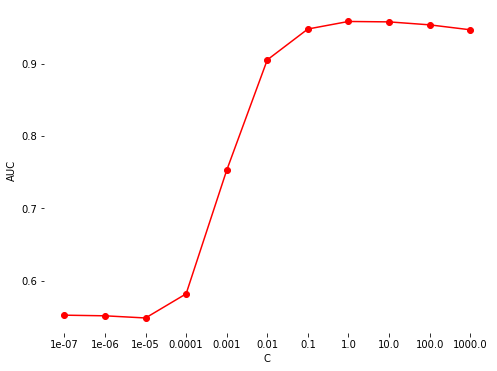

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False) 0.9583132256730925


In [31]:
best_model, best_score, all_models, all_scores = pf.bestFit(LogisticRegression(), paramGrid,
                                                    X_train, y_train, X_valid, y_valid, # nfolds=5 [optional, instead of validation set]
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')
print(best_model, best_score)

In [32]:
log_regression = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn', n_jobs=-1,
          penalty='l2', random_state=None, solver='warn', tol=0.0001,
          verbose=0, warm_start=False)

In [33]:
log_regression.fit(X_train_sparse, y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [34]:
log_reg_pred = log_regression.predict_proba(X_test_sparse)[:, 1]
write_to_submission_file(log_reg_pred, "./kaggle_data/log_reg_predictions_3.csv")

Result = 0.90812

**SGDClassifier**

In [35]:
sgd_logit = SGDClassifier(loss='log', alpha=1e-5, max_iter=1000, n_jobs=-1)
sgd_logit.fit(X_train_sparse, y)
logit_test_pred_proba = sgd_logit.predict(X_test_sparse)
write_to_submission_file(logit_test_pred_proba, "./kaggle_data/predictions_2.csv")

Result = 0.54508

**TimeSeriesSplit**

In [36]:
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, GridSearchCV

In [37]:
time_split = TimeSeriesSplit(n_splits=10)

In [38]:
[(el[0].shape, el[1].shape) for el in time_split.split(X_train_sparse)]

[((23051,), (23051,)),
 ((46102,), (23051,)),
 ((69153,), (23051,)),
 ((92204,), (23051,)),
 ((115255,), (23051,)),
 ((138306,), (23051,)),
 ((161357,), (23051,)),
 ((184408,), (23051,)),
 ((207459,), (23051,)),
 ((230510,), (23051,))]

In [39]:
logit = LogisticRegression(C=1, random_state=17)

In [40]:
cv_scores = cross_val_score(logit, X_train_sparse, y, cv=time_split, 
                            scoring='roc_auc', n_jobs=1) 

In [41]:
cv_scores, cv_scores.mean()

(array([0.89884502, 0.94049177, 0.95523995, 0.95528599, 0.94635443,
        0.96725049, 0.96693032, 0.95149412, 0.9635519 , 0.96433144]),
 0.9509775425813588)

In [42]:
logit.fit(X_train_sparse, y)

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=17, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [43]:
cv_pred = logit.predict_proba(X_test_sparse)[:, 1]
write_to_submission_file(cv_pred, "./kaggle_data/cv_2_predictions.csv")

Result = 0.90812

**Gradient Boosting regression**

In [44]:
from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error

In [45]:
# Fit regression model
params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}
clf = ensemble.GradientBoostingRegressor(**params)

clf.fit(X_train, y_train)
mse = mean_squared_error(y_valid, clf.predict(X_valid))
print("MSE: %.4f" % mse)

KeyboardInterrupt: 

In [ ]:
clf.fit(X_train_sparse, y)

In [ ]:
gbr = clf.predict(X_test_sparse)
write_to_submission_file(gbr, "./kaggle_data/GradientBoostingRegressor.csv")

Result = 0.83250

**GridSearchCV**

In [ ]:
c_values = np.logspace(-2, 2, 10)

logit_grid_searcher = GridSearchCV(estimator=logit, param_grid={'C': c_values},
                                  scoring='roc_auc', n_jobs=1, cv=time_split, verbose=1)

In [ ]:
logit_grid_searcher.fit(X_train_sparse, y)

In [ ]:
lg_searcher = logit_grid_searcher.predict_proba(X_test_sparse)[:, 1]
write_to_submission_file(lg_searcher, "./kaggle_data/logit_grid_searche.csv")

Result = 0.90556

In [ ]:
logit = LogisticRegression(random_state=17, solver='liblinear')

#BEST_LOGIT_C = 5.45559
BEST_LOGIT_C = 1

# I've done cross-validation locally, and do not reproduce these heavy computations here,
# but this is the vest C that I've found
c_values = [BEST_LOGIT_C]

logit_grid_searcher = GridSearchCV(estimator=logit, param_grid={'C': c_values},
                              scoring='roc_auc', n_jobs=-1, cv=time_split, verbose=1)
logit_grid_searcher.fit(X_train_sparse, y)
print('CV score', logit_grid_searcher.best_score_)


In [ ]:
lg_searcher = logit_grid_searcher.predict_proba(X_test_sparse)[:, 1]
write_to_submission_file(lg_searcher, "./kaggle_data/logit_grid_searche_2.csv")

Result = 0.90042

In [ ]:
lg_searcher = logit_grid_searcher.predict_proba(X_test_sparse)[:, 1]
write_to_submission_file(lg_searcher, "./kaggle_data/logit_grid_searche_3.csv")

Result = 0.90812